In [1]:
import os
import pandas as pd
import datetime
from matplotlib import pyplot
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.utils import class_weight
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import CuDNNLSTM
from keras.layers import CuDNNGRU
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.layers import Bidirectional
from keras.layers import Lambda
from keras.layers import Dropout
from keras.layers import SimpleRNN
from keras.utils import generic_utils
from keras.utils import Sequence
from keras import regularizers
from keras import optimizers
from keras.callbacks import ModelCheckpoint
import tensorflow as tf
import numpy as np
import scipy 
import math
import h5py
import time
import copy
import sys
import feather
from sklearn.metrics import mean_absolute_error
from numpy.random import seed
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
seed(123)
from tensorflow import set_random_seed
set_random_seed(456)
np.set_printoptions(threshold=sys.maxsize)

Using TensorFlow backend.


In [2]:
import keras
print(os.getcwd())
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
tf.keras.backend.set_session(tf.Session(config=config))
from tensorflow.python.client import device_lib
#print(device_lib.list_local_devices())

/home/whsu014/dev/mlrig/Experiments


In [3]:
#view_1hot_df = feather.read_dataframe("/home/whsu014/data/view_1hot_nona_len29_float_age_impute_and_True_HG_100096inds.feather")
view_1hot_df = feather.read_dataframe("/home/whsu014/data/view_imp_fatal_cvd_patched_100096inds.feather")
print(view_1hot_df.shape)

print(view_1hot_df['CVD_ISOSORBRIDE_DINITRATE'].unique())
view_1hot_df = view_1hot_df.drop(['CVD_ISOSORBRIDE_DINITRATE'], axis=1)
print(view_1hot_df.shape)

(2902784, 191)
[0.]
(2902784, 190)


In [4]:
print("Number of inds:", len(view_1hot_df['VSIMPLE_INDEX_MASTER'].unique()))
# set length to 28
print(view_1hot_df.shape[0]/29)
view_1hot_df = copy.deepcopy(view_1hot_df[view_1hot_df['QUARTER']!=0])
print(view_1hot_df.shape[0]/28)
# Take 90000 inds for train and validation set
# remove true values
# remove QUARTER
view_1hot_df = view_1hot_df.drop(['QUARTER'], axis=1)
train_v = copy.deepcopy(view_1hot_df.iloc[:(28*90000), :-7].values)
print(train_v.shape)
print(train_v.shape[0]/28)

Number of inds: 100096
100096.0
100096.0
(2520000, 182)
90000.0


## Get Statistics on positive class (patients having at least one CVD event)

In [5]:
view_v = copy.deepcopy(view_1hot_df.values)

In [6]:
#view_1hot_df['PT_ATRIAL_FIBRILLATION'].unique()
#view_1hot_df['PT_IMP_FATAL_CVD'].unique()
print("Number of days:", view_1hot_df.columns.get_loc('NUMBER_OF_DAYS'))
print("Acute adm:", view_1hot_df.columns.get_loc('ACUTE_ADM'))
print("Mortality broad cvd with other:", view_1hot_df.columns.get_loc('mortality_broad_cvd_with_other'))
print("out broad_cvd:", view_1hot_df.columns.get_loc('out_broad_cvd'))
print("out atrial fibrillation:", view_1hot_df.columns.get_loc('out_atrial_fibrillation'))

Number of days: 120
Acute adm: 121
Mortality broad cvd with other: 143
out broad_cvd: 145
out atrial fibrillation: 162


In [7]:
num_of_inds = view_v.shape[0]//28
print("Number of individuals:", num_of_inds)

ind_w_event = []
for i in range(num_of_inds):
    ind_v = view_v[(i*28):((i+1)*28), :]
    for j in range(8, 28):
        if ind_v[j , 121] == 1.0 and \
           1.0 in ind_v[j, 143:162]:
            ind_w_event.append(ind_v[0, 0])
print("Number of acute CVD hospitalisations:", len(set(ind_w_event)))

Number of individuals: 100096
Number of acute CVD hospitalisations: 11123


In [8]:
ind_cvd_death = view_1hot_df[view_1hot_df['PT_IMP_FATAL_CVD']==1]\
                         ['VSIMPLE_INDEX_MASTER'].unique()
print("Number of CVD deaths:", len(ind_cvd_death))

Number of CVD deaths: 2998


In [9]:
ind_w_event = list(set(ind_w_event)) + list(ind_cvd_death)
print("Number of CVD events including CVD deaths:", len(set(ind_w_event)))

Number of CVD events including CVD deaths: 12231


In [10]:
ind_w_event = set(ind_w_event)
# assess statistics in training and testing set
train_df  = view_1hot_df.iloc[:(28*90000), :-7]
test_df = view_1hot_df.iloc[(28*90000):, :-7] 
print(train_df.shape)
print(train_df.shape[0]/28)
print(test_df.shape)
print(test_df.shape[0]/28)
             
ind_w_event_train = train_df[train_df['VSIMPLE_INDEX_MASTER'].isin(ind_w_event)]['VSIMPLE_INDEX_MASTER'].unique()
ind_w_event_test = test_df[test_df['VSIMPLE_INDEX_MASTER'].isin(ind_w_event)]['VSIMPLE_INDEX_MASTER'].unique()
print("Number of inds with CVD events (training set):", len(ind_w_event_train))
print("Number of inds with CVD events (testing set):", len(ind_w_event_test))
ind_death_train = train_df[train_df['VSIMPLE_INDEX_MASTER'].isin(ind_cvd_death)]['VSIMPLE_INDEX_MASTER'].unique()
ind_death_test = test_df[test_df['VSIMPLE_INDEX_MASTER'].isin(ind_cvd_death)]['VSIMPLE_INDEX_MASTER'].unique()
print("Number of CVD deaths (training set):", len(ind_death_train))
print("Number of CVD deaths (testing set):", len(ind_death_test))

(2520000, 182)
90000.0
(282688, 182)
10096.0
Number of inds with CVD events (training set): 10945
Number of inds with CVD events (testing set): 1286
Number of CVD deaths (training set): 2657
Number of CVD deaths (testing set): 341


In [11]:
print("DIED:", view_1hot_df.columns.get_loc('DIED'))

DIED: 16


In [12]:
num_of_inds = view_v.shape[0]//28
print("Number of individuals:", num_of_inds)

ind_died = []
for i in range(num_of_inds):
    ind_v = view_v[(i*28):((i+1)*28), :]
    if 1.0 in ind_v[:, 16]:
        ind_died.append(ind_v[0, 0])
ind_died = list(set(ind_died))
print("Number of deaths:", len(ind_died))

Number of individuals: 100096
Number of deaths: 6634


In [13]:
ind_death_train = train_df[train_df['VSIMPLE_INDEX_MASTER'].isin(ind_died)]['VSIMPLE_INDEX_MASTER'].unique()
ind_death_test = test_df[test_df['VSIMPLE_INDEX_MASTER'].isin(ind_died)]['VSIMPLE_INDEX_MASTER'].unique()
print("Number of deaths (training set):", len(ind_death_train))
print("Number of deaths (testing set):", len(ind_death_test))

Number of deaths (training set): 5940
Number of deaths (testing set): 694


## Hyperparameter tuning

In [5]:
print("out atrial fibrillation:", view_1hot_df.columns.get_loc('out_atrial_fibrillation'))
print("PT IMP FATAL CVD:", view_1hot_df.columns.get_loc('PT_IMP_FATAL_CVD'))

out atrial fibrillation: 162
PT IMP FATAL CVD: 181


In [6]:
#################################
# construct y
#################################
num_of_inds = train_v.shape[0]//28
print("Number of individuals:", num_of_inds)

y_train = np.empty((num_of_inds, 2))

for i in range(num_of_inds):
    ind_v = train_v[(i*28):((i+1)*28), :]
    event = False
    for j in range(8, 28):
        if ind_v[j, 121] == 1.0 and \
            1.0 in ind_v[j, 143:162]:  # it is an acute CVD event
            event = True
    if 1.0 in ind_v[8:, 181]:
        event = True
    if event:
        y_train[i, :] = np.array([0.0, 1.0])
    else:
        y_train[i, :] = np.array([1.0, 0.0])
print("Number of individuals who had a CVD event:", \
      sum(y_train[:, 1]))
print("Event ratio:", sum(y_train[:, 1])/num_of_inds)

Number of individuals: 90000
Number of individuals who had a CVD event: 10945.0
Event ratio: 0.12161111111111111


In [7]:
print(y_train[y_train[:, 0]==1].shape)
print(y_train[y_train[:, 1]==1].shape)

(79055, 2)
(10945, 2)


In [8]:
# set up train_v for scaling remove prediction window
num_of_inds = train_v.shape[0]//28
print("Number of inds:", num_of_inds)
num_of_features = train_v.shape[1]
print("Number of features:", num_of_features)

train_ = np.empty(((8*num_of_inds), num_of_features))
for i in range(num_of_inds):
    ind_v = train_v[(i*28):((i+1)*28), :]
    train_[(i*8):((i+1)*8), : ] = ind_v[:8, :]
print(train_.shape)

Number of inds: 90000
Number of features: 182
(720000, 182)


In [9]:
# standardise data
# z = (X - u)/s
# u is the mean of the training samples
# s is the standard devidation of the training samples
scaler = StandardScaler()
#scaled_train = scaler.fit_transform(train_v) 
scaled_train = scaler.fit_transform(train_) 

In [10]:
# make x_train
num_of_inds = train_v.shape[0]//28
print("Number of inds:", num_of_inds)
num_of_features = train_v.shape[1]
print("Number of features:", num_of_features)

x_train = np.empty((num_of_inds, 8, num_of_features))

for i in range(num_of_inds):
    scaled_ind_v = scaled_train[(i*8):((i+1)*8), :]
    x_train[i] = scaled_ind_v[:8, :]
print(x_train.shape)
print(y_train.shape)

Number of inds: 90000
Number of features: 182
(90000, 8, 182)
(90000, 2)


In [11]:
num_per_fold = x_train.shape[0]//10
print(num_per_fold)

9000


9000
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 12.8435 - acc: 0.6789 - val_loss: 10.0057 - val_acc: 0.7937

Epoch 00001: val_loss improved from inf to 10.00568, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 8.0716 - acc: 0.8160 - val_loss: 6.1573 - val_acc: 0.8551

Epoch 00002: val_loss improved from 10.00568 to 6.15725, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 4.9229 - acc: 0.8665 - val_loss: 3.7260 - val_acc: 0.8838

Epoch 00003: val_loss improved from 6.15725 to 3.72596, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 2.9845 - acc: 0.8818 - val_loss: 2.2603 - val_acc: 0.8878

Epoch 00004: val_loss improved from 3.72596 to 2.26030, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 1.8207 - acc: 0.8843 - val_loss: 1.3904 - val_acc: 0.8886

Epoch 00005: val_


Epoch 00044: val_loss improved from 0.29453 to 0.29447, saving model to Event_val_weights1.hdf5
Epoch 45/200
 - 1s - loss: 0.3020 - acc: 0.8868 - val_loss: 0.2946 - val_acc: 0.8887

Epoch 00045: val_loss did not improve from 0.29447
Epoch 46/200
 - 1s - loss: 0.3020 - acc: 0.8867 - val_loss: 0.2944 - val_acc: 0.8884

Epoch 00046: val_loss improved from 0.29447 to 0.29441, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.3019 - acc: 0.8868 - val_loss: 0.2944 - val_acc: 0.8887

Epoch 00047: val_loss did not improve from 0.29441
Epoch 48/200
 - 1s - loss: 0.3019 - acc: 0.8868 - val_loss: 0.2944 - val_acc: 0.8884

Epoch 00048: val_loss improved from 0.29441 to 0.29436, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.3018 - acc: 0.8869 - val_loss: 0.2945 - val_acc: 0.8883

Epoch 00049: val_loss did not improve from 0.29436
Epoch 50/200
 - 1s - loss: 0.3018 - acc: 0.8869 - val_loss: 0.2943 - val_acc: 0.8882

Epoch 00050: val_loss improved from 0.2943


Epoch 00101: val_loss did not improve from 0.29395
Epoch 102/200
 - 1s - loss: 0.2996 - acc: 0.8873 - val_loss: 0.2960 - val_acc: 0.8891

Epoch 00102: val_loss did not improve from 0.29395
Epoch 103/200
 - 1s - loss: 0.2998 - acc: 0.8874 - val_loss: 0.2960 - val_acc: 0.8890

Epoch 00103: val_loss did not improve from 0.29395
Epoch 104/200
 - 1s - loss: 0.2996 - acc: 0.8879 - val_loss: 0.2953 - val_acc: 0.8888

Epoch 00104: val_loss did not improve from 0.29395
Epoch 105/200
 - 1s - loss: 0.2994 - acc: 0.8879 - val_loss: 0.2953 - val_acc: 0.8884

Epoch 00105: val_loss did not improve from 0.29395
Epoch 106/200
 - 1s - loss: 0.2993 - acc: 0.8878 - val_loss: 0.2959 - val_acc: 0.8876

Epoch 00106: val_loss did not improve from 0.29395
Epoch 107/200
 - 1s - loss: 0.2994 - acc: 0.8880 - val_loss: 0.2961 - val_acc: 0.8880

Epoch 00107: val_loss did not improve from 0.29395
Epoch 108/200
 - 1s - loss: 0.2994 - acc: 0.8880 - val_loss: 0.2962 - val_acc: 0.8882

Epoch 00108: val_loss did not imp

 - 1s - loss: 0.2979 - acc: 0.8882 - val_loss: 0.2993 - val_acc: 0.8878

Epoch 00161: val_loss did not improve from 0.29395
Epoch 162/200
 - 1s - loss: 0.2988 - acc: 0.8881 - val_loss: 0.2989 - val_acc: 0.8894

Epoch 00162: val_loss did not improve from 0.29395
Epoch 163/200
 - 1s - loss: 0.2990 - acc: 0.8880 - val_loss: 0.2986 - val_acc: 0.8886

Epoch 00163: val_loss did not improve from 0.29395
Epoch 164/200
 - 1s - loss: 0.2984 - acc: 0.8889 - val_loss: 0.2977 - val_acc: 0.8874

Epoch 00164: val_loss did not improve from 0.29395
Epoch 165/200
 - 1s - loss: 0.2976 - acc: 0.8883 - val_loss: 0.2974 - val_acc: 0.8878

Epoch 00165: val_loss did not improve from 0.29395
Epoch 166/200
 - 1s - loss: 0.2976 - acc: 0.8884 - val_loss: 0.2978 - val_acc: 0.8879

Epoch 00166: val_loss did not improve from 0.29395
Epoch 167/200
 - 1s - loss: 0.2976 - acc: 0.8887 - val_loss: 0.2983 - val_acc: 0.8881

Epoch 00167: val_loss did not improve from 0.29395
Epoch 168/200
 - 1s - loss: 0.2974 - acc: 0.8888

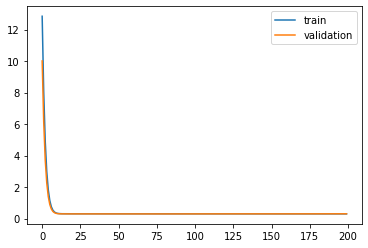

Time to train LSTM:  124.36002826690674
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 1s - loss: 12.9501 - acc: 0.6443 - val_loss: 10.0984 - val_acc: 0.7557

Epoch 00001: val_loss improved from inf to 10.09839, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 8.1430 - acc: 0.7993 - val_loss: 6.2269 - val_acc: 0.8428

Epoch 00002: val_loss improved from 10.09839 to 6.22685, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 4.9724 - acc: 0.8619 - val_loss: 3.7734 - val_acc: 0.8763

Epoch 00003: val_loss improved from 6.22685 to 3.77336, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 3.0128 - acc: 0.8800 - val_loss: 2.2913 - val_acc: 0.8818

Epoch 00004: val_loss improved from 3.77336 to 2.29128, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 1.8359 - acc: 0.8840 - val_loss: 1.4120 - val_acc: 0.8837

Epoch 00005: val_loss improved from 2.29128 to 1.41203, saving model to Event_val_weights2.hdf5
Epoch 

 - 1s - loss: 0.3012 - acc: 0.8874 - val_loss: 0.3069 - val_acc: 0.8831

Epoch 00048: val_loss did not improve from 0.30684
Epoch 49/200
 - 1s - loss: 0.3011 - acc: 0.8876 - val_loss: 0.3070 - val_acc: 0.8832

Epoch 00049: val_loss did not improve from 0.30684
Epoch 50/200
 - 1s - loss: 0.3011 - acc: 0.8875 - val_loss: 0.3067 - val_acc: 0.8830

Epoch 00050: val_loss improved from 0.30684 to 0.30675, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.3010 - acc: 0.8875 - val_loss: 0.3070 - val_acc: 0.8830

Epoch 00051: val_loss did not improve from 0.30675
Epoch 52/200
 - 1s - loss: 0.3011 - acc: 0.8876 - val_loss: 0.3069 - val_acc: 0.8827

Epoch 00052: val_loss did not improve from 0.30675
Epoch 53/200
 - 1s - loss: 0.3010 - acc: 0.8875 - val_loss: 0.3068 - val_acc: 0.8832

Epoch 00053: val_loss did not improve from 0.30675
Epoch 54/200
 - 1s - loss: 0.3010 - acc: 0.8876 - val_loss: 0.3067 - val_acc: 0.8827

Epoch 00054: val_loss improved from 0.30675 to 0.30674, savi


Epoch 00106: val_loss did not improve from 0.30663
Epoch 107/200
 - 1s - loss: 0.2992 - acc: 0.8884 - val_loss: 0.3084 - val_acc: 0.8838

Epoch 00107: val_loss did not improve from 0.30663
Epoch 108/200
 - 1s - loss: 0.2994 - acc: 0.8883 - val_loss: 0.3083 - val_acc: 0.8844

Epoch 00108: val_loss did not improve from 0.30663
Epoch 109/200
 - 1s - loss: 0.2992 - acc: 0.8879 - val_loss: 0.3080 - val_acc: 0.8851

Epoch 00109: val_loss did not improve from 0.30663
Epoch 110/200
 - 1s - loss: 0.2991 - acc: 0.8882 - val_loss: 0.3080 - val_acc: 0.8847

Epoch 00110: val_loss did not improve from 0.30663
Epoch 111/200
 - 1s - loss: 0.2990 - acc: 0.8882 - val_loss: 0.3078 - val_acc: 0.8850

Epoch 00111: val_loss did not improve from 0.30663
Epoch 112/200
 - 1s - loss: 0.2991 - acc: 0.8885 - val_loss: 0.3087 - val_acc: 0.8844

Epoch 00112: val_loss did not improve from 0.30663
Epoch 113/200
 - 1s - loss: 0.2994 - acc: 0.8883 - val_loss: 0.3081 - val_acc: 0.8840

Epoch 00113: val_loss did not imp

 - 1s - loss: 0.2974 - acc: 0.8898 - val_loss: 0.3111 - val_acc: 0.8816

Epoch 00166: val_loss did not improve from 0.30663
Epoch 167/200
 - 1s - loss: 0.2974 - acc: 0.8896 - val_loss: 0.3113 - val_acc: 0.8829

Epoch 00167: val_loss did not improve from 0.30663
Epoch 168/200
 - 1s - loss: 0.2974 - acc: 0.8893 - val_loss: 0.3119 - val_acc: 0.8819

Epoch 00168: val_loss did not improve from 0.30663
Epoch 169/200
 - 1s - loss: 0.2977 - acc: 0.8893 - val_loss: 0.3118 - val_acc: 0.8817

Epoch 00169: val_loss did not improve from 0.30663
Epoch 170/200
 - 1s - loss: 0.2973 - acc: 0.8896 - val_loss: 0.3123 - val_acc: 0.8821

Epoch 00170: val_loss did not improve from 0.30663
Epoch 171/200
 - 1s - loss: 0.2972 - acc: 0.8894 - val_loss: 0.3115 - val_acc: 0.8820

Epoch 00171: val_loss did not improve from 0.30663
Epoch 172/200
 - 1s - loss: 0.2973 - acc: 0.8900 - val_loss: 0.3127 - val_acc: 0.8813

Epoch 00172: val_loss did not improve from 0.30663
Epoch 173/200
 - 1s - loss: 0.2973 - acc: 0.8893

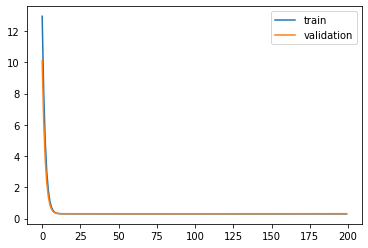

Time to train LSTM:  130.2735025882721
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 1s - loss: 12.9413 - acc: 0.6481 - val_loss: 10.0840 - val_acc: 0.7614

Epoch 00001: val_loss improved from inf to 10.08400, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 8.1188 - acc: 0.8064 - val_loss: 6.1967 - val_acc: 0.8459

Epoch 00002: val_loss improved from 10.08400 to 6.19672, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 4.9368 - acc: 0.8685 - val_loss: 3.7451 - val_acc: 0.8784

Epoch 00003: val_loss improved from 6.19672 to 3.74510, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 2.9851 - acc: 0.8821 - val_loss: 2.2715 - val_acc: 0.8809

Epoch 00004: val_loss improved from 3.74510 to 2.27148, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 1.8179 - acc: 0.8852 - val_loss: 1.3979 - val_acc: 0.8833

Epoch 00005: val_loss improved from 2.27148 to 1.39788, saving model to Event_val_weights3.hdf5
Epoch 6


Epoch 00046: val_loss improved from 0.30272 to 0.30268, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3007 - acc: 0.8868 - val_loss: 0.3027 - val_acc: 0.8884

Epoch 00047: val_loss did not improve from 0.30268
Epoch 48/200
 - 1s - loss: 0.3006 - acc: 0.8868 - val_loss: 0.3027 - val_acc: 0.8884

Epoch 00048: val_loss did not improve from 0.30268
Epoch 49/200
 - 1s - loss: 0.3006 - acc: 0.8868 - val_loss: 0.3027 - val_acc: 0.8886

Epoch 00049: val_loss improved from 0.30268 to 0.30267, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.3005 - acc: 0.8868 - val_loss: 0.3027 - val_acc: 0.8884

Epoch 00050: val_loss did not improve from 0.30267
Epoch 51/200
 - 1s - loss: 0.3005 - acc: 0.8868 - val_loss: 0.3026 - val_acc: 0.8883

Epoch 00051: val_loss improved from 0.30267 to 0.30264, saving model to Event_val_weights3.hdf5
Epoch 52/200
 - 1s - loss: 0.3003 - acc: 0.8869 - val_loss: 0.3027 - val_acc: 0.8880

Epoch 00052: val_loss did not improve from

 - 1s - loss: 0.2986 - acc: 0.8880 - val_loss: 0.3037 - val_acc: 0.8873

Epoch 00105: val_loss did not improve from 0.30255
Epoch 106/200
 - 1s - loss: 0.2984 - acc: 0.8885 - val_loss: 0.3040 - val_acc: 0.8882

Epoch 00106: val_loss did not improve from 0.30255
Epoch 107/200
 - 1s - loss: 0.2984 - acc: 0.8882 - val_loss: 0.3040 - val_acc: 0.8878

Epoch 00107: val_loss did not improve from 0.30255
Epoch 108/200
 - 1s - loss: 0.2985 - acc: 0.8882 - val_loss: 0.3037 - val_acc: 0.8881

Epoch 00108: val_loss did not improve from 0.30255
Epoch 109/200
 - 1s - loss: 0.2984 - acc: 0.8882 - val_loss: 0.3034 - val_acc: 0.8883

Epoch 00109: val_loss did not improve from 0.30255
Epoch 110/200
 - 1s - loss: 0.2984 - acc: 0.8884 - val_loss: 0.3037 - val_acc: 0.8879

Epoch 00110: val_loss did not improve from 0.30255
Epoch 111/200
 - 1s - loss: 0.2984 - acc: 0.8881 - val_loss: 0.3037 - val_acc: 0.8881

Epoch 00111: val_loss did not improve from 0.30255
Epoch 112/200
 - 1s - loss: 0.2982 - acc: 0.8882


Epoch 00164: val_loss did not improve from 0.30255
Epoch 165/200
 - 1s - loss: 0.2974 - acc: 0.8881 - val_loss: 0.3042 - val_acc: 0.8868

Epoch 00165: val_loss did not improve from 0.30255
Epoch 166/200
 - 1s - loss: 0.2972 - acc: 0.8888 - val_loss: 0.3048 - val_acc: 0.8861

Epoch 00166: val_loss did not improve from 0.30255
Epoch 167/200
 - 1s - loss: 0.2971 - acc: 0.8888 - val_loss: 0.3044 - val_acc: 0.8869

Epoch 00167: val_loss did not improve from 0.30255
Epoch 168/200
 - 1s - loss: 0.2971 - acc: 0.8889 - val_loss: 0.3049 - val_acc: 0.8864

Epoch 00168: val_loss did not improve from 0.30255
Epoch 169/200
 - 1s - loss: 0.2971 - acc: 0.8889 - val_loss: 0.3043 - val_acc: 0.8868

Epoch 00169: val_loss did not improve from 0.30255
Epoch 170/200
 - 1s - loss: 0.2969 - acc: 0.8889 - val_loss: 0.3047 - val_acc: 0.8859

Epoch 00170: val_loss did not improve from 0.30255
Epoch 171/200
 - 1s - loss: 0.2972 - acc: 0.8888 - val_loss: 0.3045 - val_acc: 0.8866

Epoch 00171: val_loss did not imp

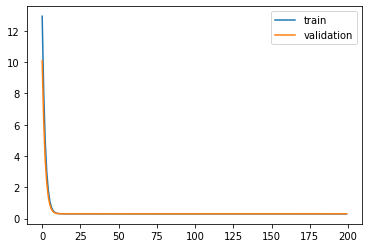

Time to train LSTM:  129.9001796245575


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f93980898d0>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 1s - loss: 12.9583 - acc: 0.6499 - val_loss: 10.1013 - val_acc: 0.7678

Epoch 00001: val_loss improved from inf to 10.10126, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 8.1381 - acc: 0.8121 - val_loss: 6.2174 - val_acc: 0.8504

Epoch 00002: val_loss improved from 10.10126 to 6.21738, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 4.9630 - acc: 0.8710 - val_loss: 3.7784 - val_acc: 0.8724

Epoch 00003: val_loss improved from 6.21738 to 3.77844, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 3.0130 - acc: 0.8820 - val_loss: 2.2986 - val_acc: 0.8808

Epoch 00004: val_loss improved from 3.77844 to 2.29856, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 1.8392 - acc: 0.8854 - val_loss: 1.4191 - val_acc: 0.8824

Epoch 00005: val_loss improved from 2.29856 to 1.41911, saving model to Event_val_weights4.hdf5
Epoch 6/200
 - 1s - loss: 1.1491 - acc: 0.8860


Epoch 00046: val_loss improved from 0.30695 to 0.30691, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.3005 - acc: 0.8871 - val_loss: 0.3070 - val_acc: 0.8838

Epoch 00047: val_loss did not improve from 0.30691
Epoch 48/200
 - 1s - loss: 0.3004 - acc: 0.8872 - val_loss: 0.3069 - val_acc: 0.8838

Epoch 00048: val_loss improved from 0.30691 to 0.30688, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.3003 - acc: 0.8872 - val_loss: 0.3069 - val_acc: 0.8836

Epoch 00049: val_loss improved from 0.30688 to 0.30686, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3003 - acc: 0.8872 - val_loss: 0.3068 - val_acc: 0.8837

Epoch 00050: val_loss improved from 0.30686 to 0.30682, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.3003 - acc: 0.8871 - val_loss: 0.3068 - val_acc: 0.8836

Epoch 00051: val_loss did not improve from 0.30682
Epoch 52/200
 - 1s - loss: 0.3002 - acc: 0.8872 - val_loss: 0.3068 - val_acc: 0.883


Epoch 00097: val_loss did not improve from 0.30594
Epoch 98/200
 - 1s - loss: 0.2988 - acc: 0.8878 - val_loss: 0.3059 - val_acc: 0.8833

Epoch 00098: val_loss improved from 0.30594 to 0.30593, saving model to Event_val_weights4.hdf5
Epoch 99/200
 - 1s - loss: 0.2989 - acc: 0.8879 - val_loss: 0.3060 - val_acc: 0.8832

Epoch 00099: val_loss did not improve from 0.30593
Epoch 100/200
 - 1s - loss: 0.2988 - acc: 0.8880 - val_loss: 0.3059 - val_acc: 0.8830

Epoch 00100: val_loss did not improve from 0.30593
Epoch 101/200
 - 1s - loss: 0.2989 - acc: 0.8877 - val_loss: 0.3059 - val_acc: 0.8830

Epoch 00101: val_loss improved from 0.30593 to 0.30593, saving model to Event_val_weights4.hdf5
Epoch 102/200
 - 1s - loss: 0.2988 - acc: 0.8877 - val_loss: 0.3059 - val_acc: 0.8833

Epoch 00102: val_loss improved from 0.30593 to 0.30592, saving model to Event_val_weights4.hdf5
Epoch 103/200
 - 1s - loss: 0.2988 - acc: 0.8877 - val_loss: 0.3060 - val_acc: 0.8829

Epoch 00103: val_loss did not improve 

 - 1s - loss: 0.2980 - acc: 0.8881 - val_loss: 0.3060 - val_acc: 0.8832

Epoch 00155: val_loss did not improve from 0.30572
Epoch 156/200
 - 1s - loss: 0.2982 - acc: 0.8881 - val_loss: 0.3062 - val_acc: 0.8838

Epoch 00156: val_loss did not improve from 0.30572
Epoch 157/200
 - 1s - loss: 0.2982 - acc: 0.8883 - val_loss: 0.3064 - val_acc: 0.8834

Epoch 00157: val_loss did not improve from 0.30572
Epoch 158/200
 - 1s - loss: 0.2984 - acc: 0.8884 - val_loss: 0.3059 - val_acc: 0.8841

Epoch 00158: val_loss did not improve from 0.30572
Epoch 159/200
 - 1s - loss: 0.2980 - acc: 0.8882 - val_loss: 0.3060 - val_acc: 0.8842

Epoch 00159: val_loss did not improve from 0.30572
Epoch 160/200
 - 1s - loss: 0.2982 - acc: 0.8882 - val_loss: 0.3060 - val_acc: 0.8837

Epoch 00160: val_loss did not improve from 0.30572
Epoch 161/200
 - 1s - loss: 0.2983 - acc: 0.8881 - val_loss: 0.3062 - val_acc: 0.8833

Epoch 00161: val_loss did not improve from 0.30572
Epoch 162/200
 - 1s - loss: 0.2982 - acc: 0.8884

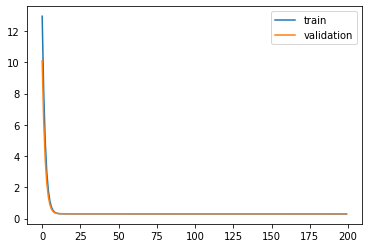

Time to train LSTM:  129.1940302848816
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 1s - loss: 12.8962 - acc: 0.6305 - val_loss: 10.0409 - val_acc: 0.7649

Epoch 00001: val_loss improved from inf to 10.04087, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 8.0871 - acc: 0.8071 - val_loss: 6.1652 - val_acc: 0.8489

Epoch 00002: val_loss improved from 10.04087 to 6.16525, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 4.9182 - acc: 0.8659 - val_loss: 3.7280 - val_acc: 0.8767

Epoch 00003: val_loss improved from 6.16525 to 3.72804, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 2.9749 - acc: 0.8816 - val_loss: 2.2598 - val_acc: 0.8836

Epoch 00004: val_loss improved from 3.72804 to 2.25982, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 1.8118 - acc: 0.8845 - val_loss: 1.3917 - val_acc: 0.8856

Epoch 00005: val_loss improved from 2.25982 to 1.39171, saving model to Event_val_weights5.hdf5
Epoch 6

 - 1s - loss: 0.3007 - acc: 0.8869 - val_loss: 0.3025 - val_acc: 0.8873

Epoch 00049: val_loss improved from 0.30255 to 0.30253, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3007 - acc: 0.8870 - val_loss: 0.3025 - val_acc: 0.8872

Epoch 00050: val_loss improved from 0.30253 to 0.30246, saving model to Event_val_weights5.hdf5
Epoch 51/200
 - 1s - loss: 0.3006 - acc: 0.8869 - val_loss: 0.3026 - val_acc: 0.8872

Epoch 00051: val_loss did not improve from 0.30246
Epoch 52/200
 - 1s - loss: 0.3005 - acc: 0.8869 - val_loss: 0.3024 - val_acc: 0.8872

Epoch 00052: val_loss improved from 0.30246 to 0.30237, saving model to Event_val_weights5.hdf5
Epoch 53/200
 - 1s - loss: 0.3005 - acc: 0.8869 - val_loss: 0.3025 - val_acc: 0.8872

Epoch 00053: val_loss did not improve from 0.30237
Epoch 54/200
 - 1s - loss: 0.3004 - acc: 0.8869 - val_loss: 0.3024 - val_acc: 0.8872

Epoch 00054: val_loss did not improve from 0.30237
Epoch 55/200
 - 1s - loss: 0.3004 - acc: 0.8868 - val_lo


Epoch 00107: val_loss did not improve from 0.30224
Epoch 108/200
 - 1s - loss: 0.2991 - acc: 0.8874 - val_loss: 0.3026 - val_acc: 0.8883

Epoch 00108: val_loss did not improve from 0.30224
Epoch 109/200
 - 1s - loss: 0.2992 - acc: 0.8876 - val_loss: 0.3035 - val_acc: 0.8881

Epoch 00109: val_loss did not improve from 0.30224
Epoch 110/200
 - 1s - loss: 0.2990 - acc: 0.8880 - val_loss: 0.3030 - val_acc: 0.8889

Epoch 00110: val_loss did not improve from 0.30224
Epoch 111/200
 - 1s - loss: 0.2988 - acc: 0.8880 - val_loss: 0.3028 - val_acc: 0.8883

Epoch 00111: val_loss did not improve from 0.30224
Epoch 112/200
 - 1s - loss: 0.2987 - acc: 0.8882 - val_loss: 0.3032 - val_acc: 0.8876

Epoch 00112: val_loss did not improve from 0.30224
Epoch 113/200
 - 1s - loss: 0.2988 - acc: 0.8876 - val_loss: 0.3028 - val_acc: 0.8882

Epoch 00113: val_loss did not improve from 0.30224
Epoch 114/200
 - 1s - loss: 0.2987 - acc: 0.8880 - val_loss: 0.3031 - val_acc: 0.8883

Epoch 00114: val_loss did not imp

 - 1s - loss: 0.2980 - acc: 0.8880 - val_loss: 0.3036 - val_acc: 0.8886

Epoch 00167: val_loss did not improve from 0.30224
Epoch 168/200
 - 1s - loss: 0.2982 - acc: 0.8881 - val_loss: 0.3037 - val_acc: 0.8878

Epoch 00168: val_loss did not improve from 0.30224
Epoch 169/200
 - 1s - loss: 0.2979 - acc: 0.8882 - val_loss: 0.3033 - val_acc: 0.8891

Epoch 00169: val_loss did not improve from 0.30224
Epoch 170/200
 - 1s - loss: 0.2980 - acc: 0.8884 - val_loss: 0.3040 - val_acc: 0.8882

Epoch 00170: val_loss did not improve from 0.30224
Epoch 171/200
 - 1s - loss: 0.2981 - acc: 0.8882 - val_loss: 0.3034 - val_acc: 0.8886

Epoch 00171: val_loss did not improve from 0.30224
Epoch 172/200
 - 1s - loss: 0.2980 - acc: 0.8882 - val_loss: 0.3039 - val_acc: 0.8893

Epoch 00172: val_loss did not improve from 0.30224
Epoch 173/200
 - 1s - loss: 0.2982 - acc: 0.8884 - val_loss: 0.3030 - val_acc: 0.8892

Epoch 00173: val_loss did not improve from 0.30224
Epoch 174/200
 - 1s - loss: 0.2980 - acc: 0.8878

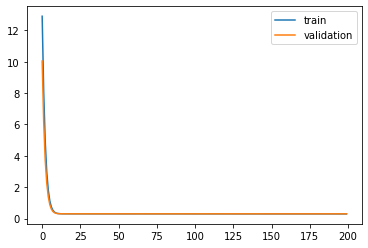

Time to train LSTM:  132.2426998615265


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f9398074048>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 14.4514 - acc: 0.6154 - val_loss: 12.7651 - val_acc: 0.6916

Epoch 00001: val_loss improved from inf to 12.76515, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 11.5745 - acc: 0.7209 - val_loss: 10.1612 - val_acc: 0.7677

Epoch 00002: val_loss improved from 12.76515 to 10.16124, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 9.1779 - acc: 0.7798 - val_loss: 8.0124 - val_acc: 0.8128

Epoch 00003: val_loss improved from 10.16124 to 8.01244, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 7.2131 - acc: 0.8246 - val_loss: 6.2663 - val_acc: 0.8480

Epoch 00004: val_loss improved from 8.01244 to 6.26631, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 5.6293 - acc: 0.8567 - val_loss: 4.8756 - val_acc: 0.8719

Epoch 00005: val_loss improved from 6.26631 to 4.87561, saving model to Event_val_weights1.hdf5
Epoch 6/200
 - 1s - loss: 4.3803 - acc: 0.

 - 1s - loss: 0.3001 - acc: 0.8870 - val_loss: 0.2948 - val_acc: 0.8882

Epoch 00049: val_loss did not improve from 0.29465
Epoch 50/200
 - 1s - loss: 0.3001 - acc: 0.8870 - val_loss: 0.2948 - val_acc: 0.8880

Epoch 00050: val_loss did not improve from 0.29465
Epoch 51/200
 - 1s - loss: 0.3000 - acc: 0.8870 - val_loss: 0.2947 - val_acc: 0.8882

Epoch 00051: val_loss did not improve from 0.29465
Epoch 52/200
 - 1s - loss: 0.3000 - acc: 0.8871 - val_loss: 0.2946 - val_acc: 0.8880

Epoch 00052: val_loss improved from 0.29465 to 0.29460, saving model to Event_val_weights1.hdf5
Epoch 53/200
 - 1s - loss: 0.2999 - acc: 0.8871 - val_loss: 0.2949 - val_acc: 0.8884

Epoch 00053: val_loss did not improve from 0.29460
Epoch 54/200
 - 1s - loss: 0.2999 - acc: 0.8872 - val_loss: 0.2944 - val_acc: 0.8883

Epoch 00054: val_loss improved from 0.29460 to 0.29436, saving model to Event_val_weights1.hdf5
Epoch 55/200
 - 1s - loss: 0.2998 - acc: 0.8872 - val_loss: 0.2950 - val_acc: 0.8881

Epoch 00055: va

 - 1s - loss: 0.2978 - acc: 0.8878 - val_loss: 0.2949 - val_acc: 0.8892

Epoch 00107: val_loss did not improve from 0.29405
Epoch 108/200
 - 1s - loss: 0.2978 - acc: 0.8877 - val_loss: 0.2952 - val_acc: 0.8894

Epoch 00108: val_loss did not improve from 0.29405
Epoch 109/200
 - 1s - loss: 0.2977 - acc: 0.8879 - val_loss: 0.2946 - val_acc: 0.8893

Epoch 00109: val_loss did not improve from 0.29405
Epoch 110/200
 - 1s - loss: 0.2976 - acc: 0.8878 - val_loss: 0.2951 - val_acc: 0.8888

Epoch 00110: val_loss did not improve from 0.29405
Epoch 111/200
 - 1s - loss: 0.2976 - acc: 0.8879 - val_loss: 0.2945 - val_acc: 0.8891

Epoch 00111: val_loss did not improve from 0.29405
Epoch 112/200
 - 1s - loss: 0.2977 - acc: 0.8880 - val_loss: 0.2952 - val_acc: 0.8886

Epoch 00112: val_loss did not improve from 0.29405
Epoch 113/200
 - 1s - loss: 0.2977 - acc: 0.8878 - val_loss: 0.2945 - val_acc: 0.8888

Epoch 00113: val_loss did not improve from 0.29405
Epoch 114/200
 - 1s - loss: 0.2977 - acc: 0.8881


Epoch 00166: val_loss did not improve from 0.29402
Epoch 167/200
 - 1s - loss: 0.2961 - acc: 0.8890 - val_loss: 0.2958 - val_acc: 0.8892

Epoch 00167: val_loss did not improve from 0.29402
Epoch 168/200
 - 1s - loss: 0.2960 - acc: 0.8894 - val_loss: 0.2958 - val_acc: 0.8900

Epoch 00168: val_loss did not improve from 0.29402
Epoch 169/200
 - 1s - loss: 0.2960 - acc: 0.8893 - val_loss: 0.2961 - val_acc: 0.8896

Epoch 00169: val_loss did not improve from 0.29402
Epoch 170/200
 - 1s - loss: 0.2961 - acc: 0.8891 - val_loss: 0.2960 - val_acc: 0.8887

Epoch 00170: val_loss did not improve from 0.29402
Epoch 171/200
 - 1s - loss: 0.2959 - acc: 0.8888 - val_loss: 0.2959 - val_acc: 0.8897

Epoch 00171: val_loss did not improve from 0.29402
Epoch 172/200
 - 1s - loss: 0.2962 - acc: 0.8890 - val_loss: 0.2960 - val_acc: 0.8894

Epoch 00172: val_loss did not improve from 0.29402
Epoch 173/200
 - 1s - loss: 0.2959 - acc: 0.8895 - val_loss: 0.2960 - val_acc: 0.8897

Epoch 00173: val_loss did not imp

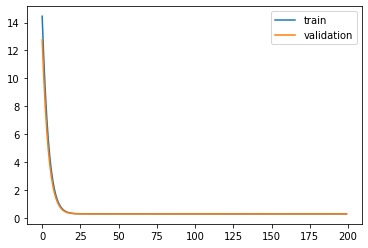

Time to train LSTM:  144.922527551651
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 14.3871 - acc: 0.6276 - val_loss: 12.7140 - val_acc: 0.7146

Epoch 00001: val_loss improved from inf to 12.71400, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 11.5164 - acc: 0.7438 - val_loss: 10.1135 - val_acc: 0.7722

Epoch 00002: val_loss improved from 12.71400 to 10.11348, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 9.1186 - acc: 0.7893 - val_loss: 7.9631 - val_acc: 0.8047

Epoch 00003: val_loss improved from 10.11348 to 7.96306, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 7.1501 - acc: 0.8243 - val_loss: 6.2156 - val_acc: 0.8430

Epoch 00004: val_loss improved from 7.96306 to 6.21556, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 5.5670 - acc: 0.8587 - val_loss: 4.8301 - val_acc: 0.8682

Epoch 00005: val_loss improved from 6.21556 to 4.83011, saving model to Event_val_weights2.hdf5
Epoc

 - 1s - loss: 0.2994 - acc: 0.8877 - val_loss: 0.3055 - val_acc: 0.8838

Epoch 00046: val_loss improved from 0.30551 to 0.30548, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.2993 - acc: 0.8877 - val_loss: 0.3054 - val_acc: 0.8839

Epoch 00047: val_loss improved from 0.30548 to 0.30545, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.2993 - acc: 0.8878 - val_loss: 0.3054 - val_acc: 0.8839

Epoch 00048: val_loss improved from 0.30545 to 0.30540, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.2993 - acc: 0.8878 - val_loss: 0.3054 - val_acc: 0.8843

Epoch 00049: val_loss improved from 0.30540 to 0.30538, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.2992 - acc: 0.8877 - val_loss: 0.3054 - val_acc: 0.8846

Epoch 00050: val_loss improved from 0.30538 to 0.30535, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.2992 - acc: 0.8877 - val_loss: 0.3053 - val_acc: 0.8849

Epoch 00051: val_


Epoch 00101: val_loss did not improve from 0.30514
Epoch 102/200
 - 1s - loss: 0.2967 - acc: 0.8888 - val_loss: 0.3062 - val_acc: 0.8840

Epoch 00102: val_loss did not improve from 0.30514
Epoch 103/200
 - 1s - loss: 0.2967 - acc: 0.8888 - val_loss: 0.3062 - val_acc: 0.8839

Epoch 00103: val_loss did not improve from 0.30514
Epoch 104/200
 - 1s - loss: 0.2966 - acc: 0.8889 - val_loss: 0.3064 - val_acc: 0.8842

Epoch 00104: val_loss did not improve from 0.30514
Epoch 105/200
 - 1s - loss: 0.2966 - acc: 0.8889 - val_loss: 0.3063 - val_acc: 0.8840

Epoch 00105: val_loss did not improve from 0.30514
Epoch 106/200
 - 1s - loss: 0.2965 - acc: 0.8889 - val_loss: 0.3064 - val_acc: 0.8842

Epoch 00106: val_loss did not improve from 0.30514
Epoch 107/200
 - 1s - loss: 0.2965 - acc: 0.8890 - val_loss: 0.3063 - val_acc: 0.8844

Epoch 00107: val_loss did not improve from 0.30514
Epoch 108/200
 - 1s - loss: 0.2964 - acc: 0.8890 - val_loss: 0.3065 - val_acc: 0.8843

Epoch 00108: val_loss did not imp

 - 1s - loss: 0.2946 - acc: 0.8899 - val_loss: 0.3079 - val_acc: 0.8848

Epoch 00161: val_loss did not improve from 0.30514
Epoch 162/200
 - 1s - loss: 0.2946 - acc: 0.8900 - val_loss: 0.3082 - val_acc: 0.8854

Epoch 00162: val_loss did not improve from 0.30514
Epoch 163/200
 - 1s - loss: 0.2946 - acc: 0.8899 - val_loss: 0.3080 - val_acc: 0.8848

Epoch 00163: val_loss did not improve from 0.30514
Epoch 164/200
 - 1s - loss: 0.2946 - acc: 0.8900 - val_loss: 0.3086 - val_acc: 0.8853

Epoch 00164: val_loss did not improve from 0.30514
Epoch 165/200
 - 1s - loss: 0.2945 - acc: 0.8901 - val_loss: 0.3085 - val_acc: 0.8849

Epoch 00165: val_loss did not improve from 0.30514
Epoch 166/200
 - 1s - loss: 0.2946 - acc: 0.8900 - val_loss: 0.3083 - val_acc: 0.8848

Epoch 00166: val_loss did not improve from 0.30514
Epoch 167/200
 - 1s - loss: 0.2944 - acc: 0.8901 - val_loss: 0.3084 - val_acc: 0.8841

Epoch 00167: val_loss did not improve from 0.30514
Epoch 168/200
 - 1s - loss: 0.2944 - acc: 0.8902

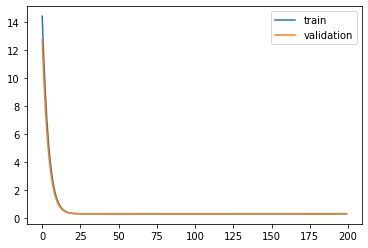

Time to train LSTM:  141.15240788459778
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 14.4482 - acc: 0.5687 - val_loss: 12.7639 - val_acc: 0.6691

Epoch 00001: val_loss improved from inf to 12.76394, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 11.5591 - acc: 0.7189 - val_loss: 10.1500 - val_acc: 0.7602

Epoch 00002: val_loss improved from 12.76394 to 10.14995, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 9.1541 - acc: 0.7829 - val_loss: 7.9951 - val_acc: 0.8076

Epoch 00003: val_loss improved from 10.14995 to 7.99515, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 7.1850 - acc: 0.8250 - val_loss: 6.2475 - val_acc: 0.8466

Epoch 00004: val_loss improved from 7.99515 to 6.24751, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 5.6003 - acc: 0.8580 - val_loss: 4.8583 - val_acc: 0.8700

Epoch 00005: val_loss improved from 6.24751 to 4.85827, saving model to Event_val_weights3.hdf5
Ep

 - 1s - loss: 0.2994 - acc: 0.8874 - val_loss: 0.3025 - val_acc: 0.8878

Epoch 00046: val_loss improved from 0.30246 to 0.30245, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.2994 - acc: 0.8875 - val_loss: 0.3024 - val_acc: 0.8877

Epoch 00047: val_loss improved from 0.30245 to 0.30243, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.2994 - acc: 0.8875 - val_loss: 0.3024 - val_acc: 0.8877

Epoch 00048: val_loss did not improve from 0.30243
Epoch 49/200
 - 1s - loss: 0.2993 - acc: 0.8874 - val_loss: 0.3024 - val_acc: 0.8877

Epoch 00049: val_loss did not improve from 0.30243
Epoch 50/200
 - 1s - loss: 0.2993 - acc: 0.8874 - val_loss: 0.3024 - val_acc: 0.8880

Epoch 00050: val_loss improved from 0.30243 to 0.30242, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.2993 - acc: 0.8874 - val_loss: 0.3024 - val_acc: 0.8878

Epoch 00051: val_loss did not improve from 0.30242
Epoch 52/200
 - 1s - loss: 0.2992 - acc: 0.8873 - val_lo


Epoch 00104: val_loss did not improve from 0.30240
Epoch 105/200
 - 1s - loss: 0.2972 - acc: 0.8881 - val_loss: 0.3033 - val_acc: 0.8898

Epoch 00105: val_loss did not improve from 0.30240
Epoch 106/200
 - 1s - loss: 0.2973 - acc: 0.8881 - val_loss: 0.3030 - val_acc: 0.8894

Epoch 00106: val_loss did not improve from 0.30240
Epoch 107/200
 - 1s - loss: 0.2972 - acc: 0.8882 - val_loss: 0.3031 - val_acc: 0.8897

Epoch 00107: val_loss did not improve from 0.30240
Epoch 108/200
 - 1s - loss: 0.2973 - acc: 0.8881 - val_loss: 0.3029 - val_acc: 0.8894

Epoch 00108: val_loss did not improve from 0.30240
Epoch 109/200
 - 1s - loss: 0.2972 - acc: 0.8882 - val_loss: 0.3029 - val_acc: 0.8896

Epoch 00109: val_loss did not improve from 0.30240
Epoch 110/200
 - 1s - loss: 0.2972 - acc: 0.8882 - val_loss: 0.3030 - val_acc: 0.8897

Epoch 00110: val_loss did not improve from 0.30240
Epoch 111/200
 - 1s - loss: 0.2971 - acc: 0.8884 - val_loss: 0.3030 - val_acc: 0.8893

Epoch 00111: val_loss did not imp

 - 1s - loss: 0.2953 - acc: 0.8895 - val_loss: 0.3048 - val_acc: 0.8883

Epoch 00164: val_loss did not improve from 0.30240
Epoch 165/200
 - 1s - loss: 0.2956 - acc: 0.8891 - val_loss: 0.3052 - val_acc: 0.8876

Epoch 00165: val_loss did not improve from 0.30240
Epoch 166/200
 - 1s - loss: 0.2954 - acc: 0.8896 - val_loss: 0.3057 - val_acc: 0.8879

Epoch 00166: val_loss did not improve from 0.30240
Epoch 167/200
 - 1s - loss: 0.2953 - acc: 0.8896 - val_loss: 0.3051 - val_acc: 0.8878

Epoch 00167: val_loss did not improve from 0.30240
Epoch 168/200
 - 1s - loss: 0.2950 - acc: 0.8897 - val_loss: 0.3051 - val_acc: 0.8881

Epoch 00168: val_loss did not improve from 0.30240
Epoch 169/200
 - 1s - loss: 0.2950 - acc: 0.8897 - val_loss: 0.3049 - val_acc: 0.8877

Epoch 00169: val_loss did not improve from 0.30240
Epoch 170/200
 - 1s - loss: 0.2949 - acc: 0.8896 - val_loss: 0.3054 - val_acc: 0.8878

Epoch 00170: val_loss did not improve from 0.30240
Epoch 171/200
 - 1s - loss: 0.2949 - acc: 0.8899

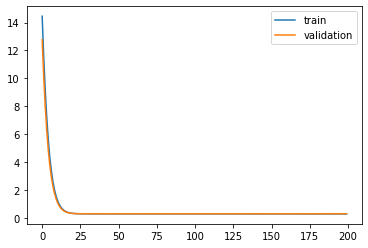

Time to train LSTM:  140.40929102897644


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f90bb71f748>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 14.3068 - acc: 0.6229 - val_loss: 12.6453 - val_acc: 0.6903

Epoch 00001: val_loss improved from inf to 12.64534, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 11.4565 - acc: 0.7340 - val_loss: 10.0638 - val_acc: 0.7687

Epoch 00002: val_loss improved from 12.64534 to 10.06382, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 9.0774 - acc: 0.7886 - val_loss: 7.9294 - val_acc: 0.8103

Epoch 00003: val_loss improved from 10.06382 to 7.92940, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 7.1225 - acc: 0.8286 - val_loss: 6.1927 - val_acc: 0.8482

Epoch 00004: val_loss improved from 7.92940 to 6.19269, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 5.5463 - acc: 0.8627 - val_loss: 4.8160 - val_acc: 0.8714

Epoch 00005: val_loss improved from 6.19269 to 4.81600, saving model to Event_val_weights4.hdf5
Epoch 6/200
 - 1s - loss: 4.3132 - acc: 0.

 - 1s - loss: 0.2992 - acc: 0.8877 - val_loss: 0.3058 - val_acc: 0.8831

Epoch 00047: val_loss did not improve from 0.30567
Epoch 48/200
 - 1s - loss: 0.2992 - acc: 0.8877 - val_loss: 0.3056 - val_acc: 0.8828

Epoch 00048: val_loss improved from 0.30567 to 0.30562, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.2991 - acc: 0.8877 - val_loss: 0.3057 - val_acc: 0.8829

Epoch 00049: val_loss did not improve from 0.30562
Epoch 50/200
 - 1s - loss: 0.2991 - acc: 0.8878 - val_loss: 0.3056 - val_acc: 0.8829

Epoch 00050: val_loss improved from 0.30562 to 0.30560, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.2991 - acc: 0.8877 - val_loss: 0.3057 - val_acc: 0.8832

Epoch 00051: val_loss did not improve from 0.30560
Epoch 52/200
 - 1s - loss: 0.2990 - acc: 0.8877 - val_loss: 0.3056 - val_acc: 0.8832

Epoch 00052: val_loss did not improve from 0.30560
Epoch 53/200
 - 1s - loss: 0.2990 - acc: 0.8877 - val_loss: 0.3056 - val_acc: 0.8832

Epoch 00053: va


Epoch 00103: val_loss did not improve from 0.30548
Epoch 104/200
 - 1s - loss: 0.2978 - acc: 0.8880 - val_loss: 0.3055 - val_acc: 0.8840

Epoch 00104: val_loss did not improve from 0.30548
Epoch 105/200
 - 1s - loss: 0.2979 - acc: 0.8880 - val_loss: 0.3056 - val_acc: 0.8840

Epoch 00105: val_loss did not improve from 0.30548
Epoch 106/200
 - 1s - loss: 0.2978 - acc: 0.8880 - val_loss: 0.3055 - val_acc: 0.8840

Epoch 00106: val_loss did not improve from 0.30548
Epoch 107/200
 - 1s - loss: 0.2978 - acc: 0.8880 - val_loss: 0.3056 - val_acc: 0.8840

Epoch 00107: val_loss did not improve from 0.30548
Epoch 108/200
 - 1s - loss: 0.2978 - acc: 0.8879 - val_loss: 0.3055 - val_acc: 0.8840

Epoch 00108: val_loss did not improve from 0.30548
Epoch 109/200
 - 1s - loss: 0.2977 - acc: 0.8880 - val_loss: 0.3056 - val_acc: 0.8840

Epoch 00109: val_loss did not improve from 0.30548
Epoch 110/200
 - 1s - loss: 0.2977 - acc: 0.8880 - val_loss: 0.3056 - val_acc: 0.8842

Epoch 00110: val_loss did not imp


Epoch 00162: val_loss did not improve from 0.30545
Epoch 163/200
 - 1s - loss: 0.2957 - acc: 0.8897 - val_loss: 0.3063 - val_acc: 0.8857

Epoch 00163: val_loss did not improve from 0.30545
Epoch 164/200
 - 1s - loss: 0.2956 - acc: 0.8899 - val_loss: 0.3063 - val_acc: 0.8857

Epoch 00164: val_loss did not improve from 0.30545
Epoch 165/200
 - 1s - loss: 0.2956 - acc: 0.8900 - val_loss: 0.3066 - val_acc: 0.8857

Epoch 00165: val_loss did not improve from 0.30545
Epoch 166/200
 - 1s - loss: 0.2955 - acc: 0.8902 - val_loss: 0.3066 - val_acc: 0.8858

Epoch 00166: val_loss did not improve from 0.30545
Epoch 167/200
 - 1s - loss: 0.2954 - acc: 0.8905 - val_loss: 0.3068 - val_acc: 0.8854

Epoch 00167: val_loss did not improve from 0.30545
Epoch 168/200
 - 1s - loss: 0.2955 - acc: 0.8903 - val_loss: 0.3067 - val_acc: 0.8856

Epoch 00168: val_loss did not improve from 0.30545
Epoch 169/200
 - 1s - loss: 0.2953 - acc: 0.8905 - val_loss: 0.3072 - val_acc: 0.8853

Epoch 00169: val_loss did not imp

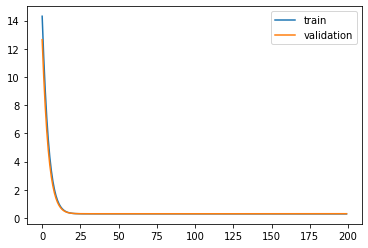

Time to train LSTM:  151.08000564575195
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 14.2068 - acc: 0.6824 - val_loss: 12.5439 - val_acc: 0.7349

Epoch 00001: val_loss improved from inf to 12.54394, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 11.3680 - acc: 0.7494 - val_loss: 9.9739 - val_acc: 0.7776

Epoch 00002: val_loss improved from 12.54394 to 9.97389, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 9.0024 - acc: 0.7874 - val_loss: 7.8547 - val_acc: 0.8071

Epoch 00003: val_loss improved from 9.97389 to 7.85475, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 7.0665 - acc: 0.8198 - val_loss: 6.1390 - val_acc: 0.8432

Epoch 00004: val_loss improved from 7.85475 to 6.13904, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 5.5128 - acc: 0.8548 - val_loss: 4.7820 - val_acc: 0.8721

Epoch 00005: val_loss improved from 6.13904 to 4.78203, saving model to Event_val_weights5.hdf5
Epoch


Epoch 00047: val_loss improved from 0.30203 to 0.30200, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.2996 - acc: 0.8875 - val_loss: 0.3021 - val_acc: 0.8860

Epoch 00048: val_loss did not improve from 0.30200
Epoch 49/200
 - 1s - loss: 0.2995 - acc: 0.8876 - val_loss: 0.3021 - val_acc: 0.8861

Epoch 00049: val_loss did not improve from 0.30200
Epoch 50/200
 - 1s - loss: 0.2995 - acc: 0.8875 - val_loss: 0.3020 - val_acc: 0.8862

Epoch 00050: val_loss did not improve from 0.30200
Epoch 51/200
 - 1s - loss: 0.2994 - acc: 0.8875 - val_loss: 0.3020 - val_acc: 0.8863

Epoch 00051: val_loss improved from 0.30200 to 0.30200, saving model to Event_val_weights5.hdf5
Epoch 52/200
 - 1s - loss: 0.2994 - acc: 0.8874 - val_loss: 0.3021 - val_acc: 0.8861

Epoch 00052: val_loss did not improve from 0.30200
Epoch 53/200
 - 1s - loss: 0.2994 - acc: 0.8875 - val_loss: 0.3020 - val_acc: 0.8863

Epoch 00053: val_loss did not improve from 0.30200
Epoch 54/200
 - 1s - loss: 0.2994 - 

 - 1s - loss: 0.2975 - acc: 0.8883 - val_loss: 0.3018 - val_acc: 0.8872

Epoch 00103: val_loss did not improve from 0.30139
Epoch 104/200
 - 1s - loss: 0.2975 - acc: 0.8881 - val_loss: 0.3020 - val_acc: 0.8871

Epoch 00104: val_loss did not improve from 0.30139
Epoch 105/200
 - 1s - loss: 0.2974 - acc: 0.8880 - val_loss: 0.3021 - val_acc: 0.8872

Epoch 00105: val_loss did not improve from 0.30139
Epoch 106/200
 - 1s - loss: 0.2973 - acc: 0.8881 - val_loss: 0.3022 - val_acc: 0.8868

Epoch 00106: val_loss did not improve from 0.30139
Epoch 107/200
 - 1s - loss: 0.2973 - acc: 0.8882 - val_loss: 0.3023 - val_acc: 0.8872

Epoch 00107: val_loss did not improve from 0.30139
Epoch 108/200
 - 1s - loss: 0.2973 - acc: 0.8882 - val_loss: 0.3023 - val_acc: 0.8871

Epoch 00108: val_loss did not improve from 0.30139
Epoch 109/200
 - 1s - loss: 0.2971 - acc: 0.8882 - val_loss: 0.3021 - val_acc: 0.8868

Epoch 00109: val_loss did not improve from 0.30139
Epoch 110/200
 - 1s - loss: 0.2972 - acc: 0.8881


Epoch 00162: val_loss did not improve from 0.30139
Epoch 163/200
 - 1s - loss: 0.2947 - acc: 0.8898 - val_loss: 0.3065 - val_acc: 0.8878

Epoch 00163: val_loss did not improve from 0.30139
Epoch 164/200
 - 1s - loss: 0.2948 - acc: 0.8894 - val_loss: 0.3064 - val_acc: 0.8874

Epoch 00164: val_loss did not improve from 0.30139
Epoch 165/200
 - 1s - loss: 0.2948 - acc: 0.8891 - val_loss: 0.3061 - val_acc: 0.8869

Epoch 00165: val_loss did not improve from 0.30139
Epoch 166/200
 - 1s - loss: 0.2950 - acc: 0.8893 - val_loss: 0.3074 - val_acc: 0.8867

Epoch 00166: val_loss did not improve from 0.30139
Epoch 167/200
 - 1s - loss: 0.2952 - acc: 0.8897 - val_loss: 0.3072 - val_acc: 0.8866

Epoch 00167: val_loss did not improve from 0.30139
Epoch 168/200
 - 1s - loss: 0.2946 - acc: 0.8897 - val_loss: 0.3071 - val_acc: 0.8864

Epoch 00168: val_loss did not improve from 0.30139
Epoch 169/200
 - 1s - loss: 0.2946 - acc: 0.8895 - val_loss: 0.3062 - val_acc: 0.8867

Epoch 00169: val_loss did not imp

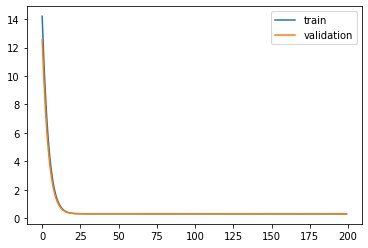

Time to train LSTM:  141.45563125610352
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 15.2015 - acc: 0.6091 - val_loss: 14.2316 - val_acc: 0.6668

Epoch 00001: val_loss improved from inf to 14.23161, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 13.6370 - acc: 0.6853 - val_loss: 12.7429 - val_acc: 0.7249

Epoch 00002: val_loss improved from 14.23161 to 12.74292, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 12.1990 - acc: 0.7306 - val_loss: 11.3792 - val_acc: 0.7533

Epoch 00003: val_loss improved from 12.74292 to 11.37916, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 10.8839 - acc: 0.7563 - val_loss: 10.1355 - val_acc: 0.7732

Epoch 00004: val_loss improved from 11.37916 to 10.13553, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 9.6865 - acc: 0.7764 - val_loss: 9.0062 - val_acc: 0.7936

Epoch 00005: val_loss improved from 10.13553 to 9.00616, saving model to Event_val_weights1

 - 1s - loss: 0.3121 - acc: 0.8877 - val_loss: 0.3057 - val_acc: 0.8886

Epoch 00046: val_loss improved from 0.30821 to 0.30565, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.3097 - acc: 0.8876 - val_loss: 0.3035 - val_acc: 0.8886

Epoch 00047: val_loss improved from 0.30565 to 0.30354, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3078 - acc: 0.8876 - val_loss: 0.3018 - val_acc: 0.8887

Epoch 00048: val_loss improved from 0.30354 to 0.30179, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.3062 - acc: 0.8876 - val_loss: 0.3004 - val_acc: 0.8886

Epoch 00049: val_loss improved from 0.30179 to 0.30035, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.3049 - acc: 0.8876 - val_loss: 0.2992 - val_acc: 0.8884

Epoch 00050: val_loss improved from 0.30035 to 0.29916, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.3038 - acc: 0.8876 - val_loss: 0.2982 - val_acc: 0.8886

Epoch 00051: val_

 - 1s - loss: 0.2983 - acc: 0.8879 - val_loss: 0.2940 - val_acc: 0.8886

Epoch 00096: val_loss did not improve from 0.29374
Epoch 97/200
 - 1s - loss: 0.2982 - acc: 0.8880 - val_loss: 0.2937 - val_acc: 0.8888

Epoch 00097: val_loss improved from 0.29374 to 0.29373, saving model to Event_val_weights1.hdf5
Epoch 98/200
 - 1s - loss: 0.2982 - acc: 0.8880 - val_loss: 0.2941 - val_acc: 0.8889

Epoch 00098: val_loss did not improve from 0.29373
Epoch 99/200
 - 1s - loss: 0.2982 - acc: 0.8880 - val_loss: 0.2938 - val_acc: 0.8892

Epoch 00099: val_loss did not improve from 0.29373
Epoch 100/200
 - 1s - loss: 0.2982 - acc: 0.8880 - val_loss: 0.2938 - val_acc: 0.8892

Epoch 00100: val_loss did not improve from 0.29373
Epoch 101/200
 - 1s - loss: 0.2981 - acc: 0.8880 - val_loss: 0.2939 - val_acc: 0.8892

Epoch 00101: val_loss did not improve from 0.29373
Epoch 102/200
 - 1s - loss: 0.2980 - acc: 0.8880 - val_loss: 0.2937 - val_acc: 0.8893

Epoch 00102: val_loss improved from 0.29373 to 0.29373, s


Epoch 00152: val_loss did not improve from 0.29333
Epoch 153/200
 - 1s - loss: 0.2958 - acc: 0.8889 - val_loss: 0.2937 - val_acc: 0.8889

Epoch 00153: val_loss did not improve from 0.29333
Epoch 154/200
 - 1s - loss: 0.2957 - acc: 0.8891 - val_loss: 0.2941 - val_acc: 0.8886

Epoch 00154: val_loss did not improve from 0.29333
Epoch 155/200
 - 1s - loss: 0.2957 - acc: 0.8891 - val_loss: 0.2940 - val_acc: 0.8889

Epoch 00155: val_loss did not improve from 0.29333
Epoch 156/200
 - 1s - loss: 0.2956 - acc: 0.8891 - val_loss: 0.2943 - val_acc: 0.8892

Epoch 00156: val_loss did not improve from 0.29333
Epoch 157/200
 - 1s - loss: 0.2956 - acc: 0.8892 - val_loss: 0.2938 - val_acc: 0.8891

Epoch 00157: val_loss did not improve from 0.29333
Epoch 158/200
 - 1s - loss: 0.2955 - acc: 0.8891 - val_loss: 0.2944 - val_acc: 0.8893

Epoch 00158: val_loss did not improve from 0.29333
Epoch 159/200
 - 1s - loss: 0.2955 - acc: 0.8892 - val_loss: 0.2941 - val_acc: 0.8892

Epoch 00159: val_loss did not imp

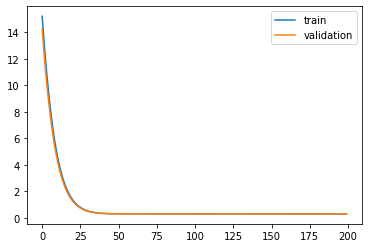

Time to train LSTM:  135.82544469833374


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f90b3db93c8>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 15.1560 - acc: 0.4743 - val_loss: 14.1871 - val_acc: 0.5247

Epoch 00001: val_loss improved from inf to 14.18706, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 13.5917 - acc: 0.5559 - val_loss: 12.7028 - val_acc: 0.6069

Epoch 00002: val_loss improved from 14.18706 to 12.70278, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 12.1576 - acc: 0.6361 - val_loss: 11.3457 - val_acc: 0.6762

Epoch 00003: val_loss improved from 12.70278 to 11.34566, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 10.8484 - acc: 0.7001 - val_loss: 10.1096 - val_acc: 0.7326

Epoch 00004: val_loss improved from 11.34566 to 10.10962, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 9.6574 - acc: 0.7490 - val_loss: 8.9876 - val_acc: 0.7718

Epoch 00005: val_loss improved from 10.10962 to 8.98758, saving model to Event_val_weights2.hdf5
Epoch 6/200
 - 1s - loss: 8.5775 -

 - 1s - loss: 0.3109 - acc: 0.8882 - val_loss: 0.3161 - val_acc: 0.8842

Epoch 00046: val_loss improved from 0.31858 to 0.31609, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.3086 - acc: 0.8881 - val_loss: 0.3140 - val_acc: 0.8842

Epoch 00047: val_loss improved from 0.31609 to 0.31403, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.3067 - acc: 0.8882 - val_loss: 0.3123 - val_acc: 0.8842

Epoch 00048: val_loss improved from 0.31403 to 0.31233, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.3052 - acc: 0.8882 - val_loss: 0.3109 - val_acc: 0.8841

Epoch 00049: val_loss improved from 0.31233 to 0.31093, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.3039 - acc: 0.8882 - val_loss: 0.3098 - val_acc: 0.8842

Epoch 00050: val_loss improved from 0.31093 to 0.30978, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.3028 - acc: 0.8883 - val_loss: 0.3088 - val_acc: 0.8842

Epoch 00051: val_

 - 1s - loss: 0.2972 - acc: 0.8885 - val_loss: 0.3046 - val_acc: 0.8841

Epoch 00096: val_loss did not improve from 0.30447
Epoch 97/200
 - 1s - loss: 0.2972 - acc: 0.8886 - val_loss: 0.3045 - val_acc: 0.8840

Epoch 00097: val_loss did not improve from 0.30447
Epoch 98/200
 - 1s - loss: 0.2972 - acc: 0.8886 - val_loss: 0.3046 - val_acc: 0.8839

Epoch 00098: val_loss did not improve from 0.30447
Epoch 99/200
 - 1s - loss: 0.2971 - acc: 0.8885 - val_loss: 0.3046 - val_acc: 0.8841

Epoch 00099: val_loss did not improve from 0.30447
Epoch 100/200
 - 1s - loss: 0.2971 - acc: 0.8886 - val_loss: 0.3046 - val_acc: 0.8841

Epoch 00100: val_loss did not improve from 0.30447
Epoch 101/200
 - 1s - loss: 0.2971 - acc: 0.8886 - val_loss: 0.3046 - val_acc: 0.8840

Epoch 00101: val_loss did not improve from 0.30447
Epoch 102/200
 - 1s - loss: 0.2970 - acc: 0.8886 - val_loss: 0.3046 - val_acc: 0.8839

Epoch 00102: val_loss did not improve from 0.30447
Epoch 103/200
 - 1s - loss: 0.2970 - acc: 0.8886 - 


Epoch 00155: val_loss did not improve from 0.30447
Epoch 156/200
 - 1s - loss: 0.2950 - acc: 0.8897 - val_loss: 0.3060 - val_acc: 0.8841

Epoch 00156: val_loss did not improve from 0.30447
Epoch 157/200
 - 1s - loss: 0.2949 - acc: 0.8899 - val_loss: 0.3060 - val_acc: 0.8839

Epoch 00157: val_loss did not improve from 0.30447
Epoch 158/200
 - 1s - loss: 0.2949 - acc: 0.8898 - val_loss: 0.3060 - val_acc: 0.8842

Epoch 00158: val_loss did not improve from 0.30447
Epoch 159/200
 - 1s - loss: 0.2948 - acc: 0.8899 - val_loss: 0.3060 - val_acc: 0.8840

Epoch 00159: val_loss did not improve from 0.30447
Epoch 160/200
 - 1s - loss: 0.2948 - acc: 0.8899 - val_loss: 0.3059 - val_acc: 0.8842

Epoch 00160: val_loss did not improve from 0.30447
Epoch 161/200
 - 1s - loss: 0.2948 - acc: 0.8899 - val_loss: 0.3061 - val_acc: 0.8840

Epoch 00161: val_loss did not improve from 0.30447
Epoch 162/200
 - 1s - loss: 0.2947 - acc: 0.8899 - val_loss: 0.3060 - val_acc: 0.8841

Epoch 00162: val_loss did not imp

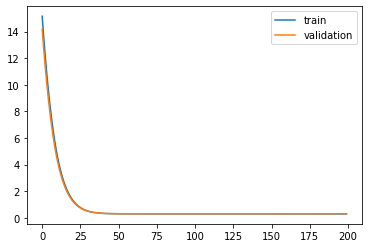

Time to train LSTM:  144.06579780578613
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 14.9734 - acc: 0.5988 - val_loss: 14.0202 - val_acc: 0.6476

Epoch 00001: val_loss improved from inf to 14.02025, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 13.4276 - acc: 0.6757 - val_loss: 12.5509 - val_acc: 0.7097

Epoch 00002: val_loss improved from 14.02025 to 12.55089, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 12.0072 - acc: 0.7238 - val_loss: 11.2050 - val_acc: 0.7450

Epoch 00003: val_loss improved from 12.55089 to 11.20504, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 10.7088 - acc: 0.7566 - val_loss: 9.9782 - val_acc: 0.7744

Epoch 00004: val_loss improved from 11.20504 to 9.97816, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 9.5272 - acc: 0.7830 - val_loss: 8.8646 - val_acc: 0.7983

Epoch 00005: val_loss improved from 9.97816 to 8.86456, saving model to Event_val_weights3.hd

 - 1s - loss: 0.3105 - acc: 0.8879 - val_loss: 0.3123 - val_acc: 0.8880

Epoch 00046: val_loss improved from 0.31466 to 0.31228, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3083 - acc: 0.8878 - val_loss: 0.3103 - val_acc: 0.8880

Epoch 00047: val_loss improved from 0.31228 to 0.31033, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.3064 - acc: 0.8878 - val_loss: 0.3087 - val_acc: 0.8879

Epoch 00048: val_loss improved from 0.31033 to 0.30873, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.3049 - acc: 0.8878 - val_loss: 0.3074 - val_acc: 0.8877

Epoch 00049: val_loss improved from 0.30873 to 0.30742, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.3036 - acc: 0.8878 - val_loss: 0.3064 - val_acc: 0.8872

Epoch 00050: val_loss improved from 0.30742 to 0.30636, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3026 - acc: 0.8877 - val_loss: 0.3055 - val_acc: 0.8872

Epoch 00051: val_

 - 1s - loss: 0.2971 - acc: 0.8885 - val_loss: 0.3022 - val_acc: 0.8874

Epoch 00096: val_loss did not improve from 0.30213
Epoch 97/200
 - 1s - loss: 0.2971 - acc: 0.8885 - val_loss: 0.3022 - val_acc: 0.8872

Epoch 00097: val_loss did not improve from 0.30213
Epoch 98/200
 - 1s - loss: 0.2971 - acc: 0.8885 - val_loss: 0.3023 - val_acc: 0.8870

Epoch 00098: val_loss did not improve from 0.30213
Epoch 99/200
 - 1s - loss: 0.2970 - acc: 0.8885 - val_loss: 0.3023 - val_acc: 0.8874

Epoch 00099: val_loss did not improve from 0.30213
Epoch 100/200
 - 1s - loss: 0.2970 - acc: 0.8885 - val_loss: 0.3022 - val_acc: 0.8876

Epoch 00100: val_loss did not improve from 0.30213
Epoch 101/200
 - 1s - loss: 0.2970 - acc: 0.8885 - val_loss: 0.3023 - val_acc: 0.8874

Epoch 00101: val_loss did not improve from 0.30213
Epoch 102/200
 - 1s - loss: 0.2970 - acc: 0.8885 - val_loss: 0.3023 - val_acc: 0.8874

Epoch 00102: val_loss did not improve from 0.30213
Epoch 103/200
 - 1s - loss: 0.2969 - acc: 0.8885 - 


Epoch 00155: val_loss did not improve from 0.30213
Epoch 156/200
 - 1s - loss: 0.2946 - acc: 0.8893 - val_loss: 0.3039 - val_acc: 0.8886

Epoch 00156: val_loss did not improve from 0.30213
Epoch 157/200
 - 1s - loss: 0.2945 - acc: 0.8894 - val_loss: 0.3039 - val_acc: 0.8888

Epoch 00157: val_loss did not improve from 0.30213
Epoch 158/200
 - 1s - loss: 0.2946 - acc: 0.8894 - val_loss: 0.3039 - val_acc: 0.8887

Epoch 00158: val_loss did not improve from 0.30213
Epoch 159/200
 - 1s - loss: 0.2945 - acc: 0.8894 - val_loss: 0.3040 - val_acc: 0.8888

Epoch 00159: val_loss did not improve from 0.30213
Epoch 160/200
 - 1s - loss: 0.2945 - acc: 0.8894 - val_loss: 0.3040 - val_acc: 0.8883

Epoch 00160: val_loss did not improve from 0.30213
Epoch 161/200
 - 1s - loss: 0.2945 - acc: 0.8894 - val_loss: 0.3039 - val_acc: 0.8882

Epoch 00161: val_loss did not improve from 0.30213
Epoch 162/200
 - 1s - loss: 0.2945 - acc: 0.8894 - val_loss: 0.3040 - val_acc: 0.8881

Epoch 00162: val_loss did not imp

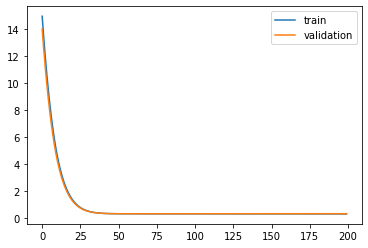

Time to train LSTM:  137.4848437309265
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 15.2224 - acc: 0.5029 - val_loss: 14.2601 - val_acc: 0.5608

Epoch 00001: val_loss improved from inf to 14.26011, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 13.6561 - acc: 0.6057 - val_loss: 12.7717 - val_acc: 0.6542

Epoch 00002: val_loss improved from 14.26011 to 12.77172, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 12.2184 - acc: 0.6908 - val_loss: 11.4094 - val_acc: 0.7212

Epoch 00003: val_loss improved from 12.77172 to 11.40941, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 10.9043 - acc: 0.7458 - val_loss: 10.1673 - val_acc: 0.7614

Epoch 00004: val_loss improved from 11.40941 to 10.16734, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 9.7075 - acc: 0.7799 - val_loss: 9.0389 - val_acc: 0.7827

Epoch 00005: val_loss improved from 10.16734 to 9.03887, saving model to Event_val_weights4.

 - 1s - loss: 0.3113 - acc: 0.8878 - val_loss: 0.3173 - val_acc: 0.8858

Epoch 00046: val_loss improved from 0.31989 to 0.31728, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.3090 - acc: 0.8879 - val_loss: 0.3151 - val_acc: 0.8857

Epoch 00047: val_loss improved from 0.31728 to 0.31513, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.3070 - acc: 0.8880 - val_loss: 0.3134 - val_acc: 0.8856

Epoch 00048: val_loss improved from 0.31513 to 0.31335, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.3054 - acc: 0.8880 - val_loss: 0.3119 - val_acc: 0.8856

Epoch 00049: val_loss improved from 0.31335 to 0.31189, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3040 - acc: 0.8879 - val_loss: 0.3107 - val_acc: 0.8853

Epoch 00050: val_loss improved from 0.31189 to 0.31068, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.3029 - acc: 0.8879 - val_loss: 0.3097 - val_acc: 0.8853

Epoch 00051: val_


Epoch 00092: val_loss did not improve from 0.30504
Epoch 93/200
 - 1s - loss: 0.2976 - acc: 0.8880 - val_loss: 0.3050 - val_acc: 0.8842

Epoch 00093: val_loss improved from 0.30504 to 0.30504, saving model to Event_val_weights4.hdf5
Epoch 94/200
 - 1s - loss: 0.2976 - acc: 0.8881 - val_loss: 0.3051 - val_acc: 0.8842

Epoch 00094: val_loss did not improve from 0.30504
Epoch 95/200
 - 1s - loss: 0.2975 - acc: 0.8880 - val_loss: 0.3051 - val_acc: 0.8844

Epoch 00095: val_loss did not improve from 0.30504
Epoch 96/200
 - 1s - loss: 0.2975 - acc: 0.8881 - val_loss: 0.3051 - val_acc: 0.8842

Epoch 00096: val_loss did not improve from 0.30504
Epoch 97/200
 - 1s - loss: 0.2975 - acc: 0.8880 - val_loss: 0.3051 - val_acc: 0.8847

Epoch 00097: val_loss did not improve from 0.30504
Epoch 98/200
 - 1s - loss: 0.2974 - acc: 0.8880 - val_loss: 0.3051 - val_acc: 0.8847

Epoch 00098: val_loss did not improve from 0.30504
Epoch 99/200
 - 1s - loss: 0.2974 - acc: 0.8880 - val_loss: 0.3051 - val_acc: 0.8

 - 1s - loss: 0.2963 - acc: 0.8883 - val_loss: 0.3053 - val_acc: 0.8854

Epoch 00152: val_loss did not improve from 0.30504
Epoch 153/200
 - 1s - loss: 0.2963 - acc: 0.8883 - val_loss: 0.3052 - val_acc: 0.8852

Epoch 00153: val_loss did not improve from 0.30504
Epoch 154/200
 - 1s - loss: 0.2962 - acc: 0.8883 - val_loss: 0.3053 - val_acc: 0.8850

Epoch 00154: val_loss did not improve from 0.30504
Epoch 155/200
 - 1s - loss: 0.2962 - acc: 0.8883 - val_loss: 0.3052 - val_acc: 0.8851

Epoch 00155: val_loss did not improve from 0.30504
Epoch 156/200
 - 1s - loss: 0.2962 - acc: 0.8884 - val_loss: 0.3053 - val_acc: 0.8849

Epoch 00156: val_loss did not improve from 0.30504
Epoch 157/200
 - 1s - loss: 0.2962 - acc: 0.8884 - val_loss: 0.3052 - val_acc: 0.8849

Epoch 00157: val_loss did not improve from 0.30504
Epoch 158/200
 - 1s - loss: 0.2961 - acc: 0.8884 - val_loss: 0.3053 - val_acc: 0.8849

Epoch 00158: val_loss did not improve from 0.30504
Epoch 159/200
 - 1s - loss: 0.2961 - acc: 0.8884

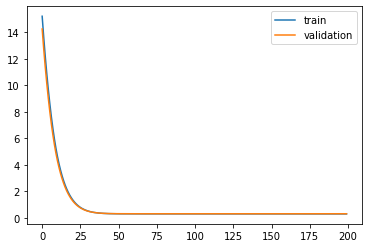

Time to train LSTM:  137.62885737419128
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 15.1182 - acc: 0.5498 - val_loss: 14.1521 - val_acc: 0.6217

Epoch 00001: val_loss improved from inf to 14.15212, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 13.5588 - acc: 0.6489 - val_loss: 12.6697 - val_acc: 0.6967

Epoch 00002: val_loss improved from 14.15212 to 12.66970, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 12.1265 - acc: 0.7115 - val_loss: 11.3124 - val_acc: 0.7390

Epoch 00003: val_loss improved from 12.66970 to 11.31243, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 10.8173 - acc: 0.7488 - val_loss: 10.0753 - val_acc: 0.7691

Epoch 00004: val_loss improved from 11.31243 to 10.07531, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 9.6258 - acc: 0.7740 - val_loss: 8.9522 - val_acc: 0.7924

Epoch 00005: val_loss improved from 10.07531 to 8.95216, saving model to Event_val_weights5

 - 1s - loss: 0.3111 - acc: 0.8879 - val_loss: 0.3123 - val_acc: 0.8881

Epoch 00046: val_loss improved from 0.31484 to 0.31233, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.3088 - acc: 0.8878 - val_loss: 0.3103 - val_acc: 0.8882

Epoch 00047: val_loss improved from 0.31233 to 0.31025, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.3069 - acc: 0.8878 - val_loss: 0.3085 - val_acc: 0.8882

Epoch 00048: val_loss improved from 0.31025 to 0.30855, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.3053 - acc: 0.8878 - val_loss: 0.3071 - val_acc: 0.8882

Epoch 00049: val_loss improved from 0.30855 to 0.30714, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3040 - acc: 0.8878 - val_loss: 0.3060 - val_acc: 0.8882

Epoch 00050: val_loss improved from 0.30714 to 0.30600, saving model to Event_val_weights5.hdf5
Epoch 51/200
 - 1s - loss: 0.3030 - acc: 0.8878 - val_loss: 0.3051 - val_acc: 0.8883

Epoch 00051: val_


Epoch 00094: val_loss improved from 0.30050 to 0.30050, saving model to Event_val_weights5.hdf5
Epoch 95/200
 - 1s - loss: 0.2975 - acc: 0.8882 - val_loss: 0.3005 - val_acc: 0.8881

Epoch 00095: val_loss improved from 0.30050 to 0.30048, saving model to Event_val_weights5.hdf5
Epoch 96/200
 - 1s - loss: 0.2975 - acc: 0.8882 - val_loss: 0.3005 - val_acc: 0.8879

Epoch 00096: val_loss did not improve from 0.30048
Epoch 97/200
 - 1s - loss: 0.2975 - acc: 0.8882 - val_loss: 0.3006 - val_acc: 0.8880

Epoch 00097: val_loss did not improve from 0.30048
Epoch 98/200
 - 1s - loss: 0.2974 - acc: 0.8883 - val_loss: 0.3005 - val_acc: 0.8880

Epoch 00098: val_loss did not improve from 0.30048
Epoch 99/200
 - 1s - loss: 0.2974 - acc: 0.8882 - val_loss: 0.3005 - val_acc: 0.8882

Epoch 00099: val_loss did not improve from 0.30048
Epoch 100/200
 - 1s - loss: 0.2974 - acc: 0.8883 - val_loss: 0.3006 - val_acc: 0.8880

Epoch 00100: val_loss did not improve from 0.30048
Epoch 101/200
 - 1s - loss: 0.2973 

 - 1s - loss: 0.2954 - acc: 0.8894 - val_loss: 0.3026 - val_acc: 0.8871

Epoch 00153: val_loss did not improve from 0.30043
Epoch 154/200
 - 1s - loss: 0.2954 - acc: 0.8894 - val_loss: 0.3027 - val_acc: 0.8869

Epoch 00154: val_loss did not improve from 0.30043
Epoch 155/200
 - 1s - loss: 0.2953 - acc: 0.8894 - val_loss: 0.3027 - val_acc: 0.8871

Epoch 00155: val_loss did not improve from 0.30043
Epoch 156/200
 - 1s - loss: 0.2954 - acc: 0.8895 - val_loss: 0.3028 - val_acc: 0.8868

Epoch 00156: val_loss did not improve from 0.30043
Epoch 157/200
 - 1s - loss: 0.2953 - acc: 0.8896 - val_loss: 0.3029 - val_acc: 0.8869

Epoch 00157: val_loss did not improve from 0.30043
Epoch 158/200
 - 1s - loss: 0.2953 - acc: 0.8895 - val_loss: 0.3028 - val_acc: 0.8868

Epoch 00158: val_loss did not improve from 0.30043
Epoch 159/200
 - 1s - loss: 0.2952 - acc: 0.8895 - val_loss: 0.3030 - val_acc: 0.8867

Epoch 00159: val_loss did not improve from 0.30043
Epoch 160/200
 - 1s - loss: 0.2952 - acc: 0.8894

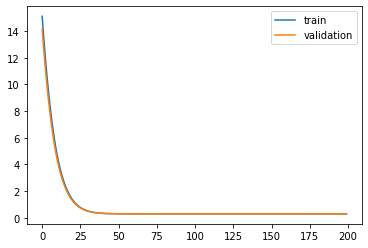

Time to train LSTM:  137.39692425727844


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f90b28caa58>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 15.4851 - acc: 0.5527 - val_loss: 14.7680 - val_acc: 0.5988

Epoch 00001: val_loss improved from inf to 14.76804, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 14.5184 - acc: 0.6250 - val_loss: 13.8347 - val_acc: 0.6622

Epoch 00002: val_loss improved from 14.76804 to 13.83468, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 13.5981 - acc: 0.6774 - val_loss: 12.9476 - val_acc: 0.7010

Epoch 00003: val_loss improved from 13.83468 to 12.94757, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 12.7238 - acc: 0.7129 - val_loss: 12.1059 - val_acc: 0.7312

Epoch 00004: val_loss improved from 12.94757 to 12.10593, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 11.8946 - acc: 0.7392 - val_loss: 11.3087 - val_acc: 0.7549

Epoch 00005: val_loss improved from 12.10593 to 11.30871, saving model to Event_val_weights1.hdf5
Epoch 6/200
 - 1s - loss: 11.10

 - 1s - loss: 0.6598 - acc: 0.8873 - val_loss: 0.6294 - val_acc: 0.8868

Epoch 00046: val_loss improved from 0.66419 to 0.62943, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.6258 - acc: 0.8871 - val_loss: 0.5977 - val_acc: 0.8864

Epoch 00047: val_loss improved from 0.62943 to 0.59771, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.5948 - acc: 0.8871 - val_loss: 0.5688 - val_acc: 0.8868

Epoch 00048: val_loss improved from 0.59771 to 0.56878, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.5666 - acc: 0.8873 - val_loss: 0.5424 - val_acc: 0.8864

Epoch 00049: val_loss improved from 0.56878 to 0.54243, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.5409 - acc: 0.8873 - val_loss: 0.5184 - val_acc: 0.8861

Epoch 00050: val_loss improved from 0.54243 to 0.51844, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.5174 - acc: 0.8874 - val_loss: 0.4966 - val_acc: 0.8861

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.29587 to 0.29560, saving model to Event_val_weights1.hdf5
Epoch 92/200
 - 1s - loss: 0.3005 - acc: 0.8877 - val_loss: 0.2954 - val_acc: 0.8887

Epoch 00092: val_loss improved from 0.29560 to 0.29536, saving model to Event_val_weights1.hdf5
Epoch 93/200
 - 1s - loss: 0.3003 - acc: 0.8877 - val_loss: 0.2951 - val_acc: 0.8889

Epoch 00093: val_loss improved from 0.29536 to 0.29515, saving model to Event_val_weights1.hdf5
Epoch 94/200
 - 1s - loss: 0.3001 - acc: 0.8878 - val_loss: 0.2950 - val_acc: 0.8890

Epoch 00094: val_loss improved from 0.29515 to 0.29496, saving model to Event_val_weights1.hdf5
Epoch 95/200
 - 1s - loss: 0.2999 - acc: 0.8878 - val_loss: 0.2948 - val_acc: 0.8890

Epoch 00095: val_loss improved from 0.29496 to 0.29479, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.2997 - acc: 0.8878 - val_loss: 0.2946 - val_acc: 0.8889

Epoch 00096: val_loss improved from 0.29479 to 0.29464, saving model to Event_val_weights

 - 1s - loss: 0.2980 - acc: 0.8880 - val_loss: 0.2936 - val_acc: 0.8896

Epoch 00141: val_loss did not improve from 0.29352
Epoch 142/200
 - 1s - loss: 0.2980 - acc: 0.8879 - val_loss: 0.2937 - val_acc: 0.8898

Epoch 00142: val_loss did not improve from 0.29352
Epoch 143/200
 - 1s - loss: 0.2980 - acc: 0.8879 - val_loss: 0.2937 - val_acc: 0.8896

Epoch 00143: val_loss did not improve from 0.29352
Epoch 144/200
 - 1s - loss: 0.2980 - acc: 0.8879 - val_loss: 0.2937 - val_acc: 0.8896

Epoch 00144: val_loss did not improve from 0.29352
Epoch 145/200
 - 1s - loss: 0.2980 - acc: 0.8879 - val_loss: 0.2937 - val_acc: 0.8898

Epoch 00145: val_loss did not improve from 0.29352
Epoch 146/200
 - 1s - loss: 0.2980 - acc: 0.8879 - val_loss: 0.2937 - val_acc: 0.8899

Epoch 00146: val_loss did not improve from 0.29352
Epoch 147/200
 - 1s - loss: 0.2979 - acc: 0.8879 - val_loss: 0.2937 - val_acc: 0.8898

Epoch 00147: val_loss did not improve from 0.29352
Epoch 148/200
 - 1s - loss: 0.2979 - acc: 0.8878


Epoch 00200: val_loss did not improve from 0.29352
#################################
Number of units: 32
Batch size: 32768
Fold: 0
best val loss: 0.2935233414173126
#################################


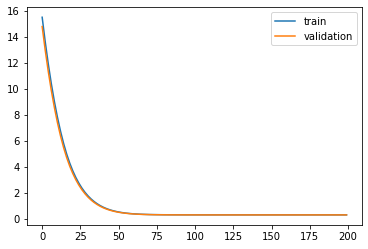

Time to train LSTM:  140.71567296981812
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 15.4678 - acc: 0.5503 - val_loss: 14.7502 - val_acc: 0.5957

Epoch 00001: val_loss improved from inf to 14.75022, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 14.4962 - acc: 0.6234 - val_loss: 13.8140 - val_acc: 0.6646

Epoch 00002: val_loss improved from 14.75022 to 13.81396, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 13.5722 - acc: 0.6823 - val_loss: 12.9249 - val_acc: 0.7049

Epoch 00003: val_loss improved from 13.81396 to 12.92492, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 12.6952 - acc: 0.7220 - val_loss: 12.0821 - val_acc: 0.7364

Epoch 00004: val_loss improved from 12.92492 to 12.08214, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 11.8641 - acc: 0.7481 - val_loss: 11.2844 - val_acc: 0.7588

Epoch 00005: val_loss improved from 12.08214 to 11.28436, saving model to Event_val_weigh


Epoch 00045: val_loss improved from 0.71037 to 0.67249, saving model to Event_val_weights2.hdf5
Epoch 46/200
 - 1s - loss: 0.6555 - acc: 0.8880 - val_loss: 0.6379 - val_acc: 0.8850

Epoch 00046: val_loss improved from 0.67249 to 0.63789, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.6218 - acc: 0.8881 - val_loss: 0.6063 - val_acc: 0.8850

Epoch 00047: val_loss improved from 0.63789 to 0.60633, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.5910 - acc: 0.8882 - val_loss: 0.5776 - val_acc: 0.8850

Epoch 00048: val_loss improved from 0.60633 to 0.57756, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.5630 - acc: 0.8883 - val_loss: 0.5514 - val_acc: 0.8850

Epoch 00049: val_loss improved from 0.57756 to 0.55135, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.5374 - acc: 0.8884 - val_loss: 0.5275 - val_acc: 0.8849

Epoch 00050: val_loss improved from 0.55135 to 0.52750, saving model to Event_val_weights

 - 1s - loss: 0.2998 - acc: 0.8884 - val_loss: 0.3066 - val_acc: 0.8848

Epoch 00091: val_loss improved from 0.30688 to 0.30662, saving model to Event_val_weights2.hdf5
Epoch 92/200
 - 1s - loss: 0.2995 - acc: 0.8884 - val_loss: 0.3064 - val_acc: 0.8848

Epoch 00092: val_loss improved from 0.30662 to 0.30639, saving model to Event_val_weights2.hdf5
Epoch 93/200
 - 1s - loss: 0.2993 - acc: 0.8884 - val_loss: 0.3062 - val_acc: 0.8848

Epoch 00093: val_loss improved from 0.30639 to 0.30619, saving model to Event_val_weights2.hdf5
Epoch 94/200
 - 1s - loss: 0.2991 - acc: 0.8884 - val_loss: 0.3060 - val_acc: 0.8849

Epoch 00094: val_loss improved from 0.30619 to 0.30601, saving model to Event_val_weights2.hdf5
Epoch 95/200
 - 1s - loss: 0.2989 - acc: 0.8884 - val_loss: 0.3058 - val_acc: 0.8849

Epoch 00095: val_loss improved from 0.30601 to 0.30585, saving model to Event_val_weights2.hdf5
Epoch 96/200
 - 1s - loss: 0.2987 - acc: 0.8884 - val_loss: 0.3057 - val_acc: 0.8849

Epoch 00096: val_


Epoch 00141: val_loss did not improve from 0.30481
Epoch 142/200
 - 1s - loss: 0.2968 - acc: 0.8885 - val_loss: 0.3051 - val_acc: 0.8843

Epoch 00142: val_loss did not improve from 0.30481
Epoch 143/200
 - 1s - loss: 0.2967 - acc: 0.8885 - val_loss: 0.3051 - val_acc: 0.8841

Epoch 00143: val_loss did not improve from 0.30481
Epoch 144/200
 - 1s - loss: 0.2967 - acc: 0.8885 - val_loss: 0.3051 - val_acc: 0.8841

Epoch 00144: val_loss did not improve from 0.30481
Epoch 145/200
 - 1s - loss: 0.2967 - acc: 0.8885 - val_loss: 0.3051 - val_acc: 0.8840

Epoch 00145: val_loss did not improve from 0.30481
Epoch 146/200
 - 1s - loss: 0.2967 - acc: 0.8885 - val_loss: 0.3051 - val_acc: 0.8840

Epoch 00146: val_loss did not improve from 0.30481
Epoch 147/200
 - 1s - loss: 0.2967 - acc: 0.8885 - val_loss: 0.3051 - val_acc: 0.8840

Epoch 00147: val_loss did not improve from 0.30481
Epoch 148/200
 - 1s - loss: 0.2967 - acc: 0.8885 - val_loss: 0.3051 - val_acc: 0.8840

Epoch 00148: val_loss did not imp

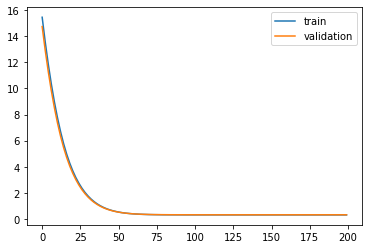

Time to train LSTM:  135.51595640182495
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 15.4413 - acc: 0.5635 - val_loss: 14.7197 - val_acc: 0.6106

Epoch 00001: val_loss improved from inf to 14.71974, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 14.4765 - acc: 0.6146 - val_loss: 13.7887 - val_acc: 0.6530

Epoch 00002: val_loss improved from 14.71974 to 13.78873, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 13.5575 - acc: 0.6576 - val_loss: 12.9035 - val_acc: 0.6861

Epoch 00003: val_loss improved from 13.78873 to 12.90350, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 12.6841 - acc: 0.6923 - val_loss: 12.0634 - val_acc: 0.7123

Epoch 00004: val_loss improved from 12.90350 to 12.06344, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 11.8555 - acc: 0.7197 - val_loss: 11.2677 - val_acc: 0.7357

Epoch 00005: val_loss improved from 12.06344 to 11.26770, saving model to Event_val_weigh


Epoch 00045: val_loss improved from 0.70393 to 0.66629, saving model to Event_val_weights3.hdf5
Epoch 46/200
 - 1s - loss: 0.6543 - acc: 0.8882 - val_loss: 0.6319 - val_acc: 0.8870

Epoch 00046: val_loss improved from 0.66629 to 0.63192, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.6207 - acc: 0.8882 - val_loss: 0.6006 - val_acc: 0.8868

Epoch 00047: val_loss improved from 0.63192 to 0.60056, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.5900 - acc: 0.8882 - val_loss: 0.5720 - val_acc: 0.8868

Epoch 00048: val_loss improved from 0.60056 to 0.57198, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.5621 - acc: 0.8882 - val_loss: 0.5459 - val_acc: 0.8872

Epoch 00049: val_loss improved from 0.57198 to 0.54594, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.5367 - acc: 0.8882 - val_loss: 0.5222 - val_acc: 0.8871

Epoch 00050: val_loss improved from 0.54594 to 0.52224, saving model to Event_val_weights

 - 1s - loss: 0.3000 - acc: 0.8880 - val_loss: 0.3034 - val_acc: 0.8881

Epoch 00091: val_loss improved from 0.30367 to 0.30343, saving model to Event_val_weights3.hdf5
Epoch 92/200
 - 1s - loss: 0.2997 - acc: 0.8880 - val_loss: 0.3032 - val_acc: 0.8880

Epoch 00092: val_loss improved from 0.30343 to 0.30321, saving model to Event_val_weights3.hdf5
Epoch 93/200
 - 1s - loss: 0.2995 - acc: 0.8880 - val_loss: 0.3030 - val_acc: 0.8880

Epoch 00093: val_loss improved from 0.30321 to 0.30302, saving model to Event_val_weights3.hdf5
Epoch 94/200
 - 1s - loss: 0.2993 - acc: 0.8881 - val_loss: 0.3028 - val_acc: 0.8880

Epoch 00094: val_loss improved from 0.30302 to 0.30285, saving model to Event_val_weights3.hdf5
Epoch 95/200
 - 1s - loss: 0.2991 - acc: 0.8881 - val_loss: 0.3027 - val_acc: 0.8879

Epoch 00095: val_loss improved from 0.30285 to 0.30270, saving model to Event_val_weights3.hdf5
Epoch 96/200
 - 1s - loss: 0.2990 - acc: 0.8881 - val_loss: 0.3026 - val_acc: 0.8878

Epoch 00096: val_

 - 1s - loss: 0.2972 - acc: 0.8887 - val_loss: 0.3021 - val_acc: 0.8886

Epoch 00142: val_loss did not improve from 0.30183
Epoch 143/200
 - 1s - loss: 0.2972 - acc: 0.8887 - val_loss: 0.3021 - val_acc: 0.8888

Epoch 00143: val_loss did not improve from 0.30183
Epoch 144/200
 - 1s - loss: 0.2971 - acc: 0.8888 - val_loss: 0.3021 - val_acc: 0.8886

Epoch 00144: val_loss did not improve from 0.30183
Epoch 145/200
 - 1s - loss: 0.2971 - acc: 0.8888 - val_loss: 0.3022 - val_acc: 0.8886

Epoch 00145: val_loss did not improve from 0.30183
Epoch 146/200
 - 1s - loss: 0.2971 - acc: 0.8888 - val_loss: 0.3022 - val_acc: 0.8884

Epoch 00146: val_loss did not improve from 0.30183
Epoch 147/200
 - 1s - loss: 0.2970 - acc: 0.8888 - val_loss: 0.3022 - val_acc: 0.8884

Epoch 00147: val_loss did not improve from 0.30183
Epoch 148/200
 - 1s - loss: 0.2970 - acc: 0.8889 - val_loss: 0.3022 - val_acc: 0.8884

Epoch 00148: val_loss did not improve from 0.30183
Epoch 149/200
 - 1s - loss: 0.2969 - acc: 0.8889

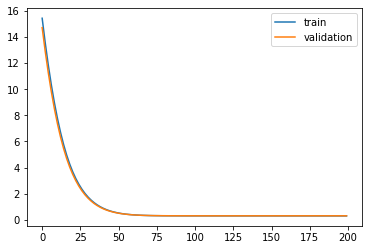

Time to train LSTM:  134.59467577934265
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 15.5868 - acc: 0.5663 - val_loss: 14.8565 - val_acc: 0.6104

Epoch 00001: val_loss improved from inf to 14.85647, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 14.6087 - acc: 0.6174 - val_loss: 13.9142 - val_acc: 0.6566

Epoch 00002: val_loss improved from 14.85647 to 13.91423, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 13.6782 - acc: 0.6622 - val_loss: 13.0192 - val_acc: 0.6920

Epoch 00003: val_loss improved from 13.91423 to 13.01922, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 12.7947 - acc: 0.6952 - val_loss: 12.1705 - val_acc: 0.7158

Epoch 00004: val_loss improved from 13.01922 to 12.17046, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 11.9572 - acc: 0.7194 - val_loss: 11.3667 - val_acc: 0.7360

Epoch 00005: val_loss improved from 12.17046 to 11.36668, saving model to Event_val_weigh


Epoch 00045: val_loss improved from 0.71165 to 0.67361, saving model to Event_val_weights4.hdf5
Epoch 46/200
 - 1s - loss: 0.6562 - acc: 0.8876 - val_loss: 0.6389 - val_acc: 0.8853

Epoch 00046: val_loss improved from 0.67361 to 0.63888, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.6223 - acc: 0.8875 - val_loss: 0.6072 - val_acc: 0.8859

Epoch 00047: val_loss improved from 0.63888 to 0.60720, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.5914 - acc: 0.8877 - val_loss: 0.5783 - val_acc: 0.8854

Epoch 00048: val_loss improved from 0.60720 to 0.57831, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.5633 - acc: 0.8877 - val_loss: 0.5520 - val_acc: 0.8851

Epoch 00049: val_loss improved from 0.57831 to 0.55200, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.5376 - acc: 0.8877 - val_loss: 0.5281 - val_acc: 0.8854

Epoch 00050: val_loss improved from 0.55200 to 0.52805, saving model to Event_val_weights

 - 1s - loss: 0.2995 - acc: 0.8879 - val_loss: 0.3067 - val_acc: 0.8856

Epoch 00091: val_loss improved from 0.30701 to 0.30674, saving model to Event_val_weights4.hdf5
Epoch 92/200
 - 1s - loss: 0.2992 - acc: 0.8879 - val_loss: 0.3065 - val_acc: 0.8856

Epoch 00092: val_loss improved from 0.30674 to 0.30651, saving model to Event_val_weights4.hdf5
Epoch 93/200
 - 1s - loss: 0.2990 - acc: 0.8879 - val_loss: 0.3063 - val_acc: 0.8857

Epoch 00093: val_loss improved from 0.30651 to 0.30630, saving model to Event_val_weights4.hdf5
Epoch 94/200
 - 1s - loss: 0.2988 - acc: 0.8880 - val_loss: 0.3061 - val_acc: 0.8857

Epoch 00094: val_loss improved from 0.30630 to 0.30611, saving model to Event_val_weights4.hdf5
Epoch 95/200
 - 1s - loss: 0.2986 - acc: 0.8880 - val_loss: 0.3059 - val_acc: 0.8856

Epoch 00095: val_loss improved from 0.30611 to 0.30595, saving model to Event_val_weights4.hdf5
Epoch 96/200
 - 1s - loss: 0.2984 - acc: 0.8880 - val_loss: 0.3058 - val_acc: 0.8856

Epoch 00096: val_

 - 1s - loss: 0.2966 - acc: 0.8882 - val_loss: 0.3043 - val_acc: 0.8854

Epoch 00136: val_loss improved from 0.30431 to 0.30431, saving model to Event_val_weights4.hdf5
Epoch 137/200
 - 1s - loss: 0.2966 - acc: 0.8882 - val_loss: 0.3043 - val_acc: 0.8856

Epoch 00137: val_loss improved from 0.30431 to 0.30429, saving model to Event_val_weights4.hdf5
Epoch 138/200
 - 1s - loss: 0.2966 - acc: 0.8882 - val_loss: 0.3043 - val_acc: 0.8856

Epoch 00138: val_loss improved from 0.30429 to 0.30429, saving model to Event_val_weights4.hdf5
Epoch 139/200
 - 1s - loss: 0.2965 - acc: 0.8882 - val_loss: 0.3043 - val_acc: 0.8858

Epoch 00139: val_loss improved from 0.30429 to 0.30428, saving model to Event_val_weights4.hdf5
Epoch 140/200
 - 1s - loss: 0.2965 - acc: 0.8883 - val_loss: 0.3043 - val_acc: 0.8857

Epoch 00140: val_loss did not improve from 0.30428
Epoch 141/200
 - 1s - loss: 0.2965 - acc: 0.8883 - val_loss: 0.3043 - val_acc: 0.8856

Epoch 00141: val_loss improved from 0.30428 to 0.30427, s

 - 1s - loss: 0.2952 - acc: 0.8892 - val_loss: 0.3053 - val_acc: 0.8849

Epoch 00194: val_loss did not improve from 0.30427
Epoch 195/200
 - 1s - loss: 0.2952 - acc: 0.8891 - val_loss: 0.3055 - val_acc: 0.8847

Epoch 00195: val_loss did not improve from 0.30427
Epoch 196/200
 - 1s - loss: 0.2951 - acc: 0.8891 - val_loss: 0.3054 - val_acc: 0.8844

Epoch 00196: val_loss did not improve from 0.30427
Epoch 197/200
 - 1s - loss: 0.2951 - acc: 0.8892 - val_loss: 0.3055 - val_acc: 0.8847

Epoch 00197: val_loss did not improve from 0.30427
Epoch 198/200
 - 1s - loss: 0.2951 - acc: 0.8891 - val_loss: 0.3056 - val_acc: 0.8844

Epoch 00198: val_loss did not improve from 0.30427
Epoch 199/200
 - 1s - loss: 0.2950 - acc: 0.8892 - val_loss: 0.3055 - val_acc: 0.8847

Epoch 00199: val_loss did not improve from 0.30427
Epoch 200/200
 - 1s - loss: 0.2950 - acc: 0.8892 - val_loss: 0.3057 - val_acc: 0.8843

Epoch 00200: val_loss did not improve from 0.30427
#################################
Number of unit

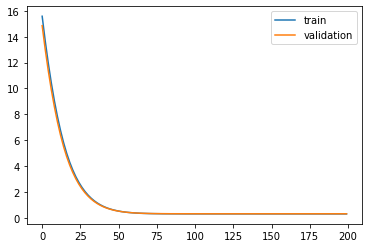

Time to train LSTM:  135.46159386634827
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 15.4359 - acc: 0.5418 - val_loss: 14.7149 - val_acc: 0.6103

Epoch 00001: val_loss improved from inf to 14.71488, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 14.4701 - acc: 0.6202 - val_loss: 13.7830 - val_acc: 0.6674

Epoch 00002: val_loss improved from 14.71488 to 13.78301, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 13.5502 - acc: 0.6778 - val_loss: 12.8967 - val_acc: 0.7087

Epoch 00003: val_loss improved from 13.78301 to 12.89675, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 12.6757 - acc: 0.7143 - val_loss: 12.0555 - val_acc: 0.7363

Epoch 00004: val_loss improved from 12.89675 to 12.05551, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 11.8461 - acc: 0.7389 - val_loss: 11.2585 - val_acc: 0.7546

Epoch 00005: val_loss improved from 12.05551 to 11.25852, saving model to Event_val_weigh


Epoch 00045: val_loss improved from 0.70553 to 0.66772, saving model to Event_val_weights5.hdf5
Epoch 46/200
 - 1s - loss: 0.6548 - acc: 0.8871 - val_loss: 0.6332 - val_acc: 0.8869

Epoch 00046: val_loss improved from 0.66772 to 0.63319, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.6211 - acc: 0.8871 - val_loss: 0.6017 - val_acc: 0.8867

Epoch 00047: val_loss improved from 0.63319 to 0.60169, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.5904 - acc: 0.8873 - val_loss: 0.5730 - val_acc: 0.8868

Epoch 00048: val_loss improved from 0.60169 to 0.57298, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.5624 - acc: 0.8873 - val_loss: 0.5468 - val_acc: 0.8867

Epoch 00049: val_loss improved from 0.57298 to 0.54682, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.5369 - acc: 0.8872 - val_loss: 0.5230 - val_acc: 0.8869

Epoch 00050: val_loss improved from 0.54682 to 0.52302, saving model to Event_val_weights

 - 1s - loss: 0.3002 - acc: 0.8877 - val_loss: 0.3031 - val_acc: 0.8878

Epoch 00091: val_loss improved from 0.30336 to 0.30310, saving model to Event_val_weights5.hdf5
Epoch 92/200
 - 1s - loss: 0.2999 - acc: 0.8877 - val_loss: 0.3029 - val_acc: 0.8878

Epoch 00092: val_loss improved from 0.30310 to 0.30288, saving model to Event_val_weights5.hdf5
Epoch 93/200
 - 1s - loss: 0.2997 - acc: 0.8877 - val_loss: 0.3027 - val_acc: 0.8878

Epoch 00093: val_loss improved from 0.30288 to 0.30267, saving model to Event_val_weights5.hdf5
Epoch 94/200
 - 1s - loss: 0.2995 - acc: 0.8878 - val_loss: 0.3025 - val_acc: 0.8877

Epoch 00094: val_loss improved from 0.30267 to 0.30249, saving model to Event_val_weights5.hdf5
Epoch 95/200
 - 1s - loss: 0.2993 - acc: 0.8878 - val_loss: 0.3023 - val_acc: 0.8877

Epoch 00095: val_loss improved from 0.30249 to 0.30233, saving model to Event_val_weights5.hdf5
Epoch 96/200
 - 1s - loss: 0.2991 - acc: 0.8878 - val_loss: 0.3022 - val_acc: 0.8877

Epoch 00096: val_


Epoch 00137: val_loss did not improve from 0.30101
Epoch 138/200
 - 1s - loss: 0.2973 - acc: 0.8881 - val_loss: 0.3011 - val_acc: 0.8871

Epoch 00138: val_loss did not improve from 0.30101
Epoch 139/200
 - 1s - loss: 0.2973 - acc: 0.8881 - val_loss: 0.3011 - val_acc: 0.8868

Epoch 00139: val_loss did not improve from 0.30101
Epoch 140/200
 - 1s - loss: 0.2972 - acc: 0.8881 - val_loss: 0.3011 - val_acc: 0.8868

Epoch 00140: val_loss did not improve from 0.30101
Epoch 141/200
 - 1s - loss: 0.2972 - acc: 0.8881 - val_loss: 0.3012 - val_acc: 0.8868

Epoch 00141: val_loss did not improve from 0.30101
Epoch 142/200
 - 1s - loss: 0.2972 - acc: 0.8881 - val_loss: 0.3012 - val_acc: 0.8868

Epoch 00142: val_loss did not improve from 0.30101
Epoch 143/200
 - 1s - loss: 0.2971 - acc: 0.8881 - val_loss: 0.3012 - val_acc: 0.8870

Epoch 00143: val_loss did not improve from 0.30101
Epoch 144/200
 - 1s - loss: 0.2971 - acc: 0.8881 - val_loss: 0.3013 - val_acc: 0.8870

Epoch 00144: val_loss did not imp

 - 1s - loss: 0.2956 - acc: 0.8889 - val_loss: 0.3024 - val_acc: 0.8878

Epoch 00197: val_loss did not improve from 0.30101
Epoch 198/200
 - 1s - loss: 0.2952 - acc: 0.8891 - val_loss: 0.3031 - val_acc: 0.8871

Epoch 00198: val_loss did not improve from 0.30101
Epoch 199/200
 - 1s - loss: 0.2951 - acc: 0.8891 - val_loss: 0.3034 - val_acc: 0.8872

Epoch 00199: val_loss did not improve from 0.30101
Epoch 200/200
 - 1s - loss: 0.2952 - acc: 0.8894 - val_loss: 0.3036 - val_acc: 0.8870

Epoch 00200: val_loss did not improve from 0.30101
#################################
Number of units: 32
Batch size: 32768
Fold: 4
best val loss: 0.30100953578948975
#################################
[[32, 4096, 0, 0.2939524393346575], [32, 4096, 1, 0.3066268875333998], [32, 4096, 2, 0.30254790782928465], [32, 4096, 3, 0.30564250445365904], [32, 4096, 4, 0.30223504707548354], [32, 8192, 0, 0.2940163224803077], [32, 8192, 1, 0.3051396623187595], [32, 8192, 2, 0.302403668695026], [32, 8192, 3, 0.30544566098848

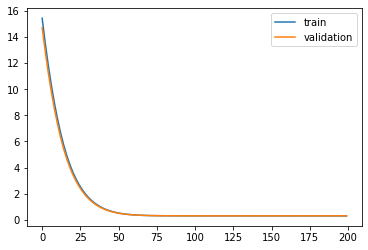

Time to train LSTM:  135.1070795059204


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f90b06402b0>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 15.7181 - acc: 0.5512 - val_loss: 15.1169 - val_acc: 0.5814

Epoch 00001: val_loss improved from inf to 15.11693, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 15.0588 - acc: 0.5817 - val_loss: 14.4761 - val_acc: 0.6139

Epoch 00002: val_loss improved from 15.11693 to 14.47608, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 14.4202 - acc: 0.6113 - val_loss: 13.8560 - val_acc: 0.6426

Epoch 00003: val_loss improved from 14.47608 to 13.85596, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 13.8023 - acc: 0.6383 - val_loss: 13.2565 - val_acc: 0.6673

Epoch 00004: val_loss improved from 13.85596 to 13.25650, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 13.2051 - acc: 0.6635 - val_loss: 12.6775 - val_acc: 0.6904

Epoch 00005: val_loss improved from 13.25650 to 12.67750, saving model to Event_val_weights1.hdf5
Epoch 6/200
 - 1s - loss: 12.62

 - 1s - loss: 1.7755 - acc: 0.8852 - val_loss: 1.6928 - val_acc: 0.8870

Epoch 00046: val_loss improved from 1.77732 to 1.69283, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 1.6914 - acc: 0.8851 - val_loss: 1.6128 - val_acc: 0.8880

Epoch 00047: val_loss improved from 1.69283 to 1.61278, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 1.6117 - acc: 0.8853 - val_loss: 1.5370 - val_acc: 0.8879

Epoch 00048: val_loss improved from 1.61278 to 1.53695, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 1.5362 - acc: 0.8852 - val_loss: 1.4651 - val_acc: 0.8877

Epoch 00049: val_loss improved from 1.53695 to 1.46514, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 1.4647 - acc: 0.8854 - val_loss: 1.3972 - val_acc: 0.8876

Epoch 00050: val_loss improved from 1.46514 to 1.39715, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 1.3970 - acc: 0.8853 - val_loss: 1.3328 - val_acc: 0.8879

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.37215 to 0.36669, saving model to Event_val_weights1.hdf5
Epoch 92/200
 - 1s - loss: 0.3712 - acc: 0.8876 - val_loss: 0.3616 - val_acc: 0.8879

Epoch 00092: val_loss improved from 0.36669 to 0.36159, saving model to Event_val_weights1.hdf5
Epoch 93/200
 - 1s - loss: 0.3661 - acc: 0.8876 - val_loss: 0.3568 - val_acc: 0.8879

Epoch 00093: val_loss improved from 0.36159 to 0.35683, saving model to Event_val_weights1.hdf5
Epoch 94/200
 - 1s - loss: 0.3614 - acc: 0.8876 - val_loss: 0.3524 - val_acc: 0.8879

Epoch 00094: val_loss improved from 0.35683 to 0.35239, saving model to Event_val_weights1.hdf5
Epoch 95/200
 - 1s - loss: 0.3570 - acc: 0.8876 - val_loss: 0.3482 - val_acc: 0.8879

Epoch 00095: val_loss improved from 0.35239 to 0.34825, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.3529 - acc: 0.8875 - val_loss: 0.3444 - val_acc: 0.8879

Epoch 00096: val_loss improved from 0.34825 to 0.34439, saving model to Event_val_weights


Epoch 00136: val_loss improved from 0.29651 to 0.29632, saving model to Event_val_weights1.hdf5
Epoch 137/200
 - 1s - loss: 0.3012 - acc: 0.8873 - val_loss: 0.2962 - val_acc: 0.8892

Epoch 00137: val_loss improved from 0.29632 to 0.29616, saving model to Event_val_weights1.hdf5
Epoch 138/200
 - 1s - loss: 0.3011 - acc: 0.8873 - val_loss: 0.2960 - val_acc: 0.8891

Epoch 00138: val_loss improved from 0.29616 to 0.29600, saving model to Event_val_weights1.hdf5
Epoch 139/200
 - 1s - loss: 0.3009 - acc: 0.8873 - val_loss: 0.2959 - val_acc: 0.8892

Epoch 00139: val_loss improved from 0.29600 to 0.29586, saving model to Event_val_weights1.hdf5
Epoch 140/200
 - 1s - loss: 0.3008 - acc: 0.8873 - val_loss: 0.2957 - val_acc: 0.8892

Epoch 00140: val_loss improved from 0.29586 to 0.29573, saving model to Event_val_weights1.hdf5
Epoch 141/200
 - 1s - loss: 0.3006 - acc: 0.8873 - val_loss: 0.2956 - val_acc: 0.8890

Epoch 00141: val_loss improved from 0.29573 to 0.29561, saving model to Event_val_we


Epoch 00182: val_loss did not improve from 0.29437
Epoch 183/200
 - 1s - loss: 0.2989 - acc: 0.8876 - val_loss: 0.2944 - val_acc: 0.8892

Epoch 00183: val_loss did not improve from 0.29437
Epoch 184/200
 - 1s - loss: 0.2989 - acc: 0.8876 - val_loss: 0.2944 - val_acc: 0.8892

Epoch 00184: val_loss did not improve from 0.29437
Epoch 185/200
 - 1s - loss: 0.2989 - acc: 0.8877 - val_loss: 0.2944 - val_acc: 0.8893

Epoch 00185: val_loss did not improve from 0.29437
Epoch 186/200
 - 1s - loss: 0.2989 - acc: 0.8877 - val_loss: 0.2944 - val_acc: 0.8892

Epoch 00186: val_loss did not improve from 0.29437
Epoch 187/200
 - 1s - loss: 0.2989 - acc: 0.8877 - val_loss: 0.2944 - val_acc: 0.8891

Epoch 00187: val_loss did not improve from 0.29437
Epoch 188/200
 - 1s - loss: 0.2989 - acc: 0.8877 - val_loss: 0.2944 - val_acc: 0.8891

Epoch 00188: val_loss did not improve from 0.29437
Epoch 189/200
 - 1s - loss: 0.2989 - acc: 0.8878 - val_loss: 0.2944 - val_acc: 0.8890

Epoch 00189: val_loss did not imp

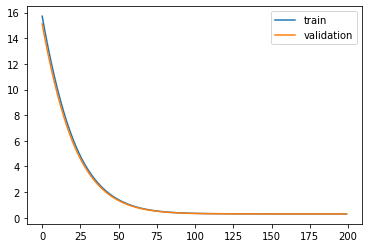

Time to train LSTM:  139.95797276496887
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 15.9408 - acc: 0.5114 - val_loss: 15.3322 - val_acc: 0.5641

Epoch 00001: val_loss improved from inf to 15.33218, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 15.2782 - acc: 0.5519 - val_loss: 14.6882 - val_acc: 0.5997

Epoch 00002: val_loss improved from 15.33218 to 14.68816, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 14.6356 - acc: 0.5907 - val_loss: 14.0643 - val_acc: 0.6370

Epoch 00003: val_loss improved from 14.68816 to 14.06426, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 14.0130 - acc: 0.6243 - val_loss: 13.4605 - val_acc: 0.6636

Epoch 00004: val_loss improved from 14.06426 to 13.46045, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 13.4106 - acc: 0.6530 - val_loss: 12.8766 - val_acc: 0.6870

Epoch 00005: val_loss improved from 13.46045 to 12.87663, saving model to Event_val_weigh


Epoch 00045: val_loss improved from 1.90531 to 1.81467, saving model to Event_val_weights2.hdf5
Epoch 46/200
 - 1s - loss: 1.8002 - acc: 0.8851 - val_loss: 1.7287 - val_acc: 0.8833

Epoch 00046: val_loss improved from 1.81467 to 1.72874, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 1.7146 - acc: 0.8853 - val_loss: 1.6473 - val_acc: 0.8831

Epoch 00047: val_loss improved from 1.72874 to 1.64730, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 1.6335 - acc: 0.8852 - val_loss: 1.5701 - val_acc: 0.8830

Epoch 00048: val_loss improved from 1.64730 to 1.57012, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 1.5567 - acc: 0.8855 - val_loss: 1.4970 - val_acc: 0.8830

Epoch 00049: val_loss improved from 1.57012 to 1.49702, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 1.4839 - acc: 0.8859 - val_loss: 1.4278 - val_acc: 0.8828

Epoch 00050: val_loss improved from 1.49702 to 1.42779, saving model to Event_val_weights

 - 1s - loss: 0.3763 - acc: 0.8880 - val_loss: 0.3788 - val_acc: 0.8834

Epoch 00091: val_loss improved from 0.38437 to 0.37884, saving model to Event_val_weights2.hdf5
Epoch 92/200
 - 1s - loss: 0.3708 - acc: 0.8880 - val_loss: 0.3737 - val_acc: 0.8834

Epoch 00092: val_loss improved from 0.37884 to 0.37368, saving model to Event_val_weights2.hdf5
Epoch 93/200
 - 1s - loss: 0.3657 - acc: 0.8881 - val_loss: 0.3689 - val_acc: 0.8836

Epoch 00093: val_loss improved from 0.37368 to 0.36887, saving model to Event_val_weights2.hdf5
Epoch 94/200
 - 1s - loss: 0.3609 - acc: 0.8881 - val_loss: 0.3644 - val_acc: 0.8836

Epoch 00094: val_loss improved from 0.36887 to 0.36438, saving model to Event_val_weights2.hdf5
Epoch 95/200
 - 1s - loss: 0.3564 - acc: 0.8880 - val_loss: 0.3602 - val_acc: 0.8836

Epoch 00095: val_loss improved from 0.36438 to 0.36019, saving model to Event_val_weights2.hdf5
Epoch 96/200
 - 1s - loss: 0.3523 - acc: 0.8880 - val_loss: 0.3563 - val_acc: 0.8837

Epoch 00096: val_

 - 1s - loss: 0.3006 - acc: 0.8882 - val_loss: 0.3080 - val_acc: 0.8840

Epoch 00136: val_loss improved from 0.30817 to 0.30799, saving model to Event_val_weights2.hdf5
Epoch 137/200
 - 1s - loss: 0.3004 - acc: 0.8882 - val_loss: 0.3078 - val_acc: 0.8840

Epoch 00137: val_loss improved from 0.30799 to 0.30782, saving model to Event_val_weights2.hdf5
Epoch 138/200
 - 1s - loss: 0.3003 - acc: 0.8882 - val_loss: 0.3077 - val_acc: 0.8840

Epoch 00138: val_loss improved from 0.30782 to 0.30766, saving model to Event_val_weights2.hdf5
Epoch 139/200
 - 1s - loss: 0.3001 - acc: 0.8882 - val_loss: 0.3075 - val_acc: 0.8840

Epoch 00139: val_loss improved from 0.30766 to 0.30752, saving model to Event_val_weights2.hdf5
Epoch 140/200
 - 1s - loss: 0.3000 - acc: 0.8882 - val_loss: 0.3074 - val_acc: 0.8841

Epoch 00140: val_loss improved from 0.30752 to 0.30739, saving model to Event_val_weights2.hdf5
Epoch 141/200
 - 1s - loss: 0.2998 - acc: 0.8882 - val_loss: 0.3073 - val_acc: 0.8842

Epoch 00141:

 - 1s - loss: 0.2980 - acc: 0.8884 - val_loss: 0.3062 - val_acc: 0.8844

Epoch 00183: val_loss did not improve from 0.30598
Epoch 184/200
 - 1s - loss: 0.2980 - acc: 0.8884 - val_loss: 0.3061 - val_acc: 0.8846

Epoch 00184: val_loss did not improve from 0.30598
Epoch 185/200
 - 1s - loss: 0.2980 - acc: 0.8884 - val_loss: 0.3061 - val_acc: 0.8844

Epoch 00185: val_loss did not improve from 0.30598
Epoch 186/200
 - 1s - loss: 0.2980 - acc: 0.8884 - val_loss: 0.3062 - val_acc: 0.8844

Epoch 00186: val_loss did not improve from 0.30598
Epoch 187/200
 - 1s - loss: 0.2980 - acc: 0.8884 - val_loss: 0.3061 - val_acc: 0.8844

Epoch 00187: val_loss did not improve from 0.30598
Epoch 188/200
 - 1s - loss: 0.2979 - acc: 0.8884 - val_loss: 0.3062 - val_acc: 0.8844

Epoch 00188: val_loss did not improve from 0.30598
Epoch 189/200
 - 1s - loss: 0.2979 - acc: 0.8884 - val_loss: 0.3062 - val_acc: 0.8843

Epoch 00189: val_loss did not improve from 0.30598
Epoch 190/200
 - 1s - loss: 0.2979 - acc: 0.8884

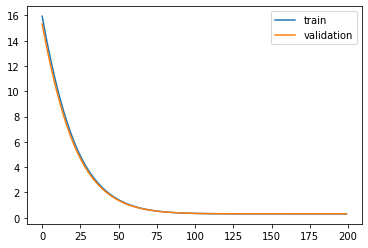

Time to train LSTM:  135.29895973205566
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 15.6680 - acc: 0.5722 - val_loss: 15.0736 - val_acc: 0.5971

Epoch 00001: val_loss improved from inf to 15.07360, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 15.0135 - acc: 0.6021 - val_loss: 14.4375 - val_acc: 0.6240

Epoch 00002: val_loss improved from 15.07360 to 14.43754, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 14.3791 - acc: 0.6303 - val_loss: 13.8217 - val_acc: 0.6527

Epoch 00003: val_loss improved from 14.43754 to 13.82171, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 13.7651 - acc: 0.6579 - val_loss: 13.2260 - val_acc: 0.6813

Epoch 00004: val_loss improved from 13.82171 to 13.22601, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 13.1711 - acc: 0.6832 - val_loss: 12.6503 - val_acc: 0.6999

Epoch 00005: val_loss improved from 13.22601 to 12.65028, saving model to Event_val_weigh


Epoch 00045: val_loss improved from 1.86908 to 1.78035, saving model to Event_val_weights3.hdf5
Epoch 46/200
 - 1s - loss: 1.7689 - acc: 0.8863 - val_loss: 1.6962 - val_acc: 0.8858

Epoch 00046: val_loss improved from 1.78035 to 1.69624, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 1.6851 - acc: 0.8865 - val_loss: 1.6165 - val_acc: 0.8861

Epoch 00047: val_loss improved from 1.69624 to 1.61654, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 1.6058 - acc: 0.8868 - val_loss: 1.5410 - val_acc: 0.8861

Epoch 00048: val_loss improved from 1.61654 to 1.54102, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 1.5306 - acc: 0.8869 - val_loss: 1.4695 - val_acc: 0.8862

Epoch 00049: val_loss improved from 1.54102 to 1.46949, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 1.4594 - acc: 0.8870 - val_loss: 1.4017 - val_acc: 0.8864

Epoch 00050: val_loss improved from 1.46949 to 1.40175, saving model to Event_val_weights

 - 1s - loss: 0.3755 - acc: 0.8878 - val_loss: 0.3736 - val_acc: 0.8866

Epoch 00091: val_loss improved from 0.37907 to 0.37362, saving model to Event_val_weights3.hdf5
Epoch 92/200
 - 1s - loss: 0.3700 - acc: 0.8879 - val_loss: 0.3685 - val_acc: 0.8864

Epoch 00092: val_loss improved from 0.37362 to 0.36853, saving model to Event_val_weights3.hdf5
Epoch 93/200
 - 1s - loss: 0.3650 - acc: 0.8879 - val_loss: 0.3638 - val_acc: 0.8863

Epoch 00093: val_loss improved from 0.36853 to 0.36379, saving model to Event_val_weights3.hdf5
Epoch 94/200
 - 1s - loss: 0.3603 - acc: 0.8879 - val_loss: 0.3594 - val_acc: 0.8863

Epoch 00094: val_loss improved from 0.36379 to 0.35936, saving model to Event_val_weights3.hdf5
Epoch 95/200
 - 1s - loss: 0.3559 - acc: 0.8880 - val_loss: 0.3552 - val_acc: 0.8863

Epoch 00095: val_loss improved from 0.35936 to 0.35523, saving model to Event_val_weights3.hdf5
Epoch 96/200
 - 1s - loss: 0.3517 - acc: 0.8880 - val_loss: 0.3514 - val_acc: 0.8866

Epoch 00096: val_

 - 1s - loss: 0.3003 - acc: 0.8879 - val_loss: 0.3039 - val_acc: 0.8876

Epoch 00136: val_loss improved from 0.30408 to 0.30391, saving model to Event_val_weights3.hdf5
Epoch 137/200
 - 1s - loss: 0.3001 - acc: 0.8878 - val_loss: 0.3038 - val_acc: 0.8877

Epoch 00137: val_loss improved from 0.30391 to 0.30375, saving model to Event_val_weights3.hdf5
Epoch 138/200
 - 1s - loss: 0.3000 - acc: 0.8878 - val_loss: 0.3036 - val_acc: 0.8877

Epoch 00138: val_loss improved from 0.30375 to 0.30361, saving model to Event_val_weights3.hdf5
Epoch 139/200
 - 1s - loss: 0.2998 - acc: 0.8878 - val_loss: 0.3035 - val_acc: 0.8877

Epoch 00139: val_loss improved from 0.30361 to 0.30348, saving model to Event_val_weights3.hdf5
Epoch 140/200
 - 1s - loss: 0.2997 - acc: 0.8878 - val_loss: 0.3034 - val_acc: 0.8874

Epoch 00140: val_loss improved from 0.30348 to 0.30336, saving model to Event_val_weights3.hdf5
Epoch 141/200
 - 1s - loss: 0.2995 - acc: 0.8879 - val_loss: 0.3033 - val_acc: 0.8876

Epoch 00141:


Epoch 00187: val_loss did not improve from 0.30248
Epoch 188/200
 - 1s - loss: 0.2978 - acc: 0.8883 - val_loss: 0.3033 - val_acc: 0.8872

Epoch 00188: val_loss did not improve from 0.30248
Epoch 189/200
 - 1s - loss: 0.2977 - acc: 0.8883 - val_loss: 0.3034 - val_acc: 0.8874

Epoch 00189: val_loss did not improve from 0.30248
Epoch 190/200
 - 1s - loss: 0.2977 - acc: 0.8883 - val_loss: 0.3034 - val_acc: 0.8873

Epoch 00190: val_loss did not improve from 0.30248
Epoch 191/200
 - 1s - loss: 0.2978 - acc: 0.8883 - val_loss: 0.3034 - val_acc: 0.8872

Epoch 00191: val_loss did not improve from 0.30248
Epoch 192/200
 - 1s - loss: 0.2978 - acc: 0.8884 - val_loss: 0.3036 - val_acc: 0.8872

Epoch 00192: val_loss did not improve from 0.30248
Epoch 193/200
 - 1s - loss: 0.2978 - acc: 0.8883 - val_loss: 0.3036 - val_acc: 0.8872

Epoch 00193: val_loss did not improve from 0.30248
Epoch 194/200
 - 1s - loss: 0.2977 - acc: 0.8884 - val_loss: 0.3035 - val_acc: 0.8872

Epoch 00194: val_loss did not imp

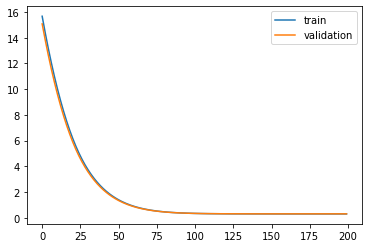

Time to train LSTM:  134.70792651176453
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 15.6177 - acc: 0.4861 - val_loss: 15.0195 - val_acc: 0.5390

Epoch 00001: val_loss improved from inf to 15.01948, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 14.9633 - acc: 0.5317 - val_loss: 14.3836 - val_acc: 0.5846

Epoch 00002: val_loss improved from 15.01948 to 14.38359, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 14.3290 - acc: 0.5759 - val_loss: 13.7679 - val_acc: 0.6240

Epoch 00003: val_loss improved from 14.38359 to 13.76794, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 13.7149 - acc: 0.6149 - val_loss: 13.1725 - val_acc: 0.6592

Epoch 00004: val_loss improved from 13.76794 to 13.17254, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 13.1211 - acc: 0.6492 - val_loss: 12.5973 - val_acc: 0.6890

Epoch 00005: val_loss improved from 13.17254 to 12.59729, saving model to Event_val_weigh


Epoch 00045: val_loss improved from 1.86228 to 1.77397, saving model to Event_val_weights4.hdf5
Epoch 46/200
 - 1s - loss: 1.7571 - acc: 0.8852 - val_loss: 1.6903 - val_acc: 0.8826

Epoch 00046: val_loss improved from 1.77397 to 1.69027, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 1.6738 - acc: 0.8854 - val_loss: 1.6110 - val_acc: 0.8829

Epoch 00047: val_loss improved from 1.69027 to 1.61095, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 1.5949 - acc: 0.8856 - val_loss: 1.5358 - val_acc: 0.8829

Epoch 00048: val_loss improved from 1.61095 to 1.53581, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 1.5202 - acc: 0.8857 - val_loss: 1.4646 - val_acc: 0.8833

Epoch 00049: val_loss improved from 1.53581 to 1.46463, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 1.4495 - acc: 0.8860 - val_loss: 1.3972 - val_acc: 0.8840

Epoch 00050: val_loss improved from 1.46463 to 1.39723, saving model to Event_val_weights

 - 1s - loss: 0.3742 - acc: 0.8875 - val_loss: 0.3765 - val_acc: 0.8859

Epoch 00091: val_loss improved from 0.38190 to 0.37652, saving model to Event_val_weights4.hdf5
Epoch 92/200
 - 1s - loss: 0.3689 - acc: 0.8875 - val_loss: 0.3715 - val_acc: 0.8859

Epoch 00092: val_loss improved from 0.37652 to 0.37150, saving model to Event_val_weights4.hdf5
Epoch 93/200
 - 1s - loss: 0.3639 - acc: 0.8875 - val_loss: 0.3668 - val_acc: 0.8858

Epoch 00093: val_loss improved from 0.37150 to 0.36682, saving model to Event_val_weights4.hdf5
Epoch 94/200
 - 1s - loss: 0.3593 - acc: 0.8875 - val_loss: 0.3624 - val_acc: 0.8858

Epoch 00094: val_loss improved from 0.36682 to 0.36245, saving model to Event_val_weights4.hdf5
Epoch 95/200
 - 1s - loss: 0.3549 - acc: 0.8876 - val_loss: 0.3584 - val_acc: 0.8856

Epoch 00095: val_loss improved from 0.36245 to 0.35838, saving model to Event_val_weights4.hdf5
Epoch 96/200
 - 1s - loss: 0.3509 - acc: 0.8877 - val_loss: 0.3546 - val_acc: 0.8858

Epoch 00096: val_

 - 1s - loss: 0.3007 - acc: 0.8878 - val_loss: 0.3077 - val_acc: 0.8850

Epoch 00136: val_loss improved from 0.30789 to 0.30771, saving model to Event_val_weights4.hdf5
Epoch 137/200
 - 1s - loss: 0.3005 - acc: 0.8878 - val_loss: 0.3075 - val_acc: 0.8850

Epoch 00137: val_loss improved from 0.30771 to 0.30755, saving model to Event_val_weights4.hdf5
Epoch 138/200
 - 1s - loss: 0.3003 - acc: 0.8879 - val_loss: 0.3074 - val_acc: 0.8850

Epoch 00138: val_loss improved from 0.30755 to 0.30740, saving model to Event_val_weights4.hdf5
Epoch 139/200
 - 1s - loss: 0.3002 - acc: 0.8879 - val_loss: 0.3073 - val_acc: 0.8850

Epoch 00139: val_loss improved from 0.30740 to 0.30726, saving model to Event_val_weights4.hdf5
Epoch 140/200
 - 1s - loss: 0.3000 - acc: 0.8879 - val_loss: 0.3071 - val_acc: 0.8850

Epoch 00140: val_loss improved from 0.30726 to 0.30713, saving model to Event_val_weights4.hdf5
Epoch 141/200
 - 1s - loss: 0.2999 - acc: 0.8879 - val_loss: 0.3070 - val_acc: 0.8851

Epoch 00141:

 - 1s - loss: 0.2982 - acc: 0.8880 - val_loss: 0.3056 - val_acc: 0.8841

Epoch 00181: val_loss improved from 0.30556 to 0.30555, saving model to Event_val_weights4.hdf5
Epoch 182/200
 - 1s - loss: 0.2981 - acc: 0.8880 - val_loss: 0.3055 - val_acc: 0.8841

Epoch 00182: val_loss improved from 0.30555 to 0.30555, saving model to Event_val_weights4.hdf5
Epoch 183/200
 - 1s - loss: 0.2981 - acc: 0.8880 - val_loss: 0.3055 - val_acc: 0.8841

Epoch 00183: val_loss improved from 0.30555 to 0.30554, saving model to Event_val_weights4.hdf5
Epoch 184/200
 - 1s - loss: 0.2981 - acc: 0.8880 - val_loss: 0.3055 - val_acc: 0.8841

Epoch 00184: val_loss improved from 0.30554 to 0.30554, saving model to Event_val_weights4.hdf5
Epoch 185/200
 - 1s - loss: 0.2981 - acc: 0.8879 - val_loss: 0.3055 - val_acc: 0.8842

Epoch 00185: val_loss improved from 0.30554 to 0.30554, saving model to Event_val_weights4.hdf5
Epoch 186/200
 - 1s - loss: 0.2981 - acc: 0.8879 - val_loss: 0.3055 - val_acc: 0.8842

Epoch 00186:

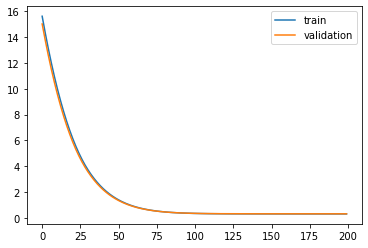

Time to train LSTM:  135.9181592464447
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 15.6553 - acc: 0.4508 - val_loss: 15.0561 - val_acc: 0.4790

Epoch 00001: val_loss improved from inf to 15.05610, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 14.9923 - acc: 0.4902 - val_loss: 14.4130 - val_acc: 0.5229

Epoch 00002: val_loss improved from 15.05610 to 14.41302, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 14.3516 - acc: 0.5333 - val_loss: 13.7920 - val_acc: 0.5653

Epoch 00003: val_loss improved from 14.41302 to 13.79200, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 13.7328 - acc: 0.5752 - val_loss: 13.1926 - val_acc: 0.6062

Epoch 00004: val_loss improved from 13.79200 to 13.19262, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 13.1356 - acc: 0.6156 - val_loss: 12.6144 - val_acc: 0.6418

Epoch 00005: val_loss improved from 13.19262 to 12.61439, saving model to Event_val_weight


Epoch 00045: val_loss improved from 1.85460 to 1.76650, saving model to Event_val_weights5.hdf5
Epoch 46/200
 - 1s - loss: 1.7562 - acc: 0.8847 - val_loss: 1.6830 - val_acc: 0.8864

Epoch 00046: val_loss improved from 1.76650 to 1.68301, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 1.6731 - acc: 0.8850 - val_loss: 1.6039 - val_acc: 0.8863

Epoch 00047: val_loss improved from 1.68301 to 1.60393, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 1.5944 - acc: 0.8853 - val_loss: 1.5290 - val_acc: 0.8863

Epoch 00048: val_loss improved from 1.60393 to 1.52904, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 1.5198 - acc: 0.8854 - val_loss: 1.4581 - val_acc: 0.8860

Epoch 00049: val_loss improved from 1.52904 to 1.45813, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 1.4492 - acc: 0.8855 - val_loss: 1.3910 - val_acc: 0.8861

Epoch 00050: val_loss improved from 1.45813 to 1.39099, saving model to Event_val_weights

 - 1s - loss: 0.3750 - acc: 0.8875 - val_loss: 0.3731 - val_acc: 0.8866

Epoch 00091: val_loss improved from 0.37852 to 0.37313, saving model to Event_val_weights5.hdf5
Epoch 92/200
 - 1s - loss: 0.3697 - acc: 0.8874 - val_loss: 0.3681 - val_acc: 0.8868

Epoch 00092: val_loss improved from 0.37313 to 0.36810, saving model to Event_val_weights5.hdf5
Epoch 93/200
 - 1s - loss: 0.3647 - acc: 0.8875 - val_loss: 0.3634 - val_acc: 0.8867

Epoch 00093: val_loss improved from 0.36810 to 0.36341, saving model to Event_val_weights5.hdf5
Epoch 94/200
 - 1s - loss: 0.3600 - acc: 0.8876 - val_loss: 0.3590 - val_acc: 0.8870

Epoch 00094: val_loss improved from 0.36341 to 0.35903, saving model to Event_val_weights5.hdf5
Epoch 95/200
 - 1s - loss: 0.3557 - acc: 0.8875 - val_loss: 0.3550 - val_acc: 0.8872

Epoch 00095: val_loss improved from 0.35903 to 0.35495, saving model to Event_val_weights5.hdf5
Epoch 96/200
 - 1s - loss: 0.3516 - acc: 0.8875 - val_loss: 0.3511 - val_acc: 0.8874

Epoch 00096: val_

 - 1s - loss: 0.3008 - acc: 0.8878 - val_loss: 0.3039 - val_acc: 0.8871

Epoch 00136: val_loss improved from 0.30411 to 0.30393, saving model to Event_val_weights5.hdf5
Epoch 137/200
 - 1s - loss: 0.3007 - acc: 0.8878 - val_loss: 0.3038 - val_acc: 0.8871

Epoch 00137: val_loss improved from 0.30393 to 0.30377, saving model to Event_val_weights5.hdf5
Epoch 138/200
 - 1s - loss: 0.3005 - acc: 0.8878 - val_loss: 0.3036 - val_acc: 0.8871

Epoch 00138: val_loss improved from 0.30377 to 0.30362, saving model to Event_val_weights5.hdf5
Epoch 139/200
 - 1s - loss: 0.3003 - acc: 0.8878 - val_loss: 0.3035 - val_acc: 0.8871

Epoch 00139: val_loss improved from 0.30362 to 0.30347, saving model to Event_val_weights5.hdf5
Epoch 140/200
 - 1s - loss: 0.3002 - acc: 0.8878 - val_loss: 0.3034 - val_acc: 0.8871

Epoch 00140: val_loss improved from 0.30347 to 0.30337, saving model to Event_val_weights5.hdf5
Epoch 141/200
 - 1s - loss: 0.3000 - acc: 0.8878 - val_loss: 0.3032 - val_acc: 0.8871

Epoch 00141:

 - 1s - loss: 0.2981 - acc: 0.8880 - val_loss: 0.3019 - val_acc: 0.8873

Epoch 00184: val_loss improved from 0.30187 to 0.30186, saving model to Event_val_weights5.hdf5
Epoch 185/200
 - 1s - loss: 0.2981 - acc: 0.8880 - val_loss: 0.3019 - val_acc: 0.8873

Epoch 00185: val_loss did not improve from 0.30186
Epoch 186/200
 - 1s - loss: 0.2981 - acc: 0.8881 - val_loss: 0.3018 - val_acc: 0.8873

Epoch 00186: val_loss improved from 0.30186 to 0.30184, saving model to Event_val_weights5.hdf5
Epoch 187/200
 - 1s - loss: 0.2981 - acc: 0.8881 - val_loss: 0.3020 - val_acc: 0.8877

Epoch 00187: val_loss did not improve from 0.30184
Epoch 188/200
 - 1s - loss: 0.2981 - acc: 0.8880 - val_loss: 0.3018 - val_acc: 0.8879

Epoch 00188: val_loss improved from 0.30184 to 0.30182, saving model to Event_val_weights5.hdf5
Epoch 189/200
 - 1s - loss: 0.2981 - acc: 0.8880 - val_loss: 0.3019 - val_acc: 0.8879

Epoch 00189: val_loss did not improve from 0.30182
Epoch 190/200
 - 1s - loss: 0.2981 - acc: 0.8880 - 

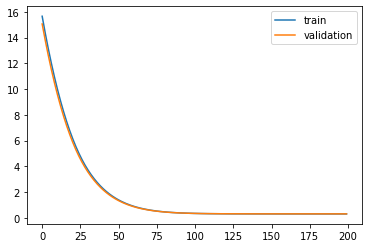

Time to train LSTM:  134.583735704422
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 17.3120 - acc: 0.7359 - val_loss: 12.7221 - val_acc: 0.8241

Epoch 00001: val_loss improved from inf to 12.72208, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 9.7848 - acc: 0.8554 - val_loss: 7.0055 - val_acc: 0.8799

Epoch 00002: val_loss improved from 12.72208 to 7.00546, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 5.3318 - acc: 0.8808 - val_loss: 3.7658 - val_acc: 0.8866

Epoch 00003: val_loss improved from 7.00546 to 3.76576, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 2.8569 - acc: 0.8847 - val_loss: 2.0133 - val_acc: 0.8879

Epoch 00004: val_loss improved from 3.76576 to 2.01330, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 1.5434 - acc: 0.8860 - val_loss: 1.1076 - val_acc: 0.8871

Epoch 00005: val_loss improved from 2.01330 to 1.10762, saving model to Event_val_weights1.hdf5
Epoch 6/


Epoch 00049: val_loss did not improve from 0.29456
Epoch 50/200
 - 1s - loss: 0.3019 - acc: 0.8869 - val_loss: 0.2948 - val_acc: 0.8887

Epoch 00050: val_loss did not improve from 0.29456
Epoch 51/200
 - 1s - loss: 0.3019 - acc: 0.8867 - val_loss: 0.2945 - val_acc: 0.8881

Epoch 00051: val_loss improved from 0.29456 to 0.29453, saving model to Event_val_weights1.hdf5
Epoch 52/200
 - 1s - loss: 0.3018 - acc: 0.8868 - val_loss: 0.2944 - val_acc: 0.8882

Epoch 00052: val_loss improved from 0.29453 to 0.29442, saving model to Event_val_weights1.hdf5
Epoch 53/200
 - 1s - loss: 0.3017 - acc: 0.8867 - val_loss: 0.2946 - val_acc: 0.8880

Epoch 00053: val_loss did not improve from 0.29442
Epoch 54/200
 - 1s - loss: 0.3016 - acc: 0.8869 - val_loss: 0.2943 - val_acc: 0.8878

Epoch 00054: val_loss improved from 0.29442 to 0.29428, saving model to Event_val_weights1.hdf5
Epoch 55/200
 - 1s - loss: 0.3015 - acc: 0.8868 - val_loss: 0.2944 - val_acc: 0.8878

Epoch 00055: val_loss did not improve from


Epoch 00105: val_loss did not improve from 0.29365
Epoch 106/200
 - 1s - loss: 0.3002 - acc: 0.8873 - val_loss: 0.2939 - val_acc: 0.8894

Epoch 00106: val_loss did not improve from 0.29365
Epoch 107/200
 - 1s - loss: 0.3002 - acc: 0.8872 - val_loss: 0.2946 - val_acc: 0.8888

Epoch 00107: val_loss did not improve from 0.29365
Epoch 108/200
 - 1s - loss: 0.3000 - acc: 0.8874 - val_loss: 0.2942 - val_acc: 0.8891

Epoch 00108: val_loss did not improve from 0.29365
Epoch 109/200
 - 1s - loss: 0.3001 - acc: 0.8872 - val_loss: 0.2941 - val_acc: 0.8886

Epoch 00109: val_loss did not improve from 0.29365
Epoch 110/200
 - 1s - loss: 0.3002 - acc: 0.8877 - val_loss: 0.2947 - val_acc: 0.8889

Epoch 00110: val_loss did not improve from 0.29365
Epoch 111/200
 - 1s - loss: 0.3002 - acc: 0.8875 - val_loss: 0.2947 - val_acc: 0.8886

Epoch 00111: val_loss did not improve from 0.29365
Epoch 112/200
 - 1s - loss: 0.3001 - acc: 0.8877 - val_loss: 0.2950 - val_acc: 0.8887

Epoch 00112: val_loss did not imp

 - 1s - loss: 0.2990 - acc: 0.8884 - val_loss: 0.2958 - val_acc: 0.8897

Epoch 00165: val_loss did not improve from 0.29365
Epoch 166/200
 - 1s - loss: 0.2993 - acc: 0.8885 - val_loss: 0.2959 - val_acc: 0.8888

Epoch 00166: val_loss did not improve from 0.29365
Epoch 167/200
 - 1s - loss: 0.2988 - acc: 0.8890 - val_loss: 0.2950 - val_acc: 0.8891

Epoch 00167: val_loss did not improve from 0.29365
Epoch 168/200
 - 1s - loss: 0.2987 - acc: 0.8888 - val_loss: 0.2952 - val_acc: 0.8886

Epoch 00168: val_loss did not improve from 0.29365
Epoch 169/200
 - 1s - loss: 0.2985 - acc: 0.8883 - val_loss: 0.2940 - val_acc: 0.8893

Epoch 00169: val_loss did not improve from 0.29365
Epoch 170/200
 - 1s - loss: 0.2986 - acc: 0.8882 - val_loss: 0.2953 - val_acc: 0.8897

Epoch 00170: val_loss did not improve from 0.29365
Epoch 171/200
 - 1s - loss: 0.2985 - acc: 0.8886 - val_loss: 0.2957 - val_acc: 0.8896

Epoch 00171: val_loss did not improve from 0.29365
Epoch 172/200
 - 1s - loss: 0.2985 - acc: 0.8885

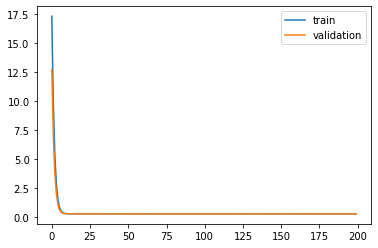

Time to train LSTM:  145.32727646827698


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8f12330080>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 17.3236 - acc: 0.7159 - val_loss: 12.7437 - val_acc: 0.8080

Epoch 00001: val_loss improved from inf to 12.74366, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 9.7948 - acc: 0.8538 - val_loss: 7.0294 - val_acc: 0.8759

Epoch 00002: val_loss improved from 12.74366 to 7.02941, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 5.3414 - acc: 0.8808 - val_loss: 3.7867 - val_acc: 0.8801

Epoch 00003: val_loss improved from 7.02941 to 3.78671, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 2.8629 - acc: 0.8853 - val_loss: 2.0318 - val_acc: 0.8818

Epoch 00004: val_loss improved from 3.78671 to 2.03181, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 1.5469 - acc: 0.8868 - val_loss: 1.1242 - val_acc: 0.8818

Epoch 00005: val_loss improved from 2.03181 to 1.12421, saving model to Event_val_weights2.hdf5
Epoch 6/200
 - 1s - loss: 0.8798 - acc: 0.8862


Epoch 00050: val_loss improved from 0.30731 to 0.30731, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.3013 - acc: 0.8873 - val_loss: 0.3073 - val_acc: 0.8824

Epoch 00051: val_loss improved from 0.30731 to 0.30729, saving model to Event_val_weights2.hdf5
Epoch 52/200
 - 1s - loss: 0.3010 - acc: 0.8873 - val_loss: 0.3073 - val_acc: 0.8830

Epoch 00052: val_loss improved from 0.30729 to 0.30726, saving model to Event_val_weights2.hdf5
Epoch 53/200
 - 1s - loss: 0.3011 - acc: 0.8874 - val_loss: 0.3072 - val_acc: 0.8829

Epoch 00053: val_loss improved from 0.30726 to 0.30716, saving model to Event_val_weights2.hdf5
Epoch 54/200
 - 1s - loss: 0.3009 - acc: 0.8873 - val_loss: 0.3071 - val_acc: 0.8828

Epoch 00054: val_loss improved from 0.30716 to 0.30714, saving model to Event_val_weights2.hdf5
Epoch 55/200
 - 1s - loss: 0.3010 - acc: 0.8875 - val_loss: 0.3072 - val_acc: 0.8824

Epoch 00055: val_loss did not improve from 0.30714
Epoch 56/200
 - 1s - loss: 0.3008 - ac


Epoch 00104: val_loss did not improve from 0.30668
Epoch 105/200
 - 1s - loss: 0.2988 - acc: 0.8884 - val_loss: 0.3075 - val_acc: 0.8839

Epoch 00105: val_loss did not improve from 0.30668
Epoch 106/200
 - 1s - loss: 0.2988 - acc: 0.8882 - val_loss: 0.3075 - val_acc: 0.8834

Epoch 00106: val_loss did not improve from 0.30668
Epoch 107/200
 - 1s - loss: 0.2989 - acc: 0.8881 - val_loss: 0.3075 - val_acc: 0.8834

Epoch 00107: val_loss did not improve from 0.30668
Epoch 108/200
 - 1s - loss: 0.2988 - acc: 0.8882 - val_loss: 0.3079 - val_acc: 0.8839

Epoch 00108: val_loss did not improve from 0.30668
Epoch 109/200
 - 1s - loss: 0.2989 - acc: 0.8883 - val_loss: 0.3078 - val_acc: 0.8836

Epoch 00109: val_loss did not improve from 0.30668
Epoch 110/200
 - 1s - loss: 0.2988 - acc: 0.8882 - val_loss: 0.3079 - val_acc: 0.8838

Epoch 00110: val_loss did not improve from 0.30668
Epoch 111/200
 - 1s - loss: 0.2988 - acc: 0.8883 - val_loss: 0.3078 - val_acc: 0.8830

Epoch 00111: val_loss did not imp

 - 1s - loss: 0.2970 - acc: 0.8889 - val_loss: 0.3095 - val_acc: 0.8834

Epoch 00164: val_loss did not improve from 0.30668
Epoch 165/200
 - 1s - loss: 0.2972 - acc: 0.8887 - val_loss: 0.3097 - val_acc: 0.8826

Epoch 00165: val_loss did not improve from 0.30668
Epoch 166/200
 - 1s - loss: 0.2970 - acc: 0.8889 - val_loss: 0.3095 - val_acc: 0.8838

Epoch 00166: val_loss did not improve from 0.30668
Epoch 167/200
 - 1s - loss: 0.2971 - acc: 0.8891 - val_loss: 0.3101 - val_acc: 0.8833

Epoch 00167: val_loss did not improve from 0.30668
Epoch 168/200
 - 1s - loss: 0.2972 - acc: 0.8886 - val_loss: 0.3097 - val_acc: 0.8832

Epoch 00168: val_loss did not improve from 0.30668
Epoch 169/200
 - 1s - loss: 0.2970 - acc: 0.8888 - val_loss: 0.3103 - val_acc: 0.8833

Epoch 00169: val_loss did not improve from 0.30668
Epoch 170/200
 - 1s - loss: 0.2970 - acc: 0.8887 - val_loss: 0.3097 - val_acc: 0.8831

Epoch 00170: val_loss did not improve from 0.30668
Epoch 171/200
 - 1s - loss: 0.2972 - acc: 0.8889

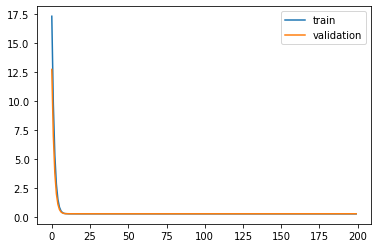

Time to train LSTM:  156.1003074645996
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 17.2305 - acc: 0.6985 - val_loss: 12.6727 - val_acc: 0.7959

Epoch 00001: val_loss improved from inf to 12.67267, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 9.7336 - acc: 0.8443 - val_loss: 6.9710 - val_acc: 0.8777

Epoch 00002: val_loss improved from 12.67267 to 6.97099, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 5.2966 - acc: 0.8813 - val_loss: 3.7502 - val_acc: 0.8857

Epoch 00003: val_loss improved from 6.97099 to 3.75023, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 2.8377 - acc: 0.8847 - val_loss: 2.0096 - val_acc: 0.8862

Epoch 00004: val_loss improved from 3.75023 to 2.00963, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 1.5343 - acc: 0.8855 - val_loss: 1.1100 - val_acc: 0.8863

Epoch 00005: val_loss improved from 2.00963 to 1.11002, saving model to Event_val_weights3.hdf5
Epoch 6

 - 1s - loss: 0.3017 - acc: 0.8868 - val_loss: 0.3034 - val_acc: 0.8877

Epoch 00050: val_loss improved from 0.30340 to 0.30339, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3016 - acc: 0.8867 - val_loss: 0.3034 - val_acc: 0.8881

Epoch 00051: val_loss did not improve from 0.30339
Epoch 52/200
 - 1s - loss: 0.3016 - acc: 0.8868 - val_loss: 0.3034 - val_acc: 0.8881

Epoch 00052: val_loss improved from 0.30339 to 0.30338, saving model to Event_val_weights3.hdf5
Epoch 53/200
 - 1s - loss: 0.3016 - acc: 0.8867 - val_loss: 0.3034 - val_acc: 0.8882

Epoch 00053: val_loss improved from 0.30338 to 0.30336, saving model to Event_val_weights3.hdf5
Epoch 54/200
 - 1s - loss: 0.3014 - acc: 0.8868 - val_loss: 0.3033 - val_acc: 0.8882

Epoch 00054: val_loss improved from 0.30336 to 0.30330, saving model to Event_val_weights3.hdf5
Epoch 55/200
 - 1s - loss: 0.3014 - acc: 0.8868 - val_loss: 0.3034 - val_acc: 0.8882

Epoch 00055: val_loss did not improve from 0.30330
Epoch 56/20

 - 1s - loss: 0.2996 - acc: 0.8880 - val_loss: 0.3043 - val_acc: 0.8880

Epoch 00107: val_loss did not improve from 0.30295
Epoch 108/200
 - 1s - loss: 0.2997 - acc: 0.8880 - val_loss: 0.3042 - val_acc: 0.8873

Epoch 00108: val_loss did not improve from 0.30295
Epoch 109/200
 - 1s - loss: 0.2995 - acc: 0.8876 - val_loss: 0.3045 - val_acc: 0.8871

Epoch 00109: val_loss did not improve from 0.30295
Epoch 110/200
 - 1s - loss: 0.2996 - acc: 0.8875 - val_loss: 0.3043 - val_acc: 0.8880

Epoch 00110: val_loss did not improve from 0.30295
Epoch 111/200
 - 1s - loss: 0.2994 - acc: 0.8877 - val_loss: 0.3040 - val_acc: 0.8877

Epoch 00111: val_loss did not improve from 0.30295
Epoch 112/200
 - 1s - loss: 0.2993 - acc: 0.8877 - val_loss: 0.3046 - val_acc: 0.8877

Epoch 00112: val_loss did not improve from 0.30295
Epoch 113/200
 - 1s - loss: 0.2993 - acc: 0.8878 - val_loss: 0.3043 - val_acc: 0.8874

Epoch 00113: val_loss did not improve from 0.30295
Epoch 114/200
 - 1s - loss: 0.2994 - acc: 0.8880


Epoch 00166: val_loss did not improve from 0.30295
Epoch 167/200
 - 1s - loss: 0.2982 - acc: 0.8885 - val_loss: 0.3054 - val_acc: 0.8873

Epoch 00167: val_loss did not improve from 0.30295
Epoch 168/200
 - 1s - loss: 0.2978 - acc: 0.8884 - val_loss: 0.3055 - val_acc: 0.8879

Epoch 00168: val_loss did not improve from 0.30295
Epoch 169/200
 - 1s - loss: 0.2978 - acc: 0.8885 - val_loss: 0.3056 - val_acc: 0.8869

Epoch 00169: val_loss did not improve from 0.30295
Epoch 170/200
 - 1s - loss: 0.2981 - acc: 0.8886 - val_loss: 0.3059 - val_acc: 0.8871

Epoch 00170: val_loss did not improve from 0.30295
Epoch 171/200
 - 1s - loss: 0.2981 - acc: 0.8883 - val_loss: 0.3054 - val_acc: 0.8863

Epoch 00171: val_loss did not improve from 0.30295
Epoch 172/200
 - 1s - loss: 0.2978 - acc: 0.8888 - val_loss: 0.3053 - val_acc: 0.8863

Epoch 00172: val_loss did not improve from 0.30295
Epoch 173/200
 - 1s - loss: 0.2978 - acc: 0.8888 - val_loss: 0.3052 - val_acc: 0.8870

Epoch 00173: val_loss did not imp

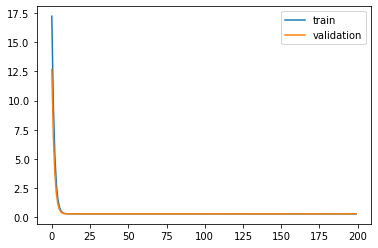

Time to train LSTM:  146.4622483253479
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 17.3220 - acc: 0.7441 - val_loss: 12.7424 - val_acc: 0.8202

Epoch 00001: val_loss improved from inf to 12.74240, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 9.7909 - acc: 0.8582 - val_loss: 7.0216 - val_acc: 0.8757

Epoch 00002: val_loss improved from 12.74240 to 7.02160, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 5.3318 - acc: 0.8831 - val_loss: 3.7771 - val_acc: 0.8813

Epoch 00003: val_loss improved from 7.02160 to 3.77706, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 2.8561 - acc: 0.8853 - val_loss: 2.0252 - val_acc: 0.8827

Epoch 00004: val_loss improved from 3.77706 to 2.02518, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 1.5428 - acc: 0.8864 - val_loss: 1.1195 - val_acc: 0.8831

Epoch 00005: val_loss improved from 2.02518 to 1.11949, saving model to Event_val_weights4.hdf5
Epoch 6


Epoch 00047: val_loss improved from 0.30715 to 0.30712, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.3002 - acc: 0.8873 - val_loss: 0.3072 - val_acc: 0.8833

Epoch 00048: val_loss did not improve from 0.30712
Epoch 49/200
 - 1s - loss: 0.3003 - acc: 0.8873 - val_loss: 0.3071 - val_acc: 0.8832

Epoch 00049: val_loss improved from 0.30712 to 0.30710, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3002 - acc: 0.8873 - val_loss: 0.3071 - val_acc: 0.8832

Epoch 00050: val_loss improved from 0.30710 to 0.30709, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.3001 - acc: 0.8873 - val_loss: 0.3071 - val_acc: 0.8830

Epoch 00051: val_loss did not improve from 0.30709
Epoch 52/200
 - 1s - loss: 0.3001 - acc: 0.8874 - val_loss: 0.3070 - val_acc: 0.8832

Epoch 00052: val_loss improved from 0.30709 to 0.30702, saving model to Event_val_weights4.hdf5
Epoch 53/200
 - 1s - loss: 0.3000 - acc: 0.8874 - val_loss: 0.3069 - val_acc: 0.883


Epoch 00101: val_loss did not improve from 0.30581
Epoch 102/200
 - 1s - loss: 0.2992 - acc: 0.8881 - val_loss: 0.3059 - val_acc: 0.8837

Epoch 00102: val_loss did not improve from 0.30581
Epoch 103/200
 - 1s - loss: 0.2990 - acc: 0.8879 - val_loss: 0.3062 - val_acc: 0.8852

Epoch 00103: val_loss did not improve from 0.30581
Epoch 104/200
 - 1s - loss: 0.2990 - acc: 0.8879 - val_loss: 0.3059 - val_acc: 0.8841

Epoch 00104: val_loss did not improve from 0.30581
Epoch 105/200
 - 1s - loss: 0.2990 - acc: 0.8880 - val_loss: 0.3060 - val_acc: 0.8852

Epoch 00105: val_loss did not improve from 0.30581
Epoch 106/200
 - 1s - loss: 0.2990 - acc: 0.8881 - val_loss: 0.3060 - val_acc: 0.8846

Epoch 00106: val_loss did not improve from 0.30581
Epoch 107/200
 - 1s - loss: 0.2990 - acc: 0.8879 - val_loss: 0.3060 - val_acc: 0.8844

Epoch 00107: val_loss did not improve from 0.30581
Epoch 108/200
 - 1s - loss: 0.2989 - acc: 0.8881 - val_loss: 0.3060 - val_acc: 0.8843

Epoch 00108: val_loss did not imp

 - 1s - loss: 0.2978 - acc: 0.8884 - val_loss: 0.3073 - val_acc: 0.8848

Epoch 00161: val_loss did not improve from 0.30575
Epoch 162/200
 - 1s - loss: 0.2979 - acc: 0.8888 - val_loss: 0.3073 - val_acc: 0.8839

Epoch 00162: val_loss did not improve from 0.30575
Epoch 163/200
 - 1s - loss: 0.2977 - acc: 0.8887 - val_loss: 0.3074 - val_acc: 0.8847

Epoch 00163: val_loss did not improve from 0.30575
Epoch 164/200
 - 1s - loss: 0.2977 - acc: 0.8888 - val_loss: 0.3077 - val_acc: 0.8837

Epoch 00164: val_loss did not improve from 0.30575
Epoch 165/200
 - 1s - loss: 0.2978 - acc: 0.8889 - val_loss: 0.3078 - val_acc: 0.8848

Epoch 00165: val_loss did not improve from 0.30575
Epoch 166/200
 - 1s - loss: 0.2978 - acc: 0.8888 - val_loss: 0.3076 - val_acc: 0.8844

Epoch 00166: val_loss did not improve from 0.30575
Epoch 167/200
 - 1s - loss: 0.2976 - acc: 0.8890 - val_loss: 0.3076 - val_acc: 0.8842

Epoch 00167: val_loss did not improve from 0.30575
Epoch 168/200
 - 1s - loss: 0.2976 - acc: 0.8887

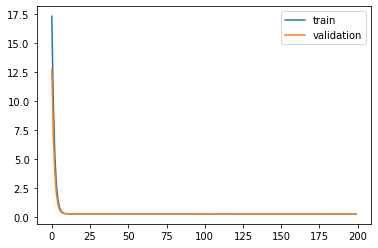

Time to train LSTM:  146.09355330467224
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 17.2664 - acc: 0.7054 - val_loss: 12.6930 - val_acc: 0.8200

Epoch 00001: val_loss improved from inf to 12.69302, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 9.7534 - acc: 0.8553 - val_loss: 6.9910 - val_acc: 0.8780

Epoch 00002: val_loss improved from 12.69302 to 6.99097, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 5.3169 - acc: 0.8815 - val_loss: 3.7656 - val_acc: 0.8829

Epoch 00003: val_loss improved from 6.99097 to 3.76564, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 2.8512 - acc: 0.8845 - val_loss: 2.0187 - val_acc: 0.8849

Epoch 00004: val_loss improved from 3.76564 to 2.01869, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 1.5406 - acc: 0.8856 - val_loss: 1.1132 - val_acc: 0.8851

Epoch 00005: val_loss improved from 2.01869 to 1.11318, saving model to Event_val_weights5.hdf5
Epoch 

 - 1s - loss: 0.3010 - acc: 0.8869 - val_loss: 0.3025 - val_acc: 0.8878

Epoch 00048: val_loss improved from 0.30254 to 0.30246, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.3010 - acc: 0.8869 - val_loss: 0.3026 - val_acc: 0.8878

Epoch 00049: val_loss did not improve from 0.30246
Epoch 50/200
 - 1s - loss: 0.3009 - acc: 0.8868 - val_loss: 0.3024 - val_acc: 0.8879

Epoch 00050: val_loss improved from 0.30246 to 0.30238, saving model to Event_val_weights5.hdf5
Epoch 51/200
 - 1s - loss: 0.3009 - acc: 0.8869 - val_loss: 0.3025 - val_acc: 0.8874

Epoch 00051: val_loss did not improve from 0.30238
Epoch 52/200
 - 1s - loss: 0.3008 - acc: 0.8869 - val_loss: 0.3023 - val_acc: 0.8877

Epoch 00052: val_loss improved from 0.30238 to 0.30231, saving model to Event_val_weights5.hdf5
Epoch 53/200
 - 1s - loss: 0.3007 - acc: 0.8869 - val_loss: 0.3024 - val_acc: 0.8878

Epoch 00053: val_loss did not improve from 0.30231
Epoch 54/200
 - 1s - loss: 0.3006 - acc: 0.8869 - val_lo


Epoch 00103: val_loss did not improve from 0.30161
Epoch 104/200
 - 1s - loss: 0.2989 - acc: 0.8878 - val_loss: 0.3020 - val_acc: 0.8873

Epoch 00104: val_loss did not improve from 0.30161
Epoch 105/200
 - 1s - loss: 0.2989 - acc: 0.8879 - val_loss: 0.3023 - val_acc: 0.8874

Epoch 00105: val_loss did not improve from 0.30161
Epoch 106/200
 - 1s - loss: 0.2988 - acc: 0.8880 - val_loss: 0.3020 - val_acc: 0.8874

Epoch 00106: val_loss did not improve from 0.30161
Epoch 107/200
 - 1s - loss: 0.2988 - acc: 0.8878 - val_loss: 0.3025 - val_acc: 0.8882

Epoch 00107: val_loss did not improve from 0.30161
Epoch 108/200
 - 1s - loss: 0.2987 - acc: 0.8878 - val_loss: 0.3022 - val_acc: 0.8880

Epoch 00108: val_loss did not improve from 0.30161
Epoch 109/200
 - 1s - loss: 0.2987 - acc: 0.8877 - val_loss: 0.3027 - val_acc: 0.8877

Epoch 00109: val_loss did not improve from 0.30161
Epoch 110/200
 - 1s - loss: 0.2986 - acc: 0.8876 - val_loss: 0.3024 - val_acc: 0.8876

Epoch 00110: val_loss did not imp

 - 1s - loss: 0.2977 - acc: 0.8892 - val_loss: 0.3044 - val_acc: 0.8869

Epoch 00163: val_loss did not improve from 0.30161
Epoch 164/200
 - 1s - loss: 0.2976 - acc: 0.8892 - val_loss: 0.3050 - val_acc: 0.8867

Epoch 00164: val_loss did not improve from 0.30161
Epoch 165/200
 - 1s - loss: 0.2977 - acc: 0.8888 - val_loss: 0.3049 - val_acc: 0.8869

Epoch 00165: val_loss did not improve from 0.30161
Epoch 166/200
 - 1s - loss: 0.2977 - acc: 0.8892 - val_loss: 0.3059 - val_acc: 0.8870

Epoch 00166: val_loss did not improve from 0.30161
Epoch 167/200
 - 1s - loss: 0.2979 - acc: 0.8892 - val_loss: 0.3051 - val_acc: 0.8868

Epoch 00167: val_loss did not improve from 0.30161
Epoch 168/200
 - 1s - loss: 0.2977 - acc: 0.8888 - val_loss: 0.3057 - val_acc: 0.8874

Epoch 00168: val_loss did not improve from 0.30161
Epoch 169/200
 - 1s - loss: 0.2977 - acc: 0.8890 - val_loss: 0.3055 - val_acc: 0.8876

Epoch 00169: val_loss did not improve from 0.30161
Epoch 170/200
 - 1s - loss: 0.2977 - acc: 0.8889

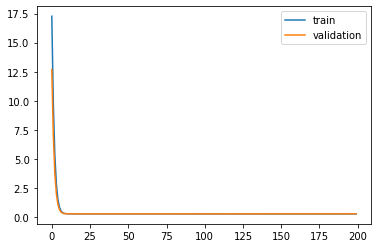

Time to train LSTM:  145.48066401481628
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 19.5912 - acc: 0.6758 - val_loss: 16.8330 - val_acc: 0.7603

Epoch 00001: val_loss improved from inf to 16.83299, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 14.9209 - acc: 0.7801 - val_loss: 12.6899 - val_acc: 0.8162

Epoch 00002: val_loss improved from 16.83299 to 12.68988, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 11.1834 - acc: 0.8347 - val_loss: 9.4429 - val_acc: 0.8659

Epoch 00003: val_loss improved from 12.68988 to 9.44287, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 8.3008 - acc: 0.8729 - val_loss: 6.9861 - val_acc: 0.8817

Epoch 00004: val_loss improved from 9.44287 to 6.98608, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 6.1250 - acc: 0.8809 - val_loss: 5.1333 - val_acc: 0.8866

Epoch 00005: val_loss improved from 6.98608 to 5.13333, saving model to Event_val_weights1.hdf5
E


Epoch 00047: val_loss improved from 0.29483 to 0.29477, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3012 - acc: 0.8867 - val_loss: 0.2950 - val_acc: 0.8882

Epoch 00048: val_loss did not improve from 0.29477
Epoch 49/200
 - 1s - loss: 0.3012 - acc: 0.8866 - val_loss: 0.2946 - val_acc: 0.8884

Epoch 00049: val_loss improved from 0.29477 to 0.29464, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.3012 - acc: 0.8866 - val_loss: 0.2951 - val_acc: 0.8883

Epoch 00050: val_loss did not improve from 0.29464
Epoch 51/200
 - 1s - loss: 0.3012 - acc: 0.8868 - val_loss: 0.2945 - val_acc: 0.8882

Epoch 00051: val_loss improved from 0.29464 to 0.29455, saving model to Event_val_weights1.hdf5
Epoch 52/200
 - 1s - loss: 0.3012 - acc: 0.8867 - val_loss: 0.2950 - val_acc: 0.8881

Epoch 00052: val_loss did not improve from 0.29455
Epoch 53/200
 - 1s - loss: 0.3012 - acc: 0.8868 - val_loss: 0.2946 - val_acc: 0.8881

Epoch 00053: val_loss did not improve from


Epoch 00101: val_loss did not improve from 0.29369
Epoch 102/200
 - 1s - loss: 0.2998 - acc: 0.8870 - val_loss: 0.2938 - val_acc: 0.8879

Epoch 00102: val_loss did not improve from 0.29369
Epoch 103/200
 - 1s - loss: 0.2998 - acc: 0.8869 - val_loss: 0.2938 - val_acc: 0.8880

Epoch 00103: val_loss did not improve from 0.29369
Epoch 104/200
 - 1s - loss: 0.2997 - acc: 0.8869 - val_loss: 0.2937 - val_acc: 0.8881

Epoch 00104: val_loss did not improve from 0.29369
Epoch 105/200
 - 1s - loss: 0.2997 - acc: 0.8870 - val_loss: 0.2937 - val_acc: 0.8881

Epoch 00105: val_loss did not improve from 0.29369
Epoch 106/200
 - 1s - loss: 0.2996 - acc: 0.8870 - val_loss: 0.2938 - val_acc: 0.8881

Epoch 00106: val_loss did not improve from 0.29369
Epoch 107/200
 - 1s - loss: 0.2996 - acc: 0.8870 - val_loss: 0.2937 - val_acc: 0.8882

Epoch 00107: val_loss improved from 0.29369 to 0.29365, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.2996 - acc: 0.8871 - val_loss: 0.2940 - val_a

 - 1s - loss: 0.2977 - acc: 0.8882 - val_loss: 0.2954 - val_acc: 0.8880

Epoch 00160: val_loss did not improve from 0.29356
Epoch 161/200
 - 1s - loss: 0.2976 - acc: 0.8882 - val_loss: 0.2957 - val_acc: 0.8876

Epoch 00161: val_loss did not improve from 0.29356
Epoch 162/200
 - 1s - loss: 0.2977 - acc: 0.8883 - val_loss: 0.2961 - val_acc: 0.8874

Epoch 00162: val_loss did not improve from 0.29356
Epoch 163/200
 - 1s - loss: 0.2976 - acc: 0.8883 - val_loss: 0.2956 - val_acc: 0.8880

Epoch 00163: val_loss did not improve from 0.29356
Epoch 164/200
 - 1s - loss: 0.2975 - acc: 0.8884 - val_loss: 0.2957 - val_acc: 0.8878

Epoch 00164: val_loss did not improve from 0.29356
Epoch 165/200
 - 1s - loss: 0.2974 - acc: 0.8885 - val_loss: 0.2963 - val_acc: 0.8877

Epoch 00165: val_loss did not improve from 0.29356
Epoch 166/200
 - 1s - loss: 0.2974 - acc: 0.8886 - val_loss: 0.2962 - val_acc: 0.8879

Epoch 00166: val_loss did not improve from 0.29356
Epoch 167/200
 - 1s - loss: 0.2974 - acc: 0.8887

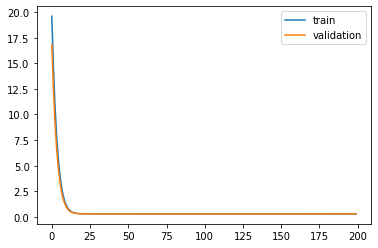

Time to train LSTM:  153.1625120639801
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 19.7770 - acc: 0.5652 - val_loss: 16.9945 - val_acc: 0.7359

Epoch 00001: val_loss improved from inf to 16.99449, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 15.0572 - acc: 0.7779 - val_loss: 12.8279 - val_acc: 0.8034

Epoch 00002: val_loss improved from 16.99449 to 12.82789, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 11.2946 - acc: 0.8269 - val_loss: 9.5551 - val_acc: 0.8511

Epoch 00003: val_loss improved from 12.82789 to 9.55509, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 8.3809 - acc: 0.8671 - val_loss: 7.0659 - val_acc: 0.8761

Epoch 00004: val_loss improved from 9.55509 to 7.06593, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 6.1828 - acc: 0.8792 - val_loss: 5.1987 - val_acc: 0.8801

Epoch 00005: val_loss improved from 7.06593 to 5.19866, saving model to Event_val_weights2.hdf5
Ep

 - 1s - loss: 0.2998 - acc: 0.8877 - val_loss: 0.3056 - val_acc: 0.8844

Epoch 00046: val_loss improved from 0.30566 to 0.30564, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.2997 - acc: 0.8876 - val_loss: 0.3057 - val_acc: 0.8843

Epoch 00047: val_loss did not improve from 0.30564
Epoch 48/200
 - 1s - loss: 0.2997 - acc: 0.8876 - val_loss: 0.3056 - val_acc: 0.8846

Epoch 00048: val_loss improved from 0.30564 to 0.30557, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.2996 - acc: 0.8877 - val_loss: 0.3056 - val_acc: 0.8843

Epoch 00049: val_loss did not improve from 0.30557
Epoch 50/200
 - 1s - loss: 0.2996 - acc: 0.8877 - val_loss: 0.3055 - val_acc: 0.8844

Epoch 00050: val_loss improved from 0.30557 to 0.30550, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.2996 - acc: 0.8877 - val_loss: 0.3056 - val_acc: 0.8843

Epoch 00051: val_loss did not improve from 0.30550
Epoch 52/200
 - 1s - loss: 0.2996 - acc: 0.8877 - val_lo

 - 1s - loss: 0.2983 - acc: 0.8880 - val_loss: 0.3049 - val_acc: 0.8849

Epoch 00099: val_loss did not improve from 0.30471
Epoch 100/200
 - 1s - loss: 0.2984 - acc: 0.8880 - val_loss: 0.3047 - val_acc: 0.8849

Epoch 00100: val_loss improved from 0.30471 to 0.30467, saving model to Event_val_weights2.hdf5
Epoch 101/200
 - 1s - loss: 0.2982 - acc: 0.8880 - val_loss: 0.3050 - val_acc: 0.8847

Epoch 00101: val_loss did not improve from 0.30467
Epoch 102/200
 - 1s - loss: 0.2982 - acc: 0.8881 - val_loss: 0.3046 - val_acc: 0.8848

Epoch 00102: val_loss improved from 0.30467 to 0.30460, saving model to Event_val_weights2.hdf5
Epoch 103/200
 - 1s - loss: 0.2982 - acc: 0.8880 - val_loss: 0.3049 - val_acc: 0.8847

Epoch 00103: val_loss did not improve from 0.30460
Epoch 104/200
 - 1s - loss: 0.2981 - acc: 0.8881 - val_loss: 0.3046 - val_acc: 0.8851

Epoch 00104: val_loss did not improve from 0.30460
Epoch 105/200
 - 1s - loss: 0.2981 - acc: 0.8880 - val_loss: 0.3049 - val_acc: 0.8850

Epoch 001


Epoch 00157: val_loss did not improve from 0.30457
Epoch 158/200
 - 1s - loss: 0.2954 - acc: 0.8897 - val_loss: 0.3091 - val_acc: 0.8840

Epoch 00158: val_loss did not improve from 0.30457
Epoch 159/200
 - 1s - loss: 0.2954 - acc: 0.8898 - val_loss: 0.3087 - val_acc: 0.8842

Epoch 00159: val_loss did not improve from 0.30457
Epoch 160/200
 - 1s - loss: 0.2954 - acc: 0.8896 - val_loss: 0.3097 - val_acc: 0.8833

Epoch 00160: val_loss did not improve from 0.30457
Epoch 161/200
 - 1s - loss: 0.2954 - acc: 0.8900 - val_loss: 0.3077 - val_acc: 0.8843

Epoch 00161: val_loss did not improve from 0.30457
Epoch 162/200
 - 1s - loss: 0.2956 - acc: 0.8895 - val_loss: 0.3084 - val_acc: 0.8854

Epoch 00162: val_loss did not improve from 0.30457
Epoch 163/200
 - 1s - loss: 0.2953 - acc: 0.8896 - val_loss: 0.3096 - val_acc: 0.8849

Epoch 00163: val_loss did not improve from 0.30457
Epoch 164/200
 - 1s - loss: 0.2955 - acc: 0.8898 - val_loss: 0.3085 - val_acc: 0.8839

Epoch 00164: val_loss did not imp

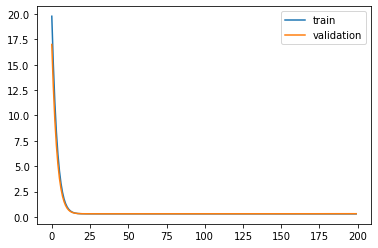

Time to train LSTM:  154.30138635635376
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 19.5416 - acc: 0.6761 - val_loss: 16.7969 - val_acc: 0.7544

Epoch 00001: val_loss improved from inf to 16.79688, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 14.8858 - acc: 0.7843 - val_loss: 12.6772 - val_acc: 0.8100

Epoch 00002: val_loss improved from 16.79688 to 12.67718, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 11.1621 - acc: 0.8397 - val_loss: 9.4353 - val_acc: 0.8641

Epoch 00003: val_loss improved from 12.67718 to 9.43534, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 8.2787 - acc: 0.8741 - val_loss: 6.9775 - val_acc: 0.8831

Epoch 00004: val_loss improved from 9.43534 to 6.97745, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 6.1070 - acc: 0.8819 - val_loss: 5.1294 - val_acc: 0.8839

Epoch 00005: val_loss improved from 6.97745 to 5.12937, saving model to Event_val_weights3.hdf5
E

 - 1s - loss: 0.2996 - acc: 0.8870 - val_loss: 0.3031 - val_acc: 0.8886

Epoch 00049: val_loss did not improve from 0.30299
Epoch 50/200
 - 1s - loss: 0.2996 - acc: 0.8870 - val_loss: 0.3030 - val_acc: 0.8884

Epoch 00050: val_loss did not improve from 0.30299
Epoch 51/200
 - 1s - loss: 0.2995 - acc: 0.8870 - val_loss: 0.3031 - val_acc: 0.8886

Epoch 00051: val_loss did not improve from 0.30299
Epoch 52/200
 - 1s - loss: 0.2995 - acc: 0.8870 - val_loss: 0.3030 - val_acc: 0.8886

Epoch 00052: val_loss did not improve from 0.30299
Epoch 53/200
 - 1s - loss: 0.2995 - acc: 0.8870 - val_loss: 0.3031 - val_acc: 0.8884

Epoch 00053: val_loss did not improve from 0.30299
Epoch 54/200
 - 1s - loss: 0.2994 - acc: 0.8870 - val_loss: 0.3031 - val_acc: 0.8883

Epoch 00054: val_loss did not improve from 0.30299
Epoch 55/200
 - 1s - loss: 0.2994 - acc: 0.8870 - val_loss: 0.3031 - val_acc: 0.8882

Epoch 00055: val_loss did not improve from 0.30299
Epoch 56/200
 - 1s - loss: 0.2993 - acc: 0.8870 - val_

 - 1s - loss: 0.2977 - acc: 0.8877 - val_loss: 0.3036 - val_acc: 0.8882

Epoch 00109: val_loss did not improve from 0.30299
Epoch 110/200
 - 1s - loss: 0.2977 - acc: 0.8878 - val_loss: 0.3039 - val_acc: 0.8886

Epoch 00110: val_loss did not improve from 0.30299
Epoch 111/200
 - 1s - loss: 0.2978 - acc: 0.8877 - val_loss: 0.3038 - val_acc: 0.8882

Epoch 00111: val_loss did not improve from 0.30299
Epoch 112/200
 - 1s - loss: 0.2977 - acc: 0.8878 - val_loss: 0.3040 - val_acc: 0.8887

Epoch 00112: val_loss did not improve from 0.30299
Epoch 113/200
 - 1s - loss: 0.2977 - acc: 0.8878 - val_loss: 0.3038 - val_acc: 0.8886

Epoch 00113: val_loss did not improve from 0.30299
Epoch 114/200
 - 1s - loss: 0.2976 - acc: 0.8878 - val_loss: 0.3040 - val_acc: 0.8888

Epoch 00114: val_loss did not improve from 0.30299
Epoch 115/200
 - 1s - loss: 0.2976 - acc: 0.8879 - val_loss: 0.3038 - val_acc: 0.8888

Epoch 00115: val_loss did not improve from 0.30299
Epoch 116/200
 - 1s - loss: 0.2975 - acc: 0.8877


Epoch 00168: val_loss did not improve from 0.30299
Epoch 169/200
 - 1s - loss: 0.2960 - acc: 0.8888 - val_loss: 0.3077 - val_acc: 0.8878

Epoch 00169: val_loss did not improve from 0.30299
Epoch 170/200
 - 1s - loss: 0.2957 - acc: 0.8890 - val_loss: 0.3076 - val_acc: 0.8872

Epoch 00170: val_loss did not improve from 0.30299
Epoch 171/200
 - 1s - loss: 0.2956 - acc: 0.8890 - val_loss: 0.3071 - val_acc: 0.8881

Epoch 00171: val_loss did not improve from 0.30299
Epoch 172/200
 - 1s - loss: 0.2958 - acc: 0.8890 - val_loss: 0.3074 - val_acc: 0.8870

Epoch 00172: val_loss did not improve from 0.30299
Epoch 173/200
 - 1s - loss: 0.2958 - acc: 0.8890 - val_loss: 0.3082 - val_acc: 0.8873

Epoch 00173: val_loss did not improve from 0.30299
Epoch 174/200
 - 1s - loss: 0.2955 - acc: 0.8891 - val_loss: 0.3069 - val_acc: 0.8873

Epoch 00174: val_loss did not improve from 0.30299
Epoch 175/200
 - 1s - loss: 0.2955 - acc: 0.8893 - val_loss: 0.3074 - val_acc: 0.8876

Epoch 00175: val_loss did not imp

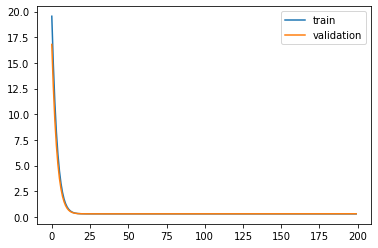

Time to train LSTM:  153.75453305244446


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8efbd15780>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 19.5872 - acc: 0.6534 - val_loss: 16.8423 - val_acc: 0.7496

Epoch 00001: val_loss improved from inf to 16.84231, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 14.9258 - acc: 0.7867 - val_loss: 12.7060 - val_acc: 0.8204

Epoch 00002: val_loss improved from 16.84231 to 12.70603, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 11.1836 - acc: 0.8404 - val_loss: 9.4480 - val_acc: 0.8629

Epoch 00003: val_loss improved from 12.70603 to 9.44799, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 8.2853 - acc: 0.8731 - val_loss: 6.9882 - val_acc: 0.8786

Epoch 00004: val_loss improved from 9.44799 to 6.98819, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 6.1094 - acc: 0.8821 - val_loss: 5.1341 - val_acc: 0.8822

Epoch 00005: val_loss improved from 6.98819 to 5.13408, saving model to Event_val_weights4.hdf5
Epoch 6/200
 - 1s - loss: 4.4789 - acc: 0


Epoch 00047: val_loss improved from 0.30617 to 0.30616, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.2999 - acc: 0.8875 - val_loss: 0.3062 - val_acc: 0.8827

Epoch 00048: val_loss did not improve from 0.30616
Epoch 49/200
 - 1s - loss: 0.2999 - acc: 0.8876 - val_loss: 0.3062 - val_acc: 0.8827

Epoch 00049: val_loss did not improve from 0.30616
Epoch 50/200
 - 1s - loss: 0.2998 - acc: 0.8876 - val_loss: 0.3062 - val_acc: 0.8827

Epoch 00050: val_loss did not improve from 0.30616
Epoch 51/200
 - 1s - loss: 0.2998 - acc: 0.8876 - val_loss: 0.3062 - val_acc: 0.8827

Epoch 00051: val_loss improved from 0.30616 to 0.30616, saving model to Event_val_weights4.hdf5
Epoch 52/200
 - 1s - loss: 0.2998 - acc: 0.8876 - val_loss: 0.3063 - val_acc: 0.8829

Epoch 00052: val_loss did not improve from 0.30616
Epoch 53/200
 - 1s - loss: 0.2998 - acc: 0.8876 - val_loss: 0.3062 - val_acc: 0.8827

Epoch 00053: val_loss did not improve from 0.30616
Epoch 54/200
 - 1s - loss: 0.2997 - 

 - 1s - loss: 0.2977 - acc: 0.8886 - val_loss: 0.3070 - val_acc: 0.8838

Epoch 00107: val_loss did not improve from 0.30616
Epoch 108/200
 - 1s - loss: 0.2975 - acc: 0.8885 - val_loss: 0.3065 - val_acc: 0.8838

Epoch 00108: val_loss did not improve from 0.30616
Epoch 109/200
 - 1s - loss: 0.2975 - acc: 0.8885 - val_loss: 0.3070 - val_acc: 0.8838

Epoch 00109: val_loss did not improve from 0.30616
Epoch 110/200
 - 1s - loss: 0.2975 - acc: 0.8886 - val_loss: 0.3066 - val_acc: 0.8837

Epoch 00110: val_loss did not improve from 0.30616
Epoch 111/200
 - 1s - loss: 0.2975 - acc: 0.8887 - val_loss: 0.3070 - val_acc: 0.8839

Epoch 00111: val_loss did not improve from 0.30616
Epoch 112/200
 - 1s - loss: 0.2974 - acc: 0.8886 - val_loss: 0.3065 - val_acc: 0.8838

Epoch 00112: val_loss did not improve from 0.30616
Epoch 113/200
 - 1s - loss: 0.2975 - acc: 0.8886 - val_loss: 0.3070 - val_acc: 0.8837

Epoch 00113: val_loss did not improve from 0.30616
Epoch 114/200
 - 1s - loss: 0.2973 - acc: 0.8886


Epoch 00166: val_loss did not improve from 0.30616
Epoch 167/200
 - 1s - loss: 0.2963 - acc: 0.8889 - val_loss: 0.3078 - val_acc: 0.8827

Epoch 00167: val_loss did not improve from 0.30616
Epoch 168/200
 - 1s - loss: 0.2964 - acc: 0.8883 - val_loss: 0.3077 - val_acc: 0.8844

Epoch 00168: val_loss did not improve from 0.30616
Epoch 169/200
 - 1s - loss: 0.2957 - acc: 0.8888 - val_loss: 0.3086 - val_acc: 0.8836

Epoch 00169: val_loss did not improve from 0.30616
Epoch 170/200
 - 1s - loss: 0.2960 - acc: 0.8893 - val_loss: 0.3078 - val_acc: 0.8833

Epoch 00170: val_loss did not improve from 0.30616
Epoch 171/200
 - 1s - loss: 0.2959 - acc: 0.8890 - val_loss: 0.3080 - val_acc: 0.8844

Epoch 00171: val_loss did not improve from 0.30616
Epoch 172/200
 - 1s - loss: 0.2955 - acc: 0.8891 - val_loss: 0.3080 - val_acc: 0.8842

Epoch 00172: val_loss did not improve from 0.30616
Epoch 173/200
 - 1s - loss: 0.2958 - acc: 0.8892 - val_loss: 0.3087 - val_acc: 0.8832

Epoch 00173: val_loss did not imp

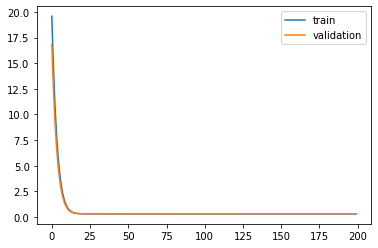

Time to train LSTM:  166.41950726509094
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 19.5774 - acc: 0.6477 - val_loss: 16.8250 - val_acc: 0.7650

Epoch 00001: val_loss improved from inf to 16.82502, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 14.9128 - acc: 0.7879 - val_loss: 12.6970 - val_acc: 0.8246

Epoch 00002: val_loss improved from 16.82502 to 12.69696, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 11.1822 - acc: 0.8438 - val_loss: 9.4494 - val_acc: 0.8662

Epoch 00003: val_loss improved from 12.69696 to 9.44939, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 8.2930 - acc: 0.8735 - val_loss: 6.9876 - val_acc: 0.8780

Epoch 00004: val_loss improved from 9.44939 to 6.98761, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 6.1158 - acc: 0.8812 - val_loss: 5.1359 - val_acc: 0.8814

Epoch 00005: val_loss improved from 6.98761 to 5.13592, saving model to Event_val_weights5.hdf5
E

 - 1s - loss: 0.3002 - acc: 0.8876 - val_loss: 0.3020 - val_acc: 0.8862

Epoch 00049: val_loss improved from 0.30201 to 0.30199, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3001 - acc: 0.8876 - val_loss: 0.3021 - val_acc: 0.8862

Epoch 00050: val_loss did not improve from 0.30199
Epoch 51/200
 - 1s - loss: 0.3001 - acc: 0.8877 - val_loss: 0.3019 - val_acc: 0.8862

Epoch 00051: val_loss improved from 0.30199 to 0.30191, saving model to Event_val_weights5.hdf5
Epoch 52/200
 - 1s - loss: 0.3001 - acc: 0.8878 - val_loss: 0.3019 - val_acc: 0.8866

Epoch 00052: val_loss did not improve from 0.30191
Epoch 53/200
 - 1s - loss: 0.3001 - acc: 0.8877 - val_loss: 0.3020 - val_acc: 0.8863

Epoch 00053: val_loss did not improve from 0.30191
Epoch 54/200
 - 1s - loss: 0.3001 - acc: 0.8877 - val_loss: 0.3019 - val_acc: 0.8866

Epoch 00054: val_loss did not improve from 0.30191
Epoch 55/200
 - 1s - loss: 0.3001 - acc: 0.8875 - val_loss: 0.3021 - val_acc: 0.8864

Epoch 00055: va


Epoch 00107: val_loss did not improve from 0.30182
Epoch 108/200
 - 1s - loss: 0.2984 - acc: 0.8881 - val_loss: 0.3023 - val_acc: 0.8873

Epoch 00108: val_loss did not improve from 0.30182
Epoch 109/200
 - 1s - loss: 0.2983 - acc: 0.8879 - val_loss: 0.3032 - val_acc: 0.8864

Epoch 00109: val_loss did not improve from 0.30182
Epoch 110/200
 - 1s - loss: 0.2983 - acc: 0.8881 - val_loss: 0.3021 - val_acc: 0.8867

Epoch 00110: val_loss did not improve from 0.30182
Epoch 111/200
 - 1s - loss: 0.2983 - acc: 0.8881 - val_loss: 0.3033 - val_acc: 0.8869

Epoch 00111: val_loss did not improve from 0.30182
Epoch 112/200
 - 1s - loss: 0.2982 - acc: 0.8880 - val_loss: 0.3020 - val_acc: 0.8873

Epoch 00112: val_loss did not improve from 0.30182
Epoch 113/200
 - 1s - loss: 0.2982 - acc: 0.8880 - val_loss: 0.3031 - val_acc: 0.8870

Epoch 00113: val_loss did not improve from 0.30182
Epoch 114/200
 - 1s - loss: 0.2982 - acc: 0.8881 - val_loss: 0.3021 - val_acc: 0.8870

Epoch 00114: val_loss did not imp

 - 1s - loss: 0.2970 - acc: 0.8886 - val_loss: 0.3034 - val_acc: 0.8879

Epoch 00165: val_loss did not improve from 0.30114
Epoch 166/200
 - 1s - loss: 0.2967 - acc: 0.8887 - val_loss: 0.3045 - val_acc: 0.8874

Epoch 00166: val_loss did not improve from 0.30114
Epoch 167/200
 - 1s - loss: 0.2963 - acc: 0.8888 - val_loss: 0.3030 - val_acc: 0.8888

Epoch 00167: val_loss did not improve from 0.30114
Epoch 168/200
 - 1s - loss: 0.2962 - acc: 0.8888 - val_loss: 0.3032 - val_acc: 0.8876

Epoch 00168: val_loss did not improve from 0.30114
Epoch 169/200
 - 1s - loss: 0.2968 - acc: 0.8889 - val_loss: 0.3033 - val_acc: 0.8883

Epoch 00169: val_loss did not improve from 0.30114
Epoch 170/200
 - 1s - loss: 0.2966 - acc: 0.8890 - val_loss: 0.3039 - val_acc: 0.8871

Epoch 00170: val_loss did not improve from 0.30114
Epoch 171/200
 - 1s - loss: 0.2960 - acc: 0.8889 - val_loss: 0.3032 - val_acc: 0.8881

Epoch 00171: val_loss did not improve from 0.30114
Epoch 172/200
 - 1s - loss: 0.2960 - acc: 0.8892

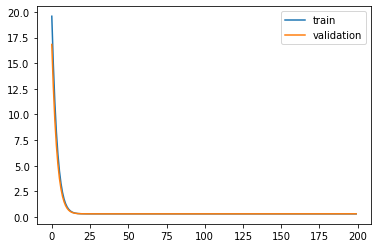

Time to train LSTM:  155.1961853504181
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 20.9989 - acc: 0.5556 - val_loss: 19.3837 - val_acc: 0.6754

Epoch 00001: val_loss improved from inf to 19.38365, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 18.4002 - acc: 0.7075 - val_loss: 16.9413 - val_acc: 0.7508

Epoch 00002: val_loss improved from 19.38365 to 16.94133, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 16.0579 - acc: 0.7591 - val_loss: 14.7461 - val_acc: 0.7809

Epoch 00003: val_loss improved from 16.94133 to 14.74605, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 13.9570 - acc: 0.7881 - val_loss: 12.7839 - val_acc: 0.8099

Epoch 00004: val_loss improved from 14.74605 to 12.78386, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 12.0839 - acc: 0.8139 - val_loss: 11.0427 - val_acc: 0.8361

Epoch 00005: val_loss improved from 12.78386 to 11.04272, saving model to Event_val_weight

 - 1s - loss: 0.3019 - acc: 0.8875 - val_loss: 0.2959 - val_acc: 0.8880

Epoch 00046: val_loss improved from 0.29647 to 0.29592, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.3014 - acc: 0.8875 - val_loss: 0.2955 - val_acc: 0.8880

Epoch 00047: val_loss improved from 0.29592 to 0.29550, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3010 - acc: 0.8876 - val_loss: 0.2951 - val_acc: 0.8880

Epoch 00048: val_loss improved from 0.29550 to 0.29514, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.3007 - acc: 0.8876 - val_loss: 0.2949 - val_acc: 0.8879

Epoch 00049: val_loss improved from 0.29514 to 0.29488, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.3005 - acc: 0.8876 - val_loss: 0.2947 - val_acc: 0.8878

Epoch 00050: val_loss improved from 0.29488 to 0.29468, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.3003 - acc: 0.8875 - val_loss: 0.2945 - val_acc: 0.8878

Epoch 00051: val_

 - 1s - loss: 0.2991 - acc: 0.8875 - val_loss: 0.2935 - val_acc: 0.8889

Epoch 00092: val_loss did not improve from 0.29350
Epoch 93/200
 - 1s - loss: 0.2991 - acc: 0.8875 - val_loss: 0.2935 - val_acc: 0.8888

Epoch 00093: val_loss improved from 0.29350 to 0.29347, saving model to Event_val_weights1.hdf5
Epoch 94/200
 - 1s - loss: 0.2991 - acc: 0.8876 - val_loss: 0.2935 - val_acc: 0.8888

Epoch 00094: val_loss did not improve from 0.29347
Epoch 95/200
 - 1s - loss: 0.2991 - acc: 0.8875 - val_loss: 0.2934 - val_acc: 0.8888

Epoch 00095: val_loss improved from 0.29347 to 0.29341, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.2991 - acc: 0.8875 - val_loss: 0.2936 - val_acc: 0.8888

Epoch 00096: val_loss did not improve from 0.29341
Epoch 97/200
 - 1s - loss: 0.2991 - acc: 0.8875 - val_loss: 0.2934 - val_acc: 0.8888

Epoch 00097: val_loss improved from 0.29341 to 0.29336, saving model to Event_val_weights1.hdf5
Epoch 98/200
 - 1s - loss: 0.2990 - acc: 0.8876 - val_lo


Epoch 00148: val_loss did not improve from 0.29311
Epoch 149/200
 - 1s - loss: 0.2970 - acc: 0.8882 - val_loss: 0.2932 - val_acc: 0.8887

Epoch 00149: val_loss did not improve from 0.29311
Epoch 150/200
 - 1s - loss: 0.2969 - acc: 0.8881 - val_loss: 0.2931 - val_acc: 0.8884

Epoch 00150: val_loss did not improve from 0.29311
Epoch 151/200
 - 1s - loss: 0.2968 - acc: 0.8881 - val_loss: 0.2933 - val_acc: 0.8886

Epoch 00151: val_loss did not improve from 0.29311
Epoch 152/200
 - 1s - loss: 0.2967 - acc: 0.8881 - val_loss: 0.2934 - val_acc: 0.8884

Epoch 00152: val_loss did not improve from 0.29311
Epoch 153/200
 - 1s - loss: 0.2967 - acc: 0.8883 - val_loss: 0.2934 - val_acc: 0.8881

Epoch 00153: val_loss did not improve from 0.29311
Epoch 154/200
 - 1s - loss: 0.2967 - acc: 0.8883 - val_loss: 0.2935 - val_acc: 0.8882

Epoch 00154: val_loss did not improve from 0.29311
Epoch 155/200
 - 1s - loss: 0.2967 - acc: 0.8884 - val_loss: 0.2930 - val_acc: 0.8879

Epoch 00155: val_loss improved fr

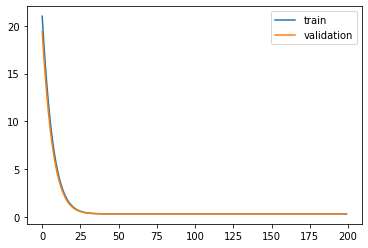

Time to train LSTM:  148.8456871509552
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 20.9825 - acc: 0.5103 - val_loss: 19.3660 - val_acc: 0.6293

Epoch 00001: val_loss improved from inf to 19.36605, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 18.3792 - acc: 0.6787 - val_loss: 16.9247 - val_acc: 0.7337

Epoch 00002: val_loss improved from 19.36605 to 16.92467, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 16.0363 - acc: 0.7568 - val_loss: 14.7329 - val_acc: 0.7760

Epoch 00003: val_loss improved from 16.92467 to 14.73288, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 13.9369 - acc: 0.7907 - val_loss: 12.7753 - val_acc: 0.7980

Epoch 00004: val_loss improved from 14.73288 to 12.77526, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 12.0663 - acc: 0.8140 - val_loss: 11.0380 - val_acc: 0.8238

Epoch 00005: val_loss improved from 12.77526 to 11.03796, saving model to Event_val_weight

 - 1s - loss: 0.3006 - acc: 0.8880 - val_loss: 0.3068 - val_acc: 0.8830

Epoch 00046: val_loss improved from 0.30738 to 0.30685, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.3001 - acc: 0.8881 - val_loss: 0.3064 - val_acc: 0.8831

Epoch 00047: val_loss improved from 0.30685 to 0.30644, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.2998 - acc: 0.8880 - val_loss: 0.3061 - val_acc: 0.8831

Epoch 00048: val_loss improved from 0.30644 to 0.30612, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.2995 - acc: 0.8880 - val_loss: 0.3059 - val_acc: 0.8831

Epoch 00049: val_loss improved from 0.30612 to 0.30589, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.2993 - acc: 0.8879 - val_loss: 0.3057 - val_acc: 0.8832

Epoch 00050: val_loss improved from 0.30589 to 0.30566, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.2991 - acc: 0.8881 - val_loss: 0.3056 - val_acc: 0.8833

Epoch 00051: val_

 - 1s - loss: 0.2978 - acc: 0.8882 - val_loss: 0.3046 - val_acc: 0.8841

Epoch 00096: val_loss did not improve from 0.30456
Epoch 97/200
 - 1s - loss: 0.2978 - acc: 0.8883 - val_loss: 0.3046 - val_acc: 0.8842

Epoch 00097: val_loss did not improve from 0.30456
Epoch 98/200
 - 1s - loss: 0.2977 - acc: 0.8883 - val_loss: 0.3046 - val_acc: 0.8843

Epoch 00098: val_loss did not improve from 0.30456
Epoch 99/200
 - 1s - loss: 0.2977 - acc: 0.8883 - val_loss: 0.3046 - val_acc: 0.8842

Epoch 00099: val_loss did not improve from 0.30456
Epoch 100/200
 - 1s - loss: 0.2977 - acc: 0.8883 - val_loss: 0.3046 - val_acc: 0.8841

Epoch 00100: val_loss did not improve from 0.30456
Epoch 101/200
 - 1s - loss: 0.2977 - acc: 0.8883 - val_loss: 0.3046 - val_acc: 0.8842

Epoch 00101: val_loss did not improve from 0.30456
Epoch 102/200
 - 1s - loss: 0.2977 - acc: 0.8883 - val_loss: 0.3046 - val_acc: 0.8843

Epoch 00102: val_loss did not improve from 0.30456
Epoch 103/200
 - 1s - loss: 0.2977 - acc: 0.8883 - 


Epoch 00155: val_loss did not improve from 0.30456
Epoch 156/200
 - 1s - loss: 0.2965 - acc: 0.8891 - val_loss: 0.3053 - val_acc: 0.8851

Epoch 00156: val_loss did not improve from 0.30456
Epoch 157/200
 - 1s - loss: 0.2964 - acc: 0.8891 - val_loss: 0.3054 - val_acc: 0.8857

Epoch 00157: val_loss did not improve from 0.30456
Epoch 158/200
 - 1s - loss: 0.2963 - acc: 0.8891 - val_loss: 0.3054 - val_acc: 0.8854

Epoch 00158: val_loss did not improve from 0.30456
Epoch 159/200
 - 1s - loss: 0.2963 - acc: 0.8891 - val_loss: 0.3055 - val_acc: 0.8860

Epoch 00159: val_loss did not improve from 0.30456
Epoch 160/200
 - 1s - loss: 0.2962 - acc: 0.8894 - val_loss: 0.3055 - val_acc: 0.8857

Epoch 00160: val_loss did not improve from 0.30456
Epoch 161/200
 - 1s - loss: 0.2962 - acc: 0.8893 - val_loss: 0.3056 - val_acc: 0.8857

Epoch 00161: val_loss did not improve from 0.30456
Epoch 162/200
 - 1s - loss: 0.2962 - acc: 0.8893 - val_loss: 0.3055 - val_acc: 0.8854

Epoch 00162: val_loss did not imp

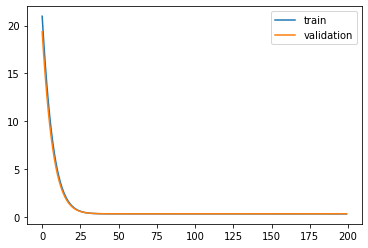

Time to train LSTM:  148.46237015724182
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 20.8726 - acc: 0.6218 - val_loss: 19.2766 - val_acc: 0.7106

Epoch 00001: val_loss improved from inf to 19.27659, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 18.2946 - acc: 0.7351 - val_loss: 16.8515 - val_acc: 0.7577

Epoch 00002: val_loss improved from 19.27659 to 16.85152, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 15.9661 - acc: 0.7758 - val_loss: 14.6693 - val_acc: 0.7856

Epoch 00003: val_loss improved from 16.85152 to 14.66927, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 13.8757 - acc: 0.8009 - val_loss: 12.7179 - val_acc: 0.8089

Epoch 00004: val_loss improved from 14.66927 to 12.71789, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 12.0116 - acc: 0.8249 - val_loss: 10.9862 - val_acc: 0.8364

Epoch 00005: val_loss improved from 12.71789 to 10.98622, saving model to Event_val_weigh

 - 1s - loss: 0.3008 - acc: 0.8878 - val_loss: 0.3044 - val_acc: 0.8867

Epoch 00046: val_loss improved from 0.30493 to 0.30441, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3003 - acc: 0.8878 - val_loss: 0.3040 - val_acc: 0.8868

Epoch 00047: val_loss improved from 0.30441 to 0.30398, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.2999 - acc: 0.8879 - val_loss: 0.3036 - val_acc: 0.8869

Epoch 00048: val_loss improved from 0.30398 to 0.30365, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.2996 - acc: 0.8879 - val_loss: 0.3034 - val_acc: 0.8868

Epoch 00049: val_loss improved from 0.30365 to 0.30337, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.2993 - acc: 0.8879 - val_loss: 0.3032 - val_acc: 0.8868

Epoch 00050: val_loss improved from 0.30337 to 0.30317, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.2992 - acc: 0.8878 - val_loss: 0.3030 - val_acc: 0.8867

Epoch 00051: val_

 - 1s - loss: 0.2976 - acc: 0.8885 - val_loss: 0.3027 - val_acc: 0.8868

Epoch 00098: val_loss did not improve from 0.30235
Epoch 99/200
 - 1s - loss: 0.2975 - acc: 0.8884 - val_loss: 0.3026 - val_acc: 0.8870

Epoch 00099: val_loss did not improve from 0.30235
Epoch 100/200
 - 1s - loss: 0.2974 - acc: 0.8884 - val_loss: 0.3028 - val_acc: 0.8866

Epoch 00100: val_loss did not improve from 0.30235
Epoch 101/200
 - 1s - loss: 0.2974 - acc: 0.8886 - val_loss: 0.3029 - val_acc: 0.8867

Epoch 00101: val_loss did not improve from 0.30235
Epoch 102/200
 - 1s - loss: 0.2973 - acc: 0.8886 - val_loss: 0.3028 - val_acc: 0.8869

Epoch 00102: val_loss did not improve from 0.30235
Epoch 103/200
 - 1s - loss: 0.2973 - acc: 0.8886 - val_loss: 0.3027 - val_acc: 0.8871

Epoch 00103: val_loss did not improve from 0.30235
Epoch 104/200
 - 1s - loss: 0.2972 - acc: 0.8887 - val_loss: 0.3029 - val_acc: 0.8876

Epoch 00104: val_loss did not improve from 0.30235
Epoch 105/200
 - 1s - loss: 0.2972 - acc: 0.8886 


Epoch 00157: val_loss did not improve from 0.30235
Epoch 158/200
 - 1s - loss: 0.2946 - acc: 0.8897 - val_loss: 0.3039 - val_acc: 0.8889

Epoch 00158: val_loss did not improve from 0.30235
Epoch 159/200
 - 1s - loss: 0.2944 - acc: 0.8895 - val_loss: 0.3037 - val_acc: 0.8894

Epoch 00159: val_loss did not improve from 0.30235
Epoch 160/200
 - 1s - loss: 0.2943 - acc: 0.8901 - val_loss: 0.3044 - val_acc: 0.8886

Epoch 00160: val_loss did not improve from 0.30235
Epoch 161/200
 - 1s - loss: 0.2949 - acc: 0.8894 - val_loss: 0.3046 - val_acc: 0.8894

Epoch 00161: val_loss did not improve from 0.30235
Epoch 162/200
 - 1s - loss: 0.2949 - acc: 0.8895 - val_loss: 0.3042 - val_acc: 0.8888

Epoch 00162: val_loss did not improve from 0.30235
Epoch 163/200
 - 1s - loss: 0.2946 - acc: 0.8897 - val_loss: 0.3037 - val_acc: 0.8892

Epoch 00163: val_loss did not improve from 0.30235
Epoch 164/200
 - 1s - loss: 0.2942 - acc: 0.8903 - val_loss: 0.3043 - val_acc: 0.8884

Epoch 00164: val_loss did not imp

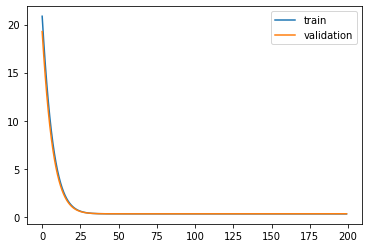

Time to train LSTM:  149.63911700248718
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 20.9390 - acc: 0.5718 - val_loss: 19.3283 - val_acc: 0.6903

Epoch 00001: val_loss improved from inf to 19.32831, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 18.3464 - acc: 0.7253 - val_loss: 16.8938 - val_acc: 0.7596

Epoch 00002: val_loss improved from 19.32831 to 16.89377, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 16.0106 - acc: 0.7687 - val_loss: 14.7064 - val_acc: 0.7862

Epoch 00003: val_loss improved from 16.89377 to 14.70641, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 13.9154 - acc: 0.7963 - val_loss: 12.7516 - val_acc: 0.8133

Epoch 00004: val_loss improved from 14.70641 to 12.75161, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 12.0474 - acc: 0.8257 - val_loss: 11.0178 - val_acc: 0.8422

Epoch 00005: val_loss improved from 12.75161 to 11.01782, saving model to Event_val_weigh

 - 1s - loss: 0.3003 - acc: 0.8875 - val_loss: 0.3071 - val_acc: 0.8844

Epoch 00046: val_loss improved from 0.30767 to 0.30714, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.2998 - acc: 0.8875 - val_loss: 0.3067 - val_acc: 0.8846

Epoch 00047: val_loss improved from 0.30714 to 0.30673, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.2995 - acc: 0.8876 - val_loss: 0.3064 - val_acc: 0.8844

Epoch 00048: val_loss improved from 0.30673 to 0.30642, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.2992 - acc: 0.8876 - val_loss: 0.3062 - val_acc: 0.8846

Epoch 00049: val_loss improved from 0.30642 to 0.30618, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.2989 - acc: 0.8877 - val_loss: 0.3060 - val_acc: 0.8847

Epoch 00050: val_loss improved from 0.30618 to 0.30599, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.2987 - acc: 0.8876 - val_loss: 0.3059 - val_acc: 0.8848

Epoch 00051: val_

 - 1s - loss: 0.2971 - acc: 0.8890 - val_loss: 0.3055 - val_acc: 0.8843

Epoch 00099: val_loss did not improve from 0.30524
Epoch 100/200
 - 1s - loss: 0.2971 - acc: 0.8890 - val_loss: 0.3056 - val_acc: 0.8843

Epoch 00100: val_loss did not improve from 0.30524
Epoch 101/200
 - 1s - loss: 0.2971 - acc: 0.8889 - val_loss: 0.3056 - val_acc: 0.8843

Epoch 00101: val_loss did not improve from 0.30524
Epoch 102/200
 - 1s - loss: 0.2971 - acc: 0.8889 - val_loss: 0.3056 - val_acc: 0.8843

Epoch 00102: val_loss did not improve from 0.30524
Epoch 103/200
 - 1s - loss: 0.2970 - acc: 0.8888 - val_loss: 0.3056 - val_acc: 0.8842

Epoch 00103: val_loss did not improve from 0.30524
Epoch 104/200
 - 1s - loss: 0.2970 - acc: 0.8889 - val_loss: 0.3057 - val_acc: 0.8842

Epoch 00104: val_loss did not improve from 0.30524
Epoch 105/200
 - 1s - loss: 0.2970 - acc: 0.8889 - val_loss: 0.3056 - val_acc: 0.8839

Epoch 00105: val_loss did not improve from 0.30524
Epoch 106/200
 - 1s - loss: 0.2970 - acc: 0.8889


Epoch 00158: val_loss did not improve from 0.30524
Epoch 159/200
 - 1s - loss: 0.2957 - acc: 0.8899 - val_loss: 0.3059 - val_acc: 0.8832

Epoch 00159: val_loss did not improve from 0.30524
Epoch 160/200
 - 1s - loss: 0.2957 - acc: 0.8898 - val_loss: 0.3060 - val_acc: 0.8830

Epoch 00160: val_loss did not improve from 0.30524
Epoch 161/200
 - 1s - loss: 0.2956 - acc: 0.8900 - val_loss: 0.3059 - val_acc: 0.8830

Epoch 00161: val_loss did not improve from 0.30524
Epoch 162/200
 - 1s - loss: 0.2956 - acc: 0.8898 - val_loss: 0.3059 - val_acc: 0.8830

Epoch 00162: val_loss did not improve from 0.30524
Epoch 163/200
 - 1s - loss: 0.2956 - acc: 0.8899 - val_loss: 0.3059 - val_acc: 0.8837

Epoch 00163: val_loss did not improve from 0.30524
Epoch 164/200
 - 1s - loss: 0.2955 - acc: 0.8901 - val_loss: 0.3057 - val_acc: 0.8833

Epoch 00164: val_loss did not improve from 0.30524
Epoch 165/200
 - 1s - loss: 0.2955 - acc: 0.8902 - val_loss: 0.3056 - val_acc: 0.8837

Epoch 00165: val_loss did not imp

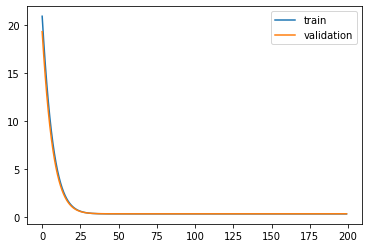

Time to train LSTM:  148.97256755828857
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 20.9235 - acc: 0.5579 - val_loss: 19.3104 - val_acc: 0.6649

Epoch 00001: val_loss improved from inf to 19.31039, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 18.3337 - acc: 0.6970 - val_loss: 16.8753 - val_acc: 0.7534

Epoch 00002: val_loss improved from 19.31039 to 16.87532, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 15.9972 - acc: 0.7633 - val_loss: 14.6865 - val_acc: 0.7936

Epoch 00003: val_loss improved from 16.87532 to 14.68646, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 13.9017 - acc: 0.7975 - val_loss: 12.7315 - val_acc: 0.8186

Epoch 00004: val_loss improved from 14.68646 to 12.73146, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 12.0349 - acc: 0.8241 - val_loss: 10.9985 - val_acc: 0.8447

Epoch 00005: val_loss improved from 12.73146 to 10.99851, saving model to Event_val_weigh

 - 1s - loss: 0.3010 - acc: 0.8877 - val_loss: 0.3029 - val_acc: 0.8878

Epoch 00046: val_loss improved from 0.30345 to 0.30288, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.3004 - acc: 0.8877 - val_loss: 0.3024 - val_acc: 0.8876

Epoch 00047: val_loss improved from 0.30288 to 0.30245, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.3000 - acc: 0.8878 - val_loss: 0.3021 - val_acc: 0.8876

Epoch 00048: val_loss improved from 0.30245 to 0.30211, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.2997 - acc: 0.8878 - val_loss: 0.3018 - val_acc: 0.8874

Epoch 00049: val_loss improved from 0.30211 to 0.30185, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.2994 - acc: 0.8878 - val_loss: 0.3017 - val_acc: 0.8874

Epoch 00050: val_loss improved from 0.30185 to 0.30165, saving model to Event_val_weights5.hdf5
Epoch 51/200
 - 1s - loss: 0.2992 - acc: 0.8878 - val_loss: 0.3015 - val_acc: 0.8873

Epoch 00051: val_

 - 1s - loss: 0.2976 - acc: 0.8882 - val_loss: 0.3009 - val_acc: 0.8869

Epoch 00100: val_loss did not improve from 0.30079
Epoch 101/200
 - 1s - loss: 0.2975 - acc: 0.8882 - val_loss: 0.3009 - val_acc: 0.8870

Epoch 00101: val_loss did not improve from 0.30079
Epoch 102/200
 - 1s - loss: 0.2975 - acc: 0.8881 - val_loss: 0.3009 - val_acc: 0.8869

Epoch 00102: val_loss did not improve from 0.30079
Epoch 103/200
 - 1s - loss: 0.2975 - acc: 0.8881 - val_loss: 0.3009 - val_acc: 0.8870

Epoch 00103: val_loss did not improve from 0.30079
Epoch 104/200
 - 1s - loss: 0.2975 - acc: 0.8882 - val_loss: 0.3009 - val_acc: 0.8869

Epoch 00104: val_loss did not improve from 0.30079
Epoch 105/200
 - 1s - loss: 0.2975 - acc: 0.8881 - val_loss: 0.3010 - val_acc: 0.8871

Epoch 00105: val_loss did not improve from 0.30079
Epoch 106/200
 - 1s - loss: 0.2975 - acc: 0.8881 - val_loss: 0.3009 - val_acc: 0.8870

Epoch 00106: val_loss did not improve from 0.30079
Epoch 107/200
 - 1s - loss: 0.2974 - acc: 0.8881


Epoch 00159: val_loss did not improve from 0.30079
Epoch 160/200
 - 1s - loss: 0.2966 - acc: 0.8886 - val_loss: 0.3020 - val_acc: 0.8866

Epoch 00160: val_loss did not improve from 0.30079
Epoch 161/200
 - 1s - loss: 0.2966 - acc: 0.8887 - val_loss: 0.3021 - val_acc: 0.8866

Epoch 00161: val_loss did not improve from 0.30079
Epoch 162/200
 - 1s - loss: 0.2965 - acc: 0.8888 - val_loss: 0.3020 - val_acc: 0.8864

Epoch 00162: val_loss did not improve from 0.30079
Epoch 163/200
 - 1s - loss: 0.2965 - acc: 0.8888 - val_loss: 0.3020 - val_acc: 0.8866

Epoch 00163: val_loss did not improve from 0.30079
Epoch 164/200
 - 1s - loss: 0.2965 - acc: 0.8889 - val_loss: 0.3021 - val_acc: 0.8866

Epoch 00164: val_loss did not improve from 0.30079
Epoch 165/200
 - 1s - loss: 0.2965 - acc: 0.8889 - val_loss: 0.3021 - val_acc: 0.8867

Epoch 00165: val_loss did not improve from 0.30079
Epoch 166/200
 - 1s - loss: 0.2964 - acc: 0.8889 - val_loss: 0.3021 - val_acc: 0.8867

Epoch 00166: val_loss did not imp

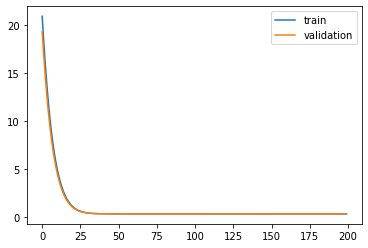

Time to train LSTM:  149.39615035057068
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 21.5516 - acc: 0.5254 - val_loss: 20.3474 - val_acc: 0.6057

Epoch 00001: val_loss improved from inf to 20.34736, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 19.9384 - acc: 0.6297 - val_loss: 18.8011 - val_acc: 0.6856

Epoch 00002: val_loss improved from 20.34736 to 18.80109, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 18.4167 - acc: 0.7010 - val_loss: 17.3447 - val_acc: 0.7369

Epoch 00003: val_loss improved from 18.80109 to 17.34471, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 16.9842 - acc: 0.7409 - val_loss: 15.9757 - val_acc: 0.7669

Epoch 00004: val_loss improved from 17.34471 to 15.97570, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 15.6383 - acc: 0.7668 - val_loss: 14.6915 - val_acc: 0.7863

Epoch 00005: val_loss improved from 15.97570 to 14.69147, saving model to Event_val_weigh


Epoch 00045: val_loss improved from 0.51419 to 0.48747, saving model to Event_val_weights1.hdf5
Epoch 46/200
 - 1s - loss: 0.4855 - acc: 0.8872 - val_loss: 0.4638 - val_acc: 0.8879

Epoch 00046: val_loss improved from 0.48747 to 0.46378, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.4626 - acc: 0.8872 - val_loss: 0.4428 - val_acc: 0.8879

Epoch 00047: val_loss improved from 0.46378 to 0.44281, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.4423 - acc: 0.8872 - val_loss: 0.4243 - val_acc: 0.8878

Epoch 00048: val_loss improved from 0.44281 to 0.42427, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.4244 - acc: 0.8873 - val_loss: 0.4079 - val_acc: 0.8878

Epoch 00049: val_loss improved from 0.42427 to 0.40791, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.4086 - acc: 0.8874 - val_loss: 0.3935 - val_acc: 0.8878

Epoch 00050: val_loss improved from 0.40791 to 0.39348, saving model to Event_val_weights

 - 1s - loss: 0.2992 - acc: 0.8872 - val_loss: 0.2939 - val_acc: 0.8891

Epoch 00091: val_loss improved from 0.29396 to 0.29392, saving model to Event_val_weights1.hdf5
Epoch 92/200
 - 1s - loss: 0.2992 - acc: 0.8872 - val_loss: 0.2939 - val_acc: 0.8890

Epoch 00092: val_loss improved from 0.29392 to 0.29389, saving model to Event_val_weights1.hdf5
Epoch 93/200
 - 1s - loss: 0.2992 - acc: 0.8872 - val_loss: 0.2939 - val_acc: 0.8890

Epoch 00093: val_loss improved from 0.29389 to 0.29386, saving model to Event_val_weights1.hdf5
Epoch 94/200
 - 1s - loss: 0.2991 - acc: 0.8872 - val_loss: 0.2938 - val_acc: 0.8889

Epoch 00094: val_loss improved from 0.29386 to 0.29384, saving model to Event_val_weights1.hdf5
Epoch 95/200
 - 1s - loss: 0.2991 - acc: 0.8872 - val_loss: 0.2938 - val_acc: 0.8888

Epoch 00095: val_loss improved from 0.29384 to 0.29381, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.2991 - acc: 0.8872 - val_loss: 0.2938 - val_acc: 0.8889

Epoch 00096: val_

 - 1s - loss: 0.2984 - acc: 0.8876 - val_loss: 0.2936 - val_acc: 0.8892

Epoch 00141: val_loss did not improve from 0.29357
Epoch 142/200
 - 1s - loss: 0.2984 - acc: 0.8876 - val_loss: 0.2936 - val_acc: 0.8891

Epoch 00142: val_loss did not improve from 0.29357
Epoch 143/200
 - 1s - loss: 0.2984 - acc: 0.8876 - val_loss: 0.2937 - val_acc: 0.8891

Epoch 00143: val_loss did not improve from 0.29357
Epoch 144/200
 - 1s - loss: 0.2984 - acc: 0.8876 - val_loss: 0.2937 - val_acc: 0.8890

Epoch 00144: val_loss did not improve from 0.29357
Epoch 145/200
 - 1s - loss: 0.2984 - acc: 0.8877 - val_loss: 0.2937 - val_acc: 0.8891

Epoch 00145: val_loss did not improve from 0.29357
Epoch 146/200
 - 1s - loss: 0.2983 - acc: 0.8878 - val_loss: 0.2937 - val_acc: 0.8893

Epoch 00146: val_loss did not improve from 0.29357
Epoch 147/200
 - 1s - loss: 0.2983 - acc: 0.8878 - val_loss: 0.2937 - val_acc: 0.8891

Epoch 00147: val_loss did not improve from 0.29357
Epoch 148/200
 - 1s - loss: 0.2983 - acc: 0.8879


Epoch 00200: val_loss did not improve from 0.29357
#################################
Number of units: 64
Batch size: 32768
Fold: 0
best val loss: 0.2935735583305359
#################################


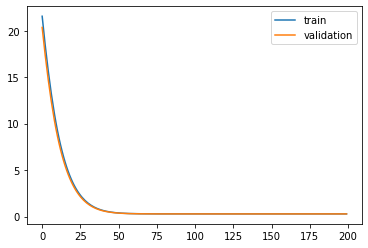

Time to train LSTM:  145.6963882446289
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 21.5385 - acc: 0.5591 - val_loss: 20.3356 - val_acc: 0.6267

Epoch 00001: val_loss improved from inf to 20.33561, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 19.9219 - acc: 0.6523 - val_loss: 18.7890 - val_acc: 0.6947

Epoch 00002: val_loss improved from 20.33561 to 18.78900, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 18.3985 - acc: 0.7098 - val_loss: 17.3338 - val_acc: 0.7314

Epoch 00003: val_loss improved from 18.78900 to 17.33380, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 16.9660 - acc: 0.7437 - val_loss: 15.9674 - val_acc: 0.7533

Epoch 00004: val_loss improved from 17.33380 to 15.96739, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 15.6217 - acc: 0.7660 - val_loss: 14.6870 - val_acc: 0.7712

Epoch 00005: val_loss improved from 15.96739 to 14.68696, saving model to Event_val_weight


Epoch 00045: val_loss improved from 0.52566 to 0.49888, saving model to Event_val_weights2.hdf5
Epoch 46/200
 - 1s - loss: 0.4847 - acc: 0.8882 - val_loss: 0.4751 - val_acc: 0.8830

Epoch 00046: val_loss improved from 0.49888 to 0.47514, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.4617 - acc: 0.8881 - val_loss: 0.4541 - val_acc: 0.8829

Epoch 00047: val_loss improved from 0.47514 to 0.45412, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.4414 - acc: 0.8881 - val_loss: 0.4355 - val_acc: 0.8829

Epoch 00048: val_loss improved from 0.45412 to 0.43555, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.4234 - acc: 0.8882 - val_loss: 0.4191 - val_acc: 0.8832

Epoch 00049: val_loss improved from 0.43555 to 0.41915, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.4076 - acc: 0.8881 - val_loss: 0.4047 - val_acc: 0.8833

Epoch 00050: val_loss improved from 0.41915 to 0.40468, saving model to Event_val_weights

 - 1s - loss: 0.2978 - acc: 0.8885 - val_loss: 0.3052 - val_acc: 0.8843

Epoch 00091: val_loss improved from 0.30518 to 0.30516, saving model to Event_val_weights2.hdf5
Epoch 92/200
 - 1s - loss: 0.2977 - acc: 0.8885 - val_loss: 0.3051 - val_acc: 0.8842

Epoch 00092: val_loss improved from 0.30516 to 0.30514, saving model to Event_val_weights2.hdf5
Epoch 93/200
 - 1s - loss: 0.2977 - acc: 0.8885 - val_loss: 0.3051 - val_acc: 0.8842

Epoch 00093: val_loss improved from 0.30514 to 0.30512, saving model to Event_val_weights2.hdf5
Epoch 94/200
 - 1s - loss: 0.2977 - acc: 0.8884 - val_loss: 0.3051 - val_acc: 0.8841

Epoch 00094: val_loss improved from 0.30512 to 0.30511, saving model to Event_val_weights2.hdf5
Epoch 95/200
 - 1s - loss: 0.2976 - acc: 0.8885 - val_loss: 0.3051 - val_acc: 0.8841

Epoch 00095: val_loss improved from 0.30511 to 0.30510, saving model to Event_val_weights2.hdf5
Epoch 96/200
 - 1s - loss: 0.2976 - acc: 0.8885 - val_loss: 0.3051 - val_acc: 0.8840

Epoch 00096: val_


Epoch 00147: val_loss did not improve from 0.30506
Epoch 148/200
 - 1s - loss: 0.2965 - acc: 0.8895 - val_loss: 0.3059 - val_acc: 0.8850

Epoch 00148: val_loss did not improve from 0.30506
Epoch 149/200
 - 1s - loss: 0.2965 - acc: 0.8894 - val_loss: 0.3059 - val_acc: 0.8850

Epoch 00149: val_loss did not improve from 0.30506
Epoch 150/200
 - 1s - loss: 0.2965 - acc: 0.8895 - val_loss: 0.3059 - val_acc: 0.8852

Epoch 00150: val_loss did not improve from 0.30506
Epoch 151/200
 - 1s - loss: 0.2965 - acc: 0.8894 - val_loss: 0.3060 - val_acc: 0.8849

Epoch 00151: val_loss did not improve from 0.30506
Epoch 152/200
 - 1s - loss: 0.2964 - acc: 0.8896 - val_loss: 0.3060 - val_acc: 0.8852

Epoch 00152: val_loss did not improve from 0.30506
Epoch 153/200
 - 1s - loss: 0.2964 - acc: 0.8896 - val_loss: 0.3060 - val_acc: 0.8852

Epoch 00153: val_loss did not improve from 0.30506
Epoch 154/200
 - 1s - loss: 0.2964 - acc: 0.8896 - val_loss: 0.3061 - val_acc: 0.8849

Epoch 00154: val_loss did not imp

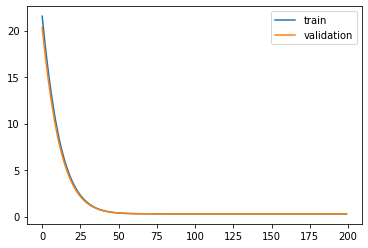

Time to train LSTM:  146.19765186309814


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8ef9004b00>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 21.6726 - acc: 0.4562 - val_loss: 20.4501 - val_acc: 0.5408

Epoch 00001: val_loss improved from inf to 20.45006, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 20.0323 - acc: 0.5699 - val_loss: 18.8850 - val_acc: 0.6540

Epoch 00002: val_loss improved from 20.45006 to 18.88499, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 18.4928 - acc: 0.6719 - val_loss: 17.4175 - val_acc: 0.7176

Epoch 00003: val_loss improved from 18.88499 to 17.41753, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 17.0494 - acc: 0.7327 - val_loss: 16.0428 - val_acc: 0.7568

Epoch 00004: val_loss improved from 17.41753 to 16.04283, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 15.6977 - acc: 0.7644 - val_loss: 14.7565 - val_acc: 0.7761

Epoch 00005: val_loss improved from 16.04283 to 14.75653, saving model to Event_val_weights3.hdf5
Epoch 6/200
 - 1s - loss: 14.43

 - 1s - loss: 0.4865 - acc: 0.8875 - val_loss: 0.4724 - val_acc: 0.8873

Epoch 00046: val_loss improved from 0.49618 to 0.47235, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.4634 - acc: 0.8876 - val_loss: 0.4513 - val_acc: 0.8873

Epoch 00047: val_loss improved from 0.47235 to 0.45126, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.4430 - acc: 0.8877 - val_loss: 0.4326 - val_acc: 0.8874

Epoch 00048: val_loss improved from 0.45126 to 0.43262, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.4250 - acc: 0.8878 - val_loss: 0.4162 - val_acc: 0.8876

Epoch 00049: val_loss improved from 0.43262 to 0.41616, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.4090 - acc: 0.8878 - val_loss: 0.4016 - val_acc: 0.8876

Epoch 00050: val_loss improved from 0.41616 to 0.40164, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3950 - acc: 0.8879 - val_loss: 0.3889 - val_acc: 0.8876

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30196 to 0.30193, saving model to Event_val_weights3.hdf5
Epoch 92/200
 - 1s - loss: 0.2981 - acc: 0.8880 - val_loss: 0.3019 - val_acc: 0.8877

Epoch 00092: val_loss improved from 0.30193 to 0.30191, saving model to Event_val_weights3.hdf5
Epoch 93/200
 - 1s - loss: 0.2981 - acc: 0.8880 - val_loss: 0.3019 - val_acc: 0.8876

Epoch 00093: val_loss improved from 0.30191 to 0.30190, saving model to Event_val_weights3.hdf5
Epoch 94/200
 - 1s - loss: 0.2981 - acc: 0.8880 - val_loss: 0.3019 - val_acc: 0.8877

Epoch 00094: val_loss improved from 0.30190 to 0.30189, saving model to Event_val_weights3.hdf5
Epoch 95/200
 - 1s - loss: 0.2981 - acc: 0.8880 - val_loss: 0.3019 - val_acc: 0.8877

Epoch 00095: val_loss improved from 0.30189 to 0.30188, saving model to Event_val_weights3.hdf5
Epoch 96/200
 - 1s - loss: 0.2980 - acc: 0.8880 - val_loss: 0.3019 - val_acc: 0.8877

Epoch 00096: val_loss improved from 0.30188 to 0.30188, saving model to Event_val_weights


Epoch 00147: val_loss did not improve from 0.30187
Epoch 148/200
 - 1s - loss: 0.2974 - acc: 0.8885 - val_loss: 0.3020 - val_acc: 0.8877

Epoch 00148: val_loss did not improve from 0.30187
Epoch 149/200
 - 1s - loss: 0.2973 - acc: 0.8886 - val_loss: 0.3021 - val_acc: 0.8879

Epoch 00149: val_loss did not improve from 0.30187
Epoch 150/200
 - 1s - loss: 0.2973 - acc: 0.8886 - val_loss: 0.3021 - val_acc: 0.8879

Epoch 00150: val_loss did not improve from 0.30187
Epoch 151/200
 - 1s - loss: 0.2973 - acc: 0.8884 - val_loss: 0.3021 - val_acc: 0.8877

Epoch 00151: val_loss did not improve from 0.30187
Epoch 152/200
 - 1s - loss: 0.2972 - acc: 0.8885 - val_loss: 0.3021 - val_acc: 0.8876

Epoch 00152: val_loss did not improve from 0.30187
Epoch 153/200
 - 1s - loss: 0.2972 - acc: 0.8885 - val_loss: 0.3021 - val_acc: 0.8876

Epoch 00153: val_loss did not improve from 0.30187
Epoch 154/200
 - 1s - loss: 0.2972 - acc: 0.8885 - val_loss: 0.3021 - val_acc: 0.8874

Epoch 00154: val_loss did not imp

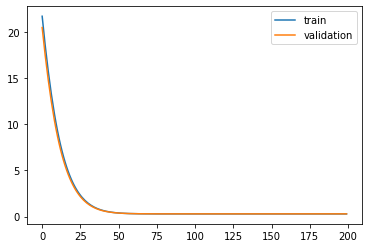

Time to train LSTM:  154.67620587348938
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 14s - loss: 21.4656 - acc: 0.5889 - val_loss: 20.2682 - val_acc: 0.6399

Epoch 00001: val_loss improved from inf to 20.26816, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 19.8550 - acc: 0.6575 - val_loss: 18.7252 - val_acc: 0.6990

Epoch 00002: val_loss improved from 20.26816 to 18.72522, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 18.3358 - acc: 0.7146 - val_loss: 17.2725 - val_acc: 0.7442

Epoch 00003: val_loss improved from 18.72522 to 17.27247, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 16.9061 - acc: 0.7554 - val_loss: 15.9078 - val_acc: 0.7736

Epoch 00004: val_loss improved from 17.27247 to 15.90779, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 15.5637 - acc: 0.7815 - val_loss: 14.6288 - val_acc: 0.7922

Epoch 00005: val_loss improved from 15.90779 to 14.62879, saving model to Event_val_weig


Epoch 00045: val_loss improved from 0.52252 to 0.49599, saving model to Event_val_weights4.hdf5
Epoch 46/200
 - 1s - loss: 0.4821 - acc: 0.8880 - val_loss: 0.4725 - val_acc: 0.8850

Epoch 00046: val_loss improved from 0.49599 to 0.47248, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.4593 - acc: 0.8880 - val_loss: 0.4517 - val_acc: 0.8853

Epoch 00047: val_loss improved from 0.47248 to 0.45170, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.4392 - acc: 0.8880 - val_loss: 0.4333 - val_acc: 0.8854

Epoch 00048: val_loss improved from 0.45170 to 0.43335, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.4215 - acc: 0.8880 - val_loss: 0.4171 - val_acc: 0.8854

Epoch 00049: val_loss improved from 0.43335 to 0.41714, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.4058 - acc: 0.8879 - val_loss: 0.4028 - val_acc: 0.8853

Epoch 00050: val_loss improved from 0.41714 to 0.40285, saving model to Event_val_weights

 - 1s - loss: 0.2977 - acc: 0.8880 - val_loss: 0.3051 - val_acc: 0.8852

Epoch 00091: val_loss improved from 0.30510 to 0.30507, saving model to Event_val_weights4.hdf5
Epoch 92/200
 - 1s - loss: 0.2977 - acc: 0.8880 - val_loss: 0.3051 - val_acc: 0.8852

Epoch 00092: val_loss improved from 0.30507 to 0.30505, saving model to Event_val_weights4.hdf5
Epoch 93/200
 - 1s - loss: 0.2976 - acc: 0.8880 - val_loss: 0.3050 - val_acc: 0.8851

Epoch 00093: val_loss improved from 0.30505 to 0.30502, saving model to Event_val_weights4.hdf5
Epoch 94/200
 - 1s - loss: 0.2976 - acc: 0.8881 - val_loss: 0.3050 - val_acc: 0.8851

Epoch 00094: val_loss improved from 0.30502 to 0.30501, saving model to Event_val_weights4.hdf5
Epoch 95/200
 - 1s - loss: 0.2976 - acc: 0.8881 - val_loss: 0.3050 - val_acc: 0.8851

Epoch 00095: val_loss improved from 0.30501 to 0.30497, saving model to Event_val_weights4.hdf5
Epoch 96/200
 - 1s - loss: 0.2975 - acc: 0.8882 - val_loss: 0.3050 - val_acc: 0.8850

Epoch 00096: val_

 - 1s - loss: 0.2966 - acc: 0.8887 - val_loss: 0.3051 - val_acc: 0.8841

Epoch 00147: val_loss did not improve from 0.30487
Epoch 148/200
 - 1s - loss: 0.2966 - acc: 0.8887 - val_loss: 0.3052 - val_acc: 0.8839

Epoch 00148: val_loss did not improve from 0.30487
Epoch 149/200
 - 1s - loss: 0.2966 - acc: 0.8887 - val_loss: 0.3052 - val_acc: 0.8840

Epoch 00149: val_loss did not improve from 0.30487
Epoch 150/200
 - 1s - loss: 0.2966 - acc: 0.8886 - val_loss: 0.3052 - val_acc: 0.8840

Epoch 00150: val_loss did not improve from 0.30487
Epoch 151/200
 - 1s - loss: 0.2965 - acc: 0.8886 - val_loss: 0.3053 - val_acc: 0.8839

Epoch 00151: val_loss did not improve from 0.30487
Epoch 152/200
 - 1s - loss: 0.2965 - acc: 0.8887 - val_loss: 0.3053 - val_acc: 0.8837

Epoch 00152: val_loss did not improve from 0.30487
Epoch 153/200
 - 1s - loss: 0.2965 - acc: 0.8887 - val_loss: 0.3053 - val_acc: 0.8837

Epoch 00153: val_loss did not improve from 0.30487
Epoch 154/200
 - 1s - loss: 0.2964 - acc: 0.8888

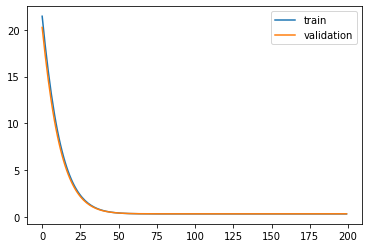

Time to train LSTM:  154.2993803024292
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 21.5748 - acc: 0.5327 - val_loss: 20.3623 - val_acc: 0.6143

Epoch 00001: val_loss improved from inf to 20.36231, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 19.9498 - acc: 0.6449 - val_loss: 18.8081 - val_acc: 0.7062

Epoch 00002: val_loss improved from 20.36231 to 18.80812, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 18.4210 - acc: 0.7196 - val_loss: 17.3477 - val_acc: 0.7547

Epoch 00003: val_loss improved from 18.80812 to 17.34768, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 16.9847 - acc: 0.7579 - val_loss: 15.9773 - val_acc: 0.7789

Epoch 00004: val_loss improved from 17.34768 to 15.97732, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 15.6374 - acc: 0.7793 - val_loss: 14.6938 - val_acc: 0.7923

Epoch 00005: val_loss improved from 15.97732 to 14.69382, saving model to Event_val_weight


Epoch 00045: val_loss improved from 0.52280 to 0.49593, saving model to Event_val_weights5.hdf5
Epoch 46/200
 - 1s - loss: 0.4858 - acc: 0.8878 - val_loss: 0.4721 - val_acc: 0.8878

Epoch 00046: val_loss improved from 0.49593 to 0.47211, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.4628 - acc: 0.8879 - val_loss: 0.4510 - val_acc: 0.8881

Epoch 00047: val_loss improved from 0.47211 to 0.45103, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.4424 - acc: 0.8878 - val_loss: 0.4324 - val_acc: 0.8882

Epoch 00048: val_loss improved from 0.45103 to 0.43239, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.4244 - acc: 0.8878 - val_loss: 0.4159 - val_acc: 0.8882

Epoch 00049: val_loss improved from 0.43239 to 0.41592, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.4085 - acc: 0.8877 - val_loss: 0.4014 - val_acc: 0.8881

Epoch 00050: val_loss improved from 0.41592 to 0.40140, saving model to Event_val_weights

 - 1s - loss: 0.2980 - acc: 0.8880 - val_loss: 0.3012 - val_acc: 0.8873

Epoch 00092: val_loss improved from 0.30129 to 0.30120, saving model to Event_val_weights5.hdf5
Epoch 93/200
 - 1s - loss: 0.2980 - acc: 0.8879 - val_loss: 0.3012 - val_acc: 0.8872

Epoch 00093: val_loss improved from 0.30120 to 0.30115, saving model to Event_val_weights5.hdf5
Epoch 94/200
 - 1s - loss: 0.2980 - acc: 0.8880 - val_loss: 0.3012 - val_acc: 0.8873

Epoch 00094: val_loss did not improve from 0.30115
Epoch 95/200
 - 1s - loss: 0.2979 - acc: 0.8880 - val_loss: 0.3014 - val_acc: 0.8873

Epoch 00095: val_loss did not improve from 0.30115
Epoch 96/200
 - 1s - loss: 0.2979 - acc: 0.8880 - val_loss: 0.3013 - val_acc: 0.8872

Epoch 00096: val_loss did not improve from 0.30115
Epoch 97/200
 - 1s - loss: 0.2978 - acc: 0.8881 - val_loss: 0.3011 - val_acc: 0.8874

Epoch 00097: val_loss improved from 0.30115 to 0.30113, saving model to Event_val_weights5.hdf5
Epoch 98/200
 - 1s - loss: 0.2978 - acc: 0.8880 - val_lo

 - 1s - loss: 0.2969 - acc: 0.8888 - val_loss: 0.3012 - val_acc: 0.8866

Epoch 00148: val_loss did not improve from 0.30100
Epoch 149/200
 - 1s - loss: 0.2968 - acc: 0.8887 - val_loss: 0.3010 - val_acc: 0.8868

Epoch 00149: val_loss did not improve from 0.30100
Epoch 150/200
 - 1s - loss: 0.2968 - acc: 0.8887 - val_loss: 0.3015 - val_acc: 0.8866

Epoch 00150: val_loss did not improve from 0.30100
Epoch 151/200
 - 1s - loss: 0.2968 - acc: 0.8887 - val_loss: 0.3010 - val_acc: 0.8868

Epoch 00151: val_loss improved from 0.30100 to 0.30100, saving model to Event_val_weights5.hdf5
Epoch 152/200
 - 1s - loss: 0.2968 - acc: 0.8885 - val_loss: 0.3012 - val_acc: 0.8867

Epoch 00152: val_loss did not improve from 0.30100
Epoch 153/200
 - 1s - loss: 0.2968 - acc: 0.8885 - val_loss: 0.3012 - val_acc: 0.8867

Epoch 00153: val_loss did not improve from 0.30100
Epoch 154/200
 - 1s - loss: 0.2967 - acc: 0.8885 - val_loss: 0.3013 - val_acc: 0.8867

Epoch 00154: val_loss did not improve from 0.30100
Epo

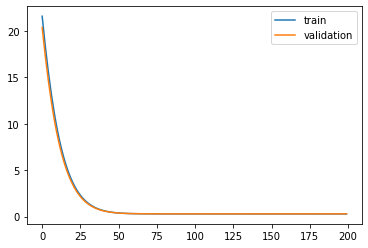

Time to train LSTM:  147.18353581428528
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 21.9029 - acc: 0.4944 - val_loss: 20.9055 - val_acc: 0.5722

Epoch 00001: val_loss improved from inf to 20.90547, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 20.8009 - acc: 0.5776 - val_loss: 19.8405 - val_acc: 0.6434

Epoch 00002: val_loss improved from 20.90547 to 19.84053, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 19.7408 - acc: 0.6489 - val_loss: 18.8171 - val_acc: 0.7029

Epoch 00003: val_loss improved from 19.84053 to 18.81709, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 18.7222 - acc: 0.7004 - val_loss: 17.8344 - val_acc: 0.7417

Epoch 00004: val_loss improved from 18.81709 to 17.83443, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 17.7442 - acc: 0.7366 - val_loss: 16.8918 - val_acc: 0.7662

Epoch 00005: val_loss improved from 17.83443 to 16.89176, saving model to Event_val_weigh


Epoch 00045: val_loss improved from 1.58188 to 1.48926, saving model to Event_val_weights1.hdf5
Epoch 46/200
 - 1s - loss: 1.4857 - acc: 0.8865 - val_loss: 1.4028 - val_acc: 0.8891

Epoch 00046: val_loss improved from 1.48926 to 1.40278, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 1.3998 - acc: 0.8867 - val_loss: 1.3221 - val_acc: 0.8887

Epoch 00047: val_loss improved from 1.40278 to 1.32207, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 1.3196 - acc: 0.8867 - val_loss: 1.2468 - val_acc: 0.8889

Epoch 00048: val_loss improved from 1.32207 to 1.24676, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 1.2448 - acc: 0.8866 - val_loss: 1.1765 - val_acc: 0.8890

Epoch 00049: val_loss improved from 1.24676 to 1.17652, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 1.1750 - acc: 0.8867 - val_loss: 1.1110 - val_acc: 0.8889

Epoch 00050: val_loss improved from 1.17652 to 1.11103, saving model to Event_val_weights

 - 1s - loss: 0.3236 - acc: 0.8870 - val_loss: 0.3164 - val_acc: 0.8882

Epoch 00091: val_loss improved from 0.31865 to 0.31637, saving model to Event_val_weights1.hdf5
Epoch 92/200
 - 1s - loss: 0.3213 - acc: 0.8870 - val_loss: 0.3143 - val_acc: 0.8882

Epoch 00092: val_loss improved from 0.31637 to 0.31430, saving model to Event_val_weights1.hdf5
Epoch 93/200
 - 1s - loss: 0.3193 - acc: 0.8870 - val_loss: 0.3124 - val_acc: 0.8884

Epoch 00093: val_loss improved from 0.31430 to 0.31242, saving model to Event_val_weights1.hdf5
Epoch 94/200
 - 1s - loss: 0.3174 - acc: 0.8870 - val_loss: 0.3107 - val_acc: 0.8884

Epoch 00094: val_loss improved from 0.31242 to 0.31070, saving model to Event_val_weights1.hdf5
Epoch 95/200
 - 1s - loss: 0.3157 - acc: 0.8870 - val_loss: 0.3091 - val_acc: 0.8882

Epoch 00095: val_loss improved from 0.31070 to 0.30915, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.3142 - acc: 0.8870 - val_loss: 0.3077 - val_acc: 0.8882

Epoch 00096: val_

 - 1s - loss: 0.2997 - acc: 0.8870 - val_loss: 0.2945 - val_acc: 0.8892

Epoch 00136: val_loss improved from 0.29450 to 0.29447, saving model to Event_val_weights1.hdf5
Epoch 137/200
 - 1s - loss: 0.2996 - acc: 0.8870 - val_loss: 0.2944 - val_acc: 0.8893

Epoch 00137: val_loss improved from 0.29447 to 0.29444, saving model to Event_val_weights1.hdf5
Epoch 138/200
 - 1s - loss: 0.2996 - acc: 0.8870 - val_loss: 0.2944 - val_acc: 0.8893

Epoch 00138: val_loss improved from 0.29444 to 0.29442, saving model to Event_val_weights1.hdf5
Epoch 139/200
 - 1s - loss: 0.2996 - acc: 0.8870 - val_loss: 0.2944 - val_acc: 0.8894

Epoch 00139: val_loss improved from 0.29442 to 0.29440, saving model to Event_val_weights1.hdf5
Epoch 140/200
 - 1s - loss: 0.2996 - acc: 0.8870 - val_loss: 0.2944 - val_acc: 0.8894

Epoch 00140: val_loss improved from 0.29440 to 0.29438, saving model to Event_val_weights1.hdf5
Epoch 141/200
 - 1s - loss: 0.2996 - acc: 0.8870 - val_loss: 0.2944 - val_acc: 0.8896

Epoch 00141:

 - 1s - loss: 0.2992 - acc: 0.8875 - val_loss: 0.2945 - val_acc: 0.8894

Epoch 00185: val_loss did not improve from 0.29418
Epoch 186/200
 - 1s - loss: 0.2992 - acc: 0.8876 - val_loss: 0.2941 - val_acc: 0.8894

Epoch 00186: val_loss improved from 0.29418 to 0.29413, saving model to Event_val_weights1.hdf5
Epoch 187/200
 - 1s - loss: 0.2992 - acc: 0.8875 - val_loss: 0.2944 - val_acc: 0.8894

Epoch 00187: val_loss did not improve from 0.29413
Epoch 188/200
 - 1s - loss: 0.2992 - acc: 0.8876 - val_loss: 0.2944 - val_acc: 0.8894

Epoch 00188: val_loss did not improve from 0.29413
Epoch 189/200
 - 1s - loss: 0.2992 - acc: 0.8876 - val_loss: 0.2942 - val_acc: 0.8894

Epoch 00189: val_loss did not improve from 0.29413
Epoch 190/200
 - 1s - loss: 0.2992 - acc: 0.8876 - val_loss: 0.2944 - val_acc: 0.8896

Epoch 00190: val_loss did not improve from 0.29413
Epoch 191/200
 - 1s - loss: 0.2992 - acc: 0.8877 - val_loss: 0.2944 - val_acc: 0.8897

Epoch 00191: val_loss did not improve from 0.29413
Epo

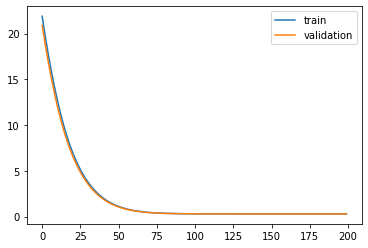

Time to train LSTM:  145.52500224113464
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 21.8409 - acc: 0.5138 - val_loss: 20.8352 - val_acc: 0.5841

Epoch 00001: val_loss improved from inf to 20.83516, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 20.7324 - acc: 0.5890 - val_loss: 19.7681 - val_acc: 0.6530

Epoch 00002: val_loss improved from 20.83516 to 19.76812, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 19.6687 - acc: 0.6579 - val_loss: 18.7446 - val_acc: 0.7017

Epoch 00003: val_loss improved from 19.76812 to 18.74456, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 18.6484 - acc: 0.7091 - val_loss: 17.7631 - val_acc: 0.7340

Epoch 00004: val_loss improved from 18.74456 to 17.76308, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 17.6702 - acc: 0.7406 - val_loss: 16.8224 - val_acc: 0.7552

Epoch 00005: val_loss improved from 17.76308 to 16.82244, saving model to Event_val_weigh


Epoch 00045: val_loss improved from 1.58092 to 1.48909, saving model to Event_val_weights2.hdf5
Epoch 46/200
 - 1s - loss: 1.4727 - acc: 0.8875 - val_loss: 1.4033 - val_acc: 0.8840

Epoch 00046: val_loss improved from 1.48909 to 1.40332, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 1.3875 - acc: 0.8875 - val_loss: 1.3233 - val_acc: 0.8839

Epoch 00047: val_loss improved from 1.40332 to 1.32326, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 1.3080 - acc: 0.8877 - val_loss: 1.2486 - val_acc: 0.8846

Epoch 00048: val_loss improved from 1.32326 to 1.24857, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 1.2338 - acc: 0.8880 - val_loss: 1.1789 - val_acc: 0.8841

Epoch 00049: val_loss improved from 1.24857 to 1.17892, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 1.1646 - acc: 0.8880 - val_loss: 1.1140 - val_acc: 0.8840

Epoch 00050: val_loss improved from 1.17892 to 1.11400, saving model to Event_val_weights

 - 1s - loss: 0.3218 - acc: 0.8884 - val_loss: 0.3275 - val_acc: 0.8840

Epoch 00091: val_loss improved from 0.32975 to 0.32748, saving model to Event_val_weights2.hdf5
Epoch 92/200
 - 1s - loss: 0.3195 - acc: 0.8883 - val_loss: 0.3254 - val_acc: 0.8840

Epoch 00092: val_loss improved from 0.32748 to 0.32544, saving model to Event_val_weights2.hdf5
Epoch 93/200
 - 1s - loss: 0.3175 - acc: 0.8883 - val_loss: 0.3236 - val_acc: 0.8840

Epoch 00093: val_loss improved from 0.32544 to 0.32359, saving model to Event_val_weights2.hdf5
Epoch 94/200
 - 1s - loss: 0.3157 - acc: 0.8883 - val_loss: 0.3219 - val_acc: 0.8840

Epoch 00094: val_loss improved from 0.32359 to 0.32188, saving model to Event_val_weights2.hdf5
Epoch 95/200
 - 1s - loss: 0.3140 - acc: 0.8883 - val_loss: 0.3203 - val_acc: 0.8841

Epoch 00095: val_loss improved from 0.32188 to 0.32034, saving model to Event_val_weights2.hdf5
Epoch 96/200
 - 1s - loss: 0.3124 - acc: 0.8883 - val_loss: 0.3190 - val_acc: 0.8841

Epoch 00096: val_

 - 1s - loss: 0.2980 - acc: 0.8885 - val_loss: 0.3064 - val_acc: 0.8843

Epoch 00138: val_loss did not improve from 0.30630
Epoch 139/200
 - 1s - loss: 0.2980 - acc: 0.8885 - val_loss: 0.3063 - val_acc: 0.8843

Epoch 00139: val_loss did not improve from 0.30630
Epoch 140/200
 - 1s - loss: 0.2979 - acc: 0.8884 - val_loss: 0.3064 - val_acc: 0.8842

Epoch 00140: val_loss did not improve from 0.30630
Epoch 141/200
 - 1s - loss: 0.2979 - acc: 0.8885 - val_loss: 0.3064 - val_acc: 0.8842

Epoch 00141: val_loss did not improve from 0.30630
Epoch 142/200
 - 1s - loss: 0.2979 - acc: 0.8885 - val_loss: 0.3064 - val_acc: 0.8843

Epoch 00142: val_loss did not improve from 0.30630
Epoch 143/200
 - 1s - loss: 0.2979 - acc: 0.8886 - val_loss: 0.3064 - val_acc: 0.8846

Epoch 00143: val_loss did not improve from 0.30630
Epoch 144/200
 - 1s - loss: 0.2979 - acc: 0.8886 - val_loss: 0.3064 - val_acc: 0.8846

Epoch 00144: val_loss did not improve from 0.30630
Epoch 145/200
 - 1s - loss: 0.2979 - acc: 0.8886


Epoch 00197: val_loss did not improve from 0.30630
Epoch 198/200
 - 1s - loss: 0.2973 - acc: 0.8890 - val_loss: 0.3083 - val_acc: 0.8849

Epoch 00198: val_loss did not improve from 0.30630
Epoch 199/200
 - 1s - loss: 0.2971 - acc: 0.8892 - val_loss: 0.3090 - val_acc: 0.8836

Epoch 00199: val_loss did not improve from 0.30630
Epoch 200/200
 - 1s - loss: 0.2972 - acc: 0.8894 - val_loss: 0.3083 - val_acc: 0.8848

Epoch 00200: val_loss did not improve from 0.30630
#################################
Number of units: 64
Batch size: 65536
Fold: 1
best val loss: 0.3062952756881714
#################################


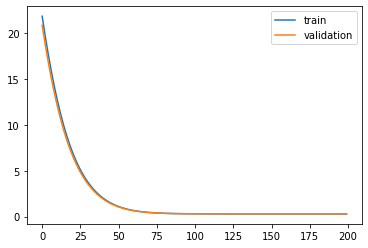

Time to train LSTM:  144.8513262271881
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 21.9558 - acc: 0.5446 - val_loss: 20.9544 - val_acc: 0.6104

Epoch 00001: val_loss improved from inf to 20.95441, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 20.8496 - acc: 0.6209 - val_loss: 19.8862 - val_acc: 0.6778

Epoch 00002: val_loss improved from 20.95441 to 19.88618, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 19.7854 - acc: 0.6827 - val_loss: 18.8597 - val_acc: 0.7220

Epoch 00003: val_loss improved from 19.88618 to 18.85969, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 18.7629 - acc: 0.7246 - val_loss: 17.8743 - val_acc: 0.7480

Epoch 00004: val_loss improved from 18.85969 to 17.87432, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 17.7813 - acc: 0.7529 - val_loss: 16.9293 - val_acc: 0.7704

Epoch 00005: val_loss improved from 17.87432 to 16.92928, saving model to Event_val_weight


Epoch 00045: val_loss improved from 1.59268 to 1.49970, saving model to Event_val_weights3.hdf5
Epoch 46/200
 - 1s - loss: 1.4877 - acc: 0.8871 - val_loss: 1.4129 - val_acc: 0.8859

Epoch 00046: val_loss improved from 1.49970 to 1.41287, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 1.4014 - acc: 0.8872 - val_loss: 1.3318 - val_acc: 0.8858

Epoch 00047: val_loss improved from 1.41287 to 1.33183, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 1.3209 - acc: 0.8873 - val_loss: 1.2562 - val_acc: 0.8857

Epoch 00048: val_loss improved from 1.33183 to 1.25623, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 1.2459 - acc: 0.8873 - val_loss: 1.1857 - val_acc: 0.8858

Epoch 00049: val_loss improved from 1.25623 to 1.18573, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 1.1758 - acc: 0.8873 - val_loss: 1.1200 - val_acc: 0.8860

Epoch 00050: val_loss improved from 1.18573 to 1.12004, saving model to Event_val_weights

 - 1s - loss: 0.3222 - acc: 0.8880 - val_loss: 0.3237 - val_acc: 0.8867

Epoch 00091: val_loss improved from 0.32596 to 0.32369, saving model to Event_val_weights3.hdf5
Epoch 92/200
 - 1s - loss: 0.3199 - acc: 0.8879 - val_loss: 0.3216 - val_acc: 0.8868

Epoch 00092: val_loss improved from 0.32369 to 0.32163, saving model to Event_val_weights3.hdf5
Epoch 93/200
 - 1s - loss: 0.3179 - acc: 0.8880 - val_loss: 0.3198 - val_acc: 0.8868

Epoch 00093: val_loss improved from 0.32163 to 0.31976, saving model to Event_val_weights3.hdf5
Epoch 94/200
 - 1s - loss: 0.3160 - acc: 0.8879 - val_loss: 0.3181 - val_acc: 0.8870

Epoch 00094: val_loss improved from 0.31976 to 0.31806, saving model to Event_val_weights3.hdf5
Epoch 95/200
 - 1s - loss: 0.3143 - acc: 0.8879 - val_loss: 0.3165 - val_acc: 0.8872

Epoch 00095: val_loss improved from 0.31806 to 0.31651, saving model to Event_val_weights3.hdf5
Epoch 96/200
 - 1s - loss: 0.3127 - acc: 0.8878 - val_loss: 0.3151 - val_acc: 0.8872

Epoch 00096: val_


Epoch 00137: val_loss did not improve from 0.30271
Epoch 138/200
 - 1s - loss: 0.2982 - acc: 0.8877 - val_loss: 0.3028 - val_acc: 0.8871

Epoch 00138: val_loss did not improve from 0.30271
Epoch 139/200
 - 1s - loss: 0.2981 - acc: 0.8878 - val_loss: 0.3029 - val_acc: 0.8871

Epoch 00139: val_loss did not improve from 0.30271
Epoch 140/200
 - 1s - loss: 0.2981 - acc: 0.8878 - val_loss: 0.3029 - val_acc: 0.8871

Epoch 00140: val_loss did not improve from 0.30271
Epoch 141/200
 - 1s - loss: 0.2981 - acc: 0.8876 - val_loss: 0.3030 - val_acc: 0.8873

Epoch 00141: val_loss did not improve from 0.30271
Epoch 142/200
 - 1s - loss: 0.2983 - acc: 0.8877 - val_loss: 0.3033 - val_acc: 0.8869

Epoch 00142: val_loss did not improve from 0.30271
Epoch 143/200
 - 1s - loss: 0.2987 - acc: 0.8877 - val_loss: 0.3033 - val_acc: 0.8869

Epoch 00143: val_loss did not improve from 0.30271
Epoch 144/200
 - 1s - loss: 0.2986 - acc: 0.8877 - val_loss: 0.3030 - val_acc: 0.8868

Epoch 00144: val_loss did not imp

 - 1s - loss: 0.2975 - acc: 0.8887 - val_loss: 0.3059 - val_acc: 0.8874

Epoch 00197: val_loss did not improve from 0.30271
Epoch 198/200
 - 1s - loss: 0.2976 - acc: 0.8888 - val_loss: 0.3054 - val_acc: 0.8872

Epoch 00198: val_loss did not improve from 0.30271
Epoch 199/200
 - 1s - loss: 0.2982 - acc: 0.8887 - val_loss: 0.3046 - val_acc: 0.8879

Epoch 00199: val_loss did not improve from 0.30271
Epoch 200/200
 - 1s - loss: 0.2975 - acc: 0.8890 - val_loss: 0.3051 - val_acc: 0.8873

Epoch 00200: val_loss did not improve from 0.30271
#################################
Number of units: 64
Batch size: 65536
Fold: 2
best val loss: 0.30270591378211975
#################################


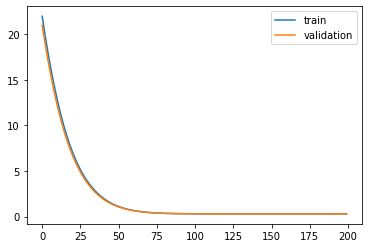

Time to train LSTM:  146.25058007240295
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 21.8727 - acc: 0.5180 - val_loss: 20.8723 - val_acc: 0.5982

Epoch 00001: val_loss improved from inf to 20.87233, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 20.7712 - acc: 0.6010 - val_loss: 19.8089 - val_acc: 0.6654

Epoch 00002: val_loss improved from 20.87233 to 19.80889, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 19.7114 - acc: 0.6657 - val_loss: 18.7869 - val_acc: 0.7068

Epoch 00003: val_loss improved from 19.80889 to 18.78687, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 18.6929 - acc: 0.7121 - val_loss: 17.8055 - val_acc: 0.7348

Epoch 00004: val_loss improved from 18.78687 to 17.80555, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 17.7151 - acc: 0.7402 - val_loss: 16.8642 - val_acc: 0.7527

Epoch 00005: val_loss improved from 17.80555 to 16.86416, saving model to Event_val_weigh


Epoch 00045: val_loss improved from 1.58552 to 1.49331, saving model to Event_val_weights4.hdf5
Epoch 46/200
 - 1s - loss: 1.4771 - acc: 0.8873 - val_loss: 1.4072 - val_acc: 0.8836

Epoch 00046: val_loss improved from 1.49331 to 1.40717, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 1.3915 - acc: 0.8873 - val_loss: 1.3268 - val_acc: 0.8838

Epoch 00047: val_loss improved from 1.40717 to 1.32677, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 1.3117 - acc: 0.8875 - val_loss: 1.2518 - val_acc: 0.8840

Epoch 00048: val_loss improved from 1.32677 to 1.25177, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 1.2372 - acc: 0.8874 - val_loss: 1.1819 - val_acc: 0.8848

Epoch 00049: val_loss improved from 1.25177 to 1.18186, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 1.1678 - acc: 0.8876 - val_loss: 1.1167 - val_acc: 0.8847

Epoch 00050: val_loss improved from 1.18186 to 1.11671, saving model to Event_val_weights

 - 1s - loss: 0.3218 - acc: 0.8878 - val_loss: 0.3271 - val_acc: 0.8846

Epoch 00091: val_loss improved from 0.32933 to 0.32707, saving model to Event_val_weights4.hdf5
Epoch 92/200
 - 1s - loss: 0.3196 - acc: 0.8878 - val_loss: 0.3250 - val_acc: 0.8846

Epoch 00092: val_loss improved from 0.32707 to 0.32502, saving model to Event_val_weights4.hdf5
Epoch 93/200
 - 1s - loss: 0.3176 - acc: 0.8878 - val_loss: 0.3231 - val_acc: 0.8847

Epoch 00093: val_loss improved from 0.32502 to 0.32314, saving model to Event_val_weights4.hdf5
Epoch 94/200
 - 1s - loss: 0.3157 - acc: 0.8878 - val_loss: 0.3214 - val_acc: 0.8848

Epoch 00094: val_loss improved from 0.32314 to 0.32144, saving model to Event_val_weights4.hdf5
Epoch 95/200
 - 1s - loss: 0.3140 - acc: 0.8878 - val_loss: 0.3199 - val_acc: 0.8848

Epoch 00095: val_loss improved from 0.32144 to 0.31990, saving model to Event_val_weights4.hdf5
Epoch 96/200
 - 1s - loss: 0.3125 - acc: 0.8878 - val_loss: 0.3185 - val_acc: 0.8848

Epoch 00096: val_


Epoch 00137: val_loss did not improve from 0.30588
Epoch 138/200
 - 1s - loss: 0.2980 - acc: 0.8883 - val_loss: 0.3059 - val_acc: 0.8840

Epoch 00138: val_loss did not improve from 0.30588
Epoch 139/200
 - 1s - loss: 0.2979 - acc: 0.8883 - val_loss: 0.3059 - val_acc: 0.8838

Epoch 00139: val_loss did not improve from 0.30588
Epoch 140/200
 - 1s - loss: 0.2980 - acc: 0.8883 - val_loss: 0.3060 - val_acc: 0.8836

Epoch 00140: val_loss did not improve from 0.30588
Epoch 141/200
 - 1s - loss: 0.2979 - acc: 0.8884 - val_loss: 0.3059 - val_acc: 0.8838

Epoch 00141: val_loss did not improve from 0.30588
Epoch 142/200
 - 1s - loss: 0.2979 - acc: 0.8884 - val_loss: 0.3060 - val_acc: 0.8836

Epoch 00142: val_loss did not improve from 0.30588
Epoch 143/200
 - 1s - loss: 0.2979 - acc: 0.8884 - val_loss: 0.3060 - val_acc: 0.8832

Epoch 00143: val_loss did not improve from 0.30588
Epoch 144/200
 - 1s - loss: 0.2979 - acc: 0.8882 - val_loss: 0.3060 - val_acc: 0.8839

Epoch 00144: val_loss did not imp

 - 1s - loss: 0.2972 - acc: 0.8891 - val_loss: 0.3083 - val_acc: 0.8848

Epoch 00197: val_loss did not improve from 0.30588
Epoch 198/200
 - 1s - loss: 0.2970 - acc: 0.8893 - val_loss: 0.3086 - val_acc: 0.8840

Epoch 00198: val_loss did not improve from 0.30588
Epoch 199/200
 - 1s - loss: 0.2973 - acc: 0.8890 - val_loss: 0.3081 - val_acc: 0.8841

Epoch 00199: val_loss did not improve from 0.30588
Epoch 200/200
 - 1s - loss: 0.2973 - acc: 0.8890 - val_loss: 0.3081 - val_acc: 0.8848

Epoch 00200: val_loss did not improve from 0.30588
#################################
Number of units: 64
Batch size: 65536
Fold: 3
best val loss: 0.3058761954307556
#################################


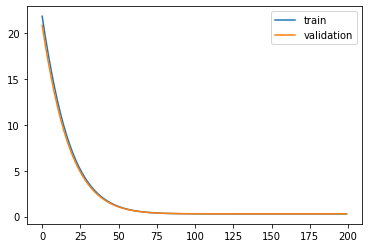

Time to train LSTM:  146.04730415344238
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 21.9097 - acc: 0.5311 - val_loss: 20.9075 - val_acc: 0.5849

Epoch 00001: val_loss improved from inf to 20.90746, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 20.8044 - acc: 0.5850 - val_loss: 19.8402 - val_acc: 0.6330

Epoch 00002: val_loss improved from 20.90746 to 19.84023, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 19.7418 - acc: 0.6325 - val_loss: 18.8151 - val_acc: 0.6739

Epoch 00003: val_loss improved from 19.84023 to 18.81510, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 18.7211 - acc: 0.6734 - val_loss: 17.8313 - val_acc: 0.7049

Epoch 00004: val_loss improved from 18.81510 to 17.83126, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 17.7416 - acc: 0.7053 - val_loss: 16.8878 - val_acc: 0.7310

Epoch 00005: val_loss improved from 17.83126 to 16.88785, saving model to Event_val_weigh


Epoch 00045: val_loss improved from 1.58720 to 1.49472, saving model to Event_val_weights5.hdf5
Epoch 46/200
 - 1s - loss: 1.4821 - acc: 0.8868 - val_loss: 1.4083 - val_acc: 0.8850

Epoch 00046: val_loss improved from 1.49472 to 1.40834, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 1.3963 - acc: 0.8870 - val_loss: 1.3277 - val_acc: 0.8857

Epoch 00047: val_loss improved from 1.40834 to 1.32771, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 1.3163 - acc: 0.8871 - val_loss: 1.2525 - val_acc: 0.8856

Epoch 00048: val_loss improved from 1.32771 to 1.25248, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 1.2416 - acc: 0.8871 - val_loss: 1.1823 - val_acc: 0.8860

Epoch 00049: val_loss improved from 1.25248 to 1.18234, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 1.1720 - acc: 0.8872 - val_loss: 1.1170 - val_acc: 0.8858

Epoch 00050: val_loss improved from 1.18234 to 1.11699, saving model to Event_val_weights

 - 1s - loss: 0.3224 - acc: 0.8878 - val_loss: 0.3236 - val_acc: 0.8880

Epoch 00091: val_loss improved from 0.32589 to 0.32362, saving model to Event_val_weights5.hdf5
Epoch 92/200
 - 1s - loss: 0.3201 - acc: 0.8877 - val_loss: 0.3215 - val_acc: 0.8880

Epoch 00092: val_loss improved from 0.32362 to 0.32155, saving model to Event_val_weights5.hdf5
Epoch 93/200
 - 1s - loss: 0.3181 - acc: 0.8877 - val_loss: 0.3197 - val_acc: 0.8880

Epoch 00093: val_loss improved from 0.32155 to 0.31967, saving model to Event_val_weights5.hdf5
Epoch 94/200
 - 1s - loss: 0.3162 - acc: 0.8877 - val_loss: 0.3180 - val_acc: 0.8878

Epoch 00094: val_loss improved from 0.31967 to 0.31795, saving model to Event_val_weights5.hdf5
Epoch 95/200
 - 1s - loss: 0.3145 - acc: 0.8877 - val_loss: 0.3164 - val_acc: 0.8878

Epoch 00095: val_loss improved from 0.31795 to 0.31640, saving model to Event_val_weights5.hdf5
Epoch 96/200
 - 1s - loss: 0.3130 - acc: 0.8877 - val_loss: 0.3150 - val_acc: 0.8877

Epoch 00096: val_


Epoch 00136: val_loss did not improve from 0.30215
Epoch 137/200
 - 1s - loss: 0.2984 - acc: 0.8880 - val_loss: 0.3021 - val_acc: 0.8874

Epoch 00137: val_loss improved from 0.30215 to 0.30214, saving model to Event_val_weights5.hdf5
Epoch 138/200
 - 1s - loss: 0.2984 - acc: 0.8880 - val_loss: 0.3021 - val_acc: 0.8874

Epoch 00138: val_loss improved from 0.30214 to 0.30208, saving model to Event_val_weights5.hdf5
Epoch 139/200
 - 1s - loss: 0.2984 - acc: 0.8880 - val_loss: 0.3021 - val_acc: 0.8873

Epoch 00139: val_loss did not improve from 0.30208
Epoch 140/200
 - 1s - loss: 0.2983 - acc: 0.8881 - val_loss: 0.3025 - val_acc: 0.8873

Epoch 00140: val_loss did not improve from 0.30208
Epoch 141/200
 - 1s - loss: 0.2983 - acc: 0.8881 - val_loss: 0.3022 - val_acc: 0.8878

Epoch 00141: val_loss did not improve from 0.30208
Epoch 142/200
 - 1s - loss: 0.2983 - acc: 0.8881 - val_loss: 0.3021 - val_acc: 0.8877

Epoch 00142: val_loss did not improve from 0.30208
Epoch 143/200
 - 1s - loss: 0.

 - 1s - loss: 0.2972 - acc: 0.8888 - val_loss: 0.3037 - val_acc: 0.8879

Epoch 00193: val_loss did not improve from 0.30140
Epoch 194/200
 - 1s - loss: 0.2982 - acc: 0.8886 - val_loss: 0.3039 - val_acc: 0.8880

Epoch 00194: val_loss did not improve from 0.30140
Epoch 195/200
 - 1s - loss: 0.2980 - acc: 0.8888 - val_loss: 0.3020 - val_acc: 0.8880

Epoch 00195: val_loss did not improve from 0.30140
Epoch 196/200
 - 1s - loss: 0.2970 - acc: 0.8889 - val_loss: 0.3023 - val_acc: 0.8866

Epoch 00196: val_loss did not improve from 0.30140
Epoch 197/200
 - 1s - loss: 0.2974 - acc: 0.8880 - val_loss: 0.3028 - val_acc: 0.8871

Epoch 00197: val_loss did not improve from 0.30140
Epoch 198/200
 - 1s - loss: 0.2971 - acc: 0.8890 - val_loss: 0.3039 - val_acc: 0.8880

Epoch 00198: val_loss did not improve from 0.30140
Epoch 199/200
 - 1s - loss: 0.2982 - acc: 0.8887 - val_loss: 0.3045 - val_acc: 0.8881

Epoch 00199: val_loss did not improve from 0.30140
Epoch 200/200
 - 1s - loss: 0.2982 - acc: 0.8889

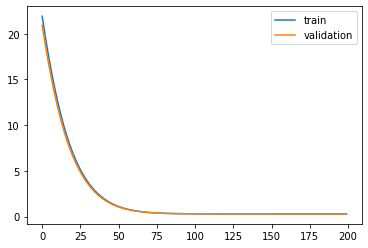

Time to train LSTM:  145.88632798194885
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 20.3823 - acc: 0.7788 - val_loss: 13.6207 - val_acc: 0.8774

Epoch 00001: val_loss improved from inf to 13.62075, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 9.7239 - acc: 0.8805 - val_loss: 6.2121 - val_acc: 0.8851

Epoch 00002: val_loss improved from 13.62075 to 6.21208, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 4.3354 - acc: 0.8850 - val_loss: 2.6994 - val_acc: 0.8886

Epoch 00003: val_loss improved from 6.21208 to 2.69940, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 1.8872 - acc: 0.8855 - val_loss: 1.1913 - val_acc: 0.8876

Epoch 00004: val_loss improved from 2.69940 to 1.19134, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 0.8740 - acc: 0.8856 - val_loss: 0.6010 - val_acc: 0.8873

Epoch 00005: val_loss improved from 1.19134 to 0.60100, saving model to Event_val_weights1.hdf5
Epoch 

 - 1s - loss: 0.3023 - acc: 0.8868 - val_loss: 0.2951 - val_acc: 0.8887

Epoch 00050: val_loss improved from 0.29517 to 0.29508, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.3023 - acc: 0.8869 - val_loss: 0.2951 - val_acc: 0.8882

Epoch 00051: val_loss did not improve from 0.29508
Epoch 52/200
 - 1s - loss: 0.3021 - acc: 0.8869 - val_loss: 0.2952 - val_acc: 0.8884

Epoch 00052: val_loss did not improve from 0.29508
Epoch 53/200
 - 1s - loss: 0.3022 - acc: 0.8869 - val_loss: 0.2950 - val_acc: 0.8879

Epoch 00053: val_loss improved from 0.29508 to 0.29505, saving model to Event_val_weights1.hdf5
Epoch 54/200
 - 1s - loss: 0.3020 - acc: 0.8869 - val_loss: 0.2948 - val_acc: 0.8884

Epoch 00054: val_loss improved from 0.29505 to 0.29484, saving model to Event_val_weights1.hdf5
Epoch 55/200
 - 1s - loss: 0.3019 - acc: 0.8868 - val_loss: 0.2951 - val_acc: 0.8881

Epoch 00055: val_loss did not improve from 0.29484
Epoch 56/200
 - 1s - loss: 0.3018 - acc: 0.8868 - val_lo


Epoch 00105: val_loss did not improve from 0.29378
Epoch 106/200
 - 1s - loss: 0.2997 - acc: 0.8881 - val_loss: 0.2950 - val_acc: 0.8880

Epoch 00106: val_loss did not improve from 0.29378
Epoch 107/200
 - 1s - loss: 0.2997 - acc: 0.8880 - val_loss: 0.2952 - val_acc: 0.8882

Epoch 00107: val_loss did not improve from 0.29378
Epoch 108/200
 - 1s - loss: 0.2995 - acc: 0.8880 - val_loss: 0.2949 - val_acc: 0.8879

Epoch 00108: val_loss did not improve from 0.29378
Epoch 109/200
 - 1s - loss: 0.2996 - acc: 0.8880 - val_loss: 0.2954 - val_acc: 0.8877

Epoch 00109: val_loss did not improve from 0.29378
Epoch 110/200
 - 1s - loss: 0.2996 - acc: 0.8882 - val_loss: 0.2952 - val_acc: 0.8879

Epoch 00110: val_loss did not improve from 0.29378
Epoch 111/200
 - 1s - loss: 0.2995 - acc: 0.8880 - val_loss: 0.2952 - val_acc: 0.8871

Epoch 00111: val_loss did not improve from 0.29378
Epoch 112/200
 - 1s - loss: 0.2996 - acc: 0.8883 - val_loss: 0.2955 - val_acc: 0.8876

Epoch 00112: val_loss did not imp

 - 1s - loss: 0.2986 - acc: 0.8886 - val_loss: 0.2959 - val_acc: 0.8878

Epoch 00165: val_loss did not improve from 0.29378
Epoch 166/200
 - 1s - loss: 0.2986 - acc: 0.8883 - val_loss: 0.2957 - val_acc: 0.8881

Epoch 00166: val_loss did not improve from 0.29378
Epoch 167/200
 - 1s - loss: 0.2984 - acc: 0.8885 - val_loss: 0.2955 - val_acc: 0.8878

Epoch 00167: val_loss did not improve from 0.29378
Epoch 168/200
 - 1s - loss: 0.2984 - acc: 0.8882 - val_loss: 0.2961 - val_acc: 0.8874

Epoch 00168: val_loss did not improve from 0.29378
Epoch 169/200
 - 1s - loss: 0.2984 - acc: 0.8884 - val_loss: 0.2961 - val_acc: 0.8877

Epoch 00169: val_loss did not improve from 0.29378
Epoch 170/200
 - 1s - loss: 0.2985 - acc: 0.8884 - val_loss: 0.2958 - val_acc: 0.8883

Epoch 00170: val_loss did not improve from 0.29378
Epoch 171/200
 - 1s - loss: 0.2984 - acc: 0.8887 - val_loss: 0.2961 - val_acc: 0.8882

Epoch 00171: val_loss did not improve from 0.29378
Epoch 172/200
 - 1s - loss: 0.2985 - acc: 0.8884

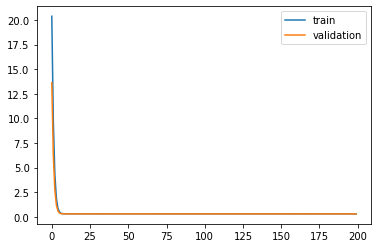

Time to train LSTM:  161.75141167640686
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 20.5048 - acc: 0.7602 - val_loss: 13.7150 - val_acc: 0.8692

Epoch 00001: val_loss improved from inf to 13.71500, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 9.7849 - acc: 0.8804 - val_loss: 6.2726 - val_acc: 0.8791

Epoch 00002: val_loss improved from 13.71500 to 6.27264, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 4.3704 - acc: 0.8851 - val_loss: 2.7375 - val_acc: 0.8820

Epoch 00003: val_loss improved from 6.27264 to 2.73755, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 1.9040 - acc: 0.8855 - val_loss: 1.2147 - val_acc: 0.8832

Epoch 00004: val_loss improved from 2.73755 to 1.21473, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 0.8808 - acc: 0.8858 - val_loss: 0.6165 - val_acc: 0.8841

Epoch 00005: val_loss improved from 1.21473 to 0.61647, saving model to Event_val_weights2.hdf5
Epoch 


Epoch 00048: val_loss did not improve from 0.30632
Epoch 49/200
 - 1s - loss: 0.3007 - acc: 0.8874 - val_loss: 0.3062 - val_acc: 0.8828

Epoch 00049: val_loss improved from 0.30632 to 0.30616, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.3006 - acc: 0.8874 - val_loss: 0.3063 - val_acc: 0.8830

Epoch 00050: val_loss did not improve from 0.30616
Epoch 51/200
 - 1s - loss: 0.3006 - acc: 0.8874 - val_loss: 0.3060 - val_acc: 0.8828

Epoch 00051: val_loss improved from 0.30616 to 0.30604, saving model to Event_val_weights2.hdf5
Epoch 52/200
 - 1s - loss: 0.3005 - acc: 0.8875 - val_loss: 0.3062 - val_acc: 0.8829

Epoch 00052: val_loss did not improve from 0.30604
Epoch 53/200
 - 1s - loss: 0.3005 - acc: 0.8875 - val_loss: 0.3060 - val_acc: 0.8828

Epoch 00053: val_loss improved from 0.30604 to 0.30598, saving model to Event_val_weights2.hdf5
Epoch 54/200
 - 1s - loss: 0.3004 - acc: 0.8874 - val_loss: 0.3060 - val_acc: 0.8828

Epoch 00054: val_loss did not improve from


Epoch 00104: val_loss did not improve from 0.30540
Epoch 105/200
 - 1s - loss: 0.2986 - acc: 0.8882 - val_loss: 0.3058 - val_acc: 0.8848

Epoch 00105: val_loss did not improve from 0.30540
Epoch 106/200
 - 1s - loss: 0.2986 - acc: 0.8886 - val_loss: 0.3060 - val_acc: 0.8839

Epoch 00106: val_loss did not improve from 0.30540
Epoch 107/200
 - 1s - loss: 0.2984 - acc: 0.8886 - val_loss: 0.3058 - val_acc: 0.8841

Epoch 00107: val_loss did not improve from 0.30540
Epoch 108/200
 - 1s - loss: 0.2985 - acc: 0.8887 - val_loss: 0.3060 - val_acc: 0.8838

Epoch 00108: val_loss did not improve from 0.30540
Epoch 109/200
 - 1s - loss: 0.2983 - acc: 0.8889 - val_loss: 0.3058 - val_acc: 0.8839

Epoch 00109: val_loss did not improve from 0.30540
Epoch 110/200
 - 1s - loss: 0.2986 - acc: 0.8886 - val_loss: 0.3059 - val_acc: 0.8838

Epoch 00110: val_loss did not improve from 0.30540
Epoch 111/200
 - 1s - loss: 0.2983 - acc: 0.8887 - val_loss: 0.3060 - val_acc: 0.8830

Epoch 00111: val_loss did not imp

 - 1s - loss: 0.2972 - acc: 0.8890 - val_loss: 0.3084 - val_acc: 0.8838

Epoch 00164: val_loss did not improve from 0.30540
Epoch 165/200
 - 1s - loss: 0.2971 - acc: 0.8893 - val_loss: 0.3087 - val_acc: 0.8826

Epoch 00165: val_loss did not improve from 0.30540
Epoch 166/200
 - 1s - loss: 0.2972 - acc: 0.8893 - val_loss: 0.3088 - val_acc: 0.8831

Epoch 00166: val_loss did not improve from 0.30540
Epoch 167/200
 - 1s - loss: 0.2973 - acc: 0.8892 - val_loss: 0.3075 - val_acc: 0.8833

Epoch 00167: val_loss did not improve from 0.30540
Epoch 168/200
 - 1s - loss: 0.2971 - acc: 0.8896 - val_loss: 0.3078 - val_acc: 0.8842

Epoch 00168: val_loss did not improve from 0.30540
Epoch 169/200
 - 1s - loss: 0.2971 - acc: 0.8895 - val_loss: 0.3080 - val_acc: 0.8840

Epoch 00169: val_loss did not improve from 0.30540
Epoch 170/200
 - 1s - loss: 0.2974 - acc: 0.8893 - val_loss: 0.3078 - val_acc: 0.8838

Epoch 00170: val_loss did not improve from 0.30540
Epoch 171/200
 - 1s - loss: 0.2972 - acc: 0.8897

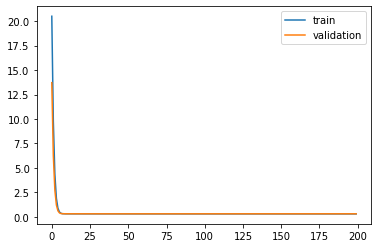

Time to train LSTM:  162.47734689712524
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 20.4591 - acc: 0.7509 - val_loss: 13.6835 - val_acc: 0.8668

Epoch 00001: val_loss improved from inf to 13.68355, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 9.7576 - acc: 0.8791 - val_loss: 6.2455 - val_acc: 0.8833

Epoch 00002: val_loss improved from 13.68355 to 6.24549, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 4.3538 - acc: 0.8853 - val_loss: 2.7206 - val_acc: 0.8861

Epoch 00003: val_loss improved from 6.24549 to 2.72063, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 1.8961 - acc: 0.8855 - val_loss: 1.2047 - val_acc: 0.8866

Epoch 00004: val_loss improved from 2.72063 to 1.20473, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 0.8784 - acc: 0.8847 - val_loss: 0.6111 - val_acc: 0.8867

Epoch 00005: val_loss improved from 1.20473 to 0.61105, saving model to Event_val_weights3.hdf5
Epoch 

 - 1s - loss: 0.3018 - acc: 0.8867 - val_loss: 0.3034 - val_acc: 0.8882

Epoch 00048: val_loss improved from 0.30349 to 0.30338, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.3018 - acc: 0.8868 - val_loss: 0.3035 - val_acc: 0.8881

Epoch 00049: val_loss did not improve from 0.30338
Epoch 50/200
 - 1s - loss: 0.3017 - acc: 0.8867 - val_loss: 0.3034 - val_acc: 0.8878

Epoch 00050: val_loss did not improve from 0.30338
Epoch 51/200
 - 1s - loss: 0.3018 - acc: 0.8866 - val_loss: 0.3034 - val_acc: 0.8882

Epoch 00051: val_loss did not improve from 0.30338
Epoch 52/200
 - 1s - loss: 0.3015 - acc: 0.8866 - val_loss: 0.3033 - val_acc: 0.8880

Epoch 00052: val_loss improved from 0.30338 to 0.30331, saving model to Event_val_weights3.hdf5
Epoch 53/200
 - 1s - loss: 0.3016 - acc: 0.8866 - val_loss: 0.3033 - val_acc: 0.8882

Epoch 00053: val_loss did not improve from 0.30331
Epoch 54/200
 - 1s - loss: 0.3014 - acc: 0.8865 - val_loss: 0.3033 - val_acc: 0.8883

Epoch 00054: va


Epoch 00106: val_loss did not improve from 0.30321
Epoch 107/200
 - 1s - loss: 0.2990 - acc: 0.8877 - val_loss: 0.3042 - val_acc: 0.8874

Epoch 00107: val_loss did not improve from 0.30321
Epoch 108/200
 - 1s - loss: 0.2990 - acc: 0.8878 - val_loss: 0.3043 - val_acc: 0.8879

Epoch 00108: val_loss did not improve from 0.30321
Epoch 109/200
 - 1s - loss: 0.2989 - acc: 0.8877 - val_loss: 0.3042 - val_acc: 0.8880

Epoch 00109: val_loss did not improve from 0.30321
Epoch 110/200
 - 1s - loss: 0.2990 - acc: 0.8878 - val_loss: 0.3047 - val_acc: 0.8879

Epoch 00110: val_loss did not improve from 0.30321
Epoch 111/200
 - 1s - loss: 0.2991 - acc: 0.8881 - val_loss: 0.3047 - val_acc: 0.8877

Epoch 00111: val_loss did not improve from 0.30321
Epoch 112/200
 - 1s - loss: 0.2989 - acc: 0.8880 - val_loss: 0.3048 - val_acc: 0.8880

Epoch 00112: val_loss did not improve from 0.30321
Epoch 113/200
 - 1s - loss: 0.2989 - acc: 0.8879 - val_loss: 0.3045 - val_acc: 0.8880

Epoch 00113: val_loss did not imp

 - 1s - loss: 0.2981 - acc: 0.8885 - val_loss: 0.3067 - val_acc: 0.8873

Epoch 00166: val_loss did not improve from 0.30321
Epoch 167/200
 - 1s - loss: 0.2982 - acc: 0.8887 - val_loss: 0.3074 - val_acc: 0.8859

Epoch 00167: val_loss did not improve from 0.30321
Epoch 168/200
 - 1s - loss: 0.2982 - acc: 0.8889 - val_loss: 0.3072 - val_acc: 0.8878

Epoch 00168: val_loss did not improve from 0.30321
Epoch 169/200
 - 1s - loss: 0.2979 - acc: 0.8889 - val_loss: 0.3067 - val_acc: 0.8868

Epoch 00169: val_loss did not improve from 0.30321
Epoch 170/200
 - 1s - loss: 0.2980 - acc: 0.8886 - val_loss: 0.3076 - val_acc: 0.8863

Epoch 00170: val_loss did not improve from 0.30321
Epoch 171/200
 - 1s - loss: 0.2978 - acc: 0.8890 - val_loss: 0.3077 - val_acc: 0.8854

Epoch 00171: val_loss did not improve from 0.30321
Epoch 172/200
 - 1s - loss: 0.2980 - acc: 0.8889 - val_loss: 0.3071 - val_acc: 0.8862

Epoch 00172: val_loss did not improve from 0.30321
Epoch 173/200
 - 1s - loss: 0.2984 - acc: 0.8887

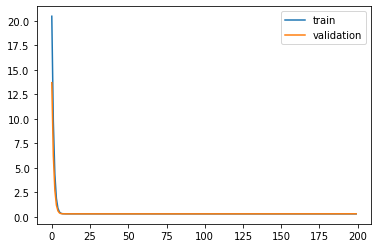

Time to train LSTM:  162.74833583831787


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8ef5428f28>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 10s - loss: 20.4460 - acc: 0.7731 - val_loss: 13.6739 - val_acc: 0.8724

Epoch 00001: val_loss improved from inf to 13.67386, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 9.7524 - acc: 0.8808 - val_loss: 6.2468 - val_acc: 0.8812

Epoch 00002: val_loss improved from 13.67386 to 6.24684, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 4.3525 - acc: 0.8848 - val_loss: 2.7237 - val_acc: 0.8838

Epoch 00003: val_loss improved from 6.24684 to 2.72372, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 1.8949 - acc: 0.8861 - val_loss: 1.2094 - val_acc: 0.8828

Epoch 00004: val_loss improved from 2.72372 to 1.20935, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 0.8770 - acc: 0.8855 - val_loss: 0.6161 - val_acc: 0.8814

Epoch 00005: val_loss improved from 1.20935 to 0.61615, saving model to Event_val_weights4.hdf5
Epoch 6/200
 - 1s - loss: 0.4923 - acc: 0.886

 - 1s - loss: 0.3010 - acc: 0.8872 - val_loss: 0.3073 - val_acc: 0.8827

Epoch 00048: val_loss did not improve from 0.30713
Epoch 49/200
 - 1s - loss: 0.3010 - acc: 0.8872 - val_loss: 0.3070 - val_acc: 0.8828

Epoch 00049: val_loss improved from 0.30713 to 0.30699, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3008 - acc: 0.8872 - val_loss: 0.3071 - val_acc: 0.8829

Epoch 00050: val_loss did not improve from 0.30699
Epoch 51/200
 - 1s - loss: 0.3009 - acc: 0.8872 - val_loss: 0.3069 - val_acc: 0.8828

Epoch 00051: val_loss improved from 0.30699 to 0.30691, saving model to Event_val_weights4.hdf5
Epoch 52/200
 - 1s - loss: 0.3006 - acc: 0.8874 - val_loss: 0.3069 - val_acc: 0.8830

Epoch 00052: val_loss did not improve from 0.30691
Epoch 53/200
 - 1s - loss: 0.3009 - acc: 0.8874 - val_loss: 0.3069 - val_acc: 0.8830

Epoch 00053: val_loss did not improve from 0.30691
Epoch 54/200
 - 1s - loss: 0.3006 - acc: 0.8871 - val_loss: 0.3069 - val_acc: 0.8828

Epoch 00054: va

 - 1s - loss: 0.2986 - acc: 0.8880 - val_loss: 0.3058 - val_acc: 0.8833

Epoch 00102: val_loss did not improve from 0.30548
Epoch 103/200
 - 1s - loss: 0.2985 - acc: 0.8885 - val_loss: 0.3056 - val_acc: 0.8833

Epoch 00103: val_loss did not improve from 0.30548
Epoch 104/200
 - 1s - loss: 0.2987 - acc: 0.8886 - val_loss: 0.3056 - val_acc: 0.8834

Epoch 00104: val_loss did not improve from 0.30548
Epoch 105/200
 - 1s - loss: 0.2985 - acc: 0.8886 - val_loss: 0.3057 - val_acc: 0.8839

Epoch 00105: val_loss did not improve from 0.30548
Epoch 106/200
 - 1s - loss: 0.2984 - acc: 0.8886 - val_loss: 0.3055 - val_acc: 0.8844

Epoch 00106: val_loss improved from 0.30548 to 0.30548, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.2983 - acc: 0.8883 - val_loss: 0.3060 - val_acc: 0.8834

Epoch 00107: val_loss did not improve from 0.30548
Epoch 108/200
 - 1s - loss: 0.2982 - acc: 0.8883 - val_loss: 0.3058 - val_acc: 0.8844

Epoch 00108: val_loss did not improve from 0.30548
Epo

 - 1s - loss: 0.2975 - acc: 0.8893 - val_loss: 0.3072 - val_acc: 0.8821

Epoch 00161: val_loss did not improve from 0.30537
Epoch 162/200
 - 1s - loss: 0.2979 - acc: 0.8890 - val_loss: 0.3072 - val_acc: 0.8830

Epoch 00162: val_loss did not improve from 0.30537
Epoch 163/200
 - 1s - loss: 0.2975 - acc: 0.8892 - val_loss: 0.3079 - val_acc: 0.8827

Epoch 00163: val_loss did not improve from 0.30537
Epoch 164/200
 - 1s - loss: 0.2976 - acc: 0.8891 - val_loss: 0.3076 - val_acc: 0.8824

Epoch 00164: val_loss did not improve from 0.30537
Epoch 165/200
 - 1s - loss: 0.2972 - acc: 0.8896 - val_loss: 0.3080 - val_acc: 0.8828

Epoch 00165: val_loss did not improve from 0.30537
Epoch 166/200
 - 1s - loss: 0.2970 - acc: 0.8893 - val_loss: 0.3081 - val_acc: 0.8823

Epoch 00166: val_loss did not improve from 0.30537
Epoch 167/200
 - 1s - loss: 0.2971 - acc: 0.8895 - val_loss: 0.3082 - val_acc: 0.8822

Epoch 00167: val_loss did not improve from 0.30537
Epoch 168/200
 - 1s - loss: 0.2970 - acc: 0.8891

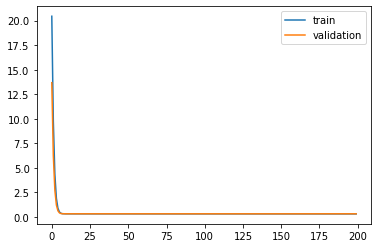

Time to train LSTM:  172.9244863986969
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 10s - loss: 20.2411 - acc: 0.7757 - val_loss: 13.5215 - val_acc: 0.8722

Epoch 00001: val_loss improved from inf to 13.52147, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 9.6419 - acc: 0.8816 - val_loss: 6.1719 - val_acc: 0.8846

Epoch 00002: val_loss improved from 13.52147 to 6.17191, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 4.3035 - acc: 0.8855 - val_loss: 2.6917 - val_acc: 0.8854

Epoch 00003: val_loss improved from 6.17191 to 2.69167, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 1.8767 - acc: 0.8862 - val_loss: 1.1947 - val_acc: 0.8873

Epoch 00004: val_loss improved from 2.69167 to 1.19470, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 0.8707 - acc: 0.8862 - val_loss: 0.6067 - val_acc: 0.8869

Epoch 00005: val_loss improved from 1.19470 to 0.60673, saving model to Event_val_weights5.hdf5
Epoch 


Epoch 00048: val_loss did not improve from 0.30233
Epoch 49/200
 - 1s - loss: 0.3007 - acc: 0.8870 - val_loss: 0.3023 - val_acc: 0.8879

Epoch 00049: val_loss improved from 0.30233 to 0.30226, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3006 - acc: 0.8871 - val_loss: 0.3024 - val_acc: 0.8880

Epoch 00050: val_loss did not improve from 0.30226
Epoch 51/200
 - 1s - loss: 0.3007 - acc: 0.8870 - val_loss: 0.3023 - val_acc: 0.8879

Epoch 00051: val_loss did not improve from 0.30226
Epoch 52/200
 - 1s - loss: 0.3007 - acc: 0.8871 - val_loss: 0.3026 - val_acc: 0.8878

Epoch 00052: val_loss did not improve from 0.30226
Epoch 53/200
 - 1s - loss: 0.3006 - acc: 0.8870 - val_loss: 0.3021 - val_acc: 0.8879

Epoch 00053: val_loss improved from 0.30226 to 0.30215, saving model to Event_val_weights5.hdf5
Epoch 54/200
 - 1s - loss: 0.3004 - acc: 0.8871 - val_loss: 0.3023 - val_acc: 0.8880

Epoch 00054: val_loss did not improve from 0.30215
Epoch 55/200
 - 1s - loss: 0.3004 - 


Epoch 00105: val_loss did not improve from 0.30179
Epoch 106/200
 - 1s - loss: 0.2994 - acc: 0.8875 - val_loss: 0.3023 - val_acc: 0.8868

Epoch 00106: val_loss did not improve from 0.30179
Epoch 107/200
 - 1s - loss: 0.2991 - acc: 0.8875 - val_loss: 0.3023 - val_acc: 0.8872

Epoch 00107: val_loss did not improve from 0.30179
Epoch 108/200
 - 1s - loss: 0.2991 - acc: 0.8875 - val_loss: 0.3024 - val_acc: 0.8869

Epoch 00108: val_loss did not improve from 0.30179
Epoch 109/200
 - 1s - loss: 0.2991 - acc: 0.8876 - val_loss: 0.3021 - val_acc: 0.8876

Epoch 00109: val_loss did not improve from 0.30179
Epoch 110/200
 - 1s - loss: 0.2990 - acc: 0.8876 - val_loss: 0.3026 - val_acc: 0.8864

Epoch 00110: val_loss did not improve from 0.30179
Epoch 111/200
 - 1s - loss: 0.2989 - acc: 0.8876 - val_loss: 0.3021 - val_acc: 0.8874

Epoch 00111: val_loss did not improve from 0.30179
Epoch 112/200
 - 1s - loss: 0.2990 - acc: 0.8875 - val_loss: 0.3029 - val_acc: 0.8862

Epoch 00112: val_loss did not imp

 - 1s - loss: 0.2976 - acc: 0.8890 - val_loss: 0.3042 - val_acc: 0.8874

Epoch 00165: val_loss did not improve from 0.30179
Epoch 166/200
 - 1s - loss: 0.2977 - acc: 0.8886 - val_loss: 0.3044 - val_acc: 0.8878

Epoch 00166: val_loss did not improve from 0.30179
Epoch 167/200
 - 1s - loss: 0.2982 - acc: 0.8886 - val_loss: 0.3040 - val_acc: 0.8872

Epoch 00167: val_loss did not improve from 0.30179
Epoch 168/200
 - 1s - loss: 0.2988 - acc: 0.8882 - val_loss: 0.3036 - val_acc: 0.8888

Epoch 00168: val_loss did not improve from 0.30179
Epoch 169/200
 - 1s - loss: 0.2986 - acc: 0.8883 - val_loss: 0.3043 - val_acc: 0.8876

Epoch 00169: val_loss did not improve from 0.30179
Epoch 170/200
 - 1s - loss: 0.2979 - acc: 0.8885 - val_loss: 0.3034 - val_acc: 0.8872

Epoch 00170: val_loss did not improve from 0.30179
Epoch 171/200
 - 1s - loss: 0.2975 - acc: 0.8885 - val_loss: 0.3035 - val_acc: 0.8870

Epoch 00171: val_loss did not improve from 0.30179
Epoch 172/200
 - 1s - loss: 0.2977 - acc: 0.8882

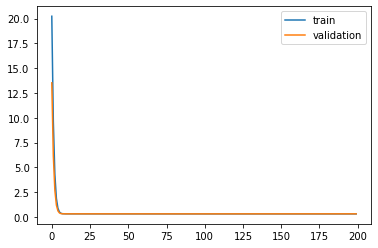

Time to train LSTM:  164.3257188796997
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 10s - loss: 23.6788 - acc: 0.7124 - val_loss: 19.4593 - val_acc: 0.7997

Epoch 00001: val_loss improved from inf to 19.45927, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 16.6545 - acc: 0.8351 - val_loss: 13.4873 - val_acc: 0.8729

Epoch 00002: val_loss improved from 19.45927 to 13.48726, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 11.4581 - acc: 0.8778 - val_loss: 9.1793 - val_acc: 0.8856

Epoch 00003: val_loss improved from 13.48726 to 9.17932, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 7.7407 - acc: 0.8831 - val_loss: 6.1423 - val_acc: 0.8851

Epoch 00004: val_loss improved from 9.17932 to 6.14226, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 5.1509 - acc: 0.8848 - val_loss: 4.0578 - val_acc: 0.8867

Epoch 00005: val_loss improved from 6.14226 to 4.05779, saving model to Event_val_weights1.hdf5
E


Epoch 00051: val_loss improved from 0.29521 to 0.29510, saving model to Event_val_weights1.hdf5
Epoch 52/200
 - 1s - loss: 0.3016 - acc: 0.8868 - val_loss: 0.2954 - val_acc: 0.8882

Epoch 00052: val_loss did not improve from 0.29510
Epoch 53/200
 - 1s - loss: 0.3016 - acc: 0.8869 - val_loss: 0.2953 - val_acc: 0.8879

Epoch 00053: val_loss did not improve from 0.29510
Epoch 54/200
 - 1s - loss: 0.3015 - acc: 0.8870 - val_loss: 0.2953 - val_acc: 0.8880

Epoch 00054: val_loss did not improve from 0.29510
Epoch 55/200
 - 1s - loss: 0.3016 - acc: 0.8870 - val_loss: 0.2950 - val_acc: 0.8882

Epoch 00055: val_loss improved from 0.29510 to 0.29505, saving model to Event_val_weights1.hdf5
Epoch 56/200
 - 1s - loss: 0.3015 - acc: 0.8869 - val_loss: 0.2955 - val_acc: 0.8880

Epoch 00056: val_loss did not improve from 0.29505
Epoch 57/200
 - 1s - loss: 0.3015 - acc: 0.8869 - val_loss: 0.2949 - val_acc: 0.8879

Epoch 00057: val_loss improved from 0.29505 to 0.29495, saving model to Event_val_weigh

 - 1s - loss: 0.2993 - acc: 0.8874 - val_loss: 0.2950 - val_acc: 0.8886

Epoch 00108: val_loss did not improve from 0.29427
Epoch 109/200
 - 1s - loss: 0.2995 - acc: 0.8878 - val_loss: 0.2945 - val_acc: 0.8881

Epoch 00109: val_loss did not improve from 0.29427
Epoch 110/200
 - 1s - loss: 0.2993 - acc: 0.8875 - val_loss: 0.2956 - val_acc: 0.8889

Epoch 00110: val_loss did not improve from 0.29427
Epoch 111/200
 - 1s - loss: 0.2995 - acc: 0.8877 - val_loss: 0.2945 - val_acc: 0.8882

Epoch 00111: val_loss did not improve from 0.29427
Epoch 112/200
 - 1s - loss: 0.2993 - acc: 0.8874 - val_loss: 0.2956 - val_acc: 0.8887

Epoch 00112: val_loss did not improve from 0.29427
Epoch 113/200
 - 1s - loss: 0.2993 - acc: 0.8874 - val_loss: 0.2944 - val_acc: 0.8883

Epoch 00113: val_loss did not improve from 0.29427
Epoch 114/200
 - 1s - loss: 0.2992 - acc: 0.8878 - val_loss: 0.2955 - val_acc: 0.8883

Epoch 00114: val_loss did not improve from 0.29427
Epoch 115/200
 - 1s - loss: 0.2993 - acc: 0.8873


Epoch 00167: val_loss did not improve from 0.29427
Epoch 168/200
 - 1s - loss: 0.2979 - acc: 0.8888 - val_loss: 0.2969 - val_acc: 0.8874

Epoch 00168: val_loss did not improve from 0.29427
Epoch 169/200
 - 1s - loss: 0.2981 - acc: 0.8888 - val_loss: 0.2980 - val_acc: 0.8891

Epoch 00169: val_loss did not improve from 0.29427
Epoch 170/200
 - 1s - loss: 0.2976 - acc: 0.8890 - val_loss: 0.2984 - val_acc: 0.8871

Epoch 00170: val_loss did not improve from 0.29427
Epoch 171/200
 - 1s - loss: 0.2979 - acc: 0.8888 - val_loss: 0.2970 - val_acc: 0.8872

Epoch 00171: val_loss did not improve from 0.29427
Epoch 172/200
 - 1s - loss: 0.2980 - acc: 0.8888 - val_loss: 0.2969 - val_acc: 0.8876

Epoch 00172: val_loss did not improve from 0.29427
Epoch 173/200
 - 1s - loss: 0.2978 - acc: 0.8889 - val_loss: 0.2986 - val_acc: 0.8879

Epoch 00173: val_loss did not improve from 0.29427
Epoch 174/200
 - 1s - loss: 0.2976 - acc: 0.8893 - val_loss: 0.2981 - val_acc: 0.8878

Epoch 00174: val_loss did not imp

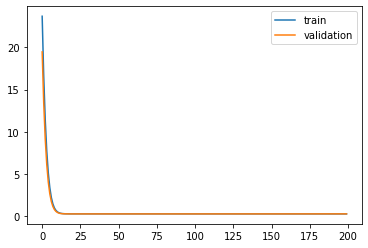

Time to train LSTM:  173.853924036026
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 10s - loss: 23.9783 - acc: 0.6792 - val_loss: 19.7322 - val_acc: 0.7860

Epoch 00001: val_loss improved from inf to 19.73221, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 16.8854 - acc: 0.8283 - val_loss: 13.6879 - val_acc: 0.8673

Epoch 00002: val_loss improved from 19.73221 to 13.68795, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 11.6252 - acc: 0.8778 - val_loss: 9.3335 - val_acc: 0.8793

Epoch 00003: val_loss improved from 13.68795 to 9.33352, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 7.8642 - acc: 0.8837 - val_loss: 6.2560 - val_acc: 0.8817

Epoch 00004: val_loss improved from 9.33352 to 6.25604, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 5.2397 - acc: 0.8864 - val_loss: 4.1434 - val_acc: 0.8828

Epoch 00005: val_loss improved from 6.25604 to 4.14341, saving model to Event_val_weights2.hdf5
Ep

 - 1s - loss: 0.3002 - acc: 0.8877 - val_loss: 0.3061 - val_acc: 0.8851

Epoch 00053: val_loss did not improve from 0.30601
Epoch 54/200
 - 1s - loss: 0.3002 - acc: 0.8877 - val_loss: 0.3063 - val_acc: 0.8848

Epoch 00054: val_loss did not improve from 0.30601
Epoch 55/200
 - 1s - loss: 0.3002 - acc: 0.8875 - val_loss: 0.3060 - val_acc: 0.8849

Epoch 00055: val_loss did not improve from 0.30601
Epoch 56/200
 - 1s - loss: 0.3001 - acc: 0.8878 - val_loss: 0.3061 - val_acc: 0.8847

Epoch 00056: val_loss did not improve from 0.30601
Epoch 57/200
 - 1s - loss: 0.3001 - acc: 0.8877 - val_loss: 0.3059 - val_acc: 0.8850

Epoch 00057: val_loss improved from 0.30601 to 0.30591, saving model to Event_val_weights2.hdf5
Epoch 58/200
 - 1s - loss: 0.3000 - acc: 0.8876 - val_loss: 0.3060 - val_acc: 0.8847

Epoch 00058: val_loss did not improve from 0.30591
Epoch 59/200
 - 1s - loss: 0.3000 - acc: 0.8876 - val_loss: 0.3059 - val_acc: 0.8851

Epoch 00059: val_loss improved from 0.30591 to 0.30587, savi


Epoch 00108: val_loss did not improve from 0.30509
Epoch 109/200
 - 1s - loss: 0.2976 - acc: 0.8884 - val_loss: 0.3059 - val_acc: 0.8848

Epoch 00109: val_loss did not improve from 0.30509
Epoch 110/200
 - 1s - loss: 0.2977 - acc: 0.8886 - val_loss: 0.3056 - val_acc: 0.8856

Epoch 00110: val_loss did not improve from 0.30509
Epoch 111/200
 - 1s - loss: 0.2975 - acc: 0.8885 - val_loss: 0.3059 - val_acc: 0.8847

Epoch 00111: val_loss did not improve from 0.30509
Epoch 112/200
 - 1s - loss: 0.2978 - acc: 0.8886 - val_loss: 0.3059 - val_acc: 0.8856

Epoch 00112: val_loss did not improve from 0.30509
Epoch 113/200
 - 1s - loss: 0.2976 - acc: 0.8885 - val_loss: 0.3060 - val_acc: 0.8850

Epoch 00113: val_loss did not improve from 0.30509
Epoch 114/200
 - 1s - loss: 0.2977 - acc: 0.8887 - val_loss: 0.3058 - val_acc: 0.8852

Epoch 00114: val_loss did not improve from 0.30509
Epoch 115/200
 - 1s - loss: 0.2975 - acc: 0.8886 - val_loss: 0.3060 - val_acc: 0.8852

Epoch 00115: val_loss did not imp

 - 1s - loss: 0.2960 - acc: 0.8898 - val_loss: 0.3093 - val_acc: 0.8818

Epoch 00168: val_loss did not improve from 0.30509
Epoch 169/200
 - 1s - loss: 0.2959 - acc: 0.8893 - val_loss: 0.3092 - val_acc: 0.8822

Epoch 00169: val_loss did not improve from 0.30509
Epoch 170/200
 - 1s - loss: 0.2958 - acc: 0.8896 - val_loss: 0.3099 - val_acc: 0.8818

Epoch 00170: val_loss did not improve from 0.30509
Epoch 171/200
 - 1s - loss: 0.2958 - acc: 0.8895 - val_loss: 0.3090 - val_acc: 0.8824

Epoch 00171: val_loss did not improve from 0.30509
Epoch 172/200
 - 1s - loss: 0.2958 - acc: 0.8896 - val_loss: 0.3103 - val_acc: 0.8808

Epoch 00172: val_loss did not improve from 0.30509
Epoch 173/200
 - 1s - loss: 0.2958 - acc: 0.8898 - val_loss: 0.3092 - val_acc: 0.8823

Epoch 00173: val_loss did not improve from 0.30509
Epoch 174/200
 - 1s - loss: 0.2957 - acc: 0.8902 - val_loss: 0.3093 - val_acc: 0.8810

Epoch 00174: val_loss did not improve from 0.30509
Epoch 175/200
 - 1s - loss: 0.2954 - acc: 0.8907

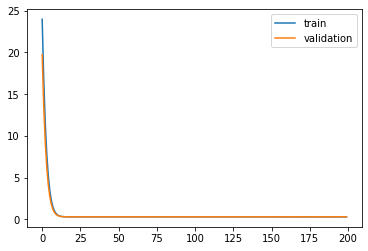

Time to train LSTM:  174.1810338497162
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 10s - loss: 23.9487 - acc: 0.6977 - val_loss: 19.7093 - val_acc: 0.7854

Epoch 00001: val_loss improved from inf to 19.70934, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 16.8728 - acc: 0.8270 - val_loss: 13.6817 - val_acc: 0.8676

Epoch 00002: val_loss improved from 19.70934 to 13.68167, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 11.6197 - acc: 0.8780 - val_loss: 9.3294 - val_acc: 0.8808

Epoch 00003: val_loss improved from 13.68167 to 9.32943, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 7.8614 - acc: 0.8826 - val_loss: 6.2522 - val_acc: 0.8847

Epoch 00004: val_loss improved from 9.32943 to 6.25220, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 5.2388 - acc: 0.8851 - val_loss: 4.1407 - val_acc: 0.8853

Epoch 00005: val_loss improved from 6.25220 to 4.14068, saving model to Event_val_weights3.hdf5
E


Epoch 00052: val_loss did not improve from 0.30315
Epoch 53/200
 - 1s - loss: 0.3005 - acc: 0.8870 - val_loss: 0.3042 - val_acc: 0.8884

Epoch 00053: val_loss did not improve from 0.30315
Epoch 54/200
 - 1s - loss: 0.3004 - acc: 0.8870 - val_loss: 0.3042 - val_acc: 0.8887

Epoch 00054: val_loss did not improve from 0.30315
Epoch 55/200
 - 1s - loss: 0.3004 - acc: 0.8870 - val_loss: 0.3041 - val_acc: 0.8889

Epoch 00055: val_loss did not improve from 0.30315
Epoch 56/200
 - 1s - loss: 0.3003 - acc: 0.8870 - val_loss: 0.3041 - val_acc: 0.8887

Epoch 00056: val_loss did not improve from 0.30315
Epoch 57/200
 - 1s - loss: 0.3003 - acc: 0.8869 - val_loss: 0.3041 - val_acc: 0.8888

Epoch 00057: val_loss did not improve from 0.30315
Epoch 58/200
 - 1s - loss: 0.3002 - acc: 0.8871 - val_loss: 0.3040 - val_acc: 0.8884

Epoch 00058: val_loss did not improve from 0.30315
Epoch 59/200
 - 1s - loss: 0.3002 - acc: 0.8871 - val_loss: 0.3040 - val_acc: 0.8886

Epoch 00059: val_loss did not improve fr

 - 1s - loss: 0.2980 - acc: 0.8879 - val_loss: 0.3041 - val_acc: 0.8899

Epoch 00111: val_loss did not improve from 0.30281
Epoch 112/200
 - 1s - loss: 0.2978 - acc: 0.8879 - val_loss: 0.3041 - val_acc: 0.8892

Epoch 00112: val_loss did not improve from 0.30281
Epoch 113/200
 - 1s - loss: 0.2980 - acc: 0.8880 - val_loss: 0.3045 - val_acc: 0.8889

Epoch 00113: val_loss did not improve from 0.30281
Epoch 114/200
 - 1s - loss: 0.2979 - acc: 0.8880 - val_loss: 0.3039 - val_acc: 0.8891

Epoch 00114: val_loss did not improve from 0.30281
Epoch 115/200
 - 1s - loss: 0.2977 - acc: 0.8881 - val_loss: 0.3044 - val_acc: 0.8893

Epoch 00115: val_loss did not improve from 0.30281
Epoch 116/200
 - 1s - loss: 0.2978 - acc: 0.8880 - val_loss: 0.3044 - val_acc: 0.8882

Epoch 00116: val_loss did not improve from 0.30281
Epoch 117/200
 - 1s - loss: 0.2978 - acc: 0.8880 - val_loss: 0.3047 - val_acc: 0.8898

Epoch 00117: val_loss did not improve from 0.30281
Epoch 118/200
 - 1s - loss: 0.2977 - acc: 0.8878


Epoch 00170: val_loss did not improve from 0.30281
Epoch 171/200
 - 1s - loss: 0.2964 - acc: 0.8891 - val_loss: 0.3076 - val_acc: 0.8864

Epoch 00171: val_loss did not improve from 0.30281
Epoch 172/200
 - 1s - loss: 0.2964 - acc: 0.8896 - val_loss: 0.3070 - val_acc: 0.8878

Epoch 00172: val_loss did not improve from 0.30281
Epoch 173/200
 - 1s - loss: 0.2963 - acc: 0.8896 - val_loss: 0.3074 - val_acc: 0.8867

Epoch 00173: val_loss did not improve from 0.30281
Epoch 174/200
 - 1s - loss: 0.2960 - acc: 0.8897 - val_loss: 0.3066 - val_acc: 0.8867

Epoch 00174: val_loss did not improve from 0.30281
Epoch 175/200
 - 1s - loss: 0.2958 - acc: 0.8896 - val_loss: 0.3083 - val_acc: 0.8864

Epoch 00175: val_loss did not improve from 0.30281
Epoch 176/200
 - 1s - loss: 0.2960 - acc: 0.8893 - val_loss: 0.3085 - val_acc: 0.8854

Epoch 00176: val_loss did not improve from 0.30281
Epoch 177/200
 - 1s - loss: 0.2958 - acc: 0.8899 - val_loss: 0.3074 - val_acc: 0.8860

Epoch 00177: val_loss did not imp

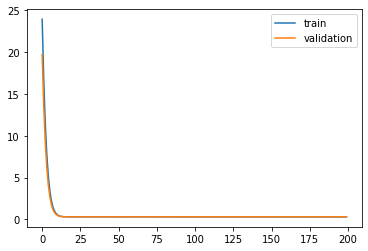

Time to train LSTM:  174.4476764202118
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 10s - loss: 23.8542 - acc: 0.6854 - val_loss: 19.6154 - val_acc: 0.7894

Epoch 00001: val_loss improved from inf to 19.61542, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 16.7878 - acc: 0.8378 - val_loss: 13.6118 - val_acc: 0.8714

Epoch 00002: val_loss improved from 19.61542 to 13.61176, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 11.5570 - acc: 0.8789 - val_loss: 9.2804 - val_acc: 0.8802

Epoch 00003: val_loss improved from 13.61176 to 9.28035, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 7.8159 - acc: 0.8835 - val_loss: 6.2167 - val_acc: 0.8804

Epoch 00004: val_loss improved from 9.28035 to 6.21667, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 5.2071 - acc: 0.8859 - val_loss: 4.1183 - val_acc: 0.8833

Epoch 00005: val_loss improved from 6.21667 to 4.11827, saving model to Event_val_weights4.hdf5
E

 - 1s - loss: 0.2997 - acc: 0.8880 - val_loss: 0.3076 - val_acc: 0.8826

Epoch 00053: val_loss did not improve from 0.30676
Epoch 54/200
 - 1s - loss: 0.2996 - acc: 0.8881 - val_loss: 0.3075 - val_acc: 0.8824

Epoch 00054: val_loss did not improve from 0.30676
Epoch 55/200
 - 1s - loss: 0.2997 - acc: 0.8880 - val_loss: 0.3075 - val_acc: 0.8824

Epoch 00055: val_loss did not improve from 0.30676
Epoch 56/200
 - 1s - loss: 0.2995 - acc: 0.8880 - val_loss: 0.3073 - val_acc: 0.8824

Epoch 00056: val_loss did not improve from 0.30676
Epoch 57/200
 - 1s - loss: 0.2995 - acc: 0.8881 - val_loss: 0.3074 - val_acc: 0.8823

Epoch 00057: val_loss did not improve from 0.30676
Epoch 58/200
 - 1s - loss: 0.2995 - acc: 0.8879 - val_loss: 0.3072 - val_acc: 0.8828

Epoch 00058: val_loss did not improve from 0.30676
Epoch 59/200
 - 1s - loss: 0.2994 - acc: 0.8881 - val_loss: 0.3072 - val_acc: 0.8828

Epoch 00059: val_loss did not improve from 0.30676
Epoch 60/200
 - 1s - loss: 0.2993 - acc: 0.8879 - val_


Epoch 00110: val_loss did not improve from 0.30571
Epoch 111/200
 - 1s - loss: 0.2975 - acc: 0.8884 - val_loss: 0.3067 - val_acc: 0.8843

Epoch 00111: val_loss did not improve from 0.30571
Epoch 112/200
 - 1s - loss: 0.2975 - acc: 0.8885 - val_loss: 0.3063 - val_acc: 0.8842

Epoch 00112: val_loss did not improve from 0.30571
Epoch 113/200
 - 1s - loss: 0.2976 - acc: 0.8884 - val_loss: 0.3069 - val_acc: 0.8846

Epoch 00113: val_loss did not improve from 0.30571
Epoch 114/200
 - 1s - loss: 0.2978 - acc: 0.8883 - val_loss: 0.3067 - val_acc: 0.8837

Epoch 00114: val_loss did not improve from 0.30571
Epoch 115/200
 - 1s - loss: 0.2976 - acc: 0.8885 - val_loss: 0.3069 - val_acc: 0.8842

Epoch 00115: val_loss did not improve from 0.30571
Epoch 116/200
 - 1s - loss: 0.2976 - acc: 0.8881 - val_loss: 0.3063 - val_acc: 0.8840

Epoch 00116: val_loss did not improve from 0.30571
Epoch 117/200
 - 1s - loss: 0.2975 - acc: 0.8885 - val_loss: 0.3066 - val_acc: 0.8839

Epoch 00117: val_loss did not imp

 - 1s - loss: 0.2958 - acc: 0.8899 - val_loss: 0.3088 - val_acc: 0.8846

Epoch 00170: val_loss did not improve from 0.30565
Epoch 171/200
 - 1s - loss: 0.2956 - acc: 0.8895 - val_loss: 0.3100 - val_acc: 0.8837

Epoch 00171: val_loss did not improve from 0.30565
Epoch 172/200
 - 1s - loss: 0.2959 - acc: 0.8892 - val_loss: 0.3086 - val_acc: 0.8851

Epoch 00172: val_loss did not improve from 0.30565
Epoch 173/200
 - 1s - loss: 0.2961 - acc: 0.8893 - val_loss: 0.3074 - val_acc: 0.8863

Epoch 00173: val_loss did not improve from 0.30565
Epoch 174/200
 - 1s - loss: 0.2961 - acc: 0.8897 - val_loss: 0.3093 - val_acc: 0.8822

Epoch 00174: val_loss did not improve from 0.30565
Epoch 175/200
 - 1s - loss: 0.2969 - acc: 0.8895 - val_loss: 0.3103 - val_acc: 0.8833

Epoch 00175: val_loss did not improve from 0.30565
Epoch 176/200
 - 1s - loss: 0.2967 - acc: 0.8886 - val_loss: 0.3100 - val_acc: 0.8837

Epoch 00176: val_loss did not improve from 0.30565
Epoch 177/200
 - 1s - loss: 0.2961 - acc: 0.8896

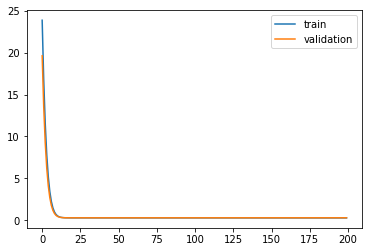

Time to train LSTM:  174.37849974632263
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 10s - loss: 23.9923 - acc: 0.6947 - val_loss: 19.7407 - val_acc: 0.7948

Epoch 00001: val_loss improved from inf to 19.74071, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 16.9079 - acc: 0.8240 - val_loss: 13.7046 - val_acc: 0.8654

Epoch 00002: val_loss improved from 19.74071 to 13.70460, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 11.6421 - acc: 0.8767 - val_loss: 9.3455 - val_acc: 0.8800

Epoch 00003: val_loss improved from 13.70460 to 9.34554, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 7.8761 - acc: 0.8839 - val_loss: 6.2603 - val_acc: 0.8841

Epoch 00004: val_loss improved from 9.34554 to 6.26028, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 5.2474 - acc: 0.8855 - val_loss: 4.1429 - val_acc: 0.8839

Epoch 00005: val_loss improved from 6.26028 to 4.14293, saving model to Event_val_weights5.hdf5


 - 1s - loss: 0.3010 - acc: 0.8872 - val_loss: 0.3024 - val_acc: 0.8861

Epoch 00051: val_loss did not improve from 0.30218
Epoch 52/200
 - 1s - loss: 0.3009 - acc: 0.8872 - val_loss: 0.3022 - val_acc: 0.8859

Epoch 00052: val_loss did not improve from 0.30218
Epoch 53/200
 - 1s - loss: 0.3009 - acc: 0.8873 - val_loss: 0.3024 - val_acc: 0.8859

Epoch 00053: val_loss did not improve from 0.30218
Epoch 54/200
 - 1s - loss: 0.3008 - acc: 0.8873 - val_loss: 0.3021 - val_acc: 0.8860

Epoch 00054: val_loss improved from 0.30218 to 0.30214, saving model to Event_val_weights5.hdf5
Epoch 55/200
 - 1s - loss: 0.3008 - acc: 0.8872 - val_loss: 0.3023 - val_acc: 0.8860

Epoch 00055: val_loss did not improve from 0.30214
Epoch 56/200
 - 1s - loss: 0.3007 - acc: 0.8872 - val_loss: 0.3021 - val_acc: 0.8858

Epoch 00056: val_loss did not improve from 0.30214
Epoch 57/200
 - 1s - loss: 0.3007 - acc: 0.8872 - val_loss: 0.3022 - val_acc: 0.8860

Epoch 00057: val_loss did not improve from 0.30214
Epoch 58/

 - 1s - loss: 0.2987 - acc: 0.8875 - val_loss: 0.3012 - val_acc: 0.8868

Epoch 00106: val_loss did not improve from 0.30100
Epoch 107/200
 - 1s - loss: 0.2987 - acc: 0.8874 - val_loss: 0.3009 - val_acc: 0.8868

Epoch 00107: val_loss improved from 0.30100 to 0.30091, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.2986 - acc: 0.8876 - val_loss: 0.3012 - val_acc: 0.8866

Epoch 00108: val_loss did not improve from 0.30091
Epoch 109/200
 - 1s - loss: 0.2987 - acc: 0.8876 - val_loss: 0.3011 - val_acc: 0.8863

Epoch 00109: val_loss did not improve from 0.30091
Epoch 110/200
 - 1s - loss: 0.2986 - acc: 0.8876 - val_loss: 0.3012 - val_acc: 0.8867

Epoch 00110: val_loss did not improve from 0.30091
Epoch 111/200
 - 1s - loss: 0.2986 - acc: 0.8877 - val_loss: 0.3012 - val_acc: 0.8861

Epoch 00111: val_loss did not improve from 0.30091
Epoch 112/200
 - 1s - loss: 0.2985 - acc: 0.8877 - val_loss: 0.3011 - val_acc: 0.8868

Epoch 00112: val_loss did not improve from 0.30091
Epo


Epoch 00165: val_loss did not improve from 0.30091
Epoch 166/200
 - 1s - loss: 0.2971 - acc: 0.8887 - val_loss: 0.3025 - val_acc: 0.8887

Epoch 00166: val_loss did not improve from 0.30091
Epoch 167/200
 - 1s - loss: 0.2970 - acc: 0.8889 - val_loss: 0.3038 - val_acc: 0.8878

Epoch 00167: val_loss did not improve from 0.30091
Epoch 168/200
 - 1s - loss: 0.2970 - acc: 0.8886 - val_loss: 0.3035 - val_acc: 0.8879

Epoch 00168: val_loss did not improve from 0.30091
Epoch 169/200
 - 1s - loss: 0.2966 - acc: 0.8888 - val_loss: 0.3040 - val_acc: 0.8878

Epoch 00169: val_loss did not improve from 0.30091
Epoch 170/200
 - 1s - loss: 0.2968 - acc: 0.8889 - val_loss: 0.3034 - val_acc: 0.8873

Epoch 00170: val_loss did not improve from 0.30091
Epoch 171/200
 - 1s - loss: 0.2965 - acc: 0.8892 - val_loss: 0.3036 - val_acc: 0.8879

Epoch 00171: val_loss did not improve from 0.30091
Epoch 172/200
 - 1s - loss: 0.2969 - acc: 0.8889 - val_loss: 0.3032 - val_acc: 0.8894

Epoch 00172: val_loss did not imp

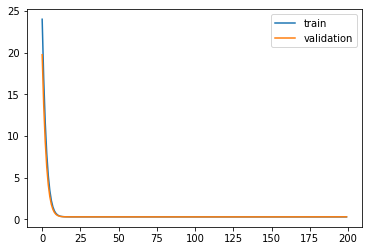

Time to train LSTM:  174.8262870311737
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 11s - loss: 25.9083 - acc: 0.5951 - val_loss: 23.3703 - val_acc: 0.7557

Epoch 00001: val_loss improved from inf to 23.37035, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 21.8670 - acc: 0.7679 - val_loss: 19.6509 - val_acc: 0.7942

Epoch 00002: val_loss improved from 23.37035 to 19.65088, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 18.3438 - acc: 0.8040 - val_loss: 16.4144 - val_acc: 0.8350

Epoch 00003: val_loss improved from 19.65088 to 16.41437, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 15.2887 - acc: 0.8490 - val_loss: 13.6352 - val_acc: 0.8712

Epoch 00004: val_loss improved from 16.41437 to 13.63524, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 12.6816 - acc: 0.8729 - val_loss: 11.2851 - val_acc: 0.8813

Epoch 00005: val_loss improved from 13.63524 to 11.28506, saving model to Event_val_weigh


Epoch 00046: val_loss improved from 0.29412 to 0.29408, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.2998 - acc: 0.8877 - val_loss: 0.2940 - val_acc: 0.8887

Epoch 00047: val_loss improved from 0.29408 to 0.29400, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.2997 - acc: 0.8877 - val_loss: 0.2941 - val_acc: 0.8889

Epoch 00048: val_loss did not improve from 0.29400
Epoch 49/200
 - 1s - loss: 0.2997 - acc: 0.8877 - val_loss: 0.2940 - val_acc: 0.8890

Epoch 00049: val_loss improved from 0.29400 to 0.29399, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.2997 - acc: 0.8877 - val_loss: 0.2941 - val_acc: 0.8891

Epoch 00050: val_loss did not improve from 0.29399
Epoch 51/200
 - 1s - loss: 0.2997 - acc: 0.8877 - val_loss: 0.2940 - val_acc: 0.8891

Epoch 00051: val_loss did not improve from 0.29399
Epoch 52/200
 - 1s - loss: 0.2998 - acc: 0.8877 - val_loss: 0.2943 - val_acc: 0.8889

Epoch 00052: val_loss did not improve from


Epoch 00103: val_loss did not improve from 0.29361
Epoch 104/200
 - 1s - loss: 0.2986 - acc: 0.8879 - val_loss: 0.2938 - val_acc: 0.8891

Epoch 00104: val_loss did not improve from 0.29361
Epoch 105/200
 - 1s - loss: 0.2986 - acc: 0.8878 - val_loss: 0.2945 - val_acc: 0.8892

Epoch 00105: val_loss did not improve from 0.29361
Epoch 106/200
 - 1s - loss: 0.2987 - acc: 0.8877 - val_loss: 0.2940 - val_acc: 0.8891

Epoch 00106: val_loss did not improve from 0.29361
Epoch 107/200
 - 1s - loss: 0.2988 - acc: 0.8877 - val_loss: 0.2941 - val_acc: 0.8894

Epoch 00107: val_loss did not improve from 0.29361
Epoch 108/200
 - 1s - loss: 0.2989 - acc: 0.8877 - val_loss: 0.2943 - val_acc: 0.8894

Epoch 00108: val_loss did not improve from 0.29361
Epoch 109/200
 - 1s - loss: 0.2988 - acc: 0.8877 - val_loss: 0.2938 - val_acc: 0.8897

Epoch 00109: val_loss did not improve from 0.29361
Epoch 110/200
 - 1s - loss: 0.2987 - acc: 0.8878 - val_loss: 0.2945 - val_acc: 0.8891

Epoch 00110: val_loss did not imp

 - 1s - loss: 0.2973 - acc: 0.8884 - val_loss: 0.2960 - val_acc: 0.8878

Epoch 00163: val_loss did not improve from 0.29361
Epoch 164/200
 - 1s - loss: 0.2975 - acc: 0.8885 - val_loss: 0.2954 - val_acc: 0.8879

Epoch 00164: val_loss did not improve from 0.29361
Epoch 165/200
 - 1s - loss: 0.2973 - acc: 0.8887 - val_loss: 0.2961 - val_acc: 0.8882

Epoch 00165: val_loss did not improve from 0.29361
Epoch 166/200
 - 1s - loss: 0.2971 - acc: 0.8886 - val_loss: 0.2965 - val_acc: 0.8880

Epoch 00166: val_loss did not improve from 0.29361
Epoch 167/200
 - 1s - loss: 0.2964 - acc: 0.8885 - val_loss: 0.2957 - val_acc: 0.8881

Epoch 00167: val_loss did not improve from 0.29361
Epoch 168/200
 - 1s - loss: 0.2959 - acc: 0.8891 - val_loss: 0.2959 - val_acc: 0.8876

Epoch 00168: val_loss did not improve from 0.29361
Epoch 169/200
 - 1s - loss: 0.2964 - acc: 0.8884 - val_loss: 0.2955 - val_acc: 0.8873

Epoch 00169: val_loss did not improve from 0.29361
Epoch 170/200
 - 1s - loss: 0.2970 - acc: 0.8884

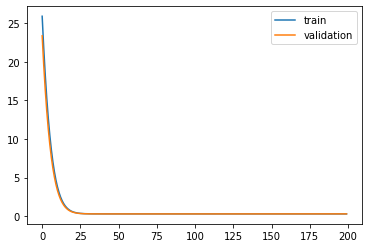

Time to train LSTM:  166.4953944683075
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 11s - loss: 25.7862 - acc: 0.6955 - val_loss: 23.2782 - val_acc: 0.7732

Epoch 00001: val_loss improved from inf to 23.27820, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 21.7734 - acc: 0.7884 - val_loss: 19.5779 - val_acc: 0.8146

Epoch 00002: val_loss improved from 23.27820 to 19.57789, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 18.2616 - acc: 0.8341 - val_loss: 16.3535 - val_acc: 0.8578

Epoch 00003: val_loss improved from 19.57789 to 16.35346, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 15.2232 - acc: 0.8690 - val_loss: 13.5965 - val_acc: 0.8747

Epoch 00004: val_loss improved from 16.35346 to 13.59647, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 12.6368 - acc: 0.8784 - val_loss: 11.2565 - val_acc: 0.8794

Epoch 00005: val_loss improved from 13.59647 to 11.25646, saving model to Event_val_weigh

 - 1s - loss: 0.2985 - acc: 0.8883 - val_loss: 0.3048 - val_acc: 0.8841

Epoch 00046: val_loss improved from 0.30483 to 0.30480, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.2984 - acc: 0.8882 - val_loss: 0.3049 - val_acc: 0.8843

Epoch 00047: val_loss did not improve from 0.30480
Epoch 48/200
 - 1s - loss: 0.2984 - acc: 0.8882 - val_loss: 0.3050 - val_acc: 0.8842

Epoch 00048: val_loss did not improve from 0.30480
Epoch 49/200
 - 1s - loss: 0.2984 - acc: 0.8881 - val_loss: 0.3051 - val_acc: 0.8839

Epoch 00049: val_loss did not improve from 0.30480
Epoch 50/200
 - 1s - loss: 0.2984 - acc: 0.8881 - val_loss: 0.3052 - val_acc: 0.8834

Epoch 00050: val_loss did not improve from 0.30480
Epoch 51/200
 - 1s - loss: 0.2984 - acc: 0.8881 - val_loss: 0.3053 - val_acc: 0.8832

Epoch 00051: val_loss did not improve from 0.30480
Epoch 52/200
 - 1s - loss: 0.2984 - acc: 0.8881 - val_loss: 0.3054 - val_acc: 0.8832

Epoch 00052: val_loss did not improve from 0.30480
Epoch 53/


Epoch 00104: val_loss did not improve from 0.30475
Epoch 105/200
 - 1s - loss: 0.2974 - acc: 0.8887 - val_loss: 0.3052 - val_acc: 0.8836

Epoch 00105: val_loss did not improve from 0.30475
Epoch 106/200
 - 1s - loss: 0.2974 - acc: 0.8886 - val_loss: 0.3053 - val_acc: 0.8837

Epoch 00106: val_loss did not improve from 0.30475
Epoch 107/200
 - 1s - loss: 0.2973 - acc: 0.8888 - val_loss: 0.3055 - val_acc: 0.8836

Epoch 00107: val_loss did not improve from 0.30475
Epoch 108/200
 - 1s - loss: 0.2975 - acc: 0.8887 - val_loss: 0.3055 - val_acc: 0.8840

Epoch 00108: val_loss did not improve from 0.30475
Epoch 109/200
 - 1s - loss: 0.2974 - acc: 0.8887 - val_loss: 0.3057 - val_acc: 0.8837

Epoch 00109: val_loss did not improve from 0.30475
Epoch 110/200
 - 1s - loss: 0.2975 - acc: 0.8888 - val_loss: 0.3057 - val_acc: 0.8842

Epoch 00110: val_loss did not improve from 0.30475
Epoch 111/200
 - 1s - loss: 0.2974 - acc: 0.8888 - val_loss: 0.3058 - val_acc: 0.8840

Epoch 00111: val_loss did not imp


Epoch 00163: val_loss did not improve from 0.30468
Epoch 164/200
 - 1s - loss: 0.2954 - acc: 0.8893 - val_loss: 0.3059 - val_acc: 0.8841

Epoch 00164: val_loss did not improve from 0.30468
Epoch 165/200
 - 1s - loss: 0.2954 - acc: 0.8897 - val_loss: 0.3059 - val_acc: 0.8839

Epoch 00165: val_loss did not improve from 0.30468
Epoch 166/200
 - 1s - loss: 0.2951 - acc: 0.8898 - val_loss: 0.3061 - val_acc: 0.8823

Epoch 00166: val_loss did not improve from 0.30468
Epoch 167/200
 - 1s - loss: 0.2953 - acc: 0.8897 - val_loss: 0.3063 - val_acc: 0.8837

Epoch 00167: val_loss did not improve from 0.30468
Epoch 168/200
 - 1s - loss: 0.2956 - acc: 0.8896 - val_loss: 0.3069 - val_acc: 0.8836

Epoch 00168: val_loss did not improve from 0.30468
Epoch 169/200
 - 1s - loss: 0.2951 - acc: 0.8898 - val_loss: 0.3062 - val_acc: 0.8834

Epoch 00169: val_loss did not improve from 0.30468
Epoch 170/200
 - 1s - loss: 0.2947 - acc: 0.8902 - val_loss: 0.3070 - val_acc: 0.8834

Epoch 00170: val_loss did not imp

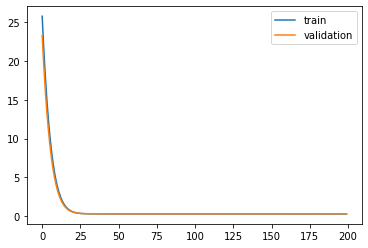

Time to train LSTM:  166.4468686580658
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 11s - loss: 25.9548 - acc: 0.5944 - val_loss: 23.4200 - val_acc: 0.7594

Epoch 00001: val_loss improved from inf to 23.42003, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 21.9045 - acc: 0.7805 - val_loss: 19.6968 - val_acc: 0.7864

Epoch 00002: val_loss improved from 23.42003 to 19.69678, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 18.3762 - acc: 0.8006 - val_loss: 16.4612 - val_acc: 0.8147

Epoch 00003: val_loss improved from 19.69678 to 16.46117, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 15.3198 - acc: 0.8367 - val_loss: 13.6769 - val_acc: 0.8562

Epoch 00004: val_loss improved from 16.46117 to 13.67692, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 12.7067 - acc: 0.8690 - val_loss: 11.3167 - val_acc: 0.8751

Epoch 00005: val_loss improved from 13.67692 to 11.31670, saving model to Event_val_weigh

 - 1s - loss: 0.2993 - acc: 0.8876 - val_loss: 0.3031 - val_acc: 0.8871

Epoch 00046: val_loss did not improve from 0.30290
Epoch 47/200
 - 1s - loss: 0.2993 - acc: 0.8875 - val_loss: 0.3032 - val_acc: 0.8873

Epoch 00047: val_loss did not improve from 0.30290
Epoch 48/200
 - 1s - loss: 0.2993 - acc: 0.8875 - val_loss: 0.3034 - val_acc: 0.8868

Epoch 00048: val_loss did not improve from 0.30290
Epoch 49/200
 - 1s - loss: 0.2994 - acc: 0.8875 - val_loss: 0.3035 - val_acc: 0.8869

Epoch 00049: val_loss did not improve from 0.30290
Epoch 50/200
 - 1s - loss: 0.2994 - acc: 0.8876 - val_loss: 0.3037 - val_acc: 0.8873

Epoch 00050: val_loss did not improve from 0.30290
Epoch 51/200
 - 1s - loss: 0.2993 - acc: 0.8876 - val_loss: 0.3038 - val_acc: 0.8871

Epoch 00051: val_loss did not improve from 0.30290
Epoch 52/200
 - 1s - loss: 0.2993 - acc: 0.8878 - val_loss: 0.3037 - val_acc: 0.8873

Epoch 00052: val_loss did not improve from 0.30290
Epoch 53/200
 - 1s - loss: 0.2991 - acc: 0.8880 - val_

 - 1s - loss: 0.2977 - acc: 0.8883 - val_loss: 0.3034 - val_acc: 0.8871

Epoch 00103: val_loss did not improve from 0.30240
Epoch 104/200
 - 1s - loss: 0.2976 - acc: 0.8884 - val_loss: 0.3034 - val_acc: 0.8869

Epoch 00104: val_loss did not improve from 0.30240
Epoch 105/200
 - 1s - loss: 0.2975 - acc: 0.8885 - val_loss: 0.3033 - val_acc: 0.8867

Epoch 00105: val_loss did not improve from 0.30240
Epoch 106/200
 - 1s - loss: 0.2973 - acc: 0.8885 - val_loss: 0.3031 - val_acc: 0.8873

Epoch 00106: val_loss did not improve from 0.30240
Epoch 107/200
 - 1s - loss: 0.2972 - acc: 0.8885 - val_loss: 0.3028 - val_acc: 0.8871

Epoch 00107: val_loss did not improve from 0.30240
Epoch 108/200
 - 1s - loss: 0.2971 - acc: 0.8885 - val_loss: 0.3026 - val_acc: 0.8883

Epoch 00108: val_loss did not improve from 0.30240
Epoch 109/200
 - 1s - loss: 0.2969 - acc: 0.8883 - val_loss: 0.3028 - val_acc: 0.8886

Epoch 00109: val_loss did not improve from 0.30240
Epoch 110/200
 - 1s - loss: 0.2969 - acc: 0.8882


Epoch 00161: val_loss did not improve from 0.30208
Epoch 162/200
 - 1s - loss: 0.2954 - acc: 0.8890 - val_loss: 0.3029 - val_acc: 0.8887

Epoch 00162: val_loss did not improve from 0.30208
Epoch 163/200
 - 1s - loss: 0.2955 - acc: 0.8890 - val_loss: 0.3040 - val_acc: 0.8881

Epoch 00163: val_loss did not improve from 0.30208
Epoch 164/200
 - 1s - loss: 0.2954 - acc: 0.8891 - val_loss: 0.3034 - val_acc: 0.8887

Epoch 00164: val_loss did not improve from 0.30208
Epoch 165/200
 - 1s - loss: 0.2952 - acc: 0.8891 - val_loss: 0.3037 - val_acc: 0.8888

Epoch 00165: val_loss did not improve from 0.30208
Epoch 166/200
 - 1s - loss: 0.2955 - acc: 0.8890 - val_loss: 0.3039 - val_acc: 0.8886

Epoch 00166: val_loss did not improve from 0.30208
Epoch 167/200
 - 1s - loss: 0.2953 - acc: 0.8894 - val_loss: 0.3037 - val_acc: 0.8876

Epoch 00167: val_loss did not improve from 0.30208
Epoch 168/200
 - 1s - loss: 0.2952 - acc: 0.8890 - val_loss: 0.3036 - val_acc: 0.8882

Epoch 00168: val_loss did not imp

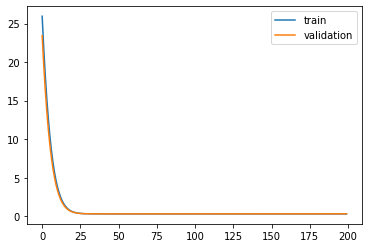

Time to train LSTM:  166.21588778495789
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 11s - loss: 25.7656 - acc: 0.6447 - val_loss: 23.2595 - val_acc: 0.7532

Epoch 00001: val_loss improved from inf to 23.25953, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 21.7579 - acc: 0.7711 - val_loss: 19.5606 - val_acc: 0.7908

Epoch 00002: val_loss improved from 23.25953 to 19.56064, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 18.2464 - acc: 0.8035 - val_loss: 16.3348 - val_acc: 0.8290

Epoch 00003: val_loss improved from 19.56064 to 16.33483, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 15.1992 - acc: 0.8453 - val_loss: 13.5651 - val_acc: 0.8648

Epoch 00004: val_loss improved from 16.33483 to 13.56512, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 12.6009 - acc: 0.8748 - val_loss: 11.2268 - val_acc: 0.8730

Epoch 00005: val_loss improved from 13.56512 to 11.22683, saving model to Event_val_weig

 - 1s - loss: 0.2987 - acc: 0.8878 - val_loss: 0.3058 - val_acc: 0.8848

Epoch 00046: val_loss did not improve from 0.30573
Epoch 47/200
 - 1s - loss: 0.2988 - acc: 0.8878 - val_loss: 0.3059 - val_acc: 0.8847

Epoch 00047: val_loss did not improve from 0.30573
Epoch 48/200
 - 1s - loss: 0.2987 - acc: 0.8878 - val_loss: 0.3058 - val_acc: 0.8844

Epoch 00048: val_loss did not improve from 0.30573
Epoch 49/200
 - 1s - loss: 0.2987 - acc: 0.8879 - val_loss: 0.3060 - val_acc: 0.8846

Epoch 00049: val_loss did not improve from 0.30573
Epoch 50/200
 - 1s - loss: 0.2987 - acc: 0.8879 - val_loss: 0.3059 - val_acc: 0.8848

Epoch 00050: val_loss did not improve from 0.30573
Epoch 51/200
 - 1s - loss: 0.2986 - acc: 0.8880 - val_loss: 0.3060 - val_acc: 0.8844

Epoch 00051: val_loss did not improve from 0.30573
Epoch 52/200
 - 1s - loss: 0.2985 - acc: 0.8881 - val_loss: 0.3059 - val_acc: 0.8847

Epoch 00052: val_loss did not improve from 0.30573
Epoch 53/200
 - 1s - loss: 0.2985 - acc: 0.8880 - val_

 - 1s - loss: 0.2971 - acc: 0.8885 - val_loss: 0.3063 - val_acc: 0.8834

Epoch 00105: val_loss did not improve from 0.30564
Epoch 106/200
 - 1s - loss: 0.2971 - acc: 0.8884 - val_loss: 0.3061 - val_acc: 0.8834

Epoch 00106: val_loss did not improve from 0.30564
Epoch 107/200
 - 1s - loss: 0.2970 - acc: 0.8884 - val_loss: 0.3063 - val_acc: 0.8832

Epoch 00107: val_loss did not improve from 0.30564
Epoch 108/200
 - 1s - loss: 0.2969 - acc: 0.8885 - val_loss: 0.3062 - val_acc: 0.8831

Epoch 00108: val_loss did not improve from 0.30564
Epoch 109/200
 - 1s - loss: 0.2970 - acc: 0.8884 - val_loss: 0.3065 - val_acc: 0.8832

Epoch 00109: val_loss did not improve from 0.30564
Epoch 110/200
 - 1s - loss: 0.2969 - acc: 0.8883 - val_loss: 0.3063 - val_acc: 0.8828

Epoch 00110: val_loss did not improve from 0.30564
Epoch 111/200
 - 1s - loss: 0.2969 - acc: 0.8883 - val_loss: 0.3064 - val_acc: 0.8832

Epoch 00111: val_loss did not improve from 0.30564
Epoch 112/200
 - 1s - loss: 0.2968 - acc: 0.8884


Epoch 00163: val_loss did not improve from 0.30487
Epoch 164/200
 - 1s - loss: 0.2954 - acc: 0.8889 - val_loss: 0.3064 - val_acc: 0.8833

Epoch 00164: val_loss did not improve from 0.30487
Epoch 165/200
 - 1s - loss: 0.2957 - acc: 0.8887 - val_loss: 0.3073 - val_acc: 0.8823

Epoch 00165: val_loss did not improve from 0.30487
Epoch 166/200
 - 1s - loss: 0.2958 - acc: 0.8886 - val_loss: 0.3074 - val_acc: 0.8820

Epoch 00166: val_loss did not improve from 0.30487
Epoch 167/200
 - 1s - loss: 0.2957 - acc: 0.8890 - val_loss: 0.3067 - val_acc: 0.8833

Epoch 00167: val_loss did not improve from 0.30487
Epoch 168/200
 - 1s - loss: 0.2954 - acc: 0.8892 - val_loss: 0.3059 - val_acc: 0.8839

Epoch 00168: val_loss did not improve from 0.30487
Epoch 169/200
 - 1s - loss: 0.2951 - acc: 0.8890 - val_loss: 0.3056 - val_acc: 0.8827

Epoch 00169: val_loss did not improve from 0.30487
Epoch 170/200
 - 1s - loss: 0.2951 - acc: 0.8891 - val_loss: 0.3053 - val_acc: 0.8836

Epoch 00170: val_loss did not imp

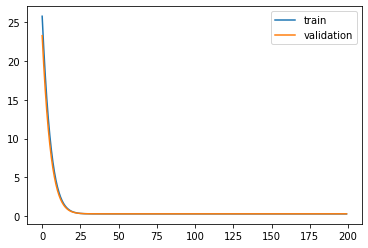

Time to train LSTM:  167.0558841228485
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 11s - loss: 25.9437 - acc: 0.5752 - val_loss: 23.4208 - val_acc: 0.7273

Epoch 00001: val_loss improved from inf to 23.42081, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 21.9140 - acc: 0.7546 - val_loss: 19.7010 - val_acc: 0.7908

Epoch 00002: val_loss improved from 23.42081 to 19.70098, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 18.3848 - acc: 0.8053 - val_loss: 16.4559 - val_acc: 0.8298

Epoch 00003: val_loss improved from 19.70098 to 16.45593, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 15.3200 - acc: 0.8464 - val_loss: 13.6655 - val_acc: 0.8703

Epoch 00004: val_loss improved from 16.45593 to 13.66553, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 12.7033 - acc: 0.8733 - val_loss: 11.3103 - val_acc: 0.8783

Epoch 00005: val_loss improved from 13.66553 to 11.31032, saving model to Event_val_weigh

 - 1s - loss: 0.2990 - acc: 0.8881 - val_loss: 0.3010 - val_acc: 0.8878

Epoch 00046: val_loss improved from 0.30105 to 0.30103, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.2989 - acc: 0.8881 - val_loss: 0.3012 - val_acc: 0.8876

Epoch 00047: val_loss did not improve from 0.30103
Epoch 48/200
 - 1s - loss: 0.2989 - acc: 0.8880 - val_loss: 0.3012 - val_acc: 0.8871

Epoch 00048: val_loss did not improve from 0.30103
Epoch 49/200
 - 1s - loss: 0.2988 - acc: 0.8880 - val_loss: 0.3012 - val_acc: 0.8871

Epoch 00049: val_loss did not improve from 0.30103
Epoch 50/200
 - 1s - loss: 0.2989 - acc: 0.8880 - val_loss: 0.3011 - val_acc: 0.8869

Epoch 00050: val_loss did not improve from 0.30103
Epoch 51/200
 - 1s - loss: 0.2989 - acc: 0.8880 - val_loss: 0.3012 - val_acc: 0.8864

Epoch 00051: val_loss did not improve from 0.30103
Epoch 52/200
 - 1s - loss: 0.2989 - acc: 0.8880 - val_loss: 0.3011 - val_acc: 0.8868

Epoch 00052: val_loss did not improve from 0.30103
Epoch 53/


Epoch 00105: val_loss improved from 0.30096 to 0.30095, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.2973 - acc: 0.8886 - val_loss: 0.3011 - val_acc: 0.8878

Epoch 00106: val_loss did not improve from 0.30095
Epoch 107/200
 - 1s - loss: 0.2973 - acc: 0.8888 - val_loss: 0.3011 - val_acc: 0.8874

Epoch 00107: val_loss did not improve from 0.30095
Epoch 108/200
 - 1s - loss: 0.2973 - acc: 0.8888 - val_loss: 0.3011 - val_acc: 0.8879

Epoch 00108: val_loss did not improve from 0.30095
Epoch 109/200
 - 1s - loss: 0.2973 - acc: 0.8887 - val_loss: 0.3012 - val_acc: 0.8877

Epoch 00109: val_loss did not improve from 0.30095
Epoch 110/200
 - 1s - loss: 0.2975 - acc: 0.8888 - val_loss: 0.3015 - val_acc: 0.8879

Epoch 00110: val_loss did not improve from 0.30095
Epoch 111/200
 - 1s - loss: 0.2974 - acc: 0.8887 - val_loss: 0.3014 - val_acc: 0.8876

Epoch 00111: val_loss did not improve from 0.30095
Epoch 112/200
 - 1s - loss: 0.2974 - acc: 0.8886 - val_loss: 0.3015 - val_a

 - 1s - loss: 0.2954 - acc: 0.8894 - val_loss: 0.3024 - val_acc: 0.8882

Epoch 00165: val_loss did not improve from 0.30095
Epoch 166/200
 - 1s - loss: 0.2950 - acc: 0.8892 - val_loss: 0.3028 - val_acc: 0.8887

Epoch 00166: val_loss did not improve from 0.30095
Epoch 167/200
 - 1s - loss: 0.2952 - acc: 0.8896 - val_loss: 0.3035 - val_acc: 0.8874

Epoch 00167: val_loss did not improve from 0.30095
Epoch 168/200
 - 1s - loss: 0.2951 - acc: 0.8896 - val_loss: 0.3029 - val_acc: 0.8867

Epoch 00168: val_loss did not improve from 0.30095
Epoch 169/200
 - 1s - loss: 0.2947 - acc: 0.8900 - val_loss: 0.3021 - val_acc: 0.8898

Epoch 00169: val_loss did not improve from 0.30095
Epoch 170/200
 - 1s - loss: 0.2949 - acc: 0.8895 - val_loss: 0.3032 - val_acc: 0.8882

Epoch 00170: val_loss did not improve from 0.30095
Epoch 171/200
 - 1s - loss: 0.2951 - acc: 0.8894 - val_loss: 0.3034 - val_acc: 0.8861

Epoch 00171: val_loss did not improve from 0.30095
Epoch 172/200
 - 1s - loss: 0.2950 - acc: 0.8899

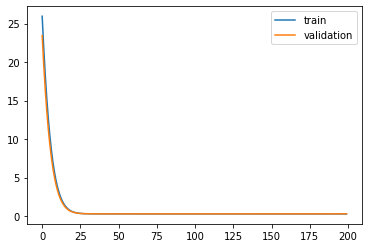

Time to train LSTM:  166.49503374099731
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 12s - loss: 26.9752 - acc: 0.5674 - val_loss: 25.0451 - val_acc: 0.7178

Epoch 00001: val_loss improved from inf to 25.04511, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 24.4070 - acc: 0.7282 - val_loss: 22.6280 - val_acc: 0.7666

Epoch 00002: val_loss improved from 25.04511 to 22.62801, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 22.0411 - acc: 0.7666 - val_loss: 20.3955 - val_acc: 0.7923

Epoch 00003: val_loss improved from 22.62801 to 20.39552, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 19.8552 - acc: 0.7895 - val_loss: 18.3356 - val_acc: 0.8189

Epoch 00004: val_loss improved from 20.39552 to 18.33558, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 17.8395 - acc: 0.8169 - val_loss: 16.4431 - val_acc: 0.8483

Epoch 00005: val_loss improved from 18.33558 to 16.44314, saving model to Event_val_weig


Epoch 00045: val_loss improved from 0.33677 to 0.32908, saving model to Event_val_weights1.hdf5
Epoch 46/200
 - 1s - loss: 0.3323 - acc: 0.8874 - val_loss: 0.3227 - val_acc: 0.8888

Epoch 00046: val_loss improved from 0.32908 to 0.32270, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.3263 - acc: 0.8875 - val_loss: 0.3174 - val_acc: 0.8889

Epoch 00047: val_loss improved from 0.32270 to 0.31743, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3213 - acc: 0.8875 - val_loss: 0.3131 - val_acc: 0.8892

Epoch 00048: val_loss improved from 0.31743 to 0.31306, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.3171 - acc: 0.8875 - val_loss: 0.3095 - val_acc: 0.8892

Epoch 00049: val_loss improved from 0.31306 to 0.30946, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.3138 - acc: 0.8875 - val_loss: 0.3065 - val_acc: 0.8890

Epoch 00050: val_loss improved from 0.30946 to 0.30650, saving model to Event_val_weights

 - 1s - loss: 0.2989 - acc: 0.8875 - val_loss: 0.2936 - val_acc: 0.8892

Epoch 00092: val_loss did not improve from 0.29354
Epoch 93/200
 - 1s - loss: 0.2989 - acc: 0.8876 - val_loss: 0.2936 - val_acc: 0.8891

Epoch 00093: val_loss did not improve from 0.29354
Epoch 94/200
 - 1s - loss: 0.2988 - acc: 0.8875 - val_loss: 0.2936 - val_acc: 0.8891

Epoch 00094: val_loss did not improve from 0.29354
Epoch 95/200
 - 1s - loss: 0.2988 - acc: 0.8875 - val_loss: 0.2935 - val_acc: 0.8890

Epoch 00095: val_loss improved from 0.29354 to 0.29354, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.2988 - acc: 0.8875 - val_loss: 0.2936 - val_acc: 0.8891

Epoch 00096: val_loss did not improve from 0.29354
Epoch 97/200
 - 1s - loss: 0.2988 - acc: 0.8875 - val_loss: 0.2935 - val_acc: 0.8892

Epoch 00097: val_loss did not improve from 0.29354
Epoch 98/200
 - 1s - loss: 0.2988 - acc: 0.8876 - val_loss: 0.2935 - val_acc: 0.8893

Epoch 00098: val_loss did not improve from 0.29354
Epoch 99/


Epoch 00150: val_loss did not improve from 0.29352
Epoch 151/200
 - 1s - loss: 0.2980 - acc: 0.8877 - val_loss: 0.2939 - val_acc: 0.8888

Epoch 00151: val_loss did not improve from 0.29352
Epoch 152/200
 - 1s - loss: 0.2980 - acc: 0.8878 - val_loss: 0.2940 - val_acc: 0.8884

Epoch 00152: val_loss did not improve from 0.29352
Epoch 153/200
 - 1s - loss: 0.2980 - acc: 0.8877 - val_loss: 0.2939 - val_acc: 0.8886

Epoch 00153: val_loss did not improve from 0.29352
Epoch 154/200
 - 1s - loss: 0.2981 - acc: 0.8877 - val_loss: 0.2940 - val_acc: 0.8884

Epoch 00154: val_loss did not improve from 0.29352
Epoch 155/200
 - 1s - loss: 0.2980 - acc: 0.8879 - val_loss: 0.2939 - val_acc: 0.8884

Epoch 00155: val_loss did not improve from 0.29352
Epoch 156/200
 - 1s - loss: 0.2980 - acc: 0.8877 - val_loss: 0.2939 - val_acc: 0.8884

Epoch 00156: val_loss did not improve from 0.29352
Epoch 157/200
 - 1s - loss: 0.2980 - acc: 0.8880 - val_loss: 0.2938 - val_acc: 0.8887

Epoch 00157: val_loss did not imp

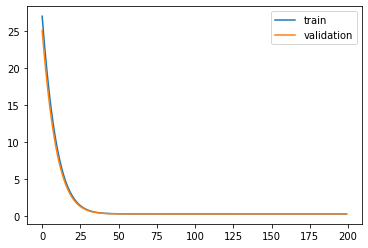

Time to train LSTM:  164.81279516220093
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 12s - loss: 26.9032 - acc: 0.5603 - val_loss: 24.9909 - val_acc: 0.7028

Epoch 00001: val_loss improved from inf to 24.99094, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 24.3476 - acc: 0.7248 - val_loss: 22.5853 - val_acc: 0.7553

Epoch 00002: val_loss improved from 24.99094 to 22.58526, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 21.9890 - acc: 0.7662 - val_loss: 20.3631 - val_acc: 0.7751

Epoch 00003: val_loss improved from 22.58526 to 20.36313, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 19.8111 - acc: 0.7868 - val_loss: 18.3132 - val_acc: 0.7937

Epoch 00004: val_loss improved from 20.36313 to 18.31316, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 17.8038 - acc: 0.8058 - val_loss: 16.4291 - val_acc: 0.8186

Epoch 00005: val_loss improved from 18.31316 to 16.42905, saving model to Event_val_weig


Epoch 00045: val_loss improved from 0.34777 to 0.34016, saving model to Event_val_weights2.hdf5
Epoch 46/200
 - 1s - loss: 0.3309 - acc: 0.8884 - val_loss: 0.3339 - val_acc: 0.8834

Epoch 00046: val_loss improved from 0.34016 to 0.33387, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.3249 - acc: 0.8883 - val_loss: 0.3287 - val_acc: 0.8833

Epoch 00047: val_loss improved from 0.33387 to 0.32866, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.3199 - acc: 0.8883 - val_loss: 0.3244 - val_acc: 0.8833

Epoch 00048: val_loss improved from 0.32866 to 0.32438, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.3158 - acc: 0.8883 - val_loss: 0.3208 - val_acc: 0.8831

Epoch 00049: val_loss improved from 0.32438 to 0.32085, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.3125 - acc: 0.8883 - val_loss: 0.3180 - val_acc: 0.8833

Epoch 00050: val_loss improved from 0.32085 to 0.31796, saving model to Event_val_weights


Epoch 00095: val_loss did not improve from 0.30575
Epoch 96/200
 - 1s - loss: 0.2971 - acc: 0.8890 - val_loss: 0.3060 - val_acc: 0.8846

Epoch 00096: val_loss did not improve from 0.30575
Epoch 97/200
 - 1s - loss: 0.2970 - acc: 0.8890 - val_loss: 0.3062 - val_acc: 0.8844

Epoch 00097: val_loss did not improve from 0.30575
Epoch 98/200
 - 1s - loss: 0.2971 - acc: 0.8890 - val_loss: 0.3060 - val_acc: 0.8848

Epoch 00098: val_loss did not improve from 0.30575
Epoch 99/200
 - 1s - loss: 0.2969 - acc: 0.8890 - val_loss: 0.3063 - val_acc: 0.8843

Epoch 00099: val_loss did not improve from 0.30575
Epoch 100/200
 - 1s - loss: 0.2970 - acc: 0.8889 - val_loss: 0.3060 - val_acc: 0.8849

Epoch 00100: val_loss did not improve from 0.30575
Epoch 101/200
 - 1s - loss: 0.2970 - acc: 0.8890 - val_loss: 0.3063 - val_acc: 0.8843

Epoch 00101: val_loss did not improve from 0.30575
Epoch 102/200
 - 1s - loss: 0.2969 - acc: 0.8890 - val_loss: 0.3062 - val_acc: 0.8846

Epoch 00102: val_loss did not improve

 - 1s - loss: 0.2956 - acc: 0.8893 - val_loss: 0.3078 - val_acc: 0.8841

Epoch 00155: val_loss did not improve from 0.30575
Epoch 156/200
 - 1s - loss: 0.2958 - acc: 0.8893 - val_loss: 0.3083 - val_acc: 0.8838

Epoch 00156: val_loss did not improve from 0.30575
Epoch 157/200
 - 1s - loss: 0.2961 - acc: 0.8892 - val_loss: 0.3089 - val_acc: 0.8837

Epoch 00157: val_loss did not improve from 0.30575
Epoch 158/200
 - 1s - loss: 0.2963 - acc: 0.8889 - val_loss: 0.3084 - val_acc: 0.8839

Epoch 00158: val_loss did not improve from 0.30575
Epoch 159/200
 - 1s - loss: 0.2960 - acc: 0.8890 - val_loss: 0.3073 - val_acc: 0.8843

Epoch 00159: val_loss did not improve from 0.30575
Epoch 160/200
 - 1s - loss: 0.2956 - acc: 0.8896 - val_loss: 0.3073 - val_acc: 0.8850

Epoch 00160: val_loss did not improve from 0.30575
Epoch 161/200
 - 1s - loss: 0.2955 - acc: 0.8892 - val_loss: 0.3079 - val_acc: 0.8846

Epoch 00161: val_loss did not improve from 0.30575
Epoch 162/200
 - 1s - loss: 0.2957 - acc: 0.8892

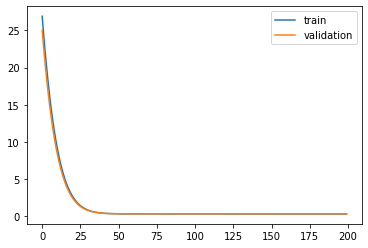

Time to train LSTM:  164.7951259613037


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8ef0da9da0>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 12s - loss: 26.7482 - acc: 0.5482 - val_loss: 24.8386 - val_acc: 0.7040

Epoch 00001: val_loss improved from inf to 24.83858, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 24.1971 - acc: 0.7307 - val_loss: 22.4360 - val_acc: 0.7753

Epoch 00002: val_loss improved from 24.83858 to 22.43599, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 21.8423 - acc: 0.7823 - val_loss: 20.2174 - val_acc: 0.7934

Epoch 00003: val_loss improved from 22.43599 to 20.21738, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 19.6683 - acc: 0.7987 - val_loss: 18.1722 - val_acc: 0.8082

Epoch 00004: val_loss improved from 20.21738 to 18.17221, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 17.6660 - acc: 0.8156 - val_loss: 16.2942 - val_acc: 0.8274

Epoch 00005: val_loss improved from 18.17221 to 16.29418, saving model to Event_val_weights3.hdf5
Epoch 6/200
 - 1s - loss: 15.8

 - 1s - loss: 0.3307 - acc: 0.8878 - val_loss: 0.3296 - val_acc: 0.8878

Epoch 00046: val_loss improved from 0.33582 to 0.32963, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3248 - acc: 0.8878 - val_loss: 0.3245 - val_acc: 0.8879

Epoch 00047: val_loss improved from 0.32963 to 0.32451, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.3199 - acc: 0.8879 - val_loss: 0.3203 - val_acc: 0.8876

Epoch 00048: val_loss improved from 0.32451 to 0.32029, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.3158 - acc: 0.8879 - val_loss: 0.3168 - val_acc: 0.8876

Epoch 00049: val_loss improved from 0.32029 to 0.31683, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.3125 - acc: 0.8879 - val_loss: 0.3140 - val_acc: 0.8876

Epoch 00050: val_loss improved from 0.31683 to 0.31398, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3098 - acc: 0.8879 - val_loss: 0.3117 - val_acc: 0.8876

Epoch 00051: val_

 - 1s - loss: 0.2978 - acc: 0.8884 - val_loss: 0.3024 - val_acc: 0.8884

Epoch 00097: val_loss did not improve from 0.30224
Epoch 98/200
 - 1s - loss: 0.2978 - acc: 0.8883 - val_loss: 0.3024 - val_acc: 0.8882

Epoch 00098: val_loss did not improve from 0.30224
Epoch 99/200
 - 1s - loss: 0.2978 - acc: 0.8883 - val_loss: 0.3023 - val_acc: 0.8882

Epoch 00099: val_loss did not improve from 0.30224
Epoch 100/200
 - 1s - loss: 0.2978 - acc: 0.8883 - val_loss: 0.3024 - val_acc: 0.8880

Epoch 00100: val_loss did not improve from 0.30224
Epoch 101/200
 - 1s - loss: 0.2978 - acc: 0.8884 - val_loss: 0.3025 - val_acc: 0.8881

Epoch 00101: val_loss did not improve from 0.30224
Epoch 102/200
 - 1s - loss: 0.2978 - acc: 0.8884 - val_loss: 0.3025 - val_acc: 0.8879

Epoch 00102: val_loss did not improve from 0.30224
Epoch 103/200
 - 1s - loss: 0.2978 - acc: 0.8884 - val_loss: 0.3026 - val_acc: 0.8877

Epoch 00103: val_loss did not improve from 0.30224
Epoch 104/200
 - 1s - loss: 0.2978 - acc: 0.8885 -


Epoch 00156: val_loss did not improve from 0.30224
Epoch 157/200
 - 1s - loss: 0.2958 - acc: 0.8884 - val_loss: 0.3027 - val_acc: 0.8871

Epoch 00157: val_loss did not improve from 0.30224
Epoch 158/200
 - 1s - loss: 0.2959 - acc: 0.8886 - val_loss: 0.3038 - val_acc: 0.8869

Epoch 00158: val_loss did not improve from 0.30224
Epoch 159/200
 - 1s - loss: 0.2965 - acc: 0.8888 - val_loss: 0.3049 - val_acc: 0.8868

Epoch 00159: val_loss did not improve from 0.30224
Epoch 160/200
 - 1s - loss: 0.2967 - acc: 0.8889 - val_loss: 0.3054 - val_acc: 0.8871

Epoch 00160: val_loss did not improve from 0.30224
Epoch 161/200
 - 1s - loss: 0.2966 - acc: 0.8887 - val_loss: 0.3045 - val_acc: 0.8867

Epoch 00161: val_loss did not improve from 0.30224
Epoch 162/200
 - 1s - loss: 0.2961 - acc: 0.8885 - val_loss: 0.3032 - val_acc: 0.8874

Epoch 00162: val_loss did not improve from 0.30224
Epoch 163/200
 - 1s - loss: 0.2956 - acc: 0.8886 - val_loss: 0.3028 - val_acc: 0.8871

Epoch 00163: val_loss did not imp

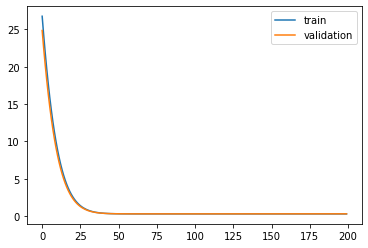

Time to train LSTM:  175.18371605873108
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 12s - loss: 26.9275 - acc: 0.5838 - val_loss: 25.0178 - val_acc: 0.6902

Epoch 00001: val_loss improved from inf to 25.01783, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 24.3715 - acc: 0.7107 - val_loss: 22.6058 - val_acc: 0.7528

Epoch 00002: val_loss improved from 25.01783 to 22.60583, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 22.0073 - acc: 0.7620 - val_loss: 20.3758 - val_acc: 0.7790

Epoch 00003: val_loss improved from 22.60583 to 20.37580, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 19.8224 - acc: 0.7893 - val_loss: 18.3191 - val_acc: 0.8040

Epoch 00004: val_loss improved from 20.37580 to 18.31906, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 17.8090 - acc: 0.8125 - val_loss: 16.4308 - val_acc: 0.8317

Epoch 00005: val_loss improved from 18.31906 to 16.43082, saving model to Event_val_weig


Epoch 00045: val_loss improved from 0.34853 to 0.34079, saving model to Event_val_weights4.hdf5
Epoch 46/200
 - 1s - loss: 0.3316 - acc: 0.8876 - val_loss: 0.3344 - val_acc: 0.8850

Epoch 00046: val_loss improved from 0.34079 to 0.33437, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.3255 - acc: 0.8876 - val_loss: 0.3290 - val_acc: 0.8850

Epoch 00047: val_loss improved from 0.33437 to 0.32903, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.3205 - acc: 0.8876 - val_loss: 0.3246 - val_acc: 0.8850

Epoch 00048: val_loss improved from 0.32903 to 0.32464, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.3163 - acc: 0.8876 - val_loss: 0.3210 - val_acc: 0.8849

Epoch 00049: val_loss improved from 0.32464 to 0.32101, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3129 - acc: 0.8876 - val_loss: 0.3180 - val_acc: 0.8849

Epoch 00050: val_loss improved from 0.32101 to 0.31804, saving model to Event_val_weights

 - 1s - loss: 0.2975 - acc: 0.8883 - val_loss: 0.3053 - val_acc: 0.8842

Epoch 00094: val_loss did not improve from 0.30525
Epoch 95/200
 - 1s - loss: 0.2975 - acc: 0.8884 - val_loss: 0.3053 - val_acc: 0.8842

Epoch 00095: val_loss did not improve from 0.30525
Epoch 96/200
 - 1s - loss: 0.2975 - acc: 0.8884 - val_loss: 0.3053 - val_acc: 0.8843

Epoch 00096: val_loss did not improve from 0.30525
Epoch 97/200
 - 1s - loss: 0.2975 - acc: 0.8885 - val_loss: 0.3053 - val_acc: 0.8841

Epoch 00097: val_loss did not improve from 0.30525
Epoch 98/200
 - 1s - loss: 0.2975 - acc: 0.8885 - val_loss: 0.3053 - val_acc: 0.8840

Epoch 00098: val_loss did not improve from 0.30525
Epoch 99/200
 - 1s - loss: 0.2974 - acc: 0.8885 - val_loss: 0.3053 - val_acc: 0.8842

Epoch 00099: val_loss did not improve from 0.30525
Epoch 100/200
 - 1s - loss: 0.2974 - acc: 0.8885 - val_loss: 0.3053 - val_acc: 0.8842

Epoch 00100: val_loss did not improve from 0.30525
Epoch 101/200
 - 1s - loss: 0.2974 - acc: 0.8887 - va


Epoch 00153: val_loss did not improve from 0.30525
Epoch 154/200
 - 1s - loss: 0.2964 - acc: 0.8890 - val_loss: 0.3065 - val_acc: 0.8831

Epoch 00154: val_loss did not improve from 0.30525
Epoch 155/200
 - 1s - loss: 0.2964 - acc: 0.8891 - val_loss: 0.3062 - val_acc: 0.8830

Epoch 00155: val_loss did not improve from 0.30525
Epoch 156/200
 - 1s - loss: 0.2964 - acc: 0.8890 - val_loss: 0.3065 - val_acc: 0.8829

Epoch 00156: val_loss did not improve from 0.30525
Epoch 157/200
 - 1s - loss: 0.2965 - acc: 0.8890 - val_loss: 0.3064 - val_acc: 0.8828

Epoch 00157: val_loss did not improve from 0.30525
Epoch 158/200
 - 1s - loss: 0.2964 - acc: 0.8891 - val_loss: 0.3064 - val_acc: 0.8827

Epoch 00158: val_loss did not improve from 0.30525
Epoch 159/200
 - 1s - loss: 0.2963 - acc: 0.8893 - val_loss: 0.3063 - val_acc: 0.8826

Epoch 00159: val_loss did not improve from 0.30525
Epoch 160/200
 - 1s - loss: 0.2962 - acc: 0.8892 - val_loss: 0.3064 - val_acc: 0.8829

Epoch 00160: val_loss did not imp

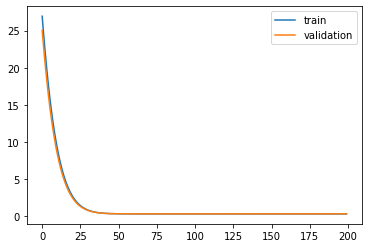

Time to train LSTM:  166.24258852005005
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 12s - loss: 26.7231 - acc: 0.6375 - val_loss: 24.8287 - val_acc: 0.7243

Epoch 00001: val_loss improved from inf to 24.82870, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 24.1885 - acc: 0.7379 - val_loss: 22.4327 - val_acc: 0.7680

Epoch 00002: val_loss improved from 24.82870 to 22.43270, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 21.8403 - acc: 0.7723 - val_loss: 20.2155 - val_acc: 0.7914

Epoch 00003: val_loss improved from 22.43270 to 20.21550, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 19.6684 - acc: 0.7960 - val_loss: 18.1696 - val_acc: 0.8119

Epoch 00004: val_loss improved from 20.21550 to 18.16958, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 17.6661 - acc: 0.8213 - val_loss: 16.2904 - val_acc: 0.8407

Epoch 00005: val_loss improved from 18.16958 to 16.29045, saving model to Event_val_weig


Epoch 00045: val_loss improved from 0.34364 to 0.33606, saving model to Event_val_weights5.hdf5
Epoch 46/200
 - 1s - loss: 0.3312 - acc: 0.8878 - val_loss: 0.3298 - val_acc: 0.8871

Epoch 00046: val_loss improved from 0.33606 to 0.32976, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.3252 - acc: 0.8878 - val_loss: 0.3246 - val_acc: 0.8872

Epoch 00047: val_loss improved from 0.32976 to 0.32455, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.3203 - acc: 0.8878 - val_loss: 0.3203 - val_acc: 0.8871

Epoch 00048: val_loss improved from 0.32455 to 0.32027, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.3162 - acc: 0.8877 - val_loss: 0.3167 - val_acc: 0.8871

Epoch 00049: val_loss improved from 0.32027 to 0.31675, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3128 - acc: 0.8877 - val_loss: 0.3139 - val_acc: 0.8870

Epoch 00050: val_loss improved from 0.31675 to 0.31386, saving model to Event_val_weights

 - 1s - loss: 0.2978 - acc: 0.8880 - val_loss: 0.3015 - val_acc: 0.8867

Epoch 00095: val_loss did not improve from 0.30127
Epoch 96/200
 - 1s - loss: 0.2977 - acc: 0.8881 - val_loss: 0.3013 - val_acc: 0.8871

Epoch 00096: val_loss did not improve from 0.30127
Epoch 97/200
 - 1s - loss: 0.2977 - acc: 0.8881 - val_loss: 0.3014 - val_acc: 0.8870

Epoch 00097: val_loss did not improve from 0.30127
Epoch 98/200
 - 1s - loss: 0.2977 - acc: 0.8881 - val_loss: 0.3014 - val_acc: 0.8871

Epoch 00098: val_loss did not improve from 0.30127
Epoch 99/200
 - 1s - loss: 0.2977 - acc: 0.8882 - val_loss: 0.3013 - val_acc: 0.8869

Epoch 00099: val_loss did not improve from 0.30127
Epoch 100/200
 - 1s - loss: 0.2977 - acc: 0.8882 - val_loss: 0.3017 - val_acc: 0.8869

Epoch 00100: val_loss did not improve from 0.30127
Epoch 101/200
 - 1s - loss: 0.2977 - acc: 0.8882 - val_loss: 0.3013 - val_acc: 0.8871

Epoch 00101: val_loss did not improve from 0.30127
Epoch 102/200
 - 1s - loss: 0.2976 - acc: 0.8884 - v

 - 1s - loss: 0.2963 - acc: 0.8890 - val_loss: 0.3033 - val_acc: 0.8877

Epoch 00154: val_loss did not improve from 0.30115
Epoch 155/200
 - 1s - loss: 0.2961 - acc: 0.8890 - val_loss: 0.3034 - val_acc: 0.8882

Epoch 00155: val_loss did not improve from 0.30115
Epoch 156/200
 - 1s - loss: 0.2963 - acc: 0.8889 - val_loss: 0.3035 - val_acc: 0.8881

Epoch 00156: val_loss did not improve from 0.30115
Epoch 157/200
 - 1s - loss: 0.2965 - acc: 0.8890 - val_loss: 0.3039 - val_acc: 0.8886

Epoch 00157: val_loss did not improve from 0.30115
Epoch 158/200
 - 1s - loss: 0.2970 - acc: 0.8888 - val_loss: 0.3023 - val_acc: 0.8888

Epoch 00158: val_loss did not improve from 0.30115
Epoch 159/200
 - 1s - loss: 0.2968 - acc: 0.8892 - val_loss: 0.3036 - val_acc: 0.8890

Epoch 00159: val_loss did not improve from 0.30115
Epoch 160/200
 - 1s - loss: 0.2969 - acc: 0.8893 - val_loss: 0.3039 - val_acc: 0.8887

Epoch 00160: val_loss did not improve from 0.30115
Epoch 161/200
 - 1s - loss: 0.2964 - acc: 0.8891

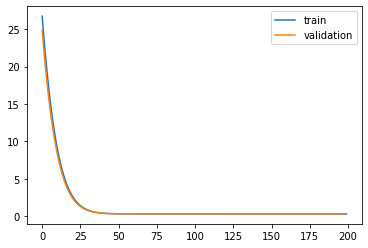

Time to train LSTM:  166.3791584968567
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 12s - loss: 27.3606 - acc: 0.4920 - val_loss: 25.7605 - val_acc: 0.6103

Epoch 00001: val_loss improved from inf to 25.76045, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 25.6018 - acc: 0.6199 - val_loss: 24.0876 - val_acc: 0.7384

Epoch 00002: val_loss improved from 25.76045 to 24.08758, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 23.9395 - acc: 0.7321 - val_loss: 22.5035 - val_acc: 0.7802

Epoch 00003: val_loss improved from 24.08758 to 22.50348, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 22.3652 - acc: 0.7701 - val_loss: 21.0021 - val_acc: 0.7928

Epoch 00004: val_loss improved from 22.50348 to 21.00209, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 20.8729 - acc: 0.7854 - val_loss: 19.5792 - val_acc: 0.8054

Epoch 00005: val_loss improved from 21.00209 to 19.57918, saving model to Event_val_weigh


Epoch 00045: val_loss improved from 0.87386 to 0.81436, saving model to Event_val_weights1.hdf5
Epoch 46/200
 - 1s - loss: 0.8143 - acc: 0.8872 - val_loss: 0.7606 - val_acc: 0.8878

Epoch 00046: val_loss improved from 0.81436 to 0.76060, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.7610 - acc: 0.8870 - val_loss: 0.7119 - val_acc: 0.8881

Epoch 00047: val_loss improved from 0.76060 to 0.71193, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.7127 - acc: 0.8871 - val_loss: 0.6679 - val_acc: 0.8877

Epoch 00048: val_loss improved from 0.71193 to 0.66789, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.6692 - acc: 0.8872 - val_loss: 0.6282 - val_acc: 0.8877

Epoch 00049: val_loss improved from 0.66789 to 0.62818, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.6298 - acc: 0.8871 - val_loss: 0.5924 - val_acc: 0.8876

Epoch 00050: val_loss improved from 0.62818 to 0.59242, saving model to Event_val_weights

 - 1s - loss: 0.3010 - acc: 0.8870 - val_loss: 0.2955 - val_acc: 0.8887

Epoch 00091: val_loss improved from 0.29571 to 0.29551, saving model to Event_val_weights1.hdf5
Epoch 92/200
 - 1s - loss: 0.3008 - acc: 0.8870 - val_loss: 0.2953 - val_acc: 0.8890

Epoch 00092: val_loss improved from 0.29551 to 0.29534, saving model to Event_val_weights1.hdf5
Epoch 93/200
 - 1s - loss: 0.3007 - acc: 0.8870 - val_loss: 0.2952 - val_acc: 0.8890

Epoch 00093: val_loss improved from 0.29534 to 0.29519, saving model to Event_val_weights1.hdf5
Epoch 94/200
 - 1s - loss: 0.3005 - acc: 0.8870 - val_loss: 0.2951 - val_acc: 0.8890

Epoch 00094: val_loss improved from 0.29519 to 0.29507, saving model to Event_val_weights1.hdf5
Epoch 95/200
 - 1s - loss: 0.3004 - acc: 0.8870 - val_loss: 0.2950 - val_acc: 0.8890

Epoch 00095: val_loss improved from 0.29507 to 0.29496, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.3003 - acc: 0.8870 - val_loss: 0.2949 - val_acc: 0.8890

Epoch 00096: val_


Epoch 00138: val_loss did not improve from 0.29426
Epoch 139/200
 - 1s - loss: 0.2996 - acc: 0.8872 - val_loss: 0.2943 - val_acc: 0.8889

Epoch 00139: val_loss did not improve from 0.29426
Epoch 140/200
 - 1s - loss: 0.2996 - acc: 0.8873 - val_loss: 0.2943 - val_acc: 0.8888

Epoch 00140: val_loss did not improve from 0.29426
Epoch 141/200
 - 1s - loss: 0.2996 - acc: 0.8872 - val_loss: 0.2943 - val_acc: 0.8889

Epoch 00141: val_loss did not improve from 0.29426
Epoch 142/200
 - 1s - loss: 0.2995 - acc: 0.8873 - val_loss: 0.2943 - val_acc: 0.8888

Epoch 00142: val_loss did not improve from 0.29426
Epoch 143/200
 - 1s - loss: 0.2995 - acc: 0.8873 - val_loss: 0.2943 - val_acc: 0.8888

Epoch 00143: val_loss did not improve from 0.29426
Epoch 144/200
 - 1s - loss: 0.2995 - acc: 0.8874 - val_loss: 0.2943 - val_acc: 0.8888

Epoch 00144: val_loss did not improve from 0.29426
Epoch 145/200
 - 1s - loss: 0.2995 - acc: 0.8874 - val_loss: 0.2943 - val_acc: 0.8888

Epoch 00145: val_loss did not imp

 - 1s - loss: 0.2990 - acc: 0.8880 - val_loss: 0.2949 - val_acc: 0.8900

Epoch 00198: val_loss did not improve from 0.29426
Epoch 199/200
 - 1s - loss: 0.2992 - acc: 0.8876 - val_loss: 0.2952 - val_acc: 0.8890

Epoch 00199: val_loss did not improve from 0.29426
Epoch 200/200
 - 1s - loss: 0.2989 - acc: 0.8878 - val_loss: 0.2951 - val_acc: 0.8886

Epoch 00200: val_loss did not improve from 0.29426
#################################
Number of units: 128
Batch size: 65536
Fold: 0
best val loss: 0.2942593991756439
#################################


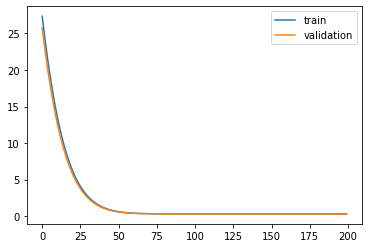

Time to train LSTM:  164.12373328208923
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 12s - loss: 27.2947 - acc: 0.5492 - val_loss: 25.7106 - val_acc: 0.6898

Epoch 00001: val_loss improved from inf to 25.71057, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 25.5441 - acc: 0.7034 - val_loss: 24.0458 - val_acc: 0.7440

Epoch 00002: val_loss improved from 25.71057 to 24.04580, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 23.8864 - acc: 0.7562 - val_loss: 22.4672 - val_acc: 0.7640

Epoch 00003: val_loss improved from 24.04580 to 22.46722, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 22.3145 - acc: 0.7761 - val_loss: 20.9695 - val_acc: 0.7781

Epoch 00004: val_loss improved from 22.46722 to 20.96949, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 20.8234 - acc: 0.7883 - val_loss: 19.5490 - val_acc: 0.7886

Epoch 00005: val_loss improved from 20.96949 to 19.54905, saving model to Event_val_weig


Epoch 00045: val_loss improved from 0.88583 to 0.82643, saving model to Event_val_weights2.hdf5
Epoch 46/200
 - 1s - loss: 0.8127 - acc: 0.8882 - val_loss: 0.7727 - val_acc: 0.8834

Epoch 00046: val_loss improved from 0.82643 to 0.77265, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.7594 - acc: 0.8882 - val_loss: 0.7240 - val_acc: 0.8837

Epoch 00047: val_loss improved from 0.77265 to 0.72396, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.7112 - acc: 0.8884 - val_loss: 0.6800 - val_acc: 0.8838

Epoch 00048: val_loss improved from 0.72396 to 0.67999, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.6677 - acc: 0.8885 - val_loss: 0.6403 - val_acc: 0.8838

Epoch 00049: val_loss improved from 0.67999 to 0.64031, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.6285 - acc: 0.8883 - val_loss: 0.6045 - val_acc: 0.8834

Epoch 00050: val_loss improved from 0.64031 to 0.60450, saving model to Event_val_weights

 - 1s - loss: 0.2995 - acc: 0.8884 - val_loss: 0.3081 - val_acc: 0.8839

Epoch 00091: val_loss improved from 0.30820 to 0.30812, saving model to Event_val_weights2.hdf5
Epoch 92/200
 - 1s - loss: 0.2993 - acc: 0.8884 - val_loss: 0.3080 - val_acc: 0.8839

Epoch 00092: val_loss improved from 0.30812 to 0.30803, saving model to Event_val_weights2.hdf5
Epoch 93/200
 - 1s - loss: 0.2992 - acc: 0.8884 - val_loss: 0.3078 - val_acc: 0.8838

Epoch 00093: val_loss improved from 0.30803 to 0.30779, saving model to Event_val_weights2.hdf5
Epoch 94/200
 - 1s - loss: 0.2990 - acc: 0.8885 - val_loss: 0.3079 - val_acc: 0.8838

Epoch 00094: val_loss did not improve from 0.30779
Epoch 95/200
 - 1s - loss: 0.2989 - acc: 0.8884 - val_loss: 0.3076 - val_acc: 0.8839

Epoch 00095: val_loss improved from 0.30779 to 0.30760, saving model to Event_val_weights2.hdf5
Epoch 96/200
 - 1s - loss: 0.2988 - acc: 0.8884 - val_loss: 0.3078 - val_acc: 0.8839

Epoch 00096: val_loss did not improve from 0.30760
Epoch 97/20


Epoch 00147: val_loss did not improve from 0.30730
Epoch 148/200
 - 1s - loss: 0.2973 - acc: 0.8893 - val_loss: 0.3085 - val_acc: 0.8838

Epoch 00148: val_loss did not improve from 0.30730
Epoch 149/200
 - 1s - loss: 0.2977 - acc: 0.8890 - val_loss: 0.3073 - val_acc: 0.8839

Epoch 00149: val_loss did not improve from 0.30730
Epoch 150/200
 - 1s - loss: 0.2973 - acc: 0.8893 - val_loss: 0.3074 - val_acc: 0.8838

Epoch 00150: val_loss did not improve from 0.30730
Epoch 151/200
 - 1s - loss: 0.2973 - acc: 0.8893 - val_loss: 0.3083 - val_acc: 0.8838

Epoch 00151: val_loss did not improve from 0.30730
Epoch 152/200
 - 1s - loss: 0.2976 - acc: 0.8891 - val_loss: 0.3075 - val_acc: 0.8837

Epoch 00152: val_loss did not improve from 0.30730
Epoch 153/200
 - 1s - loss: 0.2972 - acc: 0.8894 - val_loss: 0.3076 - val_acc: 0.8841

Epoch 00153: val_loss did not improve from 0.30730
Epoch 154/200
 - 1s - loss: 0.2972 - acc: 0.8892 - val_loss: 0.3076 - val_acc: 0.8838

Epoch 00154: val_loss did not imp

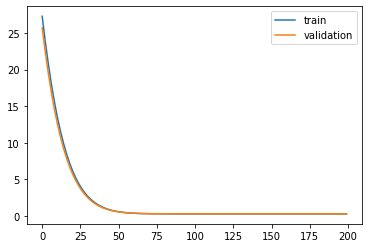

Time to train LSTM:  163.10317182540894
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 13s - loss: 27.3042 - acc: 0.5655 - val_loss: 25.7202 - val_acc: 0.6834

Epoch 00001: val_loss improved from inf to 25.72017, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 25.5581 - acc: 0.6885 - val_loss: 24.0569 - val_acc: 0.7462

Epoch 00002: val_loss improved from 25.72017 to 24.05686, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 23.9026 - acc: 0.7478 - val_loss: 22.4782 - val_acc: 0.7751

Epoch 00003: val_loss improved from 24.05686 to 22.47820, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 22.3314 - acc: 0.7738 - val_loss: 20.9796 - val_acc: 0.7909

Epoch 00004: val_loss improved from 22.47820 to 20.97958, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 20.8400 - acc: 0.7904 - val_loss: 19.5582 - val_acc: 0.8087

Epoch 00005: val_loss improved from 20.97958 to 19.55815, saving model to Event_val_weig


Epoch 00045: val_loss improved from 0.88560 to 0.82582, saving model to Event_val_weights3.hdf5
Epoch 46/200
 - 1s - loss: 0.8164 - acc: 0.8884 - val_loss: 0.7717 - val_acc: 0.8871

Epoch 00046: val_loss improved from 0.82582 to 0.77173, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.7628 - acc: 0.8883 - val_loss: 0.7227 - val_acc: 0.8871

Epoch 00047: val_loss improved from 0.77173 to 0.72273, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.7143 - acc: 0.8882 - val_loss: 0.6784 - val_acc: 0.8872

Epoch 00048: val_loss improved from 0.72273 to 0.67843, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.6704 - acc: 0.8883 - val_loss: 0.6385 - val_acc: 0.8872

Epoch 00049: val_loss improved from 0.67843 to 0.63850, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.6309 - acc: 0.8882 - val_loss: 0.6025 - val_acc: 0.8873

Epoch 00050: val_loss improved from 0.63850 to 0.60254, saving model to Event_val_weights

 - 1s - loss: 0.2993 - acc: 0.8883 - val_loss: 0.3044 - val_acc: 0.8876

Epoch 00091: val_loss did not improve from 0.30405
Epoch 92/200
 - 1s - loss: 0.2992 - acc: 0.8882 - val_loss: 0.3037 - val_acc: 0.8876

Epoch 00092: val_loss improved from 0.30405 to 0.30371, saving model to Event_val_weights3.hdf5
Epoch 93/200
 - 1s - loss: 0.2990 - acc: 0.8882 - val_loss: 0.3036 - val_acc: 0.8872

Epoch 00093: val_loss improved from 0.30371 to 0.30359, saving model to Event_val_weights3.hdf5
Epoch 94/200
 - 1s - loss: 0.2994 - acc: 0.8878 - val_loss: 0.3039 - val_acc: 0.8876

Epoch 00094: val_loss did not improve from 0.30359
Epoch 95/200
 - 1s - loss: 0.2997 - acc: 0.8877 - val_loss: 0.3033 - val_acc: 0.8880

Epoch 00095: val_loss improved from 0.30359 to 0.30334, saving model to Event_val_weights3.hdf5
Epoch 96/200
 - 1s - loss: 0.2988 - acc: 0.8878 - val_loss: 0.3038 - val_acc: 0.8876

Epoch 00096: val_loss did not improve from 0.30334
Epoch 97/200
 - 1s - loss: 0.2986 - acc: 0.8882 - val_lo

 - 1s - loss: 0.2972 - acc: 0.8887 - val_loss: 0.3075 - val_acc: 0.8864

Epoch 00149: val_loss did not improve from 0.30308
Epoch 150/200
 - 1s - loss: 0.2985 - acc: 0.8886 - val_loss: 0.3068 - val_acc: 0.8869

Epoch 00150: val_loss did not improve from 0.30308
Epoch 151/200
 - 1s - loss: 0.2977 - acc: 0.8884 - val_loss: 0.3049 - val_acc: 0.8863

Epoch 00151: val_loss did not improve from 0.30308
Epoch 152/200
 - 1s - loss: 0.2969 - acc: 0.8886 - val_loss: 0.3064 - val_acc: 0.8853

Epoch 00152: val_loss did not improve from 0.30308
Epoch 153/200
 - 1s - loss: 0.2975 - acc: 0.8884 - val_loss: 0.3080 - val_acc: 0.8850

Epoch 00153: val_loss did not improve from 0.30308
Epoch 154/200
 - 1s - loss: 0.2982 - acc: 0.8887 - val_loss: 0.3073 - val_acc: 0.8859

Epoch 00154: val_loss did not improve from 0.30308
Epoch 155/200
 - 1s - loss: 0.2977 - acc: 0.8888 - val_loss: 0.3059 - val_acc: 0.8870

Epoch 00155: val_loss did not improve from 0.30308
Epoch 156/200
 - 1s - loss: 0.2979 - acc: 0.8882

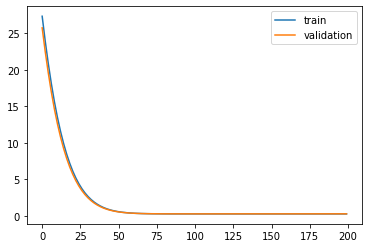

Time to train LSTM:  163.7770516872406
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 13s - loss: 27.5027 - acc: 0.4821 - val_loss: 25.9014 - val_acc: 0.6336

Epoch 00001: val_loss improved from inf to 25.90140, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 25.7393 - acc: 0.6442 - val_loss: 24.2262 - val_acc: 0.7146

Epoch 00002: val_loss improved from 25.90140 to 24.22624, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 24.0718 - acc: 0.7213 - val_loss: 22.6392 - val_acc: 0.7449

Epoch 00003: val_loss improved from 24.22624 to 22.63923, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 22.4918 - acc: 0.7518 - val_loss: 21.1343 - val_acc: 0.7624

Epoch 00004: val_loss improved from 22.63923 to 21.13434, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 20.9933 - acc: 0.7700 - val_loss: 19.7076 - val_acc: 0.7774

Epoch 00005: val_loss improved from 21.13434 to 19.70755, saving model to Event_val_weigh


Epoch 00045: val_loss improved from 0.89214 to 0.83201, saving model to Event_val_weights4.hdf5
Epoch 46/200
 - 1s - loss: 0.8190 - acc: 0.8877 - val_loss: 0.7775 - val_acc: 0.8839

Epoch 00046: val_loss improved from 0.83201 to 0.77754, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.7652 - acc: 0.8877 - val_loss: 0.7283 - val_acc: 0.8839

Epoch 00047: val_loss improved from 0.77754 to 0.72830, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.7164 - acc: 0.8877 - val_loss: 0.6839 - val_acc: 0.8838

Epoch 00048: val_loss improved from 0.72830 to 0.68386, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.6724 - acc: 0.8877 - val_loss: 0.6438 - val_acc: 0.8834

Epoch 00049: val_loss improved from 0.68386 to 0.64375, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.6326 - acc: 0.8878 - val_loss: 0.6075 - val_acc: 0.8836

Epoch 00050: val_loss improved from 0.64375 to 0.60754, saving model to Event_val_weights

 - 1s - loss: 0.2995 - acc: 0.8879 - val_loss: 0.3065 - val_acc: 0.8840

Epoch 00091: val_loss improved from 0.30674 to 0.30653, saving model to Event_val_weights4.hdf5
Epoch 92/200
 - 1s - loss: 0.2993 - acc: 0.8879 - val_loss: 0.3064 - val_acc: 0.8841

Epoch 00092: val_loss improved from 0.30653 to 0.30642, saving model to Event_val_weights4.hdf5
Epoch 93/200
 - 1s - loss: 0.2991 - acc: 0.8879 - val_loss: 0.3062 - val_acc: 0.8840

Epoch 00093: val_loss improved from 0.30642 to 0.30622, saving model to Event_val_weights4.hdf5
Epoch 94/200
 - 1s - loss: 0.2990 - acc: 0.8880 - val_loss: 0.3061 - val_acc: 0.8838

Epoch 00094: val_loss improved from 0.30622 to 0.30612, saving model to Event_val_weights4.hdf5
Epoch 95/200
 - 1s - loss: 0.2988 - acc: 0.8879 - val_loss: 0.3060 - val_acc: 0.8837

Epoch 00095: val_loss improved from 0.30612 to 0.30604, saving model to Event_val_weights4.hdf5
Epoch 96/200
 - 1s - loss: 0.2988 - acc: 0.8878 - val_loss: 0.3059 - val_acc: 0.8838

Epoch 00096: val_

 - 1s - loss: 0.2974 - acc: 0.8885 - val_loss: 0.3059 - val_acc: 0.8837

Epoch 00144: val_loss did not improve from 0.30547
Epoch 145/200
 - 1s - loss: 0.2974 - acc: 0.8886 - val_loss: 0.3059 - val_acc: 0.8836

Epoch 00145: val_loss did not improve from 0.30547
Epoch 146/200
 - 1s - loss: 0.2974 - acc: 0.8887 - val_loss: 0.3060 - val_acc: 0.8836

Epoch 00146: val_loss did not improve from 0.30547
Epoch 147/200
 - 1s - loss: 0.2974 - acc: 0.8886 - val_loss: 0.3060 - val_acc: 0.8836

Epoch 00147: val_loss did not improve from 0.30547
Epoch 148/200
 - 1s - loss: 0.2974 - acc: 0.8887 - val_loss: 0.3060 - val_acc: 0.8834

Epoch 00148: val_loss did not improve from 0.30547
Epoch 149/200
 - 1s - loss: 0.2973 - acc: 0.8886 - val_loss: 0.3061 - val_acc: 0.8836

Epoch 00149: val_loss did not improve from 0.30547
Epoch 150/200
 - 1s - loss: 0.2972 - acc: 0.8886 - val_loss: 0.3063 - val_acc: 0.8832

Epoch 00150: val_loss did not improve from 0.30547
Epoch 151/200
 - 1s - loss: 0.2972 - acc: 0.8886

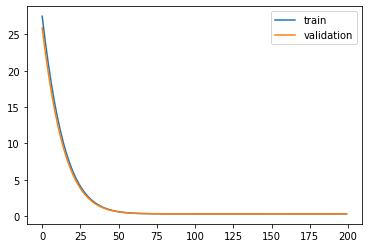

Time to train LSTM:  162.78760433197021
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 13s - loss: 27.4895 - acc: 0.4505 - val_loss: 25.8810 - val_acc: 0.6449

Epoch 00001: val_loss improved from inf to 25.88103, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 25.7158 - acc: 0.6590 - val_loss: 24.1981 - val_acc: 0.7283

Epoch 00002: val_loss improved from 25.88103 to 24.19805, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 24.0430 - acc: 0.7340 - val_loss: 22.6072 - val_acc: 0.7566

Epoch 00003: val_loss improved from 24.19805 to 22.60716, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 22.4611 - acc: 0.7598 - val_loss: 21.1007 - val_acc: 0.7751

Epoch 00004: val_loss improved from 22.60716 to 21.10069, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 20.9628 - acc: 0.7751 - val_loss: 19.6735 - val_acc: 0.7902

Epoch 00005: val_loss improved from 21.10069 to 19.67348, saving model to Event_val_weig


Epoch 00045: val_loss improved from 0.89042 to 0.83021, saving model to Event_val_weights5.hdf5
Epoch 46/200
 - 1s - loss: 0.8210 - acc: 0.8877 - val_loss: 0.7757 - val_acc: 0.8872

Epoch 00046: val_loss improved from 0.83021 to 0.77565, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.7670 - acc: 0.8879 - val_loss: 0.7263 - val_acc: 0.8869

Epoch 00047: val_loss improved from 0.77565 to 0.72627, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.7182 - acc: 0.8878 - val_loss: 0.6816 - val_acc: 0.8871

Epoch 00048: val_loss improved from 0.72627 to 0.68163, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.6740 - acc: 0.8878 - val_loss: 0.6414 - val_acc: 0.8871

Epoch 00049: val_loss improved from 0.68163 to 0.64137, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.6342 - acc: 0.8878 - val_loss: 0.6051 - val_acc: 0.8868

Epoch 00050: val_loss improved from 0.64137 to 0.60514, saving model to Event_val_weights

 - 1s - loss: 0.2999 - acc: 0.8881 - val_loss: 0.3034 - val_acc: 0.8870

Epoch 00091: val_loss improved from 0.30362 to 0.30344, saving model to Event_val_weights5.hdf5
Epoch 92/200
 - 1s - loss: 0.2997 - acc: 0.8881 - val_loss: 0.3033 - val_acc: 0.8870

Epoch 00092: val_loss improved from 0.30344 to 0.30332, saving model to Event_val_weights5.hdf5
Epoch 93/200
 - 1s - loss: 0.2996 - acc: 0.8881 - val_loss: 0.3031 - val_acc: 0.8871

Epoch 00093: val_loss improved from 0.30332 to 0.30315, saving model to Event_val_weights5.hdf5
Epoch 94/200
 - 1s - loss: 0.2994 - acc: 0.8881 - val_loss: 0.3031 - val_acc: 0.8871

Epoch 00094: val_loss improved from 0.30315 to 0.30310, saving model to Event_val_weights5.hdf5
Epoch 95/200
 - 1s - loss: 0.2993 - acc: 0.8881 - val_loss: 0.3030 - val_acc: 0.8872

Epoch 00095: val_loss improved from 0.30310 to 0.30296, saving model to Event_val_weights5.hdf5
Epoch 96/200
 - 1s - loss: 0.2992 - acc: 0.8881 - val_loss: 0.3029 - val_acc: 0.8874

Epoch 00096: val_

 - 1s - loss: 0.2980 - acc: 0.8885 - val_loss: 0.3030 - val_acc: 0.8876

Epoch 00144: val_loss did not improve from 0.30192
Epoch 145/200
 - 1s - loss: 0.2980 - acc: 0.8884 - val_loss: 0.3026 - val_acc: 0.8873

Epoch 00145: val_loss did not improve from 0.30192
Epoch 146/200
 - 1s - loss: 0.2978 - acc: 0.8886 - val_loss: 0.3028 - val_acc: 0.8872

Epoch 00146: val_loss did not improve from 0.30192
Epoch 147/200
 - 1s - loss: 0.2978 - acc: 0.8885 - val_loss: 0.3025 - val_acc: 0.8872

Epoch 00147: val_loss did not improve from 0.30192
Epoch 148/200
 - 1s - loss: 0.2978 - acc: 0.8886 - val_loss: 0.3031 - val_acc: 0.8871

Epoch 00148: val_loss did not improve from 0.30192
Epoch 149/200
 - 1s - loss: 0.2980 - acc: 0.8887 - val_loss: 0.3031 - val_acc: 0.8873

Epoch 00149: val_loss did not improve from 0.30192
Epoch 150/200
 - 1s - loss: 0.2982 - acc: 0.8886 - val_loss: 0.3042 - val_acc: 0.8863

Epoch 00150: val_loss did not improve from 0.30192
Epoch 151/200
 - 1s - loss: 0.2991 - acc: 0.8885

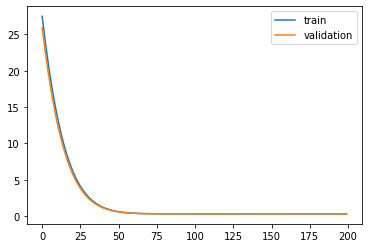

Time to train LSTM:  162.38315868377686
Entire process took:  11351.750624656677
Experiment record:
[[32, 4096, 0, 0.2939524393346575], [32, 4096, 1, 0.3066268875333998], [32, 4096, 2, 0.30254790782928465], [32, 4096, 3, 0.30564250445365904], [32, 4096, 4, 0.30223504707548354], [32, 8192, 0, 0.2940163224803077], [32, 8192, 1, 0.3051396623187595], [32, 8192, 2, 0.302403668695026], [32, 8192, 3, 0.3054456609884898], [32, 8192, 4, 0.301388916015625], [32, 16384, 0, 0.2933337688446045], [32, 16384, 1, 0.30447033047676086], [32, 16384, 2, 0.30212876200675964], [32, 16384, 3, 0.3050364553928375], [32, 16384, 4, 0.300428569316864], [32, 32768, 0, 0.2935233414173126], [32, 32768, 1, 0.304805189371109], [32, 32768, 2, 0.3018345832824707], [32, 32768, 3, 0.30427056550979614], [32, 32768, 4, 0.30100953578948975], [32, 65536, 0, 0.2943739891052246], [32, 65536, 1, 0.305981308221817], [32, 65536, 2, 0.3024838864803314], [32, 65536, 3, 0.30553901195526123], [32, 65536, 4, 0.301823228597641], [64, 40

In [12]:
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)

num_per_fold = x_train.shape[0]//10
print(num_per_fold)

units_list = [32, 64, 128]#[2,4,8]#[1,2,4,8,16]
batch_size_list = [4096, 8192, 16384, 32768, 65536] #[2048, 4096, 8192, 16384, 32768]# [32768, 65536] #

start_time = time.time()

exp_record = []

for units in units_list:
    for batch_s in batch_size_list:
        for f in range(5):#10
            #start = f*num_per_fold
            end = (f+1)*num_per_fold
            train1_x = x_train[:end, ]
            train2_x = x_train[end:, ]
            train_x_lstm = np.append(train2_x, train1_x, axis=0) 
            train1_y = y_train[:end, ]
            train2_y = y_train[end:, ]
            train_y_lstm = np.append(train2_y, train1_y, axis=0)

            start_time_inner = time.time()
            with tf.Session(config = tf.ConfigProto(log_device_placement = True)):
                model = Sequential()
                model.add(CuDNNLSTM(units,
                                    kernel_regularizer=regularizers.l2(0.1),
                                    #return_sequences=True, 
                                    input_shape=(8, 182))) #20 , 27
                #model.add(CuDNNLSTM(units, 
                #                    kernel_regularizer=regularizers.l2(0.01)))
                model.add(Dense(2, activation='softmax'))
                model.compile(loss='categorical_crossentropy', 
                              optimizer='adam', metrics=['accuracy'])
                val_weight = "Event_val_weights" + str(f+1) + ".hdf5"
                val_checkpointer = ModelCheckpoint(filepath=val_weight,
                                            monitor='val_loss', verbose=1,
                                            save_best_only=True)
                history = model.fit(train_x_lstm, train_y_lstm, batch_size=batch_s, 
                                    epochs=200, validation_split=0.1, 
                                    callbacks=[val_checkpointer], 
                                    verbose=2, 
                                    shuffle=False, 
                                    #sample_weight=class_weight.\
                                    #      compute_sample_weight("balanced",
                                    #                            train_y_lstm[:, 1])
                                   ) 
                print("#################################")
                print("Number of units:", units)
                print("Batch size:", batch_s)
                print("Fold:", f)
                print("best val loss:", min(history.history['val_loss']))
                exp_record.append([units, batch_s, f, min(history.history['val_loss'])])
                print("#################################")
                if(f==4):
                    print(exp_record)
                pyplot.plot(history.history['loss'], label='train')
                pyplot.plot(history.history['val_loss'], label='validation')
                pyplot.legend()
                pyplot.show()
            end_time = time.time()
            print("Time to train LSTM: ", time.time() - start_time_inner)
print("Entire process took: ", time.time() - start_time)

print("Experiment record:")
print(exp_record)

In [2]:
exp_record = [[8, 4096, 0, 0.29334267761972216], [8, 4096, 1, 0.3064666604995728], [8, 4096, 2, 0.3027703593307071], [8, 4096, 3, 0.306638645807902], [8, 4096, 4, 0.3019667476548089], [8, 8192, 0, 0.29301599921120536], [8, 8192, 1, 0.30508295554584924], [8, 8192, 2, 0.30215606151686775], [8, 8192, 3, 0.3040102537208133], [8, 8192, 4, 0.301602466000451], [8, 16384, 0, 0.2936018109321594], [8, 16384, 1, 0.3042809069156647], [8, 16384, 2, 0.30164119601249695], [8, 16384, 3, 0.30496934056282043], [8, 16384, 4, 0.301056832075119], [8, 32768, 0, 0.29430001974105835], [8, 32768, 1, 0.3060149550437927], [8, 32768, 2, 0.30197495222091675], [8, 32768, 3, 0.3047232925891876], [8, 32768, 4, 0.30065104365348816], [8, 65536, 0, 0.2957305312156677], [8, 65536, 1, 0.30901026725769043], [8, 65536, 2, 0.3028278350830078], [8, 65536, 3, 0.3072833716869354], [8, 65536, 4, 0.3025093674659729], [16, 4096, 0, 0.2928628454208374], [16, 4096, 1, 0.30672899717754787], [16, 4096, 2, 0.30246582984924314], [16, 4096, 3, 0.3055028935008579], [16, 4096, 4, 0.3024392026530372], [16, 8192, 0, 0.29383939690060085], [16, 8192, 1, 0.3056660787794325], [16, 8192, 2, 0.30225990279515585], [16, 8192, 3, 0.30482467161284554], [16, 8192, 4, 0.30065527407328285], [16, 16384, 0, 0.29384469985961914], [16, 16384, 1, 0.3046119809150696], [16, 16384, 2, 0.3021617829799652], [16, 16384, 3, 0.3047555088996887], [16, 16384, 4, 0.30033740401268005], [16, 32768, 0, 0.29391008615493774], [16, 32768, 1, 0.30502381920814514], [16, 32768, 2, 0.3013063967227936], [16, 32768, 3, 0.30480918288230896], [16, 32768, 4, 0.3014526665210724], [16, 65536, 0, 0.29519468545913696], [16, 65536, 1, 0.30600616335868835], [16, 65536, 2, 0.30191099643707275], [16, 65536, 3, 0.3062404990196228], [16, 65536, 4, 0.30179890990257263], [32, 4096, 0, 0.2939524393346575], [32, 4096, 1, 0.3066268875333998], [32, 4096, 2, 0.30254790782928465], [32, 4096, 3, 0.30564250445365904], [32, 4096, 4, 0.30223504707548354], [32, 8192, 0, 0.2940163224803077], [32, 8192, 1, 0.3051396623187595], [32, 8192, 2, 0.302403668695026], [32, 8192, 3, 0.3054456609884898], [32, 8192, 4, 0.301388916015625], [32, 16384, 0, 0.2933337688446045], [32, 16384, 1, 0.30447033047676086], [32, 16384, 2, 0.30212876200675964], [32, 16384, 3, 0.3050364553928375], [32, 16384, 4, 0.300428569316864], [32, 32768, 0, 0.2935233414173126], [32, 32768, 1, 0.304805189371109], [32, 32768, 2, 0.3018345832824707], [32, 32768, 3, 0.30427056550979614], [32, 32768, 4, 0.30100953578948975], [32, 65536, 0, 0.2943739891052246], [32, 65536, 1, 0.305981308221817], [32, 65536, 2, 0.3024838864803314], [32, 65536, 3, 0.30553901195526123], [32, 65536, 4, 0.301823228597641], [64, 4096, 0, 0.2936542780134413], [64, 4096, 1, 0.3066755182478163], [64, 4096, 2, 0.30295411059591504], [64, 4096, 3, 0.305746286365721], [64, 4096, 4, 0.3016104550096724], [64, 8192, 0, 0.29356207031673853], [64, 8192, 1, 0.3045664593113793], [64, 8192, 2, 0.30299004340171815], [64, 8192, 3, 0.3061566892200046], [64, 8192, 4, 0.3011419608063168], [64, 16384, 0, 0.2930269241333008], [64, 16384, 1, 0.3045594394207001], [64, 16384, 2, 0.3023456633090973], [64, 16384, 3, 0.3052445352077484], [64, 16384, 4, 0.3007887303829193], [64, 32768, 0, 0.2935735583305359], [64, 32768, 1, 0.30505916476249695], [64, 32768, 2, 0.3018657863140106], [64, 32768, 3, 0.30487215518951416], [64, 32768, 4, 0.30089065432548523], [64, 65536, 0, 0.2941339313983917], [64, 65536, 1, 0.3062952756881714], [64, 65536, 2, 0.30270591378211975], [64, 65536, 3, 0.3058761954307556], [64, 65536, 4, 0.3014028072357178], [128, 4096, 0, 0.2937828373114268], [128, 4096, 1, 0.305400417221917], [128, 4096, 2, 0.30320540388425193], [128, 4096, 3, 0.30537118066681757], [128, 4096, 4, 0.30178836992051866], [128, 8192, 0, 0.294272439400355], [128, 8192, 1, 0.3050869540903303], [128, 8192, 2, 0.3028063311311934], [128, 8192, 3, 0.30565143195788064], [128, 8192, 4, 0.30090701503223843], [128, 16384, 0, 0.29361212253570557], [128, 16384, 1, 0.3046814799308777], [128, 16384, 2, 0.30208471417427063], [128, 16384, 3, 0.3048740327358246], [128, 16384, 4, 0.30095189809799194], [128, 32768, 0, 0.29351577162742615], [128, 32768, 1, 0.30575281381607056], [128, 32768, 2, 0.30224180221557617], [128, 32768, 3, 0.3052476644515991], [128, 32768, 4, 0.3011495769023895], [128, 65536, 0, 0.2942593991756439], [128, 65536, 1, 0.3073020875453949], [128, 65536, 2, 0.30307596921920776], [128, 65536, 3, 0.3054712116718292], [128, 65536, 4, 0.30192434787750244]]

#LSTM
#[[2, 2048, 0, 0.29378086304664613], [2, 2048, 1, 0.30657383375697667], [2, 2048, 2, 0.30228809992472333], [2, 2048, 3, 0.3061744471391042], [2, 2048, 4, 0.3030119805071089], [2, 4096, 0, 0.29513046020931666], [2, 4096, 1, 0.3056321724785699], [2, 4096, 2, 0.3019153181182014], [2, 4096, 3, 0.306468963570065], [2, 4096, 4, 0.30165257795651756], [2, 8192, 0, 0.2947683941523234], [2, 8192, 1, 0.3097544097635481], [2, 8192, 2, 0.30335309682952033], [2, 8192, 3, 0.3066370435025957], [2, 8192, 4, 0.30368943164083695], [2, 16384, 0, 0.30787476897239685], [2, 16384, 1, 0.315897673368454], [2, 16384, 2, 0.30745765566825867], [2, 16384, 3, 0.31535211205482483], [2, 16384, 4, 0.3116374611854553], [2, 32768, 0, 0.34598058462142944], [2, 32768, 1, 0.34298068284988403], [2, 32768, 2, 0.33199647068977356], [2, 32768, 3, 0.32185959815979004], [2, 32768, 4, 0.3493703305721283], [4, 2048, 0, 0.29463054463598465], [4, 2048, 1, 0.30743737432691787], [4, 2048, 2, 0.3027079541418288], [4, 2048, 3, 0.30554446445571054], [4, 2048, 4, 0.30260947902997337], [4, 4096, 0, 0.29380573071373833], [4, 4096, 1, 0.306420230600569], [4, 4096, 2, 0.3021663476361169], [4, 4096, 3, 0.30595431261592443], [4, 4096, 4, 0.3014682533740997], [4, 8192, 0, 0.2943345686594645], [4, 8192, 1, 0.3055115868780348], [4, 8192, 2, 0.30220238449838427], [4, 8192, 3, 0.3069243536260393], [4, 8192, 4, 0.3013574869632721], [4, 16384, 0, 0.2970939576625824], [4, 16384, 1, 0.3077922463417053], [4, 16384, 2, 0.3035544157028198], [4, 16384, 3, 0.3086696267127991], [4, 16384, 4, 0.30744314193725586], [4, 32768, 0, 0.29951921105384827], [4, 32768, 1, 0.3147847652435303], [4, 32768, 2, 0.31529462337493896], [4, 32768, 3, 0.3182257115840912], [4, 32768, 4, 0.30839815735816956], [8, 2048, 0, 0.29574510198169285], [8, 2048, 1, 0.3079764283763038], [8, 2048, 2, 0.3032911227279239], [8, 2048, 3, 0.3062478190528022], [8, 2048, 4, 0.30253300396601357], [8, 4096, 0, 0.29367950240770974], [8, 4096, 1, 0.3060068600177765], [8, 4096, 2, 0.302641014152103], [8, 4096, 3, 0.3063346485031976], [8, 4096, 4, 0.3011142219967312], [8, 8192, 0, 0.29390952870580883], [8, 8192, 1, 0.30533467658360797], [8, 8192, 2, 0.3020922282271915], [8, 8192, 3, 0.3050871352619595], [8, 8192, 4, 0.30088590558369954], [8, 16384, 0, 0.29451435804367065], [8, 16384, 1, 0.30560559034347534], [8, 16384, 2, 0.3023485839366913], [8, 16384, 3, 0.3055981695652008], [8, 16384, 4, 0.30113255977630615], [8, 32768, 0, 0.29873815178871155], [8, 32768, 1, 0.3104836642742157], [8, 32768, 2, 0.3044663667678833], [8, 32768, 3, 0.3099089562892914], [8, 32768, 4, 0.3050212562084198], [16, 2048, 0, 0.29558144081963433], [16, 2048, 1, 0.3064670366975996], [16, 2048, 2, 0.30341466871897377], [16, 2048, 3, 0.3062629973358578], [16, 2048, 4, 0.30281211426522997], [16, 4096, 0, 0.2932053690486484], [16, 4096, 1, 0.3064310386445787], [16, 4096, 2, 0.3023543415864309], [16, 4096, 3, 0.3062119959195455], [16, 4096, 4, 0.3025745339128706], [16, 8192, 0, 0.29372524333000183], [16, 8192, 1, 0.30575330252117583], [16, 8192, 2, 0.30233353951242237], [16, 8192, 3, 0.3049690351486206], [16, 8192, 4, 0.300454739967982], [16, 16384, 0, 0.2944113612174988], [16, 16384, 1, 0.30449116230010986], [16, 16384, 2, 0.3018437922000885], [16, 16384, 3, 0.3052736818790436], [16, 16384, 4, 0.3006036579608917], [16, 32768, 0, 0.2966557741165161], [16, 32768, 1, 0.30787646770477295], [16, 32768, 2, 0.3032858669757843], [16, 32768, 3, 0.3076995611190796], [16, 32768, 4, 0.30377307534217834], [32, 2048, 0, 0.2956463905970256], [32, 2048, 1, 0.3077675591574775], [32, 2048, 2, 0.30311264393064713], [32, 2048, 3, 0.3057028716935052], [32, 2048, 4, 0.30239926597807143], [32, 4096, 0, 0.293715305990643], [32, 4096, 1, 0.30637042429712086], [32, 4096, 2, 0.30251992315716214], [32, 4096, 3, 0.3063248915142483], [32, 4096, 4, 0.3022403592798445], [32, 8192, 0, 0.2937306414710151], [32, 8192, 1, 0.3051779879993863], [32, 8192, 2, 0.3025638876491123], [32, 8192, 3, 0.30591265983051724], [32, 8192, 4, 0.3006914677090115], [32, 16384, 0, 0.29334208369255066], [32, 16384, 1, 0.30510473251342773], [32, 16384, 2, 0.3020719885826111], [32, 16384, 3, 0.3047192692756653], [32, 16384, 4, 0.30067771673202515], [32, 32768, 0, 0.29454395174980164], [32, 32768, 1, 0.3058042824268341], [32, 32768, 2, 0.3021353781223297], [32, 32768, 3, 0.3055586516857147], [32, 32768, 4, 0.3017541170120239]]
complete_v = np.array(exp_record)
print(complete_v.shape)

val_loss_list = []
for i in range(25):
    h_params = complete_v[(i*5):((i+1)*5), :]
    print("###############################")
    print("Units:", h_params[0, 0])
    print("Batch size:", h_params[0, 1])
    #print("Val loss (mean):", np.mean(h_params[:, 3]))
    #print("Val loss (std):", np.std(h_params[:, 3]))
    print("Val loss (mean):", 
          np.round(np.mean(h_params[:, 3]), decimals=5))
    print("Val loss (std):", 
          np.round(np.std(h_params[:, 3]), decimals=5))
    print("###############################")
    val_loss_list.append(np.mean(h_params[:, 3]))
print(min(val_loss_list))

(125, 4)
###############################
Units: 8.0
Batch size: 4096.0
Val loss (mean): 0.30224
Val loss (std): 0.00483
###############################
###############################
Units: 8.0
Batch size: 8192.0
Val loss (mean): 0.30117
Val loss (std): 0.00427
###############################
###############################
Units: 8.0
Batch size: 16384.0
Val loss (mean): 0.30111
Val loss (std): 0.00404
###############################
###############################
Units: 8.0
Batch size: 32768.0
Val loss (mean): 0.30153
Val loss (std): 0.00409
###############################
###############################
Units: 8.0
Batch size: 65536.0
Val loss (mean): 0.30347
Val loss (std): 0.00461
###############################
###############################
Units: 16.0
Batch size: 4096.0
Val loss (mean): 0.302
Val loss (std): 0.00487
###############################
###############################
Units: 16.0
Batch size: 8192.0
Val loss (mean): 0.30145
Val loss (std): 0.0042
####################

In [3]:
units = 16
model = Sequential()
model.add(CuDNNLSTM(units,
                    kernel_regularizer=regularizers.l2(0.01), 
                    return_sequences=True,
                    input_shape=(8, 182)))
#model.add(CuDNNLSTM(units, 
#                    kernel_regularizer=regularizers.l2(0.01)))
model.add(Dense(2, activation='softmax'))
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
cu_dnnlstm_2 (CuDNNLSTM)     (None, 8, 16)             12800     
_________________________________________________________________
dense_2 (Dense)              (None, 8, 2)              34        
Total params: 12,834
Trainable params: 12,834
Non-trainable params: 0
_________________________________________________________________


In [13]:
###########################
# generate random numbers
# for layer 1 and 2 
# L2 search
###########################
from numpy.random import seed
seed(11) # After imp_fatal_cvd patch
         # 10 LSTM 
         # 11 SimpleRNN
# L2 for layer 1 between 0.005 and 0.015 [, )
L2_1_list = []
for i in range(25):
    L2_1_list.append(np.random.uniform(0.05, 0.15)) #(0.05, 0.15)
# L2 for layer 2 between 1e-4 and 1e-8  [, )
L2_2_list = []
for i in range(25):
    r = -4*np.random.rand()
    s = 0.0001*(10**r)
    L2_2_list.append(s)
print("Min L2 layer 1:\t", min(L2_1_list))
print("Max L2 layer 1:\t", max(L2_1_list))
print("Min L2 layer 2:\t", min(L2_2_list))
print("Max L2 layer 2:\t", max(L2_2_list))
print("Layer 1 L2:\t", L2_1_list)
print("Layer 2 L2:\t", L2_2_list)

Min L2 layer 1:	 0.05127808145906087
Max L2 layer 1:	 0.1441806652343366
Min L2 layer 2:	 1.1305940057604847e-08
Max L2 layer 2:	 5.988323885893169e-05
Layer 1 L2:	 [0.06802696888767693, 0.05194752414876246, 0.09632185264983445, 0.12249339291921478, 0.09202036045877274, 0.09854270981677823, 0.05127808145906087, 0.09873716073198716, 0.1441806652343366, 0.13507950893767787, 0.12299644702208186, 0.060873607186897494, 0.13939041702850813, 0.13571542470728296, 0.06650866175952272, 0.11323340138234961, 0.05204836127912327, 0.06167372687800163, 0.08163673116125404, 0.06579123066749369, 0.12589795881605054, 0.13182753578641435, 0.08446244909592174, 0.08187987968624336, 0.061166123199466044]
Layer 2 L2:	 [4.6151670648506346e-05, 1.4096011885088413e-07, 3.997849260651905e-07, 5.988323885893169e-05, 1.2045112853542692e-06, 2.4733984111785467e-06, 4.0558698450179664e-08, 1.3446315049727035e-07, 3.9061039353363094e-07, 6.172551384463965e-07, 1.5980501676433678e-08, 1.1305940057604847e-08, 4.4440997

9000
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 1s - loss: 1.7636 - acc: 0.5052 - val_loss: 1.6581 - val_acc: 0.5252

Epoch 00001: val_loss improved from inf to 1.65812, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 1.5772 - acc: 0.5510 - val_loss: 1.4843 - val_acc: 0.5732

Epoch 00002: val_loss improved from 1.65812 to 1.48432, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 1.4154 - acc: 0.5977 - val_loss: 1.3345 - val_acc: 0.6206

Epoch 00003: val_loss improved from 1.48432 to 1.33449, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 1.2762 - acc: 0.6414 - val_loss: 1.2056 - val_acc: 0.6667

Epoch 00004: val_loss improved from 1.33449 to 1.20564, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 1.1563 - acc: 0.6805 - val_loss: 1.0944 - val_acc: 0.7041

Epoch 00005: val_loss

 - 1s - loss: 0.3108 - acc: 0.8880 - val_loss: 0.3089 - val_acc: 0.8856

Epoch 00043: val_loss improved from 0.30928 to 0.30885, saving model to Event_val_weights1.hdf5
Epoch 44/200
 - 1s - loss: 0.3103 - acc: 0.8880 - val_loss: 0.3084 - val_acc: 0.8866

Epoch 00044: val_loss improved from 0.30885 to 0.30835, saving model to Event_val_weights1.hdf5
Epoch 45/200
 - 1s - loss: 0.3098 - acc: 0.8878 - val_loss: 0.3080 - val_acc: 0.8863

Epoch 00045: val_loss improved from 0.30835 to 0.30800, saving model to Event_val_weights1.hdf5
Epoch 46/200
 - 1s - loss: 0.3094 - acc: 0.8879 - val_loss: 0.3076 - val_acc: 0.8858

Epoch 00046: val_loss improved from 0.30800 to 0.30758, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.3090 - acc: 0.8879 - val_loss: 0.3071 - val_acc: 0.8859

Epoch 00047: val_loss improved from 0.30758 to 0.30715, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3085 - acc: 0.8879 - val_loss: 0.3068 - val_acc: 0.8859

Epoch 00048: val_

 - 1s - loss: 0.3016 - acc: 0.8880 - val_loss: 0.3018 - val_acc: 0.8889

Epoch 00092: val_loss did not improve from 0.30097
Epoch 93/200
 - 1s - loss: 0.3013 - acc: 0.8880 - val_loss: 0.3025 - val_acc: 0.8886

Epoch 00093: val_loss did not improve from 0.30097
Epoch 94/200
 - 1s - loss: 0.3013 - acc: 0.8878 - val_loss: 0.3009 - val_acc: 0.8892

Epoch 00094: val_loss improved from 0.30097 to 0.30094, saving model to Event_val_weights1.hdf5
Epoch 95/200
 - 1s - loss: 0.3010 - acc: 0.8880 - val_loss: 0.3009 - val_acc: 0.8897

Epoch 00095: val_loss did not improve from 0.30094
Epoch 96/200
 - 1s - loss: 0.3010 - acc: 0.8882 - val_loss: 0.3013 - val_acc: 0.8887

Epoch 00096: val_loss did not improve from 0.30094
Epoch 97/200
 - 1s - loss: 0.3009 - acc: 0.8879 - val_loss: 0.3018 - val_acc: 0.8884

Epoch 00097: val_loss did not improve from 0.30094
Epoch 98/200
 - 1s - loss: 0.3011 - acc: 0.8879 - val_loss: 0.3019 - val_acc: 0.8891

Epoch 00098: val_loss did not improve from 0.30094
Epoch 99/

 - 1s - loss: 0.3000 - acc: 0.8874 - val_loss: 0.3006 - val_acc: 0.8894

Epoch 00150: val_loss did not improve from 0.29959
Epoch 151/200
 - 1s - loss: 0.3001 - acc: 0.8876 - val_loss: 0.3013 - val_acc: 0.8896

Epoch 00151: val_loss did not improve from 0.29959
Epoch 152/200
 - 1s - loss: 0.3001 - acc: 0.8878 - val_loss: 0.3005 - val_acc: 0.8901

Epoch 00152: val_loss did not improve from 0.29959
Epoch 153/200
 - 1s - loss: 0.3006 - acc: 0.8878 - val_loss: 0.3001 - val_acc: 0.8897

Epoch 00153: val_loss did not improve from 0.29959
Epoch 154/200
 - 1s - loss: 0.3005 - acc: 0.8877 - val_loss: 0.2998 - val_acc: 0.8893

Epoch 00154: val_loss did not improve from 0.29959
Epoch 155/200
 - 1s - loss: 0.2999 - acc: 0.8879 - val_loss: 0.2996 - val_acc: 0.8893

Epoch 00155: val_loss improved from 0.29959 to 0.29958, saving model to Event_val_weights1.hdf5
Epoch 156/200
 - 1s - loss: 0.2996 - acc: 0.8880 - val_loss: 0.3000 - val_acc: 0.8889

Epoch 00156: val_loss did not improve from 0.29958
Epo

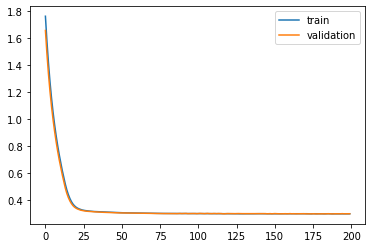

Time to train LSTM:  132.66937160491943
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 1s - loss: 1.7445 - acc: 0.5159 - val_loss: 1.6301 - val_acc: 0.5369

Epoch 00001: val_loss improved from inf to 1.63012, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 1.5432 - acc: 0.5600 - val_loss: 1.4465 - val_acc: 0.5799

Epoch 00002: val_loss improved from 1.63012 to 1.44649, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 1.3708 - acc: 0.6040 - val_loss: 1.2893 - val_acc: 0.6250

Epoch 00003: val_loss improved from 1.44649 to 1.28932, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 1.2235 - acc: 0.6438 - val_loss: 1.1541 - val_acc: 0.6617

Epoch 00004: val_loss improved from 1.28932 to 1.15412, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 1.0970 - acc: 0.6802 - val_loss: 1.0373 - val_acc: 0.6954

Epoch 00005: val_loss improved from 1.15412 to 1.03729, saving model to Event_val_weights2.hdf5
Epoch 6/20


Epoch 00047: val_loss improved from 0.31575 to 0.31529, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.3053 - acc: 0.8882 - val_loss: 0.3152 - val_acc: 0.8818

Epoch 00048: val_loss improved from 0.31529 to 0.31516, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.3051 - acc: 0.8882 - val_loss: 0.3151 - val_acc: 0.8823

Epoch 00049: val_loss improved from 0.31516 to 0.31509, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.3049 - acc: 0.8882 - val_loss: 0.3149 - val_acc: 0.8816

Epoch 00050: val_loss improved from 0.31509 to 0.31495, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.3047 - acc: 0.8884 - val_loss: 0.3146 - val_acc: 0.8820

Epoch 00051: val_loss improved from 0.31495 to 0.31461, saving model to Event_val_weights2.hdf5
Epoch 52/200
 - 1s - loss: 0.3044 - acc: 0.8884 - val_loss: 0.3142 - val_acc: 0.8819

Epoch 00052: val_loss improved from 0.31461 to 0.31423, saving model to Event_val_weights

 - 1s - loss: 0.3005 - acc: 0.8879 - val_loss: 0.3089 - val_acc: 0.8838

Epoch 00093: val_loss improved from 0.30896 to 0.30887, saving model to Event_val_weights2.hdf5
Epoch 94/200
 - 1s - loss: 0.3004 - acc: 0.8879 - val_loss: 0.3088 - val_acc: 0.8837

Epoch 00094: val_loss improved from 0.30887 to 0.30882, saving model to Event_val_weights2.hdf5
Epoch 95/200
 - 1s - loss: 0.3004 - acc: 0.8879 - val_loss: 0.3087 - val_acc: 0.8836

Epoch 00095: val_loss improved from 0.30882 to 0.30875, saving model to Event_val_weights2.hdf5
Epoch 96/200
 - 1s - loss: 0.3003 - acc: 0.8880 - val_loss: 0.3087 - val_acc: 0.8837

Epoch 00096: val_loss improved from 0.30875 to 0.30869, saving model to Event_val_weights2.hdf5
Epoch 97/200
 - 1s - loss: 0.3003 - acc: 0.8879 - val_loss: 0.3086 - val_acc: 0.8838

Epoch 00097: val_loss improved from 0.30869 to 0.30862, saving model to Event_val_weights2.hdf5
Epoch 98/200
 - 1s - loss: 0.3002 - acc: 0.8879 - val_loss: 0.3086 - val_acc: 0.8838

Epoch 00098: val_

 - 1s - loss: 0.2987 - acc: 0.8879 - val_loss: 0.3061 - val_acc: 0.8849

Epoch 00138: val_loss improved from 0.30610 to 0.30608, saving model to Event_val_weights2.hdf5
Epoch 139/200
 - 1s - loss: 0.2986 - acc: 0.8880 - val_loss: 0.3060 - val_acc: 0.8848

Epoch 00139: val_loss improved from 0.30608 to 0.30604, saving model to Event_val_weights2.hdf5
Epoch 140/200
 - 1s - loss: 0.2986 - acc: 0.8880 - val_loss: 0.3060 - val_acc: 0.8846

Epoch 00140: val_loss improved from 0.30604 to 0.30599, saving model to Event_val_weights2.hdf5
Epoch 141/200
 - 1s - loss: 0.2986 - acc: 0.8880 - val_loss: 0.3060 - val_acc: 0.8846

Epoch 00141: val_loss improved from 0.30599 to 0.30596, saving model to Event_val_weights2.hdf5
Epoch 142/200
 - 1s - loss: 0.2986 - acc: 0.8880 - val_loss: 0.3060 - val_acc: 0.8844

Epoch 00142: val_loss improved from 0.30596 to 0.30596, saving model to Event_val_weights2.hdf5
Epoch 143/200
 - 1s - loss: 0.2985 - acc: 0.8880 - val_loss: 0.3059 - val_acc: 0.8846

Epoch 00143:

 - 1s - loss: 0.2978 - acc: 0.8877 - val_loss: 0.3053 - val_acc: 0.8846

Epoch 00187: val_loss did not improve from 0.30528
Epoch 188/200
 - 1s - loss: 0.2977 - acc: 0.8877 - val_loss: 0.3054 - val_acc: 0.8846

Epoch 00188: val_loss did not improve from 0.30528
Epoch 189/200
 - 1s - loss: 0.2977 - acc: 0.8878 - val_loss: 0.3053 - val_acc: 0.8844

Epoch 00189: val_loss did not improve from 0.30528
Epoch 190/200
 - 1s - loss: 0.2977 - acc: 0.8878 - val_loss: 0.3055 - val_acc: 0.8844

Epoch 00190: val_loss did not improve from 0.30528
Epoch 191/200
 - 1s - loss: 0.2977 - acc: 0.8878 - val_loss: 0.3053 - val_acc: 0.8847

Epoch 00191: val_loss did not improve from 0.30528
Epoch 192/200
 - 1s - loss: 0.2977 - acc: 0.8878 - val_loss: 0.3055 - val_acc: 0.8843

Epoch 00192: val_loss did not improve from 0.30528
Epoch 193/200
 - 1s - loss: 0.2977 - acc: 0.8877 - val_loss: 0.3054 - val_acc: 0.8843

Epoch 00193: val_loss did not improve from 0.30528
Epoch 194/200
 - 1s - loss: 0.2977 - acc: 0.8878

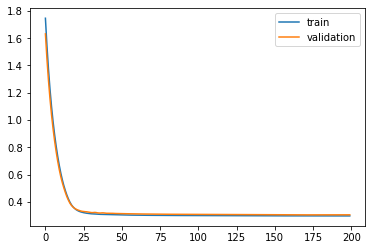

Time to train LSTM:  136.9441602230072
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 1s - loss: 1.7720 - acc: 0.5674 - val_loss: 1.6533 - val_acc: 0.5984

Epoch 00001: val_loss improved from inf to 1.65329, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 1.5708 - acc: 0.6145 - val_loss: 1.4672 - val_acc: 0.6439

Epoch 00002: val_loss improved from 1.65329 to 1.46718, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 1.3945 - acc: 0.6578 - val_loss: 1.3034 - val_acc: 0.6811

Epoch 00003: val_loss improved from 1.46718 to 1.30340, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 1.2402 - acc: 0.6945 - val_loss: 1.1605 - val_acc: 0.7166

Epoch 00004: val_loss improved from 1.30340 to 1.16051, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 1.1065 - acc: 0.7240 - val_loss: 1.0383 - val_acc: 0.7399

Epoch 00005: val_loss improved from 1.16051 to 1.03829, saving model to Event_val_weights3.hdf5
Epoch 6/200

 - 1s - loss: 0.3076 - acc: 0.8875 - val_loss: 0.3091 - val_acc: 0.8870

Epoch 00046: val_loss improved from 0.30937 to 0.30911, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3074 - acc: 0.8875 - val_loss: 0.3088 - val_acc: 0.8871

Epoch 00047: val_loss improved from 0.30911 to 0.30882, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.3071 - acc: 0.8877 - val_loss: 0.3087 - val_acc: 0.8873

Epoch 00048: val_loss improved from 0.30882 to 0.30866, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.3069 - acc: 0.8877 - val_loss: 0.3084 - val_acc: 0.8873

Epoch 00049: val_loss improved from 0.30866 to 0.30842, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.3067 - acc: 0.8877 - val_loss: 0.3083 - val_acc: 0.8878

Epoch 00050: val_loss improved from 0.30842 to 0.30826, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3065 - acc: 0.8877 - val_loss: 0.3080 - val_acc: 0.8878

Epoch 00051: val_

 - 1s - loss: 0.3022 - acc: 0.8873 - val_loss: 0.3041 - val_acc: 0.8864

Epoch 00093: val_loss improved from 0.30422 to 0.30412, saving model to Event_val_weights3.hdf5
Epoch 94/200
 - 1s - loss: 0.3021 - acc: 0.8873 - val_loss: 0.3042 - val_acc: 0.8863

Epoch 00094: val_loss did not improve from 0.30412
Epoch 95/200
 - 1s - loss: 0.3021 - acc: 0.8874 - val_loss: 0.3040 - val_acc: 0.8862

Epoch 00095: val_loss improved from 0.30412 to 0.30400, saving model to Event_val_weights3.hdf5
Epoch 96/200
 - 1s - loss: 0.3021 - acc: 0.8874 - val_loss: 0.3040 - val_acc: 0.8862

Epoch 00096: val_loss did not improve from 0.30400
Epoch 97/200
 - 1s - loss: 0.3019 - acc: 0.8875 - val_loss: 0.3040 - val_acc: 0.8861

Epoch 00097: val_loss improved from 0.30400 to 0.30395, saving model to Event_val_weights3.hdf5
Epoch 98/200
 - 1s - loss: 0.3020 - acc: 0.8874 - val_loss: 0.3039 - val_acc: 0.8859

Epoch 00098: val_loss improved from 0.30395 to 0.30392, saving model to Event_val_weights3.hdf5
Epoch 99/20

 - 1s - loss: 0.3003 - acc: 0.8875 - val_loss: 0.3025 - val_acc: 0.8862

Epoch 00142: val_loss improved from 0.30256 to 0.30254, saving model to Event_val_weights3.hdf5
Epoch 143/200
 - 1s - loss: 0.3003 - acc: 0.8874 - val_loss: 0.3025 - val_acc: 0.8861

Epoch 00143: val_loss improved from 0.30254 to 0.30251, saving model to Event_val_weights3.hdf5
Epoch 144/200
 - 1s - loss: 0.3002 - acc: 0.8875 - val_loss: 0.3025 - val_acc: 0.8860

Epoch 00144: val_loss improved from 0.30251 to 0.30249, saving model to Event_val_weights3.hdf5
Epoch 145/200
 - 1s - loss: 0.3002 - acc: 0.8874 - val_loss: 0.3025 - val_acc: 0.8860

Epoch 00145: val_loss improved from 0.30249 to 0.30246, saving model to Event_val_weights3.hdf5
Epoch 146/200
 - 1s - loss: 0.3002 - acc: 0.8875 - val_loss: 0.3024 - val_acc: 0.8860

Epoch 00146: val_loss improved from 0.30246 to 0.30244, saving model to Event_val_weights3.hdf5
Epoch 147/200
 - 1s - loss: 0.3002 - acc: 0.8874 - val_loss: 0.3024 - val_acc: 0.8859

Epoch 00147:


Epoch 00189: val_loss improved from 0.30153 to 0.30152, saving model to Event_val_weights3.hdf5
Epoch 190/200
 - 1s - loss: 0.2991 - acc: 0.8871 - val_loss: 0.3015 - val_acc: 0.8869

Epoch 00190: val_loss improved from 0.30152 to 0.30147, saving model to Event_val_weights3.hdf5
Epoch 191/200
 - 1s - loss: 0.2991 - acc: 0.8870 - val_loss: 0.3015 - val_acc: 0.8871

Epoch 00191: val_loss did not improve from 0.30147
Epoch 192/200
 - 1s - loss: 0.2990 - acc: 0.8871 - val_loss: 0.3014 - val_acc: 0.8870

Epoch 00192: val_loss improved from 0.30147 to 0.30143, saving model to Event_val_weights3.hdf5
Epoch 193/200
 - 1s - loss: 0.2990 - acc: 0.8870 - val_loss: 0.3014 - val_acc: 0.8871

Epoch 00193: val_loss did not improve from 0.30143
Epoch 194/200
 - 1s - loss: 0.2990 - acc: 0.8872 - val_loss: 0.3014 - val_acc: 0.8871

Epoch 00194: val_loss improved from 0.30143 to 0.30140, saving model to Event_val_weights3.hdf5
Epoch 195/200
 - 1s - loss: 0.2990 - acc: 0.8871 - val_loss: 0.3014 - val_acc:

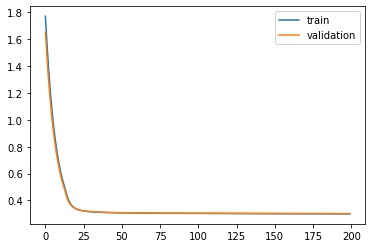

Time to train LSTM:  137.34172415733337


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8f144c3160>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 1s - loss: 1.7910 - acc: 0.5013 - val_loss: 1.6613 - val_acc: 0.5387

Epoch 00001: val_loss improved from inf to 1.66127, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 1.5804 - acc: 0.5650 - val_loss: 1.4683 - val_acc: 0.6026

Epoch 00002: val_loss improved from 1.66127 to 1.46829, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 1.3989 - acc: 0.6283 - val_loss: 1.3029 - val_acc: 0.6620

Epoch 00003: val_loss improved from 1.46829 to 1.30294, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 1.2425 - acc: 0.6807 - val_loss: 1.1603 - val_acc: 0.7071

Epoch 00004: val_loss improved from 1.30294 to 1.16032, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 1.1073 - acc: 0.7200 - val_loss: 1.0368 - val_acc: 0.7390

Epoch 00005: val_loss improved from 1.16032 to 1.03677, saving model to Event_val_weights4.hdf5
Epoch 6/200
 - 1s - loss: 0.9899 - acc: 0.7483 - v


Epoch 00046: val_loss improved from 0.31663 to 0.31627, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.3076 - acc: 0.8880 - val_loss: 0.3161 - val_acc: 0.8821

Epoch 00047: val_loss improved from 0.31627 to 0.31605, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.3072 - acc: 0.8884 - val_loss: 0.3159 - val_acc: 0.8824

Epoch 00048: val_loss improved from 0.31605 to 0.31588, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.3069 - acc: 0.8885 - val_loss: 0.3156 - val_acc: 0.8830

Epoch 00049: val_loss improved from 0.31588 to 0.31558, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3068 - acc: 0.8885 - val_loss: 0.3153 - val_acc: 0.8830

Epoch 00050: val_loss improved from 0.31558 to 0.31529, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.3067 - acc: 0.8883 - val_loss: 0.3149 - val_acc: 0.8824

Epoch 00051: val_loss improved from 0.31529 to 0.31492, saving model to Event_val_weights


Epoch 00092: val_loss improved from 0.30806 to 0.30792, saving model to Event_val_weights4.hdf5
Epoch 93/200
 - 1s - loss: 0.3015 - acc: 0.8876 - val_loss: 0.3079 - val_acc: 0.8846

Epoch 00093: val_loss did not improve from 0.30792
Epoch 94/200
 - 1s - loss: 0.3015 - acc: 0.8874 - val_loss: 0.3078 - val_acc: 0.8847

Epoch 00094: val_loss improved from 0.30792 to 0.30782, saving model to Event_val_weights4.hdf5
Epoch 95/200
 - 1s - loss: 0.3014 - acc: 0.8874 - val_loss: 0.3078 - val_acc: 0.8846

Epoch 00095: val_loss did not improve from 0.30782
Epoch 96/200
 - 1s - loss: 0.3013 - acc: 0.8874 - val_loss: 0.3077 - val_acc: 0.8846

Epoch 00096: val_loss improved from 0.30782 to 0.30769, saving model to Event_val_weights4.hdf5
Epoch 97/200
 - 1s - loss: 0.3013 - acc: 0.8874 - val_loss: 0.3077 - val_acc: 0.8847

Epoch 00097: val_loss did not improve from 0.30769
Epoch 98/200
 - 1s - loss: 0.3012 - acc: 0.8874 - val_loss: 0.3076 - val_acc: 0.8844

Epoch 00098: val_loss improved from 0.3076


Epoch 00144: val_loss improved from 0.30676 to 0.30676, saving model to Event_val_weights4.hdf5
Epoch 145/200
 - 1s - loss: 0.2993 - acc: 0.8875 - val_loss: 0.3068 - val_acc: 0.8838

Epoch 00145: val_loss did not improve from 0.30676
Epoch 146/200
 - 1s - loss: 0.2993 - acc: 0.8875 - val_loss: 0.3068 - val_acc: 0.8839

Epoch 00146: val_loss did not improve from 0.30676
Epoch 147/200
 - 1s - loss: 0.2992 - acc: 0.8875 - val_loss: 0.3068 - val_acc: 0.8838

Epoch 00147: val_loss did not improve from 0.30676
Epoch 148/200
 - 1s - loss: 0.2992 - acc: 0.8876 - val_loss: 0.3068 - val_acc: 0.8839

Epoch 00148: val_loss did not improve from 0.30676
Epoch 149/200
 - 1s - loss: 0.2992 - acc: 0.8876 - val_loss: 0.3068 - val_acc: 0.8838

Epoch 00149: val_loss did not improve from 0.30676
Epoch 150/200
 - 1s - loss: 0.2991 - acc: 0.8876 - val_loss: 0.3068 - val_acc: 0.8838

Epoch 00150: val_loss improved from 0.30676 to 0.30676, saving model to Event_val_weights4.hdf5
Epoch 151/200
 - 1s - loss: 0.

 - 1s - loss: 0.2976 - acc: 0.8886 - val_loss: 0.3066 - val_acc: 0.8839

Epoch 00197: val_loss did not improve from 0.30638
Epoch 198/200
 - 1s - loss: 0.2975 - acc: 0.8886 - val_loss: 0.3063 - val_acc: 0.8838

Epoch 00198: val_loss improved from 0.30638 to 0.30628, saving model to Event_val_weights4.hdf5
Epoch 199/200
 - 1s - loss: 0.2975 - acc: 0.8886 - val_loss: 0.3065 - val_acc: 0.8839

Epoch 00199: val_loss did not improve from 0.30628
Epoch 200/200
 - 1s - loss: 0.2975 - acc: 0.8886 - val_loss: 0.3062 - val_acc: 0.8836

Epoch 00200: val_loss improved from 0.30628 to 0.30624, saving model to Event_val_weights4.hdf5
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2_1: 0.13571542470728296
best val loss: 0.3062392633491092
#################################


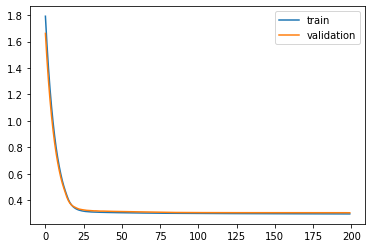

Time to train LSTM:  140.46980547904968
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 1s - loss: 1.6490 - acc: 0.5513 - val_loss: 1.5471 - val_acc: 0.5711

Epoch 00001: val_loss improved from inf to 1.54710, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 1.4716 - acc: 0.5899 - val_loss: 1.3821 - val_acc: 0.6122

Epoch 00002: val_loss improved from 1.54710 to 1.38212, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 1.3174 - acc: 0.6264 - val_loss: 1.2395 - val_acc: 0.6479

Epoch 00003: val_loss improved from 1.38212 to 1.23954, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 1.1842 - acc: 0.6620 - val_loss: 1.1164 - val_acc: 0.6841

Epoch 00004: val_loss improved from 1.23954 to 1.11637, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 1.0689 - acc: 0.6914 - val_loss: 1.0091 - val_acc: 0.7126

Epoch 00005: val_loss improved from 1.11637 to 1.00911, saving model to Event_val_weights5.hdf5
Epoch 6/20


Epoch 00046: val_loss improved from 0.31174 to 0.31164, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.3100 - acc: 0.8864 - val_loss: 0.3112 - val_acc: 0.8854

Epoch 00047: val_loss improved from 0.31164 to 0.31124, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.3097 - acc: 0.8864 - val_loss: 0.3111 - val_acc: 0.8859

Epoch 00048: val_loss improved from 0.31124 to 0.31108, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.3095 - acc: 0.8863 - val_loss: 0.3110 - val_acc: 0.8856

Epoch 00049: val_loss improved from 0.31108 to 0.31096, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3092 - acc: 0.8865 - val_loss: 0.3106 - val_acc: 0.8861

Epoch 00050: val_loss improved from 0.31096 to 0.31059, saving model to Event_val_weights5.hdf5
Epoch 51/200
 - 1s - loss: 0.3090 - acc: 0.8864 - val_loss: 0.3103 - val_acc: 0.8854

Epoch 00051: val_loss improved from 0.31059 to 0.31032, saving model to Event_val_weights


Epoch 00096: val_loss improved from 0.30560 to 0.30555, saving model to Event_val_weights5.hdf5
Epoch 97/200
 - 1s - loss: 0.3032 - acc: 0.8870 - val_loss: 0.3056 - val_acc: 0.8870

Epoch 00097: val_loss did not improve from 0.30555
Epoch 98/200
 - 1s - loss: 0.3031 - acc: 0.8870 - val_loss: 0.3055 - val_acc: 0.8869

Epoch 00098: val_loss improved from 0.30555 to 0.30547, saving model to Event_val_weights5.hdf5
Epoch 99/200
 - 1s - loss: 0.3030 - acc: 0.8870 - val_loss: 0.3053 - val_acc: 0.8871

Epoch 00099: val_loss improved from 0.30547 to 0.30527, saving model to Event_val_weights5.hdf5
Epoch 100/200
 - 1s - loss: 0.3029 - acc: 0.8870 - val_loss: 0.3055 - val_acc: 0.8868

Epoch 00100: val_loss did not improve from 0.30527
Epoch 101/200
 - 1s - loss: 0.3029 - acc: 0.8871 - val_loss: 0.3054 - val_acc: 0.8870

Epoch 00101: val_loss did not improve from 0.30527
Epoch 102/200
 - 1s - loss: 0.3028 - acc: 0.8871 - val_loss: 0.3052 - val_acc: 0.8869

Epoch 00102: val_loss improved from 0.3


Epoch 00149: val_loss did not improve from 0.30357
Epoch 150/200
 - 1s - loss: 0.3006 - acc: 0.8871 - val_loss: 0.3037 - val_acc: 0.8877

Epoch 00150: val_loss did not improve from 0.30357
Epoch 151/200
 - 1s - loss: 0.3005 - acc: 0.8870 - val_loss: 0.3034 - val_acc: 0.8876

Epoch 00151: val_loss improved from 0.30357 to 0.30344, saving model to Event_val_weights5.hdf5
Epoch 152/200
 - 1s - loss: 0.3005 - acc: 0.8871 - val_loss: 0.3037 - val_acc: 0.8877

Epoch 00152: val_loss did not improve from 0.30344
Epoch 153/200
 - 1s - loss: 0.3005 - acc: 0.8870 - val_loss: 0.3036 - val_acc: 0.8876

Epoch 00153: val_loss did not improve from 0.30344
Epoch 154/200
 - 1s - loss: 0.3005 - acc: 0.8871 - val_loss: 0.3035 - val_acc: 0.8879

Epoch 00154: val_loss did not improve from 0.30344
Epoch 155/200
 - 1s - loss: 0.3004 - acc: 0.8870 - val_loss: 0.3036 - val_acc: 0.8877

Epoch 00155: val_loss did not improve from 0.30344
Epoch 156/200
 - 1s - loss: 0.3004 - acc: 0.8870 - val_loss: 0.3036 - val_a

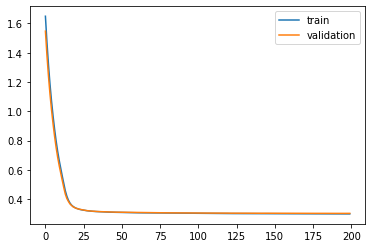

Time to train LSTM:  133.1503517627716


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8ec073f908>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 1s - loss: 1.2896 - acc: 0.4508 - val_loss: 1.2208 - val_acc: 0.4703

Epoch 00001: val_loss improved from inf to 1.22082, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 1.1685 - acc: 0.5051 - val_loss: 1.1066 - val_acc: 0.5368

Epoch 00002: val_loss improved from 1.22082 to 1.10663, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 1.0639 - acc: 0.5698 - val_loss: 1.0092 - val_acc: 0.6084

Epoch 00003: val_loss improved from 1.10663 to 1.00916, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 0.9735 - acc: 0.6328 - val_loss: 0.9245 - val_acc: 0.6707

Epoch 00004: val_loss improved from 1.00916 to 0.92454, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 0.8943 - acc: 0.6876 - val_loss: 0.8495 - val_acc: 0.7228

Epoch 00005: val_loss improved from 0.92454 to 0.84948, saving model to Event_val_weights1.hdf5
Epoch 6/200
 - 1s - loss: 0.8235 - acc: 0.7304 - v


Epoch 00046: val_loss improved from 0.30463 to 0.30445, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.3069 - acc: 0.8882 - val_loss: 0.3043 - val_acc: 0.8869

Epoch 00047: val_loss improved from 0.30445 to 0.30431, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3067 - acc: 0.8881 - val_loss: 0.3041 - val_acc: 0.8863

Epoch 00048: val_loss improved from 0.30431 to 0.30408, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.3065 - acc: 0.8883 - val_loss: 0.3038 - val_acc: 0.8869

Epoch 00049: val_loss improved from 0.30408 to 0.30382, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.3063 - acc: 0.8882 - val_loss: 0.3036 - val_acc: 0.8869

Epoch 00050: val_loss improved from 0.30382 to 0.30364, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.3061 - acc: 0.8882 - val_loss: 0.3036 - val_acc: 0.8867

Epoch 00051: val_loss improved from 0.30364 to 0.30362, saving model to Event_val_weights

 - 1s - loss: 0.3019 - acc: 0.8875 - val_loss: 0.2985 - val_acc: 0.8876

Epoch 00093: val_loss improved from 0.29855 to 0.29846, saving model to Event_val_weights1.hdf5
Epoch 94/200
 - 1s - loss: 0.3019 - acc: 0.8875 - val_loss: 0.2985 - val_acc: 0.8874

Epoch 00094: val_loss did not improve from 0.29846
Epoch 95/200
 - 1s - loss: 0.3018 - acc: 0.8876 - val_loss: 0.2984 - val_acc: 0.8874

Epoch 00095: val_loss improved from 0.29846 to 0.29838, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.3018 - acc: 0.8877 - val_loss: 0.2982 - val_acc: 0.8876

Epoch 00096: val_loss improved from 0.29838 to 0.29824, saving model to Event_val_weights1.hdf5
Epoch 97/200
 - 1s - loss: 0.3018 - acc: 0.8877 - val_loss: 0.2985 - val_acc: 0.8874

Epoch 00097: val_loss did not improve from 0.29824
Epoch 98/200
 - 1s - loss: 0.3017 - acc: 0.8877 - val_loss: 0.2985 - val_acc: 0.8878

Epoch 00098: val_loss did not improve from 0.29824
Epoch 99/200
 - 1s - loss: 0.3016 - acc: 0.8876 - val_lo


Epoch 00143: val_loss did not improve from 0.29639
Epoch 144/200
 - 1s - loss: 0.3001 - acc: 0.8876 - val_loss: 0.2964 - val_acc: 0.8882

Epoch 00144: val_loss did not improve from 0.29639
Epoch 145/200
 - 1s - loss: 0.3000 - acc: 0.8876 - val_loss: 0.2962 - val_acc: 0.8882

Epoch 00145: val_loss improved from 0.29639 to 0.29625, saving model to Event_val_weights1.hdf5
Epoch 146/200
 - 1s - loss: 0.3000 - acc: 0.8875 - val_loss: 0.2963 - val_acc: 0.8880

Epoch 00146: val_loss did not improve from 0.29625
Epoch 147/200
 - 1s - loss: 0.3000 - acc: 0.8875 - val_loss: 0.2962 - val_acc: 0.8882

Epoch 00147: val_loss improved from 0.29625 to 0.29620, saving model to Event_val_weights1.hdf5
Epoch 148/200
 - 1s - loss: 0.2999 - acc: 0.8875 - val_loss: 0.2962 - val_acc: 0.8878

Epoch 00148: val_loss improved from 0.29620 to 0.29616, saving model to Event_val_weights1.hdf5
Epoch 149/200
 - 1s - loss: 0.2999 - acc: 0.8875 - val_loss: 0.2962 - val_acc: 0.8879

Epoch 00149: val_loss did not improv


Epoch 00196: val_loss did not improve from 0.29537
Epoch 197/200
 - 1s - loss: 0.2984 - acc: 0.8881 - val_loss: 0.2953 - val_acc: 0.8876

Epoch 00197: val_loss improved from 0.29537 to 0.29532, saving model to Event_val_weights1.hdf5
Epoch 198/200
 - 1s - loss: 0.2984 - acc: 0.8882 - val_loss: 0.2957 - val_acc: 0.8876

Epoch 00198: val_loss did not improve from 0.29532
Epoch 199/200
 - 1s - loss: 0.2984 - acc: 0.8884 - val_loss: 0.2957 - val_acc: 0.8874

Epoch 00199: val_loss did not improve from 0.29532
Epoch 200/200
 - 1s - loss: 0.2984 - acc: 0.8883 - val_loss: 0.2956 - val_acc: 0.8879

Epoch 00200: val_loss did not improve from 0.29532
#################################
Number of units: 4
Batch size: 8192
Fold: 0
L2_1: 0.06650866175952272
best val loss: 0.29531902164883084
#################################


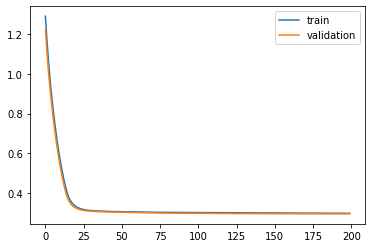

Time to train LSTM:  139.20616555213928
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 1s - loss: 1.2120 - acc: 0.4972 - val_loss: 1.1489 - val_acc: 0.5409

Epoch 00001: val_loss improved from inf to 1.14893, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 1.1023 - acc: 0.5707 - val_loss: 1.0490 - val_acc: 0.6110

Epoch 00002: val_loss improved from 1.14893 to 1.04904, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 1.0084 - acc: 0.6410 - val_loss: 0.9644 - val_acc: 0.6702

Epoch 00003: val_loss improved from 1.04904 to 0.96438, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 0.9284 - acc: 0.6947 - val_loss: 0.8914 - val_acc: 0.7124

Epoch 00004: val_loss improved from 0.96438 to 0.89139, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 0.8583 - acc: 0.7320 - val_loss: 0.8265 - val_acc: 0.7416

Epoch 00005: val_loss improved from 0.89139 to 0.82650, saving model to Event_val_weights2.hdf5
Epoch 6/20

 - 1s - loss: 0.3104 - acc: 0.8879 - val_loss: 0.3186 - val_acc: 0.8824

Epoch 00046: val_loss improved from 0.31885 to 0.31856, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.3100 - acc: 0.8879 - val_loss: 0.3182 - val_acc: 0.8824

Epoch 00047: val_loss improved from 0.31856 to 0.31815, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.3096 - acc: 0.8878 - val_loss: 0.3178 - val_acc: 0.8827

Epoch 00048: val_loss improved from 0.31815 to 0.31782, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.3092 - acc: 0.8879 - val_loss: 0.3175 - val_acc: 0.8824

Epoch 00049: val_loss improved from 0.31782 to 0.31749, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.3089 - acc: 0.8878 - val_loss: 0.3171 - val_acc: 0.8827

Epoch 00050: val_loss improved from 0.31749 to 0.31715, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.3085 - acc: 0.8878 - val_loss: 0.3168 - val_acc: 0.8827

Epoch 00051: val_


Epoch 00091: val_loss did not improve from 0.31118
Epoch 92/200
 - 1s - loss: 0.3019 - acc: 0.8880 - val_loss: 0.3110 - val_acc: 0.8829

Epoch 00092: val_loss improved from 0.31118 to 0.31103, saving model to Event_val_weights2.hdf5
Epoch 93/200
 - 1s - loss: 0.3018 - acc: 0.8880 - val_loss: 0.3111 - val_acc: 0.8829

Epoch 00093: val_loss did not improve from 0.31103
Epoch 94/200
 - 1s - loss: 0.3018 - acc: 0.8881 - val_loss: 0.3109 - val_acc: 0.8828

Epoch 00094: val_loss improved from 0.31103 to 0.31094, saving model to Event_val_weights2.hdf5
Epoch 95/200
 - 1s - loss: 0.3017 - acc: 0.8880 - val_loss: 0.3109 - val_acc: 0.8829

Epoch 00095: val_loss improved from 0.31094 to 0.31087, saving model to Event_val_weights2.hdf5
Epoch 96/200
 - 1s - loss: 0.3016 - acc: 0.8881 - val_loss: 0.3108 - val_acc: 0.8828

Epoch 00096: val_loss improved from 0.31087 to 0.31078, saving model to Event_val_weights2.hdf5
Epoch 97/200
 - 1s - loss: 0.3016 - acc: 0.8880 - val_loss: 0.3107 - val_acc: 0.882

 - 1s - loss: 0.2993 - acc: 0.8885 - val_loss: 0.3088 - val_acc: 0.8824

Epoch 00138: val_loss improved from 0.30882 to 0.30880, saving model to Event_val_weights2.hdf5
Epoch 139/200
 - 1s - loss: 0.2993 - acc: 0.8885 - val_loss: 0.3088 - val_acc: 0.8819

Epoch 00139: val_loss improved from 0.30880 to 0.30878, saving model to Event_val_weights2.hdf5
Epoch 140/200
 - 1s - loss: 0.2992 - acc: 0.8884 - val_loss: 0.3087 - val_acc: 0.8826

Epoch 00140: val_loss improved from 0.30878 to 0.30874, saving model to Event_val_weights2.hdf5
Epoch 141/200
 - 1s - loss: 0.2992 - acc: 0.8886 - val_loss: 0.3087 - val_acc: 0.8824

Epoch 00141: val_loss improved from 0.30874 to 0.30874, saving model to Event_val_weights2.hdf5
Epoch 142/200
 - 1s - loss: 0.2992 - acc: 0.8885 - val_loss: 0.3087 - val_acc: 0.8824

Epoch 00142: val_loss improved from 0.30874 to 0.30872, saving model to Event_val_weights2.hdf5
Epoch 143/200
 - 1s - loss: 0.2992 - acc: 0.8886 - val_loss: 0.3086 - val_acc: 0.8823

Epoch 00143:


Epoch 00183: val_loss improved from 0.30747 to 0.30742, saving model to Event_val_weights2.hdf5
Epoch 184/200
 - 1s - loss: 0.2977 - acc: 0.8889 - val_loss: 0.3074 - val_acc: 0.8821

Epoch 00184: val_loss improved from 0.30742 to 0.30738, saving model to Event_val_weights2.hdf5
Epoch 185/200
 - 1s - loss: 0.2977 - acc: 0.8890 - val_loss: 0.3073 - val_acc: 0.8819

Epoch 00185: val_loss improved from 0.30738 to 0.30735, saving model to Event_val_weights2.hdf5
Epoch 186/200
 - 1s - loss: 0.2976 - acc: 0.8890 - val_loss: 0.3073 - val_acc: 0.8819

Epoch 00186: val_loss improved from 0.30735 to 0.30732, saving model to Event_val_weights2.hdf5
Epoch 187/200
 - 1s - loss: 0.2976 - acc: 0.8889 - val_loss: 0.3073 - val_acc: 0.8822

Epoch 00187: val_loss improved from 0.30732 to 0.30727, saving model to Event_val_weights2.hdf5
Epoch 188/200
 - 1s - loss: 0.2976 - acc: 0.8889 - val_loss: 0.3072 - val_acc: 0.8826

Epoch 00188: val_loss improved from 0.30727 to 0.30723, saving model to Event_val_we

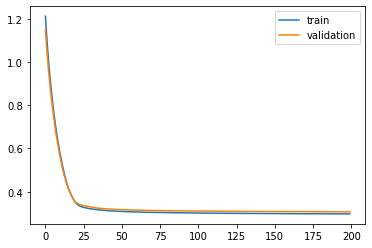

Time to train LSTM:  137.88361740112305


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8e900457b8>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 1.2168 - acc: 0.5472 - val_loss: 1.1550 - val_acc: 0.5826

Epoch 00001: val_loss improved from inf to 1.15498, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 1.1042 - acc: 0.6062 - val_loss: 1.0513 - val_acc: 0.6339

Epoch 00002: val_loss improved from 1.15498 to 1.05125, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 1.0072 - acc: 0.6552 - val_loss: 0.9619 - val_acc: 0.6812

Epoch 00003: val_loss improved from 1.05125 to 0.96187, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 0.9227 - acc: 0.6932 - val_loss: 0.8835 - val_acc: 0.7132

Epoch 00004: val_loss improved from 0.96187 to 0.88354, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 0.8481 - acc: 0.7259 - val_loss: 0.8137 - val_acc: 0.7408

Epoch 00005: val_loss improved from 0.88354 to 0.81368, saving model to Event_val_weights3.hdf5
Epoch 6/200
 - 1s - loss: 0.7814 - acc: 0.7543 - v

 - 1s - loss: 0.3066 - acc: 0.8881 - val_loss: 0.3101 - val_acc: 0.8870

Epoch 00046: val_loss improved from 0.31039 to 0.31012, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3064 - acc: 0.8879 - val_loss: 0.3100 - val_acc: 0.8870

Epoch 00047: val_loss improved from 0.31012 to 0.31002, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.3061 - acc: 0.8880 - val_loss: 0.3096 - val_acc: 0.8868

Epoch 00048: val_loss improved from 0.31002 to 0.30963, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.3059 - acc: 0.8880 - val_loss: 0.3094 - val_acc: 0.8870

Epoch 00049: val_loss improved from 0.30963 to 0.30935, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.3056 - acc: 0.8880 - val_loss: 0.3092 - val_acc: 0.8869

Epoch 00050: val_loss improved from 0.30935 to 0.30918, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3055 - acc: 0.8880 - val_loss: 0.3089 - val_acc: 0.8869

Epoch 00051: val_

 - 1s - loss: 0.3005 - acc: 0.8881 - val_loss: 0.3038 - val_acc: 0.8876

Epoch 00093: val_loss did not improve from 0.30383
Epoch 94/200
 - 1s - loss: 0.3004 - acc: 0.8881 - val_loss: 0.3037 - val_acc: 0.8880

Epoch 00094: val_loss improved from 0.30383 to 0.30372, saving model to Event_val_weights3.hdf5
Epoch 95/200
 - 1s - loss: 0.3004 - acc: 0.8881 - val_loss: 0.3037 - val_acc: 0.8876

Epoch 00095: val_loss did not improve from 0.30372
Epoch 96/200
 - 1s - loss: 0.3003 - acc: 0.8880 - val_loss: 0.3036 - val_acc: 0.8881

Epoch 00096: val_loss improved from 0.30372 to 0.30359, saving model to Event_val_weights3.hdf5
Epoch 97/200
 - 1s - loss: 0.3003 - acc: 0.8880 - val_loss: 0.3036 - val_acc: 0.8877

Epoch 00097: val_loss did not improve from 0.30359
Epoch 98/200
 - 1s - loss: 0.3002 - acc: 0.8881 - val_loss: 0.3035 - val_acc: 0.8880

Epoch 00098: val_loss improved from 0.30359 to 0.30351, saving model to Event_val_weights3.hdf5
Epoch 99/200
 - 1s - loss: 0.3001 - acc: 0.8881 - val_lo

 - 1s - loss: 0.2984 - acc: 0.8881 - val_loss: 0.3023 - val_acc: 0.8870

Epoch 00143: val_loss did not improve from 0.30217
Epoch 144/200
 - 1s - loss: 0.2984 - acc: 0.8880 - val_loss: 0.3022 - val_acc: 0.8872

Epoch 00144: val_loss did not improve from 0.30217
Epoch 145/200
 - 1s - loss: 0.2984 - acc: 0.8881 - val_loss: 0.3022 - val_acc: 0.8872

Epoch 00145: val_loss did not improve from 0.30217
Epoch 146/200
 - 1s - loss: 0.2984 - acc: 0.8880 - val_loss: 0.3022 - val_acc: 0.8872

Epoch 00146: val_loss did not improve from 0.30217
Epoch 147/200
 - 1s - loss: 0.2983 - acc: 0.8880 - val_loss: 0.3022 - val_acc: 0.8872

Epoch 00147: val_loss did not improve from 0.30217
Epoch 148/200
 - 1s - loss: 0.2983 - acc: 0.8880 - val_loss: 0.3021 - val_acc: 0.8872

Epoch 00148: val_loss improved from 0.30217 to 0.30214, saving model to Event_val_weights3.hdf5
Epoch 149/200
 - 1s - loss: 0.2983 - acc: 0.8880 - val_loss: 0.3021 - val_acc: 0.8873

Epoch 00149: val_loss did not improve from 0.30214
Epo

 - 1s - loss: 0.2971 - acc: 0.8880 - val_loss: 0.3013 - val_acc: 0.8871

Epoch 00194: val_loss improved from 0.30133 to 0.30133, saving model to Event_val_weights3.hdf5
Epoch 195/200
 - 1s - loss: 0.2971 - acc: 0.8880 - val_loss: 0.3014 - val_acc: 0.8869

Epoch 00195: val_loss did not improve from 0.30133
Epoch 196/200
 - 1s - loss: 0.2970 - acc: 0.8880 - val_loss: 0.3013 - val_acc: 0.8871

Epoch 00196: val_loss improved from 0.30133 to 0.30127, saving model to Event_val_weights3.hdf5
Epoch 197/200
 - 1s - loss: 0.2970 - acc: 0.8880 - val_loss: 0.3014 - val_acc: 0.8870

Epoch 00197: val_loss did not improve from 0.30127
Epoch 198/200
 - 1s - loss: 0.2970 - acc: 0.8879 - val_loss: 0.3013 - val_acc: 0.8871

Epoch 00198: val_loss did not improve from 0.30127
Epoch 199/200
 - 1s - loss: 0.2969 - acc: 0.8879 - val_loss: 0.3013 - val_acc: 0.8868

Epoch 00199: val_loss did not improve from 0.30127
Epoch 200/200
 - 1s - loss: 0.2969 - acc: 0.8879 - val_loss: 0.3012 - val_acc: 0.8869

Epoch 002

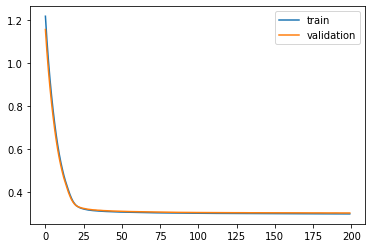

Time to train LSTM:  142.41228604316711
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 1.2338 - acc: 0.5427 - val_loss: 1.1587 - val_acc: 0.5877

Epoch 00001: val_loss improved from inf to 1.15867, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 1.1066 - acc: 0.6132 - val_loss: 1.0459 - val_acc: 0.6450

Epoch 00002: val_loss improved from 1.15867 to 1.04587, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 1.0001 - acc: 0.6687 - val_loss: 0.9508 - val_acc: 0.6869

Epoch 00003: val_loss improved from 1.04587 to 0.95081, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 0.9112 - acc: 0.7070 - val_loss: 0.8703 - val_acc: 0.7164

Epoch 00004: val_loss improved from 0.95081 to 0.87028, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 0.8361 - acc: 0.7319 - val_loss: 0.8019 - val_acc: 0.7382

Epoch 00005: val_loss improved from 0.87028 to 0.80189, saving model to Event_val_weights4.hdf5
Epoch 6/20

 - 1s - loss: 0.3059 - acc: 0.8877 - val_loss: 0.3134 - val_acc: 0.8844

Epoch 00046: val_loss improved from 0.31352 to 0.31336, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.3056 - acc: 0.8877 - val_loss: 0.3131 - val_acc: 0.8844

Epoch 00047: val_loss improved from 0.31336 to 0.31312, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.3055 - acc: 0.8877 - val_loss: 0.3130 - val_acc: 0.8843

Epoch 00048: val_loss improved from 0.31312 to 0.31298, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.3052 - acc: 0.8878 - val_loss: 0.3128 - val_acc: 0.8840

Epoch 00049: val_loss improved from 0.31298 to 0.31276, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3050 - acc: 0.8878 - val_loss: 0.3127 - val_acc: 0.8838

Epoch 00050: val_loss improved from 0.31276 to 0.31270, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.3049 - acc: 0.8877 - val_loss: 0.3125 - val_acc: 0.8839

Epoch 00051: val_

 - 1s - loss: 0.3007 - acc: 0.8879 - val_loss: 0.3093 - val_acc: 0.8844

Epoch 00096: val_loss did not improve from 0.30926
Epoch 97/200
 - 1s - loss: 0.3007 - acc: 0.8878 - val_loss: 0.3092 - val_acc: 0.8846

Epoch 00097: val_loss improved from 0.30926 to 0.30918, saving model to Event_val_weights4.hdf5
Epoch 98/200
 - 1s - loss: 0.3006 - acc: 0.8878 - val_loss: 0.3093 - val_acc: 0.8843

Epoch 00098: val_loss did not improve from 0.30918
Epoch 99/200
 - 1s - loss: 0.3006 - acc: 0.8878 - val_loss: 0.3091 - val_acc: 0.8846

Epoch 00099: val_loss improved from 0.30918 to 0.30912, saving model to Event_val_weights4.hdf5
Epoch 100/200
 - 1s - loss: 0.3006 - acc: 0.8879 - val_loss: 0.3092 - val_acc: 0.8843

Epoch 00100: val_loss did not improve from 0.30912
Epoch 101/200
 - 1s - loss: 0.3005 - acc: 0.8878 - val_loss: 0.3091 - val_acc: 0.8846

Epoch 00101: val_loss improved from 0.30912 to 0.30906, saving model to Event_val_weights4.hdf5
Epoch 102/200
 - 1s - loss: 0.3004 - acc: 0.8879 - val


Epoch 00148: val_loss did not improve from 0.30795
Epoch 149/200
 - 1s - loss: 0.2984 - acc: 0.8882 - val_loss: 0.3079 - val_acc: 0.8847

Epoch 00149: val_loss improved from 0.30795 to 0.30795, saving model to Event_val_weights4.hdf5
Epoch 150/200
 - 1s - loss: 0.2984 - acc: 0.8883 - val_loss: 0.3080 - val_acc: 0.8846

Epoch 00150: val_loss did not improve from 0.30795
Epoch 151/200
 - 1s - loss: 0.2983 - acc: 0.8883 - val_loss: 0.3079 - val_acc: 0.8846

Epoch 00151: val_loss improved from 0.30795 to 0.30793, saving model to Event_val_weights4.hdf5
Epoch 152/200
 - 1s - loss: 0.2983 - acc: 0.8882 - val_loss: 0.3079 - val_acc: 0.8847

Epoch 00152: val_loss improved from 0.30793 to 0.30792, saving model to Event_val_weights4.hdf5
Epoch 153/200
 - 1s - loss: 0.2982 - acc: 0.8883 - val_loss: 0.3079 - val_acc: 0.8844

Epoch 00153: val_loss improved from 0.30792 to 0.30788, saving model to Event_val_weights4.hdf5
Epoch 154/200
 - 1s - loss: 0.2982 - acc: 0.8883 - val_loss: 0.3079 - val_acc:


Epoch 00197: val_loss did not improve from 0.30706
Epoch 198/200
 - 1s - loss: 0.2965 - acc: 0.8887 - val_loss: 0.3072 - val_acc: 0.8826

Epoch 00198: val_loss did not improve from 0.30706
Epoch 199/200
 - 1s - loss: 0.2965 - acc: 0.8887 - val_loss: 0.3072 - val_acc: 0.8826

Epoch 00199: val_loss did not improve from 0.30706
Epoch 200/200
 - 1s - loss: 0.2964 - acc: 0.8887 - val_loss: 0.3072 - val_acc: 0.8826

Epoch 00200: val_loss did not improve from 0.30706
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2_1: 0.06650866175952272
best val loss: 0.3070575630664825
#################################


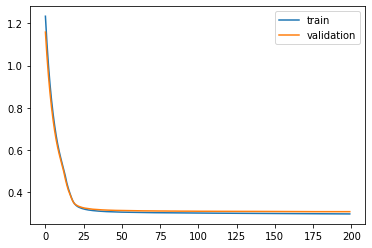

Time to train LSTM:  134.41693806648254
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 1.3555 - acc: 0.5595 - val_loss: 1.2499 - val_acc: 0.6052

Epoch 00001: val_loss improved from inf to 1.24990, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 1.1955 - acc: 0.6253 - val_loss: 1.1120 - val_acc: 0.6538

Epoch 00002: val_loss improved from 1.24990 to 1.11200, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 1.0695 - acc: 0.6694 - val_loss: 0.9989 - val_acc: 0.6911

Epoch 00003: val_loss improved from 1.11200 to 0.99888, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 0.9647 - acc: 0.7032 - val_loss: 0.9038 - val_acc: 0.7232

Epoch 00004: val_loss improved from 0.99888 to 0.90381, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 0.8765 - acc: 0.7280 - val_loss: 0.8241 - val_acc: 0.7473

Epoch 00005: val_loss improved from 0.90381 to 0.82413, saving model to Event_val_weights5.hdf5
Epoch 6/20

 - 1s - loss: 0.3049 - acc: 0.8881 - val_loss: 0.3072 - val_acc: 0.8882

Epoch 00046: val_loss improved from 0.30746 to 0.30724, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.3047 - acc: 0.8882 - val_loss: 0.3071 - val_acc: 0.8880

Epoch 00047: val_loss improved from 0.30724 to 0.30707, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.3045 - acc: 0.8881 - val_loss: 0.3069 - val_acc: 0.8880

Epoch 00048: val_loss improved from 0.30707 to 0.30691, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.3042 - acc: 0.8882 - val_loss: 0.3068 - val_acc: 0.8878

Epoch 00049: val_loss improved from 0.30691 to 0.30677, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3040 - acc: 0.8881 - val_loss: 0.3066 - val_acc: 0.8880

Epoch 00050: val_loss improved from 0.30677 to 0.30660, saving model to Event_val_weights5.hdf5
Epoch 51/200
 - 1s - loss: 0.3038 - acc: 0.8882 - val_loss: 0.3064 - val_acc: 0.8880

Epoch 00051: val_

 - 1s - loss: 0.2987 - acc: 0.8882 - val_loss: 0.3046 - val_acc: 0.8889

Epoch 00096: val_loss did not improve from 0.30449
Epoch 97/200
 - 1s - loss: 0.2986 - acc: 0.8883 - val_loss: 0.3046 - val_acc: 0.8886

Epoch 00097: val_loss did not improve from 0.30449
Epoch 98/200
 - 1s - loss: 0.2986 - acc: 0.8883 - val_loss: 0.3047 - val_acc: 0.8890

Epoch 00098: val_loss did not improve from 0.30449
Epoch 99/200
 - 1s - loss: 0.2985 - acc: 0.8882 - val_loss: 0.3046 - val_acc: 0.8886

Epoch 00099: val_loss did not improve from 0.30449
Epoch 100/200
 - 1s - loss: 0.2984 - acc: 0.8882 - val_loss: 0.3046 - val_acc: 0.8886

Epoch 00100: val_loss did not improve from 0.30449
Epoch 101/200
 - 1s - loss: 0.2984 - acc: 0.8883 - val_loss: 0.3047 - val_acc: 0.8883

Epoch 00101: val_loss did not improve from 0.30449
Epoch 102/200
 - 1s - loss: 0.2984 - acc: 0.8882 - val_loss: 0.3049 - val_acc: 0.8881

Epoch 00102: val_loss did not improve from 0.30449
Epoch 103/200
 - 1s - loss: 0.2983 - acc: 0.8883 - 

 - 1s - loss: 0.2964 - acc: 0.8888 - val_loss: 0.3031 - val_acc: 0.8874

Epoch 00152: val_loss did not improve from 0.30296
Epoch 153/200
 - 1s - loss: 0.2962 - acc: 0.8888 - val_loss: 0.3033 - val_acc: 0.8879

Epoch 00153: val_loss did not improve from 0.30296
Epoch 154/200
 - 1s - loss: 0.2964 - acc: 0.8886 - val_loss: 0.3035 - val_acc: 0.8874

Epoch 00154: val_loss did not improve from 0.30296
Epoch 155/200
 - 1s - loss: 0.2962 - acc: 0.8887 - val_loss: 0.3033 - val_acc: 0.8878

Epoch 00155: val_loss did not improve from 0.30296
Epoch 156/200
 - 1s - loss: 0.2960 - acc: 0.8888 - val_loss: 0.3035 - val_acc: 0.8879

Epoch 00156: val_loss did not improve from 0.30296
Epoch 157/200
 - 1s - loss: 0.2962 - acc: 0.8886 - val_loss: 0.3031 - val_acc: 0.8881

Epoch 00157: val_loss did not improve from 0.30296
Epoch 158/200
 - 1s - loss: 0.2963 - acc: 0.8886 - val_loss: 0.3034 - val_acc: 0.8877

Epoch 00158: val_loss did not improve from 0.30296
Epoch 159/200
 - 1s - loss: 0.2961 - acc: 0.8886

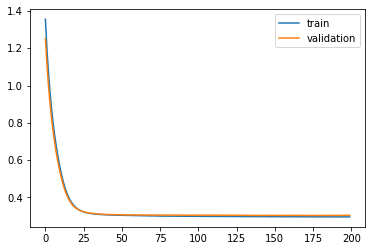

Time to train LSTM:  137.3702576160431


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8e7033bf98>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 1.7548 - acc: 0.5699 - val_loss: 1.6016 - val_acc: 0.6161

Epoch 00001: val_loss improved from inf to 1.60162, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 1.5193 - acc: 0.6363 - val_loss: 1.3941 - val_acc: 0.6756

Epoch 00002: val_loss improved from 1.60162 to 1.39409, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 1.3354 - acc: 0.6863 - val_loss: 1.2324 - val_acc: 0.7162

Epoch 00003: val_loss improved from 1.39409 to 1.23237, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 1.1871 - acc: 0.7183 - val_loss: 1.0984 - val_acc: 0.7390

Epoch 00004: val_loss improved from 1.23237 to 1.09840, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 1.0617 - acc: 0.7379 - val_loss: 0.9830 - val_acc: 0.7591

Epoch 00005: val_loss improved from 1.09840 to 0.98298, saving model to Event_val_weights1.hdf5
Epoch 6/200
 - 1s - loss: 0.9530 - acc: 0.7528 - v


Epoch 00046: val_loss improved from 0.30448 to 0.30416, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.3073 - acc: 0.8872 - val_loss: 0.3038 - val_acc: 0.8867

Epoch 00047: val_loss improved from 0.30416 to 0.30377, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3072 - acc: 0.8873 - val_loss: 0.3039 - val_acc: 0.8869

Epoch 00048: val_loss did not improve from 0.30377
Epoch 49/200
 - 1s - loss: 0.3070 - acc: 0.8874 - val_loss: 0.3038 - val_acc: 0.8868

Epoch 00049: val_loss did not improve from 0.30377
Epoch 50/200
 - 1s - loss: 0.3069 - acc: 0.8874 - val_loss: 0.3036 - val_acc: 0.8872

Epoch 00050: val_loss improved from 0.30377 to 0.30359, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.3067 - acc: 0.8873 - val_loss: 0.3034 - val_acc: 0.8872

Epoch 00051: val_loss improved from 0.30359 to 0.30340, saving model to Event_val_weights1.hdf5
Epoch 52/200
 - 1s - loss: 0.3066 - acc: 0.8873 - val_loss: 0.3031 - val_acc: 0.887

 - 1s - loss: 0.3027 - acc: 0.8866 - val_loss: 0.2984 - val_acc: 0.8868

Epoch 00093: val_loss improved from 0.29842 to 0.29839, saving model to Event_val_weights1.hdf5
Epoch 94/200
 - 1s - loss: 0.3026 - acc: 0.8865 - val_loss: 0.2983 - val_acc: 0.8867

Epoch 00094: val_loss improved from 0.29839 to 0.29829, saving model to Event_val_weights1.hdf5
Epoch 95/200
 - 1s - loss: 0.3026 - acc: 0.8866 - val_loss: 0.2982 - val_acc: 0.8868

Epoch 00095: val_loss improved from 0.29829 to 0.29825, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.3025 - acc: 0.8865 - val_loss: 0.2981 - val_acc: 0.8868

Epoch 00096: val_loss improved from 0.29825 to 0.29815, saving model to Event_val_weights1.hdf5
Epoch 97/200
 - 1s - loss: 0.3025 - acc: 0.8865 - val_loss: 0.2981 - val_acc: 0.8870

Epoch 00097: val_loss improved from 0.29815 to 0.29812, saving model to Event_val_weights1.hdf5
Epoch 98/200
 - 1s - loss: 0.3024 - acc: 0.8866 - val_loss: 0.2980 - val_acc: 0.8869

Epoch 00098: val_


Epoch 00142: val_loss improved from 0.29580 to 0.29573, saving model to Event_val_weights1.hdf5
Epoch 143/200
 - 1s - loss: 0.3000 - acc: 0.8874 - val_loss: 0.2959 - val_acc: 0.8877

Epoch 00143: val_loss did not improve from 0.29573
Epoch 144/200
 - 1s - loss: 0.3000 - acc: 0.8874 - val_loss: 0.2957 - val_acc: 0.8876

Epoch 00144: val_loss improved from 0.29573 to 0.29567, saving model to Event_val_weights1.hdf5
Epoch 145/200
 - 1s - loss: 0.3000 - acc: 0.8873 - val_loss: 0.2958 - val_acc: 0.8876

Epoch 00145: val_loss did not improve from 0.29567
Epoch 146/200
 - 1s - loss: 0.2999 - acc: 0.8874 - val_loss: 0.2957 - val_acc: 0.8877

Epoch 00146: val_loss improved from 0.29567 to 0.29565, saving model to Event_val_weights1.hdf5
Epoch 147/200
 - 1s - loss: 0.2999 - acc: 0.8872 - val_loss: 0.2958 - val_acc: 0.8878

Epoch 00147: val_loss did not improve from 0.29565
Epoch 148/200
 - 1s - loss: 0.2998 - acc: 0.8872 - val_loss: 0.2956 - val_acc: 0.8878

Epoch 00148: val_loss improved from 


Epoch 00195: val_loss did not improve from 0.29485
Epoch 196/200
 - 1s - loss: 0.2983 - acc: 0.8876 - val_loss: 0.2948 - val_acc: 0.8893

Epoch 00196: val_loss improved from 0.29485 to 0.29481, saving model to Event_val_weights1.hdf5
Epoch 197/200
 - 1s - loss: 0.2983 - acc: 0.8876 - val_loss: 0.2951 - val_acc: 0.8894

Epoch 00197: val_loss did not improve from 0.29481
Epoch 198/200
 - 1s - loss: 0.2983 - acc: 0.8877 - val_loss: 0.2948 - val_acc: 0.8893

Epoch 00198: val_loss improved from 0.29481 to 0.29476, saving model to Event_val_weights1.hdf5
Epoch 199/200
 - 1s - loss: 0.2982 - acc: 0.8876 - val_loss: 0.2951 - val_acc: 0.8894

Epoch 00199: val_loss did not improve from 0.29476
Epoch 200/200
 - 1s - loss: 0.2982 - acc: 0.8877 - val_loss: 0.2947 - val_acc: 0.8893

Epoch 00200: val_loss improved from 0.29476 to 0.29475, saving model to Event_val_weights1.hdf5
#################################
Number of units: 4
Batch size: 8192
Fold: 0
L2_1: 0.11323340138234961
best val loss: 0.29

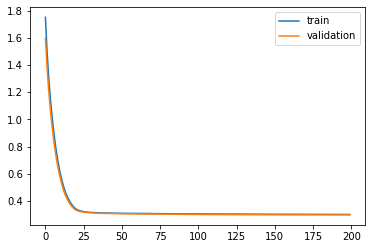

Time to train LSTM:  143.79629921913147
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 1.6729 - acc: 0.4745 - val_loss: 1.5761 - val_acc: 0.4919

Epoch 00001: val_loss improved from inf to 1.57611, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 1.4872 - acc: 0.5180 - val_loss: 1.4035 - val_acc: 0.5377

Epoch 00002: val_loss improved from 1.57611 to 1.40351, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 1.3249 - acc: 0.5644 - val_loss: 1.2543 - val_acc: 0.5787

Epoch 00003: val_loss improved from 1.40351 to 1.25431, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 1.1852 - acc: 0.6081 - val_loss: 1.1269 - val_acc: 0.6178

Epoch 00004: val_loss improved from 1.25431 to 1.12689, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 1.0664 - acc: 0.6451 - val_loss: 1.0186 - val_acc: 0.6537

Epoch 00005: val_loss improved from 1.12689 to 1.01859, saving model to Event_val_weights2.hdf5
Epoch 6/20

 - 1s - loss: 0.3069 - acc: 0.8877 - val_loss: 0.3159 - val_acc: 0.8837

Epoch 00046: val_loss improved from 0.31625 to 0.31586, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.3066 - acc: 0.8878 - val_loss: 0.3155 - val_acc: 0.8834

Epoch 00047: val_loss improved from 0.31586 to 0.31554, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.3063 - acc: 0.8877 - val_loss: 0.3154 - val_acc: 0.8836

Epoch 00048: val_loss improved from 0.31554 to 0.31540, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.3061 - acc: 0.8877 - val_loss: 0.3150 - val_acc: 0.8840

Epoch 00049: val_loss improved from 0.31540 to 0.31496, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.3058 - acc: 0.8877 - val_loss: 0.3149 - val_acc: 0.8838

Epoch 00050: val_loss improved from 0.31496 to 0.31489, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.3057 - acc: 0.8878 - val_loss: 0.3145 - val_acc: 0.8839

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31026 to 0.31016, saving model to Event_val_weights2.hdf5
Epoch 92/200
 - 1s - loss: 0.3011 - acc: 0.8886 - val_loss: 0.3102 - val_acc: 0.8838

Epoch 00092: val_loss improved from 0.31016 to 0.31015, saving model to Event_val_weights2.hdf5
Epoch 93/200
 - 1s - loss: 0.3011 - acc: 0.8886 - val_loss: 0.3100 - val_acc: 0.8837

Epoch 00093: val_loss improved from 0.31015 to 0.31003, saving model to Event_val_weights2.hdf5
Epoch 94/200
 - 1s - loss: 0.3010 - acc: 0.8886 - val_loss: 0.3100 - val_acc: 0.8834

Epoch 00094: val_loss improved from 0.31003 to 0.31003, saving model to Event_val_weights2.hdf5
Epoch 95/200
 - 1s - loss: 0.3010 - acc: 0.8885 - val_loss: 0.3099 - val_acc: 0.8836

Epoch 00095: val_loss improved from 0.31003 to 0.30993, saving model to Event_val_weights2.hdf5
Epoch 96/200
 - 1s - loss: 0.3009 - acc: 0.8886 - val_loss: 0.3099 - val_acc: 0.8834

Epoch 00096: val_loss improved from 0.30993 to 0.30992, saving model to Event_val_weights


Epoch 00137: val_loss improved from 0.30861 to 0.30860, saving model to Event_val_weights2.hdf5
Epoch 138/200
 - 1s - loss: 0.2987 - acc: 0.8891 - val_loss: 0.3086 - val_acc: 0.8839

Epoch 00138: val_loss improved from 0.30860 to 0.30858, saving model to Event_val_weights2.hdf5
Epoch 139/200
 - 1s - loss: 0.2987 - acc: 0.8890 - val_loss: 0.3086 - val_acc: 0.8839

Epoch 00139: val_loss improved from 0.30858 to 0.30857, saving model to Event_val_weights2.hdf5
Epoch 140/200
 - 1s - loss: 0.2986 - acc: 0.8890 - val_loss: 0.3085 - val_acc: 0.8836

Epoch 00140: val_loss improved from 0.30857 to 0.30854, saving model to Event_val_weights2.hdf5
Epoch 141/200
 - 1s - loss: 0.2986 - acc: 0.8890 - val_loss: 0.3085 - val_acc: 0.8839

Epoch 00141: val_loss improved from 0.30854 to 0.30853, saving model to Event_val_weights2.hdf5
Epoch 142/200
 - 1s - loss: 0.2985 - acc: 0.8890 - val_loss: 0.3085 - val_acc: 0.8836

Epoch 00142: val_loss improved from 0.30853 to 0.30851, saving model to Event_val_we

 - 1s - loss: 0.2971 - acc: 0.8889 - val_loss: 0.3076 - val_acc: 0.8833

Epoch 00187: val_loss did not improve from 0.30750
Epoch 188/200
 - 1s - loss: 0.2970 - acc: 0.8889 - val_loss: 0.3075 - val_acc: 0.8833

Epoch 00188: val_loss improved from 0.30750 to 0.30747, saving model to Event_val_weights2.hdf5
Epoch 189/200
 - 1s - loss: 0.2970 - acc: 0.8889 - val_loss: 0.3075 - val_acc: 0.8833

Epoch 00189: val_loss did not improve from 0.30747
Epoch 190/200
 - 1s - loss: 0.2970 - acc: 0.8889 - val_loss: 0.3074 - val_acc: 0.8833

Epoch 00190: val_loss improved from 0.30747 to 0.30744, saving model to Event_val_weights2.hdf5
Epoch 191/200
 - 1s - loss: 0.2970 - acc: 0.8889 - val_loss: 0.3075 - val_acc: 0.8833

Epoch 00191: val_loss did not improve from 0.30744
Epoch 192/200
 - 1s - loss: 0.2970 - acc: 0.8888 - val_loss: 0.3074 - val_acc: 0.8834

Epoch 00192: val_loss improved from 0.30744 to 0.30742, saving model to Event_val_weights2.hdf5
Epoch 193/200
 - 1s - loss: 0.2970 - acc: 0.8887 - 

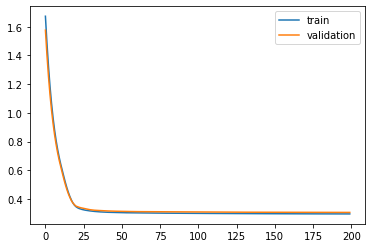

Time to train LSTM:  138.53304743766785
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 1.6574 - acc: 0.5027 - val_loss: 1.5454 - val_acc: 0.5322

Epoch 00001: val_loss improved from inf to 1.54542, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 1.4508 - acc: 0.5723 - val_loss: 1.3528 - val_acc: 0.6087

Epoch 00002: val_loss improved from 1.54542 to 1.35278, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 1.2752 - acc: 0.6401 - val_loss: 1.1953 - val_acc: 0.6644

Epoch 00003: val_loss improved from 1.35278 to 1.19529, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 1.1312 - acc: 0.6884 - val_loss: 1.0666 - val_acc: 0.6992

Epoch 00004: val_loss improved from 1.19529 to 1.06656, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 1.0122 - acc: 0.7179 - val_loss: 0.9590 - val_acc: 0.7262

Epoch 00005: val_loss improved from 1.06656 to 0.95898, saving model to Event_val_weights3.hdf5
Epoch 6/20

 - 1s - loss: 0.3056 - acc: 0.8882 - val_loss: 0.3086 - val_acc: 0.8863

Epoch 00046: val_loss improved from 0.30885 to 0.30862, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3054 - acc: 0.8882 - val_loss: 0.3084 - val_acc: 0.8864

Epoch 00047: val_loss improved from 0.30862 to 0.30842, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.3052 - acc: 0.8882 - val_loss: 0.3082 - val_acc: 0.8859

Epoch 00048: val_loss improved from 0.30842 to 0.30823, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.3050 - acc: 0.8882 - val_loss: 0.3080 - val_acc: 0.8859

Epoch 00049: val_loss improved from 0.30823 to 0.30803, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.3049 - acc: 0.8883 - val_loss: 0.3079 - val_acc: 0.8854

Epoch 00050: val_loss improved from 0.30803 to 0.30787, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3047 - acc: 0.8882 - val_loss: 0.3077 - val_acc: 0.8856

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30260 to 0.30256, saving model to Event_val_weights3.hdf5
Epoch 92/200
 - 1s - loss: 0.2991 - acc: 0.8883 - val_loss: 0.3025 - val_acc: 0.8876

Epoch 00092: val_loss improved from 0.30256 to 0.30248, saving model to Event_val_weights3.hdf5
Epoch 93/200
 - 1s - loss: 0.2990 - acc: 0.8884 - val_loss: 0.3025 - val_acc: 0.8873

Epoch 00093: val_loss improved from 0.30248 to 0.30245, saving model to Event_val_weights3.hdf5
Epoch 94/200
 - 1s - loss: 0.2989 - acc: 0.8884 - val_loss: 0.3024 - val_acc: 0.8873

Epoch 00094: val_loss improved from 0.30245 to 0.30241, saving model to Event_val_weights3.hdf5
Epoch 95/200
 - 1s - loss: 0.2988 - acc: 0.8885 - val_loss: 0.3024 - val_acc: 0.8872

Epoch 00095: val_loss improved from 0.30241 to 0.30237, saving model to Event_val_weights3.hdf5
Epoch 96/200
 - 1s - loss: 0.2988 - acc: 0.8885 - val_loss: 0.3024 - val_acc: 0.8876

Epoch 00096: val_loss improved from 0.30237 to 0.30236, saving model to Event_val_weights


Epoch 00143: val_loss did not improve from 0.30192
Epoch 144/200
 - 1s - loss: 0.2970 - acc: 0.8888 - val_loss: 0.3019 - val_acc: 0.8866

Epoch 00144: val_loss did not improve from 0.30192
Epoch 145/200
 - 1s - loss: 0.2970 - acc: 0.8888 - val_loss: 0.3021 - val_acc: 0.8867

Epoch 00145: val_loss did not improve from 0.30192
Epoch 146/200
 - 1s - loss: 0.2970 - acc: 0.8887 - val_loss: 0.3019 - val_acc: 0.8868

Epoch 00146: val_loss did not improve from 0.30192
Epoch 147/200
 - 1s - loss: 0.2969 - acc: 0.8888 - val_loss: 0.3020 - val_acc: 0.8868

Epoch 00147: val_loss did not improve from 0.30192
Epoch 148/200
 - 1s - loss: 0.2969 - acc: 0.8888 - val_loss: 0.3020 - val_acc: 0.8867

Epoch 00148: val_loss did not improve from 0.30192
Epoch 149/200
 - 1s - loss: 0.2969 - acc: 0.8888 - val_loss: 0.3021 - val_acc: 0.8871

Epoch 00149: val_loss did not improve from 0.30192
Epoch 150/200
 - 1s - loss: 0.2968 - acc: 0.8888 - val_loss: 0.3019 - val_acc: 0.8873

Epoch 00150: val_loss did not imp

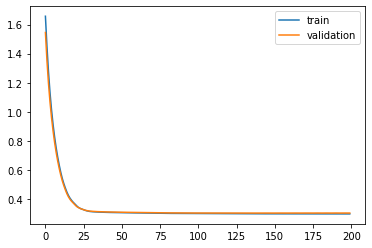

Time to train LSTM:  139.1157991886139


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8e4821c7f0>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 1.6475 - acc: 0.5343 - val_loss: 1.5364 - val_acc: 0.5617

Epoch 00001: val_loss improved from inf to 1.53644, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 1.4718 - acc: 0.5747 - val_loss: 1.3745 - val_acc: 0.6000

Epoch 00002: val_loss improved from 1.53644 to 1.37449, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 1.3179 - acc: 0.6127 - val_loss: 1.2340 - val_acc: 0.6373

Epoch 00003: val_loss improved from 1.37449 to 1.23401, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 1.1841 - acc: 0.6467 - val_loss: 1.1120 - val_acc: 0.6690

Epoch 00004: val_loss improved from 1.23401 to 1.11203, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 1.0671 - acc: 0.6782 - val_loss: 1.0055 - val_acc: 0.6999

Epoch 00005: val_loss improved from 1.11203 to 1.00547, saving model to Event_val_weights4.hdf5
Epoch 6/200
 - 1s - loss: 0.9643 - acc: 0.7093 - v

 - 1s - loss: 0.3084 - acc: 0.8885 - val_loss: 0.3169 - val_acc: 0.8834

Epoch 00046: val_loss improved from 0.31720 to 0.31690, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.3081 - acc: 0.8886 - val_loss: 0.3167 - val_acc: 0.8833

Epoch 00047: val_loss improved from 0.31690 to 0.31666, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.3078 - acc: 0.8885 - val_loss: 0.3164 - val_acc: 0.8836

Epoch 00048: val_loss improved from 0.31666 to 0.31642, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.3075 - acc: 0.8885 - val_loss: 0.3161 - val_acc: 0.8837

Epoch 00049: val_loss improved from 0.31642 to 0.31610, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3072 - acc: 0.8885 - val_loss: 0.3158 - val_acc: 0.8838

Epoch 00050: val_loss improved from 0.31610 to 0.31577, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.3069 - acc: 0.8883 - val_loss: 0.3152 - val_acc: 0.8842

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30805 to 0.30805, saving model to Event_val_weights4.hdf5
Epoch 92/200
 - 1s - loss: 0.3005 - acc: 0.8880 - val_loss: 0.3080 - val_acc: 0.8831

Epoch 00092: val_loss improved from 0.30805 to 0.30800, saving model to Event_val_weights4.hdf5
Epoch 93/200
 - 1s - loss: 0.3005 - acc: 0.8880 - val_loss: 0.3080 - val_acc: 0.8830

Epoch 00093: val_loss improved from 0.30800 to 0.30800, saving model to Event_val_weights4.hdf5
Epoch 94/200
 - 1s - loss: 0.3004 - acc: 0.8879 - val_loss: 0.3080 - val_acc: 0.8831

Epoch 00094: val_loss improved from 0.30800 to 0.30795, saving model to Event_val_weights4.hdf5
Epoch 95/200
 - 1s - loss: 0.3003 - acc: 0.8879 - val_loss: 0.3079 - val_acc: 0.8830

Epoch 00095: val_loss improved from 0.30795 to 0.30795, saving model to Event_val_weights4.hdf5
Epoch 96/200
 - 1s - loss: 0.3002 - acc: 0.8880 - val_loss: 0.3079 - val_acc: 0.8834

Epoch 00096: val_loss improved from 0.30795 to 0.30790, saving model to Event_val_weights

 - 1s - loss: 0.2977 - acc: 0.8882 - val_loss: 0.3059 - val_acc: 0.8837

Epoch 00139: val_loss improved from 0.30598 to 0.30593, saving model to Event_val_weights4.hdf5
Epoch 140/200
 - 1s - loss: 0.2977 - acc: 0.8883 - val_loss: 0.3058 - val_acc: 0.8842

Epoch 00140: val_loss improved from 0.30593 to 0.30584, saving model to Event_val_weights4.hdf5
Epoch 141/200
 - 1s - loss: 0.2976 - acc: 0.8883 - val_loss: 0.3058 - val_acc: 0.8839

Epoch 00141: val_loss improved from 0.30584 to 0.30580, saving model to Event_val_weights4.hdf5
Epoch 142/200
 - 1s - loss: 0.2975 - acc: 0.8882 - val_loss: 0.3057 - val_acc: 0.8839

Epoch 00142: val_loss improved from 0.30580 to 0.30571, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.2974 - acc: 0.8883 - val_loss: 0.3057 - val_acc: 0.8838

Epoch 00143: val_loss improved from 0.30571 to 0.30568, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.2974 - acc: 0.8883 - val_loss: 0.3056 - val_acc: 0.8838

Epoch 00144:

 - 1s - loss: 0.2961 - acc: 0.8887 - val_loss: 0.3054 - val_acc: 0.8828

Epoch 00191: val_loss did not improve from 0.30539
Epoch 192/200
 - 1s - loss: 0.2960 - acc: 0.8886 - val_loss: 0.3054 - val_acc: 0.8829

Epoch 00192: val_loss improved from 0.30539 to 0.30537, saving model to Event_val_weights4.hdf5
Epoch 193/200
 - 1s - loss: 0.2960 - acc: 0.8887 - val_loss: 0.3054 - val_acc: 0.8830

Epoch 00193: val_loss did not improve from 0.30537
Epoch 194/200
 - 1s - loss: 0.2960 - acc: 0.8887 - val_loss: 0.3054 - val_acc: 0.8829

Epoch 00194: val_loss did not improve from 0.30537
Epoch 195/200
 - 1s - loss: 0.2960 - acc: 0.8887 - val_loss: 0.3054 - val_acc: 0.8828

Epoch 00195: val_loss did not improve from 0.30537
Epoch 196/200
 - 1s - loss: 0.2960 - acc: 0.8887 - val_loss: 0.3054 - val_acc: 0.8830

Epoch 00196: val_loss improved from 0.30537 to 0.30536, saving model to Event_val_weights4.hdf5
Epoch 197/200
 - 1s - loss: 0.2960 - acc: 0.8887 - val_loss: 0.3054 - val_acc: 0.8829

Epoch 001

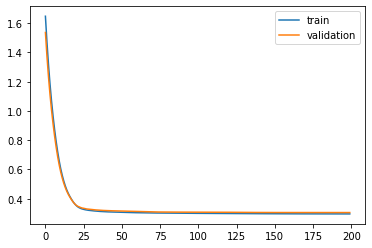

Time to train LSTM:  144.9373321533203
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 1.5732 - acc: 0.5957 - val_loss: 1.4754 - val_acc: 0.6199

Epoch 00001: val_loss improved from inf to 1.47537, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 1.3936 - acc: 0.6376 - val_loss: 1.3091 - val_acc: 0.6579

Epoch 00002: val_loss improved from 1.47537 to 1.30908, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 1.2418 - acc: 0.6696 - val_loss: 1.1674 - val_acc: 0.6857

Epoch 00003: val_loss improved from 1.30908 to 1.16740, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 1.1122 - acc: 0.6958 - val_loss: 1.0470 - val_acc: 0.7110

Epoch 00004: val_loss improved from 1.16740 to 1.04696, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 1.0010 - acc: 0.7159 - val_loss: 0.9435 - val_acc: 0.7296

Epoch 00005: val_loss improved from 1.04696 to 0.94351, saving model to Event_val_weights5.hdf5
Epoch 6/200

 - 1s - loss: 0.3085 - acc: 0.8866 - val_loss: 0.3111 - val_acc: 0.8863

Epoch 00046: val_loss improved from 0.31150 to 0.31112, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.3083 - acc: 0.8865 - val_loss: 0.3108 - val_acc: 0.8864

Epoch 00047: val_loss improved from 0.31112 to 0.31080, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.3080 - acc: 0.8865 - val_loss: 0.3107 - val_acc: 0.8869

Epoch 00048: val_loss improved from 0.31080 to 0.31071, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.3077 - acc: 0.8865 - val_loss: 0.3104 - val_acc: 0.8870

Epoch 00049: val_loss improved from 0.31071 to 0.31038, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3075 - acc: 0.8866 - val_loss: 0.3100 - val_acc: 0.8869

Epoch 00050: val_loss improved from 0.31038 to 0.31002, saving model to Event_val_weights5.hdf5
Epoch 51/200
 - 1s - loss: 0.3072 - acc: 0.8867 - val_loss: 0.3099 - val_acc: 0.8871

Epoch 00051: val_

 - 1s - loss: 0.3006 - acc: 0.8876 - val_loss: 0.3044 - val_acc: 0.8881

Epoch 00093: val_loss improved from 0.30453 to 0.30445, saving model to Event_val_weights5.hdf5
Epoch 94/200
 - 1s - loss: 0.3005 - acc: 0.8876 - val_loss: 0.3045 - val_acc: 0.8882

Epoch 00094: val_loss did not improve from 0.30445
Epoch 95/200
 - 1s - loss: 0.3005 - acc: 0.8876 - val_loss: 0.3044 - val_acc: 0.8884

Epoch 00095: val_loss improved from 0.30445 to 0.30445, saving model to Event_val_weights5.hdf5
Epoch 96/200
 - 1s - loss: 0.3004 - acc: 0.8875 - val_loss: 0.3042 - val_acc: 0.8887

Epoch 00096: val_loss improved from 0.30445 to 0.30422, saving model to Event_val_weights5.hdf5
Epoch 97/200
 - 1s - loss: 0.3003 - acc: 0.8876 - val_loss: 0.3043 - val_acc: 0.8881

Epoch 00097: val_loss did not improve from 0.30422
Epoch 98/200
 - 1s - loss: 0.3003 - acc: 0.8876 - val_loss: 0.3042 - val_acc: 0.8886

Epoch 00098: val_loss did not improve from 0.30422
Epoch 99/200
 - 1s - loss: 0.3002 - acc: 0.8876 - val_lo

 - 1s - loss: 0.2990 - acc: 0.8875 - val_loss: 0.3033 - val_acc: 0.8878

Epoch 00146: val_loss did not improve from 0.30282
Epoch 147/200
 - 1s - loss: 0.2990 - acc: 0.8875 - val_loss: 0.3039 - val_acc: 0.8874

Epoch 00147: val_loss did not improve from 0.30282
Epoch 148/200
 - 1s - loss: 0.2988 - acc: 0.8875 - val_loss: 0.3036 - val_acc: 0.8880

Epoch 00148: val_loss did not improve from 0.30282
Epoch 149/200
 - 1s - loss: 0.2990 - acc: 0.8876 - val_loss: 0.3028 - val_acc: 0.8877

Epoch 00149: val_loss improved from 0.30282 to 0.30276, saving model to Event_val_weights5.hdf5
Epoch 150/200
 - 1s - loss: 0.2990 - acc: 0.8875 - val_loss: 0.3029 - val_acc: 0.8869

Epoch 00150: val_loss did not improve from 0.30276
Epoch 151/200
 - 1s - loss: 0.2989 - acc: 0.8875 - val_loss: 0.3029 - val_acc: 0.8876

Epoch 00151: val_loss did not improve from 0.30276
Epoch 152/200
 - 1s - loss: 0.2988 - acc: 0.8874 - val_loss: 0.3031 - val_acc: 0.8874

Epoch 00152: val_loss did not improve from 0.30276
Epo

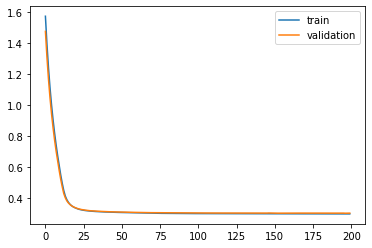

Time to train LSTM:  137.8233780860901
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 1.2039 - acc: 0.5617 - val_loss: 1.1191 - val_acc: 0.6040

Epoch 00001: val_loss improved from inf to 1.11908, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 1.0750 - acc: 0.6224 - val_loss: 1.0072 - val_acc: 0.6536

Epoch 00002: val_loss improved from 1.11908 to 1.00720, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 0.9759 - acc: 0.6637 - val_loss: 0.9196 - val_acc: 0.6900

Epoch 00003: val_loss improved from 1.00720 to 0.91964, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 0.8950 - acc: 0.6923 - val_loss: 0.8458 - val_acc: 0.7132

Epoch 00004: val_loss improved from 0.91964 to 0.84578, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 0.8260 - acc: 0.7111 - val_loss: 0.7817 - val_acc: 0.7314

Epoch 00005: val_loss improved from 0.84578 to 0.78171, saving model to Event_val_weights1.hdf5
Epoch 6/200

 - 1s - loss: 0.3012 - acc: 0.8878 - val_loss: 0.3011 - val_acc: 0.8846

Epoch 00046: val_loss improved from 0.30147 to 0.30112, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.3010 - acc: 0.8879 - val_loss: 0.3010 - val_acc: 0.8843

Epoch 00047: val_loss improved from 0.30112 to 0.30104, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3008 - acc: 0.8879 - val_loss: 0.3009 - val_acc: 0.8848

Epoch 00048: val_loss improved from 0.30104 to 0.30087, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.3006 - acc: 0.8881 - val_loss: 0.3007 - val_acc: 0.8856

Epoch 00049: val_loss improved from 0.30087 to 0.30071, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.3004 - acc: 0.8881 - val_loss: 0.3006 - val_acc: 0.8854

Epoch 00050: val_loss improved from 0.30071 to 0.30058, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.3003 - acc: 0.8880 - val_loss: 0.3007 - val_acc: 0.8854

Epoch 00051: val_

 - 1s - loss: 0.2980 - acc: 0.8882 - val_loss: 0.2991 - val_acc: 0.8850

Epoch 00099: val_loss did not improve from 0.29880
Epoch 100/200
 - 1s - loss: 0.2980 - acc: 0.8885 - val_loss: 0.2993 - val_acc: 0.8851

Epoch 00100: val_loss did not improve from 0.29880
Epoch 101/200
 - 1s - loss: 0.2978 - acc: 0.8885 - val_loss: 0.2989 - val_acc: 0.8854

Epoch 00101: val_loss did not improve from 0.29880
Epoch 102/200
 - 1s - loss: 0.2977 - acc: 0.8883 - val_loss: 0.2992 - val_acc: 0.8853

Epoch 00102: val_loss did not improve from 0.29880
Epoch 103/200
 - 1s - loss: 0.2976 - acc: 0.8883 - val_loss: 0.2991 - val_acc: 0.8859

Epoch 00103: val_loss did not improve from 0.29880
Epoch 104/200
 - 1s - loss: 0.2978 - acc: 0.8881 - val_loss: 0.2990 - val_acc: 0.8852

Epoch 00104: val_loss did not improve from 0.29880
Epoch 105/200
 - 1s - loss: 0.2979 - acc: 0.8884 - val_loss: 0.2986 - val_acc: 0.8853

Epoch 00105: val_loss improved from 0.29880 to 0.29861, saving model to Event_val_weights1.hdf5
Epo

 - 1s - loss: 0.2966 - acc: 0.8887 - val_loss: 0.2979 - val_acc: 0.8867

Epoch 00154: val_loss did not improve from 0.29760
Epoch 155/200
 - 1s - loss: 0.2966 - acc: 0.8887 - val_loss: 0.2978 - val_acc: 0.8858

Epoch 00155: val_loss did not improve from 0.29760
Epoch 156/200
 - 1s - loss: 0.2964 - acc: 0.8886 - val_loss: 0.2977 - val_acc: 0.8867

Epoch 00156: val_loss did not improve from 0.29760
Epoch 157/200
 - 1s - loss: 0.2964 - acc: 0.8889 - val_loss: 0.2977 - val_acc: 0.8868

Epoch 00157: val_loss did not improve from 0.29760
Epoch 158/200
 - 1s - loss: 0.2965 - acc: 0.8888 - val_loss: 0.2979 - val_acc: 0.8861

Epoch 00158: val_loss did not improve from 0.29760
Epoch 159/200
 - 1s - loss: 0.2966 - acc: 0.8886 - val_loss: 0.2977 - val_acc: 0.8860

Epoch 00159: val_loss did not improve from 0.29760
Epoch 160/200
 - 1s - loss: 0.2964 - acc: 0.8888 - val_loss: 0.2976 - val_acc: 0.8867

Epoch 00160: val_loss did not improve from 0.29760
Epoch 161/200
 - 1s - loss: 0.2964 - acc: 0.8890

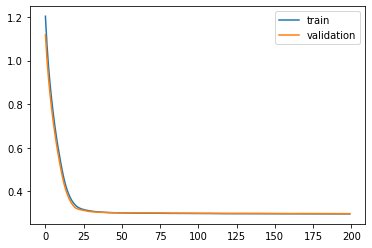

Time to train LSTM:  142.37506532669067
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 1.2005 - acc: 0.5747 - val_loss: 1.1127 - val_acc: 0.6143

Epoch 00001: val_loss improved from inf to 1.11267, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 1.0602 - acc: 0.6356 - val_loss: 0.9918 - val_acc: 0.6668

Epoch 00002: val_loss improved from 1.11267 to 0.99182, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 0.9466 - acc: 0.6869 - val_loss: 0.8928 - val_acc: 0.7099

Epoch 00003: val_loss improved from 0.99182 to 0.89277, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 0.8538 - acc: 0.7262 - val_loss: 0.8121 - val_acc: 0.7407

Epoch 00004: val_loss improved from 0.89277 to 0.81206, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 0.7775 - acc: 0.7531 - val_loss: 0.7449 - val_acc: 0.7581

Epoch 00005: val_loss improved from 0.81206 to 0.74492, saving model to Event_val_weights2.hdf5
Epoch 6/20

 - 1s - loss: 0.3034 - acc: 0.8879 - val_loss: 0.3122 - val_acc: 0.8833

Epoch 00046: val_loss improved from 0.31235 to 0.31219, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.3032 - acc: 0.8879 - val_loss: 0.3121 - val_acc: 0.8834

Epoch 00047: val_loss improved from 0.31219 to 0.31214, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.3030 - acc: 0.8879 - val_loss: 0.3118 - val_acc: 0.8838

Epoch 00048: val_loss improved from 0.31214 to 0.31183, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.3028 - acc: 0.8879 - val_loss: 0.3117 - val_acc: 0.8838

Epoch 00049: val_loss improved from 0.31183 to 0.31167, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.3027 - acc: 0.8878 - val_loss: 0.3115 - val_acc: 0.8840

Epoch 00050: val_loss improved from 0.31167 to 0.31154, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.3026 - acc: 0.8878 - val_loss: 0.3113 - val_acc: 0.8840

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30842 to 0.30835, saving model to Event_val_weights2.hdf5
Epoch 92/200
 - 1s - loss: 0.2995 - acc: 0.8881 - val_loss: 0.3083 - val_acc: 0.8831

Epoch 00092: val_loss improved from 0.30835 to 0.30832, saving model to Event_val_weights2.hdf5
Epoch 93/200
 - 1s - loss: 0.2994 - acc: 0.8882 - val_loss: 0.3083 - val_acc: 0.8830

Epoch 00093: val_loss improved from 0.30832 to 0.30826, saving model to Event_val_weights2.hdf5
Epoch 94/200
 - 1s - loss: 0.2994 - acc: 0.8882 - val_loss: 0.3082 - val_acc: 0.8831

Epoch 00094: val_loss improved from 0.30826 to 0.30822, saving model to Event_val_weights2.hdf5
Epoch 95/200
 - 1s - loss: 0.2993 - acc: 0.8882 - val_loss: 0.3082 - val_acc: 0.8831

Epoch 00095: val_loss improved from 0.30822 to 0.30816, saving model to Event_val_weights2.hdf5
Epoch 96/200
 - 1s - loss: 0.2993 - acc: 0.8883 - val_loss: 0.3081 - val_acc: 0.8830

Epoch 00096: val_loss improved from 0.30816 to 0.30812, saving model to Event_val_weights


Epoch 00136: val_loss improved from 0.30662 to 0.30659, saving model to Event_val_weights2.hdf5
Epoch 137/200
 - 1s - loss: 0.2979 - acc: 0.8883 - val_loss: 0.3065 - val_acc: 0.8831

Epoch 00137: val_loss improved from 0.30659 to 0.30652, saving model to Event_val_weights2.hdf5
Epoch 138/200
 - 1s - loss: 0.2979 - acc: 0.8884 - val_loss: 0.3065 - val_acc: 0.8833

Epoch 00138: val_loss improved from 0.30652 to 0.30649, saving model to Event_val_weights2.hdf5
Epoch 139/200
 - 1s - loss: 0.2978 - acc: 0.8883 - val_loss: 0.3064 - val_acc: 0.8833

Epoch 00139: val_loss improved from 0.30649 to 0.30643, saving model to Event_val_weights2.hdf5
Epoch 140/200
 - 1s - loss: 0.2978 - acc: 0.8884 - val_loss: 0.3064 - val_acc: 0.8836

Epoch 00140: val_loss improved from 0.30643 to 0.30639, saving model to Event_val_weights2.hdf5
Epoch 141/200
 - 1s - loss: 0.2978 - acc: 0.8884 - val_loss: 0.3063 - val_acc: 0.8836

Epoch 00141: val_loss improved from 0.30639 to 0.30634, saving model to Event_val_we


Epoch 00181: val_loss improved from 0.30457 to 0.30451, saving model to Event_val_weights2.hdf5
Epoch 182/200
 - 1s - loss: 0.2962 - acc: 0.8890 - val_loss: 0.3045 - val_acc: 0.8838

Epoch 00182: val_loss improved from 0.30451 to 0.30449, saving model to Event_val_weights2.hdf5
Epoch 183/200
 - 1s - loss: 0.2962 - acc: 0.8891 - val_loss: 0.3045 - val_acc: 0.8838

Epoch 00183: val_loss improved from 0.30449 to 0.30447, saving model to Event_val_weights2.hdf5
Epoch 184/200
 - 1s - loss: 0.2962 - acc: 0.8890 - val_loss: 0.3044 - val_acc: 0.8839

Epoch 00184: val_loss improved from 0.30447 to 0.30445, saving model to Event_val_weights2.hdf5
Epoch 185/200
 - 1s - loss: 0.2962 - acc: 0.8891 - val_loss: 0.3044 - val_acc: 0.8839

Epoch 00185: val_loss improved from 0.30445 to 0.30441, saving model to Event_val_weights2.hdf5
Epoch 186/200
 - 1s - loss: 0.2961 - acc: 0.8891 - val_loss: 0.3044 - val_acc: 0.8840

Epoch 00186: val_loss improved from 0.30441 to 0.30439, saving model to Event_val_we

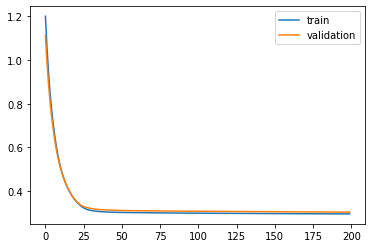

Time to train LSTM:  144.54736852645874
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 1.1262 - acc: 0.5539 - val_loss: 1.0603 - val_acc: 0.6007

Epoch 00001: val_loss improved from inf to 1.06025, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 1.0190 - acc: 0.6267 - val_loss: 0.9612 - val_acc: 0.6677

Epoch 00002: val_loss improved from 1.06025 to 0.96117, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 0.9272 - acc: 0.6827 - val_loss: 0.8766 - val_acc: 0.7086

Epoch 00003: val_loss improved from 0.96117 to 0.87655, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 0.8481 - acc: 0.7173 - val_loss: 0.8031 - val_acc: 0.7304

Epoch 00004: val_loss improved from 0.87655 to 0.80305, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 0.7786 - acc: 0.7394 - val_loss: 0.7383 - val_acc: 0.7506

Epoch 00005: val_loss improved from 0.80305 to 0.73829, saving model to Event_val_weights3.hdf5
Epoch 6/20

 - 1s - loss: 0.3046 - acc: 0.8881 - val_loss: 0.3082 - val_acc: 0.8858

Epoch 00046: val_loss improved from 0.30848 to 0.30818, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3043 - acc: 0.8882 - val_loss: 0.3079 - val_acc: 0.8859

Epoch 00047: val_loss improved from 0.30818 to 0.30786, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.3041 - acc: 0.8881 - val_loss: 0.3076 - val_acc: 0.8856

Epoch 00048: val_loss improved from 0.30786 to 0.30764, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.3038 - acc: 0.8882 - val_loss: 0.3073 - val_acc: 0.8858

Epoch 00049: val_loss improved from 0.30764 to 0.30733, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.3037 - acc: 0.8882 - val_loss: 0.3072 - val_acc: 0.8860

Epoch 00050: val_loss improved from 0.30733 to 0.30718, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3035 - acc: 0.8882 - val_loss: 0.3069 - val_acc: 0.8859

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30335 to 0.30333, saving model to Event_val_weights3.hdf5
Epoch 92/200
 - 1s - loss: 0.2998 - acc: 0.8881 - val_loss: 0.3033 - val_acc: 0.8873

Epoch 00092: val_loss improved from 0.30333 to 0.30330, saving model to Event_val_weights3.hdf5
Epoch 93/200
 - 1s - loss: 0.2997 - acc: 0.8881 - val_loss: 0.3033 - val_acc: 0.8872

Epoch 00093: val_loss improved from 0.30330 to 0.30327, saving model to Event_val_weights3.hdf5
Epoch 94/200
 - 1s - loss: 0.2997 - acc: 0.8881 - val_loss: 0.3033 - val_acc: 0.8872

Epoch 00094: val_loss improved from 0.30327 to 0.30325, saving model to Event_val_weights3.hdf5
Epoch 95/200
 - 1s - loss: 0.2997 - acc: 0.8882 - val_loss: 0.3032 - val_acc: 0.8872

Epoch 00095: val_loss improved from 0.30325 to 0.30322, saving model to Event_val_weights3.hdf5
Epoch 96/200
 - 1s - loss: 0.2996 - acc: 0.8881 - val_loss: 0.3032 - val_acc: 0.8871

Epoch 00096: val_loss improved from 0.30322 to 0.30321, saving model to Event_val_weights

 - 1s - loss: 0.2981 - acc: 0.8880 - val_loss: 0.3025 - val_acc: 0.8864

Epoch 00139: val_loss did not improve from 0.30246
Epoch 140/200
 - 1s - loss: 0.2980 - acc: 0.8880 - val_loss: 0.3024 - val_acc: 0.8864

Epoch 00140: val_loss improved from 0.30246 to 0.30242, saving model to Event_val_weights3.hdf5
Epoch 141/200
 - 1s - loss: 0.2980 - acc: 0.8881 - val_loss: 0.3024 - val_acc: 0.8867

Epoch 00141: val_loss did not improve from 0.30242
Epoch 142/200
 - 1s - loss: 0.2980 - acc: 0.8880 - val_loss: 0.3024 - val_acc: 0.8866

Epoch 00142: val_loss improved from 0.30242 to 0.30240, saving model to Event_val_weights3.hdf5
Epoch 143/200
 - 1s - loss: 0.2979 - acc: 0.8880 - val_loss: 0.3024 - val_acc: 0.8866

Epoch 00143: val_loss did not improve from 0.30240
Epoch 144/200
 - 1s - loss: 0.2979 - acc: 0.8879 - val_loss: 0.3024 - val_acc: 0.8864

Epoch 00144: val_loss improved from 0.30240 to 0.30237, saving model to Event_val_weights3.hdf5
Epoch 145/200
 - 1s - loss: 0.2979 - acc: 0.8880 - 


Epoch 00191: val_loss did not improve from 0.30201
Epoch 192/200
 - 1s - loss: 0.2964 - acc: 0.8881 - val_loss: 0.3021 - val_acc: 0.8876

Epoch 00192: val_loss did not improve from 0.30201
Epoch 193/200
 - 1s - loss: 0.2963 - acc: 0.8880 - val_loss: 0.3021 - val_acc: 0.8879

Epoch 00193: val_loss did not improve from 0.30201
Epoch 194/200
 - 1s - loss: 0.2963 - acc: 0.8881 - val_loss: 0.3020 - val_acc: 0.8876

Epoch 00194: val_loss did not improve from 0.30201
Epoch 195/200
 - 1s - loss: 0.2963 - acc: 0.8881 - val_loss: 0.3021 - val_acc: 0.8877

Epoch 00195: val_loss did not improve from 0.30201
Epoch 196/200
 - 1s - loss: 0.2963 - acc: 0.8882 - val_loss: 0.3021 - val_acc: 0.8878

Epoch 00196: val_loss did not improve from 0.30201
Epoch 197/200
 - 1s - loss: 0.2963 - acc: 0.8882 - val_loss: 0.3021 - val_acc: 0.8880

Epoch 00197: val_loss did not improve from 0.30201
Epoch 198/200
 - 1s - loss: 0.2962 - acc: 0.8882 - val_loss: 0.3021 - val_acc: 0.8879

Epoch 00198: val_loss did not imp

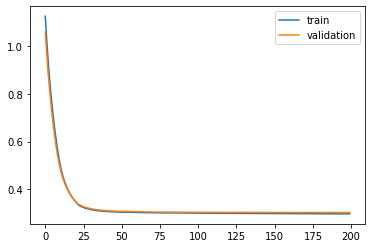

Time to train LSTM:  143.68244791030884


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8d2c504940>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 1.1613 - acc: 0.5012 - val_loss: 1.0822 - val_acc: 0.5518

Epoch 00001: val_loss improved from inf to 1.08217, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 1.0399 - acc: 0.5828 - val_loss: 0.9773 - val_acc: 0.6273

Epoch 00002: val_loss improved from 1.08217 to 0.97730, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 0.9430 - acc: 0.6488 - val_loss: 0.8914 - val_acc: 0.6800

Epoch 00003: val_loss improved from 0.97730 to 0.89143, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 0.8626 - acc: 0.6947 - val_loss: 0.8189 - val_acc: 0.7137

Epoch 00004: val_loss improved from 0.89143 to 0.81886, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 0.7930 - acc: 0.7255 - val_loss: 0.7556 - val_acc: 0.7418

Epoch 00005: val_loss improved from 0.81886 to 0.75560, saving model to Event_val_weights4.hdf5
Epoch 6/200
 - 1s - loss: 0.7319 - acc: 0.7503 - v

 - 1s - loss: 0.3043 - acc: 0.8875 - val_loss: 0.3137 - val_acc: 0.8858

Epoch 00046: val_loss improved from 0.31406 to 0.31374, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.3040 - acc: 0.8874 - val_loss: 0.3134 - val_acc: 0.8852

Epoch 00047: val_loss improved from 0.31374 to 0.31342, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.3035 - acc: 0.8877 - val_loss: 0.3132 - val_acc: 0.8851

Epoch 00048: val_loss improved from 0.31342 to 0.31316, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.3032 - acc: 0.8876 - val_loss: 0.3127 - val_acc: 0.8854

Epoch 00049: val_loss improved from 0.31316 to 0.31272, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3028 - acc: 0.8877 - val_loss: 0.3124 - val_acc: 0.8853

Epoch 00050: val_loss improved from 0.31272 to 0.31241, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.3025 - acc: 0.8878 - val_loss: 0.3120 - val_acc: 0.8852

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30595 to 0.30594, saving model to Event_val_weights4.hdf5
Epoch 92/200
 - 1s - loss: 0.2961 - acc: 0.8889 - val_loss: 0.3059 - val_acc: 0.8827

Epoch 00092: val_loss improved from 0.30594 to 0.30590, saving model to Event_val_weights4.hdf5
Epoch 93/200
 - 1s - loss: 0.2961 - acc: 0.8890 - val_loss: 0.3059 - val_acc: 0.8824

Epoch 00093: val_loss improved from 0.30590 to 0.30589, saving model to Event_val_weights4.hdf5
Epoch 94/200
 - 1s - loss: 0.2960 - acc: 0.8890 - val_loss: 0.3059 - val_acc: 0.8822

Epoch 00094: val_loss improved from 0.30589 to 0.30586, saving model to Event_val_weights4.hdf5
Epoch 95/200
 - 1s - loss: 0.2960 - acc: 0.8889 - val_loss: 0.3058 - val_acc: 0.8819

Epoch 00095: val_loss improved from 0.30586 to 0.30585, saving model to Event_val_weights4.hdf5
Epoch 96/200
 - 1s - loss: 0.2960 - acc: 0.8889 - val_loss: 0.3058 - val_acc: 0.8820

Epoch 00096: val_loss improved from 0.30585 to 0.30583, saving model to Event_val_weights


Epoch 00140: val_loss improved from 0.30537 to 0.30536, saving model to Event_val_weights4.hdf5
Epoch 141/200
 - 1s - loss: 0.2955 - acc: 0.8889 - val_loss: 0.3054 - val_acc: 0.8822

Epoch 00141: val_loss did not improve from 0.30536
Epoch 142/200
 - 1s - loss: 0.2955 - acc: 0.8888 - val_loss: 0.3054 - val_acc: 0.8822

Epoch 00142: val_loss improved from 0.30536 to 0.30536, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.2955 - acc: 0.8888 - val_loss: 0.3054 - val_acc: 0.8822

Epoch 00143: val_loss did not improve from 0.30536
Epoch 144/200
 - 1s - loss: 0.2955 - acc: 0.8889 - val_loss: 0.3053 - val_acc: 0.8822

Epoch 00144: val_loss improved from 0.30536 to 0.30535, saving model to Event_val_weights4.hdf5
Epoch 145/200
 - 1s - loss: 0.2954 - acc: 0.8889 - val_loss: 0.3054 - val_acc: 0.8822

Epoch 00145: val_loss did not improve from 0.30535
Epoch 146/200
 - 1s - loss: 0.2954 - acc: 0.8889 - val_loss: 0.3054 - val_acc: 0.8821

Epoch 00146: val_loss did not improv

 - 1s - loss: 0.2953 - acc: 0.8890 - val_loss: 0.3054 - val_acc: 0.8824

Epoch 00197: val_loss did not improve from 0.30532
Epoch 198/200
 - 1s - loss: 0.2953 - acc: 0.8890 - val_loss: 0.3053 - val_acc: 0.8826

Epoch 00198: val_loss did not improve from 0.30532
Epoch 199/200
 - 1s - loss: 0.2953 - acc: 0.8890 - val_loss: 0.3054 - val_acc: 0.8824

Epoch 00199: val_loss did not improve from 0.30532
Epoch 200/200
 - 1s - loss: 0.2953 - acc: 0.8890 - val_loss: 0.3053 - val_acc: 0.8824

Epoch 00200: val_loss did not improve from 0.30532
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2_1: 0.05204836127912327
best val loss: 0.3053243521849314
#################################


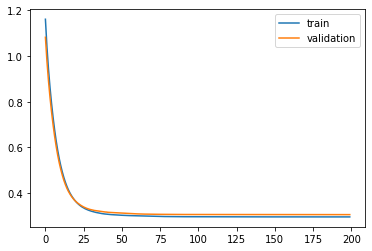

Time to train LSTM:  147.68810105323792
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 1.1235 - acc: 0.5427 - val_loss: 1.0458 - val_acc: 0.5913

Epoch 00001: val_loss improved from inf to 1.04576, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 0.9923 - acc: 0.6195 - val_loss: 0.9325 - val_acc: 0.6504

Epoch 00002: val_loss improved from 1.04576 to 0.93247, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 0.8943 - acc: 0.6720 - val_loss: 0.8464 - val_acc: 0.6999

Epoch 00003: val_loss improved from 0.93247 to 0.84643, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 0.8178 - acc: 0.7096 - val_loss: 0.7776 - val_acc: 0.7280

Epoch 00004: val_loss improved from 0.84643 to 0.77756, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 0.7545 - acc: 0.7370 - val_loss: 0.7202 - val_acc: 0.7536

Epoch 00005: val_loss improved from 0.77756 to 0.72024, saving model to Event_val_weights5.hdf5
Epoch 6/20

 - 1s - loss: 0.3049 - acc: 0.8877 - val_loss: 0.3078 - val_acc: 0.8862

Epoch 00046: val_loss improved from 0.30788 to 0.30779, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.3046 - acc: 0.8877 - val_loss: 0.3074 - val_acc: 0.8861

Epoch 00047: val_loss improved from 0.30779 to 0.30739, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.3044 - acc: 0.8877 - val_loss: 0.3072 - val_acc: 0.8861

Epoch 00048: val_loss improved from 0.30739 to 0.30724, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.3041 - acc: 0.8876 - val_loss: 0.3069 - val_acc: 0.8861

Epoch 00049: val_loss improved from 0.30724 to 0.30686, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3039 - acc: 0.8877 - val_loss: 0.3068 - val_acc: 0.8861

Epoch 00050: val_loss improved from 0.30686 to 0.30678, saving model to Event_val_weights5.hdf5
Epoch 51/200
 - 1s - loss: 0.3037 - acc: 0.8877 - val_loss: 0.3065 - val_acc: 0.8861

Epoch 00051: val_

 - 1s - loss: 0.2999 - acc: 0.8875 - val_loss: 0.3025 - val_acc: 0.8869

Epoch 00094: val_loss did not improve from 0.30251
Epoch 95/200
 - 1s - loss: 0.2999 - acc: 0.8875 - val_loss: 0.3024 - val_acc: 0.8869

Epoch 00095: val_loss improved from 0.30251 to 0.30242, saving model to Event_val_weights5.hdf5
Epoch 96/200
 - 1s - loss: 0.2999 - acc: 0.8875 - val_loss: 0.3024 - val_acc: 0.8870

Epoch 00096: val_loss did not improve from 0.30242
Epoch 97/200
 - 1s - loss: 0.2998 - acc: 0.8875 - val_loss: 0.3023 - val_acc: 0.8871

Epoch 00097: val_loss improved from 0.30242 to 0.30234, saving model to Event_val_weights5.hdf5
Epoch 98/200
 - 1s - loss: 0.2998 - acc: 0.8875 - val_loss: 0.3023 - val_acc: 0.8872

Epoch 00098: val_loss improved from 0.30234 to 0.30234, saving model to Event_val_weights5.hdf5
Epoch 99/200
 - 1s - loss: 0.2997 - acc: 0.8875 - val_loss: 0.3023 - val_acc: 0.8872

Epoch 00099: val_loss improved from 0.30234 to 0.30226, saving model to Event_val_weights5.hdf5
Epoch 100/2

 - 1s - loss: 0.2979 - acc: 0.8879 - val_loss: 0.3017 - val_acc: 0.8879

Epoch 00148: val_loss did not improve from 0.30161
Epoch 149/200
 - 1s - loss: 0.2979 - acc: 0.8880 - val_loss: 0.3017 - val_acc: 0.8881

Epoch 00149: val_loss did not improve from 0.30161
Epoch 150/200
 - 1s - loss: 0.2978 - acc: 0.8879 - val_loss: 0.3017 - val_acc: 0.8880

Epoch 00150: val_loss did not improve from 0.30161
Epoch 151/200
 - 1s - loss: 0.2978 - acc: 0.8879 - val_loss: 0.3017 - val_acc: 0.8881

Epoch 00151: val_loss did not improve from 0.30161
Epoch 152/200
 - 1s - loss: 0.2977 - acc: 0.8880 - val_loss: 0.3017 - val_acc: 0.8882

Epoch 00152: val_loss did not improve from 0.30161
Epoch 153/200
 - 1s - loss: 0.2977 - acc: 0.8879 - val_loss: 0.3016 - val_acc: 0.8881

Epoch 00153: val_loss did not improve from 0.30161
Epoch 154/200
 - 1s - loss: 0.2976 - acc: 0.8879 - val_loss: 0.3016 - val_acc: 0.8882

Epoch 00154: val_loss did not improve from 0.30161
Epoch 155/200
 - 1s - loss: 0.2976 - acc: 0.8880


Epoch 00198: val_loss did not improve from 0.30065
Epoch 199/200
 - 1s - loss: 0.2962 - acc: 0.8883 - val_loss: 0.3007 - val_acc: 0.8871

Epoch 00199: val_loss did not improve from 0.30065
Epoch 200/200
 - 1s - loss: 0.2962 - acc: 0.8883 - val_loss: 0.3006 - val_acc: 0.8873

Epoch 00200: val_loss improved from 0.30065 to 0.30065, saving model to Event_val_weights5.hdf5
#################################
Number of units: 4
Batch size: 8192
Fold: 4
L2_1: 0.05204836127912327
best val loss: 0.3006494183010525
#################################
[[4, 8192, 0.13571542470728296, 0, 0.298806241856681], [4, 8192, 0.13571542470728296, 1, 0.30528454338179695], [4, 8192, 0.13571542470728296, 2, 0.3012693679862552], [4, 8192, 0.13571542470728296, 3, 0.3062392633491092], [4, 8192, 0.13571542470728296, 4, 0.3027335908148024], [4, 8192, 0.06650866175952272, 0, 0.29531902164883084], [4, 8192, 0.06650866175952272, 1, 0.3067721240785387], [4, 8192, 0.06650866175952272, 2, 0.3012255862818824], [4, 8192, 0.0

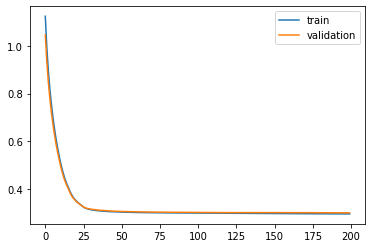

Time to train LSTM:  138.02075624465942
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 1.1853 - acc: 0.5460 - val_loss: 1.1223 - val_acc: 0.5773

Epoch 00001: val_loss improved from inf to 1.12226, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 1.0804 - acc: 0.6017 - val_loss: 1.0243 - val_acc: 0.6328

Epoch 00002: val_loss improved from 1.12226 to 1.02435, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 0.9890 - acc: 0.6471 - val_loss: 0.9382 - val_acc: 0.6698

Epoch 00003: val_loss improved from 1.02435 to 0.93821, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 0.9080 - acc: 0.6834 - val_loss: 0.8615 - val_acc: 0.7073

Epoch 00004: val_loss improved from 0.93821 to 0.86147, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 0.8355 - acc: 0.7147 - val_loss: 0.7925 - val_acc: 0.7379

Epoch 00005: val_loss improved from 0.86147 to 0.79255, saving model to Event_val_weights1.hdf5
Epoch 6/20

 - 1s - loss: 0.3089 - acc: 0.8871 - val_loss: 0.3043 - val_acc: 0.8858

Epoch 00046: val_loss improved from 0.30460 to 0.30430, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.3086 - acc: 0.8872 - val_loss: 0.3039 - val_acc: 0.8858

Epoch 00047: val_loss improved from 0.30430 to 0.30395, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3083 - acc: 0.8871 - val_loss: 0.3035 - val_acc: 0.8856

Epoch 00048: val_loss improved from 0.30395 to 0.30352, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.3080 - acc: 0.8872 - val_loss: 0.3034 - val_acc: 0.8858

Epoch 00049: val_loss improved from 0.30352 to 0.30340, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.3078 - acc: 0.8871 - val_loss: 0.3032 - val_acc: 0.8858

Epoch 00050: val_loss improved from 0.30340 to 0.30315, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.3075 - acc: 0.8871 - val_loss: 0.3028 - val_acc: 0.8858

Epoch 00051: val_


Epoch 00095: val_loss improved from 0.29747 to 0.29733, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.3022 - acc: 0.8877 - val_loss: 0.2975 - val_acc: 0.8876

Epoch 00096: val_loss did not improve from 0.29733
Epoch 97/200
 - 1s - loss: 0.3021 - acc: 0.8877 - val_loss: 0.2976 - val_acc: 0.8874

Epoch 00097: val_loss did not improve from 0.29733
Epoch 98/200
 - 1s - loss: 0.3021 - acc: 0.8876 - val_loss: 0.2974 - val_acc: 0.8876

Epoch 00098: val_loss did not improve from 0.29733
Epoch 99/200
 - 1s - loss: 0.3020 - acc: 0.8877 - val_loss: 0.2973 - val_acc: 0.8876

Epoch 00099: val_loss improved from 0.29733 to 0.29725, saving model to Event_val_weights1.hdf5
Epoch 100/200
 - 1s - loss: 0.3019 - acc: 0.8876 - val_loss: 0.2970 - val_acc: 0.8879

Epoch 00100: val_loss improved from 0.29725 to 0.29701, saving model to Event_val_weights1.hdf5
Epoch 101/200
 - 1s - loss: 0.3019 - acc: 0.8876 - val_loss: 0.2973 - val_acc: 0.8878

Epoch 00101: val_loss did not improve fr

 - 1s - loss: 0.3001 - acc: 0.8874 - val_loss: 0.2955 - val_acc: 0.8880

Epoch 00147: val_loss improved from 0.29547 to 0.29545, saving model to Event_val_weights1.hdf5
Epoch 148/200
 - 1s - loss: 0.3001 - acc: 0.8875 - val_loss: 0.2954 - val_acc: 0.8879

Epoch 00148: val_loss improved from 0.29545 to 0.29542, saving model to Event_val_weights1.hdf5
Epoch 149/200
 - 1s - loss: 0.3000 - acc: 0.8874 - val_loss: 0.2954 - val_acc: 0.8880

Epoch 00149: val_loss improved from 0.29542 to 0.29540, saving model to Event_val_weights1.hdf5
Epoch 150/200
 - 1s - loss: 0.3000 - acc: 0.8874 - val_loss: 0.2954 - val_acc: 0.8880

Epoch 00150: val_loss improved from 0.29540 to 0.29537, saving model to Event_val_weights1.hdf5
Epoch 151/200
 - 1s - loss: 0.3000 - acc: 0.8874 - val_loss: 0.2953 - val_acc: 0.8880

Epoch 00151: val_loss improved from 0.29537 to 0.29535, saving model to Event_val_weights1.hdf5
Epoch 152/200
 - 1s - loss: 0.2999 - acc: 0.8874 - val_loss: 0.2953 - val_acc: 0.8881

Epoch 00152:


Epoch 00195: val_loss did not improve from 0.29451
Epoch 196/200
 - 1s - loss: 0.2989 - acc: 0.8877 - val_loss: 0.2949 - val_acc: 0.8870

Epoch 00196: val_loss did not improve from 0.29451
Epoch 197/200
 - 1s - loss: 0.2988 - acc: 0.8877 - val_loss: 0.2949 - val_acc: 0.8870

Epoch 00197: val_loss did not improve from 0.29451
Epoch 198/200
 - 1s - loss: 0.2988 - acc: 0.8877 - val_loss: 0.2947 - val_acc: 0.8871

Epoch 00198: val_loss did not improve from 0.29451
Epoch 199/200
 - 1s - loss: 0.2988 - acc: 0.8877 - val_loss: 0.2945 - val_acc: 0.8870

Epoch 00199: val_loss improved from 0.29451 to 0.29451, saving model to Event_val_weights1.hdf5
Epoch 200/200
 - 1s - loss: 0.2988 - acc: 0.8877 - val_loss: 0.2948 - val_acc: 0.8867

Epoch 00200: val_loss did not improve from 0.29451
#################################
Number of units: 4
Batch size: 8192
Fold: 0
L2_1: 0.06167372687800163
best val loss: 0.29450841161939834
#################################


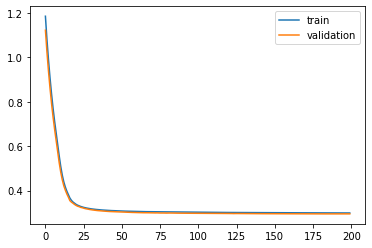

Time to train LSTM:  140.92754864692688
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 1.3183 - acc: 0.5394 - val_loss: 1.2143 - val_acc: 0.5810

Epoch 00001: val_loss improved from inf to 1.21427, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 1.1716 - acc: 0.5945 - val_loss: 1.0905 - val_acc: 0.6323

Epoch 00002: val_loss improved from 1.21427 to 1.09052, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 1.0549 - acc: 0.6406 - val_loss: 0.9893 - val_acc: 0.6722

Epoch 00003: val_loss improved from 1.09052 to 0.98929, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 0.9569 - acc: 0.6774 - val_loss: 0.9013 - val_acc: 0.7047

Epoch 00004: val_loss improved from 0.98929 to 0.90128, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 0.8715 - acc: 0.7089 - val_loss: 0.8239 - val_acc: 0.7323

Epoch 00005: val_loss improved from 0.90128 to 0.82391, saving model to Event_val_weights2.hdf5
Epoch 6/20

 - 1s - loss: 0.3005 - acc: 0.8879 - val_loss: 0.3095 - val_acc: 0.8834

Epoch 00046: val_loss improved from 0.30974 to 0.30955, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.3002 - acc: 0.8879 - val_loss: 0.3093 - val_acc: 0.8832

Epoch 00047: val_loss improved from 0.30955 to 0.30930, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.3000 - acc: 0.8880 - val_loss: 0.3091 - val_acc: 0.8832

Epoch 00048: val_loss improved from 0.30930 to 0.30908, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.2998 - acc: 0.8881 - val_loss: 0.3088 - val_acc: 0.8834

Epoch 00049: val_loss improved from 0.30908 to 0.30884, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.2995 - acc: 0.8881 - val_loss: 0.3086 - val_acc: 0.8831

Epoch 00050: val_loss improved from 0.30884 to 0.30861, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.2994 - acc: 0.8880 - val_loss: 0.3085 - val_acc: 0.8832

Epoch 00051: val_


Epoch 00092: val_loss improved from 0.30507 to 0.30500, saving model to Event_val_weights2.hdf5
Epoch 93/200
 - 1s - loss: 0.2964 - acc: 0.8887 - val_loss: 0.3050 - val_acc: 0.8837

Epoch 00093: val_loss did not improve from 0.30500
Epoch 94/200
 - 1s - loss: 0.2963 - acc: 0.8886 - val_loss: 0.3049 - val_acc: 0.8838

Epoch 00094: val_loss improved from 0.30500 to 0.30491, saving model to Event_val_weights2.hdf5
Epoch 95/200
 - 1s - loss: 0.2963 - acc: 0.8887 - val_loss: 0.3049 - val_acc: 0.8839

Epoch 00095: val_loss did not improve from 0.30491
Epoch 96/200
 - 1s - loss: 0.2963 - acc: 0.8886 - val_loss: 0.3048 - val_acc: 0.8839

Epoch 00096: val_loss improved from 0.30491 to 0.30481, saving model to Event_val_weights2.hdf5
Epoch 97/200
 - 1s - loss: 0.2963 - acc: 0.8886 - val_loss: 0.3048 - val_acc: 0.8841

Epoch 00097: val_loss did not improve from 0.30481
Epoch 98/200
 - 1s - loss: 0.2962 - acc: 0.8886 - val_loss: 0.3047 - val_acc: 0.8844

Epoch 00098: val_loss improved from 0.3048


Epoch 00145: val_loss did not improve from 0.30406
Epoch 146/200
 - 1s - loss: 0.2956 - acc: 0.8888 - val_loss: 0.3041 - val_acc: 0.8843

Epoch 00146: val_loss improved from 0.30406 to 0.30405, saving model to Event_val_weights2.hdf5
Epoch 147/200
 - 1s - loss: 0.2956 - acc: 0.8887 - val_loss: 0.3041 - val_acc: 0.8843

Epoch 00147: val_loss did not improve from 0.30405
Epoch 148/200
 - 1s - loss: 0.2956 - acc: 0.8887 - val_loss: 0.3041 - val_acc: 0.8842

Epoch 00148: val_loss improved from 0.30405 to 0.30405, saving model to Event_val_weights2.hdf5
Epoch 149/200
 - 1s - loss: 0.2956 - acc: 0.8887 - val_loss: 0.3040 - val_acc: 0.8841

Epoch 00149: val_loss improved from 0.30405 to 0.30403, saving model to Event_val_weights2.hdf5
Epoch 150/200
 - 1s - loss: 0.2956 - acc: 0.8888 - val_loss: 0.3040 - val_acc: 0.8843

Epoch 00150: val_loss improved from 0.30403 to 0.30401, saving model to Event_val_weights2.hdf5
Epoch 151/200
 - 1s - loss: 0.2956 - acc: 0.8887 - val_loss: 0.3040 - val_acc:

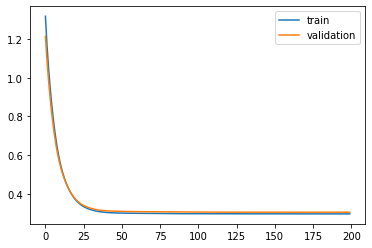

Time to train LSTM:  141.4894301891327
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 1.2465 - acc: 0.5832 - val_loss: 1.1834 - val_acc: 0.6062

Epoch 00001: val_loss improved from inf to 1.18343, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 1.1106 - acc: 0.6442 - val_loss: 1.0601 - val_acc: 0.6586

Epoch 00002: val_loss improved from 1.18343 to 1.06009, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 1.0006 - acc: 0.6887 - val_loss: 0.9587 - val_acc: 0.6941

Epoch 00003: val_loss improved from 1.06009 to 0.95868, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 0.9095 - acc: 0.7176 - val_loss: 0.8742 - val_acc: 0.7191

Epoch 00004: val_loss improved from 0.95868 to 0.87416, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 0.8328 - acc: 0.7369 - val_loss: 0.8029 - val_acc: 0.7383

Epoch 00005: val_loss improved from 0.87416 to 0.80293, saving model to Event_val_weights3.hdf5
Epoch 6/200

 - 1s - loss: 0.3049 - acc: 0.8875 - val_loss: 0.3099 - val_acc: 0.8860

Epoch 00046: val_loss improved from 0.31002 to 0.30987, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3047 - acc: 0.8875 - val_loss: 0.3096 - val_acc: 0.8859

Epoch 00047: val_loss improved from 0.30987 to 0.30958, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.3045 - acc: 0.8876 - val_loss: 0.3093 - val_acc: 0.8859

Epoch 00048: val_loss improved from 0.30958 to 0.30935, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.3043 - acc: 0.8876 - val_loss: 0.3090 - val_acc: 0.8859

Epoch 00049: val_loss improved from 0.30935 to 0.30902, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.3041 - acc: 0.8876 - val_loss: 0.3088 - val_acc: 0.8861

Epoch 00050: val_loss improved from 0.30902 to 0.30881, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3039 - acc: 0.8876 - val_loss: 0.3085 - val_acc: 0.8860

Epoch 00051: val_

 - 1s - loss: 0.2995 - acc: 0.8877 - val_loss: 0.3039 - val_acc: 0.8878

Epoch 00092: val_loss did not improve from 0.30382
Epoch 93/200
 - 1s - loss: 0.2994 - acc: 0.8878 - val_loss: 0.3038 - val_acc: 0.8880

Epoch 00093: val_loss did not improve from 0.30382
Epoch 94/200
 - 1s - loss: 0.2994 - acc: 0.8878 - val_loss: 0.3039 - val_acc: 0.8879

Epoch 00094: val_loss did not improve from 0.30382
Epoch 95/200
 - 1s - loss: 0.2993 - acc: 0.8878 - val_loss: 0.3038 - val_acc: 0.8877

Epoch 00095: val_loss improved from 0.30382 to 0.30378, saving model to Event_val_weights3.hdf5
Epoch 96/200
 - 1s - loss: 0.2993 - acc: 0.8877 - val_loss: 0.3037 - val_acc: 0.8877

Epoch 00096: val_loss improved from 0.30378 to 0.30374, saving model to Event_val_weights3.hdf5
Epoch 97/200
 - 1s - loss: 0.2992 - acc: 0.8878 - val_loss: 0.3037 - val_acc: 0.8878

Epoch 00097: val_loss improved from 0.30374 to 0.30370, saving model to Event_val_weights3.hdf5
Epoch 98/200
 - 1s - loss: 0.2992 - acc: 0.8878 - val_lo

 - 1s - loss: 0.2978 - acc: 0.8880 - val_loss: 0.3029 - val_acc: 0.8881

Epoch 00145: val_loss did not improve from 0.30289
Epoch 146/200
 - 1s - loss: 0.2978 - acc: 0.8881 - val_loss: 0.3030 - val_acc: 0.8879

Epoch 00146: val_loss did not improve from 0.30289
Epoch 147/200
 - 1s - loss: 0.2978 - acc: 0.8881 - val_loss: 0.3029 - val_acc: 0.8880

Epoch 00147: val_loss did not improve from 0.30289
Epoch 148/200
 - 1s - loss: 0.2977 - acc: 0.8880 - val_loss: 0.3030 - val_acc: 0.8879

Epoch 00148: val_loss did not improve from 0.30289
Epoch 149/200
 - 1s - loss: 0.2977 - acc: 0.8881 - val_loss: 0.3029 - val_acc: 0.8880

Epoch 00149: val_loss improved from 0.30289 to 0.30287, saving model to Event_val_weights3.hdf5
Epoch 150/200
 - 1s - loss: 0.2977 - acc: 0.8880 - val_loss: 0.3029 - val_acc: 0.8878

Epoch 00150: val_loss did not improve from 0.30287
Epoch 151/200
 - 1s - loss: 0.2977 - acc: 0.8880 - val_loss: 0.3028 - val_acc: 0.8879

Epoch 00151: val_loss improved from 0.30287 to 0.30283


Epoch 00200: val_loss did not improve from 0.30248
#################################
Number of units: 4
Batch size: 8192
Fold: 2
L2_1: 0.06167372687800163
best val loss: 0.30248261811998156
#################################


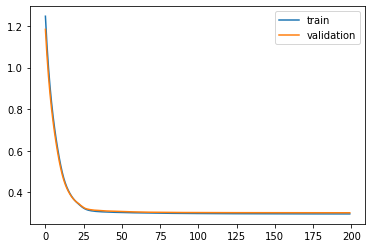

Time to train LSTM:  141.9828748703003


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8d254925f8>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 1.2640 - acc: 0.5041 - val_loss: 1.1904 - val_acc: 0.5294

Epoch 00001: val_loss improved from inf to 1.19035, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 1.1375 - acc: 0.5564 - val_loss: 1.0715 - val_acc: 0.5841

Epoch 00002: val_loss improved from 1.19035 to 1.07152, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 1.0269 - acc: 0.6108 - val_loss: 0.9681 - val_acc: 0.6407

Epoch 00003: val_loss improved from 1.07152 to 0.96809, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 0.9306 - acc: 0.6633 - val_loss: 0.8798 - val_acc: 0.6892

Epoch 00004: val_loss improved from 0.96809 to 0.87980, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 0.8483 - acc: 0.7084 - val_loss: 0.8061 - val_acc: 0.7272

Epoch 00005: val_loss improved from 0.87980 to 0.80614, saving model to Event_val_weights4.hdf5
Epoch 6/200
 - 1s - loss: 0.7788 - acc: 0.7410 - v

 - 1s - loss: 0.3047 - acc: 0.8877 - val_loss: 0.3126 - val_acc: 0.8833

Epoch 00046: val_loss improved from 0.31297 to 0.31257, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.3043 - acc: 0.8876 - val_loss: 0.3122 - val_acc: 0.8831

Epoch 00047: val_loss improved from 0.31257 to 0.31218, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.3041 - acc: 0.8877 - val_loss: 0.3119 - val_acc: 0.8833

Epoch 00048: val_loss improved from 0.31218 to 0.31194, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.3038 - acc: 0.8881 - val_loss: 0.3117 - val_acc: 0.8830

Epoch 00049: val_loss improved from 0.31194 to 0.31167, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3034 - acc: 0.8880 - val_loss: 0.3113 - val_acc: 0.8833

Epoch 00050: val_loss improved from 0.31167 to 0.31134, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.3032 - acc: 0.8881 - val_loss: 0.3112 - val_acc: 0.8831

Epoch 00051: val_


Epoch 00095: val_loss did not improve from 0.30790
Epoch 96/200
 - 1s - loss: 0.2978 - acc: 0.8893 - val_loss: 0.3080 - val_acc: 0.8828

Epoch 00096: val_loss did not improve from 0.30790
Epoch 97/200
 - 1s - loss: 0.2977 - acc: 0.8893 - val_loss: 0.3078 - val_acc: 0.8827

Epoch 00097: val_loss improved from 0.30790 to 0.30779, saving model to Event_val_weights4.hdf5
Epoch 98/200
 - 1s - loss: 0.2977 - acc: 0.8894 - val_loss: 0.3079 - val_acc: 0.8826

Epoch 00098: val_loss did not improve from 0.30779
Epoch 99/200
 - 1s - loss: 0.2977 - acc: 0.8894 - val_loss: 0.3077 - val_acc: 0.8823

Epoch 00099: val_loss improved from 0.30779 to 0.30771, saving model to Event_val_weights4.hdf5
Epoch 100/200
 - 1s - loss: 0.2978 - acc: 0.8892 - val_loss: 0.3079 - val_acc: 0.8827

Epoch 00100: val_loss did not improve from 0.30771
Epoch 101/200
 - 1s - loss: 0.2976 - acc: 0.8893 - val_loss: 0.3076 - val_acc: 0.8822

Epoch 00101: val_loss improved from 0.30771 to 0.30759, saving model to Event_val_wei

 - 1s - loss: 0.2965 - acc: 0.8896 - val_loss: 0.3072 - val_acc: 0.8822

Epoch 00150: val_loss did not improve from 0.30715
Epoch 151/200
 - 1s - loss: 0.2965 - acc: 0.8893 - val_loss: 0.3078 - val_acc: 0.8830

Epoch 00151: val_loss did not improve from 0.30715
Epoch 152/200
 - 1s - loss: 0.2964 - acc: 0.8896 - val_loss: 0.3074 - val_acc: 0.8829

Epoch 00152: val_loss did not improve from 0.30715
Epoch 153/200
 - 1s - loss: 0.2965 - acc: 0.8896 - val_loss: 0.3072 - val_acc: 0.8823

Epoch 00153: val_loss did not improve from 0.30715
Epoch 154/200
 - 1s - loss: 0.2964 - acc: 0.8895 - val_loss: 0.3075 - val_acc: 0.8834

Epoch 00154: val_loss did not improve from 0.30715
Epoch 155/200
 - 1s - loss: 0.2964 - acc: 0.8897 - val_loss: 0.3072 - val_acc: 0.8829

Epoch 00155: val_loss did not improve from 0.30715
Epoch 156/200
 - 1s - loss: 0.2965 - acc: 0.8897 - val_loss: 0.3073 - val_acc: 0.8836

Epoch 00156: val_loss did not improve from 0.30715
Epoch 157/200
 - 1s - loss: 0.2964 - acc: 0.8895

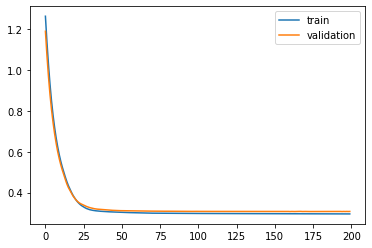

Time to train LSTM:  149.2018268108368
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 1.2691 - acc: 0.5450 - val_loss: 1.1892 - val_acc: 0.5817

Epoch 00001: val_loss improved from inf to 1.18917, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 1.1256 - acc: 0.6075 - val_loss: 1.0628 - val_acc: 0.6352

Epoch 00002: val_loss improved from 1.18917 to 1.06276, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 1.0113 - acc: 0.6572 - val_loss: 0.9603 - val_acc: 0.6794

Epoch 00003: val_loss improved from 1.06276 to 0.96032, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 0.9168 - acc: 0.6995 - val_loss: 0.8751 - val_acc: 0.7166

Epoch 00004: val_loss improved from 0.96032 to 0.87512, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 0.8382 - acc: 0.7309 - val_loss: 0.8033 - val_acc: 0.7390

Epoch 00005: val_loss improved from 0.87512 to 0.80333, saving model to Event_val_weights5.hdf5
Epoch 6/200

 - 1s - loss: 0.3067 - acc: 0.8872 - val_loss: 0.3087 - val_acc: 0.8888

Epoch 00046: val_loss improved from 0.30904 to 0.30875, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.3064 - acc: 0.8873 - val_loss: 0.3085 - val_acc: 0.8889

Epoch 00047: val_loss improved from 0.30875 to 0.30849, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.3061 - acc: 0.8873 - val_loss: 0.3083 - val_acc: 0.8889

Epoch 00048: val_loss improved from 0.30849 to 0.30829, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.3059 - acc: 0.8873 - val_loss: 0.3080 - val_acc: 0.8892

Epoch 00049: val_loss improved from 0.30829 to 0.30802, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3057 - acc: 0.8873 - val_loss: 0.3079 - val_acc: 0.8889

Epoch 00050: val_loss improved from 0.30802 to 0.30790, saving model to Event_val_weights5.hdf5
Epoch 51/200
 - 1s - loss: 0.3055 - acc: 0.8874 - val_loss: 0.3076 - val_acc: 0.8892

Epoch 00051: val_


Epoch 00095: val_loss improved from 0.30454 to 0.30443, saving model to Event_val_weights5.hdf5
Epoch 96/200
 - 1s - loss: 0.3013 - acc: 0.8874 - val_loss: 0.3047 - val_acc: 0.8873

Epoch 00096: val_loss did not improve from 0.30443
Epoch 97/200
 - 1s - loss: 0.3012 - acc: 0.8874 - val_loss: 0.3047 - val_acc: 0.8873

Epoch 00097: val_loss did not improve from 0.30443
Epoch 98/200
 - 1s - loss: 0.3012 - acc: 0.8875 - val_loss: 0.3045 - val_acc: 0.8872

Epoch 00098: val_loss did not improve from 0.30443
Epoch 99/200
 - 1s - loss: 0.3011 - acc: 0.8874 - val_loss: 0.3044 - val_acc: 0.8872

Epoch 00099: val_loss improved from 0.30443 to 0.30440, saving model to Event_val_weights5.hdf5
Epoch 100/200
 - 1s - loss: 0.3010 - acc: 0.8875 - val_loss: 0.3044 - val_acc: 0.8872

Epoch 00100: val_loss did not improve from 0.30440
Epoch 101/200
 - 1s - loss: 0.3010 - acc: 0.8874 - val_loss: 0.3043 - val_acc: 0.8873

Epoch 00101: val_loss improved from 0.30440 to 0.30432, saving model to Event_val_wei

 - 1s - loss: 0.2987 - acc: 0.8876 - val_loss: 0.3039 - val_acc: 0.8862

Epoch 00152: val_loss improved from 0.30404 to 0.30389, saving model to Event_val_weights5.hdf5
Epoch 153/200
 - 1s - loss: 0.2987 - acc: 0.8875 - val_loss: 0.3039 - val_acc: 0.8861

Epoch 00153: val_loss did not improve from 0.30389
Epoch 154/200
 - 1s - loss: 0.2986 - acc: 0.8876 - val_loss: 0.3037 - val_acc: 0.8866

Epoch 00154: val_loss improved from 0.30389 to 0.30374, saving model to Event_val_weights5.hdf5
Epoch 155/200
 - 1s - loss: 0.2985 - acc: 0.8876 - val_loss: 0.3038 - val_acc: 0.8868

Epoch 00155: val_loss did not improve from 0.30374
Epoch 156/200
 - 1s - loss: 0.2985 - acc: 0.8877 - val_loss: 0.3036 - val_acc: 0.8867

Epoch 00156: val_loss improved from 0.30374 to 0.30364, saving model to Event_val_weights5.hdf5
Epoch 157/200
 - 1s - loss: 0.2984 - acc: 0.8879 - val_loss: 0.3037 - val_acc: 0.8866

Epoch 00157: val_loss did not improve from 0.30364
Epoch 158/200
 - 1s - loss: 0.2983 - acc: 0.8878 - 

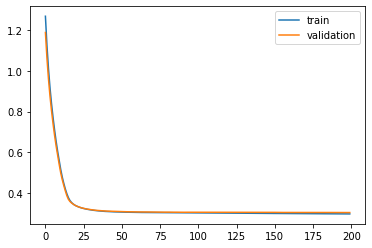

Time to train LSTM:  139.96639704704285
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 1.3006 - acc: 0.5670 - val_loss: 1.2344 - val_acc: 0.5988

Epoch 00001: val_loss improved from inf to 1.23441, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 1.1924 - acc: 0.6065 - val_loss: 1.1335 - val_acc: 0.6424

Epoch 00002: val_loss improved from 1.23441 to 1.13350, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 1.0975 - acc: 0.6431 - val_loss: 1.0450 - val_acc: 0.6839

Epoch 00003: val_loss improved from 1.13350 to 1.04500, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 1.0143 - acc: 0.6767 - val_loss: 0.9672 - val_acc: 0.7134

Epoch 00004: val_loss improved from 1.04500 to 0.96719, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 0.9411 - acc: 0.7065 - val_loss: 0.8985 - val_acc: 0.7377

Epoch 00005: val_loss improved from 0.96719 to 0.89846, saving model to Event_val_weights1.hdf5
Epoch 6/20

 - 1s - loss: 0.3087 - acc: 0.8866 - val_loss: 0.3064 - val_acc: 0.8850

Epoch 00046: val_loss did not improve from 0.30636
Epoch 47/200
 - 1s - loss: 0.3085 - acc: 0.8865 - val_loss: 0.3060 - val_acc: 0.8848

Epoch 00047: val_loss improved from 0.30636 to 0.30601, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3083 - acc: 0.8866 - val_loss: 0.3057 - val_acc: 0.8848

Epoch 00048: val_loss improved from 0.30601 to 0.30573, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.3081 - acc: 0.8865 - val_loss: 0.3054 - val_acc: 0.8848

Epoch 00049: val_loss improved from 0.30573 to 0.30535, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.3079 - acc: 0.8865 - val_loss: 0.3051 - val_acc: 0.8848

Epoch 00050: val_loss improved from 0.30535 to 0.30507, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.3077 - acc: 0.8865 - val_loss: 0.3053 - val_acc: 0.8847

Epoch 00051: val_loss did not improve from 0.30507
Epoch 52/20

 - 1s - loss: 0.3037 - acc: 0.8860 - val_loss: 0.3010 - val_acc: 0.8852

Epoch 00097: val_loss did not improve from 0.30086
Epoch 98/200
 - 1s - loss: 0.3036 - acc: 0.8860 - val_loss: 0.3006 - val_acc: 0.8853

Epoch 00098: val_loss improved from 0.30086 to 0.30062, saving model to Event_val_weights1.hdf5
Epoch 99/200
 - 1s - loss: 0.3036 - acc: 0.8860 - val_loss: 0.3008 - val_acc: 0.8858

Epoch 00099: val_loss did not improve from 0.30062
Epoch 100/200
 - 1s - loss: 0.3035 - acc: 0.8860 - val_loss: 0.3006 - val_acc: 0.8857

Epoch 00100: val_loss improved from 0.30062 to 0.30055, saving model to Event_val_weights1.hdf5
Epoch 101/200
 - 1s - loss: 0.3035 - acc: 0.8859 - val_loss: 0.3008 - val_acc: 0.8858

Epoch 00101: val_loss did not improve from 0.30055
Epoch 102/200
 - 1s - loss: 0.3034 - acc: 0.8860 - val_loss: 0.3005 - val_acc: 0.8856

Epoch 00102: val_loss improved from 0.30055 to 0.30047, saving model to Event_val_weights1.hdf5
Epoch 103/200
 - 1s - loss: 0.3034 - acc: 0.8860 - va

 - 1s - loss: 0.3018 - acc: 0.8867 - val_loss: 0.2991 - val_acc: 0.8863

Epoch 00151: val_loss did not improve from 0.29887
Epoch 152/200
 - 1s - loss: 0.3017 - acc: 0.8870 - val_loss: 0.2989 - val_acc: 0.8872

Epoch 00152: val_loss did not improve from 0.29887
Epoch 153/200
 - 1s - loss: 0.3017 - acc: 0.8868 - val_loss: 0.2990 - val_acc: 0.8863

Epoch 00153: val_loss did not improve from 0.29887
Epoch 154/200
 - 1s - loss: 0.3016 - acc: 0.8869 - val_loss: 0.2989 - val_acc: 0.8873

Epoch 00154: val_loss did not improve from 0.29887
Epoch 155/200
 - 1s - loss: 0.3016 - acc: 0.8867 - val_loss: 0.2991 - val_acc: 0.8868

Epoch 00155: val_loss did not improve from 0.29887
Epoch 156/200
 - 1s - loss: 0.3015 - acc: 0.8870 - val_loss: 0.2988 - val_acc: 0.8874

Epoch 00156: val_loss improved from 0.29887 to 0.29882, saving model to Event_val_weights1.hdf5
Epoch 157/200
 - 1s - loss: 0.3015 - acc: 0.8868 - val_loss: 0.2990 - val_acc: 0.8869

Epoch 00157: val_loss did not improve from 0.29882
Epo

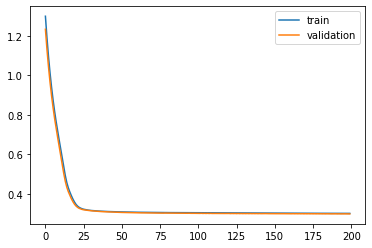

Time to train LSTM:  142.98070812225342
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 1.3532 - acc: 0.4722 - val_loss: 1.2766 - val_acc: 0.5013

Epoch 00001: val_loss improved from inf to 1.27655, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 1.2221 - acc: 0.5251 - val_loss: 1.1558 - val_acc: 0.5552

Epoch 00002: val_loss improved from 1.27655 to 1.15577, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 1.1084 - acc: 0.5796 - val_loss: 1.0514 - val_acc: 0.6100

Epoch 00003: val_loss improved from 1.15577 to 1.05143, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 1.0104 - acc: 0.6310 - val_loss: 0.9619 - val_acc: 0.6571

Epoch 00004: val_loss improved from 1.05143 to 0.96193, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 0.9261 - acc: 0.6729 - val_loss: 0.8849 - val_acc: 0.6893

Epoch 00005: val_loss improved from 0.96193 to 0.88490, saving model to Event_val_weights2.hdf5
Epoch 6/20

 - 1s - loss: 0.3088 - acc: 0.8871 - val_loss: 0.3171 - val_acc: 0.8821

Epoch 00046: val_loss improved from 0.31761 to 0.31714, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.3085 - acc: 0.8871 - val_loss: 0.3170 - val_acc: 0.8817

Epoch 00047: val_loss improved from 0.31714 to 0.31702, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.3082 - acc: 0.8870 - val_loss: 0.3167 - val_acc: 0.8823

Epoch 00048: val_loss improved from 0.31702 to 0.31669, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.3078 - acc: 0.8871 - val_loss: 0.3165 - val_acc: 0.8818

Epoch 00049: val_loss improved from 0.31669 to 0.31651, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.3076 - acc: 0.8871 - val_loss: 0.3159 - val_acc: 0.8827

Epoch 00050: val_loss improved from 0.31651 to 0.31592, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.3073 - acc: 0.8871 - val_loss: 0.3159 - val_acc: 0.8817

Epoch 00051: val_

 - 1s - loss: 0.3015 - acc: 0.8878 - val_loss: 0.3100 - val_acc: 0.8841

Epoch 00094: val_loss improved from 0.31011 to 0.30998, saving model to Event_val_weights2.hdf5
Epoch 95/200
 - 1s - loss: 0.3014 - acc: 0.8878 - val_loss: 0.3099 - val_acc: 0.8841

Epoch 00095: val_loss improved from 0.30998 to 0.30990, saving model to Event_val_weights2.hdf5
Epoch 96/200
 - 1s - loss: 0.3013 - acc: 0.8878 - val_loss: 0.3099 - val_acc: 0.8844

Epoch 00096: val_loss did not improve from 0.30990
Epoch 97/200
 - 1s - loss: 0.3013 - acc: 0.8878 - val_loss: 0.3097 - val_acc: 0.8840

Epoch 00097: val_loss improved from 0.30990 to 0.30973, saving model to Event_val_weights2.hdf5
Epoch 98/200
 - 1s - loss: 0.3012 - acc: 0.8879 - val_loss: 0.3097 - val_acc: 0.8842

Epoch 00098: val_loss improved from 0.30973 to 0.30971, saving model to Event_val_weights2.hdf5
Epoch 99/200
 - 1s - loss: 0.3011 - acc: 0.8878 - val_loss: 0.3097 - val_acc: 0.8840

Epoch 00099: val_loss improved from 0.30971 to 0.30965, saving


Epoch 00141: val_loss improved from 0.30785 to 0.30781, saving model to Event_val_weights2.hdf5
Epoch 142/200
 - 1s - loss: 0.2992 - acc: 0.8881 - val_loss: 0.3077 - val_acc: 0.8841

Epoch 00142: val_loss improved from 0.30781 to 0.30768, saving model to Event_val_weights2.hdf5
Epoch 143/200
 - 1s - loss: 0.2992 - acc: 0.8882 - val_loss: 0.3077 - val_acc: 0.8843

Epoch 00143: val_loss improved from 0.30768 to 0.30767, saving model to Event_val_weights2.hdf5
Epoch 144/200
 - 1s - loss: 0.2991 - acc: 0.8882 - val_loss: 0.3076 - val_acc: 0.8841

Epoch 00144: val_loss improved from 0.30767 to 0.30765, saving model to Event_val_weights2.hdf5
Epoch 145/200
 - 1s - loss: 0.2991 - acc: 0.8882 - val_loss: 0.3077 - val_acc: 0.8841

Epoch 00145: val_loss did not improve from 0.30765
Epoch 146/200
 - 1s - loss: 0.2990 - acc: 0.8882 - val_loss: 0.3076 - val_acc: 0.8838

Epoch 00146: val_loss improved from 0.30765 to 0.30764, saving model to Event_val_weights2.hdf5
Epoch 147/200
 - 1s - loss: 0.299


Epoch 00189: val_loss improved from 0.30563 to 0.30551, saving model to Event_val_weights2.hdf5
Epoch 190/200
 - 1s - loss: 0.2967 - acc: 0.8887 - val_loss: 0.3054 - val_acc: 0.8854

Epoch 00190: val_loss improved from 0.30551 to 0.30542, saving model to Event_val_weights2.hdf5
Epoch 191/200
 - 1s - loss: 0.2967 - acc: 0.8888 - val_loss: 0.3054 - val_acc: 0.8854

Epoch 00191: val_loss improved from 0.30542 to 0.30536, saving model to Event_val_weights2.hdf5
Epoch 192/200
 - 1s - loss: 0.2966 - acc: 0.8887 - val_loss: 0.3052 - val_acc: 0.8852

Epoch 00192: val_loss improved from 0.30536 to 0.30524, saving model to Event_val_weights2.hdf5
Epoch 193/200
 - 1s - loss: 0.2966 - acc: 0.8888 - val_loss: 0.3051 - val_acc: 0.8851

Epoch 00193: val_loss improved from 0.30524 to 0.30515, saving model to Event_val_weights2.hdf5
Epoch 194/200
 - 1s - loss: 0.2965 - acc: 0.8889 - val_loss: 0.3052 - val_acc: 0.8856

Epoch 00194: val_loss did not improve from 0.30515
Epoch 195/200
 - 1s - loss: 0.296

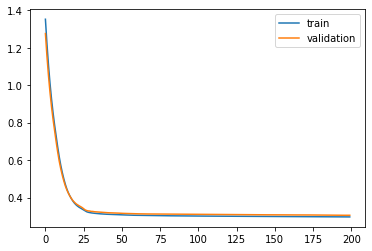

Time to train LSTM:  143.86600756645203
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 1.3029 - acc: 0.5281 - val_loss: 1.2334 - val_acc: 0.5581

Epoch 00001: val_loss improved from inf to 1.23343, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 1.1854 - acc: 0.5804 - val_loss: 1.1243 - val_acc: 0.6117

Epoch 00002: val_loss improved from 1.23343 to 1.12427, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 1.0822 - acc: 0.6326 - val_loss: 1.0286 - val_acc: 0.6590

Epoch 00003: val_loss improved from 1.12427 to 1.02863, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 0.9914 - acc: 0.6781 - val_loss: 0.9441 - val_acc: 0.6992

Epoch 00004: val_loss improved from 1.02863 to 0.94412, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 0.9110 - acc: 0.7126 - val_loss: 0.8692 - val_acc: 0.7277

Epoch 00005: val_loss improved from 0.94412 to 0.86924, saving model to Event_val_weights3.hdf5
Epoch 6/20

 - 1s - loss: 0.3066 - acc: 0.8880 - val_loss: 0.3089 - val_acc: 0.8871

Epoch 00046: val_loss improved from 0.30920 to 0.30887, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3062 - acc: 0.8881 - val_loss: 0.3085 - val_acc: 0.8873

Epoch 00047: val_loss improved from 0.30887 to 0.30854, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.3059 - acc: 0.8880 - val_loss: 0.3082 - val_acc: 0.8871

Epoch 00048: val_loss improved from 0.30854 to 0.30821, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.3055 - acc: 0.8880 - val_loss: 0.3079 - val_acc: 0.8871

Epoch 00049: val_loss improved from 0.30821 to 0.30792, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.3052 - acc: 0.8881 - val_loss: 0.3076 - val_acc: 0.8870

Epoch 00050: val_loss improved from 0.30792 to 0.30765, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3049 - acc: 0.8881 - val_loss: 0.3074 - val_acc: 0.8870

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30281 to 0.30280, saving model to Event_val_weights3.hdf5
Epoch 92/200
 - 1s - loss: 0.2985 - acc: 0.8884 - val_loss: 0.3028 - val_acc: 0.8874

Epoch 00092: val_loss improved from 0.30280 to 0.30280, saving model to Event_val_weights3.hdf5
Epoch 93/200
 - 1s - loss: 0.2984 - acc: 0.8884 - val_loss: 0.3027 - val_acc: 0.8873

Epoch 00093: val_loss improved from 0.30280 to 0.30274, saving model to Event_val_weights3.hdf5
Epoch 94/200
 - 1s - loss: 0.2983 - acc: 0.8884 - val_loss: 0.3027 - val_acc: 0.8874

Epoch 00094: val_loss improved from 0.30274 to 0.30265, saving model to Event_val_weights3.hdf5
Epoch 95/200
 - 1s - loss: 0.2982 - acc: 0.8885 - val_loss: 0.3027 - val_acc: 0.8874

Epoch 00095: val_loss did not improve from 0.30265
Epoch 96/200
 - 1s - loss: 0.2982 - acc: 0.8885 - val_loss: 0.3027 - val_acc: 0.8877

Epoch 00096: val_loss did not improve from 0.30265
Epoch 97/200
 - 1s - loss: 0.2982 - acc: 0.8884 - val_loss: 0.3027 - val_acc: 0.887


Epoch 00141: val_loss improved from 0.30189 to 0.30188, saving model to Event_val_weights3.hdf5
Epoch 142/200
 - 1s - loss: 0.2970 - acc: 0.8882 - val_loss: 0.3019 - val_acc: 0.8881

Epoch 00142: val_loss did not improve from 0.30188
Epoch 143/200
 - 1s - loss: 0.2969 - acc: 0.8883 - val_loss: 0.3019 - val_acc: 0.8881

Epoch 00143: val_loss did not improve from 0.30188
Epoch 144/200
 - 1s - loss: 0.2969 - acc: 0.8882 - val_loss: 0.3018 - val_acc: 0.8881

Epoch 00144: val_loss improved from 0.30188 to 0.30182, saving model to Event_val_weights3.hdf5
Epoch 145/200
 - 1s - loss: 0.2969 - acc: 0.8883 - val_loss: 0.3018 - val_acc: 0.8881

Epoch 00145: val_loss improved from 0.30182 to 0.30181, saving model to Event_val_weights3.hdf5
Epoch 146/200
 - 1s - loss: 0.2969 - acc: 0.8881 - val_loss: 0.3018 - val_acc: 0.8881

Epoch 00146: val_loss did not improve from 0.30181
Epoch 147/200
 - 1s - loss: 0.2970 - acc: 0.8881 - val_loss: 0.3019 - val_acc: 0.8880

Epoch 00147: val_loss did not improv

 - 1s - loss: 0.2964 - acc: 0.8879 - val_loss: 0.3018 - val_acc: 0.8886

Epoch 00199: val_loss did not improve from 0.30172
Epoch 200/200
 - 1s - loss: 0.2964 - acc: 0.8879 - val_loss: 0.3018 - val_acc: 0.8886

Epoch 00200: val_loss did not improve from 0.30172
#################################
Number of units: 4
Batch size: 8192
Fold: 2
L2_1: 0.08163673116125404
best val loss: 0.3017249390019311
#################################


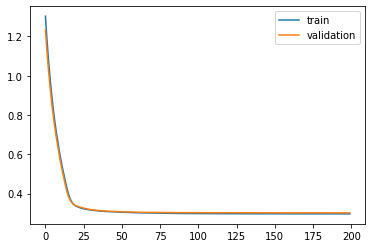

Time to train LSTM:  143.97904777526855
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 1.2985 - acc: 0.5665 - val_loss: 1.2227 - val_acc: 0.6067

Epoch 00001: val_loss improved from inf to 1.22271, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 1.1578 - acc: 0.6482 - val_loss: 1.0935 - val_acc: 0.6798

Epoch 00002: val_loss improved from 1.22271 to 1.09346, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 1.0378 - acc: 0.7099 - val_loss: 0.9837 - val_acc: 0.7234

Epoch 00003: val_loss improved from 1.09346 to 0.98370, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 0.9359 - acc: 0.7458 - val_loss: 0.8902 - val_acc: 0.7479

Epoch 00004: val_loss improved from 0.98370 to 0.89023, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 0.8489 - acc: 0.7669 - val_loss: 0.8109 - val_acc: 0.7641

Epoch 00005: val_loss improved from 0.89023 to 0.81088, saving model to Event_val_weights4.hdf5
Epoch 6/20

 - 1s - loss: 0.3009 - acc: 0.8890 - val_loss: 0.3106 - val_acc: 0.8811

Epoch 00046: val_loss did not improve from 0.31057
Epoch 47/200
 - 1s - loss: 0.3008 - acc: 0.8888 - val_loss: 0.3105 - val_acc: 0.8812

Epoch 00047: val_loss improved from 0.31057 to 0.31053, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.3007 - acc: 0.8888 - val_loss: 0.3105 - val_acc: 0.8808

Epoch 00048: val_loss improved from 0.31053 to 0.31051, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.3006 - acc: 0.8888 - val_loss: 0.3105 - val_acc: 0.8808

Epoch 00049: val_loss did not improve from 0.31051
Epoch 50/200
 - 1s - loss: 0.3005 - acc: 0.8888 - val_loss: 0.3106 - val_acc: 0.8803

Epoch 00050: val_loss did not improve from 0.31051
Epoch 51/200
 - 1s - loss: 0.3005 - acc: 0.8887 - val_loss: 0.3105 - val_acc: 0.8806

Epoch 00051: val_loss did not improve from 0.31051
Epoch 52/200
 - 1s - loss: 0.3004 - acc: 0.8888 - val_loss: 0.3105 - val_acc: 0.8802

Epoch 00052: va


Epoch 00099: val_loss did not improve from 0.30981
Epoch 100/200
 - 1s - loss: 0.2984 - acc: 0.8888 - val_loss: 0.3098 - val_acc: 0.8807

Epoch 00100: val_loss improved from 0.30981 to 0.30978, saving model to Event_val_weights4.hdf5
Epoch 101/200
 - 1s - loss: 0.2984 - acc: 0.8886 - val_loss: 0.3098 - val_acc: 0.8807

Epoch 00101: val_loss did not improve from 0.30978
Epoch 102/200
 - 1s - loss: 0.2984 - acc: 0.8887 - val_loss: 0.3098 - val_acc: 0.8809

Epoch 00102: val_loss improved from 0.30978 to 0.30975, saving model to Event_val_weights4.hdf5
Epoch 103/200
 - 1s - loss: 0.2983 - acc: 0.8886 - val_loss: 0.3098 - val_acc: 0.8809

Epoch 00103: val_loss did not improve from 0.30975
Epoch 104/200
 - 1s - loss: 0.2983 - acc: 0.8887 - val_loss: 0.3097 - val_acc: 0.8810

Epoch 00104: val_loss improved from 0.30975 to 0.30971, saving model to Event_val_weights4.hdf5
Epoch 105/200
 - 1s - loss: 0.2983 - acc: 0.8886 - val_loss: 0.3098 - val_acc: 0.8809

Epoch 00105: val_loss did not improv


Epoch 00150: val_loss improved from 0.30873 to 0.30869, saving model to Event_val_weights4.hdf5
Epoch 151/200
 - 1s - loss: 0.2971 - acc: 0.8888 - val_loss: 0.3087 - val_acc: 0.8818

Epoch 00151: val_loss did not improve from 0.30869
Epoch 152/200
 - 1s - loss: 0.2971 - acc: 0.8891 - val_loss: 0.3086 - val_acc: 0.8813

Epoch 00152: val_loss improved from 0.30869 to 0.30863, saving model to Event_val_weights4.hdf5
Epoch 153/200
 - 1s - loss: 0.2971 - acc: 0.8889 - val_loss: 0.3088 - val_acc: 0.8817

Epoch 00153: val_loss did not improve from 0.30863
Epoch 154/200
 - 1s - loss: 0.2971 - acc: 0.8891 - val_loss: 0.3086 - val_acc: 0.8814

Epoch 00154: val_loss improved from 0.30863 to 0.30863, saving model to Event_val_weights4.hdf5
Epoch 155/200
 - 1s - loss: 0.2971 - acc: 0.8888 - val_loss: 0.3087 - val_acc: 0.8818

Epoch 00155: val_loss did not improve from 0.30863
Epoch 156/200
 - 1s - loss: 0.2970 - acc: 0.8891 - val_loss: 0.3086 - val_acc: 0.8816

Epoch 00156: val_loss improved from 

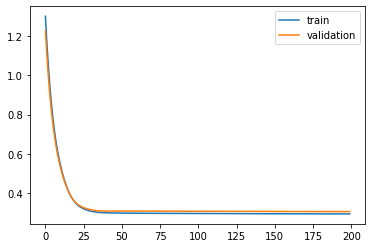

Time to train LSTM:  144.7325689792633


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8b6054d940>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 1.3746 - acc: 0.4935 - val_loss: 1.3000 - val_acc: 0.5239

Epoch 00001: val_loss improved from inf to 1.29999, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 1.2411 - acc: 0.5457 - val_loss: 1.1762 - val_acc: 0.5736

Epoch 00002: val_loss improved from 1.29999 to 1.17622, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 1.1248 - acc: 0.5962 - val_loss: 1.0687 - val_acc: 0.6206

Epoch 00003: val_loss improved from 1.17622 to 1.06870, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 1.0237 - acc: 0.6392 - val_loss: 0.9752 - val_acc: 0.6607

Epoch 00004: val_loss improved from 1.06870 to 0.97521, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 0.9358 - acc: 0.6738 - val_loss: 0.8939 - val_acc: 0.6914

Epoch 00005: val_loss improved from 0.97521 to 0.89391, saving model to Event_val_weights5.hdf5
Epoch 6/200
 - 1s - loss: 0.8592 - acc: 0.7038 - v

 - 1s - loss: 0.3032 - acc: 0.8874 - val_loss: 0.3054 - val_acc: 0.8874

Epoch 00046: val_loss improved from 0.30558 to 0.30545, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.3030 - acc: 0.8874 - val_loss: 0.3053 - val_acc: 0.8876

Epoch 00047: val_loss improved from 0.30545 to 0.30533, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.3029 - acc: 0.8875 - val_loss: 0.3052 - val_acc: 0.8874

Epoch 00048: val_loss improved from 0.30533 to 0.30522, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.3027 - acc: 0.8875 - val_loss: 0.3051 - val_acc: 0.8873

Epoch 00049: val_loss improved from 0.30522 to 0.30513, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3026 - acc: 0.8876 - val_loss: 0.3050 - val_acc: 0.8872

Epoch 00050: val_loss improved from 0.30513 to 0.30505, saving model to Event_val_weights5.hdf5
Epoch 51/200
 - 1s - loss: 0.3025 - acc: 0.8876 - val_loss: 0.3050 - val_acc: 0.8870

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30398 to 0.30397, saving model to Event_val_weights5.hdf5
Epoch 92/200
 - 1s - loss: 0.3005 - acc: 0.8882 - val_loss: 0.3040 - val_acc: 0.8874

Epoch 00092: val_loss improved from 0.30397 to 0.30396, saving model to Event_val_weights5.hdf5
Epoch 93/200
 - 1s - loss: 0.3005 - acc: 0.8883 - val_loss: 0.3040 - val_acc: 0.8874

Epoch 00093: val_loss improved from 0.30396 to 0.30396, saving model to Event_val_weights5.hdf5
Epoch 94/200
 - 1s - loss: 0.3004 - acc: 0.8883 - val_loss: 0.3040 - val_acc: 0.8873

Epoch 00094: val_loss improved from 0.30396 to 0.30395, saving model to Event_val_weights5.hdf5
Epoch 95/200
 - 1s - loss: 0.3004 - acc: 0.8883 - val_loss: 0.3039 - val_acc: 0.8872

Epoch 00095: val_loss improved from 0.30395 to 0.30395, saving model to Event_val_weights5.hdf5
Epoch 96/200
 - 1s - loss: 0.3004 - acc: 0.8883 - val_loss: 0.3039 - val_acc: 0.8872

Epoch 00096: val_loss improved from 0.30395 to 0.30395, saving model to Event_val_weights


Epoch 00146: val_loss did not improve from 0.30389
Epoch 147/200
 - 1s - loss: 0.2982 - acc: 0.8883 - val_loss: 0.3040 - val_acc: 0.8863

Epoch 00147: val_loss did not improve from 0.30389
Epoch 148/200
 - 1s - loss: 0.2982 - acc: 0.8884 - val_loss: 0.3043 - val_acc: 0.8863

Epoch 00148: val_loss did not improve from 0.30389
Epoch 149/200
 - 1s - loss: 0.2982 - acc: 0.8884 - val_loss: 0.3041 - val_acc: 0.8863

Epoch 00149: val_loss did not improve from 0.30389
Epoch 150/200
 - 1s - loss: 0.2982 - acc: 0.8883 - val_loss: 0.3042 - val_acc: 0.8861

Epoch 00150: val_loss did not improve from 0.30389
Epoch 151/200
 - 1s - loss: 0.2982 - acc: 0.8884 - val_loss: 0.3041 - val_acc: 0.8861

Epoch 00151: val_loss did not improve from 0.30389
Epoch 152/200
 - 1s - loss: 0.2982 - acc: 0.8884 - val_loss: 0.3042 - val_acc: 0.8863

Epoch 00152: val_loss did not improve from 0.30389
Epoch 153/200
 - 1s - loss: 0.2981 - acc: 0.8884 - val_loss: 0.3041 - val_acc: 0.8860

Epoch 00153: val_loss did not imp

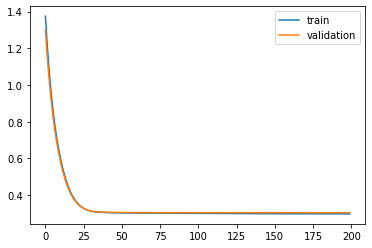

Time to train LSTM:  151.63759779930115
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 1.3814 - acc: 0.5036 - val_loss: 1.2630 - val_acc: 0.5478

Epoch 00001: val_loss improved from inf to 1.26298, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 1.1843 - acc: 0.5862 - val_loss: 1.0981 - val_acc: 0.6279

Epoch 00002: val_loss improved from 1.26298 to 1.09809, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 1.0461 - acc: 0.6568 - val_loss: 0.9812 - val_acc: 0.6901

Epoch 00003: val_loss improved from 1.09809 to 0.98120, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 0.9439 - acc: 0.7035 - val_loss: 0.8890 - val_acc: 0.7306

Epoch 00004: val_loss improved from 0.98120 to 0.88903, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 0.8601 - acc: 0.7361 - val_loss: 0.8110 - val_acc: 0.7556

Epoch 00005: val_loss improved from 0.88903 to 0.81100, saving model to Event_val_weights1.hdf5
Epoch 6/20

 - 1s - loss: 0.3030 - acc: 0.8881 - val_loss: 0.2998 - val_acc: 0.8868

Epoch 00046: val_loss improved from 0.29987 to 0.29984, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.3028 - acc: 0.8882 - val_loss: 0.2996 - val_acc: 0.8866

Epoch 00047: val_loss improved from 0.29984 to 0.29964, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3027 - acc: 0.8881 - val_loss: 0.2997 - val_acc: 0.8868

Epoch 00048: val_loss did not improve from 0.29964
Epoch 49/200
 - 1s - loss: 0.3026 - acc: 0.8882 - val_loss: 0.2995 - val_acc: 0.8867

Epoch 00049: val_loss improved from 0.29964 to 0.29945, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.3025 - acc: 0.8881 - val_loss: 0.2994 - val_acc: 0.8869

Epoch 00050: val_loss improved from 0.29945 to 0.29943, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.3024 - acc: 0.8882 - val_loss: 0.2992 - val_acc: 0.8867

Epoch 00051: val_loss improved from 0.29943 to 0.29924, saving


Epoch 00095: val_loss improved from 0.29701 to 0.29696, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.3003 - acc: 0.8877 - val_loss: 0.2970 - val_acc: 0.8878

Epoch 00096: val_loss did not improve from 0.29696
Epoch 97/200
 - 1s - loss: 0.3003 - acc: 0.8876 - val_loss: 0.2969 - val_acc: 0.8877

Epoch 00097: val_loss improved from 0.29696 to 0.29690, saving model to Event_val_weights1.hdf5
Epoch 98/200
 - 1s - loss: 0.3003 - acc: 0.8877 - val_loss: 0.2969 - val_acc: 0.8878

Epoch 00098: val_loss improved from 0.29690 to 0.29686, saving model to Event_val_weights1.hdf5
Epoch 99/200
 - 1s - loss: 0.3003 - acc: 0.8876 - val_loss: 0.2968 - val_acc: 0.8879

Epoch 00099: val_loss improved from 0.29686 to 0.29682, saving model to Event_val_weights1.hdf5
Epoch 100/200
 - 1s - loss: 0.3002 - acc: 0.8877 - val_loss: 0.2968 - val_acc: 0.8880

Epoch 00100: val_loss improved from 0.29682 to 0.29680, saving model to Event_val_weights1.hdf5
Epoch 101/200
 - 1s - loss: 0.3002 - 

 - 1s - loss: 0.2992 - acc: 0.8877 - val_loss: 0.2958 - val_acc: 0.8878

Epoch 00141: val_loss improved from 0.29586 to 0.29585, saving model to Event_val_weights1.hdf5
Epoch 142/200
 - 1s - loss: 0.2992 - acc: 0.8876 - val_loss: 0.2958 - val_acc: 0.8879

Epoch 00142: val_loss improved from 0.29585 to 0.29583, saving model to Event_val_weights1.hdf5
Epoch 143/200
 - 1s - loss: 0.2992 - acc: 0.8877 - val_loss: 0.2958 - val_acc: 0.8879

Epoch 00143: val_loss improved from 0.29583 to 0.29582, saving model to Event_val_weights1.hdf5
Epoch 144/200
 - 1s - loss: 0.2992 - acc: 0.8877 - val_loss: 0.2958 - val_acc: 0.8879

Epoch 00144: val_loss improved from 0.29582 to 0.29579, saving model to Event_val_weights1.hdf5
Epoch 145/200
 - 1s - loss: 0.2991 - acc: 0.8877 - val_loss: 0.2958 - val_acc: 0.8880

Epoch 00145: val_loss improved from 0.29579 to 0.29579, saving model to Event_val_weights1.hdf5
Epoch 146/200
 - 1s - loss: 0.2991 - acc: 0.8877 - val_loss: 0.2958 - val_acc: 0.8881

Epoch 00146:

 - 1s - loss: 0.2980 - acc: 0.8878 - val_loss: 0.2949 - val_acc: 0.8883

Epoch 00188: val_loss did not improve from 0.29490
Epoch 189/200
 - 1s - loss: 0.2980 - acc: 0.8879 - val_loss: 0.2948 - val_acc: 0.8884

Epoch 00189: val_loss improved from 0.29490 to 0.29481, saving model to Event_val_weights1.hdf5
Epoch 190/200
 - 1s - loss: 0.2980 - acc: 0.8879 - val_loss: 0.2949 - val_acc: 0.8886

Epoch 00190: val_loss did not improve from 0.29481
Epoch 191/200
 - 1s - loss: 0.2979 - acc: 0.8879 - val_loss: 0.2948 - val_acc: 0.8886

Epoch 00191: val_loss did not improve from 0.29481
Epoch 192/200
 - 1s - loss: 0.2979 - acc: 0.8879 - val_loss: 0.2948 - val_acc: 0.8886

Epoch 00192: val_loss improved from 0.29481 to 0.29480, saving model to Event_val_weights1.hdf5
Epoch 193/200
 - 1s - loss: 0.2979 - acc: 0.8879 - val_loss: 0.2948 - val_acc: 0.8887

Epoch 00193: val_loss did not improve from 0.29480
Epoch 194/200
 - 1s - loss: 0.2979 - acc: 0.8879 - val_loss: 0.2948 - val_acc: 0.8887

Epoch 001

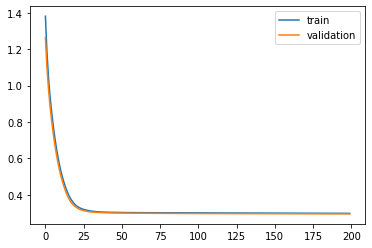

Time to train LSTM:  141.39377784729004
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 1.2926 - acc: 0.5210 - val_loss: 1.1936 - val_acc: 0.5720

Epoch 00001: val_loss improved from inf to 1.19358, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 1.1434 - acc: 0.6025 - val_loss: 1.0711 - val_acc: 0.6471

Epoch 00002: val_loss improved from 1.19358 to 1.07106, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 1.0306 - acc: 0.6668 - val_loss: 0.9725 - val_acc: 0.6963

Epoch 00003: val_loss improved from 1.07106 to 0.97251, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 0.9374 - acc: 0.7085 - val_loss: 0.8887 - val_acc: 0.7290

Epoch 00004: val_loss improved from 0.97251 to 0.88871, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 0.8558 - acc: 0.7371 - val_loss: 0.8152 - val_acc: 0.7489

Epoch 00005: val_loss improved from 0.88871 to 0.81519, saving model to Event_val_weights2.hdf5
Epoch 6/20

 - 1s - loss: 0.3025 - acc: 0.8885 - val_loss: 0.3121 - val_acc: 0.8814

Epoch 00046: val_loss improved from 0.31235 to 0.31208, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.3023 - acc: 0.8883 - val_loss: 0.3119 - val_acc: 0.8812

Epoch 00047: val_loss improved from 0.31208 to 0.31190, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.3021 - acc: 0.8886 - val_loss: 0.3116 - val_acc: 0.8814

Epoch 00048: val_loss improved from 0.31190 to 0.31161, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.3019 - acc: 0.8885 - val_loss: 0.3115 - val_acc: 0.8816

Epoch 00049: val_loss improved from 0.31161 to 0.31147, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.3018 - acc: 0.8886 - val_loss: 0.3113 - val_acc: 0.8814

Epoch 00050: val_loss improved from 0.31147 to 0.31126, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.3016 - acc: 0.8884 - val_loss: 0.3111 - val_acc: 0.8818

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30786 to 0.30779, saving model to Event_val_weights2.hdf5
Epoch 92/200
 - 1s - loss: 0.2986 - acc: 0.8888 - val_loss: 0.3077 - val_acc: 0.8818

Epoch 00092: val_loss improved from 0.30779 to 0.30773, saving model to Event_val_weights2.hdf5
Epoch 93/200
 - 1s - loss: 0.2985 - acc: 0.8888 - val_loss: 0.3076 - val_acc: 0.8817

Epoch 00093: val_loss improved from 0.30773 to 0.30765, saving model to Event_val_weights2.hdf5
Epoch 94/200
 - 1s - loss: 0.2985 - acc: 0.8889 - val_loss: 0.3076 - val_acc: 0.8819

Epoch 00094: val_loss improved from 0.30765 to 0.30759, saving model to Event_val_weights2.hdf5
Epoch 95/200
 - 1s - loss: 0.2984 - acc: 0.8888 - val_loss: 0.3075 - val_acc: 0.8820

Epoch 00095: val_loss improved from 0.30759 to 0.30751, saving model to Event_val_weights2.hdf5
Epoch 96/200
 - 1s - loss: 0.2984 - acc: 0.8889 - val_loss: 0.3075 - val_acc: 0.8821

Epoch 00096: val_loss improved from 0.30751 to 0.30746, saving model to Event_val_weights

 - 1s - loss: 0.2968 - acc: 0.8893 - val_loss: 0.3054 - val_acc: 0.8840

Epoch 00139: val_loss improved from 0.30542 to 0.30537, saving model to Event_val_weights2.hdf5
Epoch 140/200
 - 1s - loss: 0.2967 - acc: 0.8892 - val_loss: 0.3054 - val_acc: 0.8840

Epoch 00140: val_loss improved from 0.30537 to 0.30536, saving model to Event_val_weights2.hdf5
Epoch 141/200
 - 1s - loss: 0.2967 - acc: 0.8892 - val_loss: 0.3053 - val_acc: 0.8841

Epoch 00141: val_loss improved from 0.30536 to 0.30533, saving model to Event_val_weights2.hdf5
Epoch 142/200
 - 1s - loss: 0.2967 - acc: 0.8892 - val_loss: 0.3053 - val_acc: 0.8840

Epoch 00142: val_loss improved from 0.30533 to 0.30530, saving model to Event_val_weights2.hdf5
Epoch 143/200
 - 1s - loss: 0.2967 - acc: 0.8892 - val_loss: 0.3053 - val_acc: 0.8843

Epoch 00143: val_loss improved from 0.30530 to 0.30529, saving model to Event_val_weights2.hdf5
Epoch 144/200
 - 1s - loss: 0.2966 - acc: 0.8891 - val_loss: 0.3052 - val_acc: 0.8839

Epoch 00144:


Epoch 00189: val_loss did not improve from 0.30458
Epoch 190/200
 - 1s - loss: 0.2956 - acc: 0.8894 - val_loss: 0.3046 - val_acc: 0.8849

Epoch 00190: val_loss did not improve from 0.30458
Epoch 191/200
 - 1s - loss: 0.2956 - acc: 0.8894 - val_loss: 0.3046 - val_acc: 0.8848

Epoch 00191: val_loss did not improve from 0.30458
Epoch 192/200
 - 1s - loss: 0.2956 - acc: 0.8894 - val_loss: 0.3046 - val_acc: 0.8848

Epoch 00192: val_loss did not improve from 0.30458
Epoch 193/200
 - 1s - loss: 0.2956 - acc: 0.8894 - val_loss: 0.3046 - val_acc: 0.8847

Epoch 00193: val_loss improved from 0.30458 to 0.30457, saving model to Event_val_weights2.hdf5
Epoch 194/200
 - 1s - loss: 0.2955 - acc: 0.8893 - val_loss: 0.3046 - val_acc: 0.8846

Epoch 00194: val_loss did not improve from 0.30457
Epoch 195/200
 - 1s - loss: 0.2955 - acc: 0.8894 - val_loss: 0.3046 - val_acc: 0.8846

Epoch 00195: val_loss did not improve from 0.30457
Epoch 196/200
 - 1s - loss: 0.2955 - acc: 0.8894 - val_loss: 0.3045 - val_a

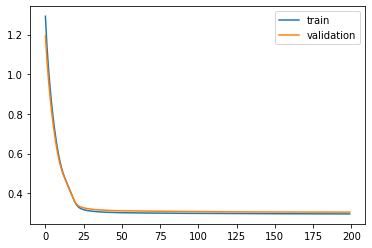

Time to train LSTM:  144.58415842056274
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 1.1901 - acc: 0.5187 - val_loss: 1.1306 - val_acc: 0.5523

Epoch 00001: val_loss improved from inf to 1.13064, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 1.0897 - acc: 0.5758 - val_loss: 1.0385 - val_acc: 0.6024

Epoch 00002: val_loss improved from 1.13064 to 1.03846, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 1.0021 - acc: 0.6229 - val_loss: 0.9568 - val_acc: 0.6511

Epoch 00003: val_loss improved from 1.03846 to 0.95677, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 0.9233 - acc: 0.6665 - val_loss: 0.8823 - val_acc: 0.6878

Epoch 00004: val_loss improved from 0.95677 to 0.88233, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 0.8508 - acc: 0.7056 - val_loss: 0.8139 - val_acc: 0.7189

Epoch 00005: val_loss improved from 0.88233 to 0.81388, saving model to Event_val_weights3.hdf5
Epoch 6/20

 - 1s - loss: 0.3112 - acc: 0.8874 - val_loss: 0.3138 - val_acc: 0.8848

Epoch 00046: val_loss improved from 0.31425 to 0.31378, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3108 - acc: 0.8874 - val_loss: 0.3134 - val_acc: 0.8846

Epoch 00047: val_loss improved from 0.31378 to 0.31338, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.3104 - acc: 0.8874 - val_loss: 0.3130 - val_acc: 0.8849

Epoch 00048: val_loss improved from 0.31338 to 0.31299, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.3101 - acc: 0.8874 - val_loss: 0.3126 - val_acc: 0.8848

Epoch 00049: val_loss improved from 0.31299 to 0.31264, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.3098 - acc: 0.8873 - val_loss: 0.3123 - val_acc: 0.8848

Epoch 00050: val_loss improved from 0.31264 to 0.31226, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3095 - acc: 0.8874 - val_loss: 0.3119 - val_acc: 0.8848

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30554 to 0.30547, saving model to Event_val_weights3.hdf5
Epoch 92/200
 - 1s - loss: 0.3033 - acc: 0.8872 - val_loss: 0.3054 - val_acc: 0.8859

Epoch 00092: val_loss improved from 0.30547 to 0.30542, saving model to Event_val_weights3.hdf5
Epoch 93/200
 - 1s - loss: 0.3032 - acc: 0.8872 - val_loss: 0.3053 - val_acc: 0.8857

Epoch 00093: val_loss improved from 0.30542 to 0.30531, saving model to Event_val_weights3.hdf5
Epoch 94/200
 - 1s - loss: 0.3032 - acc: 0.8873 - val_loss: 0.3052 - val_acc: 0.8859

Epoch 00094: val_loss improved from 0.30531 to 0.30524, saving model to Event_val_weights3.hdf5
Epoch 95/200
 - 1s - loss: 0.3031 - acc: 0.8873 - val_loss: 0.3052 - val_acc: 0.8858

Epoch 00095: val_loss improved from 0.30524 to 0.30518, saving model to Event_val_weights3.hdf5
Epoch 96/200
 - 1s - loss: 0.3030 - acc: 0.8873 - val_loss: 0.3051 - val_acc: 0.8860

Epoch 00096: val_loss improved from 0.30518 to 0.30513, saving model to Event_val_weights


Epoch 00137: val_loss did not improve from 0.30348
Epoch 138/200
 - 1s - loss: 0.3005 - acc: 0.8877 - val_loss: 0.3035 - val_acc: 0.8860

Epoch 00138: val_loss improved from 0.30348 to 0.30346, saving model to Event_val_weights3.hdf5
Epoch 139/200
 - 1s - loss: 0.3005 - acc: 0.8877 - val_loss: 0.3035 - val_acc: 0.8862

Epoch 00139: val_loss improved from 0.30346 to 0.30345, saving model to Event_val_weights3.hdf5
Epoch 140/200
 - 1s - loss: 0.3005 - acc: 0.8878 - val_loss: 0.3034 - val_acc: 0.8860

Epoch 00140: val_loss improved from 0.30345 to 0.30339, saving model to Event_val_weights3.hdf5
Epoch 141/200
 - 1s - loss: 0.3004 - acc: 0.8878 - val_loss: 0.3034 - val_acc: 0.8860

Epoch 00141: val_loss did not improve from 0.30339
Epoch 142/200
 - 1s - loss: 0.3003 - acc: 0.8877 - val_loss: 0.3033 - val_acc: 0.8859

Epoch 00142: val_loss improved from 0.30339 to 0.30334, saving model to Event_val_weights3.hdf5
Epoch 143/200
 - 1s - loss: 0.3003 - acc: 0.8878 - val_loss: 0.3034 - val_acc:


Epoch 00188: val_loss did not improve from 0.30193
Epoch 189/200
 - 1s - loss: 0.2971 - acc: 0.8884 - val_loss: 0.3021 - val_acc: 0.8872

Epoch 00189: val_loss did not improve from 0.30193
Epoch 190/200
 - 1s - loss: 0.2972 - acc: 0.8883 - val_loss: 0.3018 - val_acc: 0.8870

Epoch 00190: val_loss improved from 0.30193 to 0.30180, saving model to Event_val_weights3.hdf5
Epoch 191/200
 - 1s - loss: 0.2971 - acc: 0.8882 - val_loss: 0.3023 - val_acc: 0.8871

Epoch 00191: val_loss did not improve from 0.30180
Epoch 192/200
 - 1s - loss: 0.2971 - acc: 0.8880 - val_loss: 0.3024 - val_acc: 0.8867

Epoch 00192: val_loss did not improve from 0.30180
Epoch 193/200
 - 1s - loss: 0.2970 - acc: 0.8884 - val_loss: 0.3016 - val_acc: 0.8876

Epoch 00193: val_loss improved from 0.30180 to 0.30159, saving model to Event_val_weights3.hdf5
Epoch 194/200
 - 1s - loss: 0.2970 - acc: 0.8881 - val_loss: 0.3023 - val_acc: 0.8874

Epoch 00194: val_loss did not improve from 0.30159
Epoch 195/200
 - 1s - loss: 0.

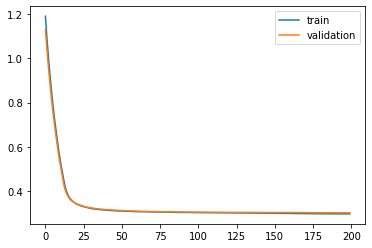

Time to train LSTM:  144.8194932937622
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 1.2900 - acc: 0.5443 - val_loss: 1.2252 - val_acc: 0.5708

Epoch 00001: val_loss improved from inf to 1.22521, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 1.1641 - acc: 0.5959 - val_loss: 1.1091 - val_acc: 0.6170

Epoch 00002: val_loss improved from 1.22521 to 1.10905, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 1.0558 - acc: 0.6438 - val_loss: 1.0081 - val_acc: 0.6642

Epoch 00003: val_loss improved from 1.10905 to 1.00809, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 0.9609 - acc: 0.6849 - val_loss: 0.9180 - val_acc: 0.7031

Epoch 00004: val_loss improved from 1.00809 to 0.91805, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 0.8754 - acc: 0.7181 - val_loss: 0.8366 - val_acc: 0.7343

Epoch 00005: val_loss improved from 0.91805 to 0.83665, saving model to Event_val_weights4.hdf5
Epoch 6/200

 - 1s - loss: 0.3046 - acc: 0.8878 - val_loss: 0.3121 - val_acc: 0.8829

Epoch 00046: val_loss improved from 0.31257 to 0.31211, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.3044 - acc: 0.8880 - val_loss: 0.3119 - val_acc: 0.8830

Epoch 00047: val_loss improved from 0.31211 to 0.31186, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.3041 - acc: 0.8879 - val_loss: 0.3116 - val_acc: 0.8834

Epoch 00048: val_loss improved from 0.31186 to 0.31163, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.3039 - acc: 0.8879 - val_loss: 0.3115 - val_acc: 0.8833

Epoch 00049: val_loss improved from 0.31163 to 0.31149, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3037 - acc: 0.8878 - val_loss: 0.3112 - val_acc: 0.8834

Epoch 00050: val_loss improved from 0.31149 to 0.31119, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.3036 - acc: 0.8879 - val_loss: 0.3110 - val_acc: 0.8831

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30687 to 0.30683, saving model to Event_val_weights4.hdf5
Epoch 92/200
 - 1s - loss: 0.2999 - acc: 0.8879 - val_loss: 0.3068 - val_acc: 0.8854

Epoch 00092: val_loss improved from 0.30683 to 0.30679, saving model to Event_val_weights4.hdf5
Epoch 93/200
 - 1s - loss: 0.2998 - acc: 0.8879 - val_loss: 0.3068 - val_acc: 0.8853

Epoch 00093: val_loss did not improve from 0.30679
Epoch 94/200
 - 1s - loss: 0.2998 - acc: 0.8879 - val_loss: 0.3067 - val_acc: 0.8850

Epoch 00094: val_loss improved from 0.30679 to 0.30669, saving model to Event_val_weights4.hdf5
Epoch 95/200
 - 1s - loss: 0.2997 - acc: 0.8880 - val_loss: 0.3066 - val_acc: 0.8853

Epoch 00095: val_loss improved from 0.30669 to 0.30665, saving model to Event_val_weights4.hdf5
Epoch 96/200
 - 1s - loss: 0.2997 - acc: 0.8880 - val_loss: 0.3067 - val_acc: 0.8852

Epoch 00096: val_loss did not improve from 0.30665
Epoch 97/200
 - 1s - loss: 0.2996 - acc: 0.8881 - val_loss: 0.3065 - val_acc: 0.885


Epoch 00142: val_loss improved from 0.30530 to 0.30526, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.2979 - acc: 0.8879 - val_loss: 0.3053 - val_acc: 0.8858

Epoch 00143: val_loss did not improve from 0.30526
Epoch 144/200
 - 1s - loss: 0.2979 - acc: 0.8879 - val_loss: 0.3052 - val_acc: 0.8858

Epoch 00144: val_loss improved from 0.30526 to 0.30524, saving model to Event_val_weights4.hdf5
Epoch 145/200
 - 1s - loss: 0.2979 - acc: 0.8879 - val_loss: 0.3053 - val_acc: 0.8860

Epoch 00145: val_loss did not improve from 0.30524
Epoch 146/200
 - 1s - loss: 0.2979 - acc: 0.8880 - val_loss: 0.3052 - val_acc: 0.8861

Epoch 00146: val_loss improved from 0.30524 to 0.30522, saving model to Event_val_weights4.hdf5
Epoch 147/200
 - 1s - loss: 0.2978 - acc: 0.8879 - val_loss: 0.3053 - val_acc: 0.8862

Epoch 00147: val_loss did not improve from 0.30522
Epoch 148/200
 - 1s - loss: 0.2978 - acc: 0.8879 - val_loss: 0.3052 - val_acc: 0.8862

Epoch 00148: val_loss improved from 


Epoch 00193: val_loss did not improve from 0.30467
Epoch 194/200
 - 1s - loss: 0.2967 - acc: 0.8883 - val_loss: 0.3046 - val_acc: 0.8850

Epoch 00194: val_loss improved from 0.30467 to 0.30464, saving model to Event_val_weights4.hdf5
Epoch 195/200
 - 1s - loss: 0.2967 - acc: 0.8884 - val_loss: 0.3047 - val_acc: 0.8850

Epoch 00195: val_loss did not improve from 0.30464
Epoch 196/200
 - 1s - loss: 0.2967 - acc: 0.8883 - val_loss: 0.3046 - val_acc: 0.8851

Epoch 00196: val_loss improved from 0.30464 to 0.30462, saving model to Event_val_weights4.hdf5
Epoch 197/200
 - 1s - loss: 0.2967 - acc: 0.8884 - val_loss: 0.3046 - val_acc: 0.8850

Epoch 00197: val_loss did not improve from 0.30462
Epoch 198/200
 - 1s - loss: 0.2967 - acc: 0.8883 - val_loss: 0.3046 - val_acc: 0.8850

Epoch 00198: val_loss improved from 0.30462 to 0.30460, saving model to Event_val_weights4.hdf5
Epoch 199/200
 - 1s - loss: 0.2967 - acc: 0.8884 - val_loss: 0.3046 - val_acc: 0.8849

Epoch 00199: val_loss did not improv

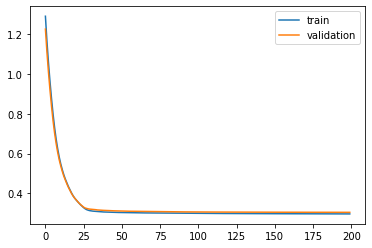

Time to train LSTM:  144.76336240768433
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 1.3527 - acc: 0.5169 - val_loss: 1.2752 - val_acc: 0.5478

Epoch 00001: val_loss improved from inf to 1.27520, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 1.2131 - acc: 0.5691 - val_loss: 1.1454 - val_acc: 0.5988

Epoch 00002: val_loss improved from 1.27520 to 1.14537, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 1.0918 - acc: 0.6187 - val_loss: 1.0332 - val_acc: 0.6410

Epoch 00003: val_loss improved from 1.14537 to 1.03324, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 0.9878 - acc: 0.6617 - val_loss: 0.9373 - val_acc: 0.6833

Epoch 00004: val_loss improved from 1.03324 to 0.93728, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 0.8995 - acc: 0.6975 - val_loss: 0.8560 - val_acc: 0.7150

Epoch 00005: val_loss improved from 0.93728 to 0.85598, saving model to Event_val_weights5.hdf5
Epoch 6/20


Epoch 00047: val_loss did not improve from 0.30831
Epoch 48/200
 - 1s - loss: 0.3025 - acc: 0.8881 - val_loss: 0.3088 - val_acc: 0.8863

Epoch 00048: val_loss did not improve from 0.30831
Epoch 49/200
 - 1s - loss: 0.3022 - acc: 0.8880 - val_loss: 0.3087 - val_acc: 0.8862

Epoch 00049: val_loss did not improve from 0.30831
Epoch 50/200
 - 1s - loss: 0.3021 - acc: 0.8880 - val_loss: 0.3089 - val_acc: 0.8862

Epoch 00050: val_loss did not improve from 0.30831
Epoch 51/200
 - 1s - loss: 0.3019 - acc: 0.8880 - val_loss: 0.3086 - val_acc: 0.8866

Epoch 00051: val_loss did not improve from 0.30831
Epoch 52/200
 - 1s - loss: 0.3019 - acc: 0.8879 - val_loss: 0.3089 - val_acc: 0.8866

Epoch 00052: val_loss did not improve from 0.30831
Epoch 53/200
 - 1s - loss: 0.3016 - acc: 0.8878 - val_loss: 0.3088 - val_acc: 0.8866

Epoch 00053: val_loss did not improve from 0.30831
Epoch 54/200
 - 1s - loss: 0.3016 - acc: 0.8881 - val_loss: 0.3089 - val_acc: 0.8867

Epoch 00054: val_loss did not improve fr


Epoch 00103: val_loss did not improve from 0.30716
Epoch 104/200
 - 1s - loss: 0.2990 - acc: 0.8884 - val_loss: 0.3071 - val_acc: 0.8859

Epoch 00104: val_loss improved from 0.30716 to 0.30714, saving model to Event_val_weights5.hdf5
Epoch 105/200
 - 1s - loss: 0.2990 - acc: 0.8885 - val_loss: 0.3071 - val_acc: 0.8857

Epoch 00105: val_loss improved from 0.30714 to 0.30710, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.2990 - acc: 0.8884 - val_loss: 0.3072 - val_acc: 0.8859

Epoch 00106: val_loss did not improve from 0.30710
Epoch 107/200
 - 1s - loss: 0.2990 - acc: 0.8884 - val_loss: 0.3072 - val_acc: 0.8854

Epoch 00107: val_loss did not improve from 0.30710
Epoch 108/200
 - 1s - loss: 0.2989 - acc: 0.8883 - val_loss: 0.3071 - val_acc: 0.8859

Epoch 00108: val_loss did not improve from 0.30710
Epoch 109/200
 - 1s - loss: 0.2989 - acc: 0.8883 - val_loss: 0.3070 - val_acc: 0.8858

Epoch 00109: val_loss improved from 0.30710 to 0.30701, saving model to Event_val

 - 1s - loss: 0.2976 - acc: 0.8882 - val_loss: 0.3065 - val_acc: 0.8864

Epoch 00159: val_loss improved from 0.30656 to 0.30649, saving model to Event_val_weights5.hdf5
Epoch 160/200
 - 1s - loss: 0.2976 - acc: 0.8883 - val_loss: 0.3066 - val_acc: 0.8862

Epoch 00160: val_loss did not improve from 0.30649
Epoch 161/200
 - 1s - loss: 0.2976 - acc: 0.8883 - val_loss: 0.3065 - val_acc: 0.8862

Epoch 00161: val_loss improved from 0.30649 to 0.30648, saving model to Event_val_weights5.hdf5
Epoch 162/200
 - 1s - loss: 0.2976 - acc: 0.8884 - val_loss: 0.3066 - val_acc: 0.8862

Epoch 00162: val_loss did not improve from 0.30648
Epoch 163/200
 - 1s - loss: 0.2976 - acc: 0.8884 - val_loss: 0.3064 - val_acc: 0.8866

Epoch 00163: val_loss improved from 0.30648 to 0.30643, saving model to Event_val_weights5.hdf5
Epoch 164/200
 - 1s - loss: 0.2975 - acc: 0.8884 - val_loss: 0.3066 - val_acc: 0.8864

Epoch 00164: val_loss did not improve from 0.30643
Epoch 165/200
 - 1s - loss: 0.2975 - acc: 0.8883 - 

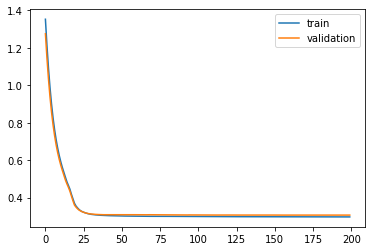

Time to train LSTM:  142.47036981582642
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 1.6933 - acc: 0.5220 - val_loss: 1.5818 - val_acc: 0.5566

Epoch 00001: val_loss improved from inf to 1.58178, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 1.5010 - acc: 0.5892 - val_loss: 1.4035 - val_acc: 0.6219

Epoch 00002: val_loss improved from 1.58178 to 1.40353, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 1.3367 - acc: 0.6467 - val_loss: 1.2516 - val_acc: 0.6807

Epoch 00003: val_loss improved from 1.40353 to 1.25161, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 1.1959 - acc: 0.6921 - val_loss: 1.1209 - val_acc: 0.7172

Epoch 00004: val_loss improved from 1.25161 to 1.12094, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 1.0737 - acc: 0.7276 - val_loss: 1.0066 - val_acc: 0.7502

Epoch 00005: val_loss improved from 1.12094 to 1.00662, saving model to Event_val_weights1.hdf5
Epoch 6/20

 - 1s - loss: 0.3114 - acc: 0.8861 - val_loss: 0.3069 - val_acc: 0.8856

Epoch 00046: val_loss improved from 0.30696 to 0.30693, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.3111 - acc: 0.8863 - val_loss: 0.3067 - val_acc: 0.8857

Epoch 00047: val_loss improved from 0.30693 to 0.30671, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3109 - acc: 0.8861 - val_loss: 0.3064 - val_acc: 0.8857

Epoch 00048: val_loss improved from 0.30671 to 0.30643, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.3106 - acc: 0.8862 - val_loss: 0.3062 - val_acc: 0.8858

Epoch 00049: val_loss improved from 0.30643 to 0.30615, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.3104 - acc: 0.8861 - val_loss: 0.3059 - val_acc: 0.8861

Epoch 00050: val_loss improved from 0.30615 to 0.30586, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.3102 - acc: 0.8862 - val_loss: 0.3055 - val_acc: 0.8860

Epoch 00051: val_

 - 1s - loss: 0.3051 - acc: 0.8866 - val_loss: 0.3006 - val_acc: 0.8864

Epoch 00093: val_loss did not improve from 0.30057
Epoch 94/200
 - 1s - loss: 0.3050 - acc: 0.8867 - val_loss: 0.3005 - val_acc: 0.8867

Epoch 00094: val_loss improved from 0.30057 to 0.30052, saving model to Event_val_weights1.hdf5
Epoch 95/200
 - 1s - loss: 0.3050 - acc: 0.8866 - val_loss: 0.3003 - val_acc: 0.8868

Epoch 00095: val_loss improved from 0.30052 to 0.30034, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.3049 - acc: 0.8867 - val_loss: 0.3004 - val_acc: 0.8869

Epoch 00096: val_loss did not improve from 0.30034
Epoch 97/200
 - 1s - loss: 0.3049 - acc: 0.8867 - val_loss: 0.3003 - val_acc: 0.8868

Epoch 00097: val_loss improved from 0.30034 to 0.30032, saving model to Event_val_weights1.hdf5
Epoch 98/200
 - 1s - loss: 0.3048 - acc: 0.8867 - val_loss: 0.3002 - val_acc: 0.8868

Epoch 00098: val_loss improved from 0.30032 to 0.30022, saving model to Event_val_weights1.hdf5
Epoch 99/20

 - 1s - loss: 0.3031 - acc: 0.8867 - val_loss: 0.2984 - val_acc: 0.8869

Epoch 00142: val_loss did not improve from 0.29835
Epoch 143/200
 - 1s - loss: 0.3030 - acc: 0.8866 - val_loss: 0.2983 - val_acc: 0.8871

Epoch 00143: val_loss improved from 0.29835 to 0.29832, saving model to Event_val_weights1.hdf5
Epoch 144/200
 - 1s - loss: 0.3030 - acc: 0.8867 - val_loss: 0.2983 - val_acc: 0.8869

Epoch 00144: val_loss did not improve from 0.29832
Epoch 145/200
 - 1s - loss: 0.3030 - acc: 0.8867 - val_loss: 0.2983 - val_acc: 0.8870

Epoch 00145: val_loss improved from 0.29832 to 0.29828, saving model to Event_val_weights1.hdf5
Epoch 146/200
 - 1s - loss: 0.3029 - acc: 0.8868 - val_loss: 0.2983 - val_acc: 0.8871

Epoch 00146: val_loss did not improve from 0.29828
Epoch 147/200
 - 1s - loss: 0.3029 - acc: 0.8867 - val_loss: 0.2983 - val_acc: 0.8869

Epoch 00147: val_loss improved from 0.29828 to 0.29825, saving model to Event_val_weights1.hdf5
Epoch 148/200
 - 1s - loss: 0.3028 - acc: 0.8868 - 


Epoch 00193: val_loss improved from 0.29741 to 0.29737, saving model to Event_val_weights1.hdf5
Epoch 194/200
 - 1s - loss: 0.3016 - acc: 0.8874 - val_loss: 0.2975 - val_acc: 0.8872

Epoch 00194: val_loss did not improve from 0.29737
Epoch 195/200
 - 1s - loss: 0.3016 - acc: 0.8872 - val_loss: 0.2973 - val_acc: 0.8873

Epoch 00195: val_loss improved from 0.29737 to 0.29734, saving model to Event_val_weights1.hdf5
Epoch 196/200
 - 1s - loss: 0.3015 - acc: 0.8874 - val_loss: 0.2974 - val_acc: 0.8872

Epoch 00196: val_loss did not improve from 0.29734
Epoch 197/200
 - 1s - loss: 0.3015 - acc: 0.8872 - val_loss: 0.2973 - val_acc: 0.8871

Epoch 00197: val_loss improved from 0.29734 to 0.29731, saving model to Event_val_weights1.hdf5
Epoch 198/200
 - 1s - loss: 0.3015 - acc: 0.8873 - val_loss: 0.2974 - val_acc: 0.8872

Epoch 00198: val_loss did not improve from 0.29731
Epoch 199/200
 - 1s - loss: 0.3015 - acc: 0.8872 - val_loss: 0.2973 - val_acc: 0.8869

Epoch 00199: val_loss improved from 

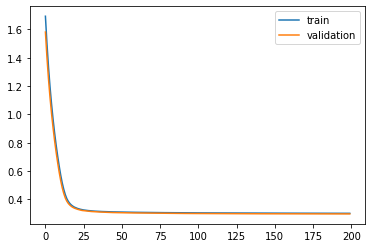

Time to train LSTM:  145.59813833236694
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 1.8380 - acc: 0.5090 - val_loss: 1.7243 - val_acc: 0.5301

Epoch 00001: val_loss improved from inf to 1.72432, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 1.6226 - acc: 0.5717 - val_loss: 1.5260 - val_acc: 0.5922

Epoch 00002: val_loss improved from 1.72432 to 1.52600, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 1.4373 - acc: 0.6306 - val_loss: 1.3551 - val_acc: 0.6477

Epoch 00003: val_loss improved from 1.52600 to 1.35513, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 1.2768 - acc: 0.6806 - val_loss: 1.2063 - val_acc: 0.6907

Epoch 00004: val_loss improved from 1.35513 to 1.20625, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 1.1373 - acc: 0.7188 - val_loss: 1.0765 - val_acc: 0.7220

Epoch 00005: val_loss improved from 1.20625 to 1.07651, saving model to Event_val_weights2.hdf5
Epoch 6/20

 - 1s - loss: 0.3003 - acc: 0.8880 - val_loss: 0.3078 - val_acc: 0.8848

Epoch 00046: val_loss improved from 0.30799 to 0.30783, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.3002 - acc: 0.8880 - val_loss: 0.3076 - val_acc: 0.8846

Epoch 00047: val_loss improved from 0.30783 to 0.30758, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.3000 - acc: 0.8879 - val_loss: 0.3075 - val_acc: 0.8844

Epoch 00048: val_loss improved from 0.30758 to 0.30752, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.2999 - acc: 0.8878 - val_loss: 0.3075 - val_acc: 0.8843

Epoch 00049: val_loss improved from 0.30752 to 0.30750, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.2998 - acc: 0.8879 - val_loss: 0.3071 - val_acc: 0.8844

Epoch 00050: val_loss improved from 0.30750 to 0.30714, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.2997 - acc: 0.8880 - val_loss: 0.3071 - val_acc: 0.8842

Epoch 00051: val_

 - 1s - loss: 0.2979 - acc: 0.8880 - val_loss: 0.3055 - val_acc: 0.8847

Epoch 00097: val_loss did not improve from 0.30487
Epoch 98/200
 - 1s - loss: 0.2978 - acc: 0.8880 - val_loss: 0.3053 - val_acc: 0.8844

Epoch 00098: val_loss did not improve from 0.30487
Epoch 99/200
 - 1s - loss: 0.2978 - acc: 0.8880 - val_loss: 0.3055 - val_acc: 0.8849

Epoch 00099: val_loss did not improve from 0.30487
Epoch 100/200
 - 1s - loss: 0.2977 - acc: 0.8879 - val_loss: 0.3052 - val_acc: 0.8847

Epoch 00100: val_loss did not improve from 0.30487
Epoch 101/200
 - 1s - loss: 0.2978 - acc: 0.8881 - val_loss: 0.3053 - val_acc: 0.8849

Epoch 00101: val_loss did not improve from 0.30487
Epoch 102/200
 - 1s - loss: 0.2977 - acc: 0.8879 - val_loss: 0.3050 - val_acc: 0.8844

Epoch 00102: val_loss did not improve from 0.30487
Epoch 103/200
 - 1s - loss: 0.2977 - acc: 0.8879 - val_loss: 0.3050 - val_acc: 0.8850

Epoch 00103: val_loss did not improve from 0.30487
Epoch 104/200
 - 1s - loss: 0.2977 - acc: 0.8879 -


Epoch 00150: val_loss improved from 0.30426 to 0.30425, saving model to Event_val_weights2.hdf5
Epoch 151/200
 - 1s - loss: 0.2971 - acc: 0.8882 - val_loss: 0.3044 - val_acc: 0.8851

Epoch 00151: val_loss did not improve from 0.30425
Epoch 152/200
 - 1s - loss: 0.2971 - acc: 0.8881 - val_loss: 0.3042 - val_acc: 0.8852

Epoch 00152: val_loss improved from 0.30425 to 0.30424, saving model to Event_val_weights2.hdf5
Epoch 153/200
 - 1s - loss: 0.2971 - acc: 0.8882 - val_loss: 0.3044 - val_acc: 0.8850

Epoch 00153: val_loss did not improve from 0.30424
Epoch 154/200
 - 1s - loss: 0.2971 - acc: 0.8882 - val_loss: 0.3042 - val_acc: 0.8852

Epoch 00154: val_loss improved from 0.30424 to 0.30422, saving model to Event_val_weights2.hdf5
Epoch 155/200
 - 1s - loss: 0.2971 - acc: 0.8883 - val_loss: 0.3044 - val_acc: 0.8851

Epoch 00155: val_loss did not improve from 0.30422
Epoch 156/200
 - 1s - loss: 0.2971 - acc: 0.8881 - val_loss: 0.3042 - val_acc: 0.8852

Epoch 00156: val_loss improved from 

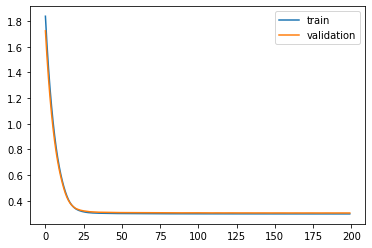

Time to train LSTM:  146.59059143066406


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8b5ce61780>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 1.7258 - acc: 0.5626 - val_loss: 1.6035 - val_acc: 0.5989

Epoch 00001: val_loss improved from inf to 1.60354, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 1.5213 - acc: 0.6161 - val_loss: 1.4179 - val_acc: 0.6497

Epoch 00002: val_loss improved from 1.60354 to 1.41792, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 1.3466 - acc: 0.6632 - val_loss: 1.2596 - val_acc: 0.6836

Epoch 00003: val_loss improved from 1.41792 to 1.25961, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 1.1974 - acc: 0.6978 - val_loss: 1.1228 - val_acc: 0.7138

Epoch 00004: val_loss improved from 1.25961 to 1.12279, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 1.0687 - acc: 0.7254 - val_loss: 1.0044 - val_acc: 0.7361

Epoch 00005: val_loss improved from 1.12279 to 1.00442, saving model to Event_val_weights3.hdf5
Epoch 6/200
 - 1s - loss: 0.9575 - acc: 0.7475 - v

 - 1s - loss: 0.3010 - acc: 0.8879 - val_loss: 0.3034 - val_acc: 0.8872

Epoch 00046: val_loss improved from 0.30353 to 0.30344, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3009 - acc: 0.8880 - val_loss: 0.3033 - val_acc: 0.8874

Epoch 00047: val_loss improved from 0.30344 to 0.30327, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.3007 - acc: 0.8880 - val_loss: 0.3033 - val_acc: 0.8872

Epoch 00048: val_loss improved from 0.30327 to 0.30326, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.3006 - acc: 0.8880 - val_loss: 0.3032 - val_acc: 0.8876

Epoch 00049: val_loss improved from 0.30326 to 0.30316, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.3004 - acc: 0.8880 - val_loss: 0.3031 - val_acc: 0.8877

Epoch 00050: val_loss improved from 0.30316 to 0.30310, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3003 - acc: 0.8880 - val_loss: 0.3030 - val_acc: 0.8880

Epoch 00051: val_

 - 1s - loss: 0.2986 - acc: 0.8878 - val_loss: 0.3029 - val_acc: 0.8884

Epoch 00099: val_loss did not improve from 0.30177
Epoch 100/200
 - 1s - loss: 0.2986 - acc: 0.8880 - val_loss: 0.3024 - val_acc: 0.8874

Epoch 00100: val_loss did not improve from 0.30177
Epoch 101/200
 - 1s - loss: 0.2984 - acc: 0.8878 - val_loss: 0.3017 - val_acc: 0.8869

Epoch 00101: val_loss improved from 0.30177 to 0.30170, saving model to Event_val_weights3.hdf5
Epoch 102/200
 - 1s - loss: 0.2982 - acc: 0.8878 - val_loss: 0.3017 - val_acc: 0.8867

Epoch 00102: val_loss did not improve from 0.30170
Epoch 103/200
 - 1s - loss: 0.2983 - acc: 0.8880 - val_loss: 0.3020 - val_acc: 0.8868

Epoch 00103: val_loss did not improve from 0.30170
Epoch 104/200
 - 1s - loss: 0.2984 - acc: 0.8877 - val_loss: 0.3019 - val_acc: 0.8869

Epoch 00104: val_loss did not improve from 0.30170
Epoch 105/200
 - 1s - loss: 0.2985 - acc: 0.8876 - val_loss: 0.3028 - val_acc: 0.8880

Epoch 00105: val_loss did not improve from 0.30170
Epo

 - 1s - loss: 0.2977 - acc: 0.8878 - val_loss: 0.3028 - val_acc: 0.8878

Epoch 00158: val_loss did not improve from 0.30165
Epoch 159/200
 - 1s - loss: 0.2977 - acc: 0.8879 - val_loss: 0.3026 - val_acc: 0.8880

Epoch 00159: val_loss did not improve from 0.30165
Epoch 160/200
 - 1s - loss: 0.2976 - acc: 0.8880 - val_loss: 0.3020 - val_acc: 0.8880

Epoch 00160: val_loss did not improve from 0.30165
Epoch 161/200
 - 1s - loss: 0.2975 - acc: 0.8879 - val_loss: 0.3021 - val_acc: 0.8877

Epoch 00161: val_loss did not improve from 0.30165
Epoch 162/200
 - 1s - loss: 0.2974 - acc: 0.8880 - val_loss: 0.3022 - val_acc: 0.8872

Epoch 00162: val_loss did not improve from 0.30165
Epoch 163/200
 - 1s - loss: 0.2975 - acc: 0.8880 - val_loss: 0.3023 - val_acc: 0.8863

Epoch 00163: val_loss did not improve from 0.30165
Epoch 164/200
 - 1s - loss: 0.2976 - acc: 0.8880 - val_loss: 0.3023 - val_acc: 0.8867

Epoch 00164: val_loss did not improve from 0.30165
Epoch 165/200
 - 1s - loss: 0.2977 - acc: 0.8880

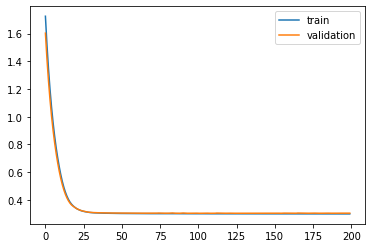

Time to train LSTM:  156.58981466293335
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 1.8805 - acc: 0.5749 - val_loss: 1.7387 - val_acc: 0.6047

Epoch 00001: val_loss improved from inf to 1.73870, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 1.6487 - acc: 0.6193 - val_loss: 1.5253 - val_acc: 0.6463

Epoch 00002: val_loss improved from 1.73870 to 1.52532, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 1.4498 - acc: 0.6594 - val_loss: 1.3449 - val_acc: 0.6816

Epoch 00003: val_loss improved from 1.52532 to 1.34493, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 1.2817 - acc: 0.6912 - val_loss: 1.1931 - val_acc: 0.7071

Epoch 00004: val_loss improved from 1.34493 to 1.19308, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 1.1390 - acc: 0.7162 - val_loss: 1.0633 - val_acc: 0.7300

Epoch 00005: val_loss improved from 1.19308 to 1.06327, saving model to Event_val_weights4.hdf5
Epoch 6/20

 - 1s - loss: 0.3042 - acc: 0.8879 - val_loss: 0.3116 - val_acc: 0.8863

Epoch 00046: val_loss improved from 0.31179 to 0.31155, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.3039 - acc: 0.8879 - val_loss: 0.3113 - val_acc: 0.8859

Epoch 00047: val_loss improved from 0.31155 to 0.31133, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.3037 - acc: 0.8879 - val_loss: 0.3111 - val_acc: 0.8856

Epoch 00048: val_loss improved from 0.31133 to 0.31112, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.3035 - acc: 0.8880 - val_loss: 0.3110 - val_acc: 0.8854

Epoch 00049: val_loss improved from 0.31112 to 0.31098, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3032 - acc: 0.8879 - val_loss: 0.3109 - val_acc: 0.8857

Epoch 00050: val_loss improved from 0.31098 to 0.31089, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.3031 - acc: 0.8878 - val_loss: 0.3106 - val_acc: 0.8857

Epoch 00051: val_

 - 1s - loss: 0.2993 - acc: 0.8875 - val_loss: 0.3086 - val_acc: 0.8837

Epoch 00098: val_loss did not improve from 0.30759
Epoch 99/200
 - 1s - loss: 0.2992 - acc: 0.8876 - val_loss: 0.3077 - val_acc: 0.8841

Epoch 00099: val_loss did not improve from 0.30759
Epoch 100/200
 - 1s - loss: 0.2991 - acc: 0.8877 - val_loss: 0.3084 - val_acc: 0.8842

Epoch 00100: val_loss did not improve from 0.30759
Epoch 101/200
 - 1s - loss: 0.2991 - acc: 0.8876 - val_loss: 0.3080 - val_acc: 0.8844

Epoch 00101: val_loss did not improve from 0.30759
Epoch 102/200
 - 1s - loss: 0.2992 - acc: 0.8878 - val_loss: 0.3081 - val_acc: 0.8846

Epoch 00102: val_loss did not improve from 0.30759
Epoch 103/200
 - 1s - loss: 0.2992 - acc: 0.8877 - val_loss: 0.3083 - val_acc: 0.8836

Epoch 00103: val_loss did not improve from 0.30759
Epoch 104/200
 - 1s - loss: 0.2992 - acc: 0.8877 - val_loss: 0.3084 - val_acc: 0.8837

Epoch 00104: val_loss did not improve from 0.30759
Epoch 105/200
 - 1s - loss: 0.2993 - acc: 0.8879 


Epoch 00155: val_loss did not improve from 0.30614
Epoch 156/200
 - 1s - loss: 0.2976 - acc: 0.8877 - val_loss: 0.3069 - val_acc: 0.8850

Epoch 00156: val_loss did not improve from 0.30614
Epoch 157/200
 - 1s - loss: 0.2975 - acc: 0.8876 - val_loss: 0.3066 - val_acc: 0.8843

Epoch 00157: val_loss did not improve from 0.30614
Epoch 158/200
 - 1s - loss: 0.2973 - acc: 0.8877 - val_loss: 0.3064 - val_acc: 0.8849

Epoch 00158: val_loss did not improve from 0.30614
Epoch 159/200
 - 1s - loss: 0.2972 - acc: 0.8877 - val_loss: 0.3065 - val_acc: 0.8846

Epoch 00159: val_loss did not improve from 0.30614
Epoch 160/200
 - 1s - loss: 0.2974 - acc: 0.8877 - val_loss: 0.3066 - val_acc: 0.8848

Epoch 00160: val_loss did not improve from 0.30614
Epoch 161/200
 - 1s - loss: 0.2974 - acc: 0.8880 - val_loss: 0.3067 - val_acc: 0.8849

Epoch 00161: val_loss did not improve from 0.30614
Epoch 162/200
 - 1s - loss: 0.2974 - acc: 0.8878 - val_loss: 0.3069 - val_acc: 0.8853

Epoch 00162: val_loss did not imp

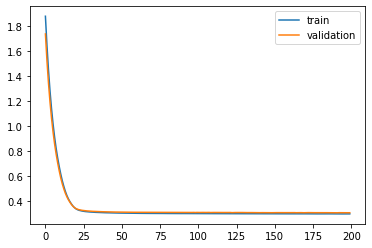

Time to train LSTM:  148.85281562805176
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 1.7957 - acc: 0.5568 - val_loss: 1.6789 - val_acc: 0.5884

Epoch 00001: val_loss improved from inf to 1.67894, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 1.5830 - acc: 0.6178 - val_loss: 1.4848 - val_acc: 0.6430

Epoch 00002: val_loss improved from 1.67894 to 1.48479, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 1.4035 - acc: 0.6639 - val_loss: 1.3190 - val_acc: 0.6823

Epoch 00003: val_loss improved from 1.48479 to 1.31898, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 1.2493 - acc: 0.6955 - val_loss: 1.1757 - val_acc: 0.7086

Epoch 00004: val_loss improved from 1.31898 to 1.17572, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 1.1153 - acc: 0.7206 - val_loss: 1.0505 - val_acc: 0.7320

Epoch 00005: val_loss improved from 1.17572 to 1.05053, saving model to Event_val_weights5.hdf5
Epoch 6/20


Epoch 00046: val_loss improved from 0.30912 to 0.30904, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.3070 - acc: 0.8872 - val_loss: 0.3087 - val_acc: 0.8891

Epoch 00047: val_loss improved from 0.30904 to 0.30867, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.3068 - acc: 0.8871 - val_loss: 0.3089 - val_acc: 0.8886

Epoch 00048: val_loss did not improve from 0.30867
Epoch 49/200
 - 1s - loss: 0.3066 - acc: 0.8870 - val_loss: 0.3086 - val_acc: 0.8891

Epoch 00049: val_loss improved from 0.30867 to 0.30860, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3064 - acc: 0.8870 - val_loss: 0.3085 - val_acc: 0.8888

Epoch 00050: val_loss improved from 0.30860 to 0.30847, saving model to Event_val_weights5.hdf5
Epoch 51/200
 - 1s - loss: 0.3063 - acc: 0.8870 - val_loss: 0.3080 - val_acc: 0.8893

Epoch 00051: val_loss improved from 0.30847 to 0.30795, saving model to Event_val_weights5.hdf5
Epoch 52/200
 - 1s - loss: 0.3061 - ac


Epoch 00097: val_loss did not improve from 0.30429
Epoch 98/200
 - 1s - loss: 0.3024 - acc: 0.8876 - val_loss: 0.3041 - val_acc: 0.8887

Epoch 00098: val_loss improved from 0.30429 to 0.30413, saving model to Event_val_weights5.hdf5
Epoch 99/200
 - 1s - loss: 0.3024 - acc: 0.8875 - val_loss: 0.3044 - val_acc: 0.8887

Epoch 00099: val_loss did not improve from 0.30413
Epoch 100/200
 - 1s - loss: 0.3023 - acc: 0.8875 - val_loss: 0.3041 - val_acc: 0.8888

Epoch 00100: val_loss did not improve from 0.30413
Epoch 101/200
 - 1s - loss: 0.3023 - acc: 0.8875 - val_loss: 0.3041 - val_acc: 0.8887

Epoch 00101: val_loss improved from 0.30413 to 0.30405, saving model to Event_val_weights5.hdf5
Epoch 102/200
 - 1s - loss: 0.3022 - acc: 0.8875 - val_loss: 0.3041 - val_acc: 0.8888

Epoch 00102: val_loss did not improve from 0.30405
Epoch 103/200
 - 1s - loss: 0.3022 - acc: 0.8875 - val_loss: 0.3041 - val_acc: 0.8884

Epoch 00103: val_loss did not improve from 0.30405
Epoch 104/200
 - 1s - loss: 0.30

 - 1s - loss: 0.3008 - acc: 0.8875 - val_loss: 0.3029 - val_acc: 0.8884

Epoch 00150: val_loss did not improve from 0.30273
Epoch 151/200
 - 1s - loss: 0.3008 - acc: 0.8874 - val_loss: 0.3028 - val_acc: 0.8883

Epoch 00151: val_loss did not improve from 0.30273
Epoch 152/200
 - 1s - loss: 0.3008 - acc: 0.8875 - val_loss: 0.3029 - val_acc: 0.8884

Epoch 00152: val_loss did not improve from 0.30273
Epoch 153/200
 - 1s - loss: 0.3008 - acc: 0.8874 - val_loss: 0.3031 - val_acc: 0.8882

Epoch 00153: val_loss did not improve from 0.30273
Epoch 154/200
 - 1s - loss: 0.3007 - acc: 0.8875 - val_loss: 0.3027 - val_acc: 0.8884

Epoch 00154: val_loss improved from 0.30273 to 0.30265, saving model to Event_val_weights5.hdf5
Epoch 155/200
 - 1s - loss: 0.3007 - acc: 0.8874 - val_loss: 0.3030 - val_acc: 0.8882

Epoch 00155: val_loss did not improve from 0.30265
Epoch 156/200
 - 1s - loss: 0.3007 - acc: 0.8875 - val_loss: 0.3029 - val_acc: 0.8886

Epoch 00156: val_loss did not improve from 0.30265
Epo

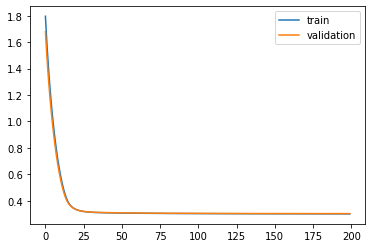

Time to train LSTM:  149.22269654273987
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 1.7872 - acc: 0.4655 - val_loss: 1.6727 - val_acc: 0.4916

Epoch 00001: val_loss improved from inf to 1.67272, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 1.5925 - acc: 0.5123 - val_loss: 1.4895 - val_acc: 0.5431

Epoch 00002: val_loss improved from 1.67272 to 1.48947, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 1.4217 - acc: 0.5627 - val_loss: 1.3303 - val_acc: 0.5980

Epoch 00003: val_loss improved from 1.48947 to 1.33030, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 1.2740 - acc: 0.6136 - val_loss: 1.1935 - val_acc: 0.6484

Epoch 00004: val_loss improved from 1.33030 to 1.19353, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 1.1471 - acc: 0.6625 - val_loss: 1.0762 - val_acc: 0.6920

Epoch 00005: val_loss improved from 1.19353 to 1.07624, saving model to Event_val_weights1.hdf5
Epoch 6/20


Epoch 00046: val_loss improved from 0.31081 to 0.31058, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.3144 - acc: 0.8879 - val_loss: 0.3101 - val_acc: 0.8873

Epoch 00047: val_loss improved from 0.31058 to 0.31013, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3141 - acc: 0.8879 - val_loss: 0.3097 - val_acc: 0.8873

Epoch 00048: val_loss improved from 0.31013 to 0.30966, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.3137 - acc: 0.8876 - val_loss: 0.3093 - val_acc: 0.8876

Epoch 00049: val_loss improved from 0.30966 to 0.30927, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.3133 - acc: 0.8878 - val_loss: 0.3090 - val_acc: 0.8870

Epoch 00050: val_loss improved from 0.30927 to 0.30901, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.3128 - acc: 0.8878 - val_loss: 0.3086 - val_acc: 0.8873

Epoch 00051: val_loss improved from 0.30901 to 0.30859, saving model to Event_val_weights

 - 1s - loss: 0.3041 - acc: 0.8871 - val_loss: 0.2989 - val_acc: 0.8877

Epoch 00092: val_loss improved from 0.29898 to 0.29892, saving model to Event_val_weights1.hdf5
Epoch 93/200
 - 1s - loss: 0.3040 - acc: 0.8871 - val_loss: 0.2987 - val_acc: 0.8878

Epoch 00093: val_loss improved from 0.29892 to 0.29874, saving model to Event_val_weights1.hdf5
Epoch 94/200
 - 1s - loss: 0.3039 - acc: 0.8871 - val_loss: 0.2987 - val_acc: 0.8879

Epoch 00094: val_loss improved from 0.29874 to 0.29870, saving model to Event_val_weights1.hdf5
Epoch 95/200
 - 1s - loss: 0.3037 - acc: 0.8872 - val_loss: 0.2985 - val_acc: 0.8880

Epoch 00095: val_loss improved from 0.29870 to 0.29851, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.3036 - acc: 0.8871 - val_loss: 0.2985 - val_acc: 0.8878

Epoch 00096: val_loss improved from 0.29851 to 0.29848, saving model to Event_val_weights1.hdf5
Epoch 97/200
 - 1s - loss: 0.3035 - acc: 0.8872 - val_loss: 0.2983 - val_acc: 0.8878

Epoch 00097: val_

 - 1s - loss: 0.2998 - acc: 0.8872 - val_loss: 0.2953 - val_acc: 0.8882

Epoch 00141: val_loss did not improve from 0.29530
Epoch 142/200
 - 1s - loss: 0.2997 - acc: 0.8871 - val_loss: 0.2952 - val_acc: 0.8881

Epoch 00142: val_loss improved from 0.29530 to 0.29525, saving model to Event_val_weights1.hdf5
Epoch 143/200
 - 1s - loss: 0.2997 - acc: 0.8872 - val_loss: 0.2954 - val_acc: 0.8880

Epoch 00143: val_loss did not improve from 0.29525
Epoch 144/200
 - 1s - loss: 0.2996 - acc: 0.8872 - val_loss: 0.2954 - val_acc: 0.8879

Epoch 00144: val_loss did not improve from 0.29525
Epoch 145/200
 - 1s - loss: 0.2995 - acc: 0.8872 - val_loss: 0.2951 - val_acc: 0.8881

Epoch 00145: val_loss improved from 0.29525 to 0.29512, saving model to Event_val_weights1.hdf5
Epoch 146/200
 - 1s - loss: 0.2995 - acc: 0.8873 - val_loss: 0.2954 - val_acc: 0.8879

Epoch 00146: val_loss did not improve from 0.29512
Epoch 147/200
 - 1s - loss: 0.2994 - acc: 0.8873 - val_loss: 0.2952 - val_acc: 0.8878

Epoch 001


Epoch 00194: val_loss improved from 0.29448 to 0.29447, saving model to Event_val_weights1.hdf5
Epoch 195/200
 - 1s - loss: 0.2981 - acc: 0.8884 - val_loss: 0.2946 - val_acc: 0.8883

Epoch 00195: val_loss did not improve from 0.29447
Epoch 196/200
 - 1s - loss: 0.2981 - acc: 0.8883 - val_loss: 0.2946 - val_acc: 0.8880

Epoch 00196: val_loss did not improve from 0.29447
Epoch 197/200
 - 1s - loss: 0.2982 - acc: 0.8884 - val_loss: 0.2945 - val_acc: 0.8878

Epoch 00197: val_loss did not improve from 0.29447
Epoch 198/200
 - 1s - loss: 0.2981 - acc: 0.8882 - val_loss: 0.2946 - val_acc: 0.8882

Epoch 00198: val_loss did not improve from 0.29447
Epoch 199/200
 - 1s - loss: 0.2981 - acc: 0.8884 - val_loss: 0.2944 - val_acc: 0.8877

Epoch 00199: val_loss improved from 0.29447 to 0.29438, saving model to Event_val_weights1.hdf5
Epoch 200/200
 - 1s - loss: 0.2981 - acc: 0.8882 - val_loss: 0.2946 - val_acc: 0.8884

Epoch 00200: val_loss did not improve from 0.29438
##############################

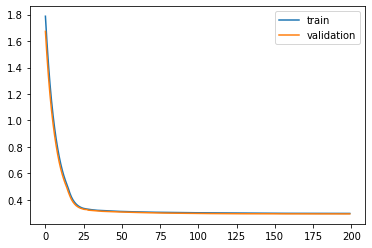

Time to train LSTM:  149.8572235107422
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 1.8466 - acc: 0.4772 - val_loss: 1.7170 - val_acc: 0.5061

Epoch 00001: val_loss improved from inf to 1.71702, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 1.6286 - acc: 0.5271 - val_loss: 1.5183 - val_acc: 0.5592

Epoch 00002: val_loss improved from 1.71702 to 1.51831, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 1.4407 - acc: 0.5796 - val_loss: 1.3464 - val_acc: 0.6090

Epoch 00003: val_loss improved from 1.51831 to 1.34645, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 1.2778 - acc: 0.6303 - val_loss: 1.1956 - val_acc: 0.6558

Epoch 00004: val_loss improved from 1.34645 to 1.19559, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 1.1349 - acc: 0.6790 - val_loss: 1.0632 - val_acc: 0.7023

Epoch 00005: val_loss improved from 1.19559 to 1.06320, saving model to Event_val_weights2.hdf5
Epoch 6/200

 - 1s - loss: 0.3043 - acc: 0.8879 - val_loss: 0.3128 - val_acc: 0.8834

Epoch 00046: val_loss improved from 0.31304 to 0.31277, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.3039 - acc: 0.8880 - val_loss: 0.3127 - val_acc: 0.8833

Epoch 00047: val_loss improved from 0.31277 to 0.31270, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.3037 - acc: 0.8880 - val_loss: 0.3124 - val_acc: 0.8832

Epoch 00048: val_loss improved from 0.31270 to 0.31244, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.3034 - acc: 0.8880 - val_loss: 0.3120 - val_acc: 0.8834

Epoch 00049: val_loss improved from 0.31244 to 0.31199, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.3033 - acc: 0.8880 - val_loss: 0.3117 - val_acc: 0.8837

Epoch 00050: val_loss improved from 0.31199 to 0.31175, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.3030 - acc: 0.8881 - val_loss: 0.3114 - val_acc: 0.8837

Epoch 00051: val_

 - 1s - loss: 0.2989 - acc: 0.8883 - val_loss: 0.3071 - val_acc: 0.8840

Epoch 00094: val_loss improved from 0.30706 to 0.30705, saving model to Event_val_weights2.hdf5
Epoch 95/200
 - 1s - loss: 0.2989 - acc: 0.8883 - val_loss: 0.3070 - val_acc: 0.8838

Epoch 00095: val_loss improved from 0.30705 to 0.30701, saving model to Event_val_weights2.hdf5
Epoch 96/200
 - 1s - loss: 0.2988 - acc: 0.8883 - val_loss: 0.3070 - val_acc: 0.8837

Epoch 00096: val_loss improved from 0.30701 to 0.30695, saving model to Event_val_weights2.hdf5
Epoch 97/200
 - 1s - loss: 0.2988 - acc: 0.8883 - val_loss: 0.3068 - val_acc: 0.8837

Epoch 00097: val_loss improved from 0.30695 to 0.30676, saving model to Event_val_weights2.hdf5
Epoch 98/200
 - 1s - loss: 0.2988 - acc: 0.8882 - val_loss: 0.3068 - val_acc: 0.8836

Epoch 00098: val_loss did not improve from 0.30676
Epoch 99/200
 - 1s - loss: 0.2987 - acc: 0.8882 - val_loss: 0.3069 - val_acc: 0.8838

Epoch 00099: val_loss did not improve from 0.30676
Epoch 100/2

 - 1s - loss: 0.2975 - acc: 0.8881 - val_loss: 0.3054 - val_acc: 0.8842

Epoch 00142: val_loss did not improve from 0.30532
Epoch 143/200
 - 1s - loss: 0.2975 - acc: 0.8882 - val_loss: 0.3055 - val_acc: 0.8844

Epoch 00143: val_loss did not improve from 0.30532
Epoch 144/200
 - 1s - loss: 0.2975 - acc: 0.8882 - val_loss: 0.3055 - val_acc: 0.8842

Epoch 00144: val_loss did not improve from 0.30532
Epoch 145/200
 - 1s - loss: 0.2975 - acc: 0.8882 - val_loss: 0.3055 - val_acc: 0.8844

Epoch 00145: val_loss did not improve from 0.30532
Epoch 146/200
 - 1s - loss: 0.2975 - acc: 0.8882 - val_loss: 0.3054 - val_acc: 0.8843

Epoch 00146: val_loss did not improve from 0.30532
Epoch 147/200
 - 1s - loss: 0.2974 - acc: 0.8882 - val_loss: 0.3053 - val_acc: 0.8842

Epoch 00147: val_loss did not improve from 0.30532
Epoch 148/200
 - 1s - loss: 0.2975 - acc: 0.8883 - val_loss: 0.3053 - val_acc: 0.8843

Epoch 00148: val_loss did not improve from 0.30532
Epoch 149/200
 - 1s - loss: 0.2974 - acc: 0.8882


Epoch 00194: val_loss improved from 0.30474 to 0.30466, saving model to Event_val_weights2.hdf5
Epoch 195/200
 - 1s - loss: 0.2970 - acc: 0.8886 - val_loss: 0.3048 - val_acc: 0.8848

Epoch 00195: val_loss did not improve from 0.30466
Epoch 196/200
 - 1s - loss: 0.2970 - acc: 0.8886 - val_loss: 0.3047 - val_acc: 0.8848

Epoch 00196: val_loss did not improve from 0.30466
Epoch 197/200
 - 1s - loss: 0.2969 - acc: 0.8887 - val_loss: 0.3048 - val_acc: 0.8846

Epoch 00197: val_loss did not improve from 0.30466
Epoch 198/200
 - 1s - loss: 0.2969 - acc: 0.8886 - val_loss: 0.3047 - val_acc: 0.8846

Epoch 00198: val_loss did not improve from 0.30466
Epoch 199/200
 - 1s - loss: 0.2969 - acc: 0.8887 - val_loss: 0.3047 - val_acc: 0.8847

Epoch 00199: val_loss did not improve from 0.30466
Epoch 200/200
 - 1s - loss: 0.2969 - acc: 0.8887 - val_loss: 0.3046 - val_acc: 0.8847

Epoch 00200: val_loss improved from 0.30466 to 0.30462, saving model to Event_val_weights2.hdf5
##############################

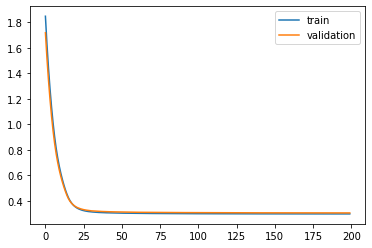

Time to train LSTM:  150.8800492286682
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 1.7590 - acc: 0.5665 - val_loss: 1.6420 - val_acc: 0.6012

Epoch 00001: val_loss improved from inf to 1.64201, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 1.5560 - acc: 0.6268 - val_loss: 1.4539 - val_acc: 0.6541

Epoch 00002: val_loss improved from 1.64201 to 1.45393, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 1.3792 - acc: 0.6752 - val_loss: 1.2905 - val_acc: 0.6991

Epoch 00003: val_loss improved from 1.45393 to 1.29052, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 1.2259 - acc: 0.7139 - val_loss: 1.1492 - val_acc: 0.7332

Epoch 00004: val_loss improved from 1.29052 to 1.14922, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 1.0937 - acc: 0.7428 - val_loss: 1.0283 - val_acc: 0.7572

Epoch 00005: val_loss improved from 1.14922 to 1.02831, saving model to Event_val_weights3.hdf5
Epoch 6/200

 - 1s - loss: 0.3091 - acc: 0.8871 - val_loss: 0.3108 - val_acc: 0.8846

Epoch 00046: val_loss improved from 0.31113 to 0.31083, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3088 - acc: 0.8871 - val_loss: 0.3105 - val_acc: 0.8844

Epoch 00047: val_loss improved from 0.31083 to 0.31055, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.3085 - acc: 0.8871 - val_loss: 0.3102 - val_acc: 0.8843

Epoch 00048: val_loss improved from 0.31055 to 0.31023, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.3083 - acc: 0.8872 - val_loss: 0.3100 - val_acc: 0.8841

Epoch 00049: val_loss improved from 0.31023 to 0.31001, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.3080 - acc: 0.8871 - val_loss: 0.3097 - val_acc: 0.8841

Epoch 00050: val_loss improved from 0.31001 to 0.30971, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3078 - acc: 0.8872 - val_loss: 0.3095 - val_acc: 0.8839

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30465 to 0.30461, saving model to Event_val_weights3.hdf5
Epoch 92/200
 - 1s - loss: 0.3026 - acc: 0.8873 - val_loss: 0.3045 - val_acc: 0.8856

Epoch 00092: val_loss improved from 0.30461 to 0.30451, saving model to Event_val_weights3.hdf5
Epoch 93/200
 - 1s - loss: 0.3025 - acc: 0.8872 - val_loss: 0.3044 - val_acc: 0.8859

Epoch 00093: val_loss improved from 0.30451 to 0.30444, saving model to Event_val_weights3.hdf5
Epoch 94/200
 - 1s - loss: 0.3024 - acc: 0.8872 - val_loss: 0.3044 - val_acc: 0.8857

Epoch 00094: val_loss improved from 0.30444 to 0.30440, saving model to Event_val_weights3.hdf5
Epoch 95/200
 - 1s - loss: 0.3024 - acc: 0.8872 - val_loss: 0.3043 - val_acc: 0.8860

Epoch 00095: val_loss improved from 0.30440 to 0.30431, saving model to Event_val_weights3.hdf5
Epoch 96/200
 - 1s - loss: 0.3023 - acc: 0.8873 - val_loss: 0.3042 - val_acc: 0.8860

Epoch 00096: val_loss improved from 0.30431 to 0.30423, saving model to Event_val_weights

 - 1s - loss: 0.2986 - acc: 0.8876 - val_loss: 0.3026 - val_acc: 0.8872

Epoch 00139: val_loss did not improve from 0.30240
Epoch 140/200
 - 1s - loss: 0.2986 - acc: 0.8877 - val_loss: 0.3025 - val_acc: 0.8870

Epoch 00140: val_loss did not improve from 0.30240
Epoch 141/200
 - 1s - loss: 0.2986 - acc: 0.8878 - val_loss: 0.3026 - val_acc: 0.8867

Epoch 00141: val_loss did not improve from 0.30240
Epoch 142/200
 - 1s - loss: 0.2985 - acc: 0.8878 - val_loss: 0.3025 - val_acc: 0.8870

Epoch 00142: val_loss did not improve from 0.30240
Epoch 143/200
 - 1s - loss: 0.2984 - acc: 0.8879 - val_loss: 0.3027 - val_acc: 0.8871

Epoch 00143: val_loss did not improve from 0.30240
Epoch 144/200
 - 1s - loss: 0.2984 - acc: 0.8878 - val_loss: 0.3025 - val_acc: 0.8869

Epoch 00144: val_loss did not improve from 0.30240
Epoch 145/200
 - 1s - loss: 0.2984 - acc: 0.8879 - val_loss: 0.3027 - val_acc: 0.8868

Epoch 00145: val_loss did not improve from 0.30240
Epoch 146/200
 - 1s - loss: 0.2983 - acc: 0.8879


Epoch 00197: val_loss improved from 0.30222 to 0.30220, saving model to Event_val_weights3.hdf5
Epoch 198/200
 - 1s - loss: 0.2964 - acc: 0.8890 - val_loss: 0.3024 - val_acc: 0.8880

Epoch 00198: val_loss did not improve from 0.30220
Epoch 199/200
 - 1s - loss: 0.2964 - acc: 0.8890 - val_loss: 0.3029 - val_acc: 0.8869

Epoch 00199: val_loss did not improve from 0.30220
Epoch 200/200
 - 1s - loss: 0.2964 - acc: 0.8890 - val_loss: 0.3024 - val_acc: 0.8877

Epoch 00200: val_loss did not improve from 0.30220
#################################
Number of units: 4
Batch size: 8192
Fold: 2
L2_1: 0.13182753578641435
best val loss: 0.3022039778497484
#################################


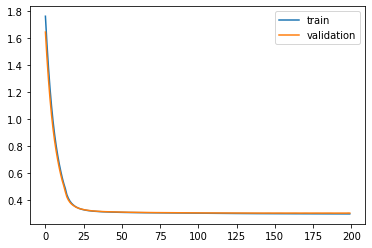

Time to train LSTM:  148.9660906791687
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 1.6958 - acc: 0.4930 - val_loss: 1.5859 - val_acc: 0.5261

Epoch 00001: val_loss improved from inf to 1.58585, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 1.5050 - acc: 0.5483 - val_loss: 1.4099 - val_acc: 0.5801

Epoch 00002: val_loss improved from 1.58585 to 1.40985, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 1.3404 - acc: 0.5989 - val_loss: 1.2589 - val_acc: 0.6248

Epoch 00003: val_loss improved from 1.40985 to 1.25895, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 1.1993 - acc: 0.6405 - val_loss: 1.1298 - val_acc: 0.6602

Epoch 00004: val_loss improved from 1.25895 to 1.12976, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 1.0782 - acc: 0.6768 - val_loss: 1.0181 - val_acc: 0.6911

Epoch 00005: val_loss improved from 1.12976 to 1.01813, saving model to Event_val_weights4.hdf5
Epoch 6/200

 - 1s - loss: 0.3086 - acc: 0.8887 - val_loss: 0.3166 - val_acc: 0.8843

Epoch 00046: val_loss improved from 0.31686 to 0.31664, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.3084 - acc: 0.8886 - val_loss: 0.3163 - val_acc: 0.8842

Epoch 00047: val_loss improved from 0.31664 to 0.31635, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.3082 - acc: 0.8885 - val_loss: 0.3161 - val_acc: 0.8836

Epoch 00048: val_loss improved from 0.31635 to 0.31614, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.3079 - acc: 0.8886 - val_loss: 0.3159 - val_acc: 0.8837

Epoch 00049: val_loss improved from 0.31614 to 0.31587, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3077 - acc: 0.8886 - val_loss: 0.3156 - val_acc: 0.8841

Epoch 00050: val_loss improved from 0.31587 to 0.31565, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.3075 - acc: 0.8888 - val_loss: 0.3154 - val_acc: 0.8843

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30775 to 0.30755, saving model to Event_val_weights4.hdf5
Epoch 92/200
 - 1s - loss: 0.3000 - acc: 0.8886 - val_loss: 0.3075 - val_acc: 0.8829

Epoch 00092: val_loss improved from 0.30755 to 0.30747, saving model to Event_val_weights4.hdf5
Epoch 93/200
 - 1s - loss: 0.2999 - acc: 0.8885 - val_loss: 0.3073 - val_acc: 0.8831

Epoch 00093: val_loss improved from 0.30747 to 0.30731, saving model to Event_val_weights4.hdf5
Epoch 94/200
 - 1s - loss: 0.2998 - acc: 0.8885 - val_loss: 0.3072 - val_acc: 0.8834

Epoch 00094: val_loss improved from 0.30731 to 0.30723, saving model to Event_val_weights4.hdf5
Epoch 95/200
 - 1s - loss: 0.2997 - acc: 0.8886 - val_loss: 0.3071 - val_acc: 0.8833

Epoch 00095: val_loss improved from 0.30723 to 0.30710, saving model to Event_val_weights4.hdf5
Epoch 96/200
 - 1s - loss: 0.2995 - acc: 0.8885 - val_loss: 0.3070 - val_acc: 0.8833

Epoch 00096: val_loss improved from 0.30710 to 0.30702, saving model to Event_val_weights

 - 1s - loss: 0.2973 - acc: 0.8886 - val_loss: 0.3058 - val_acc: 0.8822

Epoch 00141: val_loss did not improve from 0.30573
Epoch 142/200
 - 1s - loss: 0.2973 - acc: 0.8887 - val_loss: 0.3057 - val_acc: 0.8826

Epoch 00142: val_loss did not improve from 0.30573
Epoch 143/200
 - 1s - loss: 0.2972 - acc: 0.8887 - val_loss: 0.3057 - val_acc: 0.8826

Epoch 00143: val_loss improved from 0.30573 to 0.30569, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.2973 - acc: 0.8886 - val_loss: 0.3058 - val_acc: 0.8826

Epoch 00144: val_loss did not improve from 0.30569
Epoch 145/200
 - 1s - loss: 0.2972 - acc: 0.8887 - val_loss: 0.3057 - val_acc: 0.8827

Epoch 00145: val_loss improved from 0.30569 to 0.30568, saving model to Event_val_weights4.hdf5
Epoch 146/200
 - 1s - loss: 0.2972 - acc: 0.8886 - val_loss: 0.3057 - val_acc: 0.8826

Epoch 00146: val_loss did not improve from 0.30568
Epoch 147/200
 - 1s - loss: 0.2972 - acc: 0.8887 - val_loss: 0.3057 - val_acc: 0.8826

Epoch 001


Epoch 00196: val_loss did not improve from 0.30544
Epoch 197/200
 - 1s - loss: 0.2966 - acc: 0.8886 - val_loss: 0.3054 - val_acc: 0.8823

Epoch 00197: val_loss did not improve from 0.30544
Epoch 198/200
 - 1s - loss: 0.2966 - acc: 0.8885 - val_loss: 0.3055 - val_acc: 0.8824

Epoch 00198: val_loss did not improve from 0.30544
Epoch 199/200
 - 1s - loss: 0.2966 - acc: 0.8885 - val_loss: 0.3055 - val_acc: 0.8821

Epoch 00199: val_loss did not improve from 0.30544
Epoch 200/200
 - 1s - loss: 0.2966 - acc: 0.8886 - val_loss: 0.3054 - val_acc: 0.8824

Epoch 00200: val_loss did not improve from 0.30544
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2_1: 0.13182753578641435
best val loss: 0.30543529282675846
#################################


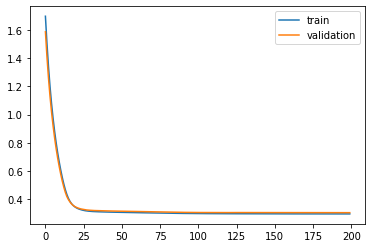

Time to train LSTM:  149.5530092716217
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 1.7421 - acc: 0.5378 - val_loss: 1.6281 - val_acc: 0.5706

Epoch 00001: val_loss improved from inf to 1.62814, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 1.5558 - acc: 0.5901 - val_loss: 1.4558 - val_acc: 0.6207

Epoch 00002: val_loss improved from 1.62814 to 1.45582, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 1.3928 - acc: 0.6362 - val_loss: 1.3060 - val_acc: 0.6658

Epoch 00003: val_loss improved from 1.45582 to 1.30599, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 1.2515 - acc: 0.6740 - val_loss: 1.1764 - val_acc: 0.6987

Epoch 00004: val_loss improved from 1.30599 to 1.17640, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 1.1291 - acc: 0.7064 - val_loss: 1.0641 - val_acc: 0.7268

Epoch 00005: val_loss improved from 1.17640 to 1.06409, saving model to Event_val_weights5.hdf5
Epoch 6/200

 - 1s - loss: 0.3032 - acc: 0.8876 - val_loss: 0.3057 - val_acc: 0.8861

Epoch 00046: val_loss improved from 0.30588 to 0.30572, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.3030 - acc: 0.8876 - val_loss: 0.3056 - val_acc: 0.8859

Epoch 00047: val_loss improved from 0.30572 to 0.30559, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.3029 - acc: 0.8875 - val_loss: 0.3054 - val_acc: 0.8859

Epoch 00048: val_loss improved from 0.30559 to 0.30541, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.3027 - acc: 0.8874 - val_loss: 0.3053 - val_acc: 0.8856

Epoch 00049: val_loss improved from 0.30541 to 0.30529, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3026 - acc: 0.8874 - val_loss: 0.3051 - val_acc: 0.8857

Epoch 00050: val_loss improved from 0.30529 to 0.30514, saving model to Event_val_weights5.hdf5
Epoch 51/200
 - 1s - loss: 0.3025 - acc: 0.8874 - val_loss: 0.3050 - val_acc: 0.8857

Epoch 00051: val_

 - 1s - loss: 0.2996 - acc: 0.8878 - val_loss: 0.3024 - val_acc: 0.8879

Epoch 00094: val_loss improved from 0.30244 to 0.30240, saving model to Event_val_weights5.hdf5
Epoch 95/200
 - 1s - loss: 0.2995 - acc: 0.8878 - val_loss: 0.3023 - val_acc: 0.8877

Epoch 00095: val_loss improved from 0.30240 to 0.30233, saving model to Event_val_weights5.hdf5
Epoch 96/200
 - 1s - loss: 0.2994 - acc: 0.8878 - val_loss: 0.3023 - val_acc: 0.8874

Epoch 00096: val_loss improved from 0.30233 to 0.30226, saving model to Event_val_weights5.hdf5
Epoch 97/200
 - 1s - loss: 0.2994 - acc: 0.8877 - val_loss: 0.3022 - val_acc: 0.8873

Epoch 00097: val_loss improved from 0.30226 to 0.30216, saving model to Event_val_weights5.hdf5
Epoch 98/200
 - 1s - loss: 0.2993 - acc: 0.8877 - val_loss: 0.3022 - val_acc: 0.8873

Epoch 00098: val_loss improved from 0.30216 to 0.30216, saving model to Event_val_weights5.hdf5
Epoch 99/200
 - 1s - loss: 0.2993 - acc: 0.8878 - val_loss: 0.3021 - val_acc: 0.8874

Epoch 00099: val_

 - 1s - loss: 0.2977 - acc: 0.8881 - val_loss: 0.3015 - val_acc: 0.8876

Epoch 00147: val_loss did not improve from 0.30149
Epoch 148/200
 - 1s - loss: 0.2977 - acc: 0.8881 - val_loss: 0.3014 - val_acc: 0.8880

Epoch 00148: val_loss improved from 0.30149 to 0.30142, saving model to Event_val_weights5.hdf5
Epoch 149/200
 - 1s - loss: 0.2977 - acc: 0.8882 - val_loss: 0.3015 - val_acc: 0.8878

Epoch 00149: val_loss did not improve from 0.30142
Epoch 150/200
 - 1s - loss: 0.2977 - acc: 0.8880 - val_loss: 0.3015 - val_acc: 0.8881

Epoch 00150: val_loss did not improve from 0.30142
Epoch 151/200
 - 1s - loss: 0.2976 - acc: 0.8882 - val_loss: 0.3015 - val_acc: 0.8881

Epoch 00151: val_loss did not improve from 0.30142
Epoch 152/200
 - 1s - loss: 0.2976 - acc: 0.8881 - val_loss: 0.3015 - val_acc: 0.8880

Epoch 00152: val_loss did not improve from 0.30142
Epoch 153/200
 - 1s - loss: 0.2976 - acc: 0.8881 - val_loss: 0.3014 - val_acc: 0.8883

Epoch 00153: val_loss improved from 0.30142 to 0.30138

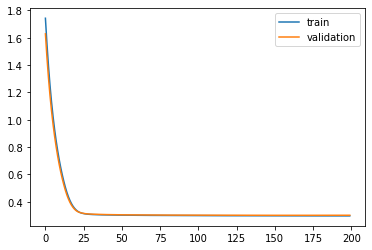

Time to train LSTM:  150.30744886398315
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 1.4039 - acc: 0.5639 - val_loss: 1.3065 - val_acc: 0.6028

Epoch 00001: val_loss improved from inf to 1.30647, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 1.2522 - acc: 0.6253 - val_loss: 1.1678 - val_acc: 0.6597

Epoch 00002: val_loss improved from 1.30647 to 1.16784, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 1.1230 - acc: 0.6739 - val_loss: 1.0492 - val_acc: 0.7021

Epoch 00003: val_loss improved from 1.16784 to 1.04921, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 1.0123 - acc: 0.7079 - val_loss: 0.9481 - val_acc: 0.7251

Epoch 00004: val_loss improved from 1.04921 to 0.94810, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 0.9170 - acc: 0.7320 - val_loss: 0.8606 - val_acc: 0.7486

Epoch 00005: val_loss improved from 0.94810 to 0.86060, saving model to Event_val_weights1.hdf5
Epoch 6/20

 - 1s - loss: 0.3022 - acc: 0.8883 - val_loss: 0.3021 - val_acc: 0.8876

Epoch 00046: val_loss did not improve from 0.30215
Epoch 47/200
 - 1s - loss: 0.3020 - acc: 0.8883 - val_loss: 0.3020 - val_acc: 0.8873

Epoch 00047: val_loss improved from 0.30215 to 0.30204, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3019 - acc: 0.8885 - val_loss: 0.3018 - val_acc: 0.8876

Epoch 00048: val_loss improved from 0.30204 to 0.30184, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.3018 - acc: 0.8885 - val_loss: 0.3017 - val_acc: 0.8870

Epoch 00049: val_loss improved from 0.30184 to 0.30173, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.3017 - acc: 0.8885 - val_loss: 0.3016 - val_acc: 0.8871

Epoch 00050: val_loss improved from 0.30173 to 0.30160, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.3016 - acc: 0.8885 - val_loss: 0.3016 - val_acc: 0.8871

Epoch 00051: val_loss improved from 0.30160 to 0.30156, saving


Epoch 00093: val_loss improved from 0.29820 to 0.29812, saving model to Event_val_weights1.hdf5
Epoch 94/200
 - 1s - loss: 0.2982 - acc: 0.8882 - val_loss: 0.2981 - val_acc: 0.8876

Epoch 00094: val_loss did not improve from 0.29812
Epoch 95/200
 - 1s - loss: 0.2982 - acc: 0.8882 - val_loss: 0.2979 - val_acc: 0.8878

Epoch 00095: val_loss improved from 0.29812 to 0.29793, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.2981 - acc: 0.8881 - val_loss: 0.2980 - val_acc: 0.8876

Epoch 00096: val_loss did not improve from 0.29793
Epoch 97/200
 - 1s - loss: 0.2981 - acc: 0.8882 - val_loss: 0.2978 - val_acc: 0.8877

Epoch 00097: val_loss improved from 0.29793 to 0.29779, saving model to Event_val_weights1.hdf5
Epoch 98/200
 - 1s - loss: 0.2980 - acc: 0.8881 - val_loss: 0.2978 - val_acc: 0.8876

Epoch 00098: val_loss improved from 0.29779 to 0.29778, saving model to Event_val_weights1.hdf5
Epoch 99/200
 - 1s - loss: 0.2980 - acc: 0.8883 - val_loss: 0.2977 - val_acc: 0.887

 - 1s - loss: 0.2963 - acc: 0.8888 - val_loss: 0.2960 - val_acc: 0.8869

Epoch 00146: val_loss did not improve from 0.29576
Epoch 147/200
 - 1s - loss: 0.2962 - acc: 0.8888 - val_loss: 0.2960 - val_acc: 0.8868

Epoch 00147: val_loss did not improve from 0.29576
Epoch 148/200
 - 1s - loss: 0.2962 - acc: 0.8887 - val_loss: 0.2963 - val_acc: 0.8867

Epoch 00148: val_loss did not improve from 0.29576
Epoch 149/200
 - 1s - loss: 0.2961 - acc: 0.8888 - val_loss: 0.2961 - val_acc: 0.8867

Epoch 00149: val_loss did not improve from 0.29576
Epoch 150/200
 - 1s - loss: 0.2962 - acc: 0.8886 - val_loss: 0.2961 - val_acc: 0.8870

Epoch 00150: val_loss did not improve from 0.29576
Epoch 151/200
 - 1s - loss: 0.2961 - acc: 0.8890 - val_loss: 0.2961 - val_acc: 0.8866

Epoch 00151: val_loss did not improve from 0.29576
Epoch 152/200
 - 1s - loss: 0.2961 - acc: 0.8887 - val_loss: 0.2961 - val_acc: 0.8869

Epoch 00152: val_loss did not improve from 0.29576
Epoch 153/200
 - 1s - loss: 0.2960 - acc: 0.8887

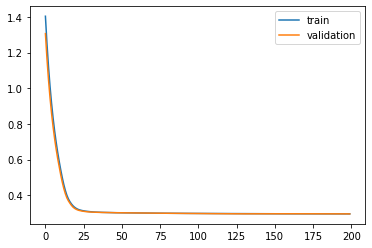

Time to train LSTM:  151.21984934806824
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 1.3939 - acc: 0.5412 - val_loss: 1.2964 - val_acc: 0.5818

Epoch 00001: val_loss improved from inf to 1.29638, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 1.2367 - acc: 0.6033 - val_loss: 1.1541 - val_acc: 0.6362

Epoch 00002: val_loss improved from 1.29638 to 1.15405, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 1.1039 - acc: 0.6553 - val_loss: 1.0345 - val_acc: 0.6800

Epoch 00003: val_loss improved from 1.15405 to 1.03446, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 0.9906 - acc: 0.6970 - val_loss: 0.9318 - val_acc: 0.7154

Epoch 00004: val_loss improved from 1.03446 to 0.93180, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 0.8923 - acc: 0.7299 - val_loss: 0.8420 - val_acc: 0.7483

Epoch 00005: val_loss improved from 0.93180 to 0.84205, saving model to Event_val_weights2.hdf5
Epoch 6/20

 - 1s - loss: 0.3068 - acc: 0.8877 - val_loss: 0.3151 - val_acc: 0.8822

Epoch 00046: val_loss improved from 0.31576 to 0.31512, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.3065 - acc: 0.8876 - val_loss: 0.3152 - val_acc: 0.8819

Epoch 00047: val_loss did not improve from 0.31512
Epoch 48/200
 - 1s - loss: 0.3062 - acc: 0.8877 - val_loss: 0.3145 - val_acc: 0.8820

Epoch 00048: val_loss improved from 0.31512 to 0.31452, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.3058 - acc: 0.8876 - val_loss: 0.3146 - val_acc: 0.8821

Epoch 00049: val_loss did not improve from 0.31452
Epoch 50/200
 - 1s - loss: 0.3056 - acc: 0.8879 - val_loss: 0.3140 - val_acc: 0.8822

Epoch 00050: val_loss improved from 0.31452 to 0.31398, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.3053 - acc: 0.8877 - val_loss: 0.3140 - val_acc: 0.8818

Epoch 00051: val_loss did not improve from 0.31398
Epoch 52/200
 - 1s - loss: 0.3051 - acc: 0.8878 - val_lo

 - 1s - loss: 0.3003 - acc: 0.8880 - val_loss: 0.3089 - val_acc: 0.8821

Epoch 00093: val_loss did not improve from 0.30885
Epoch 94/200
 - 1s - loss: 0.3003 - acc: 0.8881 - val_loss: 0.3088 - val_acc: 0.8821

Epoch 00094: val_loss improved from 0.30885 to 0.30876, saving model to Event_val_weights2.hdf5
Epoch 95/200
 - 1s - loss: 0.3002 - acc: 0.8881 - val_loss: 0.3087 - val_acc: 0.8821

Epoch 00095: val_loss improved from 0.30876 to 0.30873, saving model to Event_val_weights2.hdf5
Epoch 96/200
 - 1s - loss: 0.3002 - acc: 0.8882 - val_loss: 0.3086 - val_acc: 0.8821

Epoch 00096: val_loss improved from 0.30873 to 0.30862, saving model to Event_val_weights2.hdf5
Epoch 97/200
 - 1s - loss: 0.3001 - acc: 0.8881 - val_loss: 0.3086 - val_acc: 0.8822

Epoch 00097: val_loss improved from 0.30862 to 0.30862, saving model to Event_val_weights2.hdf5
Epoch 98/200
 - 1s - loss: 0.3001 - acc: 0.8882 - val_loss: 0.3085 - val_acc: 0.8820

Epoch 00098: val_loss improved from 0.30862 to 0.30850, saving

 - 1s - loss: 0.2980 - acc: 0.8888 - val_loss: 0.3064 - val_acc: 0.8837

Epoch 00140: val_loss did not improve from 0.30633
Epoch 141/200
 - 1s - loss: 0.2980 - acc: 0.8887 - val_loss: 0.3062 - val_acc: 0.8837

Epoch 00141: val_loss improved from 0.30633 to 0.30622, saving model to Event_val_weights2.hdf5
Epoch 142/200
 - 1s - loss: 0.2979 - acc: 0.8888 - val_loss: 0.3061 - val_acc: 0.8834

Epoch 00142: val_loss improved from 0.30622 to 0.30608, saving model to Event_val_weights2.hdf5
Epoch 143/200
 - 1s - loss: 0.2978 - acc: 0.8887 - val_loss: 0.3062 - val_acc: 0.8834

Epoch 00143: val_loss did not improve from 0.30608
Epoch 144/200
 - 1s - loss: 0.2978 - acc: 0.8888 - val_loss: 0.3059 - val_acc: 0.8839

Epoch 00144: val_loss improved from 0.30608 to 0.30588, saving model to Event_val_weights2.hdf5
Epoch 145/200
 - 1s - loss: 0.2978 - acc: 0.8888 - val_loss: 0.3060 - val_acc: 0.8836

Epoch 00145: val_loss did not improve from 0.30588
Epoch 146/200
 - 1s - loss: 0.2976 - acc: 0.8890 - 


Epoch 00190: val_loss did not improve from 0.30453
Epoch 191/200
 - 1s - loss: 0.2960 - acc: 0.8892 - val_loss: 0.3046 - val_acc: 0.8840

Epoch 00191: val_loss did not improve from 0.30453
Epoch 192/200
 - 1s - loss: 0.2960 - acc: 0.8891 - val_loss: 0.3044 - val_acc: 0.8840

Epoch 00192: val_loss improved from 0.30453 to 0.30444, saving model to Event_val_weights2.hdf5
Epoch 193/200
 - 1s - loss: 0.2960 - acc: 0.8891 - val_loss: 0.3047 - val_acc: 0.8839

Epoch 00193: val_loss did not improve from 0.30444
Epoch 194/200
 - 1s - loss: 0.2960 - acc: 0.8892 - val_loss: 0.3045 - val_acc: 0.8843

Epoch 00194: val_loss did not improve from 0.30444
Epoch 195/200
 - 1s - loss: 0.2959 - acc: 0.8891 - val_loss: 0.3046 - val_acc: 0.8840

Epoch 00195: val_loss did not improve from 0.30444
Epoch 196/200
 - 1s - loss: 0.2959 - acc: 0.8891 - val_loss: 0.3046 - val_acc: 0.8840

Epoch 00196: val_loss did not improve from 0.30444
Epoch 197/200
 - 1s - loss: 0.2959 - acc: 0.8891 - val_loss: 0.3046 - val_a

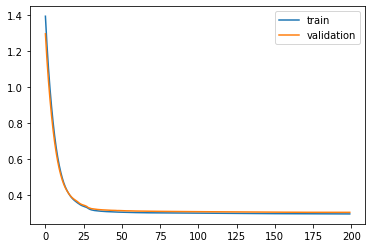

Time to train LSTM:  150.6290397644043


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f8978e2e7b8>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 1.3509 - acc: 0.5390 - val_loss: 1.2712 - val_acc: 0.5607

Epoch 00001: val_loss improved from inf to 1.27124, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 1.2116 - acc: 0.5849 - val_loss: 1.1418 - val_acc: 0.6093

Epoch 00002: val_loss improved from 1.27124 to 1.14183, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 1.0898 - acc: 0.6372 - val_loss: 1.0300 - val_acc: 0.6596

Epoch 00003: val_loss improved from 1.14183 to 1.02997, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 0.9865 - acc: 0.6836 - val_loss: 0.9362 - val_acc: 0.7011

Epoch 00004: val_loss improved from 1.02997 to 0.93620, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 0.8999 - acc: 0.7148 - val_loss: 0.8573 - val_acc: 0.7259

Epoch 00005: val_loss improved from 0.93620 to 0.85731, saving model to Event_val_weights3.hdf5
Epoch 6/200
 - 1s - loss: 0.8256 - acc: 0.7341 - v

 - 1s - loss: 0.3080 - acc: 0.8874 - val_loss: 0.3102 - val_acc: 0.8861

Epoch 00046: val_loss improved from 0.31046 to 0.31015, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3077 - acc: 0.8875 - val_loss: 0.3099 - val_acc: 0.8863

Epoch 00047: val_loss improved from 0.31015 to 0.30988, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.3074 - acc: 0.8874 - val_loss: 0.3096 - val_acc: 0.8862

Epoch 00048: val_loss improved from 0.30988 to 0.30962, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.3072 - acc: 0.8874 - val_loss: 0.3094 - val_acc: 0.8858

Epoch 00049: val_loss improved from 0.30962 to 0.30940, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.3070 - acc: 0.8874 - val_loss: 0.3091 - val_acc: 0.8856

Epoch 00050: val_loss improved from 0.30940 to 0.30912, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3068 - acc: 0.8873 - val_loss: 0.3089 - val_acc: 0.8858

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30433 to 0.30430, saving model to Event_val_weights3.hdf5
Epoch 92/200
 - 1s - loss: 0.3021 - acc: 0.8875 - val_loss: 0.3042 - val_acc: 0.8862

Epoch 00092: val_loss improved from 0.30430 to 0.30422, saving model to Event_val_weights3.hdf5
Epoch 93/200
 - 1s - loss: 0.3020 - acc: 0.8875 - val_loss: 0.3042 - val_acc: 0.8862

Epoch 00093: val_loss improved from 0.30422 to 0.30418, saving model to Event_val_weights3.hdf5
Epoch 94/200
 - 1s - loss: 0.3019 - acc: 0.8875 - val_loss: 0.3041 - val_acc: 0.8861

Epoch 00094: val_loss improved from 0.30418 to 0.30411, saving model to Event_val_weights3.hdf5
Epoch 95/200
 - 1s - loss: 0.3019 - acc: 0.8874 - val_loss: 0.3041 - val_acc: 0.8862

Epoch 00095: val_loss improved from 0.30411 to 0.30407, saving model to Event_val_weights3.hdf5
Epoch 96/200
 - 1s - loss: 0.3018 - acc: 0.8874 - val_loss: 0.3040 - val_acc: 0.8862

Epoch 00096: val_loss improved from 0.30407 to 0.30400, saving model to Event_val_weights

 - 1s - loss: 0.3000 - acc: 0.8881 - val_loss: 0.3027 - val_acc: 0.8864

Epoch 00139: val_loss did not improve from 0.30268
Epoch 140/200
 - 1s - loss: 0.3000 - acc: 0.8881 - val_loss: 0.3027 - val_acc: 0.8864

Epoch 00140: val_loss improved from 0.30268 to 0.30265, saving model to Event_val_weights3.hdf5
Epoch 141/200
 - 1s - loss: 0.3000 - acc: 0.8881 - val_loss: 0.3027 - val_acc: 0.8864

Epoch 00141: val_loss did not improve from 0.30265
Epoch 142/200
 - 1s - loss: 0.2999 - acc: 0.8881 - val_loss: 0.3026 - val_acc: 0.8863

Epoch 00142: val_loss improved from 0.30265 to 0.30262, saving model to Event_val_weights3.hdf5
Epoch 143/200
 - 1s - loss: 0.2999 - acc: 0.8881 - val_loss: 0.3026 - val_acc: 0.8862

Epoch 00143: val_loss did not improve from 0.30262
Epoch 144/200
 - 1s - loss: 0.2999 - acc: 0.8880 - val_loss: 0.3026 - val_acc: 0.8863

Epoch 00144: val_loss improved from 0.30262 to 0.30259, saving model to Event_val_weights3.hdf5
Epoch 145/200
 - 1s - loss: 0.2998 - acc: 0.8881 - 


Epoch 00190: val_loss improved from 0.30207 to 0.30204, saving model to Event_val_weights3.hdf5
Epoch 191/200
 - 1s - loss: 0.2987 - acc: 0.8878 - val_loss: 0.3021 - val_acc: 0.8872

Epoch 00191: val_loss did not improve from 0.30204
Epoch 192/200
 - 1s - loss: 0.2987 - acc: 0.8877 - val_loss: 0.3020 - val_acc: 0.8872

Epoch 00192: val_loss improved from 0.30204 to 0.30203, saving model to Event_val_weights3.hdf5
Epoch 193/200
 - 1s - loss: 0.2987 - acc: 0.8878 - val_loss: 0.3020 - val_acc: 0.8872

Epoch 00193: val_loss did not improve from 0.30203
Epoch 194/200
 - 1s - loss: 0.2986 - acc: 0.8877 - val_loss: 0.3020 - val_acc: 0.8871

Epoch 00194: val_loss improved from 0.30203 to 0.30201, saving model to Event_val_weights3.hdf5
Epoch 195/200
 - 1s - loss: 0.2986 - acc: 0.8877 - val_loss: 0.3020 - val_acc: 0.8872

Epoch 00195: val_loss did not improve from 0.30201
Epoch 196/200
 - 1s - loss: 0.2986 - acc: 0.8876 - val_loss: 0.3020 - val_acc: 0.8871

Epoch 00196: val_loss improved from 

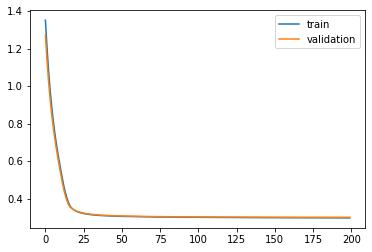

Time to train LSTM:  158.52031707763672
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 1.3467 - acc: 0.5341 - val_loss: 1.2730 - val_acc: 0.5659

Epoch 00001: val_loss improved from inf to 1.27296, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 1.2246 - acc: 0.5803 - val_loss: 1.1604 - val_acc: 0.6116

Epoch 00002: val_loss improved from 1.27296 to 1.16042, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 1.1183 - acc: 0.6211 - val_loss: 1.0617 - val_acc: 0.6509

Epoch 00003: val_loss improved from 1.16042 to 1.06171, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 1.0249 - acc: 0.6558 - val_loss: 0.9742 - val_acc: 0.6848

Epoch 00004: val_loss improved from 1.06171 to 0.97416, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 0.9419 - acc: 0.6851 - val_loss: 0.8956 - val_acc: 0.7100

Epoch 00005: val_loss improved from 0.97416 to 0.89564, saving model to Event_val_weights4.hdf5
Epoch 6/20

 - 1s - loss: 0.3090 - acc: 0.8872 - val_loss: 0.3152 - val_acc: 0.8858

Epoch 00046: val_loss improved from 0.31548 to 0.31523, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.3087 - acc: 0.8872 - val_loss: 0.3150 - val_acc: 0.8859

Epoch 00047: val_loss improved from 0.31523 to 0.31498, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.3084 - acc: 0.8873 - val_loss: 0.3147 - val_acc: 0.8859

Epoch 00048: val_loss improved from 0.31498 to 0.31471, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.3082 - acc: 0.8873 - val_loss: 0.3145 - val_acc: 0.8859

Epoch 00049: val_loss improved from 0.31471 to 0.31448, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3079 - acc: 0.8873 - val_loss: 0.3142 - val_acc: 0.8859

Epoch 00050: val_loss improved from 0.31448 to 0.31423, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.3077 - acc: 0.8873 - val_loss: 0.3140 - val_acc: 0.8859

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30934 to 0.30926, saving model to Event_val_weights4.hdf5
Epoch 92/200
 - 1s - loss: 0.3026 - acc: 0.8877 - val_loss: 0.3092 - val_acc: 0.8852

Epoch 00092: val_loss improved from 0.30926 to 0.30920, saving model to Event_val_weights4.hdf5
Epoch 93/200
 - 1s - loss: 0.3025 - acc: 0.8878 - val_loss: 0.3092 - val_acc: 0.8853

Epoch 00093: val_loss improved from 0.30920 to 0.30915, saving model to Event_val_weights4.hdf5
Epoch 94/200
 - 1s - loss: 0.3024 - acc: 0.8877 - val_loss: 0.3091 - val_acc: 0.8853

Epoch 00094: val_loss improved from 0.30915 to 0.30907, saving model to Event_val_weights4.hdf5
Epoch 95/200
 - 1s - loss: 0.3024 - acc: 0.8877 - val_loss: 0.3090 - val_acc: 0.8853

Epoch 00095: val_loss improved from 0.30907 to 0.30902, saving model to Event_val_weights4.hdf5
Epoch 96/200
 - 1s - loss: 0.3023 - acc: 0.8878 - val_loss: 0.3090 - val_acc: 0.8854

Epoch 00096: val_loss improved from 0.30902 to 0.30896, saving model to Event_val_weights

 - 1s - loss: 0.3002 - acc: 0.8877 - val_loss: 0.3074 - val_acc: 0.8859

Epoch 00137: val_loss did not improve from 0.30737
Epoch 138/200
 - 1s - loss: 0.3001 - acc: 0.8878 - val_loss: 0.3073 - val_acc: 0.8859

Epoch 00138: val_loss improved from 0.30737 to 0.30733, saving model to Event_val_weights4.hdf5
Epoch 139/200
 - 1s - loss: 0.3001 - acc: 0.8877 - val_loss: 0.3073 - val_acc: 0.8858

Epoch 00139: val_loss improved from 0.30733 to 0.30732, saving model to Event_val_weights4.hdf5
Epoch 140/200
 - 1s - loss: 0.3000 - acc: 0.8877 - val_loss: 0.3073 - val_acc: 0.8859

Epoch 00140: val_loss improved from 0.30732 to 0.30729, saving model to Event_val_weights4.hdf5
Epoch 141/200
 - 1s - loss: 0.3000 - acc: 0.8878 - val_loss: 0.3073 - val_acc: 0.8857

Epoch 00141: val_loss improved from 0.30729 to 0.30727, saving model to Event_val_weights4.hdf5
Epoch 142/200
 - 1s - loss: 0.3000 - acc: 0.8878 - val_loss: 0.3072 - val_acc: 0.8858

Epoch 00142: val_loss improved from 0.30727 to 0.30724, s

 - 1s - loss: 0.2987 - acc: 0.8883 - val_loss: 0.3068 - val_acc: 0.8860

Epoch 00185: val_loss did not improve from 0.30678
Epoch 186/200
 - 1s - loss: 0.2987 - acc: 0.8884 - val_loss: 0.3068 - val_acc: 0.8861

Epoch 00186: val_loss improved from 0.30678 to 0.30677, saving model to Event_val_weights4.hdf5
Epoch 187/200
 - 1s - loss: 0.2987 - acc: 0.8883 - val_loss: 0.3068 - val_acc: 0.8862

Epoch 00187: val_loss did not improve from 0.30677
Epoch 188/200
 - 1s - loss: 0.2987 - acc: 0.8883 - val_loss: 0.3068 - val_acc: 0.8861

Epoch 00188: val_loss improved from 0.30677 to 0.30677, saving model to Event_val_weights4.hdf5
Epoch 189/200
 - 1s - loss: 0.2986 - acc: 0.8883 - val_loss: 0.3068 - val_acc: 0.8862

Epoch 00189: val_loss improved from 0.30677 to 0.30677, saving model to Event_val_weights4.hdf5
Epoch 190/200
 - 1s - loss: 0.2986 - acc: 0.8884 - val_loss: 0.3068 - val_acc: 0.8863

Epoch 00190: val_loss improved from 0.30677 to 0.30676, saving model to Event_val_weights4.hdf5
Epoch 

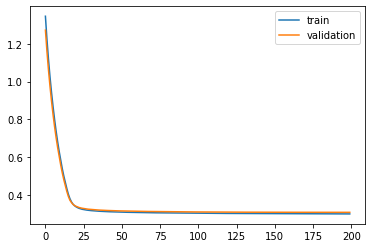

Time to train LSTM:  154.16940832138062
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 1.6701 - acc: 0.4677 - val_loss: 1.5241 - val_acc: 0.5156

Epoch 00001: val_loss improved from inf to 1.52414, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 1.4430 - acc: 0.5410 - val_loss: 1.3308 - val_acc: 0.5746

Epoch 00002: val_loss improved from 1.52414 to 1.33079, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 1.2698 - acc: 0.5998 - val_loss: 1.1806 - val_acc: 0.6291

Epoch 00003: val_loss improved from 1.33079 to 1.18056, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 1.1325 - acc: 0.6495 - val_loss: 1.0585 - val_acc: 0.6794

Epoch 00004: val_loss improved from 1.18056 to 1.05855, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 1.0197 - acc: 0.6886 - val_loss: 0.9564 - val_acc: 0.7134

Epoch 00005: val_loss improved from 1.05855 to 0.95645, saving model to Event_val_weights5.hdf5
Epoch 6/20

 - 1s - loss: 0.3051 - acc: 0.8880 - val_loss: 0.3077 - val_acc: 0.8876

Epoch 00046: val_loss improved from 0.30805 to 0.30774, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.3049 - acc: 0.8880 - val_loss: 0.3076 - val_acc: 0.8873

Epoch 00047: val_loss improved from 0.30774 to 0.30760, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.3048 - acc: 0.8878 - val_loss: 0.3074 - val_acc: 0.8871

Epoch 00048: val_loss improved from 0.30760 to 0.30739, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.3047 - acc: 0.8878 - val_loss: 0.3074 - val_acc: 0.8873

Epoch 00049: val_loss improved from 0.30739 to 0.30737, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3046 - acc: 0.8878 - val_loss: 0.3072 - val_acc: 0.8873

Epoch 00050: val_loss improved from 0.30737 to 0.30724, saving model to Event_val_weights5.hdf5
Epoch 51/200
 - 1s - loss: 0.3044 - acc: 0.8879 - val_loss: 0.3072 - val_acc: 0.8870

Epoch 00051: val_

 - 1s - loss: 0.3015 - acc: 0.8874 - val_loss: 0.3040 - val_acc: 0.8859

Epoch 00097: val_loss did not improve from 0.30399
Epoch 98/200
 - 1s - loss: 0.3015 - acc: 0.8875 - val_loss: 0.3040 - val_acc: 0.8860

Epoch 00098: val_loss did not improve from 0.30399
Epoch 99/200
 - 1s - loss: 0.3015 - acc: 0.8875 - val_loss: 0.3039 - val_acc: 0.8861

Epoch 00099: val_loss improved from 0.30399 to 0.30390, saving model to Event_val_weights5.hdf5
Epoch 100/200
 - 1s - loss: 0.3015 - acc: 0.8875 - val_loss: 0.3038 - val_acc: 0.8860

Epoch 00100: val_loss improved from 0.30390 to 0.30380, saving model to Event_val_weights5.hdf5
Epoch 101/200
 - 1s - loss: 0.3014 - acc: 0.8874 - val_loss: 0.3038 - val_acc: 0.8863

Epoch 00101: val_loss did not improve from 0.30380
Epoch 102/200
 - 1s - loss: 0.3014 - acc: 0.8874 - val_loss: 0.3037 - val_acc: 0.8860

Epoch 00102: val_loss improved from 0.30380 to 0.30372, saving model to Event_val_weights5.hdf5
Epoch 103/200
 - 1s - loss: 0.3013 - acc: 0.8874 - va

 - 1s - loss: 0.2999 - acc: 0.8873 - val_loss: 0.3026 - val_acc: 0.8860

Epoch 00150: val_loss improved from 0.30269 to 0.30263, saving model to Event_val_weights5.hdf5
Epoch 151/200
 - 1s - loss: 0.2999 - acc: 0.8874 - val_loss: 0.3027 - val_acc: 0.8860

Epoch 00151: val_loss did not improve from 0.30263
Epoch 152/200
 - 1s - loss: 0.2999 - acc: 0.8873 - val_loss: 0.3027 - val_acc: 0.8859

Epoch 00152: val_loss did not improve from 0.30263
Epoch 153/200
 - 1s - loss: 0.2998 - acc: 0.8873 - val_loss: 0.3026 - val_acc: 0.8860

Epoch 00153: val_loss improved from 0.30263 to 0.30262, saving model to Event_val_weights5.hdf5
Epoch 154/200
 - 1s - loss: 0.2998 - acc: 0.8872 - val_loss: 0.3025 - val_acc: 0.8861

Epoch 00154: val_loss improved from 0.30262 to 0.30254, saving model to Event_val_weights5.hdf5
Epoch 155/200
 - 1s - loss: 0.2998 - acc: 0.8872 - val_loss: 0.3027 - val_acc: 0.8860

Epoch 00155: val_loss did not improve from 0.30254
Epoch 156/200
 - 1s - loss: 0.2998 - acc: 0.8872 - 

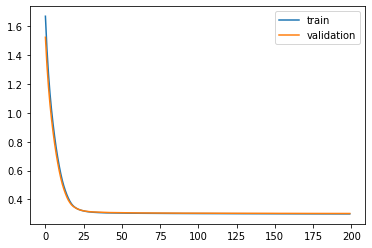

Time to train LSTM:  153.73225951194763
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 1.3465 - acc: 0.5235 - val_loss: 1.2615 - val_acc: 0.5606

Epoch 00001: val_loss improved from inf to 1.26146, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 1.1982 - acc: 0.5955 - val_loss: 1.1243 - val_acc: 0.6337

Epoch 00002: val_loss improved from 1.26146 to 1.12426, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 1.0733 - acc: 0.6566 - val_loss: 1.0087 - val_acc: 0.6901

Epoch 00003: val_loss improved from 1.12426 to 1.00869, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 0.9673 - acc: 0.7030 - val_loss: 0.9102 - val_acc: 0.7287

Epoch 00004: val_loss improved from 1.00869 to 0.91016, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 0.8763 - acc: 0.7384 - val_loss: 0.8256 - val_acc: 0.7582

Epoch 00005: val_loss improved from 0.91016 to 0.82558, saving model to Event_val_weights1.hdf5
Epoch 6/20

 - 1s - loss: 0.3037 - acc: 0.8878 - val_loss: 0.3015 - val_acc: 0.8869

Epoch 00046: val_loss improved from 0.30196 to 0.30152, saving model to Event_val_weights1.hdf5
Epoch 47/200
 - 1s - loss: 0.3034 - acc: 0.8877 - val_loss: 0.3013 - val_acc: 0.8868

Epoch 00047: val_loss improved from 0.30152 to 0.30132, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3031 - acc: 0.8877 - val_loss: 0.3010 - val_acc: 0.8870

Epoch 00048: val_loss improved from 0.30132 to 0.30098, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.3030 - acc: 0.8878 - val_loss: 0.3009 - val_acc: 0.8869

Epoch 00049: val_loss improved from 0.30098 to 0.30091, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.3028 - acc: 0.8878 - val_loss: 0.3007 - val_acc: 0.8877

Epoch 00050: val_loss improved from 0.30091 to 0.30069, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.3027 - acc: 0.8878 - val_loss: 0.3006 - val_acc: 0.8876

Epoch 00051: val_

 - 1s - loss: 0.3001 - acc: 0.8877 - val_loss: 0.2976 - val_acc: 0.8876

Epoch 00092: val_loss did not improve from 0.29760
Epoch 93/200
 - 1s - loss: 0.3000 - acc: 0.8877 - val_loss: 0.2975 - val_acc: 0.8873

Epoch 00093: val_loss improved from 0.29760 to 0.29755, saving model to Event_val_weights1.hdf5
Epoch 94/200
 - 1s - loss: 0.3000 - acc: 0.8877 - val_loss: 0.2975 - val_acc: 0.8876

Epoch 00094: val_loss improved from 0.29755 to 0.29753, saving model to Event_val_weights1.hdf5
Epoch 95/200
 - 1s - loss: 0.3000 - acc: 0.8878 - val_loss: 0.2975 - val_acc: 0.8876

Epoch 00095: val_loss improved from 0.29753 to 0.29750, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.3000 - acc: 0.8876 - val_loss: 0.2975 - val_acc: 0.8876

Epoch 00096: val_loss improved from 0.29750 to 0.29749, saving model to Event_val_weights1.hdf5
Epoch 97/200
 - 1s - loss: 0.2999 - acc: 0.8878 - val_loss: 0.2974 - val_acc: 0.8874

Epoch 00097: val_loss improved from 0.29749 to 0.29741, saving

 - 1s - loss: 0.2981 - acc: 0.8879 - val_loss: 0.2958 - val_acc: 0.8870

Epoch 00142: val_loss improved from 0.29583 to 0.29581, saving model to Event_val_weights1.hdf5
Epoch 143/200
 - 1s - loss: 0.2981 - acc: 0.8879 - val_loss: 0.2958 - val_acc: 0.8874

Epoch 00143: val_loss improved from 0.29581 to 0.29578, saving model to Event_val_weights1.hdf5
Epoch 144/200
 - 1s - loss: 0.2980 - acc: 0.8879 - val_loss: 0.2959 - val_acc: 0.8878

Epoch 00144: val_loss did not improve from 0.29578
Epoch 145/200
 - 1s - loss: 0.2980 - acc: 0.8879 - val_loss: 0.2955 - val_acc: 0.8879

Epoch 00145: val_loss improved from 0.29578 to 0.29551, saving model to Event_val_weights1.hdf5
Epoch 146/200
 - 1s - loss: 0.2979 - acc: 0.8880 - val_loss: 0.2959 - val_acc: 0.8879

Epoch 00146: val_loss did not improve from 0.29551
Epoch 147/200
 - 1s - loss: 0.2979 - acc: 0.8880 - val_loss: 0.2954 - val_acc: 0.8879

Epoch 00147: val_loss improved from 0.29551 to 0.29543, saving model to Event_val_weights1.hdf5
Epoch 


Epoch 00196: val_loss did not improve from 0.29475
Epoch 197/200
 - 1s - loss: 0.2963 - acc: 0.8880 - val_loss: 0.2949 - val_acc: 0.8890

Epoch 00197: val_loss did not improve from 0.29475
Epoch 198/200
 - 1s - loss: 0.2963 - acc: 0.8880 - val_loss: 0.2951 - val_acc: 0.8892

Epoch 00198: val_loss did not improve from 0.29475
Epoch 199/200
 - 1s - loss: 0.2962 - acc: 0.8881 - val_loss: 0.2951 - val_acc: 0.8891

Epoch 00199: val_loss did not improve from 0.29475
Epoch 200/200
 - 1s - loss: 0.2963 - acc: 0.8882 - val_loss: 0.2953 - val_acc: 0.8891

Epoch 00200: val_loss did not improve from 0.29475
#################################
Number of units: 4
Batch size: 8192
Fold: 0
L2_1: 0.08187987968624336
best val loss: 0.2947520616054535
#################################


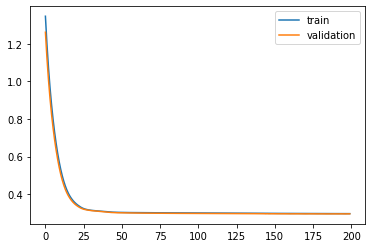

Time to train LSTM:  151.621928691864
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 1.3725 - acc: 0.5121 - val_loss: 1.2930 - val_acc: 0.5429

Epoch 00001: val_loss improved from inf to 1.29303, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 1.2294 - acc: 0.5717 - val_loss: 1.1605 - val_acc: 0.6014

Epoch 00002: val_loss improved from 1.29303 to 1.16046, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 1.1050 - acc: 0.6321 - val_loss: 1.0458 - val_acc: 0.6552

Epoch 00003: val_loss improved from 1.16046 to 1.04579, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 0.9978 - acc: 0.6839 - val_loss: 0.9473 - val_acc: 0.7026

Epoch 00004: val_loss improved from 1.04579 to 0.94731, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 0.9054 - acc: 0.7269 - val_loss: 0.8623 - val_acc: 0.7400

Epoch 00005: val_loss improved from 0.94731 to 0.86227, saving model to Event_val_weights2.hdf5
Epoch 6/200


 - 1s - loss: 0.3000 - acc: 0.8877 - val_loss: 0.3088 - val_acc: 0.8831

Epoch 00046: val_loss improved from 0.30895 to 0.30882, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.2999 - acc: 0.8877 - val_loss: 0.3087 - val_acc: 0.8831

Epoch 00047: val_loss improved from 0.30882 to 0.30872, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.2997 - acc: 0.8877 - val_loss: 0.3086 - val_acc: 0.8828

Epoch 00048: val_loss improved from 0.30872 to 0.30865, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.2996 - acc: 0.8878 - val_loss: 0.3086 - val_acc: 0.8829

Epoch 00049: val_loss improved from 0.30865 to 0.30858, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.2995 - acc: 0.8878 - val_loss: 0.3085 - val_acc: 0.8829

Epoch 00050: val_loss improved from 0.30858 to 0.30850, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.2995 - acc: 0.8877 - val_loss: 0.3084 - val_acc: 0.8830

Epoch 00051: val_


Epoch 00094: val_loss did not improve from 0.30715
Epoch 95/200
 - 1s - loss: 0.2976 - acc: 0.8878 - val_loss: 0.3074 - val_acc: 0.8842

Epoch 00095: val_loss did not improve from 0.30715
Epoch 96/200
 - 1s - loss: 0.2975 - acc: 0.8878 - val_loss: 0.3074 - val_acc: 0.8840

Epoch 00096: val_loss did not improve from 0.30715
Epoch 97/200
 - 1s - loss: 0.2975 - acc: 0.8878 - val_loss: 0.3075 - val_acc: 0.8842

Epoch 00097: val_loss did not improve from 0.30715
Epoch 98/200
 - 1s - loss: 0.2975 - acc: 0.8879 - val_loss: 0.3076 - val_acc: 0.8839

Epoch 00098: val_loss did not improve from 0.30715
Epoch 99/200
 - 1s - loss: 0.2974 - acc: 0.8878 - val_loss: 0.3076 - val_acc: 0.8839

Epoch 00099: val_loss did not improve from 0.30715
Epoch 100/200
 - 1s - loss: 0.2974 - acc: 0.8877 - val_loss: 0.3077 - val_acc: 0.8839

Epoch 00100: val_loss did not improve from 0.30715
Epoch 101/200
 - 1s - loss: 0.2973 - acc: 0.8877 - val_loss: 0.3077 - val_acc: 0.8841

Epoch 00101: val_loss did not improve 


Epoch 00153: val_loss did not improve from 0.30654
Epoch 154/200
 - 1s - loss: 0.2966 - acc: 0.8883 - val_loss: 0.3069 - val_acc: 0.8838

Epoch 00154: val_loss did not improve from 0.30654
Epoch 155/200
 - 1s - loss: 0.2964 - acc: 0.8884 - val_loss: 0.3064 - val_acc: 0.8842

Epoch 00155: val_loss improved from 0.30654 to 0.30643, saving model to Event_val_weights2.hdf5
Epoch 156/200
 - 1s - loss: 0.2966 - acc: 0.8883 - val_loss: 0.3071 - val_acc: 0.8841

Epoch 00156: val_loss did not improve from 0.30643
Epoch 157/200
 - 1s - loss: 0.2969 - acc: 0.8880 - val_loss: 0.3071 - val_acc: 0.8836

Epoch 00157: val_loss did not improve from 0.30643
Epoch 158/200
 - 1s - loss: 0.2970 - acc: 0.8879 - val_loss: 0.3071 - val_acc: 0.8840

Epoch 00158: val_loss did not improve from 0.30643
Epoch 159/200
 - 1s - loss: 0.2966 - acc: 0.8883 - val_loss: 0.3070 - val_acc: 0.8847

Epoch 00159: val_loss did not improve from 0.30643
Epoch 160/200
 - 1s - loss: 0.2969 - acc: 0.8881 - val_loss: 0.3070 - val_a

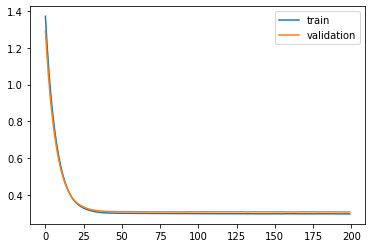

Time to train LSTM:  151.48732924461365
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 1.2958 - acc: 0.6089 - val_loss: 1.2276 - val_acc: 0.6279

Epoch 00001: val_loss improved from inf to 1.22756, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 1.1658 - acc: 0.6512 - val_loss: 1.1080 - val_acc: 0.6657

Epoch 00002: val_loss improved from 1.22756 to 1.10802, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 1.0549 - acc: 0.6841 - val_loss: 1.0053 - val_acc: 0.6978

Epoch 00003: val_loss improved from 1.10802 to 1.00531, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 0.9592 - acc: 0.7093 - val_loss: 0.9162 - val_acc: 0.7219

Epoch 00004: val_loss improved from 1.00531 to 0.91617, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 0.8752 - acc: 0.7331 - val_loss: 0.8377 - val_acc: 0.7446

Epoch 00005: val_loss improved from 0.91617 to 0.83768, saving model to Event_val_weights3.hdf5
Epoch 6/20

 - 1s - loss: 0.3000 - acc: 0.8885 - val_loss: 0.3057 - val_acc: 0.8852

Epoch 00046: val_loss improved from 0.30586 to 0.30574, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.2998 - acc: 0.8886 - val_loss: 0.3057 - val_acc: 0.8853

Epoch 00047: val_loss improved from 0.30574 to 0.30567, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.2998 - acc: 0.8885 - val_loss: 0.3055 - val_acc: 0.8854

Epoch 00048: val_loss improved from 0.30567 to 0.30554, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.2997 - acc: 0.8885 - val_loss: 0.3055 - val_acc: 0.8853

Epoch 00049: val_loss improved from 0.30554 to 0.30548, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.2997 - acc: 0.8884 - val_loss: 0.3054 - val_acc: 0.8856

Epoch 00050: val_loss improved from 0.30548 to 0.30545, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.2996 - acc: 0.8885 - val_loss: 0.3054 - val_acc: 0.8856

Epoch 00051: val_

 - 1s - loss: 0.2974 - acc: 0.8887 - val_loss: 0.3040 - val_acc: 0.8858

Epoch 00096: val_loss improved from 0.30405 to 0.30400, saving model to Event_val_weights3.hdf5
Epoch 97/200
 - 1s - loss: 0.2973 - acc: 0.8886 - val_loss: 0.3040 - val_acc: 0.8860

Epoch 00097: val_loss improved from 0.30400 to 0.30398, saving model to Event_val_weights3.hdf5
Epoch 98/200
 - 1s - loss: 0.2973 - acc: 0.8887 - val_loss: 0.3040 - val_acc: 0.8862

Epoch 00098: val_loss did not improve from 0.30398
Epoch 99/200
 - 1s - loss: 0.2973 - acc: 0.8886 - val_loss: 0.3039 - val_acc: 0.8862

Epoch 00099: val_loss improved from 0.30398 to 0.30385, saving model to Event_val_weights3.hdf5
Epoch 100/200
 - 1s - loss: 0.2972 - acc: 0.8887 - val_loss: 0.3039 - val_acc: 0.8861

Epoch 00100: val_loss did not improve from 0.30385
Epoch 101/200
 - 1s - loss: 0.2972 - acc: 0.8884 - val_loss: 0.3038 - val_acc: 0.8861

Epoch 00101: val_loss improved from 0.30385 to 0.30377, saving model to Event_val_weights3.hdf5
Epoch 102


Epoch 00151: val_loss did not improve from 0.30313
Epoch 152/200
 - 1s - loss: 0.2961 - acc: 0.8888 - val_loss: 0.3031 - val_acc: 0.8849

Epoch 00152: val_loss improved from 0.30313 to 0.30310, saving model to Event_val_weights3.hdf5
Epoch 153/200
 - 1s - loss: 0.2962 - acc: 0.8890 - val_loss: 0.3040 - val_acc: 0.8851

Epoch 00153: val_loss did not improve from 0.30310
Epoch 154/200
 - 1s - loss: 0.2963 - acc: 0.8887 - val_loss: 0.3042 - val_acc: 0.8847

Epoch 00154: val_loss did not improve from 0.30310
Epoch 155/200
 - 1s - loss: 0.2961 - acc: 0.8886 - val_loss: 0.3041 - val_acc: 0.8843

Epoch 00155: val_loss did not improve from 0.30310
Epoch 156/200
 - 1s - loss: 0.2962 - acc: 0.8887 - val_loss: 0.3036 - val_acc: 0.8860

Epoch 00156: val_loss did not improve from 0.30310
Epoch 157/200
 - 1s - loss: 0.2961 - acc: 0.8887 - val_loss: 0.3037 - val_acc: 0.8852

Epoch 00157: val_loss did not improve from 0.30310
Epoch 158/200
 - 1s - loss: 0.2964 - acc: 0.8883 - val_loss: 0.3037 - val_a

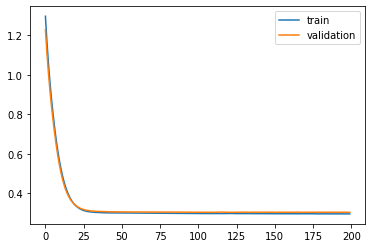

Time to train LSTM:  152.2324001789093
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 1.4755 - acc: 0.5260 - val_loss: 1.3744 - val_acc: 0.5621

Epoch 00001: val_loss improved from inf to 1.37440, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 1.3141 - acc: 0.5804 - val_loss: 1.2260 - val_acc: 0.6167

Epoch 00002: val_loss improved from 1.37440 to 1.22602, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 1.1771 - acc: 0.6331 - val_loss: 1.0998 - val_acc: 0.6679

Epoch 00003: val_loss improved from 1.22602 to 1.09980, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 1.0591 - acc: 0.6772 - val_loss: 0.9908 - val_acc: 0.7078

Epoch 00004: val_loss improved from 1.09980 to 0.99084, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 0.9567 - acc: 0.7148 - val_loss: 0.8967 - val_acc: 0.7371

Epoch 00005: val_loss improved from 0.99084 to 0.89666, saving model to Event_val_weights4.hdf5
Epoch 6/200

 - 1s - loss: 0.3004 - acc: 0.8894 - val_loss: 0.3112 - val_acc: 0.8818

Epoch 00047: val_loss did not improve from 0.31080
Epoch 48/200
 - 1s - loss: 0.3002 - acc: 0.8893 - val_loss: 0.3114 - val_acc: 0.8811

Epoch 00048: val_loss did not improve from 0.31080
Epoch 49/200
 - 1s - loss: 0.3000 - acc: 0.8894 - val_loss: 0.3109 - val_acc: 0.8816

Epoch 00049: val_loss did not improve from 0.31080
Epoch 50/200
 - 1s - loss: 0.2998 - acc: 0.8894 - val_loss: 0.3105 - val_acc: 0.8821

Epoch 00050: val_loss improved from 0.31080 to 0.31051, saving model to Event_val_weights4.hdf5
Epoch 51/200
 - 1s - loss: 0.2996 - acc: 0.8894 - val_loss: 0.3104 - val_acc: 0.8824

Epoch 00051: val_loss improved from 0.31051 to 0.31041, saving model to Event_val_weights4.hdf5
Epoch 52/200
 - 1s - loss: 0.2996 - acc: 0.8895 - val_loss: 0.3106 - val_acc: 0.8823

Epoch 00052: val_loss did not improve from 0.31041
Epoch 53/200
 - 1s - loss: 0.2994 - acc: 0.8894 - val_loss: 0.3109 - val_acc: 0.8820

Epoch 00053: va

 - 1s - loss: 0.2966 - acc: 0.8901 - val_loss: 0.3089 - val_acc: 0.8823

Epoch 00101: val_loss did not improve from 0.30857
Epoch 102/200
 - 1s - loss: 0.2966 - acc: 0.8902 - val_loss: 0.3093 - val_acc: 0.8823

Epoch 00102: val_loss did not improve from 0.30857
Epoch 103/200
 - 1s - loss: 0.2966 - acc: 0.8901 - val_loss: 0.3090 - val_acc: 0.8826

Epoch 00103: val_loss did not improve from 0.30857
Epoch 104/200
 - 1s - loss: 0.2965 - acc: 0.8900 - val_loss: 0.3092 - val_acc: 0.8827

Epoch 00104: val_loss did not improve from 0.30857
Epoch 105/200
 - 1s - loss: 0.2966 - acc: 0.8902 - val_loss: 0.3088 - val_acc: 0.8827

Epoch 00105: val_loss did not improve from 0.30857
Epoch 106/200
 - 1s - loss: 0.2965 - acc: 0.8899 - val_loss: 0.3088 - val_acc: 0.8828

Epoch 00106: val_loss did not improve from 0.30857
Epoch 107/200
 - 1s - loss: 0.2965 - acc: 0.8901 - val_loss: 0.3087 - val_acc: 0.8826

Epoch 00107: val_loss did not improve from 0.30857
Epoch 108/200
 - 1s - loss: 0.2964 - acc: 0.8900


Epoch 00158: val_loss did not improve from 0.30811
Epoch 159/200
 - 1s - loss: 0.2958 - acc: 0.8901 - val_loss: 0.3083 - val_acc: 0.8827

Epoch 00159: val_loss did not improve from 0.30811
Epoch 160/200
 - 1s - loss: 0.2957 - acc: 0.8900 - val_loss: 0.3084 - val_acc: 0.8821

Epoch 00160: val_loss did not improve from 0.30811
Epoch 161/200
 - 1s - loss: 0.2957 - acc: 0.8901 - val_loss: 0.3086 - val_acc: 0.8829

Epoch 00161: val_loss did not improve from 0.30811
Epoch 162/200
 - 1s - loss: 0.2957 - acc: 0.8900 - val_loss: 0.3081 - val_acc: 0.8822

Epoch 00162: val_loss did not improve from 0.30811
Epoch 163/200
 - 1s - loss: 0.2958 - acc: 0.8900 - val_loss: 0.3086 - val_acc: 0.8824

Epoch 00163: val_loss did not improve from 0.30811
Epoch 164/200
 - 1s - loss: 0.2957 - acc: 0.8901 - val_loss: 0.3085 - val_acc: 0.8826

Epoch 00164: val_loss did not improve from 0.30811
Epoch 165/200
 - 1s - loss: 0.2957 - acc: 0.8902 - val_loss: 0.3083 - val_acc: 0.8823

Epoch 00165: val_loss did not imp

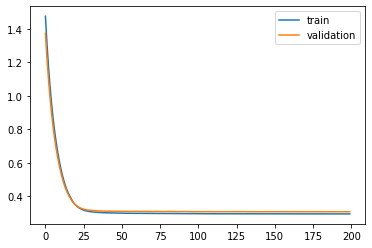

Time to train LSTM:  151.99598836898804
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 1.4276 - acc: 0.5065 - val_loss: 1.3354 - val_acc: 0.5486

Epoch 00001: val_loss improved from inf to 1.33536, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 1.2716 - acc: 0.5707 - val_loss: 1.1936 - val_acc: 0.6103

Epoch 00002: val_loss improved from 1.33536 to 1.19361, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 1.1419 - acc: 0.6263 - val_loss: 1.0746 - val_acc: 0.6591

Epoch 00003: val_loss improved from 1.19361 to 1.07463, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 1.0317 - acc: 0.6720 - val_loss: 0.9727 - val_acc: 0.6948

Epoch 00004: val_loss improved from 1.07463 to 0.97266, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 0.9359 - acc: 0.7085 - val_loss: 0.8834 - val_acc: 0.7301

Epoch 00005: val_loss improved from 0.97266 to 0.88338, saving model to Event_val_weights5.hdf5
Epoch 6/20

 - 1s - loss: 0.3023 - acc: 0.8880 - val_loss: 0.3057 - val_acc: 0.8864

Epoch 00046: val_loss improved from 0.30582 to 0.30575, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.3021 - acc: 0.8879 - val_loss: 0.3056 - val_acc: 0.8862

Epoch 00047: val_loss improved from 0.30575 to 0.30563, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.3019 - acc: 0.8880 - val_loss: 0.3052 - val_acc: 0.8871

Epoch 00048: val_loss improved from 0.30563 to 0.30518, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.3017 - acc: 0.8879 - val_loss: 0.3053 - val_acc: 0.8870

Epoch 00049: val_loss did not improve from 0.30518
Epoch 50/200
 - 1s - loss: 0.3015 - acc: 0.8879 - val_loss: 0.3050 - val_acc: 0.8868

Epoch 00050: val_loss improved from 0.30518 to 0.30504, saving model to Event_val_weights5.hdf5
Epoch 51/200
 - 1s - loss: 0.3013 - acc: 0.8879 - val_loss: 0.3049 - val_acc: 0.8868

Epoch 00051: val_loss improved from 0.30504 to 0.30492, saving

 - 1s - loss: 0.2979 - acc: 0.8881 - val_loss: 0.3015 - val_acc: 0.8869

Epoch 00095: val_loss improved from 0.30160 to 0.30150, saving model to Event_val_weights5.hdf5
Epoch 96/200
 - 1s - loss: 0.2979 - acc: 0.8882 - val_loss: 0.3017 - val_acc: 0.8863

Epoch 00096: val_loss did not improve from 0.30150
Epoch 97/200
 - 1s - loss: 0.2979 - acc: 0.8881 - val_loss: 0.3017 - val_acc: 0.8864

Epoch 00097: val_loss did not improve from 0.30150
Epoch 98/200
 - 1s - loss: 0.2979 - acc: 0.8881 - val_loss: 0.3017 - val_acc: 0.8864

Epoch 00098: val_loss did not improve from 0.30150
Epoch 99/200
 - 1s - loss: 0.2978 - acc: 0.8881 - val_loss: 0.3017 - val_acc: 0.8864

Epoch 00099: val_loss did not improve from 0.30150
Epoch 100/200
 - 1s - loss: 0.2978 - acc: 0.8881 - val_loss: 0.3016 - val_acc: 0.8867

Epoch 00100: val_loss did not improve from 0.30150
Epoch 101/200
 - 1s - loss: 0.2977 - acc: 0.8880 - val_loss: 0.3016 - val_acc: 0.8863

Epoch 00101: val_loss did not improve from 0.30150
Epoch 1


Epoch 00153: val_loss did not improve from 0.30145
Epoch 154/200
 - 1s - loss: 0.2970 - acc: 0.8881 - val_loss: 0.3017 - val_acc: 0.8862

Epoch 00154: val_loss did not improve from 0.30145
Epoch 155/200
 - 1s - loss: 0.2970 - acc: 0.8880 - val_loss: 0.3017 - val_acc: 0.8866

Epoch 00155: val_loss did not improve from 0.30145
Epoch 156/200
 - 1s - loss: 0.2970 - acc: 0.8880 - val_loss: 0.3015 - val_acc: 0.8867

Epoch 00156: val_loss did not improve from 0.30145
Epoch 157/200
 - 1s - loss: 0.2970 - acc: 0.8880 - val_loss: 0.3014 - val_acc: 0.8867

Epoch 00157: val_loss improved from 0.30145 to 0.30144, saving model to Event_val_weights5.hdf5
Epoch 158/200
 - 1s - loss: 0.2970 - acc: 0.8881 - val_loss: 0.3017 - val_acc: 0.8864

Epoch 00158: val_loss did not improve from 0.30144
Epoch 159/200
 - 1s - loss: 0.2970 - acc: 0.8880 - val_loss: 0.3016 - val_acc: 0.8866

Epoch 00159: val_loss did not improve from 0.30144
Epoch 160/200
 - 1s - loss: 0.2969 - acc: 0.8880 - val_loss: 0.3015 - val_a

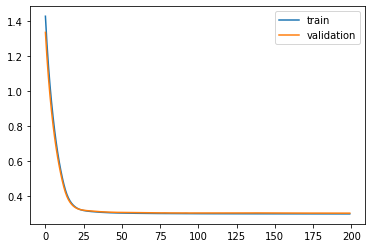

Time to train LSTM:  152.8153839111328
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 1.2448 - acc: 0.5102 - val_loss: 1.1732 - val_acc: 0.5434

Epoch 00001: val_loss improved from inf to 1.17324, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 1.1292 - acc: 0.5668 - val_loss: 1.0652 - val_acc: 0.5982

Epoch 00002: val_loss improved from 1.17324 to 1.06515, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 1.0279 - acc: 0.6230 - val_loss: 0.9710 - val_acc: 0.6524

Epoch 00003: val_loss improved from 1.06515 to 0.97103, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 0.9403 - acc: 0.6722 - val_loss: 0.8897 - val_acc: 0.6959

Epoch 00004: val_loss improved from 0.97103 to 0.88973, saving model to Event_val_weights1.hdf5
Epoch 5/200
 - 1s - loss: 0.8650 - acc: 0.7076 - val_loss: 0.8196 - val_acc: 0.7289

Epoch 00005: val_loss improved from 0.88973 to 0.81961, saving model to Event_val_weights1.hdf5
Epoch 6/200


Epoch 00046: val_loss did not improve from 0.30329
Epoch 47/200
 - 1s - loss: 0.3025 - acc: 0.8868 - val_loss: 0.3032 - val_acc: 0.8842

Epoch 00047: val_loss improved from 0.30329 to 0.30318, saving model to Event_val_weights1.hdf5
Epoch 48/200
 - 1s - loss: 0.3023 - acc: 0.8867 - val_loss: 0.3029 - val_acc: 0.8842

Epoch 00048: val_loss improved from 0.30318 to 0.30294, saving model to Event_val_weights1.hdf5
Epoch 49/200
 - 1s - loss: 0.3021 - acc: 0.8866 - val_loss: 0.3026 - val_acc: 0.8846

Epoch 00049: val_loss improved from 0.30294 to 0.30265, saving model to Event_val_weights1.hdf5
Epoch 50/200
 - 1s - loss: 0.3020 - acc: 0.8866 - val_loss: 0.3024 - val_acc: 0.8846

Epoch 00050: val_loss improved from 0.30265 to 0.30241, saving model to Event_val_weights1.hdf5
Epoch 51/200
 - 1s - loss: 0.3019 - acc: 0.8868 - val_loss: 0.3022 - val_acc: 0.8850

Epoch 00051: val_loss improved from 0.30241 to 0.30225, saving model to Event_val_weights1.hdf5
Epoch 52/200
 - 1s - loss: 0.3017 - ac


Epoch 00095: val_loss improved from 0.29741 to 0.29723, saving model to Event_val_weights1.hdf5
Epoch 96/200
 - 1s - loss: 0.2986 - acc: 0.8875 - val_loss: 0.2975 - val_acc: 0.8882

Epoch 00096: val_loss did not improve from 0.29723
Epoch 97/200
 - 1s - loss: 0.2985 - acc: 0.8876 - val_loss: 0.2972 - val_acc: 0.8880

Epoch 00097: val_loss did not improve from 0.29723
Epoch 98/200
 - 1s - loss: 0.2986 - acc: 0.8875 - val_loss: 0.2970 - val_acc: 0.8879

Epoch 00098: val_loss improved from 0.29723 to 0.29705, saving model to Event_val_weights1.hdf5
Epoch 99/200
 - 1s - loss: 0.2984 - acc: 0.8878 - val_loss: 0.2973 - val_acc: 0.8882

Epoch 00099: val_loss did not improve from 0.29705
Epoch 100/200
 - 1s - loss: 0.2985 - acc: 0.8876 - val_loss: 0.2969 - val_acc: 0.8881

Epoch 00100: val_loss improved from 0.29705 to 0.29693, saving model to Event_val_weights1.hdf5
Epoch 101/200
 - 1s - loss: 0.2984 - acc: 0.8877 - val_loss: 0.2973 - val_acc: 0.8881

Epoch 00101: val_loss did not improve fr


Epoch 00152: val_loss did not improve from 0.29649
Epoch 153/200
 - 1s - loss: 0.2972 - acc: 0.8884 - val_loss: 0.2967 - val_acc: 0.8874

Epoch 00153: val_loss did not improve from 0.29649
Epoch 154/200
 - 1s - loss: 0.2974 - acc: 0.8884 - val_loss: 0.2967 - val_acc: 0.8873

Epoch 00154: val_loss did not improve from 0.29649
Epoch 155/200
 - 1s - loss: 0.2972 - acc: 0.8885 - val_loss: 0.2967 - val_acc: 0.8877

Epoch 00155: val_loss did not improve from 0.29649
Epoch 156/200
 - 1s - loss: 0.2973 - acc: 0.8884 - val_loss: 0.2968 - val_acc: 0.8877

Epoch 00156: val_loss did not improve from 0.29649
Epoch 157/200
 - 1s - loss: 0.2972 - acc: 0.8883 - val_loss: 0.2967 - val_acc: 0.8876

Epoch 00157: val_loss did not improve from 0.29649
Epoch 158/200
 - 1s - loss: 0.2973 - acc: 0.8885 - val_loss: 0.2969 - val_acc: 0.8877

Epoch 00158: val_loss did not improve from 0.29649
Epoch 159/200
 - 1s - loss: 0.2972 - acc: 0.8883 - val_loss: 0.2966 - val_acc: 0.8879

Epoch 00159: val_loss did not imp

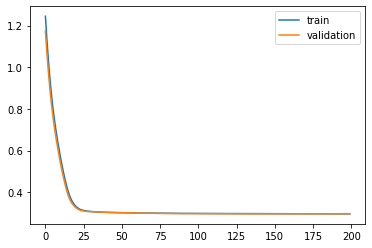

Time to train LSTM:  152.4083549976349
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 1.4076 - acc: 0.5330 - val_loss: 1.2676 - val_acc: 0.5899

Epoch 00001: val_loss improved from inf to 1.26763, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 1.2039 - acc: 0.6180 - val_loss: 1.1216 - val_acc: 0.6533

Epoch 00002: val_loss improved from 1.26763 to 1.12155, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 1.0784 - acc: 0.6685 - val_loss: 1.0221 - val_acc: 0.6841

Epoch 00003: val_loss improved from 1.12155 to 1.02214, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 0.9840 - acc: 0.6942 - val_loss: 0.9357 - val_acc: 0.7047

Epoch 00004: val_loss improved from 1.02214 to 0.93573, saving model to Event_val_weights2.hdf5
Epoch 5/200
 - 1s - loss: 0.9013 - acc: 0.7129 - val_loss: 0.8596 - val_acc: 0.7231

Epoch 00005: val_loss improved from 0.93573 to 0.85956, saving model to Event_val_weights2.hdf5
Epoch 6/200

 - 1s - loss: 0.3067 - acc: 0.8883 - val_loss: 0.3151 - val_acc: 0.8839

Epoch 00046: val_loss improved from 0.31558 to 0.31509, saving model to Event_val_weights2.hdf5
Epoch 47/200
 - 1s - loss: 0.3064 - acc: 0.8882 - val_loss: 0.3147 - val_acc: 0.8839

Epoch 00047: val_loss improved from 0.31509 to 0.31471, saving model to Event_val_weights2.hdf5
Epoch 48/200
 - 1s - loss: 0.3060 - acc: 0.8880 - val_loss: 0.3143 - val_acc: 0.8841

Epoch 00048: val_loss improved from 0.31471 to 0.31433, saving model to Event_val_weights2.hdf5
Epoch 49/200
 - 1s - loss: 0.3056 - acc: 0.8879 - val_loss: 0.3140 - val_acc: 0.8841

Epoch 00049: val_loss improved from 0.31433 to 0.31399, saving model to Event_val_weights2.hdf5
Epoch 50/200
 - 1s - loss: 0.3054 - acc: 0.8880 - val_loss: 0.3137 - val_acc: 0.8841

Epoch 00050: val_loss improved from 0.31399 to 0.31370, saving model to Event_val_weights2.hdf5
Epoch 51/200
 - 1s - loss: 0.3051 - acc: 0.8880 - val_loss: 0.3134 - val_acc: 0.8837

Epoch 00051: val_

 - 1s - loss: 0.3008 - acc: 0.8878 - val_loss: 0.3094 - val_acc: 0.8837

Epoch 00092: val_loss improved from 0.30946 to 0.30940, saving model to Event_val_weights2.hdf5
Epoch 93/200
 - 1s - loss: 0.3008 - acc: 0.8877 - val_loss: 0.3094 - val_acc: 0.8837

Epoch 00093: val_loss improved from 0.30940 to 0.30937, saving model to Event_val_weights2.hdf5
Epoch 94/200
 - 1s - loss: 0.3008 - acc: 0.8878 - val_loss: 0.3093 - val_acc: 0.8837

Epoch 00094: val_loss improved from 0.30937 to 0.30931, saving model to Event_val_weights2.hdf5
Epoch 95/200
 - 1s - loss: 0.3007 - acc: 0.8878 - val_loss: 0.3093 - val_acc: 0.8836

Epoch 00095: val_loss improved from 0.30931 to 0.30928, saving model to Event_val_weights2.hdf5
Epoch 96/200
 - 1s - loss: 0.3007 - acc: 0.8878 - val_loss: 0.3092 - val_acc: 0.8836

Epoch 00096: val_loss improved from 0.30928 to 0.30922, saving model to Event_val_weights2.hdf5
Epoch 97/200
 - 1s - loss: 0.3007 - acc: 0.8878 - val_loss: 0.3092 - val_acc: 0.8836

Epoch 00097: val_


Epoch 00138: val_loss improved from 0.30804 to 0.30800, saving model to Event_val_weights2.hdf5
Epoch 139/200
 - 1s - loss: 0.2996 - acc: 0.8881 - val_loss: 0.3080 - val_acc: 0.8831

Epoch 00139: val_loss did not improve from 0.30800
Epoch 140/200
 - 1s - loss: 0.2996 - acc: 0.8881 - val_loss: 0.3080 - val_acc: 0.8829

Epoch 00140: val_loss improved from 0.30800 to 0.30797, saving model to Event_val_weights2.hdf5
Epoch 141/200
 - 1s - loss: 0.2996 - acc: 0.8880 - val_loss: 0.3080 - val_acc: 0.8832

Epoch 00141: val_loss improved from 0.30797 to 0.30797, saving model to Event_val_weights2.hdf5
Epoch 142/200
 - 1s - loss: 0.2995 - acc: 0.8881 - val_loss: 0.3079 - val_acc: 0.8829

Epoch 00142: val_loss improved from 0.30797 to 0.30793, saving model to Event_val_weights2.hdf5
Epoch 143/200
 - 1s - loss: 0.2995 - acc: 0.8881 - val_loss: 0.3079 - val_acc: 0.8831

Epoch 00143: val_loss did not improve from 0.30793
Epoch 144/200
 - 1s - loss: 0.2995 - acc: 0.8881 - val_loss: 0.3079 - val_acc:


Epoch 00189: val_loss did not improve from 0.30752
Epoch 190/200
 - 1s - loss: 0.2988 - acc: 0.8882 - val_loss: 0.3075 - val_acc: 0.8829

Epoch 00190: val_loss improved from 0.30752 to 0.30751, saving model to Event_val_weights2.hdf5
Epoch 191/200
 - 1s - loss: 0.2988 - acc: 0.8882 - val_loss: 0.3075 - val_acc: 0.8829

Epoch 00191: val_loss did not improve from 0.30751
Epoch 192/200
 - 1s - loss: 0.2988 - acc: 0.8883 - val_loss: 0.3075 - val_acc: 0.8829

Epoch 00192: val_loss improved from 0.30751 to 0.30750, saving model to Event_val_weights2.hdf5
Epoch 193/200
 - 1s - loss: 0.2988 - acc: 0.8883 - val_loss: 0.3075 - val_acc: 0.8829

Epoch 00193: val_loss did not improve from 0.30750
Epoch 194/200
 - 1s - loss: 0.2987 - acc: 0.8883 - val_loss: 0.3075 - val_acc: 0.8828

Epoch 00194: val_loss improved from 0.30750 to 0.30750, saving model to Event_val_weights2.hdf5
Epoch 195/200
 - 1s - loss: 0.2988 - acc: 0.8883 - val_loss: 0.3075 - val_acc: 0.8828

Epoch 00195: val_loss did not improv

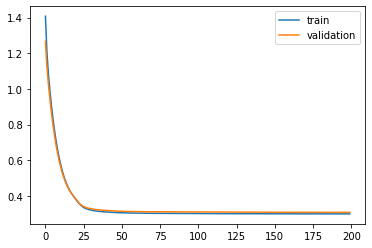

Time to train LSTM:  155.6528778076172
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 1.2785 - acc: 0.4819 - val_loss: 1.1951 - val_acc: 0.5192

Epoch 00001: val_loss improved from inf to 1.19507, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 1.1359 - acc: 0.5536 - val_loss: 1.0636 - val_acc: 0.6031

Epoch 00002: val_loss improved from 1.19507 to 1.06358, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 1.0136 - acc: 0.6329 - val_loss: 0.9546 - val_acc: 0.6698

Epoch 00003: val_loss improved from 1.06358 to 0.95460, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 0.9133 - acc: 0.6953 - val_loss: 0.8666 - val_acc: 0.7212

Epoch 00004: val_loss improved from 0.95460 to 0.86656, saving model to Event_val_weights3.hdf5
Epoch 5/200
 - 1s - loss: 0.8324 - acc: 0.7356 - val_loss: 0.7955 - val_acc: 0.7467

Epoch 00005: val_loss improved from 0.86656 to 0.79552, saving model to Event_val_weights3.hdf5
Epoch 6/200

 - 1s - loss: 0.3092 - acc: 0.8872 - val_loss: 0.3116 - val_acc: 0.8859

Epoch 00046: val_loss improved from 0.31199 to 0.31160, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.3089 - acc: 0.8872 - val_loss: 0.3113 - val_acc: 0.8863

Epoch 00047: val_loss improved from 0.31160 to 0.31129, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.3087 - acc: 0.8871 - val_loss: 0.3110 - val_acc: 0.8860

Epoch 00048: val_loss improved from 0.31129 to 0.31099, saving model to Event_val_weights3.hdf5
Epoch 49/200
 - 1s - loss: 0.3084 - acc: 0.8872 - val_loss: 0.3107 - val_acc: 0.8858

Epoch 00049: val_loss improved from 0.31099 to 0.31070, saving model to Event_val_weights3.hdf5
Epoch 50/200
 - 1s - loss: 0.3082 - acc: 0.8872 - val_loss: 0.3104 - val_acc: 0.8856

Epoch 00050: val_loss improved from 0.31070 to 0.31043, saving model to Event_val_weights3.hdf5
Epoch 51/200
 - 1s - loss: 0.3079 - acc: 0.8871 - val_loss: 0.3102 - val_acc: 0.8857

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.30530 to 0.30526, saving model to Event_val_weights3.hdf5
Epoch 92/200
 - 1s - loss: 0.3031 - acc: 0.8869 - val_loss: 0.3052 - val_acc: 0.8864

Epoch 00092: val_loss improved from 0.30526 to 0.30515, saving model to Event_val_weights3.hdf5
Epoch 93/200
 - 1s - loss: 0.3029 - acc: 0.8869 - val_loss: 0.3051 - val_acc: 0.8867

Epoch 00093: val_loss improved from 0.30515 to 0.30513, saving model to Event_val_weights3.hdf5
Epoch 94/200
 - 1s - loss: 0.3029 - acc: 0.8870 - val_loss: 0.3050 - val_acc: 0.8863

Epoch 00094: val_loss improved from 0.30513 to 0.30503, saving model to Event_val_weights3.hdf5
Epoch 95/200
 - 1s - loss: 0.3028 - acc: 0.8870 - val_loss: 0.3050 - val_acc: 0.8868

Epoch 00095: val_loss improved from 0.30503 to 0.30499, saving model to Event_val_weights3.hdf5
Epoch 96/200
 - 1s - loss: 0.3027 - acc: 0.8871 - val_loss: 0.3049 - val_acc: 0.8863

Epoch 00096: val_loss improved from 0.30499 to 0.30495, saving model to Event_val_weights


Epoch 00136: val_loss improved from 0.30332 to 0.30330, saving model to Event_val_weights3.hdf5
Epoch 137/200
 - 1s - loss: 0.3009 - acc: 0.8874 - val_loss: 0.3033 - val_acc: 0.8867

Epoch 00137: val_loss improved from 0.30330 to 0.30327, saving model to Event_val_weights3.hdf5
Epoch 138/200
 - 1s - loss: 0.3008 - acc: 0.8874 - val_loss: 0.3032 - val_acc: 0.8868

Epoch 00138: val_loss improved from 0.30327 to 0.30324, saving model to Event_val_weights3.hdf5
Epoch 139/200
 - 1s - loss: 0.3009 - acc: 0.8874 - val_loss: 0.3032 - val_acc: 0.8867

Epoch 00139: val_loss improved from 0.30324 to 0.30322, saving model to Event_val_weights3.hdf5
Epoch 140/200
 - 1s - loss: 0.3008 - acc: 0.8875 - val_loss: 0.3032 - val_acc: 0.8868

Epoch 00140: val_loss improved from 0.30322 to 0.30319, saving model to Event_val_weights3.hdf5
Epoch 141/200
 - 1s - loss: 0.3008 - acc: 0.8874 - val_loss: 0.3032 - val_acc: 0.8866

Epoch 00141: val_loss improved from 0.30319 to 0.30317, saving model to Event_val_we


Epoch 00181: val_loss improved from 0.30253 to 0.30250, saving model to Event_val_weights3.hdf5
Epoch 182/200
 - 1s - loss: 0.2996 - acc: 0.8872 - val_loss: 0.3025 - val_acc: 0.8868

Epoch 00182: val_loss improved from 0.30250 to 0.30249, saving model to Event_val_weights3.hdf5
Epoch 183/200
 - 1s - loss: 0.2996 - acc: 0.8872 - val_loss: 0.3025 - val_acc: 0.8864

Epoch 00183: val_loss improved from 0.30249 to 0.30247, saving model to Event_val_weights3.hdf5
Epoch 184/200
 - 1s - loss: 0.2995 - acc: 0.8873 - val_loss: 0.3025 - val_acc: 0.8869

Epoch 00184: val_loss improved from 0.30247 to 0.30245, saving model to Event_val_weights3.hdf5
Epoch 185/200
 - 1s - loss: 0.2995 - acc: 0.8874 - val_loss: 0.3024 - val_acc: 0.8864

Epoch 00185: val_loss improved from 0.30245 to 0.30242, saving model to Event_val_weights3.hdf5
Epoch 186/200
 - 1s - loss: 0.2994 - acc: 0.8874 - val_loss: 0.3024 - val_acc: 0.8867

Epoch 00186: val_loss improved from 0.30242 to 0.30241, saving model to Event_val_we

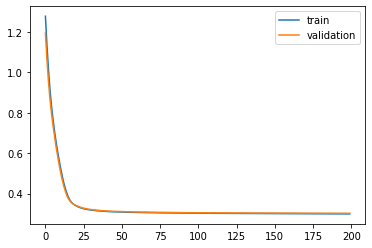

Time to train LSTM:  155.31639170646667
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 10s - loss: 1.2743 - acc: 0.4600 - val_loss: 1.2008 - val_acc: 0.4919

Epoch 00001: val_loss improved from inf to 1.20082, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 1.1445 - acc: 0.5285 - val_loss: 1.0840 - val_acc: 0.5653

Epoch 00002: val_loss improved from 1.20082 to 1.08400, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 1.0362 - acc: 0.5979 - val_loss: 0.9851 - val_acc: 0.6308

Epoch 00003: val_loss improved from 1.08400 to 0.98508, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 0.9449 - acc: 0.6550 - val_loss: 0.9009 - val_acc: 0.6857

Epoch 00004: val_loss improved from 0.98508 to 0.90093, saving model to Event_val_weights4.hdf5
Epoch 5/200
 - 1s - loss: 0.8670 - acc: 0.7014 - val_loss: 0.8289 - val_acc: 0.7243

Epoch 00005: val_loss improved from 0.90093 to 0.82894, saving model to Event_val_weights4.hdf5
Epoch 6/2

 - 1s - loss: 0.3045 - acc: 0.8892 - val_loss: 0.3143 - val_acc: 0.8829

Epoch 00046: val_loss improved from 0.31438 to 0.31431, saving model to Event_val_weights4.hdf5
Epoch 47/200
 - 1s - loss: 0.3043 - acc: 0.8891 - val_loss: 0.3139 - val_acc: 0.8833

Epoch 00047: val_loss improved from 0.31431 to 0.31392, saving model to Event_val_weights4.hdf5
Epoch 48/200
 - 1s - loss: 0.3041 - acc: 0.8891 - val_loss: 0.3138 - val_acc: 0.8833

Epoch 00048: val_loss improved from 0.31392 to 0.31380, saving model to Event_val_weights4.hdf5
Epoch 49/200
 - 1s - loss: 0.3039 - acc: 0.8892 - val_loss: 0.3135 - val_acc: 0.8830

Epoch 00049: val_loss improved from 0.31380 to 0.31346, saving model to Event_val_weights4.hdf5
Epoch 50/200
 - 1s - loss: 0.3037 - acc: 0.8893 - val_loss: 0.3135 - val_acc: 0.8836

Epoch 00050: val_loss did not improve from 0.31346
Epoch 51/200
 - 1s - loss: 0.3036 - acc: 0.8892 - val_loss: 0.3131 - val_acc: 0.8832

Epoch 00051: val_loss improved from 0.31346 to 0.31311, saving

 - 1s - loss: 0.2993 - acc: 0.8887 - val_loss: 0.3083 - val_acc: 0.8847

Epoch 00094: val_loss improved from 0.30838 to 0.30829, saving model to Event_val_weights4.hdf5
Epoch 95/200
 - 1s - loss: 0.2993 - acc: 0.8887 - val_loss: 0.3082 - val_acc: 0.8847

Epoch 00095: val_loss improved from 0.30829 to 0.30821, saving model to Event_val_weights4.hdf5
Epoch 96/200
 - 1s - loss: 0.2992 - acc: 0.8887 - val_loss: 0.3081 - val_acc: 0.8846

Epoch 00096: val_loss improved from 0.30821 to 0.30812, saving model to Event_val_weights4.hdf5
Epoch 97/200
 - 1s - loss: 0.2992 - acc: 0.8886 - val_loss: 0.3080 - val_acc: 0.8849

Epoch 00097: val_loss improved from 0.30812 to 0.30804, saving model to Event_val_weights4.hdf5
Epoch 98/200
 - 1s - loss: 0.2991 - acc: 0.8886 - val_loss: 0.3079 - val_acc: 0.8850

Epoch 00098: val_loss improved from 0.30804 to 0.30795, saving model to Event_val_weights4.hdf5
Epoch 99/200
 - 1s - loss: 0.2991 - acc: 0.8884 - val_loss: 0.3079 - val_acc: 0.8851

Epoch 00099: val_


Epoch 00139: val_loss improved from 0.30621 to 0.30620, saving model to Event_val_weights4.hdf5
Epoch 140/200
 - 1s - loss: 0.2974 - acc: 0.8885 - val_loss: 0.3062 - val_acc: 0.8848

Epoch 00140: val_loss improved from 0.30620 to 0.30616, saving model to Event_val_weights4.hdf5
Epoch 141/200
 - 1s - loss: 0.2974 - acc: 0.8886 - val_loss: 0.3061 - val_acc: 0.8849

Epoch 00141: val_loss improved from 0.30616 to 0.30615, saving model to Event_val_weights4.hdf5
Epoch 142/200
 - 1s - loss: 0.2974 - acc: 0.8884 - val_loss: 0.3061 - val_acc: 0.8847

Epoch 00142: val_loss improved from 0.30615 to 0.30611, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.2973 - acc: 0.8885 - val_loss: 0.3061 - val_acc: 0.8848

Epoch 00143: val_loss improved from 0.30611 to 0.30610, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.2973 - acc: 0.8886 - val_loss: 0.3061 - val_acc: 0.8848

Epoch 00144: val_loss improved from 0.30610 to 0.30606, saving model to Event_val_we

 - 1s - loss: 0.2961 - acc: 0.8888 - val_loss: 0.3061 - val_acc: 0.8831

Epoch 00192: val_loss did not improve from 0.30573
Epoch 193/200
 - 1s - loss: 0.2962 - acc: 0.8887 - val_loss: 0.3060 - val_acc: 0.8830

Epoch 00193: val_loss did not improve from 0.30573
Epoch 194/200
 - 1s - loss: 0.2962 - acc: 0.8888 - val_loss: 0.3064 - val_acc: 0.8828

Epoch 00194: val_loss did not improve from 0.30573
Epoch 195/200
 - 1s - loss: 0.2961 - acc: 0.8890 - val_loss: 0.3060 - val_acc: 0.8830

Epoch 00195: val_loss did not improve from 0.30573
Epoch 196/200
 - 1s - loss: 0.2961 - acc: 0.8889 - val_loss: 0.3061 - val_acc: 0.8829

Epoch 00196: val_loss did not improve from 0.30573
Epoch 197/200
 - 1s - loss: 0.2961 - acc: 0.8889 - val_loss: 0.3061 - val_acc: 0.8828

Epoch 00197: val_loss did not improve from 0.30573
Epoch 198/200
 - 1s - loss: 0.2963 - acc: 0.8888 - val_loss: 0.3065 - val_acc: 0.8823

Epoch 00198: val_loss did not improve from 0.30573
Epoch 199/200
 - 1s - loss: 0.2963 - acc: 0.8887

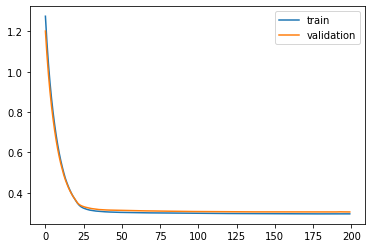

Time to train LSTM:  154.4355354309082


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f89b6734a58>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 10s - loss: 1.2367 - acc: 0.4946 - val_loss: 1.1593 - val_acc: 0.5440

Epoch 00001: val_loss improved from inf to 1.15931, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 1.1058 - acc: 0.5820 - val_loss: 1.0428 - val_acc: 0.6263

Epoch 00002: val_loss improved from 1.15931 to 1.04279, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 0.9992 - acc: 0.6543 - val_loss: 0.9462 - val_acc: 0.6891

Epoch 00003: val_loss improved from 1.04279 to 0.94616, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 0.9089 - acc: 0.7044 - val_loss: 0.8620 - val_acc: 0.7318

Epoch 00004: val_loss improved from 0.94616 to 0.86202, saving model to Event_val_weights5.hdf5
Epoch 5/200
 - 1s - loss: 0.8294 - acc: 0.7400 - val_loss: 0.7874 - val_acc: 0.7613

Epoch 00005: val_loss improved from 0.86202 to 0.78744, saving model to Event_val_weights5.hdf5
Epoch 6/200
 - 1s - loss: 0.7588 - acc: 0.7657 - 

 - 1s - loss: 0.3079 - acc: 0.8868 - val_loss: 0.3100 - val_acc: 0.8877

Epoch 00046: val_loss improved from 0.31017 to 0.31000, saving model to Event_val_weights5.hdf5
Epoch 47/200
 - 1s - loss: 0.3076 - acc: 0.8869 - val_loss: 0.3097 - val_acc: 0.8878

Epoch 00047: val_loss improved from 0.31000 to 0.30968, saving model to Event_val_weights5.hdf5
Epoch 48/200
 - 1s - loss: 0.3074 - acc: 0.8868 - val_loss: 0.3096 - val_acc: 0.8873

Epoch 00048: val_loss improved from 0.30968 to 0.30957, saving model to Event_val_weights5.hdf5
Epoch 49/200
 - 1s - loss: 0.3071 - acc: 0.8868 - val_loss: 0.3089 - val_acc: 0.8877

Epoch 00049: val_loss improved from 0.30957 to 0.30887, saving model to Event_val_weights5.hdf5
Epoch 50/200
 - 1s - loss: 0.3069 - acc: 0.8867 - val_loss: 0.3089 - val_acc: 0.8874

Epoch 00050: val_loss did not improve from 0.30887
Epoch 51/200
 - 1s - loss: 0.3066 - acc: 0.8868 - val_loss: 0.3087 - val_acc: 0.8877

Epoch 00051: val_loss improved from 0.30887 to 0.30874, saving

 - 1s - loss: 0.3018 - acc: 0.8873 - val_loss: 0.3049 - val_acc: 0.8876

Epoch 00096: val_loss did not improve from 0.30461
Epoch 97/200
 - 1s - loss: 0.3018 - acc: 0.8873 - val_loss: 0.3047 - val_acc: 0.8878

Epoch 00097: val_loss did not improve from 0.30461
Epoch 98/200
 - 1s - loss: 0.3017 - acc: 0.8873 - val_loss: 0.3047 - val_acc: 0.8878

Epoch 00098: val_loss did not improve from 0.30461
Epoch 99/200
 - 1s - loss: 0.3017 - acc: 0.8874 - val_loss: 0.3045 - val_acc: 0.8879

Epoch 00099: val_loss improved from 0.30461 to 0.30445, saving model to Event_val_weights5.hdf5
Epoch 100/200
 - 1s - loss: 0.3016 - acc: 0.8873 - val_loss: 0.3047 - val_acc: 0.8876

Epoch 00100: val_loss did not improve from 0.30445
Epoch 101/200
 - 1s - loss: 0.3015 - acc: 0.8874 - val_loss: 0.3045 - val_acc: 0.8877

Epoch 00101: val_loss did not improve from 0.30445
Epoch 102/200
 - 1s - loss: 0.3015 - acc: 0.8874 - val_loss: 0.3044 - val_acc: 0.8874

Epoch 00102: val_loss improved from 0.30445 to 0.30439, s


Epoch 00151: val_loss did not improve from 0.30345
Epoch 152/200
 - 1s - loss: 0.2984 - acc: 0.8880 - val_loss: 0.3040 - val_acc: 0.8864

Epoch 00152: val_loss did not improve from 0.30345
Epoch 153/200
 - 1s - loss: 0.2983 - acc: 0.8882 - val_loss: 0.3038 - val_acc: 0.8864

Epoch 00153: val_loss did not improve from 0.30345
Epoch 154/200
 - 1s - loss: 0.2983 - acc: 0.8883 - val_loss: 0.3038 - val_acc: 0.8864

Epoch 00154: val_loss did not improve from 0.30345
Epoch 155/200
 - 1s - loss: 0.2982 - acc: 0.8884 - val_loss: 0.3038 - val_acc: 0.8866

Epoch 00155: val_loss did not improve from 0.30345
Epoch 156/200
 - 1s - loss: 0.2982 - acc: 0.8885 - val_loss: 0.3037 - val_acc: 0.8862

Epoch 00156: val_loss did not improve from 0.30345
Epoch 157/200
 - 1s - loss: 0.2982 - acc: 0.8883 - val_loss: 0.3037 - val_acc: 0.8863

Epoch 00157: val_loss did not improve from 0.30345
Epoch 158/200
 - 1s - loss: 0.2981 - acc: 0.8884 - val_loss: 0.3039 - val_acc: 0.8864

Epoch 00158: val_loss did not imp

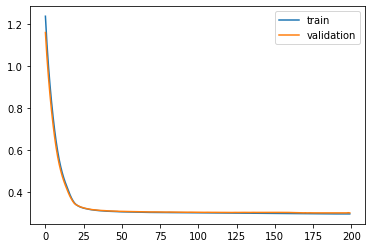

Time to train LSTM:  163.28021240234375
Entire process took:  8761.936025619507
Experiment record:
[[4, 8192, 0.13571542470728296, 0, 0.298806241856681], [4, 8192, 0.13571542470728296, 1, 0.30528454338179695], [4, 8192, 0.13571542470728296, 2, 0.3012693679862552], [4, 8192, 0.13571542470728296, 3, 0.3062392633491092], [4, 8192, 0.13571542470728296, 4, 0.3027335908148024], [4, 8192, 0.06650866175952272, 0, 0.29531902164883084], [4, 8192, 0.06650866175952272, 1, 0.3067721240785387], [4, 8192, 0.06650866175952272, 2, 0.3012255862818824], [4, 8192, 0.06650866175952272, 3, 0.3070575630664825], [4, 8192, 0.06650866175952272, 4, 0.3028348202970293], [4, 8192, 0.11323340138234961, 0, 0.29474616418944466], [4, 8192, 0.11323340138234961, 1, 0.30731470974286396], [4, 8192, 0.11323340138234961, 2, 0.30191583784421283], [4, 8192, 0.11323340138234961, 3, 0.3053504107263353], [4, 8192, 0.11323340138234961, 4, 0.3024832242065006], [4, 8192, 0.05204836127912327, 0, 0.2970720315774282], [4, 8192, 0.0520

In [13]:
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)

num_per_fold = x_train.shape[0]//10
print(num_per_fold)

L2_1_list = [0.13571542470728296, 0.06650866175952272, 0.11323340138234961, 0.05204836127912327, 0.06167372687800163, 0.08163673116125404, 0.06579123066749369, 0.12589795881605054, 0.13182753578641435, 0.08446244909592174, 0.08187987968624336, 0.061166123199466044]


# LSTM
#units = 16
#batch_s = 16384

# Simple RNN
units = 4
batch_s = 8192

start_time = time.time()

exp_record = []

for i in range(len(L2_1_list)):
    L2_1 = L2_1_list[i]
    #L2_2 = L2_2_list[i]
    for f in range(5):#10
        #start = f*num_per_fold
        end = (f+1)*num_per_fold
        train1_x = x_train[:end, ]
        train2_x = x_train[end:, ]
        train_x_lstm = np.append(train2_x, train1_x, axis=0) 
        train1_y = y_train[:end, ]
        train2_y = y_train[end:, ]
        train_y_lstm = np.append(train2_y, train1_y, axis=0)

        start_time_inner = time.time()
        with tf.Session(config = tf.ConfigProto(log_device_placement = True)):
            model = Sequential()
            model.add(SimpleRNN(units, 
                                kernel_regularizer=regularizers.l2(L2_1),
                                #return_sequences=True, 
                                input_shape=(8, 182))) 
            #model.add(CuDNNLSTM(units, 
            #                    kernel_regularizer=regularizers.l2(L2_2)))
            model.add(Dense(2, activation='softmax'))
            model.compile(loss='categorical_crossentropy', 
                          optimizer='adam', metrics=['accuracy'])
            val_weight = "Event_val_weights" + str(f+1) + ".hdf5"
            val_checkpointer = ModelCheckpoint(filepath=val_weight,
                                               monitor='val_loss', verbose=1,
                                               save_best_only=True)
            history = model.fit(train_x_lstm, train_y_lstm, batch_size=batch_s, 
                                epochs=200, validation_split=0.1, 
                                callbacks=[val_checkpointer], 
                                verbose=2, 
                                shuffle=False,
                                #sample_weight=class_weight.\
                                #          compute_sample_weight("balanced",
                                #                                train_y_lstm[:, 1])
                               ) 
            print("#################################")
            print("Number of units:", units)
            print("Batch size:", batch_s)
            print("Fold:", f)
            print("L2_1:", L2_1)
            #print("L2_2:", L2_2)
            print("best val loss:", min(history.history['val_loss']))
            exp_record.append([units, batch_s, L2_1, f, min(history.history['val_loss'])])
            #exp_record.append([units, batch_s, L2_1, L2_2, f, min(history.history['val_loss'])])
            print("#################################")
            if(f==4):
                print(exp_record)
            pyplot.plot(history.history['loss'], label='train')
            pyplot.plot(history.history['val_loss'], label='validation')
            pyplot.legend()
            pyplot.show()
        end_time = time.time()
        print("Time to train LSTM: ", time.time() - start_time_inner)
print("Entire process took: ", time.time() - start_time)

print("Experiment record:")
print(exp_record)

In [2]:
exp_record = [[4, 8192, 0.06802696888767693, 0, 0.29916053448783025], [4, 8192, 0.06802696888767693, 1, 0.3069146529568566], [4, 8192, 0.06802696888767693, 2, 0.3007723092503018], [4, 8192, 0.06802696888767693, 3, 0.30550746183925204], [4, 8192, 0.06802696888767693, 4, 0.3024597929848565], [4, 8192, 0.05194752414876246, 0, 0.29467330174975925], [4, 8192, 0.05194752414876246, 1, 0.3068312481509315], [4, 8192, 0.05194752414876246, 2, 0.3008674227661557], [4, 8192, 0.05194752414876246, 3, 0.3068541309038798], [4, 8192, 0.05194752414876246, 4, 0.30415362140867447], [4, 8192, 0.09632185264983445, 0, 0.2963971665435367], [4, 8192, 0.09632185264983445, 1, 0.30559744320975407], [4, 8192, 0.09632185264983445, 2, 0.30338751355806987], [4, 8192, 0.09632185264983445, 3, 0.3055039961073134], [4, 8192, 0.09632185264983445, 4, 0.30295973173777263], [4, 8192, 0.12249339291921478, 0, 0.29723861050605777], [4, 8192, 0.12249339291921478, 1, 0.3048314869403839], [4, 8192, 0.12249339291921478, 2, 0.30168273316489325], [4, 8192, 0.12249339291921478, 3, 0.30710517727004155], [4, 8192, 0.12249339291921478, 4, 0.3006388888888889], [4, 8192, 0.09202036045877274, 0, 0.294888782315784], [4, 8192, 0.09202036045877274, 1, 0.3039251289367676], [4, 8192, 0.09202036045877274, 2, 0.30291817575030855], [4, 8192, 0.09202036045877274, 3, 0.3069582158989376], [4, 8192, 0.09202036045877274, 4, 0.3038862690395779], [4, 8192, 0.09854270981677823, 0, 0.2977532077100542], [4, 8192, 0.09854270981677823, 1, 0.3057125568919712], [4, 8192, 0.09854270981677823, 2, 0.3017739299138387], [4, 8192, 0.09854270981677823, 3, 0.30583667522006563], [4, 8192, 0.09854270981677823, 4, 0.30335224591361154], [4, 8192, 0.05127808145906087, 0, 0.29466376246346365], [4, 8192, 0.05127808145906087, 1, 0.30419107768270703], [4, 8192, 0.05127808145906087, 2, 0.30244495209058125], [4, 8192, 0.05127808145906087, 3, 0.30474718475341794], [4, 8192, 0.05127808145906087, 4, 0.3058475022580889], [4, 8192, 0.09873716073198716, 0, 0.29704991205533343], [4, 8192, 0.09873716073198716, 1, 0.30393752643797134], [4, 8192, 0.09873716073198716, 2, 0.30178663449817233], [4, 8192, 0.09873716073198716, 3, 0.3061051936149597], [4, 8192, 0.09873716073198716, 4, 0.3022164623737335], [4, 8192, 0.1441806652343366, 0, 0.2944446325302124], [4, 8192, 0.1441806652343366, 1, 0.3047073795265622], [4, 8192, 0.1441806652343366, 2, 0.3022983049551646], [4, 8192, 0.1441806652343366, 3, 0.30544921445846557], [4, 8192, 0.1441806652343366, 4, 0.30149414896965027], [4, 8192, 0.13507950893767787, 0, 0.29594541189405654], [4, 8192, 0.13507950893767787, 1, 0.3043863538371192], [4, 8192, 0.13507950893767787, 2, 0.30230284163686966], [4, 8192, 0.13507950893767787, 3, 0.3060032568772634], [4, 8192, 0.13507950893767787, 4, 0.30186946908632917], [4, 8192, 0.12299644702208186, 0, 0.29436303732130265], [4, 8192, 0.12299644702208186, 1, 0.3058999700811174], [4, 8192, 0.12299644702208186, 2, 0.3032912992371453], [4, 8192, 0.12299644702208186, 3, 0.30605427400271096], [4, 8192, 0.12299644702208186, 4, 0.30120944905281066], [4, 8192, 0.060873607186897494, 0, 0.2963388465510474], [4, 8192, 0.060873607186897494, 1, 0.3074714730050829], [4, 8192, 0.060873607186897494, 2, 0.30198148891660903], [4, 8192, 0.060873607186897494, 3, 0.30572353882259795], [4, 8192, 0.060873607186897494, 4, 0.30139721020062765], [4, 8192, 0.13939041702850813, 0, 0.2961237061818441], [4, 8192, 0.13939041702850813, 1, 0.3065132508012984], [4, 8192, 0.13939041702850813, 2, 0.3024652051925659], [4, 8192, 0.13939041702850813, 3, 0.30581039354536266], [4, 8192, 0.13939041702850813, 4, 0.30149393945270114], [4, 8192, 0.13571542470728296, 0, 0.298806241856681], [4, 8192, 0.13571542470728296, 1, 0.30528454338179695], [4, 8192, 0.13571542470728296, 2, 0.3012693679862552], [4, 8192, 0.13571542470728296, 3, 0.3062392633491092], [4, 8192, 0.13571542470728296, 4, 0.3027335908148024], [4, 8192, 0.06650866175952272, 0, 0.29531902164883084], [4, 8192, 0.06650866175952272, 1, 0.3067721240785387], [4, 8192, 0.06650866175952272, 2, 0.3012255862818824], [4, 8192, 0.06650866175952272, 3, 0.3070575630664825], [4, 8192, 0.06650866175952272, 4, 0.3028348202970293], [4, 8192, 0.11323340138234961, 0, 0.29474616418944466], [4, 8192, 0.11323340138234961, 1, 0.30731470974286396], [4, 8192, 0.11323340138234961, 2, 0.30191583784421283], [4, 8192, 0.11323340138234961, 3, 0.3053504107263353], [4, 8192, 0.11323340138234961, 4, 0.3024832242065006], [4, 8192, 0.05204836127912327, 0, 0.2970720315774282], [4, 8192, 0.05204836127912327, 1, 0.3042116891013251], [4, 8192, 0.05204836127912327, 2, 0.3020131073527866], [4, 8192, 0.05204836127912327, 3, 0.3053243521849314], [4, 8192, 0.05204836127912327, 4, 0.3006494183010525], [4, 8192, 0.06167372687800163, 0, 0.29450841161939834], [4, 8192, 0.06167372687800163, 1, 0.303959530433019], [4, 8192, 0.06167372687800163, 2, 0.30248261811998156], [4, 8192, 0.06167372687800163, 3, 0.3069989518324534], [4, 8192, 0.06167372687800163, 4, 0.3031078360080719], [4, 8192, 0.08163673116125404, 0, 0.2977230985164642], [4, 8192, 0.08163673116125404, 1, 0.3050854121579064], [4, 8192, 0.08163673116125404, 2, 0.3017249390019311], [4, 8192, 0.08163673116125404, 3, 0.30804481983184817], [4, 8192, 0.08163673116125404, 4, 0.3036817948818207], [4, 8192, 0.06579123066749369, 0, 0.2946562082502577], [4, 8192, 0.06579123066749369, 1, 0.30454140321413675], [4, 8192, 0.06579123066749369, 2, 0.30158788153860305], [4, 8192, 0.06579123066749369, 3, 0.304573281844457], [4, 8192, 0.06579123066749369, 4, 0.3064348846011692], [4, 8192, 0.12589795881605054, 0, 0.2972786295413971], [4, 8192, 0.12589795881605054, 1, 0.30396394162707857], [4, 8192, 0.12589795881605054, 2, 0.3016476294994354], [4, 8192, 0.12589795881605054, 3, 0.30552777836057876], [4, 8192, 0.12589795881605054, 4, 0.3023277066813575], [4, 8192, 0.13182753578641435, 0, 0.29437571732203166], [4, 8192, 0.13182753578641435, 1, 0.30462104047669303], [4, 8192, 0.13182753578641435, 2, 0.3022039778497484], [4, 8192, 0.13182753578641435, 3, 0.30543529282675846], [4, 8192, 0.13182753578641435, 4, 0.3013373888598548], [4, 8192, 0.08446244909592174, 0, 0.2952675076325734], [4, 8192, 0.08446244909592174, 1, 0.30444480662875706], [4, 8192, 0.08446244909592174, 2, 0.30195479565196565], [4, 8192, 0.08446244909592174, 3, 0.3067227446768019], [4, 8192, 0.08446244909592174, 4, 0.30173737798796757], [4, 8192, 0.08187987968624336, 0, 0.2947520616054535], [4, 8192, 0.08187987968624336, 1, 0.30634483498997156], [4, 8192, 0.08187987968624336, 2, 0.3029571823279063], [4, 8192, 0.08187987968624336, 3, 0.3080628957218594], [4, 8192, 0.08187987968624336, 4, 0.3007566930452983], [4, 8192, 0.061166123199466044, 0, 0.2963019411034054], [4, 8192, 0.061166123199466044, 1, 0.3074879242314233], [4, 8192, 0.061166123199466044, 2, 0.30200669633017646], [4, 8192, 0.061166123199466044, 3, 0.3057331444952223], [4, 8192, 0.061166123199466044, 4, 0.3012045432196723]]

complete_v = np.array(exp_record)
print(complete_v.shape)

val_loss_list = []
for i in range(25):
    h_params = complete_v[(i*5):((i+1)*5), :]
    print("###############################")
    print("Units:", h_params[0, 0])
    print("Batch size:", h_params[0, 1])
    print("L2 1:", h_params[0, 2])
    print("h2 2:", h_params[0, 3])
    #print("Val loss (mean):", np.mean(h_params[:, 5]))
    #print("Val loss (std):", np.std(h_params[:, 5]))
    print("Val loss (mean):", 
          np.round(np.mean(h_params[:, 4]), decimals=5))
    print("Val loss (std):", 
          np.round(np.std(h_params[:, 4]), decimals=5))
    print("###############################")
    val_loss_list.append(np.mean(h_params[:, 4]))
print(min(val_loss_list))
print("max L2:", max(complete_v[:, 2]))
print("min L2", min(complete_v[:, 2]))

(125, 5)
###############################
Units: 4.0
Batch size: 8192.0
L2 1: 0.06802696888767693
h2 2: 0.0
Val loss (mean): 0.30296
Val loss (std): 0.00288
###############################
###############################
Units: 4.0
Batch size: 8192.0
L2 1: 0.05194752414876246
h2 2: 0.0
Val loss (mean): 0.30268
Val loss (std): 0.00457
###############################
###############################
Units: 4.0
Batch size: 8192.0
L2 1: 0.09632185264983445
h2 2: 0.0
Val loss (mean): 0.30277
Val loss (std): 0.00336
###############################
###############################
Units: 4.0
Batch size: 8192.0
L2 1: 0.12249339291921478
h2 2: 0.0
Val loss (mean): 0.3023
Val loss (std): 0.00341
###############################
###############################
Units: 4.0
Batch size: 8192.0
L2 1: 0.09202036045877274
h2 2: 0.0
Val loss (mean): 0.30252
Val loss (std): 0.00405
###############################
###############################
Units: 4.0
Batch size: 8192.0
L2 1: 0.09854270981677823
h2 2: 0.0

## SGDM search

In [11]:
###########################
# generate random numbers
# for layer 1 and 2 
# L2 search
###########################
from numpy.random import seed
seed(7) 
# Seed 4 LSTM lr [0.005, 0.015) decay [1e-5 1e-7)
# seed 5 LSTM lr [0.015, 0.025) decay [1e-5, 1e-7)
# seed 6 lSTM lr [0.025, 0.05), decay [1e-5, 1e-7)
# seed 7 lstm lr [0.035, 0.045), decay [1e-5, 1e-8) Fine grain
lr_list = []
for i in range(25):
    lr_list.append(np.random.uniform(0.035, 0.045))
decay_list = []
for i in range(25):
    r = -3*np.random.rand()
    s = 0.00001*(10**r) # between [1e-5 1e-7)
    decay_list.append(s)
print("Min L2 layer 1:\t", min(lr_list))
print("Max L2 layer 1:\t", max(lr_list))
print("Min L2 layer 2:\t", min(decay_list))
print("Max L2 layer 2:\t", max(decay_list))
print("Layer 1 L2:\t", lr_list)
print("Layer 2 L2:\t", decay_list)

Min L2 layer 1:	 0.03524899227550348
Max L2 layer 1:	 0.04477989511996602
Min L2 layer 2:	 1.90866712171598e-08
Max L2 layer 2:	 3.985581210035447e-06
Layer 1 L2:	 [0.03576308289373958, 0.042799187922401144, 0.03938409231440894, 0.042234651778309415, 0.04477989511996602, 0.040384958704104336, 0.04001120463659938, 0.03572051133359762, 0.037684389801018715, 0.0399988250082556, 0.0417922999612094, 0.04303739036104375, 0.03880941133148538, 0.035659363469059055, 0.03788145599307994, 0.04409593527719614, 0.037133853535799156, 0.03952123961817683, 0.04431206019689021, 0.03524899227550348, 0.041005489174641224, 0.04450129500413645, 0.03730302879020965, 0.040484899192360306, 0.04409128374886731]
Layer 2 L2:	 [3.985581210035447e-06, 2.690061803835159e-07, 5.607514725076507e-08, 9.83921107512064e-08, 3.9513128857426947e-07, 2.429141027157357e-06, 3.3705620971929057e-07, 7.63564857044826e-07, 3.696549579102171e-07, 7.985991482475232e-07, 3.063698451547112e-08, 4.943761151192986e-08, 1.142920357498

9000
True
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 2s - loss: 5.6265 - acc: 0.6200 - val_loss: 5.0994 - val_acc: 0.8109

Epoch 00001: val_loss improved from inf to 5.09938, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.6699 - acc: 0.8418 - val_loss: 4.0019 - val_acc: 0.8711

Epoch 00002: val_loss improved from 5.09938 to 4.00190, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.5950 - acc: 0.8676 - val_loss: 2.9690 - val_acc: 0.8761

Epoch 00003: val_loss improved from 4.00190 to 2.96898, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.6213 - acc: 0.8724 - val_loss: 2.0955 - val_acc: 0.8759

Epoch 00004: val_loss improved from 2.96898 to 2.09555, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.8291 - acc: 0.8741 - val_loss: 1.4302 - val_acc: 0.8776

Epoch 00005: val

 - 1s - loss: 0.3211 - acc: 0.8782 - val_loss: 0.3154 - val_acc: 0.8807

Epoch 00043: val_loss improved from 0.31545 to 0.31535, saving model to Event_val_weights1.hdf5
Epoch 44/100
 - 1s - loss: 0.3210 - acc: 0.8783 - val_loss: 0.3153 - val_acc: 0.8807

Epoch 00044: val_loss improved from 0.31535 to 0.31525, saving model to Event_val_weights1.hdf5
Epoch 45/100
 - 1s - loss: 0.3208 - acc: 0.8783 - val_loss: 0.3152 - val_acc: 0.8808

Epoch 00045: val_loss improved from 0.31525 to 0.31516, saving model to Event_val_weights1.hdf5
Epoch 46/100
 - 1s - loss: 0.3207 - acc: 0.8783 - val_loss: 0.3151 - val_acc: 0.8808

Epoch 00046: val_loss improved from 0.31516 to 0.31507, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3206 - acc: 0.8783 - val_loss: 0.3150 - val_acc: 0.8808

Epoch 00047: val_loss improved from 0.31507 to 0.31498, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3205 - acc: 0.8784 - val_loss: 0.3149 - val_acc: 0.8808

Epoch 00048: val_


Epoch 00088: val_loss improved from 0.31291 to 0.31288, saving model to Event_val_weights1.hdf5
Epoch 89/100
 - 1s - loss: 0.3179 - acc: 0.8790 - val_loss: 0.3128 - val_acc: 0.8803

Epoch 00089: val_loss improved from 0.31288 to 0.31285, saving model to Event_val_weights1.hdf5
Epoch 90/100
 - 1s - loss: 0.3178 - acc: 0.8790 - val_loss: 0.3128 - val_acc: 0.8803

Epoch 00090: val_loss improved from 0.31285 to 0.31282, saving model to Event_val_weights1.hdf5
Epoch 91/100
 - 1s - loss: 0.3178 - acc: 0.8790 - val_loss: 0.3128 - val_acc: 0.8803

Epoch 00091: val_loss improved from 0.31282 to 0.31279, saving model to Event_val_weights1.hdf5
Epoch 92/100
 - 1s - loss: 0.3178 - acc: 0.8790 - val_loss: 0.3128 - val_acc: 0.8804

Epoch 00092: val_loss improved from 0.31279 to 0.31276, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3127 - val_acc: 0.8804

Epoch 00093: val_loss improved from 0.31276 to 0.31273, saving model to Event_val_weights

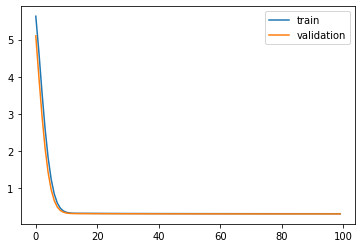

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 1s - loss: 5.6271 - acc: 0.6189 - val_loss: 5.0976 - val_acc: 0.8142

Epoch 00001: val_loss improved from inf to 5.09759, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.6690 - acc: 0.8425 - val_loss: 4.0117 - val_acc: 0.8623

Epoch 00002: val_loss improved from 5.09759 to 4.01168, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.5934 - acc: 0.8684 - val_loss: 2.9849 - val_acc: 0.8704

Epoch 00003: val_loss improved from 4.01168 to 2.98494, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.6197 - acc: 0.8727 - val_loss: 2.1137 - val_acc: 0.8722

Epoch 00004: val_loss improved from 2.98494 to 2.11373, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.8277 - acc: 0.8747 - val_loss: 1.4487 - val_acc: 0.8739

Epoch 00005: val_loss improved from 2.11373 to 1.44871, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.2439 - acc: 0.8756 - v

 - 1s - loss: 0.3196 - acc: 0.8787 - val_loss: 0.3254 - val_acc: 0.8770

Epoch 00046: val_loss improved from 0.32555 to 0.32545, saving model to Event_val_weights2.hdf5
Epoch 47/100
 - 1s - loss: 0.3195 - acc: 0.8788 - val_loss: 0.3253 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32545 to 0.32535, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3194 - acc: 0.8788 - val_loss: 0.3253 - val_acc: 0.8769

Epoch 00048: val_loss improved from 0.32535 to 0.32525, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3252 - val_acc: 0.8769

Epoch 00049: val_loss improved from 0.32525 to 0.32516, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3251 - val_acc: 0.8770

Epoch 00050: val_loss improved from 0.32516 to 0.32507, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3250 - val_acc: 0.8770

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32322 to 0.32320, saving model to Event_val_weights2.hdf5
Epoch 92/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8764

Epoch 00092: val_loss improved from 0.32320 to 0.32318, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8766

Epoch 00093: val_loss improved from 0.32318 to 0.32316, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8766

Epoch 00094: val_loss improved from 0.32316 to 0.32315, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8766

Epoch 00095: val_loss improved from 0.32315 to 0.32313, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8764

Epoch 00096: val_loss improved from 0.32313 to 0.32312, saving model to Event_val_weights

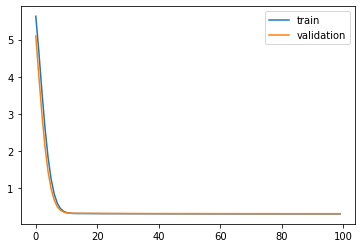

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 1s - loss: 5.6272 - acc: 0.6193 - val_loss: 5.0992 - val_acc: 0.8137

Epoch 00001: val_loss improved from inf to 5.09922, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.6692 - acc: 0.8416 - val_loss: 4.0154 - val_acc: 0.8628

Epoch 00002: val_loss improved from 5.09922 to 4.01537, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.5935 - acc: 0.8684 - val_loss: 2.9886 - val_acc: 0.8699

Epoch 00003: val_loss improved from 4.01537 to 2.98861, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.6198 - acc: 0.8729 - val_loss: 2.1175 - val_acc: 0.8719

Epoch 00004: val_loss improved from 2.98861 to 2.11747, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.8276 - acc: 0.8746 - val_loss: 1.4521 - val_acc: 0.8748

Epoch 00005: val_loss improved from 2.11747 to 1.45214, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.2438 - acc: 0.8754 - v

 - 1s - loss: 0.3196 - acc: 0.8790 - val_loss: 0.3255 - val_acc: 0.8777

Epoch 00046: val_loss improved from 0.32560 to 0.32550, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3195 - acc: 0.8789 - val_loss: 0.3254 - val_acc: 0.8778

Epoch 00047: val_loss improved from 0.32550 to 0.32541, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3193 - acc: 0.8789 - val_loss: 0.3253 - val_acc: 0.8778

Epoch 00048: val_loss improved from 0.32541 to 0.32531, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3192 - acc: 0.8789 - val_loss: 0.3252 - val_acc: 0.8778

Epoch 00049: val_loss improved from 0.32531 to 0.32522, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3251 - val_acc: 0.8778

Epoch 00050: val_loss improved from 0.32522 to 0.32514, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3190 - acc: 0.8789 - val_loss: 0.3251 - val_acc: 0.8777

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32324 to 0.32322, saving model to Event_val_weights3.hdf5
Epoch 92/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8766

Epoch 00092: val_loss improved from 0.32322 to 0.32320, saving model to Event_val_weights3.hdf5
Epoch 93/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8766

Epoch 00093: val_loss improved from 0.32320 to 0.32318, saving model to Event_val_weights3.hdf5
Epoch 94/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8767

Epoch 00094: val_loss improved from 0.32318 to 0.32316, saving model to Event_val_weights3.hdf5
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8768

Epoch 00095: val_loss improved from 0.32316 to 0.32315, saving model to Event_val_weights3.hdf5
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8768

Epoch 00096: val_loss improved from 0.32315 to 0.32313, saving model to Event_val_weights

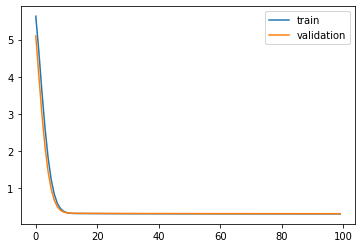

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 1s - loss: 5.6265 - acc: 0.6198 - val_loss: 5.1074 - val_acc: 0.8022

Epoch 00001: val_loss improved from inf to 5.10744, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.6688 - acc: 0.8422 - val_loss: 4.0228 - val_acc: 0.8578

Epoch 00002: val_loss improved from 5.10744 to 4.02279, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.5929 - acc: 0.8689 - val_loss: 2.9977 - val_acc: 0.8652

Epoch 00003: val_loss improved from 4.02279 to 2.99770, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.6189 - acc: 0.8735 - val_loss: 2.1265 - val_acc: 0.8672

Epoch 00004: val_loss improved from 2.99770 to 2.12651, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.8268 - acc: 0.8752 - val_loss: 1.4604 - val_acc: 0.8678

Epoch 00005: val_loss improved from 2.12651 to 1.46040, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.2430 - acc: 0.8762 - v

 - 1s - loss: 0.3191 - acc: 0.8796 - val_loss: 0.3302 - val_acc: 0.8711

Epoch 00046: val_loss improved from 0.33034 to 0.33025, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3190 - acc: 0.8796 - val_loss: 0.3302 - val_acc: 0.8711

Epoch 00047: val_loss improved from 0.33025 to 0.33015, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3188 - acc: 0.8796 - val_loss: 0.3301 - val_acc: 0.8711

Epoch 00048: val_loss improved from 0.33015 to 0.33006, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3187 - acc: 0.8796 - val_loss: 0.3300 - val_acc: 0.8712

Epoch 00049: val_loss improved from 0.33006 to 0.32997, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3186 - acc: 0.8797 - val_loss: 0.3299 - val_acc: 0.8711

Epoch 00050: val_loss improved from 0.32997 to 0.32989, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3185 - acc: 0.8797 - val_loss: 0.3298 - val_acc: 0.8714

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32810 to 0.32808, saving model to Event_val_weights4.hdf5
Epoch 92/100
 - 1s - loss: 0.3161 - acc: 0.8800 - val_loss: 0.3281 - val_acc: 0.8714

Epoch 00092: val_loss improved from 0.32808 to 0.32806, saving model to Event_val_weights4.hdf5
Epoch 93/100
 - 1s - loss: 0.3161 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00093: val_loss improved from 0.32806 to 0.32805, saving model to Event_val_weights4.hdf5
Epoch 94/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00094: val_loss improved from 0.32805 to 0.32803, saving model to Event_val_weights4.hdf5
Epoch 95/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00095: val_loss improved from 0.32803 to 0.32802, saving model to Event_val_weights4.hdf5
Epoch 96/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00096: val_loss improved from 0.32802 to 0.32800, saving model to Event_val_weights

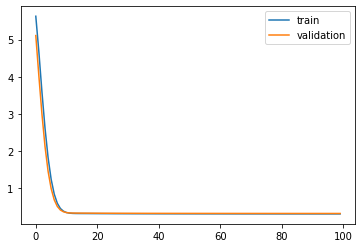

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7fee790b4a90>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 1s - loss: 5.6270 - acc: 0.6186 - val_loss: 5.1006 - val_acc: 0.8117

Epoch 00001: val_loss improved from inf to 5.10063, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.6704 - acc: 0.8410 - val_loss: 4.0070 - val_acc: 0.8677

Epoch 00002: val_loss improved from 5.10063 to 4.00696, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.5950 - acc: 0.8680 - val_loss: 2.9759 - val_acc: 0.8733

Epoch 00003: val_loss improved from 4.00696 to 2.97585, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.6208 - acc: 0.8727 - val_loss: 2.1027 - val_acc: 0.8754

Epoch 00004: val_loss improved from 2.97585 to 2.10271, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.8284 - acc: 0.8743 - val_loss: 1.4373 - val_acc: 0.8773

Epoch 00005: val_loss improved from 2.10271 to 1.43730, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.2443 - acc: 0.8751 - v

 - 1s - loss: 0.3201 - acc: 0.8785 - val_loss: 0.3207 - val_acc: 0.8790

Epoch 00046: val_loss improved from 0.32081 to 0.32071, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3200 - acc: 0.8784 - val_loss: 0.3206 - val_acc: 0.8789

Epoch 00047: val_loss improved from 0.32071 to 0.32062, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3199 - acc: 0.8784 - val_loss: 0.3205 - val_acc: 0.8790

Epoch 00048: val_loss improved from 0.32062 to 0.32053, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3198 - acc: 0.8786 - val_loss: 0.3204 - val_acc: 0.8790

Epoch 00049: val_loss improved from 0.32053 to 0.32044, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3197 - acc: 0.8786 - val_loss: 0.3204 - val_acc: 0.8791

Epoch 00050: val_loss improved from 0.32044 to 0.32035, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3196 - acc: 0.8787 - val_loss: 0.3203 - val_acc: 0.8790

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31836 to 0.31834, saving model to Event_val_weights5.hdf5
Epoch 92/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3183 - val_acc: 0.8793

Epoch 00092: val_loss improved from 0.31834 to 0.31831, saving model to Event_val_weights5.hdf5
Epoch 93/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3183 - val_acc: 0.8793

Epoch 00093: val_loss improved from 0.31831 to 0.31829, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3183 - val_acc: 0.8793

Epoch 00094: val_loss improved from 0.31829 to 0.31826, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8791 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00095: val_loss improved from 0.31826 to 0.31824, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00096: val_loss improved from 0.31824 to 0.31822, saving model to Event_val_weights

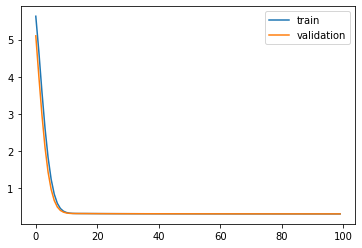

Time to train LSTM:  66.70017600059509
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 1s - loss: 5.5859 - acc: 0.6362 - val_loss: 4.9759 - val_acc: 0.8271

Epoch 00001: val_loss improved from inf to 4.97594, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.4939 - acc: 0.8501 - val_loss: 3.7465 - val_acc: 0.8724

Epoch 00002: val_loss improved from 4.97594 to 3.74651, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.2971 - acc: 0.8698 - val_loss: 2.6145 - val_acc: 0.8759

Epoch 00003: val_loss improved from 3.74651 to 2.61448, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.2486 - acc: 0.8732 - val_loss: 1.7081 - val_acc: 0.8764

Epoch 00004: val_loss improved from 2.61448 to 1.70815, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.4500 - acc: 0.8748 - val_loss: 1.0741 - val_acc: 0.8779

Epoch 00005: val_loss improved from 1.70815 to 1.07413, saving model to Event_val_weights1.hdf5
Epoch 6/100


Epoch 00046: val_loss improved from 0.31452 to 0.31444, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3198 - acc: 0.8785 - val_loss: 0.3144 - val_acc: 0.8806

Epoch 00047: val_loss improved from 0.31444 to 0.31435, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3197 - acc: 0.8785 - val_loss: 0.3143 - val_acc: 0.8806

Epoch 00048: val_loss improved from 0.31435 to 0.31427, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3196 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00049: val_loss improved from 0.31427 to 0.31419, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3195 - acc: 0.8785 - val_loss: 0.3141 - val_acc: 0.8807

Epoch 00050: val_loss improved from 0.31419 to 0.31412, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3194 - acc: 0.8786 - val_loss: 0.3140 - val_acc: 0.8806

Epoch 00051: val_loss improved from 0.31412 to 0.31405, saving model to Event_val_weights

 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8806

Epoch 00092: val_loss improved from 0.31229 to 0.31226, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8806

Epoch 00093: val_loss improved from 0.31226 to 0.31224, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8806

Epoch 00094: val_loss improved from 0.31224 to 0.31221, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8806

Epoch 00095: val_loss improved from 0.31221 to 0.31219, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8804

Epoch 00096: val_loss improved from 0.31219 to 0.31217, saving model to Event_val_weights1.hdf5
Epoch 97/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8806

Epoch 00097: val_

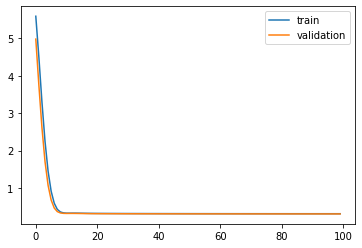

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 2s - loss: 5.5864 - acc: 0.6350 - val_loss: 4.9756 - val_acc: 0.8272

Epoch 00001: val_loss improved from inf to 4.97562, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.4929 - acc: 0.8512 - val_loss: 3.7584 - val_acc: 0.8661

Epoch 00002: val_loss improved from 4.97562 to 3.75840, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.2955 - acc: 0.8703 - val_loss: 2.6319 - val_acc: 0.8708

Epoch 00003: val_loss improved from 3.75840 to 2.63191, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.2471 - acc: 0.8737 - val_loss: 1.7273 - val_acc: 0.8733

Epoch 00004: val_loss improved from 2.63191 to 1.72730, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.4487 - acc: 0.8752 - val_loss: 1.0931 - val_acc: 0.8738

Epoch 00005: val_loss improved from 1.72730 to 1.09307, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 0.9136 - acc: 0.8760 - v

 - 1s - loss: 0.3187 - acc: 0.8790 - val_loss: 0.3247 - val_acc: 0.8771

Epoch 00047: val_loss improved from 0.32475 to 0.32465, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8772

Epoch 00048: val_loss improved from 0.32465 to 0.32457, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00049: val_loss improved from 0.32457 to 0.32448, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8773

Epoch 00050: val_loss improved from 0.32448 to 0.32440, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3183 - acc: 0.8789 - val_loss: 0.3243 - val_acc: 0.8772

Epoch 00051: val_loss improved from 0.32440 to 0.32433, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3182 - acc: 0.8790 - val_loss: 0.3243 - val_acc: 0.8772

Epoch 00052: val_

 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00093: val_loss did not improve from 0.32312
Epoch 94/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00094: val_loss did not improve from 0.32312
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8757

Epoch 00095: val_loss did not improve from 0.32312
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8757

Epoch 00096: val_loss did not improve from 0.32312
Epoch 97/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8757

Epoch 00097: val_loss did not improve from 0.32312
Epoch 98/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8759

Epoch 00098: val_loss did not improve from 0.32312
Epoch 99/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8759

Epoch 00099: val_loss did not improve from 0.32312
Epoch 100/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val

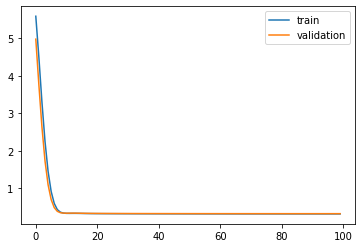

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7fecabde4588>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 2s - loss: 5.5865 - acc: 0.6351 - val_loss: 4.9776 - val_acc: 0.8283

Epoch 00001: val_loss improved from inf to 4.97764, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.4932 - acc: 0.8501 - val_loss: 3.7622 - val_acc: 0.8650

Epoch 00002: val_loss improved from 4.97764 to 3.76218, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.2956 - acc: 0.8702 - val_loss: 2.6357 - val_acc: 0.8714

Epoch 00003: val_loss improved from 3.76218 to 2.63566, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.2471 - acc: 0.8738 - val_loss: 1.7312 - val_acc: 0.8740

Epoch 00004: val_loss improved from 2.63566 to 1.73124, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.4485 - acc: 0.8750 - val_loss: 1.0963 - val_acc: 0.8749

Epoch 00005: val_loss improved from 1.73124 to 1.09628, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 0.9135 - acc: 0.8759 - v

 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8777

Epoch 00047: val_loss improved from 0.32485 to 0.32476, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3247 - val_acc: 0.8777

Epoch 00048: val_loss improved from 0.32476 to 0.32467, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8777

Epoch 00049: val_loss improved from 0.32467 to 0.32459, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8776

Epoch 00050: val_loss improved from 0.32459 to 0.32451, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8776

Epoch 00051: val_loss improved from 0.32451 to 0.32444, saving model to Event_val_weights3.hdf5
Epoch 52/100
 - 1s - loss: 0.3182 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8773

Epoch 00052: val_


Epoch 00094: val_loss did not improve from 0.32325
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3234 - val_acc: 0.8768

Epoch 00095: val_loss did not improve from 0.32325
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3235 - val_acc: 0.8768

Epoch 00096: val_loss did not improve from 0.32325
Epoch 97/100
 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3235 - val_acc: 0.8767

Epoch 00097: val_loss did not improve from 0.32325
Epoch 98/100
 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3235 - val_acc: 0.8766

Epoch 00098: val_loss did not improve from 0.32325
Epoch 99/100
 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3236 - val_acc: 0.8766

Epoch 00099: val_loss did not improve from 0.32325
Epoch 100/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3236 - val_acc: 0.8768

Epoch 00100: val_loss did not improve from 0.32325
#################################
Number of units: 16
Batch size: 16384
Fold: 2
L2 : 0.05441600579314996
LR: 0.04279918792240

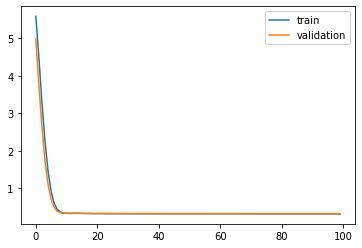

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 2s - loss: 5.5859 - acc: 0.6360 - val_loss: 4.9856 - val_acc: 0.8162

Epoch 00001: val_loss improved from inf to 4.98561, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.4929 - acc: 0.8509 - val_loss: 3.7700 - val_acc: 0.8604

Epoch 00002: val_loss improved from 4.98561 to 3.77004, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.2949 - acc: 0.8709 - val_loss: 2.6450 - val_acc: 0.8658

Epoch 00003: val_loss improved from 3.77004 to 2.64496, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.2463 - acc: 0.8744 - val_loss: 1.7398 - val_acc: 0.8673

Epoch 00004: val_loss improved from 2.64496 to 1.73981, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.4477 - acc: 0.8759 - val_loss: 1.1038 - val_acc: 0.8683

Epoch 00005: val_loss improved from 1.73981 to 1.10385, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 0.9127 - acc: 0.8766 - v

 - 1s - loss: 0.3182 - acc: 0.8798 - val_loss: 0.3295 - val_acc: 0.8713

Epoch 00047: val_loss improved from 0.32958 to 0.32949, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3181 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8712

Epoch 00048: val_loss improved from 0.32949 to 0.32941, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3180 - acc: 0.8798 - val_loss: 0.3293 - val_acc: 0.8713

Epoch 00049: val_loss improved from 0.32941 to 0.32933, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3179 - acc: 0.8798 - val_loss: 0.3293 - val_acc: 0.8713

Epoch 00050: val_loss improved from 0.32933 to 0.32925, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3178 - acc: 0.8798 - val_loss: 0.3292 - val_acc: 0.8712

Epoch 00051: val_loss improved from 0.32925 to 0.32918, saving model to Event_val_weights4.hdf5
Epoch 52/100
 - 1s - loss: 0.3177 - acc: 0.8799 - val_loss: 0.3291 - val_acc: 0.8711

Epoch 00052: val_


Epoch 00094: val_loss did not improve from 0.32807
Epoch 95/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3282 - val_acc: 0.8717

Epoch 00095: val_loss did not improve from 0.32807
Epoch 96/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3282 - val_acc: 0.8714

Epoch 00096: val_loss did not improve from 0.32807
Epoch 97/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3283 - val_acc: 0.8711

Epoch 00097: val_loss did not improve from 0.32807
Epoch 98/100
 - 1s - loss: 0.3159 - acc: 0.8800 - val_loss: 0.3283 - val_acc: 0.8710

Epoch 00098: val_loss did not improve from 0.32807
Epoch 99/100
 - 1s - loss: 0.3159 - acc: 0.8800 - val_loss: 0.3283 - val_acc: 0.8710

Epoch 00099: val_loss did not improve from 0.32807
Epoch 100/100
 - 1s - loss: 0.3159 - acc: 0.8800 - val_loss: 0.3283 - val_acc: 0.8709

Epoch 00100: val_loss did not improve from 0.32807
#################################
Number of units: 16
Batch size: 16384
Fold: 3
L2 : 0.05441600579314996
LR: 0.04279918792240

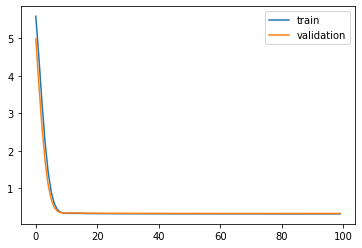

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 2s - loss: 5.5865 - acc: 0.6350 - val_loss: 4.9777 - val_acc: 0.8279

Epoch 00001: val_loss improved from inf to 4.97771, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.4945 - acc: 0.8495 - val_loss: 3.7522 - val_acc: 0.8697

Epoch 00002: val_loss improved from 4.97771 to 3.75222, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.2970 - acc: 0.8697 - val_loss: 2.6217 - val_acc: 0.8746

Epoch 00003: val_loss improved from 3.75222 to 2.62167, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.2481 - acc: 0.8734 - val_loss: 1.7154 - val_acc: 0.8777

Epoch 00004: val_loss improved from 2.62167 to 1.71540, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.4492 - acc: 0.8749 - val_loss: 1.0814 - val_acc: 0.8774

Epoch 00005: val_loss improved from 1.71540 to 1.08140, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 0.9138 - acc: 0.8758 - v

 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3200 - val_acc: 0.8789

Epoch 00047: val_loss improved from 0.32005 to 0.31996, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3199 - val_acc: 0.8789

Epoch 00048: val_loss improved from 0.31996 to 0.31987, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3190 - acc: 0.8788 - val_loss: 0.3198 - val_acc: 0.8790

Epoch 00049: val_loss improved from 0.31987 to 0.31979, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3197 - val_acc: 0.8792

Epoch 00050: val_loss improved from 0.31979 to 0.31971, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3196 - val_acc: 0.8793

Epoch 00051: val_loss improved from 0.31971 to 0.31963, saving model to Event_val_weights5.hdf5
Epoch 52/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3196 - val_acc: 0.8792

Epoch 00052: val_


Epoch 00093: val_loss did not improve from 0.31805
Epoch 94/100
 - 1s - loss: 0.3172 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00094: val_loss improved from 0.31805 to 0.31802, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3172 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00095: val_loss did not improve from 0.31802
Epoch 96/100
 - 1s - loss: 0.3172 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00096: val_loss improved from 0.31802 to 0.31802, saving model to Event_val_weights5.hdf5
Epoch 97/100
 - 1s - loss: 0.3172 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00097: val_loss did not improve from 0.31802
Epoch 98/100
 - 1s - loss: 0.3172 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00098: val_loss did not improve from 0.31802
Epoch 99/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00099: val_loss did not improve from 0.31802
Epoch 100/100
 - 1s - loss: 0.3172 -

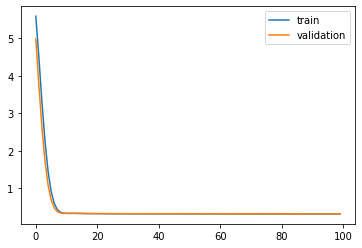

Time to train LSTM:  65.8003797531128


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7fecaafc52b0>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 2s - loss: 5.6055 - acc: 0.6285 - val_loss: 5.0350 - val_acc: 0.8206

Epoch 00001: val_loss improved from inf to 5.03501, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.5779 - acc: 0.8466 - val_loss: 3.8681 - val_acc: 0.8718

Epoch 00002: val_loss improved from 5.03501 to 3.86814, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.4385 - acc: 0.8687 - val_loss: 2.7817 - val_acc: 0.8763

Epoch 00003: val_loss improved from 3.86814 to 2.78167, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.4232 - acc: 0.8729 - val_loss: 1.8875 - val_acc: 0.8762

Epoch 00004: val_loss improved from 2.78167 to 1.88750, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.6238 - acc: 0.8745 - val_loss: 1.2346 - val_acc: 0.8773

Epoch 00005: val_loss improved from 1.88750 to 1.23465, saving model to Event_val_weights1.hdf5
Epoch 6/100
 - 1s - loss: 1.0618 - acc: 0.8755 - v

 - 1s - loss: 0.3203 - acc: 0.8784 - val_loss: 0.3147 - val_acc: 0.8807

Epoch 00046: val_loss improved from 0.31482 to 0.31473, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3202 - acc: 0.8783 - val_loss: 0.3146 - val_acc: 0.8807

Epoch 00047: val_loss improved from 0.31473 to 0.31464, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3201 - acc: 0.8783 - val_loss: 0.3146 - val_acc: 0.8804

Epoch 00048: val_loss improved from 0.31464 to 0.31456, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3200 - acc: 0.8784 - val_loss: 0.3145 - val_acc: 0.8807

Epoch 00049: val_loss improved from 0.31456 to 0.31448, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3199 - acc: 0.8784 - val_loss: 0.3144 - val_acc: 0.8807

Epoch 00050: val_loss improved from 0.31448 to 0.31440, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3198 - acc: 0.8785 - val_loss: 0.3143 - val_acc: 0.8806

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31255 to 0.31252, saving model to Event_val_weights1.hdf5
Epoch 92/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3125 - val_acc: 0.8804

Epoch 00092: val_loss improved from 0.31252 to 0.31250, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3125 - val_acc: 0.8804

Epoch 00093: val_loss improved from 0.31250 to 0.31247, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00094: val_loss improved from 0.31247 to 0.31244, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00095: val_loss improved from 0.31244 to 0.31241, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00096: val_loss improved from 0.31241 to 0.31239, saving model to Event_val_weights

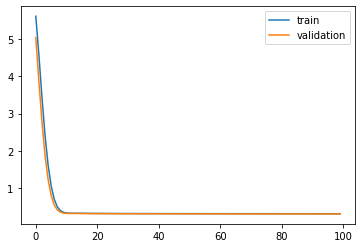

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 3s - loss: 5.6060 - acc: 0.6276 - val_loss: 5.0340 - val_acc: 0.8217

Epoch 00001: val_loss improved from inf to 5.03400, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.5769 - acc: 0.8473 - val_loss: 3.8791 - val_acc: 0.8641

Epoch 00002: val_loss improved from 5.03400 to 3.87906, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.4369 - acc: 0.8695 - val_loss: 2.7984 - val_acc: 0.8708

Epoch 00003: val_loss improved from 3.87906 to 2.79844, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.4216 - acc: 0.8734 - val_loss: 1.9062 - val_acc: 0.8726

Epoch 00004: val_loss improved from 2.79844 to 1.90622, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.6225 - acc: 0.8749 - val_loss: 1.2534 - val_acc: 0.8737

Epoch 00005: val_loss improved from 1.90622 to 1.25341, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.0606 - acc: 0.8759 - v

 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3250 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32506 to 0.32497, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3190 - acc: 0.8788 - val_loss: 0.3249 - val_acc: 0.8770

Epoch 00048: val_loss improved from 0.32497 to 0.32488, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8770

Epoch 00049: val_loss improved from 0.32488 to 0.32479, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8771

Epoch 00050: val_loss improved from 0.32479 to 0.32470, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3246 - val_acc: 0.8770

Epoch 00051: val_loss improved from 0.32470 to 0.32462, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00052: val_


Epoch 00092: val_loss improved from 0.32310 to 0.32309, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00093: val_loss improved from 0.32309 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8760

Epoch 00094: val_loss improved from 0.32308 to 0.32307, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8759

Epoch 00095: val_loss improved from 0.32307 to 0.32306, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8758

Epoch 00096: val_loss improved from 0.32306 to 0.32306, saving model to Event_val_weights2.hdf5
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00097: val_loss improved from 0.32306 to 0.32306, saving model to Event_val_weights

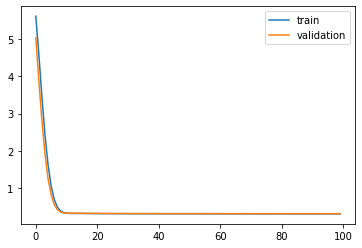

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 3s - loss: 5.6061 - acc: 0.6279 - val_loss: 5.0358 - val_acc: 0.8203

Epoch 00001: val_loss improved from inf to 5.03583, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.5772 - acc: 0.8463 - val_loss: 3.8828 - val_acc: 0.8640

Epoch 00002: val_loss improved from 5.03583 to 3.88281, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.4370 - acc: 0.8695 - val_loss: 2.8021 - val_acc: 0.8709

Epoch 00003: val_loss improved from 3.88281 to 2.80213, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.4217 - acc: 0.8732 - val_loss: 1.9101 - val_acc: 0.8734

Epoch 00004: val_loss improved from 2.80213 to 1.91006, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.6223 - acc: 0.8750 - val_loss: 1.2568 - val_acc: 0.8748

Epoch 00005: val_loss improved from 1.91006 to 1.25676, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.0605 - acc: 0.8757 - v


Epoch 00046: val_loss improved from 0.32524 to 0.32514, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3190 - acc: 0.8790 - val_loss: 0.3251 - val_acc: 0.8779

Epoch 00047: val_loss improved from 0.32514 to 0.32505, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3189 - acc: 0.8790 - val_loss: 0.3250 - val_acc: 0.8777

Epoch 00048: val_loss improved from 0.32505 to 0.32496, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3188 - acc: 0.8790 - val_loss: 0.3249 - val_acc: 0.8776

Epoch 00049: val_loss improved from 0.32496 to 0.32488, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8776

Epoch 00050: val_loss improved from 0.32488 to 0.32479, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3247 - val_acc: 0.8774

Epoch 00051: val_loss improved from 0.32479 to 0.32472, saving model to Event_val_weights

 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8768

Epoch 00092: val_loss improved from 0.32316 to 0.32315, saving model to Event_val_weights3.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8769

Epoch 00093: val_loss improved from 0.32315 to 0.32315, saving model to Event_val_weights3.hdf5
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8770

Epoch 00094: val_loss improved from 0.32315 to 0.32315, saving model to Event_val_weights3.hdf5
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8770

Epoch 00095: val_loss did not improve from 0.32315
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8770

Epoch 00096: val_loss did not improve from 0.32315
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8770

Epoch 00097: val_loss did not improve from 0.32315
Epoch 98/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_lo

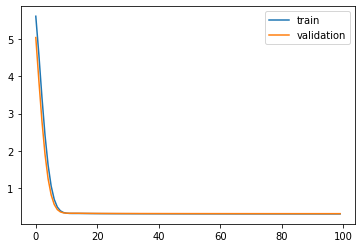

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 3s - loss: 5.6054 - acc: 0.6288 - val_loss: 5.0439 - val_acc: 0.8093

Epoch 00001: val_loss improved from inf to 5.04392, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.5768 - acc: 0.8470 - val_loss: 3.8904 - val_acc: 0.8594

Epoch 00002: val_loss improved from 5.04392 to 3.89044, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.4364 - acc: 0.8700 - val_loss: 2.8114 - val_acc: 0.8658

Epoch 00003: val_loss improved from 3.89044 to 2.81138, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.4208 - acc: 0.8738 - val_loss: 1.9189 - val_acc: 0.8668

Epoch 00004: val_loss improved from 2.81138 to 1.91889, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.6216 - acc: 0.8757 - val_loss: 1.2647 - val_acc: 0.8680

Epoch 00005: val_loss improved from 1.91889 to 1.26468, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.0597 - acc: 0.8762 - v


Epoch 00046: val_loss improved from 0.32998 to 0.32988, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3185 - acc: 0.8797 - val_loss: 0.3298 - val_acc: 0.8714

Epoch 00047: val_loss improved from 0.32988 to 0.32979, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3184 - acc: 0.8797 - val_loss: 0.3297 - val_acc: 0.8716

Epoch 00048: val_loss improved from 0.32979 to 0.32971, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3183 - acc: 0.8798 - val_loss: 0.3296 - val_acc: 0.8716

Epoch 00049: val_loss improved from 0.32971 to 0.32962, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3182 - acc: 0.8798 - val_loss: 0.3295 - val_acc: 0.8714

Epoch 00050: val_loss improved from 0.32962 to 0.32954, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3181 - acc: 0.8798 - val_loss: 0.3295 - val_acc: 0.8716

Epoch 00051: val_loss improved from 0.32954 to 0.32946, saving model to Event_val_weights

 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00092: val_loss improved from 0.32801 to 0.32800, saving model to Event_val_weights4.hdf5
Epoch 93/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00093: val_loss improved from 0.32800 to 0.32800, saving model to Event_val_weights4.hdf5
Epoch 94/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00094: val_loss improved from 0.32800 to 0.32799, saving model to Event_val_weights4.hdf5
Epoch 95/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00095: val_loss improved from 0.32799 to 0.32799, saving model to Event_val_weights4.hdf5
Epoch 96/100
 - 1s - loss: 0.3158 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00096: val_loss did not improve from 0.32799
Epoch 97/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00097: val_loss did not improve from 0.32799
Epoch 98/10

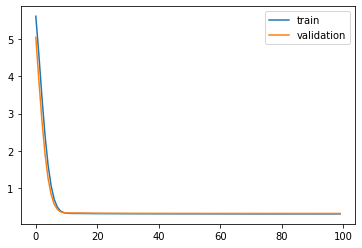

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7feca43a97b8>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 4s - loss: 5.6060 - acc: 0.6276 - val_loss: 5.0365 - val_acc: 0.8209

Epoch 00001: val_loss improved from inf to 5.03653, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.5785 - acc: 0.8457 - val_loss: 3.8735 - val_acc: 0.8688

Epoch 00002: val_loss improved from 5.03653 to 3.87355, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.4385 - acc: 0.8689 - val_loss: 2.7887 - val_acc: 0.8734

Epoch 00003: val_loss improved from 3.87355 to 2.78873, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.4227 - acc: 0.8729 - val_loss: 1.8947 - val_acc: 0.8767

Epoch 00004: val_loss improved from 2.78873 to 1.89470, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.6231 - acc: 0.8747 - val_loss: 1.2418 - val_acc: 0.8769

Epoch 00005: val_loss improved from 1.89470 to 1.24183, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.0609 - acc: 0.8754 - v


Epoch 00046: val_loss improved from 0.32045 to 0.32036, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3196 - acc: 0.8787 - val_loss: 0.3203 - val_acc: 0.8790

Epoch 00047: val_loss improved from 0.32036 to 0.32026, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3195 - acc: 0.8788 - val_loss: 0.3202 - val_acc: 0.8790

Epoch 00048: val_loss improved from 0.32026 to 0.32017, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3194 - acc: 0.8788 - val_loss: 0.3201 - val_acc: 0.8789

Epoch 00049: val_loss improved from 0.32017 to 0.32009, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3200 - val_acc: 0.8789

Epoch 00050: val_loss improved from 0.32009 to 0.32000, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3199 - val_acc: 0.8789

Epoch 00051: val_loss improved from 0.32000 to 0.31992, saving model to Event_val_weights

 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8792

Epoch 00092: val_loss improved from 0.31815 to 0.31813, saving model to Event_val_weights5.hdf5
Epoch 93/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8792

Epoch 00093: val_loss improved from 0.31813 to 0.31812, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8792

Epoch 00094: val_loss improved from 0.31812 to 0.31809, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00095: val_loss did not improve from 0.31809
Epoch 96/100
 - 1s - loss: 0.3170 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00096: val_loss improved from 0.31809 to 0.31804, saving model to Event_val_weights5.hdf5
Epoch 97/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00097: val_loss did not improve from 0.31804
Epoch 98/10

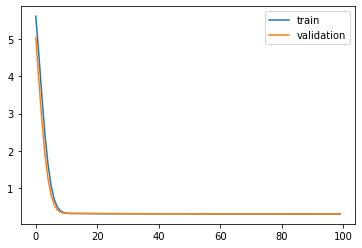

Time to train LSTM:  71.04737448692322
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 3s - loss: 5.5892 - acc: 0.6350 - val_loss: 4.9856 - val_acc: 0.8264

Epoch 00001: val_loss improved from inf to 4.98560, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.5076 - acc: 0.8498 - val_loss: 3.7663 - val_acc: 0.8722

Epoch 00002: val_loss improved from 4.98560 to 3.76633, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.3201 - acc: 0.8697 - val_loss: 2.6415 - val_acc: 0.8759

Epoch 00003: val_loss improved from 3.76633 to 2.64151, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.2767 - acc: 0.8731 - val_loss: 1.7367 - val_acc: 0.8764

Epoch 00004: val_loss improved from 2.64151 to 1.73671, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.4775 - acc: 0.8747 - val_loss: 1.0992 - val_acc: 0.8779

Epoch 00005: val_loss improved from 1.73671 to 1.09916, saving model to Event_val_weights1.hdf5
Epoch 6/100


Epoch 00046: val_loss improved from 0.31457 to 0.31448, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3199 - acc: 0.8784 - val_loss: 0.3144 - val_acc: 0.8807

Epoch 00047: val_loss improved from 0.31448 to 0.31440, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3198 - acc: 0.8785 - val_loss: 0.3143 - val_acc: 0.8807

Epoch 00048: val_loss improved from 0.31440 to 0.31432, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3197 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00049: val_loss improved from 0.31432 to 0.31424, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3196 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00050: val_loss improved from 0.31424 to 0.31416, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3195 - acc: 0.8785 - val_loss: 0.3141 - val_acc: 0.8806

Epoch 00051: val_loss improved from 0.31416 to 0.31409, saving model to Event_val_weights

 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00092: val_loss improved from 0.31233 to 0.31230, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00093: val_loss improved from 0.31230 to 0.31227, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8804

Epoch 00094: val_loss improved from 0.31227 to 0.31225, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8806

Epoch 00095: val_loss improved from 0.31225 to 0.31222, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8806

Epoch 00096: val_loss improved from 0.31222 to 0.31220, saving model to Event_val_weights1.hdf5
Epoch 97/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8806

Epoch 00097: val_

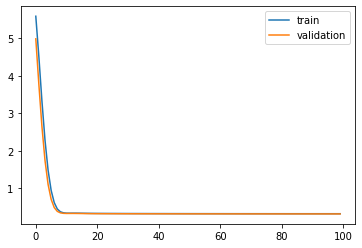

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 4s - loss: 5.5896 - acc: 0.6337 - val_loss: 4.9852 - val_acc: 0.8266

Epoch 00001: val_loss improved from inf to 4.98517, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.5066 - acc: 0.8507 - val_loss: 3.7781 - val_acc: 0.8658

Epoch 00002: val_loss improved from 4.98517 to 3.77807, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.3184 - acc: 0.8703 - val_loss: 2.6588 - val_acc: 0.8708

Epoch 00003: val_loss improved from 3.77807 to 2.65883, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.2751 - acc: 0.8738 - val_loss: 1.7558 - val_acc: 0.8733

Epoch 00004: val_loss improved from 2.65883 to 1.75580, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.4761 - acc: 0.8752 - val_loss: 1.1181 - val_acc: 0.8737

Epoch 00005: val_loss improved from 1.75580 to 1.11807, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 0.9363 - acc: 0.8760 - v

 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8771

Epoch 00047: val_loss improved from 0.32480 to 0.32470, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3187 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8771

Epoch 00048: val_loss improved from 0.32470 to 0.32462, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00049: val_loss improved from 0.32462 to 0.32453, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8773

Epoch 00050: val_loss improved from 0.32453 to 0.32445, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8772

Epoch 00051: val_loss improved from 0.32445 to 0.32437, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3243 - val_acc: 0.8772

Epoch 00052: val_


Epoch 00092: val_loss did not improve from 0.32310
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8756

Epoch 00093: val_loss did not improve from 0.32310
Epoch 94/100
 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8756

Epoch 00094: val_loss did not improve from 0.32310
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00095: val_loss did not improve from 0.32310
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00096: val_loss did not improve from 0.32310
Epoch 97/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00097: val_loss did not improve from 0.32310
Epoch 98/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8756

Epoch 00098: val_loss did not improve from 0.32310
Epoch 99/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8757

Epoch 00099: val_loss did not improve fr

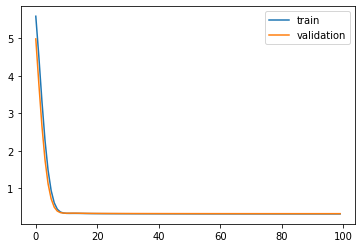

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 4s - loss: 5.5897 - acc: 0.6340 - val_loss: 4.9872 - val_acc: 0.8270

Epoch 00001: val_loss improved from inf to 4.98716, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.5069 - acc: 0.8495 - val_loss: 3.7818 - val_acc: 0.8647

Epoch 00002: val_loss improved from 4.98716 to 3.78184, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.3185 - acc: 0.8702 - val_loss: 2.6626 - val_acc: 0.8712

Epoch 00003: val_loss improved from 3.78184 to 2.66257, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.2751 - acc: 0.8737 - val_loss: 1.7597 - val_acc: 0.8739

Epoch 00004: val_loss improved from 2.66257 to 1.75972, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.4760 - acc: 0.8750 - val_loss: 1.1213 - val_acc: 0.8749

Epoch 00005: val_loss improved from 1.75972 to 1.12131, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 0.9362 - acc: 0.8760 - v

 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8776

Epoch 00047: val_loss improved from 0.32489 to 0.32480, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3186 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8777

Epoch 00048: val_loss improved from 0.32480 to 0.32472, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8777

Epoch 00049: val_loss improved from 0.32472 to 0.32464, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8776

Epoch 00050: val_loss improved from 0.32464 to 0.32456, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8776

Epoch 00051: val_loss improved from 0.32456 to 0.32448, saving model to Event_val_weights3.hdf5
Epoch 52/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8776

Epoch 00052: val_

 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8769

Epoch 00094: val_loss did not improve from 0.32324
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8797 - val_loss: 0.3233 - val_acc: 0.8768

Epoch 00095: val_loss did not improve from 0.32324
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3234 - val_acc: 0.8768

Epoch 00096: val_loss did not improve from 0.32324
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3234 - val_acc: 0.8768

Epoch 00097: val_loss did not improve from 0.32324
Epoch 98/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3235 - val_acc: 0.8768

Epoch 00098: val_loss did not improve from 0.32324
Epoch 99/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3235 - val_acc: 0.8766

Epoch 00099: val_loss did not improve from 0.32324
Epoch 100/100
 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3235 - val_acc: 0.8766

Epoch 00100: val_loss did not improve from 0.32324
#################################
Number of units: 16

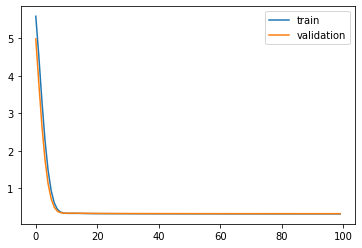

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 4s - loss: 5.5891 - acc: 0.6349 - val_loss: 4.9951 - val_acc: 0.8156

Epoch 00001: val_loss improved from inf to 4.99515, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.5066 - acc: 0.8504 - val_loss: 3.7897 - val_acc: 0.8603

Epoch 00002: val_loss improved from 4.99515 to 3.78966, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.3179 - acc: 0.8708 - val_loss: 2.6719 - val_acc: 0.8657

Epoch 00003: val_loss improved from 3.78966 to 2.67187, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.2743 - acc: 0.8742 - val_loss: 1.7683 - val_acc: 0.8673

Epoch 00004: val_loss improved from 2.67187 to 1.76834, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.4752 - acc: 0.8759 - val_loss: 1.1289 - val_acc: 0.8682

Epoch 00005: val_loss improved from 1.76834 to 1.12893, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 0.9353 - acc: 0.8765 - v

 - 1s - loss: 0.3182 - acc: 0.8797 - val_loss: 0.3295 - val_acc: 0.8716

Epoch 00047: val_loss improved from 0.32963 to 0.32954, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3181 - acc: 0.8798 - val_loss: 0.3295 - val_acc: 0.8714

Epoch 00048: val_loss improved from 0.32954 to 0.32946, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3180 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8712

Epoch 00049: val_loss improved from 0.32946 to 0.32938, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3179 - acc: 0.8798 - val_loss: 0.3293 - val_acc: 0.8713

Epoch 00050: val_loss improved from 0.32938 to 0.32930, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3178 - acc: 0.8798 - val_loss: 0.3292 - val_acc: 0.8711

Epoch 00051: val_loss improved from 0.32930 to 0.32922, saving model to Event_val_weights4.hdf5
Epoch 52/100
 - 1s - loss: 0.3177 - acc: 0.8798 - val_loss: 0.3292 - val_acc: 0.8712

Epoch 00052: val_

 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3281 - val_acc: 0.8716

Epoch 00094: val_loss did not improve from 0.32806
Epoch 95/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3281 - val_acc: 0.8716

Epoch 00095: val_loss did not improve from 0.32806
Epoch 96/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3282 - val_acc: 0.8716

Epoch 00096: val_loss did not improve from 0.32806
Epoch 97/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3282 - val_acc: 0.8717

Epoch 00097: val_loss did not improve from 0.32806
Epoch 98/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3282 - val_acc: 0.8713

Epoch 00098: val_loss did not improve from 0.32806
Epoch 99/100
 - 1s - loss: 0.3159 - acc: 0.8800 - val_loss: 0.3282 - val_acc: 0.8710

Epoch 00099: val_loss did not improve from 0.32806
Epoch 100/100
 - 1s - loss: 0.3159 - acc: 0.8800 - val_loss: 0.3283 - val_acc: 0.8710

Epoch 00100: val_loss did not improve from 0.32806
#################################
Number of units: 16

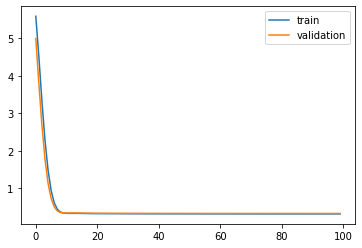

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7feca2c85c18>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 4s - loss: 5.5898 - acc: 0.6339 - val_loss: 4.9873 - val_acc: 0.8269

Epoch 00001: val_loss improved from inf to 4.98733, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.5082 - acc: 0.8487 - val_loss: 3.7720 - val_acc: 0.8697

Epoch 00002: val_loss improved from 4.98733 to 3.77200, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.3200 - acc: 0.8696 - val_loss: 2.6487 - val_acc: 0.8744

Epoch 00003: val_loss improved from 3.77200 to 2.64867, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.2761 - acc: 0.8733 - val_loss: 1.7440 - val_acc: 0.8774

Epoch 00004: val_loss improved from 2.64867 to 1.74395, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.4767 - acc: 0.8748 - val_loss: 1.1064 - val_acc: 0.8773

Epoch 00005: val_loss improved from 1.74395 to 1.10641, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 0.9365 - acc: 0.8758 - v

 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3200 - val_acc: 0.8789

Epoch 00047: val_loss improved from 0.32010 to 0.32001, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3199 - val_acc: 0.8789

Epoch 00048: val_loss improved from 0.32001 to 0.31992, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3198 - val_acc: 0.8789

Epoch 00049: val_loss improved from 0.31992 to 0.31983, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3190 - acc: 0.8788 - val_loss: 0.3198 - val_acc: 0.8792

Epoch 00050: val_loss improved from 0.31983 to 0.31975, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3197 - val_acc: 0.8792

Epoch 00051: val_loss improved from 0.31975 to 0.31967, saving model to Event_val_weights5.hdf5
Epoch 52/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3196 - val_acc: 0.8794

Epoch 00052: val_


Epoch 00093: val_loss improved from 0.31806 to 0.31805, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3172 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00094: val_loss did not improve from 0.31805
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00095: val_loss improved from 0.31805 to 0.31802, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3172 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00096: val_loss did not improve from 0.31802
Epoch 97/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8793

Epoch 00097: val_loss improved from 0.31802 to 0.31801, saving model to Event_val_weights5.hdf5
Epoch 98/100
 - 1s - loss: 0.3172 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00098: val_loss did not improve from 0.31801
Epoch 99/100
 - 1s - loss: 0.3172 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00099: val_loss did not improve from

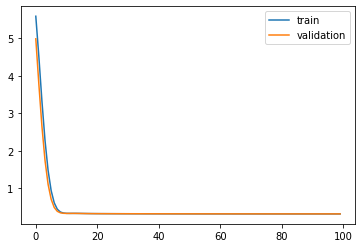

Time to train LSTM:  71.1127119064331
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 6s - loss: 5.5747 - acc: 0.6405 - val_loss: 4.9424 - val_acc: 0.8300

Epoch 00001: val_loss improved from inf to 4.94237, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.4464 - acc: 0.8519 - val_loss: 3.6778 - val_acc: 0.8728

Epoch 00002: val_loss improved from 4.94237 to 3.67781, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.2176 - acc: 0.8700 - val_loss: 2.5215 - val_acc: 0.8758

Epoch 00003: val_loss improved from 3.67781 to 2.52151, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.1525 - acc: 0.8733 - val_loss: 1.6112 - val_acc: 0.8767

Epoch 00004: val_loss improved from 2.52151 to 1.61120, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.3574 - acc: 0.8749 - val_loss: 0.9908 - val_acc: 0.8781

Epoch 00005: val_loss improved from 1.61120 to 0.99081, saving model to Event_val_weights1.hdf5
Epoch 6/100



Epoch 00046: val_loss improved from 0.31436 to 0.31428, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3197 - acc: 0.8784 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00047: val_loss improved from 0.31428 to 0.31420, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3195 - acc: 0.8785 - val_loss: 0.3141 - val_acc: 0.8807

Epoch 00048: val_loss improved from 0.31420 to 0.31412, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3195 - acc: 0.8786 - val_loss: 0.3140 - val_acc: 0.8804

Epoch 00049: val_loss improved from 0.31412 to 0.31404, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3194 - acc: 0.8787 - val_loss: 0.3140 - val_acc: 0.8803

Epoch 00050: val_loss improved from 0.31404 to 0.31397, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3193 - acc: 0.8787 - val_loss: 0.3139 - val_acc: 0.8802

Epoch 00051: val_loss improved from 0.31397 to 0.31390, saving model to Event_val_weights

 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8806

Epoch 00092: val_loss improved from 0.31218 to 0.31216, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8804

Epoch 00093: val_loss improved from 0.31216 to 0.31214, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8804

Epoch 00094: val_loss improved from 0.31214 to 0.31212, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8806

Epoch 00095: val_loss improved from 0.31212 to 0.31210, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8806

Epoch 00096: val_loss improved from 0.31210 to 0.31209, saving model to Event_val_weights1.hdf5
Epoch 97/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3121 - val_acc: 0.8806

Epoch 00097: val_

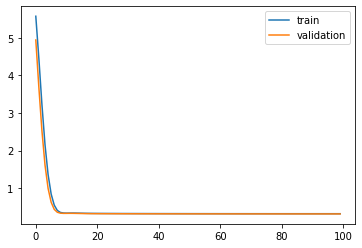

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 4s - loss: 5.5752 - acc: 0.6393 - val_loss: 4.9424 - val_acc: 0.8302

Epoch 00001: val_loss improved from inf to 4.94244, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.4453 - acc: 0.8528 - val_loss: 3.6902 - val_acc: 0.8662

Epoch 00002: val_loss improved from 4.94244 to 3.69022, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.2160 - acc: 0.8706 - val_loss: 2.5393 - val_acc: 0.8709

Epoch 00003: val_loss improved from 3.69022 to 2.53928, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.1510 - acc: 0.8738 - val_loss: 1.6306 - val_acc: 0.8734

Epoch 00004: val_loss improved from 2.53928 to 1.63057, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.3561 - acc: 0.8753 - val_loss: 1.0098 - val_acc: 0.8738

Epoch 00005: val_loss improved from 1.63057 to 1.00982, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 0.8388 - acc: 0.8762 - v

 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00047: val_loss improved from 0.32458 to 0.32449, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8772

Epoch 00048: val_loss improved from 0.32449 to 0.32441, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3243 - val_acc: 0.8773

Epoch 00049: val_loss improved from 0.32441 to 0.32433, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3182 - acc: 0.8790 - val_loss: 0.3243 - val_acc: 0.8772

Epoch 00050: val_loss improved from 0.32433 to 0.32425, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3182 - acc: 0.8790 - val_loss: 0.3242 - val_acc: 0.8771

Epoch 00051: val_loss improved from 0.32425 to 0.32418, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3181 - acc: 0.8790 - val_loss: 0.3241 - val_acc: 0.8770

Epoch 00052: val_

 - 1s - loss: 0.3166 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00095: val_loss did not improve from 0.32316
Epoch 96/100
 - 1s - loss: 0.3166 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00096: val_loss did not improve from 0.32316
Epoch 97/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8759

Epoch 00097: val_loss did not improve from 0.32316
Epoch 98/100
 - 1s - loss: 0.3166 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8759

Epoch 00098: val_loss did not improve from 0.32316
Epoch 99/100
 - 1s - loss: 0.3166 - acc: 0.8796 - val_loss: 0.3234 - val_acc: 0.8759

Epoch 00099: val_loss did not improve from 0.32316
Epoch 100/100
 - 1s - loss: 0.3167 - acc: 0.8796 - val_loss: 0.3234 - val_acc: 0.8759

Epoch 00100: val_loss did not improve from 0.32316
#################################
Number of units: 16
Batch size: 16384
Fold: 1
L2 : 0.05441600579314996
LR: 0.04477989511996602
Decay: 3.9513128857426947e-07
best val loss: 0.32315543293952

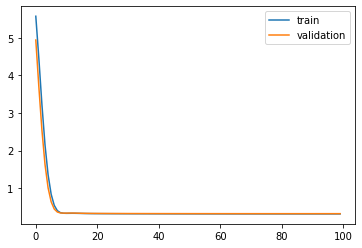

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 5s - loss: 5.5753 - acc: 0.6393 - val_loss: 4.9446 - val_acc: 0.8310

Epoch 00001: val_loss improved from inf to 4.94457, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.4456 - acc: 0.8520 - val_loss: 3.6940 - val_acc: 0.8654

Epoch 00002: val_loss improved from 4.94457 to 3.69401, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.2161 - acc: 0.8707 - val_loss: 2.5431 - val_acc: 0.8708

Epoch 00003: val_loss improved from 3.69401 to 2.54309, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.1510 - acc: 0.8741 - val_loss: 1.6346 - val_acc: 0.8742

Epoch 00004: val_loss improved from 2.54309 to 1.63455, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.3559 - acc: 0.8751 - val_loss: 1.0129 - val_acc: 0.8748

Epoch 00005: val_loss improved from 1.63455 to 1.01292, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 0.8386 - acc: 0.8759 - v

 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8777

Epoch 00047: val_loss improved from 0.32469 to 0.32461, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8777

Epoch 00048: val_loss improved from 0.32461 to 0.32452, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8774

Epoch 00049: val_loss improved from 0.32452 to 0.32445, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3182 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8773

Epoch 00050: val_loss improved from 0.32445 to 0.32437, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3181 - acc: 0.8791 - val_loss: 0.3243 - val_acc: 0.8771

Epoch 00051: val_loss improved from 0.32437 to 0.32430, saving model to Event_val_weights3.hdf5
Epoch 52/100
 - 1s - loss: 0.3180 - acc: 0.8791 - val_loss: 0.3242 - val_acc: 0.8773

Epoch 00052: val_

 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3238 - val_acc: 0.8770

Epoch 00096: val_loss did not improve from 0.32332
Epoch 97/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3238 - val_acc: 0.8770

Epoch 00097: val_loss did not improve from 0.32332
Epoch 98/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3238 - val_acc: 0.8769

Epoch 00098: val_loss did not improve from 0.32332
Epoch 99/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3239 - val_acc: 0.8769

Epoch 00099: val_loss did not improve from 0.32332
Epoch 100/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3239 - val_acc: 0.8770

Epoch 00100: val_loss did not improve from 0.32332
#################################
Number of units: 16
Batch size: 16384
Fold: 2
L2 : 0.05441600579314996
LR: 0.04477989511996602
Decay: 3.9513128857426947e-07
best val loss: 0.32331734895706177
#################################


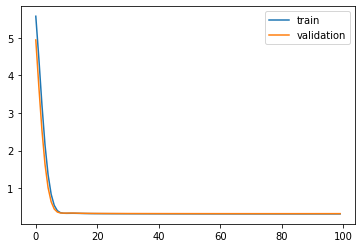

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 5s - loss: 5.5747 - acc: 0.6398 - val_loss: 4.9525 - val_acc: 0.8192

Epoch 00001: val_loss improved from inf to 4.95246, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.4453 - acc: 0.8531 - val_loss: 3.7020 - val_acc: 0.8617

Epoch 00002: val_loss improved from 4.95246 to 3.70201, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.2155 - acc: 0.8714 - val_loss: 2.5524 - val_acc: 0.8658

Epoch 00003: val_loss improved from 3.70201 to 2.55238, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.1502 - acc: 0.8746 - val_loss: 1.6430 - val_acc: 0.8676

Epoch 00004: val_loss improved from 2.55238 to 1.64298, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.3551 - acc: 0.8759 - val_loss: 1.0203 - val_acc: 0.8687

Epoch 00005: val_loss improved from 1.64298 to 1.02029, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 0.8378 - acc: 0.8765 - v

 - 1s - loss: 0.3180 - acc: 0.8798 - val_loss: 0.3293 - val_acc: 0.8713

Epoch 00047: val_loss improved from 0.32942 to 0.32934, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3179 - acc: 0.8798 - val_loss: 0.3293 - val_acc: 0.8712

Epoch 00048: val_loss improved from 0.32934 to 0.32926, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3178 - acc: 0.8798 - val_loss: 0.3292 - val_acc: 0.8712

Epoch 00049: val_loss improved from 0.32926 to 0.32918, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3177 - acc: 0.8798 - val_loss: 0.3291 - val_acc: 0.8711

Epoch 00050: val_loss improved from 0.32918 to 0.32911, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3176 - acc: 0.8798 - val_loss: 0.3290 - val_acc: 0.8711

Epoch 00051: val_loss improved from 0.32911 to 0.32904, saving model to Event_val_weights4.hdf5
Epoch 52/100
 - 1s - loss: 0.3175 - acc: 0.8798 - val_loss: 0.3290 - val_acc: 0.8711

Epoch 00052: val_

 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3285 - val_acc: 0.8709

Epoch 00096: val_loss did not improve from 0.32811
Epoch 97/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3285 - val_acc: 0.8710

Epoch 00097: val_loss did not improve from 0.32811
Epoch 98/100
 - 1s - loss: 0.3160 - acc: 0.8802 - val_loss: 0.3285 - val_acc: 0.8710

Epoch 00098: val_loss did not improve from 0.32811
Epoch 99/100
 - 1s - loss: 0.3160 - acc: 0.8802 - val_loss: 0.3286 - val_acc: 0.8711

Epoch 00099: val_loss did not improve from 0.32811
Epoch 100/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3286 - val_acc: 0.8712

Epoch 00100: val_loss did not improve from 0.32811
#################################
Number of units: 16
Batch size: 16384
Fold: 3
L2 : 0.05441600579314996
LR: 0.04477989511996602
Decay: 3.9513128857426947e-07
best val loss: 0.32811102271080017
#################################


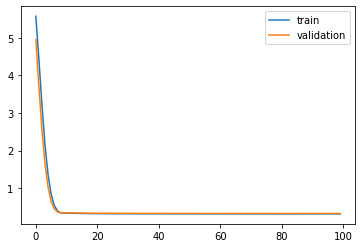

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 5s - loss: 5.5754 - acc: 0.6388 - val_loss: 4.9443 - val_acc: 0.8323

Epoch 00001: val_loss improved from inf to 4.94427, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.4470 - acc: 0.8515 - val_loss: 3.6837 - val_acc: 0.8703

Epoch 00002: val_loss improved from 4.94427 to 3.68369, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.2175 - acc: 0.8702 - val_loss: 2.5287 - val_acc: 0.8747

Epoch 00003: val_loss improved from 3.68369 to 2.52874, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.1520 - acc: 0.8736 - val_loss: 1.6185 - val_acc: 0.8777

Epoch 00004: val_loss improved from 2.52874 to 1.61849, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.3566 - acc: 0.8748 - val_loss: 0.9981 - val_acc: 0.8768

Epoch 00005: val_loss improved from 1.61849 to 0.99813, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 0.8389 - acc: 0.8757 - v

 - 1s - loss: 0.3190 - acc: 0.8789 - val_loss: 0.3198 - val_acc: 0.8789

Epoch 00047: val_loss improved from 0.31988 to 0.31979, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3189 - acc: 0.8788 - val_loss: 0.3197 - val_acc: 0.8791

Epoch 00048: val_loss improved from 0.31979 to 0.31971, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3196 - val_acc: 0.8792

Epoch 00049: val_loss improved from 0.31971 to 0.31963, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3195 - val_acc: 0.8793

Epoch 00050: val_loss improved from 0.31963 to 0.31955, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3195 - val_acc: 0.8793

Epoch 00051: val_loss improved from 0.31955 to 0.31947, saving model to Event_val_weights5.hdf5
Epoch 52/100
 - 1s - loss: 0.3186 - acc: 0.8789 - val_loss: 0.3194 - val_acc: 0.8793

Epoch 00052: val_

 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00094: val_loss did not improve from 0.31806
Epoch 95/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8793

Epoch 00095: val_loss improved from 0.31806 to 0.31803, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3173 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00096: val_loss did not improve from 0.31803
Epoch 97/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8793

Epoch 00097: val_loss did not improve from 0.31803
Epoch 98/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8793

Epoch 00098: val_loss did not improve from 0.31803
Epoch 99/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3181 - val_acc: 0.8792

Epoch 00099: val_loss did not improve from 0.31803
Epoch 100/100
 - 1s - loss: 0.3173 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00100: val_loss did not improve from 0.31803
########

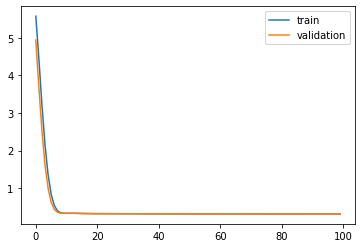

Time to train LSTM:  68.79240322113037


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7feca0c17f60>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 5s - loss: 5.5997 - acc: 0.6309 - val_loss: 5.0175 - val_acc: 0.8230

Epoch 00001: val_loss improved from inf to 5.01755, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.5530 - acc: 0.8478 - val_loss: 3.8321 - val_acc: 0.8718

Epoch 00002: val_loss improved from 5.01755 to 3.83207, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.3965 - acc: 0.8691 - val_loss: 2.7318 - val_acc: 0.8760

Epoch 00003: val_loss improved from 3.83207 to 2.73177, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.3709 - acc: 0.8730 - val_loss: 1.8333 - val_acc: 0.8767

Epoch 00004: val_loss improved from 2.73177 to 1.83333, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.5710 - acc: 0.8745 - val_loss: 1.1853 - val_acc: 0.8774

Epoch 00005: val_loss improved from 1.83333 to 1.18535, saving model to Event_val_weights1.hdf5
Epoch 6/100
 - 1s - loss: 1.0163 - acc: 0.8755 - v


Epoch 00046: val_loss improved from 0.31473 to 0.31464, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3201 - acc: 0.8783 - val_loss: 0.3146 - val_acc: 0.8804

Epoch 00047: val_loss improved from 0.31464 to 0.31456, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3200 - acc: 0.8784 - val_loss: 0.3145 - val_acc: 0.8807

Epoch 00048: val_loss improved from 0.31456 to 0.31447, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3199 - acc: 0.8784 - val_loss: 0.3144 - val_acc: 0.8807

Epoch 00049: val_loss improved from 0.31447 to 0.31439, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3198 - acc: 0.8785 - val_loss: 0.3143 - val_acc: 0.8806

Epoch 00050: val_loss improved from 0.31439 to 0.31432, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3197 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00051: val_loss improved from 0.31432 to 0.31424, saving model to Event_val_weights

 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00092: val_loss improved from 0.31246 to 0.31243, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00093: val_loss improved from 0.31243 to 0.31240, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8803

Epoch 00094: val_loss improved from 0.31240 to 0.31237, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00095: val_loss improved from 0.31237 to 0.31235, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8803

Epoch 00096: val_loss improved from 0.31235 to 0.31232, saving model to Event_val_weights1.hdf5
Epoch 97/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00097: val_

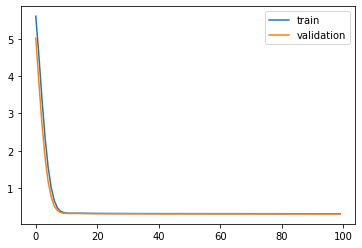

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 5s - loss: 5.6002 - acc: 0.6298 - val_loss: 5.0167 - val_acc: 0.8228

Epoch 00001: val_loss improved from inf to 5.01673, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.5520 - acc: 0.8485 - val_loss: 3.8433 - val_acc: 0.8646

Epoch 00002: val_loss improved from 5.01673 to 3.84329, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.3949 - acc: 0.8699 - val_loss: 2.7487 - val_acc: 0.8707

Epoch 00003: val_loss improved from 3.84329 to 2.74874, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.3693 - acc: 0.8735 - val_loss: 1.8522 - val_acc: 0.8730

Epoch 00004: val_loss improved from 2.74874 to 1.85219, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.5697 - acc: 0.8750 - val_loss: 1.2042 - val_acc: 0.8734

Epoch 00005: val_loss improved from 1.85219 to 1.20417, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.0151 - acc: 0.8759 - v

 - 1s - loss: 0.3190 - acc: 0.8789 - val_loss: 0.3249 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32497 to 0.32487, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8770

Epoch 00048: val_loss improved from 0.32487 to 0.32478, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8771

Epoch 00049: val_loss improved from 0.32478 to 0.32469, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3246 - val_acc: 0.8771

Epoch 00050: val_loss improved from 0.32469 to 0.32461, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8773

Epoch 00051: val_loss improved from 0.32461 to 0.32453, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00052: val_


Epoch 00092: val_loss improved from 0.32309 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8759

Epoch 00093: val_loss improved from 0.32308 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8756

Epoch 00094: val_loss improved from 0.32308 to 0.32307, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00095: val_loss improved from 0.32307 to 0.32307, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00096: val_loss improved from 0.32307 to 0.32307, saving model to Event_val_weights2.hdf5
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00097: val_loss did not improve from 0.32307
Epoch 98/100
 - 1s - loss: 0.3164 - ac

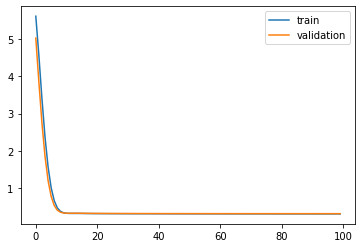

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 5s - loss: 5.6003 - acc: 0.6301 - val_loss: 5.0186 - val_acc: 0.8228

Epoch 00001: val_loss improved from inf to 5.01862, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.5523 - acc: 0.8476 - val_loss: 3.8470 - val_acc: 0.8642

Epoch 00002: val_loss improved from 5.01862 to 3.84705, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.3950 - acc: 0.8698 - val_loss: 2.7524 - val_acc: 0.8710

Epoch 00003: val_loss improved from 3.84705 to 2.75244, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.3693 - acc: 0.8733 - val_loss: 1.8561 - val_acc: 0.8739

Epoch 00004: val_loss improved from 2.75244 to 1.85606, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.5695 - acc: 0.8750 - val_loss: 1.2075 - val_acc: 0.8746

Epoch 00005: val_loss improved from 1.85606 to 1.20748, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.0150 - acc: 0.8758 - v


Epoch 00046: val_loss improved from 0.32515 to 0.32505, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3189 - acc: 0.8790 - val_loss: 0.3250 - val_acc: 0.8776

Epoch 00047: val_loss improved from 0.32505 to 0.32496, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3249 - val_acc: 0.8776

Epoch 00048: val_loss improved from 0.32496 to 0.32487, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8776

Epoch 00049: val_loss improved from 0.32487 to 0.32479, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3247 - val_acc: 0.8777

Epoch 00050: val_loss improved from 0.32479 to 0.32471, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8776

Epoch 00051: val_loss improved from 0.32471 to 0.32463, saving model to Event_val_weights

 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00092: val_loss did not improve from 0.32318
Epoch 93/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00093: val_loss did not improve from 0.32318
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00094: val_loss did not improve from 0.32318
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00095: val_loss did not improve from 0.32318
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3232 - val_acc: 0.8767

Epoch 00096: val_loss did not improve from 0.32318
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3232 - val_acc: 0.8767

Epoch 00097: val_loss did not improve from 0.32318
Epoch 98/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3232 - val_acc: 0.8767

Epoch 00098: val_loss did not improve from 0.32318
Epoch 99/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_

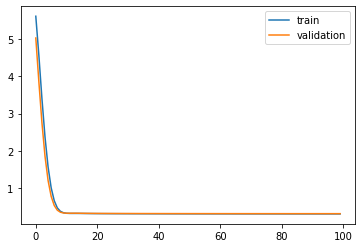

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 5s - loss: 5.5997 - acc: 0.6309 - val_loss: 5.0267 - val_acc: 0.8118

Epoch 00001: val_loss improved from inf to 5.02668, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.5520 - acc: 0.8483 - val_loss: 3.8547 - val_acc: 0.8600

Epoch 00002: val_loss improved from 5.02668 to 3.85474, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.3944 - acc: 0.8702 - val_loss: 2.7617 - val_acc: 0.8659

Epoch 00003: val_loss improved from 3.85474 to 2.76173, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.3685 - acc: 0.8739 - val_loss: 1.8648 - val_acc: 0.8667

Epoch 00004: val_loss improved from 2.76173 to 1.86481, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.5687 - acc: 0.8759 - val_loss: 1.2153 - val_acc: 0.8683

Epoch 00005: val_loss improved from 1.86481 to 1.21530, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.0142 - acc: 0.8764 - v


Epoch 00046: val_loss improved from 0.32989 to 0.32979, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3184 - acc: 0.8797 - val_loss: 0.3297 - val_acc: 0.8716

Epoch 00047: val_loss improved from 0.32979 to 0.32970, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3183 - acc: 0.8798 - val_loss: 0.3296 - val_acc: 0.8716

Epoch 00048: val_loss improved from 0.32970 to 0.32962, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3182 - acc: 0.8797 - val_loss: 0.3295 - val_acc: 0.8714

Epoch 00049: val_loss improved from 0.32962 to 0.32953, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3181 - acc: 0.8798 - val_loss: 0.3295 - val_acc: 0.8714

Epoch 00050: val_loss improved from 0.32953 to 0.32945, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3180 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8713

Epoch 00051: val_loss improved from 0.32945 to 0.32938, saving model to Event_val_weights

 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00092: val_loss improved from 0.32801 to 0.32801, saving model to Event_val_weights4.hdf5
Epoch 93/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00093: val_loss did not improve from 0.32801
Epoch 94/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00094: val_loss did not improve from 0.32801
Epoch 95/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00095: val_loss did not improve from 0.32801
Epoch 96/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00096: val_loss did not improve from 0.32801
Epoch 97/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00097: val_loss did not improve from 0.32801
Epoch 98/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3281 - val_acc: 0.8714

Epoch 00098: val_loss did not improve from 0.32801
Epoch 99/

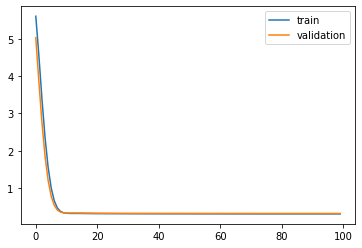

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 6s - loss: 5.6003 - acc: 0.6299 - val_loss: 5.0191 - val_acc: 0.8232

Epoch 00001: val_loss improved from inf to 5.01914, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.5536 - acc: 0.8471 - val_loss: 3.8376 - val_acc: 0.8690

Epoch 00002: val_loss improved from 5.01914 to 3.83757, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.3964 - acc: 0.8692 - val_loss: 2.7389 - val_acc: 0.8737

Epoch 00003: val_loss improved from 3.83757 to 2.73887, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.3703 - acc: 0.8731 - val_loss: 1.8405 - val_acc: 0.8770

Epoch 00004: val_loss improved from 2.73887 to 1.84054, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.5702 - acc: 0.8747 - val_loss: 1.1926 - val_acc: 0.8771

Epoch 00005: val_loss improved from 1.84054 to 1.19255, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.0154 - acc: 0.8755 - v


Epoch 00046: val_loss improved from 0.32036 to 0.32026, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3195 - acc: 0.8788 - val_loss: 0.3202 - val_acc: 0.8790

Epoch 00047: val_loss improved from 0.32026 to 0.32017, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3194 - acc: 0.8788 - val_loss: 0.3201 - val_acc: 0.8789

Epoch 00048: val_loss improved from 0.32017 to 0.32008, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3200 - val_acc: 0.8789

Epoch 00049: val_loss improved from 0.32008 to 0.32000, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3199 - val_acc: 0.8789

Epoch 00050: val_loss improved from 0.32000 to 0.31991, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3198 - val_acc: 0.8789

Epoch 00051: val_loss improved from 0.31991 to 0.31983, saving model to Event_val_weights

 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8792

Epoch 00092: val_loss improved from 0.31812 to 0.31806, saving model to Event_val_weights5.hdf5
Epoch 93/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00093: val_loss did not improve from 0.31806
Epoch 94/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00094: val_loss improved from 0.31806 to 0.31805, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00095: val_loss improved from 0.31805 to 0.31802, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00096: val_loss did not improve from 0.31802
Epoch 97/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00097: val_loss did not improve from 0.31802
Epoch 98/100
 - 1s - loss: 0.3171 - acc: 0.8791 - val_lo

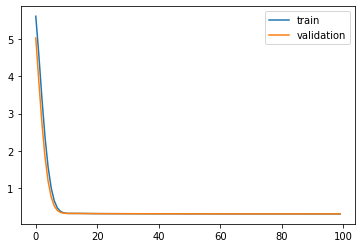

Time to train LSTM:  70.30746102333069
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 6s - loss: 5.6019 - acc: 0.6300 - val_loss: 5.0241 - val_acc: 0.8224

Epoch 00001: val_loss improved from inf to 5.02405, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.5623 - acc: 0.8472 - val_loss: 3.8455 - val_acc: 0.8719

Epoch 00002: val_loss improved from 5.02405 to 3.84549, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.4121 - acc: 0.8690 - val_loss: 2.7503 - val_acc: 0.8763

Epoch 00003: val_loss improved from 3.84549 to 2.75030, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.3903 - acc: 0.8730 - val_loss: 1.8534 - val_acc: 0.8766

Epoch 00004: val_loss improved from 2.75030 to 1.85337, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.5905 - acc: 0.8745 - val_loss: 1.2035 - val_acc: 0.8772

Epoch 00005: val_loss improved from 1.85337 to 1.20351, saving model to Event_val_weights1.hdf5
Epoch 6/100


Epoch 00046: val_loss improved from 0.31476 to 0.31467, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3201 - acc: 0.8783 - val_loss: 0.3146 - val_acc: 0.8804

Epoch 00047: val_loss improved from 0.31467 to 0.31459, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3200 - acc: 0.8784 - val_loss: 0.3145 - val_acc: 0.8806

Epoch 00048: val_loss improved from 0.31459 to 0.31450, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3199 - acc: 0.8784 - val_loss: 0.3144 - val_acc: 0.8807

Epoch 00049: val_loss improved from 0.31450 to 0.31442, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3198 - acc: 0.8784 - val_loss: 0.3143 - val_acc: 0.8806

Epoch 00050: val_loss improved from 0.31442 to 0.31435, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3197 - acc: 0.8785 - val_loss: 0.3143 - val_acc: 0.8806

Epoch 00051: val_loss improved from 0.31435 to 0.31427, saving model to Event_val_weights

 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3125 - val_acc: 0.8804

Epoch 00092: val_loss improved from 0.31248 to 0.31245, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00093: val_loss improved from 0.31245 to 0.31242, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00094: val_loss improved from 0.31242 to 0.31240, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00095: val_loss improved from 0.31240 to 0.31237, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00096: val_loss improved from 0.31237 to 0.31234, saving model to Event_val_weights1.hdf5
Epoch 97/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00097: val_

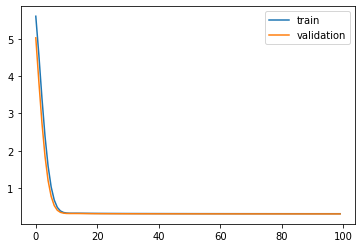

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 6s - loss: 5.6024 - acc: 0.6290 - val_loss: 5.0232 - val_acc: 0.8222

Epoch 00001: val_loss improved from inf to 5.02316, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.5613 - acc: 0.8480 - val_loss: 3.8566 - val_acc: 0.8642

Epoch 00002: val_loss improved from 5.02316 to 3.85660, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.4105 - acc: 0.8697 - val_loss: 2.7672 - val_acc: 0.8706

Epoch 00003: val_loss improved from 3.85660 to 2.76720, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.3887 - acc: 0.8734 - val_loss: 1.8722 - val_acc: 0.8730

Epoch 00004: val_loss improved from 2.76720 to 1.87219, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.5892 - acc: 0.8750 - val_loss: 1.2223 - val_acc: 0.8736

Epoch 00005: val_loss improved from 1.87219 to 1.22231, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.0319 - acc: 0.8759 - v

 - 1s - loss: 0.3190 - acc: 0.8789 - val_loss: 0.3249 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32500 to 0.32491, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8770

Epoch 00048: val_loss improved from 0.32491 to 0.32482, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8771

Epoch 00049: val_loss improved from 0.32482 to 0.32473, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3246 - val_acc: 0.8771

Epoch 00050: val_loss improved from 0.32473 to 0.32464, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8771

Epoch 00051: val_loss improved from 0.32464 to 0.32456, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00052: val_


Epoch 00092: val_loss improved from 0.32309 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8760

Epoch 00093: val_loss improved from 0.32308 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8759

Epoch 00094: val_loss improved from 0.32308 to 0.32307, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00095: val_loss improved from 0.32307 to 0.32307, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00096: val_loss improved from 0.32307 to 0.32306, saving model to Event_val_weights2.hdf5
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00097: val_loss improved from 0.32306 to 0.32306, saving model to Event_val_weights

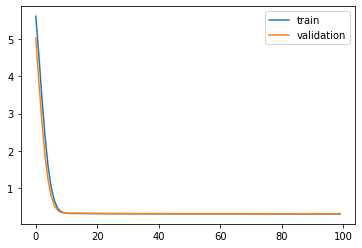

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7feae57374a8>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 6s - loss: 5.6025 - acc: 0.6294 - val_loss: 5.0250 - val_acc: 0.8218

Epoch 00001: val_loss improved from inf to 5.02503, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.5616 - acc: 0.8471 - val_loss: 3.8604 - val_acc: 0.8639

Epoch 00002: val_loss improved from 5.02503 to 3.86035, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.4106 - acc: 0.8696 - val_loss: 2.7709 - val_acc: 0.8708

Epoch 00003: val_loss improved from 3.86035 to 2.77089, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.3887 - acc: 0.8733 - val_loss: 1.8760 - val_acc: 0.8734

Epoch 00004: val_loss improved from 2.77089 to 1.87604, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.5890 - acc: 0.8751 - val_loss: 1.2256 - val_acc: 0.8747

Epoch 00005: val_loss improved from 1.87604 to 1.22563, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.0317 - acc: 0.8757 - v


Epoch 00046: val_loss improved from 0.32518 to 0.32509, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3190 - acc: 0.8790 - val_loss: 0.3250 - val_acc: 0.8777

Epoch 00047: val_loss improved from 0.32509 to 0.32499, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3189 - acc: 0.8790 - val_loss: 0.3249 - val_acc: 0.8776

Epoch 00048: val_loss improved from 0.32499 to 0.32491, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8776

Epoch 00049: val_loss improved from 0.32491 to 0.32482, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8776

Epoch 00050: val_loss improved from 0.32482 to 0.32474, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3247 - val_acc: 0.8776

Epoch 00051: val_loss improved from 0.32474 to 0.32466, saving model to Event_val_weights

 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00092: val_loss improved from 0.32317 to 0.32317, saving model to Event_val_weights3.hdf5
Epoch 93/100
 - 1s - loss: 0.3164 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00093: val_loss improved from 0.32317 to 0.32317, saving model to Event_val_weights3.hdf5
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00094: val_loss did not improve from 0.32317
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00095: val_loss did not improve from 0.32317
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00096: val_loss did not improve from 0.32317
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3232 - val_acc: 0.8767

Epoch 00097: val_loss did not improve from 0.32317
Epoch 98/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8767

Epoch 00098: va

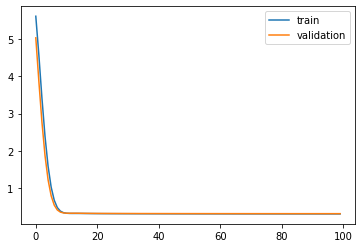

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 7s - loss: 5.6018 - acc: 0.6300 - val_loss: 5.0331 - val_acc: 0.8109

Epoch 00001: val_loss improved from inf to 5.03310, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.5612 - acc: 0.8479 - val_loss: 3.8680 - val_acc: 0.8598

Epoch 00002: val_loss improved from 5.03310 to 3.86802, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.4100 - acc: 0.8701 - val_loss: 2.7802 - val_acc: 0.8659

Epoch 00003: val_loss improved from 3.86802 to 2.78017, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.3879 - acc: 0.8739 - val_loss: 1.8848 - val_acc: 0.8664

Epoch 00004: val_loss improved from 2.78017 to 1.88483, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.5883 - acc: 0.8759 - val_loss: 1.2335 - val_acc: 0.8681

Epoch 00005: val_loss improved from 1.88483 to 1.23349, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.0309 - acc: 0.8762 - v


Epoch 00046: val_loss improved from 0.32992 to 0.32983, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3185 - acc: 0.8797 - val_loss: 0.3297 - val_acc: 0.8716

Epoch 00047: val_loss improved from 0.32983 to 0.32974, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3184 - acc: 0.8797 - val_loss: 0.3296 - val_acc: 0.8716

Epoch 00048: val_loss improved from 0.32974 to 0.32965, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3183 - acc: 0.8798 - val_loss: 0.3296 - val_acc: 0.8716

Epoch 00049: val_loss improved from 0.32965 to 0.32956, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3182 - acc: 0.8798 - val_loss: 0.3295 - val_acc: 0.8714

Epoch 00050: val_loss improved from 0.32956 to 0.32948, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3181 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8713

Epoch 00051: val_loss improved from 0.32948 to 0.32941, saving model to Event_val_weights

 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00092: val_loss improved from 0.32801 to 0.32801, saving model to Event_val_weights4.hdf5
Epoch 93/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00093: val_loss improved from 0.32801 to 0.32801, saving model to Event_val_weights4.hdf5
Epoch 94/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00094: val_loss did not improve from 0.32801
Epoch 95/100
 - 1s - loss: 0.3158 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00095: val_loss did not improve from 0.32801
Epoch 96/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00096: val_loss did not improve from 0.32801
Epoch 97/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00097: val_loss did not improve from 0.32801
Epoch 98/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00098: va

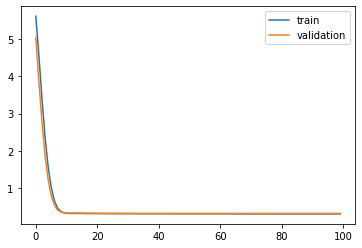

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 7s - loss: 5.6024 - acc: 0.6290 - val_loss: 5.0256 - val_acc: 0.8223

Epoch 00001: val_loss improved from inf to 5.02562, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.5629 - acc: 0.8467 - val_loss: 3.8510 - val_acc: 0.8689

Epoch 00002: val_loss improved from 5.02562 to 3.85096, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.4121 - acc: 0.8690 - val_loss: 2.7574 - val_acc: 0.8737

Epoch 00003: val_loss improved from 3.85096 to 2.75739, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.3897 - acc: 0.8730 - val_loss: 1.8606 - val_acc: 0.8769

Epoch 00004: val_loss improved from 2.75739 to 1.86058, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.5898 - acc: 0.8747 - val_loss: 1.2107 - val_acc: 0.8771

Epoch 00005: val_loss improved from 1.86058 to 1.21070, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.0321 - acc: 0.8755 - v


Epoch 00046: val_loss improved from 0.32039 to 0.32030, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3195 - acc: 0.8787 - val_loss: 0.3202 - val_acc: 0.8791

Epoch 00047: val_loss improved from 0.32030 to 0.32020, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3194 - acc: 0.8787 - val_loss: 0.3201 - val_acc: 0.8790

Epoch 00048: val_loss improved from 0.32020 to 0.32012, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3200 - val_acc: 0.8789

Epoch 00049: val_loss improved from 0.32012 to 0.32003, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3199 - val_acc: 0.8789

Epoch 00050: val_loss improved from 0.32003 to 0.31995, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3199 - val_acc: 0.8789

Epoch 00051: val_loss improved from 0.31995 to 0.31987, saving model to Event_val_weights

 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8792

Epoch 00092: val_loss improved from 0.31814 to 0.31808, saving model to Event_val_weights5.hdf5
Epoch 93/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00093: val_loss did not improve from 0.31808
Epoch 94/100
 - 1s - loss: 0.3171 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00094: val_loss improved from 0.31808 to 0.31805, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00095: val_loss improved from 0.31805 to 0.31803, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00096: val_loss did not improve from 0.31803
Epoch 97/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00097: val_loss improved from 0.31803 to 0.31803, saving model to Event_val_weights5.hdf5
Epoch 98/10

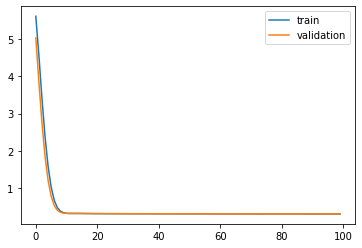

Time to train LSTM:  71.43815970420837
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 8s - loss: 5.6268 - acc: 0.6199 - val_loss: 5.1001 - val_acc: 0.8108

Epoch 00001: val_loss improved from inf to 5.10014, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.6709 - acc: 0.8418 - val_loss: 4.0035 - val_acc: 0.8709

Epoch 00002: val_loss improved from 5.10014 to 4.00349, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.5968 - acc: 0.8676 - val_loss: 2.9712 - val_acc: 0.8761

Epoch 00003: val_loss improved from 4.00349 to 2.97121, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.6237 - acc: 0.8724 - val_loss: 2.0981 - val_acc: 0.8759

Epoch 00004: val_loss improved from 2.97121 to 2.09806, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.8316 - acc: 0.8741 - val_loss: 1.4326 - val_acc: 0.8776

Epoch 00005: val_loss improved from 2.09806 to 1.43260, saving model to Event_val_weights1.hdf5
Epoch 6/100

 - 1s - loss: 0.3207 - acc: 0.8783 - val_loss: 0.3151 - val_acc: 0.8808

Epoch 00046: val_loss improved from 0.31516 to 0.31507, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3206 - acc: 0.8783 - val_loss: 0.3150 - val_acc: 0.8808

Epoch 00047: val_loss improved from 0.31507 to 0.31498, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3205 - acc: 0.8784 - val_loss: 0.3149 - val_acc: 0.8808

Epoch 00048: val_loss improved from 0.31498 to 0.31490, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3204 - acc: 0.8784 - val_loss: 0.3148 - val_acc: 0.8808

Epoch 00049: val_loss improved from 0.31490 to 0.31481, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3203 - acc: 0.8784 - val_loss: 0.3147 - val_acc: 0.8807

Epoch 00050: val_loss improved from 0.31481 to 0.31473, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3202 - acc: 0.8784 - val_loss: 0.3147 - val_acc: 0.8806

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31282 to 0.31279, saving model to Event_val_weights1.hdf5
Epoch 92/100
 - 1s - loss: 0.3178 - acc: 0.8790 - val_loss: 0.3128 - val_acc: 0.8804

Epoch 00092: val_loss improved from 0.31279 to 0.31276, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3127 - val_acc: 0.8804

Epoch 00093: val_loss improved from 0.31276 to 0.31273, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3127 - val_acc: 0.8803

Epoch 00094: val_loss improved from 0.31273 to 0.31270, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3127 - val_acc: 0.8802

Epoch 00095: val_loss improved from 0.31270 to 0.31268, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3127 - val_acc: 0.8803

Epoch 00096: val_loss improved from 0.31268 to 0.31265, saving model to Event_val_weights

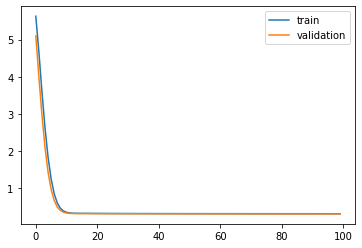

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 7s - loss: 5.6274 - acc: 0.6188 - val_loss: 5.0983 - val_acc: 0.8141

Epoch 00001: val_loss improved from inf to 5.09835, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.6701 - acc: 0.8424 - val_loss: 4.0133 - val_acc: 0.8623

Epoch 00002: val_loss improved from 5.09835 to 4.01326, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.5953 - acc: 0.8684 - val_loss: 2.9872 - val_acc: 0.8704

Epoch 00003: val_loss improved from 4.01326 to 2.98716, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.6221 - acc: 0.8727 - val_loss: 2.1162 - val_acc: 0.8722

Epoch 00004: val_loss improved from 2.98716 to 2.11623, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.8302 - acc: 0.8747 - val_loss: 1.4511 - val_acc: 0.8739

Epoch 00005: val_loss improved from 2.11623 to 1.45110, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.2462 - acc: 0.8756 - v

 - 1s - loss: 0.3196 - acc: 0.8787 - val_loss: 0.3255 - val_acc: 0.8770

Epoch 00046: val_loss improved from 0.32556 to 0.32545, saving model to Event_val_weights2.hdf5
Epoch 47/100
 - 1s - loss: 0.3195 - acc: 0.8788 - val_loss: 0.3254 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32545 to 0.32535, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3194 - acc: 0.8788 - val_loss: 0.3253 - val_acc: 0.8770

Epoch 00048: val_loss improved from 0.32535 to 0.32525, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3252 - val_acc: 0.8769

Epoch 00049: val_loss improved from 0.32525 to 0.32516, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3251 - val_acc: 0.8770

Epoch 00050: val_loss improved from 0.32516 to 0.32507, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3250 - val_acc: 0.8770

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32322 to 0.32320, saving model to Event_val_weights2.hdf5
Epoch 92/100
 - 1s - loss: 0.3167 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8764

Epoch 00092: val_loss improved from 0.32320 to 0.32318, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8766

Epoch 00093: val_loss improved from 0.32318 to 0.32316, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8766

Epoch 00094: val_loss improved from 0.32316 to 0.32315, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8766

Epoch 00095: val_loss improved from 0.32315 to 0.32313, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8764

Epoch 00096: val_loss improved from 0.32313 to 0.32312, saving model to Event_val_weights

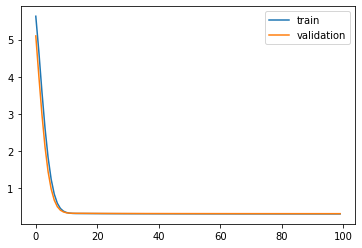

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 7s - loss: 5.6274 - acc: 0.6192 - val_loss: 5.1000 - val_acc: 0.8133

Epoch 00001: val_loss improved from inf to 5.09997, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.6703 - acc: 0.8415 - val_loss: 4.0169 - val_acc: 0.8628

Epoch 00002: val_loss improved from 5.09997 to 4.01694, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.5953 - acc: 0.8684 - val_loss: 2.9908 - val_acc: 0.8699

Epoch 00003: val_loss improved from 4.01694 to 2.99083, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.6221 - acc: 0.8729 - val_loss: 2.1200 - val_acc: 0.8719

Epoch 00004: val_loss improved from 2.99083 to 2.11997, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.8301 - acc: 0.8746 - val_loss: 1.4545 - val_acc: 0.8748

Epoch 00005: val_loss improved from 2.11997 to 1.45453, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.2460 - acc: 0.8754 - v

 - 1s - loss: 0.3196 - acc: 0.8790 - val_loss: 0.3255 - val_acc: 0.8777

Epoch 00046: val_loss improved from 0.32560 to 0.32550, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3195 - acc: 0.8789 - val_loss: 0.3254 - val_acc: 0.8778

Epoch 00047: val_loss improved from 0.32550 to 0.32541, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3194 - acc: 0.8789 - val_loss: 0.3253 - val_acc: 0.8778

Epoch 00048: val_loss improved from 0.32541 to 0.32532, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3192 - acc: 0.8789 - val_loss: 0.3252 - val_acc: 0.8778

Epoch 00049: val_loss improved from 0.32532 to 0.32523, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3251 - val_acc: 0.8778

Epoch 00050: val_loss improved from 0.32523 to 0.32514, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3190 - acc: 0.8790 - val_loss: 0.3251 - val_acc: 0.8777

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32324 to 0.32322, saving model to Event_val_weights3.hdf5
Epoch 92/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8766

Epoch 00092: val_loss improved from 0.32322 to 0.32320, saving model to Event_val_weights3.hdf5
Epoch 93/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8766

Epoch 00093: val_loss improved from 0.32320 to 0.32318, saving model to Event_val_weights3.hdf5
Epoch 94/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8767

Epoch 00094: val_loss improved from 0.32318 to 0.32316, saving model to Event_val_weights3.hdf5
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8768

Epoch 00095: val_loss improved from 0.32316 to 0.32315, saving model to Event_val_weights3.hdf5
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8768

Epoch 00096: val_loss improved from 0.32315 to 0.32313, saving model to Event_val_weights

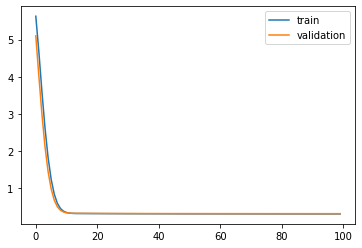

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 7s - loss: 5.6267 - acc: 0.6198 - val_loss: 5.1082 - val_acc: 0.8022

Epoch 00001: val_loss improved from inf to 5.10819, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.6699 - acc: 0.8421 - val_loss: 4.0244 - val_acc: 0.8578

Epoch 00002: val_loss improved from 5.10819 to 4.02436, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.5948 - acc: 0.8688 - val_loss: 2.9999 - val_acc: 0.8651

Epoch 00003: val_loss improved from 4.02436 to 2.99992, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.6213 - acc: 0.8734 - val_loss: 2.1290 - val_acc: 0.8672

Epoch 00004: val_loss improved from 2.99992 to 2.12901, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.8293 - acc: 0.8752 - val_loss: 1.4628 - val_acc: 0.8678

Epoch 00005: val_loss improved from 2.12901 to 1.46281, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.2452 - acc: 0.8763 - v

 - 1s - loss: 0.3191 - acc: 0.8796 - val_loss: 0.3302 - val_acc: 0.8711

Epoch 00046: val_loss improved from 0.33035 to 0.33025, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3190 - acc: 0.8796 - val_loss: 0.3302 - val_acc: 0.8711

Epoch 00047: val_loss improved from 0.33025 to 0.33015, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3188 - acc: 0.8796 - val_loss: 0.3301 - val_acc: 0.8711

Epoch 00048: val_loss improved from 0.33015 to 0.33006, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3187 - acc: 0.8796 - val_loss: 0.3300 - val_acc: 0.8712

Epoch 00049: val_loss improved from 0.33006 to 0.32997, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3186 - acc: 0.8797 - val_loss: 0.3299 - val_acc: 0.8711

Epoch 00050: val_loss improved from 0.32997 to 0.32989, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3185 - acc: 0.8797 - val_loss: 0.3298 - val_acc: 0.8714

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32810 to 0.32808, saving model to Event_val_weights4.hdf5
Epoch 92/100
 - 1s - loss: 0.3161 - acc: 0.8800 - val_loss: 0.3281 - val_acc: 0.8714

Epoch 00092: val_loss improved from 0.32808 to 0.32806, saving model to Event_val_weights4.hdf5
Epoch 93/100
 - 1s - loss: 0.3161 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00093: val_loss improved from 0.32806 to 0.32805, saving model to Event_val_weights4.hdf5
Epoch 94/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00094: val_loss improved from 0.32805 to 0.32803, saving model to Event_val_weights4.hdf5
Epoch 95/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00095: val_loss improved from 0.32803 to 0.32802, saving model to Event_val_weights4.hdf5
Epoch 96/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00096: val_loss improved from 0.32802 to 0.32800, saving model to Event_val_weights

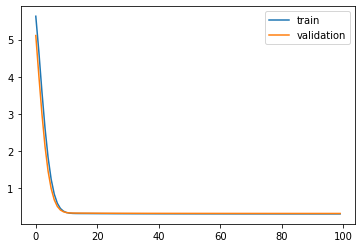

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 8s - loss: 5.6273 - acc: 0.6184 - val_loss: 5.1014 - val_acc: 0.8116

Epoch 00001: val_loss improved from inf to 5.10139, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.6715 - acc: 0.8409 - val_loss: 4.0085 - val_acc: 0.8676

Epoch 00002: val_loss improved from 5.10139 to 4.00854, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.5968 - acc: 0.8679 - val_loss: 2.9781 - val_acc: 0.8733

Epoch 00003: val_loss improved from 4.00854 to 2.97808, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.6232 - acc: 0.8727 - val_loss: 2.1052 - val_acc: 0.8754

Epoch 00004: val_loss improved from 2.97808 to 2.10522, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.8309 - acc: 0.8743 - val_loss: 1.4397 - val_acc: 0.8773

Epoch 00005: val_loss improved from 2.10522 to 1.43970, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.2466 - acc: 0.8751 - v

 - 1s - loss: 0.3201 - acc: 0.8785 - val_loss: 0.3207 - val_acc: 0.8790

Epoch 00046: val_loss improved from 0.32081 to 0.32072, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3200 - acc: 0.8785 - val_loss: 0.3206 - val_acc: 0.8789

Epoch 00047: val_loss improved from 0.32072 to 0.32062, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3199 - acc: 0.8784 - val_loss: 0.3205 - val_acc: 0.8790

Epoch 00048: val_loss improved from 0.32062 to 0.32053, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3198 - acc: 0.8786 - val_loss: 0.3204 - val_acc: 0.8790

Epoch 00049: val_loss improved from 0.32053 to 0.32044, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3197 - acc: 0.8786 - val_loss: 0.3204 - val_acc: 0.8791

Epoch 00050: val_loss improved from 0.32044 to 0.32036, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3196 - acc: 0.8787 - val_loss: 0.3203 - val_acc: 0.8790

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31836 to 0.31834, saving model to Event_val_weights5.hdf5
Epoch 92/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3183 - val_acc: 0.8793

Epoch 00092: val_loss improved from 0.31834 to 0.31831, saving model to Event_val_weights5.hdf5
Epoch 93/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3183 - val_acc: 0.8793

Epoch 00093: val_loss improved from 0.31831 to 0.31829, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3183 - val_acc: 0.8793

Epoch 00094: val_loss improved from 0.31829 to 0.31826, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8791 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00095: val_loss improved from 0.31826 to 0.31824, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00096: val_loss improved from 0.31824 to 0.31822, saving model to Event_val_weights

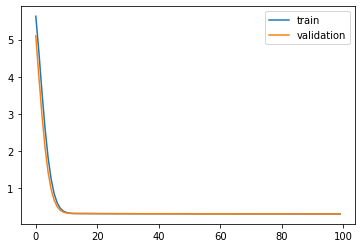

Time to train LSTM:  71.45397186279297
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 8s - loss: 5.6153 - acc: 0.6247 - val_loss: 5.0650 - val_acc: 0.8150

Epoch 00001: val_loss improved from inf to 5.06500, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.6207 - acc: 0.8444 - val_loss: 3.9303 - val_acc: 0.8719

Epoch 00002: val_loss improved from 5.06500 to 3.93027, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.5111 - acc: 0.8682 - val_loss: 2.8683 - val_acc: 0.8761

Epoch 00003: val_loss improved from 3.93027 to 2.86826, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.5145 - acc: 0.8727 - val_loss: 1.9828 - val_acc: 0.8767

Epoch 00004: val_loss improved from 2.86826 to 1.98277, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.7174 - acc: 0.8742 - val_loss: 1.3230 - val_acc: 0.8777

Epoch 00005: val_loss improved from 1.98277 to 1.32302, saving model to Event_val_weights1.hdf5
Epoch 6/100

 - 1s - loss: 0.3205 - acc: 0.8783 - val_loss: 0.3149 - val_acc: 0.8808

Epoch 00046: val_loss improved from 0.31497 to 0.31488, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3204 - acc: 0.8784 - val_loss: 0.3148 - val_acc: 0.8808

Epoch 00047: val_loss improved from 0.31488 to 0.31480, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3203 - acc: 0.8784 - val_loss: 0.3147 - val_acc: 0.8807

Epoch 00048: val_loss improved from 0.31480 to 0.31471, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3202 - acc: 0.8783 - val_loss: 0.3146 - val_acc: 0.8806

Epoch 00049: val_loss improved from 0.31471 to 0.31463, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3201 - acc: 0.8784 - val_loss: 0.3146 - val_acc: 0.8804

Epoch 00050: val_loss improved from 0.31463 to 0.31455, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3200 - acc: 0.8784 - val_loss: 0.3145 - val_acc: 0.8803

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31267 to 0.31264, saving model to Event_val_weights1.hdf5
Epoch 92/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3126 - val_acc: 0.8802

Epoch 00092: val_loss improved from 0.31264 to 0.31262, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3126 - val_acc: 0.8802

Epoch 00093: val_loss improved from 0.31262 to 0.31259, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3176 - acc: 0.8789 - val_loss: 0.3126 - val_acc: 0.8802

Epoch 00094: val_loss improved from 0.31259 to 0.31256, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3125 - val_acc: 0.8800

Epoch 00095: val_loss improved from 0.31256 to 0.31253, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3125 - val_acc: 0.8802

Epoch 00096: val_loss improved from 0.31253 to 0.31251, saving model to Event_val_weights

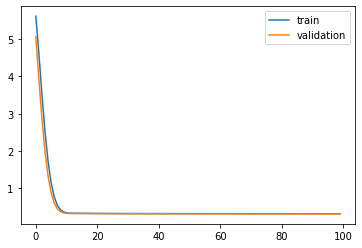

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7feac7268a58>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 8s - loss: 5.6159 - acc: 0.6237 - val_loss: 5.0636 - val_acc: 0.8181

Epoch 00001: val_loss improved from inf to 5.06362, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.6197 - acc: 0.8454 - val_loss: 3.9407 - val_acc: 0.8631

Epoch 00002: val_loss improved from 5.06362 to 3.94068, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.5095 - acc: 0.8689 - val_loss: 2.8847 - val_acc: 0.8709

Epoch 00003: val_loss improved from 3.94068 to 2.88466, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.5129 - acc: 0.8730 - val_loss: 2.0013 - val_acc: 0.8720

Epoch 00004: val_loss improved from 2.88466 to 2.00126, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.7160 - acc: 0.8747 - val_loss: 1.3417 - val_acc: 0.8738

Epoch 00005: val_loss improved from 2.00126 to 1.34167, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.1430 - acc: 0.8757 - v

 - 1s - loss: 0.3194 - acc: 0.8788 - val_loss: 0.3252 - val_acc: 0.8770

Epoch 00046: val_loss improved from 0.32534 to 0.32524, saving model to Event_val_weights2.hdf5
Epoch 47/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3251 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32524 to 0.32514, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3250 - val_acc: 0.8770

Epoch 00048: val_loss improved from 0.32514 to 0.32505, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3190 - acc: 0.8789 - val_loss: 0.3250 - val_acc: 0.8770

Epoch 00049: val_loss improved from 0.32505 to 0.32495, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3249 - val_acc: 0.8770

Epoch 00050: val_loss improved from 0.32495 to 0.32487, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8770

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32315 to 0.32313, saving model to Event_val_weights2.hdf5
Epoch 92/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00092: val_loss improved from 0.32313 to 0.32312, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00093: val_loss improved from 0.32312 to 0.32310, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8762

Epoch 00094: val_loss improved from 0.32310 to 0.32309, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00095: val_loss improved from 0.32309 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8762

Epoch 00096: val_loss improved from 0.32308 to 0.32307, saving model to Event_val_weights

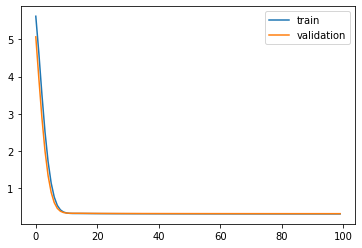

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 8s - loss: 5.6159 - acc: 0.6239 - val_loss: 5.0654 - val_acc: 0.8164

Epoch 00001: val_loss improved from inf to 5.06536, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.6200 - acc: 0.8446 - val_loss: 3.9444 - val_acc: 0.8632

Epoch 00002: val_loss improved from 5.06536 to 3.94440, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.5096 - acc: 0.8691 - val_loss: 2.8883 - val_acc: 0.8703

Epoch 00003: val_loss improved from 3.94440 to 2.88834, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.5129 - acc: 0.8731 - val_loss: 2.0051 - val_acc: 0.8727

Epoch 00004: val_loss improved from 2.88834 to 2.00505, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.7159 - acc: 0.8748 - val_loss: 1.3451 - val_acc: 0.8747

Epoch 00005: val_loss improved from 2.00505 to 1.34507, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.1428 - acc: 0.8755 - v

 - 1s - loss: 0.3193 - acc: 0.8789 - val_loss: 0.3253 - val_acc: 0.8778

Epoch 00046: val_loss improved from 0.32540 to 0.32531, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3192 - acc: 0.8789 - val_loss: 0.3252 - val_acc: 0.8778

Epoch 00047: val_loss improved from 0.32531 to 0.32521, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3251 - val_acc: 0.8779

Epoch 00048: val_loss improved from 0.32521 to 0.32512, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3190 - acc: 0.8790 - val_loss: 0.3250 - val_acc: 0.8778

Epoch 00049: val_loss improved from 0.32512 to 0.32503, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3189 - acc: 0.8790 - val_loss: 0.3249 - val_acc: 0.8777

Epoch 00050: val_loss improved from 0.32503 to 0.32495, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3188 - acc: 0.8790 - val_loss: 0.3249 - val_acc: 0.8777

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32318 to 0.32316, saving model to Event_val_weights3.hdf5
Epoch 92/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00092: val_loss improved from 0.32316 to 0.32315, saving model to Event_val_weights3.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8769

Epoch 00093: val_loss improved from 0.32315 to 0.32314, saving model to Event_val_weights3.hdf5
Epoch 94/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8768

Epoch 00094: val_loss improved from 0.32314 to 0.32313, saving model to Event_val_weights3.hdf5
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8769

Epoch 00095: val_loss improved from 0.32313 to 0.32312, saving model to Event_val_weights3.hdf5
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8769

Epoch 00096: val_loss improved from 0.32312 to 0.32311, saving model to Event_val_weights

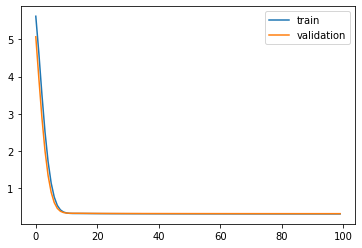

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 8s - loss: 5.6153 - acc: 0.6247 - val_loss: 5.0735 - val_acc: 0.8072

Epoch 00001: val_loss improved from inf to 5.07351, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.6196 - acc: 0.8449 - val_loss: 3.9519 - val_acc: 0.8587

Epoch 00002: val_loss improved from 5.07351 to 3.95193, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.5090 - acc: 0.8695 - val_loss: 2.8975 - val_acc: 0.8652

Epoch 00003: val_loss improved from 3.95193 to 2.89753, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.5121 - acc: 0.8737 - val_loss: 2.0140 - val_acc: 0.8663

Epoch 00004: val_loss improved from 2.89753 to 2.01398, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.7151 - acc: 0.8756 - val_loss: 1.3532 - val_acc: 0.8679

Epoch 00005: val_loss improved from 2.01398 to 1.35316, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.1420 - acc: 0.8762 - v

 - 1s - loss: 0.3188 - acc: 0.8796 - val_loss: 0.3300 - val_acc: 0.8711

Epoch 00046: val_loss improved from 0.33015 to 0.33005, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3187 - acc: 0.8796 - val_loss: 0.3300 - val_acc: 0.8712

Epoch 00047: val_loss improved from 0.33005 to 0.32996, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3186 - acc: 0.8797 - val_loss: 0.3299 - val_acc: 0.8712

Epoch 00048: val_loss improved from 0.32996 to 0.32987, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3185 - acc: 0.8797 - val_loss: 0.3298 - val_acc: 0.8714

Epoch 00049: val_loss improved from 0.32987 to 0.32978, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3184 - acc: 0.8797 - val_loss: 0.3297 - val_acc: 0.8716

Epoch 00050: val_loss improved from 0.32978 to 0.32970, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3183 - acc: 0.8798 - val_loss: 0.3296 - val_acc: 0.8716

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32804 to 0.32802, saving model to Event_val_weights4.hdf5
Epoch 92/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00092: val_loss improved from 0.32802 to 0.32801, saving model to Event_val_weights4.hdf5
Epoch 93/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8714

Epoch 00093: val_loss improved from 0.32801 to 0.32800, saving model to Event_val_weights4.hdf5
Epoch 94/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00094: val_loss improved from 0.32800 to 0.32799, saving model to Event_val_weights4.hdf5
Epoch 95/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00095: val_loss improved from 0.32799 to 0.32798, saving model to Event_val_weights4.hdf5
Epoch 96/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00096: val_loss improved from 0.32798 to 0.32797, saving model to Event_val_weights

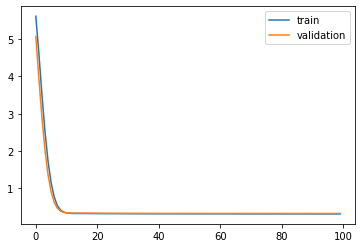

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 8s - loss: 5.6159 - acc: 0.6234 - val_loss: 5.0664 - val_acc: 0.8177

Epoch 00001: val_loss improved from inf to 5.06639, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.6212 - acc: 0.8435 - val_loss: 3.9355 - val_acc: 0.8682

Epoch 00002: val_loss improved from 5.06639 to 3.93553, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.5110 - acc: 0.8687 - val_loss: 2.8752 - val_acc: 0.8737

Epoch 00003: val_loss improved from 3.93553 to 2.87524, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.5140 - acc: 0.8728 - val_loss: 1.9900 - val_acc: 0.8761

Epoch 00004: val_loss improved from 2.87524 to 1.98995, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.7167 - acc: 0.8745 - val_loss: 1.3302 - val_acc: 0.8772

Epoch 00005: val_loss improved from 1.98995 to 1.33016, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.1433 - acc: 0.8754 - v

 - 1s - loss: 0.3199 - acc: 0.8785 - val_loss: 0.3205 - val_acc: 0.8790

Epoch 00046: val_loss improved from 0.32062 to 0.32052, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3198 - acc: 0.8786 - val_loss: 0.3204 - val_acc: 0.8790

Epoch 00047: val_loss improved from 0.32052 to 0.32043, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3196 - acc: 0.8787 - val_loss: 0.3203 - val_acc: 0.8790

Epoch 00048: val_loss improved from 0.32043 to 0.32033, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3195 - acc: 0.8787 - val_loss: 0.3202 - val_acc: 0.8790

Epoch 00049: val_loss improved from 0.32033 to 0.32025, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3194 - acc: 0.8788 - val_loss: 0.3202 - val_acc: 0.8790

Epoch 00050: val_loss improved from 0.32025 to 0.32016, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3201 - val_acc: 0.8789

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31825 to 0.31823, saving model to Event_val_weights5.hdf5
Epoch 92/100
 - 1s - loss: 0.3171 - acc: 0.8791 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00092: val_loss improved from 0.31823 to 0.31820, saving model to Event_val_weights5.hdf5
Epoch 93/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00093: val_loss improved from 0.31820 to 0.31818, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00094: val_loss improved from 0.31818 to 0.31816, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00095: val_loss improved from 0.31816 to 0.31815, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8792

Epoch 00096: val_loss improved from 0.31815 to 0.31812, saving model to Event_val_weights

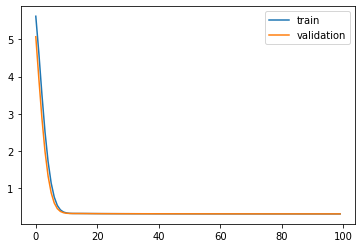

Time to train LSTM:  73.38635349273682
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 8s - loss: 5.6020 - acc: 0.6299 - val_loss: 5.0243 - val_acc: 0.8223

Epoch 00001: val_loss improved from inf to 5.02427, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.5626 - acc: 0.8472 - val_loss: 3.8459 - val_acc: 0.8719

Epoch 00002: val_loss improved from 5.02427 to 3.84594, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.4126 - acc: 0.8690 - val_loss: 2.7509 - val_acc: 0.8763

Epoch 00003: val_loss improved from 3.84594 to 2.75092, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.3909 - acc: 0.8730 - val_loss: 1.8540 - val_acc: 0.8766

Epoch 00004: val_loss improved from 2.75092 to 1.85405, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.5912 - acc: 0.8745 - val_loss: 1.2041 - val_acc: 0.8772

Epoch 00005: val_loss improved from 1.85405 to 1.20412, saving model to Event_val_weights1.hdf5
Epoch 6/100


Epoch 00046: val_loss improved from 0.31476 to 0.31467, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3201 - acc: 0.8783 - val_loss: 0.3146 - val_acc: 0.8806

Epoch 00047: val_loss improved from 0.31467 to 0.31459, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3200 - acc: 0.8784 - val_loss: 0.3145 - val_acc: 0.8804

Epoch 00048: val_loss improved from 0.31459 to 0.31451, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3199 - acc: 0.8784 - val_loss: 0.3144 - val_acc: 0.8807

Epoch 00049: val_loss improved from 0.31451 to 0.31443, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3198 - acc: 0.8784 - val_loss: 0.3143 - val_acc: 0.8806

Epoch 00050: val_loss improved from 0.31443 to 0.31435, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3197 - acc: 0.8785 - val_loss: 0.3143 - val_acc: 0.8807

Epoch 00051: val_loss improved from 0.31435 to 0.31427, saving model to Event_val_weights

 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3125 - val_acc: 0.8804

Epoch 00092: val_loss improved from 0.31248 to 0.31245, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00093: val_loss improved from 0.31245 to 0.31243, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00094: val_loss improved from 0.31243 to 0.31240, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8803

Epoch 00095: val_loss improved from 0.31240 to 0.31237, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00096: val_loss improved from 0.31237 to 0.31235, saving model to Event_val_weights1.hdf5
Epoch 97/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00097: val_

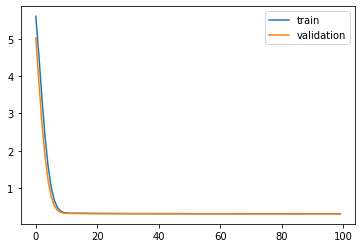

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 9s - loss: 5.6025 - acc: 0.6289 - val_loss: 5.0234 - val_acc: 0.8222

Epoch 00001: val_loss improved from inf to 5.02338, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.5616 - acc: 0.8479 - val_loss: 3.8570 - val_acc: 0.8642

Epoch 00002: val_loss improved from 5.02338 to 3.85704, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.4110 - acc: 0.8697 - val_loss: 2.7678 - val_acc: 0.8706

Epoch 00003: val_loss improved from 3.85704 to 2.76782, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.3894 - acc: 0.8734 - val_loss: 1.8729 - val_acc: 0.8730

Epoch 00004: val_loss improved from 2.76782 to 1.87286, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.5898 - acc: 0.8750 - val_loss: 1.2229 - val_acc: 0.8736

Epoch 00005: val_loss improved from 1.87286 to 1.22292, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.0324 - acc: 0.8759 - v

 - 1s - loss: 0.3190 - acc: 0.8789 - val_loss: 0.3249 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32500 to 0.32491, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8770

Epoch 00048: val_loss improved from 0.32491 to 0.32482, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8771

Epoch 00049: val_loss improved from 0.32482 to 0.32473, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3187 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8771

Epoch 00050: val_loss improved from 0.32473 to 0.32464, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8771

Epoch 00051: val_loss improved from 0.32464 to 0.32456, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00052: val_


Epoch 00092: val_loss improved from 0.32309 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8760

Epoch 00093: val_loss improved from 0.32308 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8759

Epoch 00094: val_loss improved from 0.32308 to 0.32307, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00095: val_loss improved from 0.32307 to 0.32307, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00096: val_loss improved from 0.32307 to 0.32306, saving model to Event_val_weights2.hdf5
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00097: val_loss improved from 0.32306 to 0.32306, saving model to Event_val_weights

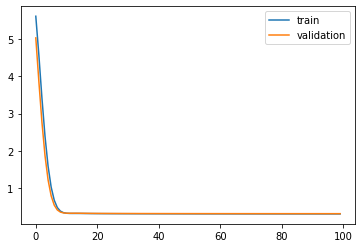

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 9s - loss: 5.6026 - acc: 0.6294 - val_loss: 5.0252 - val_acc: 0.8217

Epoch 00001: val_loss improved from inf to 5.02524, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.5619 - acc: 0.8471 - val_loss: 3.8608 - val_acc: 0.8639

Epoch 00002: val_loss improved from 5.02524 to 3.86080, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.4111 - acc: 0.8696 - val_loss: 2.7715 - val_acc: 0.8709

Epoch 00003: val_loss improved from 3.86080 to 2.77151, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.3894 - acc: 0.8733 - val_loss: 1.8767 - val_acc: 0.8734

Epoch 00004: val_loss improved from 2.77151 to 1.87672, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.5897 - acc: 0.8751 - val_loss: 1.2262 - val_acc: 0.8747

Epoch 00005: val_loss improved from 1.87672 to 1.22625, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.0323 - acc: 0.8757 - v


Epoch 00046: val_loss improved from 0.32518 to 0.32509, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3190 - acc: 0.8790 - val_loss: 0.3250 - val_acc: 0.8777

Epoch 00047: val_loss improved from 0.32509 to 0.32500, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3189 - acc: 0.8790 - val_loss: 0.3249 - val_acc: 0.8776

Epoch 00048: val_loss improved from 0.32500 to 0.32491, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8776

Epoch 00049: val_loss improved from 0.32491 to 0.32482, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8776

Epoch 00050: val_loss improved from 0.32482 to 0.32474, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3247 - val_acc: 0.8776

Epoch 00051: val_loss improved from 0.32474 to 0.32466, saving model to Event_val_weights

 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00092: val_loss improved from 0.32317 to 0.32317, saving model to Event_val_weights3.hdf5
Epoch 93/100
 - 1s - loss: 0.3164 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00093: val_loss improved from 0.32317 to 0.32317, saving model to Event_val_weights3.hdf5
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00094: val_loss did not improve from 0.32317
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00095: val_loss did not improve from 0.32317
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00096: val_loss did not improve from 0.32317
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3232 - val_acc: 0.8767

Epoch 00097: val_loss did not improve from 0.32317
Epoch 98/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8767

Epoch 00098: va

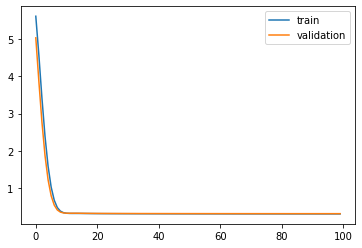

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 9s - loss: 5.6019 - acc: 0.6300 - val_loss: 5.0333 - val_acc: 0.8109

Epoch 00001: val_loss improved from inf to 5.03332, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.5615 - acc: 0.8479 - val_loss: 3.8685 - val_acc: 0.8598

Epoch 00002: val_loss improved from 5.03332 to 3.86847, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.4105 - acc: 0.8701 - val_loss: 2.7808 - val_acc: 0.8659

Epoch 00003: val_loss improved from 3.86847 to 2.78079, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.3886 - acc: 0.8739 - val_loss: 1.8855 - val_acc: 0.8664

Epoch 00004: val_loss improved from 2.78079 to 1.88550, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.5889 - acc: 0.8759 - val_loss: 1.2341 - val_acc: 0.8681

Epoch 00005: val_loss improved from 1.88550 to 1.23410, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.0315 - acc: 0.8762 - v


Epoch 00046: val_loss improved from 0.32992 to 0.32983, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3185 - acc: 0.8797 - val_loss: 0.3297 - val_acc: 0.8716

Epoch 00047: val_loss improved from 0.32983 to 0.32974, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3184 - acc: 0.8797 - val_loss: 0.3296 - val_acc: 0.8716

Epoch 00048: val_loss improved from 0.32974 to 0.32965, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3183 - acc: 0.8798 - val_loss: 0.3296 - val_acc: 0.8716

Epoch 00049: val_loss improved from 0.32965 to 0.32957, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3182 - acc: 0.8798 - val_loss: 0.3295 - val_acc: 0.8714

Epoch 00050: val_loss improved from 0.32957 to 0.32949, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3181 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8713

Epoch 00051: val_loss improved from 0.32949 to 0.32941, saving model to Event_val_weights

 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00092: val_loss improved from 0.32801 to 0.32801, saving model to Event_val_weights4.hdf5
Epoch 93/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00093: val_loss improved from 0.32801 to 0.32801, saving model to Event_val_weights4.hdf5
Epoch 94/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00094: val_loss did not improve from 0.32801
Epoch 95/100
 - 1s - loss: 0.3158 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00095: val_loss did not improve from 0.32801
Epoch 96/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00096: val_loss did not improve from 0.32801
Epoch 97/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00097: val_loss did not improve from 0.32801
Epoch 98/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00098: va

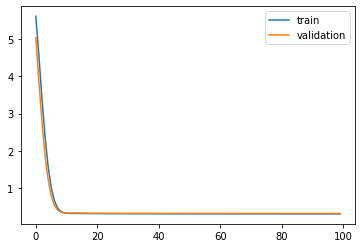

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 9s - loss: 5.6025 - acc: 0.6290 - val_loss: 5.0258 - val_acc: 0.8222

Epoch 00001: val_loss improved from inf to 5.02583, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.5632 - acc: 0.8466 - val_loss: 3.8514 - val_acc: 0.8689

Epoch 00002: val_loss improved from 5.02583 to 3.85140, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.4126 - acc: 0.8690 - val_loss: 2.7580 - val_acc: 0.8737

Epoch 00003: val_loss improved from 3.85140 to 2.75801, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.3904 - acc: 0.8730 - val_loss: 1.8613 - val_acc: 0.8768

Epoch 00004: val_loss improved from 2.75801 to 1.86126, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.5904 - acc: 0.8747 - val_loss: 1.2113 - val_acc: 0.8771

Epoch 00005: val_loss improved from 1.86126 to 1.21132, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.0327 - acc: 0.8755 - v


Epoch 00046: val_loss improved from 0.32039 to 0.32030, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3195 - acc: 0.8787 - val_loss: 0.3202 - val_acc: 0.8791

Epoch 00047: val_loss improved from 0.32030 to 0.32021, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3194 - acc: 0.8787 - val_loss: 0.3201 - val_acc: 0.8790

Epoch 00048: val_loss improved from 0.32021 to 0.32012, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3200 - val_acc: 0.8789

Epoch 00049: val_loss improved from 0.32012 to 0.32003, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3199 - val_acc: 0.8789

Epoch 00050: val_loss improved from 0.32003 to 0.31995, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3199 - val_acc: 0.8789

Epoch 00051: val_loss improved from 0.31995 to 0.31987, saving model to Event_val_weights

 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8791

Epoch 00092: val_loss did not improve from 0.31812
Epoch 93/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00093: val_loss improved from 0.31812 to 0.31806, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00094: val_loss did not improve from 0.31806
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00095: val_loss improved from 0.31806 to 0.31804, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00096: val_loss improved from 0.31804 to 0.31802, saving model to Event_val_weights5.hdf5
Epoch 97/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00097: val_loss did not improve from 0.31802
Epoch 98/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_lo

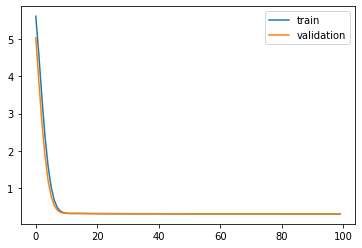

Time to train LSTM:  73.85160398483276
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 10s - loss: 5.5917 - acc: 0.6341 - val_loss: 4.9932 - val_acc: 0.8262

Epoch 00001: val_loss improved from inf to 4.99320, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.5184 - acc: 0.8494 - val_loss: 3.7819 - val_acc: 0.8721

Epoch 00002: val_loss improved from 4.99320 to 3.78194, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.3382 - acc: 0.8696 - val_loss: 2.6629 - val_acc: 0.8761

Epoch 00003: val_loss improved from 3.78194 to 2.66285, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.2989 - acc: 0.8731 - val_loss: 1.7594 - val_acc: 0.8766

Epoch 00004: val_loss improved from 2.66285 to 1.75939, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.4993 - acc: 0.8747 - val_loss: 1.1192 - val_acc: 0.8778

Epoch 00005: val_loss improved from 1.75939 to 1.11917, saving model to Event_val_weights1.hdf5
Epoch 6/10


Epoch 00046: val_loss improved from 0.31461 to 0.31452, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3199 - acc: 0.8783 - val_loss: 0.3144 - val_acc: 0.8808

Epoch 00047: val_loss improved from 0.31452 to 0.31444, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3198 - acc: 0.8784 - val_loss: 0.3144 - val_acc: 0.8806

Epoch 00048: val_loss improved from 0.31444 to 0.31435, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3197 - acc: 0.8785 - val_loss: 0.3143 - val_acc: 0.8806

Epoch 00049: val_loss improved from 0.31435 to 0.31427, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3196 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00050: val_loss improved from 0.31427 to 0.31420, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3195 - acc: 0.8785 - val_loss: 0.3141 - val_acc: 0.8807

Epoch 00051: val_loss improved from 0.31420 to 0.31413, saving model to Event_val_weights

 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8803

Epoch 00092: val_loss improved from 0.31236 to 0.31233, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00093: val_loss improved from 0.31233 to 0.31230, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00094: val_loss improved from 0.31230 to 0.31228, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8804

Epoch 00095: val_loss improved from 0.31228 to 0.31225, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3175 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8804

Epoch 00096: val_loss improved from 0.31225 to 0.31222, saving model to Event_val_weights1.hdf5
Epoch 97/100
 - 1s - loss: 0.3175 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8806

Epoch 00097: val_

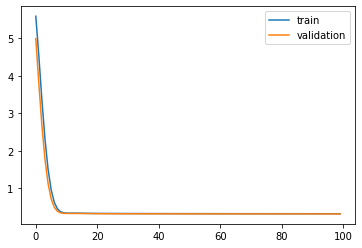

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 10s - loss: 5.5922 - acc: 0.6328 - val_loss: 4.9927 - val_acc: 0.8263

Epoch 00001: val_loss improved from inf to 4.99268, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.5174 - acc: 0.8502 - val_loss: 3.7936 - val_acc: 0.8657

Epoch 00002: val_loss improved from 4.99268 to 3.79355, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.3366 - acc: 0.8703 - val_loss: 2.6801 - val_acc: 0.8707

Epoch 00003: val_loss improved from 3.79355 to 2.68009, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.2973 - acc: 0.8737 - val_loss: 1.7784 - val_acc: 0.8734

Epoch 00004: val_loss improved from 2.68009 to 1.77842, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.4980 - acc: 0.8750 - val_loss: 1.1381 - val_acc: 0.8737

Epoch 00005: val_loss improved from 1.77842 to 1.13807, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 0.9545 - acc: 0.8759 - 

 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8771

Epoch 00047: val_loss improved from 0.32484 to 0.32474, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8771

Epoch 00048: val_loss improved from 0.32474 to 0.32465, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8772

Epoch 00049: val_loss improved from 0.32465 to 0.32457, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8773

Epoch 00050: val_loss improved from 0.32457 to 0.32449, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8772

Epoch 00051: val_loss improved from 0.32449 to 0.32441, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3183 - acc: 0.8789 - val_loss: 0.3243 - val_acc: 0.8772

Epoch 00052: val_


Epoch 00092: val_loss improved from 0.32310 to 0.32310, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00093: val_loss did not improve from 0.32310
Epoch 94/100
 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8756

Epoch 00094: val_loss did not improve from 0.32310
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8756

Epoch 00095: val_loss did not improve from 0.32310
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8756

Epoch 00096: val_loss did not improve from 0.32310
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8756

Epoch 00097: val_loss did not improve from 0.32310
Epoch 98/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00098: val_loss did not improve from 0.32310
Epoch 99/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8

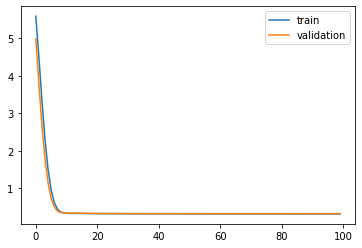

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7feac46b9550>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 10s - loss: 5.5923 - acc: 0.6332 - val_loss: 4.9946 - val_acc: 0.8261

Epoch 00001: val_loss improved from inf to 4.99464, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.5177 - acc: 0.8492 - val_loss: 3.7973 - val_acc: 0.8648

Epoch 00002: val_loss improved from 4.99464 to 3.79733, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.3367 - acc: 0.8701 - val_loss: 2.6838 - val_acc: 0.8710

Epoch 00003: val_loss improved from 3.79733 to 2.68382, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.2974 - acc: 0.8735 - val_loss: 1.7823 - val_acc: 0.8739

Epoch 00004: val_loss improved from 2.68382 to 1.78233, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.4979 - acc: 0.8750 - val_loss: 1.1413 - val_acc: 0.8749

Epoch 00005: val_loss improved from 1.78233 to 1.14133, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 0.9544 - acc: 0.8760 - 

 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8774

Epoch 00047: val_loss improved from 0.32493 to 0.32484, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8776

Epoch 00048: val_loss improved from 0.32484 to 0.32475, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3186 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8777

Epoch 00049: val_loss improved from 0.32475 to 0.32467, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8776

Epoch 00050: val_loss improved from 0.32467 to 0.32459, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8776

Epoch 00051: val_loss improved from 0.32459 to 0.32452, saving model to Event_val_weights3.hdf5
Epoch 52/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8776

Epoch 00052: val_


Epoch 00093: val_loss did not improve from 0.32322
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8768

Epoch 00094: val_loss did not improve from 0.32322
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8768

Epoch 00095: val_loss did not improve from 0.32322
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8769

Epoch 00096: val_loss did not improve from 0.32322
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3234 - val_acc: 0.8767

Epoch 00097: val_loss did not improve from 0.32322
Epoch 98/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3234 - val_acc: 0.8768

Epoch 00098: val_loss did not improve from 0.32322
Epoch 99/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3234 - val_acc: 0.8768

Epoch 00099: val_loss did not improve from 0.32322
Epoch 100/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3234 - val_acc: 0.8767

Epoch 00100: val_loss did not improve f

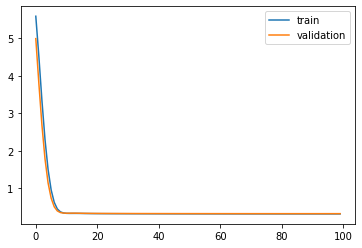

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 10s - loss: 5.5916 - acc: 0.6340 - val_loss: 5.0026 - val_acc: 0.8149

Epoch 00001: val_loss improved from inf to 5.00265, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.5174 - acc: 0.8500 - val_loss: 3.8051 - val_acc: 0.8603

Epoch 00002: val_loss improved from 5.00265 to 3.80512, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.3361 - acc: 0.8707 - val_loss: 2.6931 - val_acc: 0.8657

Epoch 00003: val_loss improved from 3.80512 to 2.69312, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.2965 - acc: 0.8742 - val_loss: 1.7910 - val_acc: 0.8672

Epoch 00004: val_loss improved from 2.69312 to 1.79099, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.4971 - acc: 0.8759 - val_loss: 1.1490 - val_acc: 0.8683

Epoch 00005: val_loss improved from 1.79099 to 1.14900, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 0.9536 - acc: 0.8764 - 

 - 1s - loss: 0.3183 - acc: 0.8798 - val_loss: 0.3296 - val_acc: 0.8716

Epoch 00047: val_loss improved from 0.32967 to 0.32958, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3182 - acc: 0.8798 - val_loss: 0.3295 - val_acc: 0.8713

Epoch 00048: val_loss improved from 0.32958 to 0.32949, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3181 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8712

Epoch 00049: val_loss improved from 0.32949 to 0.32941, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3180 - acc: 0.8798 - val_loss: 0.3293 - val_acc: 0.8713

Epoch 00050: val_loss improved from 0.32941 to 0.32933, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3179 - acc: 0.8798 - val_loss: 0.3293 - val_acc: 0.8713

Epoch 00051: val_loss improved from 0.32933 to 0.32926, saving model to Event_val_weights4.hdf5
Epoch 52/100
 - 1s - loss: 0.3178 - acc: 0.8798 - val_loss: 0.3292 - val_acc: 0.8712

Epoch 00052: val_


Epoch 00093: val_loss did not improve from 0.32805
Epoch 94/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3281 - val_acc: 0.8714

Epoch 00094: val_loss did not improve from 0.32805
Epoch 95/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3281 - val_acc: 0.8716

Epoch 00095: val_loss did not improve from 0.32805
Epoch 96/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3281 - val_acc: 0.8716

Epoch 00096: val_loss did not improve from 0.32805
Epoch 97/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3281 - val_acc: 0.8716

Epoch 00097: val_loss did not improve from 0.32805
Epoch 98/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3282 - val_acc: 0.8717

Epoch 00098: val_loss did not improve from 0.32805
Epoch 99/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3282 - val_acc: 0.8717

Epoch 00099: val_loss did not improve from 0.32805
Epoch 100/100
 - 1s - loss: 0.3158 - acc: 0.8800 - val_loss: 0.3282 - val_acc: 0.8712

Epoch 00100: val_loss did not improve f

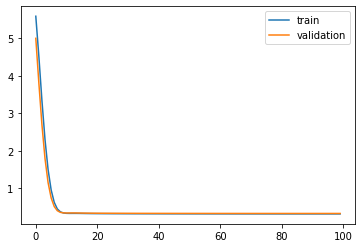

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 11s - loss: 5.5923 - acc: 0.6330 - val_loss: 4.9949 - val_acc: 0.8259

Epoch 00001: val_loss improved from inf to 4.99489, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.5190 - acc: 0.8484 - val_loss: 3.7876 - val_acc: 0.8698

Epoch 00002: val_loss improved from 4.99489 to 3.78757, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.3381 - acc: 0.8695 - val_loss: 2.6700 - val_acc: 0.8743

Epoch 00003: val_loss improved from 3.78757 to 2.67000, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.2983 - acc: 0.8733 - val_loss: 1.7666 - val_acc: 0.8773

Epoch 00004: val_loss improved from 2.67000 to 1.76662, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.4986 - acc: 0.8748 - val_loss: 1.1264 - val_acc: 0.8769

Epoch 00005: val_loss improved from 1.76662 to 1.12641, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 0.9547 - acc: 0.8757 - 

 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3200 - val_acc: 0.8789

Epoch 00047: val_loss improved from 0.32014 to 0.32004, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3200 - val_acc: 0.8789

Epoch 00048: val_loss improved from 0.32004 to 0.31996, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3199 - val_acc: 0.8789

Epoch 00049: val_loss improved from 0.31996 to 0.31987, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3190 - acc: 0.8788 - val_loss: 0.3198 - val_acc: 0.8790

Epoch 00050: val_loss improved from 0.31987 to 0.31979, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3197 - val_acc: 0.8792

Epoch 00051: val_loss improved from 0.31979 to 0.31971, saving model to Event_val_weights5.hdf5
Epoch 52/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3196 - val_acc: 0.8793

Epoch 00052: val_


Epoch 00093: val_loss improved from 0.31806 to 0.31805, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3171 - acc: 0.8791 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00094: val_loss did not improve from 0.31805
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00095: val_loss improved from 0.31805 to 0.31803, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00096: val_loss did not improve from 0.31803
Epoch 97/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00097: val_loss improved from 0.31803 to 0.31800, saving model to Event_val_weights5.hdf5
Epoch 98/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8793

Epoch 00098: val_loss did not improve from 0.31800
Epoch 99/100
 - 1s - loss: 0.3171 - acc: 0.8789 - val_loss: 0.3180 - val_acc: 0.8793

Epoch 00099: val_loss improved from 0.3180

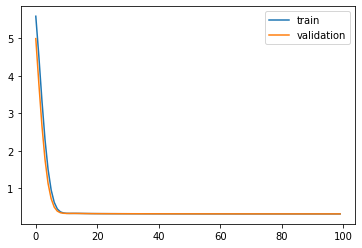

Time to train LSTM:  75.41778326034546
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 11s - loss: 5.5846 - acc: 0.6368 - val_loss: 4.9719 - val_acc: 0.8271

Epoch 00001: val_loss improved from inf to 4.97188, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.4882 - acc: 0.8503 - val_loss: 3.7382 - val_acc: 0.8724

Epoch 00002: val_loss improved from 4.97188 to 3.73818, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.2874 - acc: 0.8698 - val_loss: 2.6031 - val_acc: 0.8759

Epoch 00003: val_loss improved from 3.73818 to 2.60315, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.2369 - acc: 0.8732 - val_loss: 1.6962 - val_acc: 0.8767

Epoch 00004: val_loss improved from 2.60315 to 1.69622, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.4385 - acc: 0.8748 - val_loss: 1.0637 - val_acc: 0.8779

Epoch 00005: val_loss improved from 1.69622 to 1.06374, saving model to Event_val_weights1.hdf5
Epoch 6/10


Epoch 00046: val_loss improved from 0.31450 to 0.31442, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3198 - acc: 0.8785 - val_loss: 0.3143 - val_acc: 0.8807

Epoch 00047: val_loss improved from 0.31442 to 0.31433, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3197 - acc: 0.8785 - val_loss: 0.3143 - val_acc: 0.8807

Epoch 00048: val_loss improved from 0.31433 to 0.31425, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3196 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00049: val_loss improved from 0.31425 to 0.31417, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3195 - acc: 0.8785 - val_loss: 0.3141 - val_acc: 0.8806

Epoch 00050: val_loss improved from 0.31417 to 0.31410, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3194 - acc: 0.8786 - val_loss: 0.3140 - val_acc: 0.8804

Epoch 00051: val_loss improved from 0.31410 to 0.31403, saving model to Event_val_weights

 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8806

Epoch 00092: val_loss improved from 0.31228 to 0.31225, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8806

Epoch 00093: val_loss improved from 0.31225 to 0.31222, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8804

Epoch 00094: val_loss improved from 0.31222 to 0.31220, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8804

Epoch 00095: val_loss improved from 0.31220 to 0.31218, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8804

Epoch 00096: val_loss improved from 0.31218 to 0.31215, saving model to Event_val_weights1.hdf5
Epoch 97/100
 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8806

Epoch 00097: val_

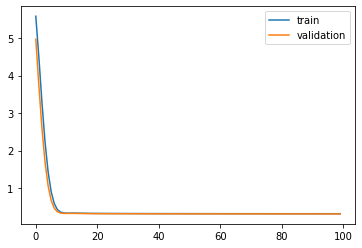

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 11s - loss: 5.5851 - acc: 0.6356 - val_loss: 4.9716 - val_acc: 0.8274

Epoch 00001: val_loss improved from inf to 4.97161, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.4871 - acc: 0.8515 - val_loss: 3.7501 - val_acc: 0.8662

Epoch 00002: val_loss improved from 4.97161 to 3.75013, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.2858 - acc: 0.8704 - val_loss: 2.6206 - val_acc: 0.8709

Epoch 00003: val_loss improved from 3.75013 to 2.62061, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.2353 - acc: 0.8737 - val_loss: 1.7154 - val_acc: 0.8732

Epoch 00004: val_loss improved from 2.62061 to 1.71539, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.4372 - acc: 0.8752 - val_loss: 1.0827 - val_acc: 0.8736

Epoch 00005: val_loss improved from 1.71539 to 1.08269, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 0.9043 - acc: 0.8760 - 

 - 1s - loss: 0.3187 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8771

Epoch 00047: val_loss improved from 0.32472 to 0.32463, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00048: val_loss improved from 0.32463 to 0.32455, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00049: val_loss improved from 0.32455 to 0.32446, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8772

Epoch 00050: val_loss improved from 0.32446 to 0.32438, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3243 - val_acc: 0.8772

Epoch 00051: val_loss improved from 0.32438 to 0.32431, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3182 - acc: 0.8790 - val_loss: 0.3242 - val_acc: 0.8772

Epoch 00052: val_


Epoch 00093: val_loss did not improve from 0.32312
Epoch 94/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8757

Epoch 00094: val_loss did not improve from 0.32312
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8758

Epoch 00095: val_loss did not improve from 0.32312
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8757

Epoch 00096: val_loss did not improve from 0.32312
Epoch 97/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8759

Epoch 00097: val_loss did not improve from 0.32312
Epoch 98/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8759

Epoch 00098: val_loss did not improve from 0.32312
Epoch 99/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8759

Epoch 00099: val_loss did not improve from 0.32312
Epoch 100/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8760

Epoch 00100: val_loss did not improve f

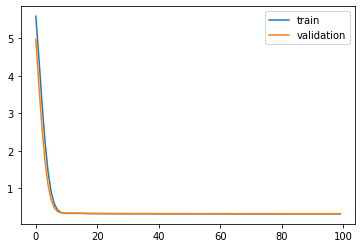

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 11s - loss: 5.5852 - acc: 0.6357 - val_loss: 4.9736 - val_acc: 0.8287

Epoch 00001: val_loss improved from inf to 4.97364, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.4874 - acc: 0.8503 - val_loss: 3.7539 - val_acc: 0.8651

Epoch 00002: val_loss improved from 4.97364 to 3.75391, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.2859 - acc: 0.8703 - val_loss: 2.6244 - val_acc: 0.8713

Epoch 00003: val_loss improved from 3.75391 to 2.62437, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.2353 - acc: 0.8738 - val_loss: 1.7193 - val_acc: 0.8740

Epoch 00004: val_loss improved from 2.62437 to 1.71934, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.4371 - acc: 0.8750 - val_loss: 1.0859 - val_acc: 0.8749

Epoch 00005: val_loss improved from 1.71934 to 1.08589, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 0.9041 - acc: 0.8759 - 

 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8777

Epoch 00047: val_loss improved from 0.32483 to 0.32474, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3247 - val_acc: 0.8777

Epoch 00048: val_loss improved from 0.32474 to 0.32465, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8777

Epoch 00049: val_loss improved from 0.32465 to 0.32457, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8776

Epoch 00050: val_loss improved from 0.32457 to 0.32450, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8776

Epoch 00051: val_loss improved from 0.32450 to 0.32442, saving model to Event_val_weights3.hdf5
Epoch 52/100
 - 1s - loss: 0.3182 - acc: 0.8791 - val_loss: 0.3244 - val_acc: 0.8773

Epoch 00052: val_

 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3235 - val_acc: 0.8768

Epoch 00095: val_loss did not improve from 0.32326
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3235 - val_acc: 0.8768

Epoch 00096: val_loss did not improve from 0.32326
Epoch 97/100
 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3235 - val_acc: 0.8766

Epoch 00097: val_loss did not improve from 0.32326
Epoch 98/100
 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3236 - val_acc: 0.8766

Epoch 00098: val_loss did not improve from 0.32326
Epoch 99/100
 - 1s - loss: 0.3165 - acc: 0.8796 - val_loss: 0.3236 - val_acc: 0.8768

Epoch 00099: val_loss did not improve from 0.32326
Epoch 100/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3236 - val_acc: 0.8768

Epoch 00100: val_loss did not improve from 0.32326
#################################
Number of units: 16
Batch size: 16384
Fold: 2
L2 : 0.05441600579314996
LR: 0.04303739036104375
Decay: 4.943761151192986e-08
best val loss: 0.323261827230453

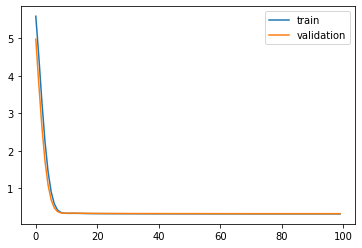

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 11s - loss: 5.5845 - acc: 0.6366 - val_loss: 4.9816 - val_acc: 0.8168

Epoch 00001: val_loss improved from inf to 4.98160, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.4871 - acc: 0.8511 - val_loss: 3.7618 - val_acc: 0.8606

Epoch 00002: val_loss improved from 4.98160 to 3.76179, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.2853 - acc: 0.8709 - val_loss: 2.6337 - val_acc: 0.8659

Epoch 00003: val_loss improved from 3.76179 to 2.63367, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.2345 - acc: 0.8744 - val_loss: 1.7279 - val_acc: 0.8672

Epoch 00004: val_loss improved from 2.63367 to 1.72790, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.4363 - acc: 0.8759 - val_loss: 1.0934 - val_acc: 0.8684

Epoch 00005: val_loss improved from 1.72790 to 1.09343, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 0.9033 - acc: 0.8766 - 

 - 1s - loss: 0.3182 - acc: 0.8798 - val_loss: 0.3295 - val_acc: 0.8713

Epoch 00047: val_loss improved from 0.32956 to 0.32947, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3181 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8712

Epoch 00048: val_loss improved from 0.32947 to 0.32939, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3180 - acc: 0.8798 - val_loss: 0.3293 - val_acc: 0.8713

Epoch 00049: val_loss improved from 0.32939 to 0.32931, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3179 - acc: 0.8798 - val_loss: 0.3292 - val_acc: 0.8712

Epoch 00050: val_loss improved from 0.32931 to 0.32924, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3178 - acc: 0.8798 - val_loss: 0.3292 - val_acc: 0.8712

Epoch 00051: val_loss improved from 0.32924 to 0.32916, saving model to Event_val_weights4.hdf5
Epoch 52/100
 - 1s - loss: 0.3177 - acc: 0.8799 - val_loss: 0.3291 - val_acc: 0.8711

Epoch 00052: val_


Epoch 00094: val_loss did not improve from 0.32807
Epoch 95/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3282 - val_acc: 0.8716

Epoch 00095: val_loss did not improve from 0.32807
Epoch 96/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3283 - val_acc: 0.8712

Epoch 00096: val_loss did not improve from 0.32807
Epoch 97/100
 - 1s - loss: 0.3159 - acc: 0.8800 - val_loss: 0.3283 - val_acc: 0.8710

Epoch 00097: val_loss did not improve from 0.32807
Epoch 98/100
 - 1s - loss: 0.3159 - acc: 0.8800 - val_loss: 0.3283 - val_acc: 0.8710

Epoch 00098: val_loss did not improve from 0.32807
Epoch 99/100
 - 1s - loss: 0.3159 - acc: 0.8800 - val_loss: 0.3284 - val_acc: 0.8709

Epoch 00099: val_loss did not improve from 0.32807
Epoch 100/100
 - 1s - loss: 0.3159 - acc: 0.8800 - val_loss: 0.3284 - val_acc: 0.8709

Epoch 00100: val_loss did not improve from 0.32807
#################################
Number of units: 16
Batch size: 16384
Fold: 3
L2 : 0.05441600579314996
LR: 0.04303739036104

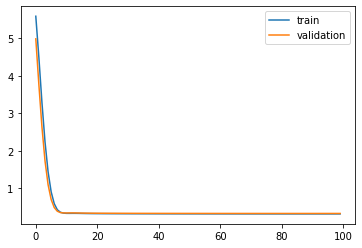

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 11s - loss: 5.5852 - acc: 0.6355 - val_loss: 4.9737 - val_acc: 0.8282

Epoch 00001: val_loss improved from inf to 4.97366, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.4888 - acc: 0.8497 - val_loss: 3.7439 - val_acc: 0.8697

Epoch 00002: val_loss improved from 4.97366 to 3.74391, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.2873 - acc: 0.8698 - val_loss: 2.6103 - val_acc: 0.8742

Epoch 00003: val_loss improved from 3.74391 to 2.61034, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.2363 - acc: 0.8734 - val_loss: 1.7035 - val_acc: 0.8776

Epoch 00004: val_loss improved from 2.61034 to 1.70347, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.4377 - acc: 0.8748 - val_loss: 1.0710 - val_acc: 0.8774

Epoch 00005: val_loss improved from 1.70347 to 1.07101, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 0.9044 - acc: 0.8758 - 

 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3199 - val_acc: 0.8788

Epoch 00047: val_loss improved from 0.32003 to 0.31994, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3199 - val_acc: 0.8789

Epoch 00048: val_loss improved from 0.31994 to 0.31985, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3190 - acc: 0.8788 - val_loss: 0.3198 - val_acc: 0.8792

Epoch 00049: val_loss improved from 0.31985 to 0.31977, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3189 - acc: 0.8788 - val_loss: 0.3197 - val_acc: 0.8792

Epoch 00050: val_loss improved from 0.31977 to 0.31969, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3196 - val_acc: 0.8792

Epoch 00051: val_loss improved from 0.31969 to 0.31961, saving model to Event_val_weights5.hdf5
Epoch 52/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3195 - val_acc: 0.8793

Epoch 00052: val_


Epoch 00093: val_loss did not improve from 0.31804
Epoch 94/100
 - 1s - loss: 0.3172 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00094: val_loss improved from 0.31804 to 0.31803, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3172 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00095: val_loss did not improve from 0.31803
Epoch 96/100
 - 1s - loss: 0.3172 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00096: val_loss did not improve from 0.31803
Epoch 97/100
 - 1s - loss: 0.3172 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00097: val_loss did not improve from 0.31803
Epoch 98/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00098: val_loss did not improve from 0.31803
Epoch 99/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00099: val_loss did not improve from 0.31803
Epoch 100/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.

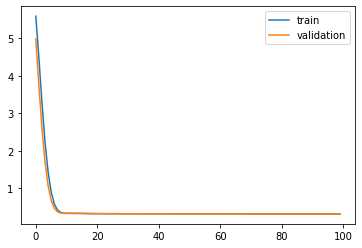

Time to train LSTM:  76.29329037666321
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 11s - loss: 5.6088 - acc: 0.6272 - val_loss: 5.0451 - val_acc: 0.8184

Epoch 00001: val_loss improved from inf to 5.04511, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.5923 - acc: 0.8461 - val_loss: 3.8890 - val_acc: 0.8720

Epoch 00002: val_loss improved from 5.04511 to 3.88903, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.4629 - acc: 0.8685 - val_loss: 2.8107 - val_acc: 0.8762

Epoch 00003: val_loss improved from 3.88903 to 2.81070, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.4537 - acc: 0.8729 - val_loss: 1.9193 - val_acc: 0.8762

Epoch 00004: val_loss improved from 2.81070 to 1.91927, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.6549 - acc: 0.8744 - val_loss: 1.2639 - val_acc: 0.8776

Epoch 00005: val_loss improved from 1.91927 to 1.26389, saving model to Event_val_weights1.hdf5
Epoch 6/10

 - 1s - loss: 0.3204 - acc: 0.8784 - val_loss: 0.3148 - val_acc: 0.8807

Epoch 00046: val_loss improved from 0.31487 to 0.31478, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3203 - acc: 0.8783 - val_loss: 0.3147 - val_acc: 0.8807

Epoch 00047: val_loss improved from 0.31478 to 0.31469, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3201 - acc: 0.8783 - val_loss: 0.3146 - val_acc: 0.8806

Epoch 00048: val_loss improved from 0.31469 to 0.31461, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3200 - acc: 0.8784 - val_loss: 0.3145 - val_acc: 0.8804

Epoch 00049: val_loss improved from 0.31461 to 0.31453, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3199 - acc: 0.8784 - val_loss: 0.3145 - val_acc: 0.8806

Epoch 00050: val_loss improved from 0.31453 to 0.31445, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3198 - acc: 0.8784 - val_loss: 0.3144 - val_acc: 0.8807

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31259 to 0.31257, saving model to Event_val_weights1.hdf5
Epoch 92/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3125 - val_acc: 0.8802

Epoch 00092: val_loss improved from 0.31257 to 0.31254, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3125 - val_acc: 0.8802

Epoch 00093: val_loss improved from 0.31254 to 0.31251, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3125 - val_acc: 0.8803

Epoch 00094: val_loss improved from 0.31251 to 0.31248, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3125 - val_acc: 0.8803

Epoch 00095: val_loss improved from 0.31248 to 0.31246, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8803

Epoch 00096: val_loss improved from 0.31246 to 0.31243, saving model to Event_val_weights

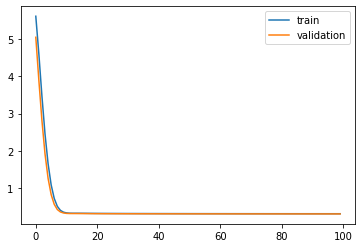

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 12s - loss: 5.6093 - acc: 0.6263 - val_loss: 5.0440 - val_acc: 0.8204

Epoch 00001: val_loss improved from inf to 5.04397, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.5913 - acc: 0.8467 - val_loss: 3.8998 - val_acc: 0.8638

Epoch 00002: val_loss improved from 5.04397 to 3.89978, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.4613 - acc: 0.8693 - val_loss: 2.8273 - val_acc: 0.8710

Epoch 00003: val_loss improved from 3.89978 to 2.82735, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.4522 - acc: 0.8733 - val_loss: 1.9379 - val_acc: 0.8722

Epoch 00004: val_loss improved from 2.82735 to 1.93791, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.6536 - acc: 0.8748 - val_loss: 1.2826 - val_acc: 0.8736

Epoch 00005: val_loss improved from 1.93791 to 1.28262, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.0878 - acc: 0.8758 - 

 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3251 - val_acc: 0.8770

Epoch 00046: val_loss improved from 0.32522 to 0.32512, saving model to Event_val_weights2.hdf5
Epoch 47/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3250 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32512 to 0.32503, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3190 - acc: 0.8789 - val_loss: 0.3249 - val_acc: 0.8770

Epoch 00048: val_loss improved from 0.32503 to 0.32493, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8770

Epoch 00049: val_loss improved from 0.32493 to 0.32484, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8770

Epoch 00050: val_loss improved from 0.32484 to 0.32476, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8771

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32312 to 0.32310, saving model to Event_val_weights2.hdf5
Epoch 92/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8762

Epoch 00092: val_loss improved from 0.32310 to 0.32309, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00093: val_loss improved from 0.32309 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8760

Epoch 00094: val_loss improved from 0.32308 to 0.32307, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00095: val_loss improved from 0.32307 to 0.32307, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8760

Epoch 00096: val_loss improved from 0.32307 to 0.32306, saving model to Event_val_weights

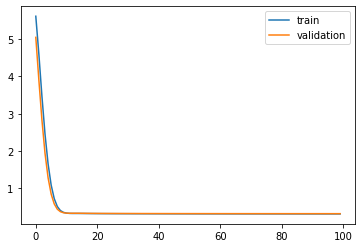

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 12s - loss: 5.6094 - acc: 0.6267 - val_loss: 5.0458 - val_acc: 0.8198

Epoch 00001: val_loss improved from inf to 5.04577, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.5916 - acc: 0.8457 - val_loss: 3.9035 - val_acc: 0.8641

Epoch 00002: val_loss improved from 5.04577 to 3.90352, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.4614 - acc: 0.8693 - val_loss: 2.8310 - val_acc: 0.8707

Epoch 00003: val_loss improved from 3.90352 to 2.83103, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.4522 - acc: 0.8732 - val_loss: 1.9417 - val_acc: 0.8731

Epoch 00004: val_loss improved from 2.83103 to 1.94174, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.6534 - acc: 0.8750 - val_loss: 1.2860 - val_acc: 0.8744

Epoch 00005: val_loss improved from 1.94174 to 1.28598, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.0876 - acc: 0.8756 - 


Epoch 00046: val_loss improved from 0.32529 to 0.32520, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3251 - val_acc: 0.8779

Epoch 00047: val_loss improved from 0.32520 to 0.32510, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3190 - acc: 0.8790 - val_loss: 0.3250 - val_acc: 0.8778

Epoch 00048: val_loss improved from 0.32510 to 0.32502, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3189 - acc: 0.8790 - val_loss: 0.3249 - val_acc: 0.8777

Epoch 00049: val_loss improved from 0.32502 to 0.32493, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3188 - acc: 0.8790 - val_loss: 0.3248 - val_acc: 0.8776

Epoch 00050: val_loss improved from 0.32493 to 0.32485, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3187 - acc: 0.8790 - val_loss: 0.3248 - val_acc: 0.8776

Epoch 00051: val_loss improved from 0.32485 to 0.32477, saving model to Event_val_weights

 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8768

Epoch 00092: val_loss improved from 0.32315 to 0.32315, saving model to Event_val_weights3.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8768

Epoch 00093: val_loss improved from 0.32315 to 0.32314, saving model to Event_val_weights3.hdf5
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8770

Epoch 00094: val_loss improved from 0.32314 to 0.32313, saving model to Event_val_weights3.hdf5
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8770

Epoch 00095: val_loss improved from 0.32313 to 0.32313, saving model to Event_val_weights3.hdf5
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8770

Epoch 00096: val_loss improved from 0.32313 to 0.32313, saving model to Event_val_weights3.hdf5
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8770

Epoch 00097: val_

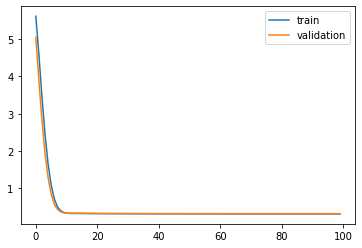

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 12s - loss: 5.6087 - acc: 0.6276 - val_loss: 5.0539 - val_acc: 0.8084

Epoch 00001: val_loss improved from inf to 5.05388, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.5912 - acc: 0.8464 - val_loss: 3.9111 - val_acc: 0.8596

Epoch 00002: val_loss improved from 5.05388 to 3.91111, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.4608 - acc: 0.8699 - val_loss: 2.8403 - val_acc: 0.8654

Epoch 00003: val_loss improved from 3.91111 to 2.84027, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.4514 - acc: 0.8738 - val_loss: 1.9506 - val_acc: 0.8666

Epoch 00004: val_loss improved from 2.84027 to 1.95060, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.6527 - acc: 0.8757 - val_loss: 1.2940 - val_acc: 0.8682

Epoch 00005: val_loss improved from 1.95060 to 1.29396, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.0868 - acc: 0.8761 - 


Epoch 00046: val_loss improved from 0.33004 to 0.32994, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3186 - acc: 0.8797 - val_loss: 0.3298 - val_acc: 0.8713

Epoch 00047: val_loss improved from 0.32994 to 0.32985, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3185 - acc: 0.8797 - val_loss: 0.3298 - val_acc: 0.8714

Epoch 00048: val_loss improved from 0.32985 to 0.32976, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3184 - acc: 0.8797 - val_loss: 0.3297 - val_acc: 0.8716

Epoch 00049: val_loss improved from 0.32976 to 0.32967, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3183 - acc: 0.8798 - val_loss: 0.3296 - val_acc: 0.8716

Epoch 00050: val_loss improved from 0.32967 to 0.32959, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3182 - acc: 0.8798 - val_loss: 0.3295 - val_acc: 0.8716

Epoch 00051: val_loss improved from 0.32959 to 0.32951, saving model to Event_val_weights

 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00092: val_loss improved from 0.32801 to 0.32800, saving model to Event_val_weights4.hdf5
Epoch 93/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00093: val_loss improved from 0.32800 to 0.32799, saving model to Event_val_weights4.hdf5
Epoch 94/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00094: val_loss improved from 0.32799 to 0.32799, saving model to Event_val_weights4.hdf5
Epoch 95/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00095: val_loss improved from 0.32799 to 0.32798, saving model to Event_val_weights4.hdf5
Epoch 96/100
 - 1s - loss: 0.3158 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00096: val_loss improved from 0.32798 to 0.32798, saving model to Event_val_weights4.hdf5
Epoch 97/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00097: val_

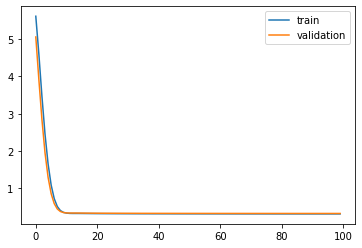

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 15s - loss: 5.6094 - acc: 0.6263 - val_loss: 5.0466 - val_acc: 0.8196

Epoch 00001: val_loss improved from inf to 5.04658, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.5928 - acc: 0.8449 - val_loss: 3.8944 - val_acc: 0.8689

Epoch 00002: val_loss improved from 5.04658 to 3.89439, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.4628 - acc: 0.8688 - val_loss: 2.8177 - val_acc: 0.8734

Epoch 00003: val_loss improved from 3.89439 to 2.81773, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.4532 - acc: 0.8728 - val_loss: 1.9265 - val_acc: 0.8764

Epoch 00004: val_loss improved from 2.81773 to 1.92646, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.6542 - acc: 0.8746 - val_loss: 1.2711 - val_acc: 0.8769

Epoch 00005: val_loss improved from 1.92646 to 1.27106, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.0881 - acc: 0.8754 - 

 - 1s - loss: 0.3197 - acc: 0.8786 - val_loss: 0.3204 - val_acc: 0.8790

Epoch 00046: val_loss improved from 0.32051 to 0.32041, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3196 - acc: 0.8787 - val_loss: 0.3203 - val_acc: 0.8790

Epoch 00047: val_loss improved from 0.32041 to 0.32032, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3195 - acc: 0.8787 - val_loss: 0.3202 - val_acc: 0.8791

Epoch 00048: val_loss improved from 0.32032 to 0.32023, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3194 - acc: 0.8787 - val_loss: 0.3201 - val_acc: 0.8790

Epoch 00049: val_loss improved from 0.32023 to 0.32014, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3201 - val_acc: 0.8789

Epoch 00050: val_loss improved from 0.32014 to 0.32006, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3200 - val_acc: 0.8789

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31820 to 0.31818, saving model to Event_val_weights5.hdf5
Epoch 92/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00092: val_loss improved from 0.31818 to 0.31815, saving model to Event_val_weights5.hdf5
Epoch 93/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8792

Epoch 00093: val_loss improved from 0.31815 to 0.31814, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8792

Epoch 00094: val_loss improved from 0.31814 to 0.31811, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8792

Epoch 00095: val_loss did not improve from 0.31811
Epoch 96/100
 - 1s - loss: 0.3170 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00096: val_loss improved from 0.31811 to 0.31806, saving model to Event_val_weights5.hdf5
Epoch 97/100
 - 1s - loss: 0.3171 - ac

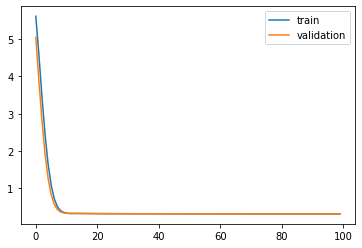

Time to train LSTM:  79.68722152709961


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7feac0ec9518>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 13s - loss: 5.6271 - acc: 0.6198 - val_loss: 5.1012 - val_acc: 0.8109

Epoch 00001: val_loss improved from inf to 5.10124, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.6725 - acc: 0.8417 - val_loss: 4.0058 - val_acc: 0.8709

Epoch 00002: val_loss improved from 5.10124 to 4.00579, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.5995 - acc: 0.8676 - val_loss: 2.9745 - val_acc: 0.8761

Epoch 00003: val_loss improved from 4.00579 to 2.97446, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.6272 - acc: 0.8724 - val_loss: 2.1017 - val_acc: 0.8760

Epoch 00004: val_loss improved from 2.97446 to 2.10173, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.8352 - acc: 0.8741 - val_loss: 1.4361 - val_acc: 0.8776

Epoch 00005: val_loss improved from 2.10173 to 1.43614, saving model to Event_val_weights1.hdf5
Epoch 6/100
 - 1s - loss: 1.2507 - acc: 0.8752 - 

 - 1s - loss: 0.3207 - acc: 0.8783 - val_loss: 0.3151 - val_acc: 0.8808

Epoch 00046: val_loss improved from 0.31517 to 0.31508, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3206 - acc: 0.8783 - val_loss: 0.3150 - val_acc: 0.8808

Epoch 00047: val_loss improved from 0.31508 to 0.31499, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3205 - acc: 0.8783 - val_loss: 0.3149 - val_acc: 0.8808

Epoch 00048: val_loss improved from 0.31499 to 0.31490, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3204 - acc: 0.8784 - val_loss: 0.3148 - val_acc: 0.8808

Epoch 00049: val_loss improved from 0.31490 to 0.31482, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3203 - acc: 0.8784 - val_loss: 0.3147 - val_acc: 0.8807

Epoch 00050: val_loss improved from 0.31482 to 0.31474, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3202 - acc: 0.8784 - val_loss: 0.3147 - val_acc: 0.8806

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31282 to 0.31279, saving model to Event_val_weights1.hdf5
Epoch 92/100
 - 1s - loss: 0.3178 - acc: 0.8790 - val_loss: 0.3128 - val_acc: 0.8803

Epoch 00092: val_loss improved from 0.31279 to 0.31276, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3127 - val_acc: 0.8804

Epoch 00093: val_loss improved from 0.31276 to 0.31274, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3127 - val_acc: 0.8803

Epoch 00094: val_loss improved from 0.31274 to 0.31271, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3127 - val_acc: 0.8802

Epoch 00095: val_loss improved from 0.31271 to 0.31268, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3127 - val_acc: 0.8803

Epoch 00096: val_loss improved from 0.31268 to 0.31265, saving model to Event_val_weights

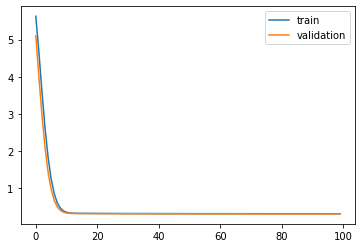

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 13s - loss: 5.6277 - acc: 0.6186 - val_loss: 5.0994 - val_acc: 0.8142

Epoch 00001: val_loss improved from inf to 5.09944, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.6716 - acc: 0.8423 - val_loss: 4.0155 - val_acc: 0.8623

Epoch 00002: val_loss improved from 5.09944 to 4.01554, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.5980 - acc: 0.8684 - val_loss: 2.9904 - val_acc: 0.8703

Epoch 00003: val_loss improved from 4.01554 to 2.99040, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.6256 - acc: 0.8727 - val_loss: 2.1199 - val_acc: 0.8722

Epoch 00004: val_loss improved from 2.99040 to 2.11989, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.8338 - acc: 0.8746 - val_loss: 1.4546 - val_acc: 0.8739

Epoch 00005: val_loss improved from 2.11989 to 1.45463, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.2495 - acc: 0.8756 - 

 - 1s - loss: 0.3196 - acc: 0.8787 - val_loss: 0.3255 - val_acc: 0.8770

Epoch 00046: val_loss improved from 0.32556 to 0.32546, saving model to Event_val_weights2.hdf5
Epoch 47/100
 - 1s - loss: 0.3195 - acc: 0.8788 - val_loss: 0.3254 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32546 to 0.32536, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3194 - acc: 0.8788 - val_loss: 0.3253 - val_acc: 0.8770

Epoch 00048: val_loss improved from 0.32536 to 0.32526, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3252 - val_acc: 0.8769

Epoch 00049: val_loss improved from 0.32526 to 0.32517, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3251 - val_acc: 0.8769

Epoch 00050: val_loss improved from 0.32517 to 0.32508, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3250 - val_acc: 0.8770

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32322 to 0.32320, saving model to Event_val_weights2.hdf5
Epoch 92/100
 - 1s - loss: 0.3167 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8764

Epoch 00092: val_loss improved from 0.32320 to 0.32318, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8766

Epoch 00093: val_loss improved from 0.32318 to 0.32317, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8766

Epoch 00094: val_loss improved from 0.32317 to 0.32315, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8766

Epoch 00095: val_loss improved from 0.32315 to 0.32313, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8764

Epoch 00096: val_loss improved from 0.32313 to 0.32312, saving model to Event_val_weights

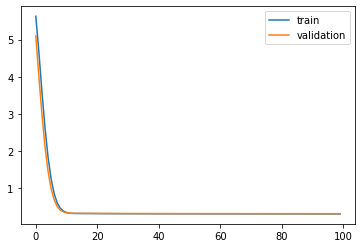

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 13s - loss: 5.6278 - acc: 0.6190 - val_loss: 5.1011 - val_acc: 0.8134

Epoch 00001: val_loss improved from inf to 5.10106, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.6719 - acc: 0.8414 - val_loss: 4.0192 - val_acc: 0.8628

Epoch 00002: val_loss improved from 5.10106 to 4.01922, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.5980 - acc: 0.8684 - val_loss: 2.9941 - val_acc: 0.8699

Epoch 00003: val_loss improved from 4.01922 to 2.99407, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.6256 - acc: 0.8729 - val_loss: 2.1236 - val_acc: 0.8719

Epoch 00004: val_loss improved from 2.99407 to 2.12363, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.8337 - acc: 0.8746 - val_loss: 1.4581 - val_acc: 0.8748

Epoch 00005: val_loss improved from 2.12363 to 1.45806, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.2494 - acc: 0.8754 - 

 - 1s - loss: 0.3196 - acc: 0.8790 - val_loss: 0.3255 - val_acc: 0.8777

Epoch 00046: val_loss improved from 0.32561 to 0.32551, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3195 - acc: 0.8789 - val_loss: 0.3254 - val_acc: 0.8778

Epoch 00047: val_loss improved from 0.32551 to 0.32541, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3194 - acc: 0.8789 - val_loss: 0.3253 - val_acc: 0.8778

Epoch 00048: val_loss improved from 0.32541 to 0.32532, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3252 - val_acc: 0.8778

Epoch 00049: val_loss improved from 0.32532 to 0.32523, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3251 - val_acc: 0.8778

Epoch 00050: val_loss improved from 0.32523 to 0.32515, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3190 - acc: 0.8790 - val_loss: 0.3251 - val_acc: 0.8777

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32324 to 0.32322, saving model to Event_val_weights3.hdf5
Epoch 92/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8764

Epoch 00092: val_loss improved from 0.32322 to 0.32320, saving model to Event_val_weights3.hdf5
Epoch 93/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8766

Epoch 00093: val_loss improved from 0.32320 to 0.32318, saving model to Event_val_weights3.hdf5
Epoch 94/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8767

Epoch 00094: val_loss improved from 0.32318 to 0.32316, saving model to Event_val_weights3.hdf5
Epoch 95/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8768

Epoch 00095: val_loss improved from 0.32316 to 0.32315, saving model to Event_val_weights3.hdf5
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8768

Epoch 00096: val_loss improved from 0.32315 to 0.32313, saving model to Event_val_weights

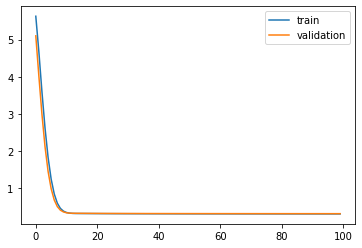

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 13s - loss: 5.6271 - acc: 0.6196 - val_loss: 5.1093 - val_acc: 0.8018

Epoch 00001: val_loss improved from inf to 5.10928, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.6715 - acc: 0.8420 - val_loss: 4.0266 - val_acc: 0.8577

Epoch 00002: val_loss improved from 5.10928 to 4.02664, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.5975 - acc: 0.8688 - val_loss: 3.0032 - val_acc: 0.8651

Epoch 00003: val_loss improved from 4.02664 to 3.00315, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.6248 - acc: 0.8734 - val_loss: 2.1327 - val_acc: 0.8672

Epoch 00004: val_loss improved from 3.00315 to 2.13267, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.8329 - acc: 0.8752 - val_loss: 1.4663 - val_acc: 0.8678

Epoch 00005: val_loss improved from 2.13267 to 1.46634, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.2486 - acc: 0.8762 - 

 - 1s - loss: 0.3191 - acc: 0.8796 - val_loss: 0.3303 - val_acc: 0.8711

Epoch 00046: val_loss improved from 0.33035 to 0.33025, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3190 - acc: 0.8796 - val_loss: 0.3302 - val_acc: 0.8711

Epoch 00047: val_loss improved from 0.33025 to 0.33016, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3189 - acc: 0.8796 - val_loss: 0.3301 - val_acc: 0.8711

Epoch 00048: val_loss improved from 0.33016 to 0.33007, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3187 - acc: 0.8796 - val_loss: 0.3300 - val_acc: 0.8712

Epoch 00049: val_loss improved from 0.33007 to 0.32998, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3186 - acc: 0.8797 - val_loss: 0.3299 - val_acc: 0.8711

Epoch 00050: val_loss improved from 0.32998 to 0.32989, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3185 - acc: 0.8797 - val_loss: 0.3298 - val_acc: 0.8714

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32810 to 0.32808, saving model to Event_val_weights4.hdf5
Epoch 92/100
 - 1s - loss: 0.3161 - acc: 0.8800 - val_loss: 0.3281 - val_acc: 0.8714

Epoch 00092: val_loss improved from 0.32808 to 0.32807, saving model to Event_val_weights4.hdf5
Epoch 93/100
 - 1s - loss: 0.3161 - acc: 0.8801 - val_loss: 0.3281 - val_acc: 0.8713

Epoch 00093: val_loss improved from 0.32807 to 0.32805, saving model to Event_val_weights4.hdf5
Epoch 94/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00094: val_loss improved from 0.32805 to 0.32803, saving model to Event_val_weights4.hdf5
Epoch 95/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00095: val_loss improved from 0.32803 to 0.32802, saving model to Event_val_weights4.hdf5
Epoch 96/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00096: val_loss improved from 0.32802 to 0.32801, saving model to Event_val_weights

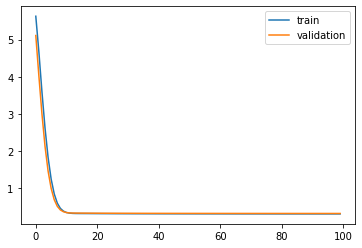

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 13s - loss: 5.6276 - acc: 0.6183 - val_loss: 5.1025 - val_acc: 0.8114

Epoch 00001: val_loss improved from inf to 5.10249, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.6730 - acc: 0.8408 - val_loss: 4.0108 - val_acc: 0.8676

Epoch 00002: val_loss improved from 5.10249 to 4.01084, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.5995 - acc: 0.8679 - val_loss: 2.9813 - val_acc: 0.8733

Epoch 00003: val_loss improved from 4.01084 to 2.98133, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.6266 - acc: 0.8727 - val_loss: 2.1089 - val_acc: 0.8756

Epoch 00004: val_loss improved from 2.98133 to 2.10889, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.8345 - acc: 0.8743 - val_loss: 1.4432 - val_acc: 0.8773

Epoch 00005: val_loss improved from 2.10889 to 1.44324, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.2499 - acc: 0.8751 - 

 - 1s - loss: 0.3201 - acc: 0.8785 - val_loss: 0.3207 - val_acc: 0.8790

Epoch 00046: val_loss improved from 0.32082 to 0.32072, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3200 - acc: 0.8785 - val_loss: 0.3206 - val_acc: 0.8789

Epoch 00047: val_loss improved from 0.32072 to 0.32063, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3199 - acc: 0.8784 - val_loss: 0.3205 - val_acc: 0.8790

Epoch 00048: val_loss improved from 0.32063 to 0.32054, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3198 - acc: 0.8786 - val_loss: 0.3204 - val_acc: 0.8790

Epoch 00049: val_loss improved from 0.32054 to 0.32045, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3197 - acc: 0.8786 - val_loss: 0.3204 - val_acc: 0.8791

Epoch 00050: val_loss improved from 0.32045 to 0.32036, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3196 - acc: 0.8787 - val_loss: 0.3203 - val_acc: 0.8790

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31837 to 0.31834, saving model to Event_val_weights5.hdf5
Epoch 92/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3183 - val_acc: 0.8793

Epoch 00092: val_loss improved from 0.31834 to 0.31831, saving model to Event_val_weights5.hdf5
Epoch 93/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3183 - val_acc: 0.8793

Epoch 00093: val_loss improved from 0.31831 to 0.31829, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3183 - val_acc: 0.8793

Epoch 00094: val_loss improved from 0.31829 to 0.31827, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8791 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00095: val_loss improved from 0.31827 to 0.31824, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00096: val_loss improved from 0.31824 to 0.31822, saving model to Event_val_weights

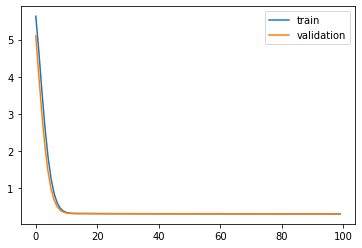

Time to train LSTM:  78.94725775718689
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 13s - loss: 5.6142 - acc: 0.6252 - val_loss: 5.0615 - val_acc: 0.8152

Epoch 00001: val_loss improved from inf to 5.06150, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.6157 - acc: 0.8447 - val_loss: 3.9230 - val_acc: 0.8719

Epoch 00002: val_loss improved from 5.06150 to 3.92302, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.5026 - acc: 0.8682 - val_loss: 2.8581 - val_acc: 0.8761

Epoch 00003: val_loss improved from 3.92302 to 2.85811, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.5038 - acc: 0.8727 - val_loss: 1.9715 - val_acc: 0.8766

Epoch 00004: val_loss improved from 2.85811 to 1.97153, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.7063 - acc: 0.8742 - val_loss: 1.3125 - val_acc: 0.8777

Epoch 00005: val_loss improved from 1.97153 to 1.31250, saving model to Event_val_weights1.hdf5
Epoch 6/10

 - 1s - loss: 0.3205 - acc: 0.8784 - val_loss: 0.3149 - val_acc: 0.8808

Epoch 00046: val_loss improved from 0.31496 to 0.31487, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3204 - acc: 0.8784 - val_loss: 0.3148 - val_acc: 0.8807

Epoch 00047: val_loss improved from 0.31487 to 0.31478, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3202 - acc: 0.8784 - val_loss: 0.3147 - val_acc: 0.8807

Epoch 00048: val_loss improved from 0.31478 to 0.31469, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3201 - acc: 0.8783 - val_loss: 0.3146 - val_acc: 0.8804

Epoch 00049: val_loss improved from 0.31469 to 0.31461, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3200 - acc: 0.8784 - val_loss: 0.3145 - val_acc: 0.8804

Epoch 00050: val_loss improved from 0.31461 to 0.31453, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3199 - acc: 0.8784 - val_loss: 0.3145 - val_acc: 0.8804

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31266 to 0.31263, saving model to Event_val_weights1.hdf5
Epoch 92/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3126 - val_acc: 0.8802

Epoch 00092: val_loss improved from 0.31263 to 0.31260, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8789 - val_loss: 0.3126 - val_acc: 0.8802

Epoch 00093: val_loss improved from 0.31260 to 0.31258, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3176 - acc: 0.8789 - val_loss: 0.3125 - val_acc: 0.8801

Epoch 00094: val_loss improved from 0.31258 to 0.31255, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3125 - val_acc: 0.8802

Epoch 00095: val_loss improved from 0.31255 to 0.31252, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3125 - val_acc: 0.8802

Epoch 00096: val_loss improved from 0.31252 to 0.31249, saving model to Event_val_weights

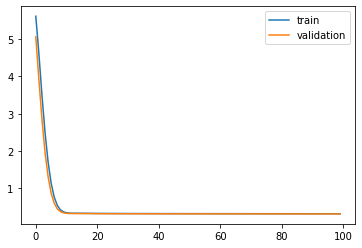

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 13s - loss: 5.6147 - acc: 0.6241 - val_loss: 5.0602 - val_acc: 0.8189

Epoch 00001: val_loss improved from inf to 5.06017, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.6147 - acc: 0.8456 - val_loss: 3.9335 - val_acc: 0.8633

Epoch 00002: val_loss improved from 5.06017 to 3.93349, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.5010 - acc: 0.8689 - val_loss: 2.8746 - val_acc: 0.8709

Epoch 00003: val_loss improved from 3.93349 to 2.87456, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.5022 - acc: 0.8730 - val_loss: 1.9900 - val_acc: 0.8720

Epoch 00004: val_loss improved from 2.87456 to 1.99005, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.7049 - acc: 0.8747 - val_loss: 1.3312 - val_acc: 0.8737

Epoch 00005: val_loss improved from 1.99005 to 1.33116, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.1331 - acc: 0.8757 - 

 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3252 - val_acc: 0.8770

Epoch 00046: val_loss improved from 0.32532 to 0.32522, saving model to Event_val_weights2.hdf5
Epoch 47/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3251 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32522 to 0.32512, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3250 - val_acc: 0.8770

Epoch 00048: val_loss improved from 0.32512 to 0.32503, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3190 - acc: 0.8789 - val_loss: 0.3249 - val_acc: 0.8770

Epoch 00049: val_loss improved from 0.32503 to 0.32493, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8770

Epoch 00050: val_loss improved from 0.32493 to 0.32485, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8770

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32314 to 0.32313, saving model to Event_val_weights2.hdf5
Epoch 92/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00092: val_loss improved from 0.32313 to 0.32311, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8762

Epoch 00093: val_loss improved from 0.32311 to 0.32310, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8762

Epoch 00094: val_loss improved from 0.32310 to 0.32309, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00095: val_loss improved from 0.32309 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8762

Epoch 00096: val_loss improved from 0.32308 to 0.32307, saving model to Event_val_weights

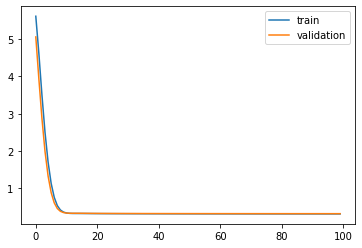

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 13s - loss: 5.6148 - acc: 0.6244 - val_loss: 5.0619 - val_acc: 0.8173

Epoch 00001: val_loss improved from inf to 5.06191, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.6150 - acc: 0.8448 - val_loss: 3.9372 - val_acc: 0.8636

Epoch 00002: val_loss improved from 5.06191 to 3.93721, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.5011 - acc: 0.8691 - val_loss: 2.8782 - val_acc: 0.8703

Epoch 00003: val_loss improved from 3.93721 to 2.87824, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.5022 - acc: 0.8731 - val_loss: 1.9938 - val_acc: 0.8727

Epoch 00004: val_loss improved from 2.87824 to 1.99384, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.7048 - acc: 0.8749 - val_loss: 1.3346 - val_acc: 0.8747

Epoch 00005: val_loss improved from 1.99384 to 1.33455, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.1329 - acc: 0.8756 - 

 - 1s - loss: 0.3193 - acc: 0.8789 - val_loss: 0.3253 - val_acc: 0.8778

Epoch 00046: val_loss improved from 0.32538 to 0.32529, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3192 - acc: 0.8789 - val_loss: 0.3252 - val_acc: 0.8778

Epoch 00047: val_loss improved from 0.32529 to 0.32519, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3251 - val_acc: 0.8779

Epoch 00048: val_loss improved from 0.32519 to 0.32510, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3190 - acc: 0.8790 - val_loss: 0.3250 - val_acc: 0.8778

Epoch 00049: val_loss improved from 0.32510 to 0.32502, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3189 - acc: 0.8790 - val_loss: 0.3249 - val_acc: 0.8777

Epoch 00050: val_loss improved from 0.32502 to 0.32493, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3188 - acc: 0.8790 - val_loss: 0.3249 - val_acc: 0.8777

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32317 to 0.32316, saving model to Event_val_weights3.hdf5
Epoch 92/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8769

Epoch 00092: val_loss improved from 0.32316 to 0.32315, saving model to Event_val_weights3.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8769

Epoch 00093: val_loss improved from 0.32315 to 0.32314, saving model to Event_val_weights3.hdf5
Epoch 94/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8768

Epoch 00094: val_loss improved from 0.32314 to 0.32313, saving model to Event_val_weights3.hdf5
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8769

Epoch 00095: val_loss improved from 0.32313 to 0.32312, saving model to Event_val_weights3.hdf5
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8769

Epoch 00096: val_loss improved from 0.32312 to 0.32311, saving model to Event_val_weights

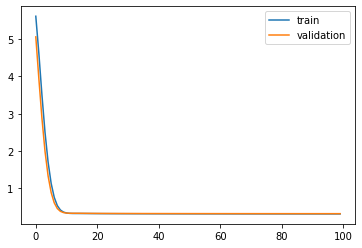

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 14s - loss: 5.6141 - acc: 0.6253 - val_loss: 5.0701 - val_acc: 0.8072

Epoch 00001: val_loss improved from inf to 5.07006, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.6146 - acc: 0.8452 - val_loss: 3.9447 - val_acc: 0.8589

Epoch 00002: val_loss improved from 5.07006 to 3.94475, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.5005 - acc: 0.8696 - val_loss: 2.8874 - val_acc: 0.8651

Epoch 00003: val_loss improved from 3.94475 to 2.88744, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.5014 - acc: 0.8737 - val_loss: 2.0028 - val_acc: 0.8663

Epoch 00004: val_loss improved from 2.88744 to 2.00277, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.7040 - acc: 0.8756 - val_loss: 1.3426 - val_acc: 0.8681

Epoch 00005: val_loss improved from 2.00277 to 1.34262, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.1321 - acc: 0.8762 - 

 - 1s - loss: 0.3188 - acc: 0.8796 - val_loss: 0.3300 - val_acc: 0.8711

Epoch 00046: val_loss improved from 0.33013 to 0.33003, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3187 - acc: 0.8796 - val_loss: 0.3299 - val_acc: 0.8712

Epoch 00047: val_loss improved from 0.33003 to 0.32994, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3186 - acc: 0.8797 - val_loss: 0.3298 - val_acc: 0.8713

Epoch 00048: val_loss improved from 0.32994 to 0.32985, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3185 - acc: 0.8797 - val_loss: 0.3298 - val_acc: 0.8714

Epoch 00049: val_loss improved from 0.32985 to 0.32976, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3184 - acc: 0.8797 - val_loss: 0.3297 - val_acc: 0.8716

Epoch 00050: val_loss improved from 0.32976 to 0.32968, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3183 - acc: 0.8798 - val_loss: 0.3296 - val_acc: 0.8716

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32803 to 0.32802, saving model to Event_val_weights4.hdf5
Epoch 92/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00092: val_loss improved from 0.32802 to 0.32801, saving model to Event_val_weights4.hdf5
Epoch 93/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00093: val_loss improved from 0.32801 to 0.32800, saving model to Event_val_weights4.hdf5
Epoch 94/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00094: val_loss improved from 0.32800 to 0.32799, saving model to Event_val_weights4.hdf5
Epoch 95/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00095: val_loss improved from 0.32799 to 0.32798, saving model to Event_val_weights4.hdf5
Epoch 96/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00096: val_loss improved from 0.32798 to 0.32797, saving model to Event_val_weights

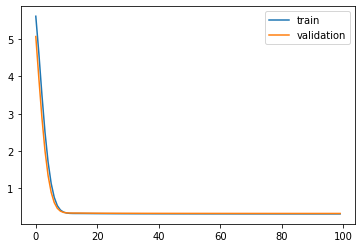

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 14s - loss: 5.6147 - acc: 0.6239 - val_loss: 5.0629 - val_acc: 0.8178

Epoch 00001: val_loss improved from inf to 5.06291, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.6162 - acc: 0.8437 - val_loss: 3.9283 - val_acc: 0.8684

Epoch 00002: val_loss improved from 5.06291 to 3.92829, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.5026 - acc: 0.8687 - val_loss: 2.8651 - val_acc: 0.8736

Epoch 00003: val_loss improved from 3.92829 to 2.86510, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.5032 - acc: 0.8728 - val_loss: 1.9787 - val_acc: 0.8763

Epoch 00004: val_loss improved from 2.86510 to 1.97872, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.7056 - acc: 0.8745 - val_loss: 1.3196 - val_acc: 0.8773

Epoch 00005: val_loss improved from 1.97872 to 1.31964, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.1334 - acc: 0.8754 - 

 - 1s - loss: 0.3198 - acc: 0.8785 - val_loss: 0.3205 - val_acc: 0.8790

Epoch 00046: val_loss improved from 0.32060 to 0.32050, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3197 - acc: 0.8786 - val_loss: 0.3204 - val_acc: 0.8790

Epoch 00047: val_loss improved from 0.32050 to 0.32041, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3196 - acc: 0.8787 - val_loss: 0.3203 - val_acc: 0.8790

Epoch 00048: val_loss improved from 0.32041 to 0.32032, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3195 - acc: 0.8787 - val_loss: 0.3202 - val_acc: 0.8790

Epoch 00049: val_loss improved from 0.32032 to 0.32023, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3194 - acc: 0.8788 - val_loss: 0.3201 - val_acc: 0.8790

Epoch 00050: val_loss improved from 0.32023 to 0.32014, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3201 - val_acc: 0.8789

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31824 to 0.31822, saving model to Event_val_weights5.hdf5
Epoch 92/100
 - 1s - loss: 0.3171 - acc: 0.8791 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00092: val_loss improved from 0.31822 to 0.31820, saving model to Event_val_weights5.hdf5
Epoch 93/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00093: val_loss improved from 0.31820 to 0.31818, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00094: val_loss improved from 0.31818 to 0.31815, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8792

Epoch 00095: val_loss improved from 0.31815 to 0.31814, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8792

Epoch 00096: val_loss improved from 0.31814 to 0.31811, saving model to Event_val_weights

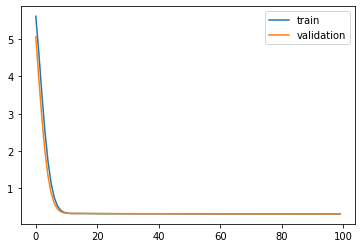

Time to train LSTM:  79.56116724014282
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 14s - loss: 5.5786 - acc: 0.6390 - val_loss: 4.9539 - val_acc: 0.8296

Epoch 00001: val_loss improved from inf to 4.95391, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.4627 - acc: 0.8510 - val_loss: 3.7014 - val_acc: 0.8728

Epoch 00002: val_loss improved from 4.95391 to 3.70139, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.2449 - acc: 0.8700 - val_loss: 2.5533 - val_acc: 0.8760

Epoch 00003: val_loss improved from 3.70139 to 2.55329, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.1853 - acc: 0.8732 - val_loss: 1.6441 - val_acc: 0.8768

Epoch 00004: val_loss improved from 2.55329 to 1.64411, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.3887 - acc: 0.8748 - val_loss: 1.0188 - val_acc: 0.8780

Epoch 00005: val_loss improved from 1.64411 to 1.01881, saving model to Event_val_weights1.hdf5
Epoch 6/10


Epoch 00046: val_loss improved from 0.31442 to 0.31433, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3197 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00047: val_loss improved from 0.31433 to 0.31425, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3196 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00048: val_loss improved from 0.31425 to 0.31417, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3195 - acc: 0.8785 - val_loss: 0.3141 - val_acc: 0.8806

Epoch 00049: val_loss improved from 0.31417 to 0.31409, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3194 - acc: 0.8786 - val_loss: 0.3140 - val_acc: 0.8804

Epoch 00050: val_loss improved from 0.31409 to 0.31402, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3193 - acc: 0.8787 - val_loss: 0.3139 - val_acc: 0.8803

Epoch 00051: val_loss improved from 0.31402 to 0.31395, saving model to Event_val_weights

 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8804

Epoch 00092: val_loss improved from 0.31221 to 0.31219, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8792 - val_loss: 0.3122 - val_acc: 0.8806

Epoch 00093: val_loss improved from 0.31219 to 0.31217, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8806

Epoch 00094: val_loss improved from 0.31217 to 0.31214, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8804

Epoch 00095: val_loss improved from 0.31214 to 0.31213, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8804

Epoch 00096: val_loss improved from 0.31213 to 0.31211, saving model to Event_val_weights1.hdf5
Epoch 97/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8806

Epoch 00097: val_

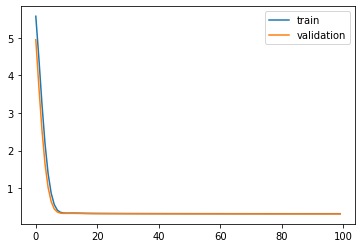

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 14s - loss: 5.5791 - acc: 0.6379 - val_loss: 4.9538 - val_acc: 0.8286

Epoch 00001: val_loss improved from inf to 4.95385, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.4616 - acc: 0.8522 - val_loss: 3.7136 - val_acc: 0.8662

Epoch 00002: val_loss improved from 4.95385 to 3.71362, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.2432 - acc: 0.8705 - val_loss: 2.5709 - val_acc: 0.8710

Epoch 00003: val_loss improved from 3.71362 to 2.57095, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.1838 - acc: 0.8737 - val_loss: 1.6634 - val_acc: 0.8729

Epoch 00004: val_loss improved from 2.57095 to 1.66340, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.3874 - acc: 0.8752 - val_loss: 1.0378 - val_acc: 0.8737

Epoch 00005: val_loss improved from 1.66340 to 1.03779, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 0.8638 - acc: 0.8761 - 

 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00047: val_loss improved from 0.32464 to 0.32455, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00048: val_loss improved from 0.32455 to 0.32446, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8773

Epoch 00049: val_loss improved from 0.32446 to 0.32438, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3243 - val_acc: 0.8772

Epoch 00050: val_loss improved from 0.32438 to 0.32430, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3182 - acc: 0.8790 - val_loss: 0.3242 - val_acc: 0.8771

Epoch 00051: val_loss improved from 0.32430 to 0.32423, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3181 - acc: 0.8790 - val_loss: 0.3242 - val_acc: 0.8771

Epoch 00052: val_

 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8759

Epoch 00094: val_loss did not improve from 0.32314
Epoch 95/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8760

Epoch 00095: val_loss did not improve from 0.32314
Epoch 96/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00096: val_loss did not improve from 0.32314
Epoch 97/100
 - 1s - loss: 0.3166 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00097: val_loss did not improve from 0.32314
Epoch 98/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00098: val_loss did not improve from 0.32314
Epoch 99/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00099: val_loss did not improve from 0.32314
Epoch 100/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8759

Epoch 00100: val_loss did not improve from 0.32314
#################################
Number of units: 16

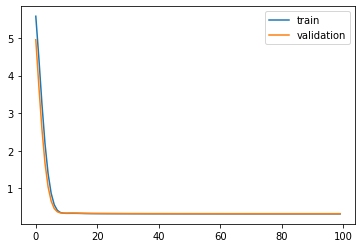

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 14s - loss: 5.5792 - acc: 0.6378 - val_loss: 4.9559 - val_acc: 0.8303

Epoch 00001: val_loss improved from inf to 4.95593, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.4619 - acc: 0.8513 - val_loss: 3.7174 - val_acc: 0.8651

Epoch 00002: val_loss improved from 4.95593 to 3.71741, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.2433 - acc: 0.8706 - val_loss: 2.5747 - val_acc: 0.8709

Epoch 00003: val_loss improved from 3.71741 to 2.57473, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.1838 - acc: 0.8739 - val_loss: 1.6674 - val_acc: 0.8741

Epoch 00004: val_loss improved from 2.57473 to 1.66737, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.3872 - acc: 0.8751 - val_loss: 1.0409 - val_acc: 0.8746

Epoch 00005: val_loss improved from 1.66737 to 1.04094, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 0.8637 - acc: 0.8758 - 

 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3247 - val_acc: 0.8777

Epoch 00047: val_loss improved from 0.32474 to 0.32466, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8777

Epoch 00048: val_loss improved from 0.32466 to 0.32457, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3184 - acc: 0.8789 - val_loss: 0.3245 - val_acc: 0.8776

Epoch 00049: val_loss improved from 0.32457 to 0.32449, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8774

Epoch 00050: val_loss improved from 0.32449 to 0.32442, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3182 - acc: 0.8791 - val_loss: 0.3243 - val_acc: 0.8773

Epoch 00051: val_loss improved from 0.32442 to 0.32435, saving model to Event_val_weights3.hdf5
Epoch 52/100
 - 1s - loss: 0.3181 - acc: 0.8791 - val_loss: 0.3243 - val_acc: 0.8771

Epoch 00052: val_

 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3237 - val_acc: 0.8770

Epoch 00096: val_loss did not improve from 0.32330
Epoch 97/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3237 - val_acc: 0.8769

Epoch 00097: val_loss did not improve from 0.32330
Epoch 98/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3237 - val_acc: 0.8769

Epoch 00098: val_loss did not improve from 0.32330
Epoch 99/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3238 - val_acc: 0.8770

Epoch 00099: val_loss did not improve from 0.32330
Epoch 100/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3238 - val_acc: 0.8769

Epoch 00100: val_loss did not improve from 0.32330
#################################
Number of units: 16
Batch size: 16384
Fold: 2
L2 : 0.05441600579314996
LR: 0.04409593527719614
Decay: 4.3799706705345337e-07
best val loss: 0.323295533657074
#################################


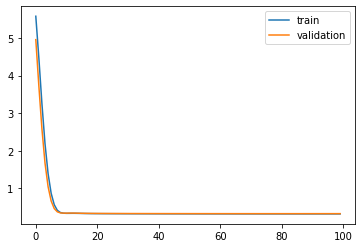

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 15s - loss: 5.5785 - acc: 0.6384 - val_loss: 4.9639 - val_acc: 0.8178

Epoch 00001: val_loss improved from inf to 4.96386, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.4616 - acc: 0.8522 - val_loss: 3.7254 - val_acc: 0.8612

Epoch 00002: val_loss improved from 4.96386 to 3.72536, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.2427 - acc: 0.8712 - val_loss: 2.5840 - val_acc: 0.8658

Epoch 00003: val_loss improved from 3.72536 to 2.58403, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.1830 - acc: 0.8745 - val_loss: 1.6759 - val_acc: 0.8674

Epoch 00004: val_loss improved from 2.58403 to 1.67585, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.3865 - acc: 0.8758 - val_loss: 1.0484 - val_acc: 0.8688

Epoch 00005: val_loss improved from 1.67585 to 1.04837, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 0.8628 - acc: 0.8766 - 

 - 1s - loss: 0.3181 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8712

Epoch 00047: val_loss improved from 0.32947 to 0.32939, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3180 - acc: 0.8798 - val_loss: 0.3293 - val_acc: 0.8712

Epoch 00048: val_loss improved from 0.32939 to 0.32931, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3179 - acc: 0.8798 - val_loss: 0.3292 - val_acc: 0.8711

Epoch 00049: val_loss improved from 0.32931 to 0.32923, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3178 - acc: 0.8798 - val_loss: 0.3292 - val_acc: 0.8712

Epoch 00050: val_loss improved from 0.32923 to 0.32916, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3177 - acc: 0.8799 - val_loss: 0.3291 - val_acc: 0.8711

Epoch 00051: val_loss improved from 0.32916 to 0.32908, saving model to Event_val_weights4.hdf5
Epoch 52/100
 - 1s - loss: 0.3176 - acc: 0.8798 - val_loss: 0.3290 - val_acc: 0.8711

Epoch 00052: val_


Epoch 00095: val_loss did not improve from 0.32810
Epoch 96/100
 - 1s - loss: 0.3160 - acc: 0.8800 - val_loss: 0.3284 - val_acc: 0.8709

Epoch 00096: val_loss did not improve from 0.32810
Epoch 97/100
 - 1s - loss: 0.3160 - acc: 0.8800 - val_loss: 0.3285 - val_acc: 0.8709

Epoch 00097: val_loss did not improve from 0.32810
Epoch 98/100
 - 1s - loss: 0.3160 - acc: 0.8800 - val_loss: 0.3284 - val_acc: 0.8709

Epoch 00098: val_loss did not improve from 0.32810
Epoch 99/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3285 - val_acc: 0.8710

Epoch 00099: val_loss did not improve from 0.32810
Epoch 100/100
 - 1s - loss: 0.3160 - acc: 0.8802 - val_loss: 0.3286 - val_acc: 0.8710

Epoch 00100: val_loss did not improve from 0.32810
#################################
Number of units: 16
Batch size: 16384
Fold: 3
L2 : 0.05441600579314996
LR: 0.04409593527719614
Decay: 4.3799706705345337e-07
best val loss: 0.3280960023403168
#################################


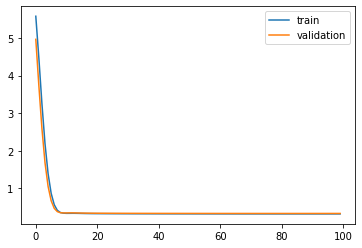

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 15s - loss: 5.5792 - acc: 0.6375 - val_loss: 4.9558 - val_acc: 0.8308

Epoch 00001: val_loss improved from inf to 4.95576, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.4633 - acc: 0.8508 - val_loss: 3.7072 - val_acc: 0.8700

Epoch 00002: val_loss improved from 4.95576 to 3.70721, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.2448 - acc: 0.8700 - val_loss: 2.5605 - val_acc: 0.8742

Epoch 00003: val_loss improved from 3.70721 to 2.56051, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.1847 - acc: 0.8735 - val_loss: 1.6514 - val_acc: 0.8776

Epoch 00004: val_loss improved from 2.56051 to 1.65138, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.3879 - acc: 0.8748 - val_loss: 1.0261 - val_acc: 0.8772

Epoch 00005: val_loss improved from 1.65138 to 1.02611, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 0.8639 - acc: 0.8756 - 


Epoch 00046: val_loss improved from 0.32003 to 0.31994, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3198 - val_acc: 0.8788

Epoch 00047: val_loss improved from 0.31994 to 0.31985, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3190 - acc: 0.8788 - val_loss: 0.3198 - val_acc: 0.8791

Epoch 00048: val_loss improved from 0.31985 to 0.31976, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3189 - acc: 0.8788 - val_loss: 0.3197 - val_acc: 0.8791

Epoch 00049: val_loss improved from 0.31976 to 0.31968, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3196 - val_acc: 0.8792

Epoch 00050: val_loss improved from 0.31968 to 0.31960, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3195 - val_acc: 0.8793

Epoch 00051: val_loss improved from 0.31960 to 0.31953, saving model to Event_val_weights

 - 1s - loss: 0.3172 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00093: val_loss improved from 0.31806 to 0.31803, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3173 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00094: val_loss did not improve from 0.31803
Epoch 95/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00095: val_loss did not improve from 0.31803
Epoch 96/100
 - 1s - loss: 0.3173 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8793

Epoch 00096: val_loss improved from 0.31803 to 0.31802, saving model to Event_val_weights5.hdf5
Epoch 97/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00097: val_loss did not improve from 0.31802
Epoch 98/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8792

Epoch 00098: val_loss did not improve from 0.31802
Epoch 99/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00099: va

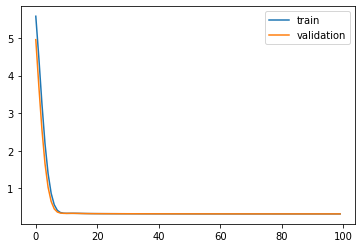

Time to train LSTM:  80.5428478717804
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 16s - loss: 5.6185 - acc: 0.6231 - val_loss: 5.0748 - val_acc: 0.8134

Epoch 00001: val_loss improved from inf to 5.07479, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.6347 - acc: 0.8437 - val_loss: 3.9506 - val_acc: 0.8719

Epoch 00002: val_loss improved from 5.07479 to 3.95064, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.5349 - acc: 0.8679 - val_loss: 2.8968 - val_acc: 0.8763

Epoch 00003: val_loss improved from 3.95064 to 2.89680, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.5447 - acc: 0.8726 - val_loss: 2.0145 - val_acc: 0.8763

Epoch 00004: val_loss improved from 2.89680 to 2.01453, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.7487 - acc: 0.8742 - val_loss: 1.3529 - val_acc: 0.8777

Epoch 00005: val_loss improved from 2.01453 to 1.35292, saving model to Event_val_weights1.hdf5
Epoch 6/100

 - 1s - loss: 0.3206 - acc: 0.8783 - val_loss: 0.3149 - val_acc: 0.8808

Epoch 00046: val_loss improved from 0.31503 to 0.31493, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3204 - acc: 0.8784 - val_loss: 0.3148 - val_acc: 0.8808

Epoch 00047: val_loss improved from 0.31493 to 0.31485, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3203 - acc: 0.8784 - val_loss: 0.3148 - val_acc: 0.8807

Epoch 00048: val_loss improved from 0.31485 to 0.31476, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3202 - acc: 0.8784 - val_loss: 0.3147 - val_acc: 0.8807

Epoch 00049: val_loss improved from 0.31476 to 0.31468, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3201 - acc: 0.8783 - val_loss: 0.3146 - val_acc: 0.8804

Epoch 00050: val_loss improved from 0.31468 to 0.31460, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3200 - acc: 0.8784 - val_loss: 0.3145 - val_acc: 0.8804

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31271 to 0.31268, saving model to Event_val_weights1.hdf5
Epoch 92/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3127 - val_acc: 0.8803

Epoch 00092: val_loss improved from 0.31268 to 0.31266, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3126 - val_acc: 0.8802

Epoch 00093: val_loss improved from 0.31266 to 0.31263, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3126 - val_acc: 0.8802

Epoch 00094: val_loss improved from 0.31263 to 0.31260, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3176 - acc: 0.8789 - val_loss: 0.3126 - val_acc: 0.8802

Epoch 00095: val_loss improved from 0.31260 to 0.31257, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3176 - acc: 0.8789 - val_loss: 0.3125 - val_acc: 0.8801

Epoch 00096: val_loss improved from 0.31257 to 0.31255, saving model to Event_val_weights

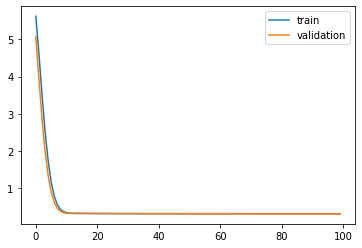

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 16s - loss: 5.6191 - acc: 0.6222 - val_loss: 5.0733 - val_acc: 0.8163

Epoch 00001: val_loss improved from inf to 5.07330, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.6337 - acc: 0.8448 - val_loss: 3.9609 - val_acc: 0.8627

Epoch 00002: val_loss improved from 5.07330 to 3.96088, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.5333 - acc: 0.8687 - val_loss: 2.9131 - val_acc: 0.8708

Epoch 00003: val_loss improved from 3.96088 to 2.91309, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.5431 - acc: 0.8729 - val_loss: 2.0329 - val_acc: 0.8720

Epoch 00004: val_loss improved from 2.91309 to 2.03293, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.7473 - acc: 0.8747 - val_loss: 1.3715 - val_acc: 0.8739

Epoch 00005: val_loss improved from 2.03293 to 1.37153, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.1710 - acc: 0.8757 - 

 - 1s - loss: 0.3194 - acc: 0.8787 - val_loss: 0.3253 - val_acc: 0.8771

Epoch 00046: val_loss improved from 0.32540 to 0.32530, saving model to Event_val_weights2.hdf5
Epoch 47/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3252 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32530 to 0.32520, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3251 - val_acc: 0.8770

Epoch 00048: val_loss improved from 0.32520 to 0.32510, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3250 - val_acc: 0.8770

Epoch 00049: val_loss improved from 0.32510 to 0.32501, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3190 - acc: 0.8789 - val_loss: 0.3249 - val_acc: 0.8770

Epoch 00050: val_loss improved from 0.32501 to 0.32492, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8770

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32316 to 0.32315, saving model to Event_val_weights2.hdf5
Epoch 92/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8764

Epoch 00092: val_loss improved from 0.32315 to 0.32313, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8793 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00093: val_loss improved from 0.32313 to 0.32312, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00094: val_loss improved from 0.32312 to 0.32310, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00095: val_loss improved from 0.32310 to 0.32309, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00096: val_loss improved from 0.32309 to 0.32308, saving model to Event_val_weights

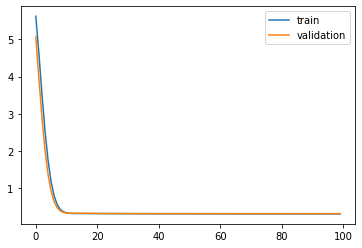

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7feabcc5a550>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 16s - loss: 5.6192 - acc: 0.6230 - val_loss: 5.0750 - val_acc: 0.8161

Epoch 00001: val_loss improved from inf to 5.07501, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.6340 - acc: 0.8438 - val_loss: 3.9646 - val_acc: 0.8632

Epoch 00002: val_loss improved from 5.07501 to 3.96459, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.5334 - acc: 0.8689 - val_loss: 2.9168 - val_acc: 0.8700

Epoch 00003: val_loss improved from 3.96459 to 2.91676, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.5431 - acc: 0.8730 - val_loss: 2.0367 - val_acc: 0.8726

Epoch 00004: val_loss improved from 2.91676 to 2.03671, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.7472 - acc: 0.8748 - val_loss: 1.3749 - val_acc: 0.8747

Epoch 00005: val_loss improved from 2.03671 to 1.37494, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.1708 - acc: 0.8755 - 

 - 1s - loss: 0.3194 - acc: 0.8789 - val_loss: 0.3254 - val_acc: 0.8778

Epoch 00046: val_loss improved from 0.32546 to 0.32536, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3193 - acc: 0.8789 - val_loss: 0.3253 - val_acc: 0.8778

Epoch 00047: val_loss improved from 0.32536 to 0.32527, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3192 - acc: 0.8789 - val_loss: 0.3252 - val_acc: 0.8778

Epoch 00048: val_loss improved from 0.32527 to 0.32517, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3251 - val_acc: 0.8779

Epoch 00049: val_loss improved from 0.32517 to 0.32509, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3190 - acc: 0.8790 - val_loss: 0.3250 - val_acc: 0.8778

Epoch 00050: val_loss improved from 0.32509 to 0.32500, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3189 - acc: 0.8790 - val_loss: 0.3249 - val_acc: 0.8777

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32319 to 0.32317, saving model to Event_val_weights3.hdf5
Epoch 92/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8768

Epoch 00092: val_loss improved from 0.32317 to 0.32316, saving model to Event_val_weights3.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8768

Epoch 00093: val_loss improved from 0.32316 to 0.32314, saving model to Event_val_weights3.hdf5
Epoch 94/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8769

Epoch 00094: val_loss improved from 0.32314 to 0.32313, saving model to Event_val_weights3.hdf5
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8768

Epoch 00095: val_loss improved from 0.32313 to 0.32312, saving model to Event_val_weights3.hdf5
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8769

Epoch 00096: val_loss improved from 0.32312 to 0.32311, saving model to Event_val_weights

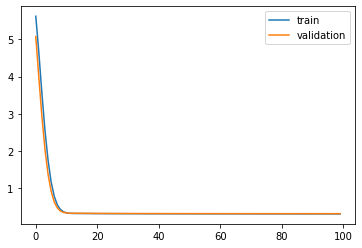

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 16s - loss: 5.6185 - acc: 0.6234 - val_loss: 5.0832 - val_acc: 0.8057

Epoch 00001: val_loss improved from inf to 5.08318, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.6336 - acc: 0.8443 - val_loss: 3.9721 - val_acc: 0.8588

Epoch 00002: val_loss improved from 5.08318 to 3.97208, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.5329 - acc: 0.8694 - val_loss: 2.9259 - val_acc: 0.8651

Epoch 00003: val_loss improved from 3.97208 to 2.92593, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.5423 - acc: 0.8737 - val_loss: 2.0457 - val_acc: 0.8666

Epoch 00004: val_loss improved from 2.92593 to 2.04567, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.7464 - acc: 0.8755 - val_loss: 1.3831 - val_acc: 0.8678

Epoch 00005: val_loss improved from 2.04567 to 1.38308, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.1700 - acc: 0.8762 - 

 - 1s - loss: 0.3189 - acc: 0.8797 - val_loss: 0.3301 - val_acc: 0.8711

Epoch 00046: val_loss improved from 0.33020 to 0.33010, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3188 - acc: 0.8796 - val_loss: 0.3300 - val_acc: 0.8711

Epoch 00047: val_loss improved from 0.33010 to 0.33001, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3187 - acc: 0.8796 - val_loss: 0.3299 - val_acc: 0.8712

Epoch 00048: val_loss improved from 0.33001 to 0.32992, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3186 - acc: 0.8797 - val_loss: 0.3298 - val_acc: 0.8714

Epoch 00049: val_loss improved from 0.32992 to 0.32983, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3185 - acc: 0.8797 - val_loss: 0.3297 - val_acc: 0.8714

Epoch 00050: val_loss improved from 0.32983 to 0.32975, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3184 - acc: 0.8798 - val_loss: 0.3297 - val_acc: 0.8716

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32805 to 0.32804, saving model to Event_val_weights4.hdf5
Epoch 92/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00092: val_loss improved from 0.32804 to 0.32802, saving model to Event_val_weights4.hdf5
Epoch 93/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00093: val_loss improved from 0.32802 to 0.32801, saving model to Event_val_weights4.hdf5
Epoch 94/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00094: val_loss improved from 0.32801 to 0.32800, saving model to Event_val_weights4.hdf5
Epoch 95/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00095: val_loss improved from 0.32800 to 0.32799, saving model to Event_val_weights4.hdf5
Epoch 96/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00096: val_loss improved from 0.32799 to 0.32798, saving model to Event_val_weights

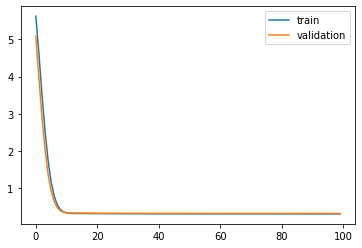

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 17s - loss: 5.6191 - acc: 0.6221 - val_loss: 5.0761 - val_acc: 0.8160

Epoch 00001: val_loss improved from inf to 5.07615, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.6352 - acc: 0.8428 - val_loss: 3.9558 - val_acc: 0.8681

Epoch 00002: val_loss improved from 5.07615 to 3.95584, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.5349 - acc: 0.8685 - val_loss: 2.9038 - val_acc: 0.8737

Epoch 00003: val_loss improved from 3.95584 to 2.90375, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.5442 - acc: 0.8728 - val_loss: 2.0217 - val_acc: 0.8759

Epoch 00004: val_loss improved from 2.90375 to 2.02170, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.7480 - acc: 0.8744 - val_loss: 1.3601 - val_acc: 0.8771

Epoch 00005: val_loss improved from 2.02170 to 1.36005, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.1713 - acc: 0.8752 - 

 - 1s - loss: 0.3199 - acc: 0.8785 - val_loss: 0.3206 - val_acc: 0.8790

Epoch 00046: val_loss improved from 0.32067 to 0.32057, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3198 - acc: 0.8785 - val_loss: 0.3205 - val_acc: 0.8790

Epoch 00047: val_loss improved from 0.32057 to 0.32048, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3197 - acc: 0.8786 - val_loss: 0.3204 - val_acc: 0.8791

Epoch 00048: val_loss improved from 0.32048 to 0.32039, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3196 - acc: 0.8787 - val_loss: 0.3203 - val_acc: 0.8790

Epoch 00049: val_loss improved from 0.32039 to 0.32030, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3195 - acc: 0.8787 - val_loss: 0.3202 - val_acc: 0.8790

Epoch 00050: val_loss improved from 0.32030 to 0.32022, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3194 - acc: 0.8788 - val_loss: 0.3201 - val_acc: 0.8790

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31828 to 0.31826, saving model to Event_val_weights5.hdf5
Epoch 92/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00092: val_loss improved from 0.31826 to 0.31823, saving model to Event_val_weights5.hdf5
Epoch 93/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00093: val_loss improved from 0.31823 to 0.31821, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00094: val_loss improved from 0.31821 to 0.31819, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00095: val_loss improved from 0.31819 to 0.31817, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00096: val_loss improved from 0.31817 to 0.31815, saving model to Event_val_weights

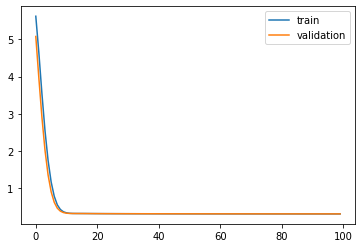

Time to train LSTM:  83.34775829315186
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 17s - loss: 5.6047 - acc: 0.6288 - val_loss: 5.0326 - val_acc: 0.8207

Epoch 00001: val_loss improved from inf to 5.03261, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.5745 - acc: 0.8467 - val_loss: 3.8632 - val_acc: 0.8718

Epoch 00002: val_loss improved from 5.03261 to 3.86317, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.4327 - acc: 0.8688 - val_loss: 2.7748 - val_acc: 0.8763

Epoch 00003: val_loss improved from 3.86317 to 2.77478, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.4160 - acc: 0.8730 - val_loss: 1.8800 - val_acc: 0.8763

Epoch 00004: val_loss improved from 2.77478 to 1.87999, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.6165 - acc: 0.8744 - val_loss: 1.2278 - val_acc: 0.8771

Epoch 00005: val_loss improved from 1.87999 to 1.22777, saving model to Event_val_weights1.hdf5
Epoch 6/10

 - 1s - loss: 0.3203 - acc: 0.8784 - val_loss: 0.3147 - val_acc: 0.8807

Epoch 00046: val_loss improved from 0.31481 to 0.31472, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3202 - acc: 0.8783 - val_loss: 0.3146 - val_acc: 0.8807

Epoch 00047: val_loss improved from 0.31472 to 0.31463, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3201 - acc: 0.8783 - val_loss: 0.3145 - val_acc: 0.8804

Epoch 00048: val_loss improved from 0.31463 to 0.31455, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3200 - acc: 0.8784 - val_loss: 0.3145 - val_acc: 0.8807

Epoch 00049: val_loss improved from 0.31455 to 0.31447, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3199 - acc: 0.8784 - val_loss: 0.3144 - val_acc: 0.8807

Epoch 00050: val_loss improved from 0.31447 to 0.31439, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3198 - acc: 0.8784 - val_loss: 0.3143 - val_acc: 0.8806

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31254 to 0.31251, saving model to Event_val_weights1.hdf5
Epoch 92/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3125 - val_acc: 0.8804

Epoch 00092: val_loss improved from 0.31251 to 0.31249, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3125 - val_acc: 0.8804

Epoch 00093: val_loss improved from 0.31249 to 0.31246, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00094: val_loss improved from 0.31246 to 0.31243, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00095: val_loss improved from 0.31243 to 0.31240, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8803

Epoch 00096: val_loss improved from 0.31240 to 0.31238, saving model to Event_val_weights

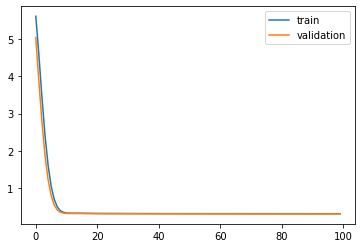

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 16s - loss: 5.6052 - acc: 0.6277 - val_loss: 5.0316 - val_acc: 0.8218

Epoch 00001: val_loss improved from inf to 5.03162, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.5735 - acc: 0.8475 - val_loss: 3.8741 - val_acc: 0.8641

Epoch 00002: val_loss improved from 5.03162 to 3.87414, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.4311 - acc: 0.8695 - val_loss: 2.7916 - val_acc: 0.8707

Epoch 00003: val_loss improved from 3.87414 to 2.79158, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.4144 - acc: 0.8734 - val_loss: 1.8987 - val_acc: 0.8727

Epoch 00004: val_loss improved from 2.79158 to 1.89873, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.6151 - acc: 0.8749 - val_loss: 1.2465 - val_acc: 0.8737

Epoch 00005: val_loss improved from 1.89873 to 1.24654, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.0543 - acc: 0.8759 - 

 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3250 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32505 to 0.32495, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3249 - val_acc: 0.8770

Epoch 00048: val_loss improved from 0.32495 to 0.32486, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8770

Epoch 00049: val_loss improved from 0.32486 to 0.32477, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8771

Epoch 00050: val_loss improved from 0.32477 to 0.32469, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3186 - acc: 0.8789 - val_loss: 0.3246 - val_acc: 0.8770

Epoch 00051: val_loss improved from 0.32469 to 0.32461, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00052: val_


Epoch 00092: val_loss improved from 0.32309 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00093: val_loss improved from 0.32308 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8760

Epoch 00094: val_loss improved from 0.32308 to 0.32307, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8759

Epoch 00095: val_loss improved from 0.32307 to 0.32306, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8758

Epoch 00096: val_loss improved from 0.32306 to 0.32306, saving model to Event_val_weights2.hdf5
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00097: val_loss improved from 0.32306 to 0.32306, saving model to Event_val_weights

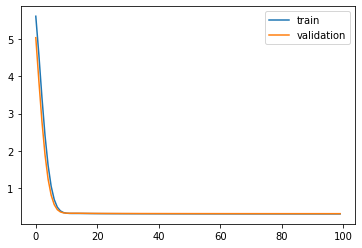

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 17s - loss: 5.6053 - acc: 0.6283 - val_loss: 5.0335 - val_acc: 0.8208

Epoch 00001: val_loss improved from inf to 5.03346, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.5738 - acc: 0.8465 - val_loss: 3.8779 - val_acc: 0.8639

Epoch 00002: val_loss improved from 5.03346 to 3.87789, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.4312 - acc: 0.8695 - val_loss: 2.7953 - val_acc: 0.8709

Epoch 00003: val_loss improved from 3.87789 to 2.79527, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.4144 - acc: 0.8732 - val_loss: 1.9026 - val_acc: 0.8734

Epoch 00004: val_loss improved from 2.79527 to 1.90258, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.6150 - acc: 0.8750 - val_loss: 1.2499 - val_acc: 0.8747

Epoch 00005: val_loss improved from 1.90258 to 1.24989, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.0541 - acc: 0.8756 - 


Epoch 00046: val_loss improved from 0.32523 to 0.32513, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3190 - acc: 0.8790 - val_loss: 0.3250 - val_acc: 0.8779

Epoch 00047: val_loss improved from 0.32513 to 0.32504, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3189 - acc: 0.8790 - val_loss: 0.3249 - val_acc: 0.8777

Epoch 00048: val_loss improved from 0.32504 to 0.32495, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3188 - acc: 0.8790 - val_loss: 0.3249 - val_acc: 0.8776

Epoch 00049: val_loss improved from 0.32495 to 0.32486, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3187 - acc: 0.8790 - val_loss: 0.3248 - val_acc: 0.8776

Epoch 00050: val_loss improved from 0.32486 to 0.32478, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3247 - val_acc: 0.8774

Epoch 00051: val_loss improved from 0.32478 to 0.32470, saving model to Event_val_weights

 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00092: val_loss improved from 0.32316 to 0.32315, saving model to Event_val_weights3.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00093: val_loss improved from 0.32315 to 0.32315, saving model to Event_val_weights3.hdf5
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8770

Epoch 00094: val_loss improved from 0.32315 to 0.32315, saving model to Event_val_weights3.hdf5
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8770

Epoch 00095: val_loss did not improve from 0.32315
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8770

Epoch 00096: val_loss did not improve from 0.32315
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8770

Epoch 00097: val_loss did not improve from 0.32315
Epoch 98/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_lo

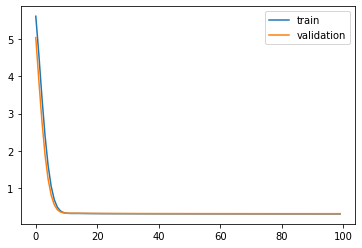

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 17s - loss: 5.6046 - acc: 0.6291 - val_loss: 5.0416 - val_acc: 0.8102

Epoch 00001: val_loss improved from inf to 5.04155, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.5734 - acc: 0.8473 - val_loss: 3.8855 - val_acc: 0.8597

Epoch 00002: val_loss improved from 5.04155 to 3.88552, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.4306 - acc: 0.8700 - val_loss: 2.8045 - val_acc: 0.8658

Epoch 00003: val_loss improved from 3.88552 to 2.80453, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.4136 - acc: 0.8738 - val_loss: 1.9114 - val_acc: 0.8667

Epoch 00004: val_loss improved from 2.80453 to 1.91139, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.6142 - acc: 0.8758 - val_loss: 1.2578 - val_acc: 0.8679

Epoch 00005: val_loss improved from 1.91139 to 1.25779, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.0533 - acc: 0.8762 - 


Epoch 00046: val_loss improved from 0.32997 to 0.32987, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3185 - acc: 0.8797 - val_loss: 0.3298 - val_acc: 0.8714

Epoch 00047: val_loss improved from 0.32987 to 0.32978, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3184 - acc: 0.8797 - val_loss: 0.3297 - val_acc: 0.8716

Epoch 00048: val_loss improved from 0.32978 to 0.32969, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3183 - acc: 0.8798 - val_loss: 0.3296 - val_acc: 0.8716

Epoch 00049: val_loss improved from 0.32969 to 0.32961, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3182 - acc: 0.8798 - val_loss: 0.3295 - val_acc: 0.8714

Epoch 00050: val_loss improved from 0.32961 to 0.32953, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3181 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8717

Epoch 00051: val_loss improved from 0.32953 to 0.32945, saving model to Event_val_weights

 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00092: val_loss improved from 0.32801 to 0.32800, saving model to Event_val_weights4.hdf5
Epoch 93/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00093: val_loss improved from 0.32800 to 0.32800, saving model to Event_val_weights4.hdf5
Epoch 94/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00094: val_loss improved from 0.32800 to 0.32800, saving model to Event_val_weights4.hdf5
Epoch 95/100
 - 1s - loss: 0.3158 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00095: val_loss did not improve from 0.32800
Epoch 96/100
 - 1s - loss: 0.3158 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00096: val_loss did not improve from 0.32800
Epoch 97/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00097: val_loss did not improve from 0.32800
Epoch 98/100
 - 1s - loss: 0.3158 - acc: 0.8802 - val_lo

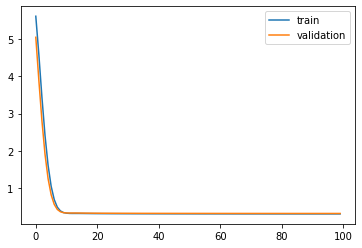

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 17s - loss: 5.6053 - acc: 0.6279 - val_loss: 5.0341 - val_acc: 0.8214

Epoch 00001: val_loss improved from inf to 5.03414, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.5750 - acc: 0.8460 - val_loss: 3.8686 - val_acc: 0.8688

Epoch 00002: val_loss improved from 5.03414 to 3.86860, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.4327 - acc: 0.8689 - val_loss: 2.7818 - val_acc: 0.8736

Epoch 00003: val_loss improved from 3.86860 to 2.78185, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.4154 - acc: 0.8729 - val_loss: 1.8872 - val_acc: 0.8768

Epoch 00004: val_loss improved from 2.78185 to 1.88719, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.6157 - acc: 0.8747 - val_loss: 1.2350 - val_acc: 0.8769

Epoch 00005: val_loss improved from 1.88719 to 1.23495, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.0545 - acc: 0.8754 - 


Epoch 00046: val_loss improved from 0.32044 to 0.32034, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3196 - acc: 0.8787 - val_loss: 0.3202 - val_acc: 0.8790

Epoch 00047: val_loss improved from 0.32034 to 0.32025, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3194 - acc: 0.8788 - val_loss: 0.3202 - val_acc: 0.8790

Epoch 00048: val_loss improved from 0.32025 to 0.32016, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3201 - val_acc: 0.8789

Epoch 00049: val_loss improved from 0.32016 to 0.32007, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3200 - val_acc: 0.8789

Epoch 00050: val_loss improved from 0.32007 to 0.31999, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3199 - val_acc: 0.8789

Epoch 00051: val_loss improved from 0.31999 to 0.31991, saving model to Event_val_weights

 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3182 - val_acc: 0.8791

Epoch 00092: val_loss did not improve from 0.31814
Epoch 93/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8792

Epoch 00093: val_loss improved from 0.31814 to 0.31807, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00094: val_loss did not improve from 0.31807
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8791 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00095: val_loss improved from 0.31807 to 0.31805, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00096: val_loss improved from 0.31805 to 0.31803, saving model to Event_val_weights5.hdf5
Epoch 97/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00097: val_loss did not improve from 0.31803
Epoch 98/100
 - 1s - loss: 0.3170 - acc: 0.8790 - val_lo

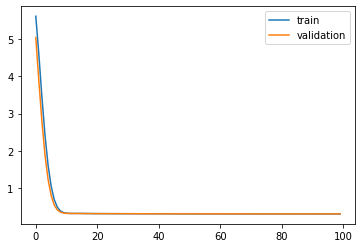

Time to train LSTM:  83.15617871284485
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 18s - loss: 5.5774 - acc: 0.6394 - val_loss: 4.9503 - val_acc: 0.8298

Epoch 00001: val_loss improved from inf to 4.95025, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.4575 - acc: 0.8513 - val_loss: 3.6939 - val_acc: 0.8729

Epoch 00002: val_loss improved from 4.95025 to 3.69392, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.2362 - acc: 0.8699 - val_loss: 2.5432 - val_acc: 0.8759

Epoch 00003: val_loss improved from 3.69392 to 2.54322, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.1749 - acc: 0.8732 - val_loss: 1.6336 - val_acc: 0.8767

Epoch 00004: val_loss improved from 2.54322 to 1.63365, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.3787 - acc: 0.8748 - val_loss: 1.0099 - val_acc: 0.8780

Epoch 00005: val_loss improved from 1.63365 to 1.00988, saving model to Event_val_weights1.hdf5
Epoch 6/10


Epoch 00046: val_loss improved from 0.31440 to 0.31432, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3197 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00047: val_loss improved from 0.31432 to 0.31423, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3196 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00048: val_loss improved from 0.31423 to 0.31415, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3195 - acc: 0.8785 - val_loss: 0.3141 - val_acc: 0.8806

Epoch 00049: val_loss improved from 0.31415 to 0.31408, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3194 - acc: 0.8786 - val_loss: 0.3140 - val_acc: 0.8804

Epoch 00050: val_loss improved from 0.31408 to 0.31400, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3193 - acc: 0.8787 - val_loss: 0.3139 - val_acc: 0.8803

Epoch 00051: val_loss improved from 0.31400 to 0.31393, saving model to Event_val_weights

 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8804

Epoch 00092: val_loss improved from 0.31220 to 0.31218, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3177 - acc: 0.8792 - val_loss: 0.3122 - val_acc: 0.8806

Epoch 00093: val_loss improved from 0.31218 to 0.31216, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8804

Epoch 00094: val_loss improved from 0.31216 to 0.31214, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8804

Epoch 00095: val_loss improved from 0.31214 to 0.31212, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8806

Epoch 00096: val_loss improved from 0.31212 to 0.31210, saving model to Event_val_weights1.hdf5
Epoch 97/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8806

Epoch 00097: val_

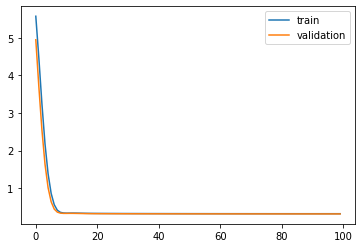

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 18s - loss: 5.5778 - acc: 0.6382 - val_loss: 4.9502 - val_acc: 0.8286

Epoch 00001: val_loss improved from inf to 4.95024, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.4564 - acc: 0.8524 - val_loss: 3.7062 - val_acc: 0.8660

Epoch 00002: val_loss improved from 4.95024 to 3.70621, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.2346 - acc: 0.8705 - val_loss: 2.5609 - val_acc: 0.8710

Epoch 00003: val_loss improved from 3.70621 to 2.56091, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.1734 - acc: 0.8737 - val_loss: 1.6530 - val_acc: 0.8730

Epoch 00004: val_loss improved from 2.56091 to 1.65297, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.3774 - acc: 0.8753 - val_loss: 1.0289 - val_acc: 0.8738

Epoch 00005: val_loss improved from 1.65297 to 1.02887, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 0.8559 - acc: 0.8762 - 

 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00047: val_loss improved from 0.32462 to 0.32453, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8772

Epoch 00048: val_loss improved from 0.32453 to 0.32444, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8773

Epoch 00049: val_loss improved from 0.32444 to 0.32436, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3243 - val_acc: 0.8772

Epoch 00050: val_loss improved from 0.32436 to 0.32429, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3182 - acc: 0.8790 - val_loss: 0.3242 - val_acc: 0.8771

Epoch 00051: val_loss improved from 0.32429 to 0.32421, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3181 - acc: 0.8790 - val_loss: 0.3241 - val_acc: 0.8770

Epoch 00052: val_


Epoch 00094: val_loss did not improve from 0.32315
Epoch 95/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00095: val_loss did not improve from 0.32315
Epoch 96/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00096: val_loss did not improve from 0.32315
Epoch 97/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00097: val_loss did not improve from 0.32315
Epoch 98/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00098: val_loss did not improve from 0.32315
Epoch 99/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8759

Epoch 00099: val_loss did not improve from 0.32315
Epoch 100/100
 - 1s - loss: 0.3166 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8759

Epoch 00100: val_loss did not improve from 0.32315
#################################
Number of units: 16
Batch size: 16384
Fold: 1
L2 : 0.05441600579314996
LR: 0.04431206019689

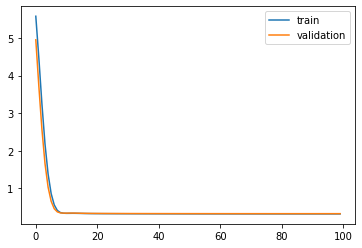

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 18s - loss: 5.5779 - acc: 0.6383 - val_loss: 4.9523 - val_acc: 0.8306

Epoch 00001: val_loss improved from inf to 4.95234, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.4567 - acc: 0.8515 - val_loss: 3.7100 - val_acc: 0.8652

Epoch 00002: val_loss improved from 4.95234 to 3.71000, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.2347 - acc: 0.8706 - val_loss: 2.5647 - val_acc: 0.8708

Epoch 00003: val_loss improved from 3.71000 to 2.56470, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.1734 - acc: 0.8739 - val_loss: 1.6569 - val_acc: 0.8741

Epoch 00004: val_loss improved from 2.56470 to 1.65695, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.3773 - acc: 0.8751 - val_loss: 1.0320 - val_acc: 0.8746

Epoch 00005: val_loss improved from 1.65695 to 1.03200, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 0.8557 - acc: 0.8758 - 

 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8777

Epoch 00047: val_loss improved from 0.32473 to 0.32464, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8777

Epoch 00048: val_loss improved from 0.32464 to 0.32456, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8774

Epoch 00049: val_loss improved from 0.32456 to 0.32448, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8773

Epoch 00050: val_loss improved from 0.32448 to 0.32440, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3182 - acc: 0.8791 - val_loss: 0.3243 - val_acc: 0.8773

Epoch 00051: val_loss improved from 0.32440 to 0.32433, saving model to Event_val_weights3.hdf5
Epoch 52/100
 - 1s - loss: 0.3181 - acc: 0.8791 - val_loss: 0.3243 - val_acc: 0.8772

Epoch 00052: val_

 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3237 - val_acc: 0.8769

Epoch 00096: val_loss did not improve from 0.32330
Epoch 97/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3237 - val_acc: 0.8769

Epoch 00097: val_loss did not improve from 0.32330
Epoch 98/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3238 - val_acc: 0.8770

Epoch 00098: val_loss did not improve from 0.32330
Epoch 99/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3238 - val_acc: 0.8769

Epoch 00099: val_loss did not improve from 0.32330
Epoch 100/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3238 - val_acc: 0.8770

Epoch 00100: val_loss did not improve from 0.32330
#################################
Number of units: 16
Batch size: 16384
Fold: 2
L2 : 0.05441600579314996
LR: 0.04431206019689021
Decay: 7.743668466527487e-07
best val loss: 0.32330188155174255
#################################


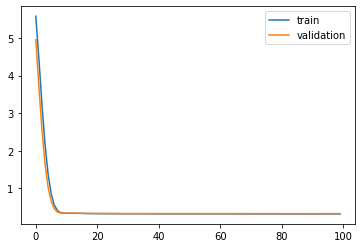

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 18s - loss: 5.5773 - acc: 0.6388 - val_loss: 4.9603 - val_acc: 0.8182

Epoch 00001: val_loss improved from inf to 4.96025, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.4564 - acc: 0.8524 - val_loss: 3.7180 - val_acc: 0.8611

Epoch 00002: val_loss improved from 4.96025 to 3.71797, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.2341 - acc: 0.8713 - val_loss: 2.5740 - val_acc: 0.8658

Epoch 00003: val_loss improved from 3.71797 to 2.57399, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.1726 - acc: 0.8745 - val_loss: 1.6654 - val_acc: 0.8676

Epoch 00004: val_loss improved from 2.57399 to 1.66541, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.3765 - acc: 0.8759 - val_loss: 1.0394 - val_acc: 0.8684

Epoch 00005: val_loss improved from 1.66541 to 1.03942, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 0.8548 - acc: 0.8767 - 

 - 1s - loss: 0.3180 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8712

Epoch 00047: val_loss improved from 0.32946 to 0.32937, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3179 - acc: 0.8798 - val_loss: 0.3293 - val_acc: 0.8712

Epoch 00048: val_loss improved from 0.32937 to 0.32929, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3178 - acc: 0.8798 - val_loss: 0.3292 - val_acc: 0.8711

Epoch 00049: val_loss improved from 0.32929 to 0.32921, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3177 - acc: 0.8798 - val_loss: 0.3291 - val_acc: 0.8712

Epoch 00050: val_loss improved from 0.32921 to 0.32914, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3177 - acc: 0.8798 - val_loss: 0.3291 - val_acc: 0.8711

Epoch 00051: val_loss improved from 0.32914 to 0.32907, saving model to Event_val_weights4.hdf5
Epoch 52/100
 - 1s - loss: 0.3176 - acc: 0.8798 - val_loss: 0.3290 - val_acc: 0.8711

Epoch 00052: val_

 - 1s - loss: 0.3160 - acc: 0.8800 - val_loss: 0.3284 - val_acc: 0.8709

Epoch 00096: val_loss did not improve from 0.32810
Epoch 97/100
 - 1s - loss: 0.3160 - acc: 0.8800 - val_loss: 0.3285 - val_acc: 0.8709

Epoch 00097: val_loss did not improve from 0.32810
Epoch 98/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3285 - val_acc: 0.8710

Epoch 00098: val_loss did not improve from 0.32810
Epoch 99/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3286 - val_acc: 0.8710

Epoch 00099: val_loss did not improve from 0.32810
Epoch 100/100
 - 1s - loss: 0.3160 - acc: 0.8802 - val_loss: 0.3285 - val_acc: 0.8711

Epoch 00100: val_loss did not improve from 0.32810
#################################
Number of units: 16
Batch size: 16384
Fold: 3
L2 : 0.05441600579314996
LR: 0.04431206019689021
Decay: 7.743668466527487e-07
best val loss: 0.32810071110725403
#################################


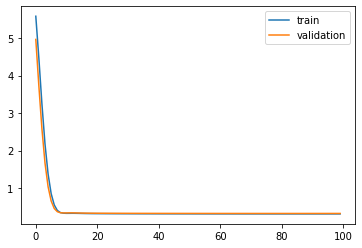

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 18s - loss: 5.5780 - acc: 0.6379 - val_loss: 4.9521 - val_acc: 0.8308

Epoch 00001: val_loss improved from inf to 4.95212, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.4582 - acc: 0.8511 - val_loss: 3.6998 - val_acc: 0.8701

Epoch 00002: val_loss improved from 4.95212 to 3.69976, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.2361 - acc: 0.8700 - val_loss: 2.5504 - val_acc: 0.8742

Epoch 00003: val_loss improved from 3.69976 to 2.55044, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.1743 - acc: 0.8735 - val_loss: 1.6409 - val_acc: 0.8776

Epoch 00004: val_loss improved from 2.55044 to 1.64093, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.3779 - acc: 0.8749 - val_loss: 1.0172 - val_acc: 0.8772

Epoch 00005: val_loss improved from 1.64093 to 1.01719, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 0.8559 - acc: 0.8756 - 


Epoch 00046: val_loss improved from 0.32001 to 0.31992, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3198 - val_acc: 0.8788

Epoch 00047: val_loss improved from 0.31992 to 0.31983, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3190 - acc: 0.8789 - val_loss: 0.3197 - val_acc: 0.8791

Epoch 00048: val_loss improved from 0.31983 to 0.31975, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3189 - acc: 0.8788 - val_loss: 0.3197 - val_acc: 0.8792

Epoch 00049: val_loss improved from 0.31975 to 0.31966, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3196 - val_acc: 0.8792

Epoch 00050: val_loss improved from 0.31966 to 0.31959, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3195 - val_acc: 0.8793

Epoch 00051: val_loss improved from 0.31959 to 0.31951, saving model to Event_val_weights

 - 1s - loss: 0.3173 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00093: val_loss did not improve from 0.31805
Epoch 94/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00094: val_loss did not improve from 0.31805
Epoch 95/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00095: val_loss did not improve from 0.31805
Epoch 96/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00096: val_loss did not improve from 0.31805
Epoch 97/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8793

Epoch 00097: val_loss improved from 0.31805 to 0.31802, saving model to Event_val_weights5.hdf5
Epoch 98/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00098: val_loss did not improve from 0.31802
Epoch 99/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8793

Epoch 00099: val_loss did not improve from 0.31802
Epoch 100

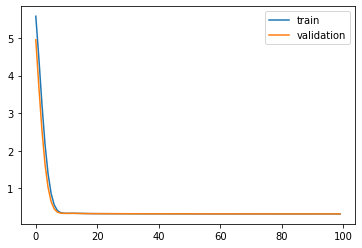

Time to train LSTM:  84.06370186805725
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 18s - loss: 5.6295 - acc: 0.6188 - val_loss: 5.1087 - val_acc: 0.8098

Epoch 00001: val_loss improved from inf to 5.10866, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.6832 - acc: 0.8412 - val_loss: 4.0213 - val_acc: 0.8709

Epoch 00002: val_loss improved from 5.10866 to 4.02130, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.6177 - acc: 0.8675 - val_loss: 2.9964 - val_acc: 0.8761

Epoch 00003: val_loss improved from 4.02130 to 2.99640, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.6505 - acc: 0.8724 - val_loss: 2.1266 - val_acc: 0.8761

Epoch 00004: val_loss improved from 2.99640 to 2.12658, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.8600 - acc: 0.8740 - val_loss: 1.4601 - val_acc: 0.8776

Epoch 00005: val_loss improved from 2.12658 to 1.46014, saving model to Event_val_weights1.hdf5
Epoch 6/10

 - 1s - loss: 0.3208 - acc: 0.8783 - val_loss: 0.3151 - val_acc: 0.8808

Epoch 00046: val_loss improved from 0.31521 to 0.31512, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3207 - acc: 0.8783 - val_loss: 0.3150 - val_acc: 0.8808

Epoch 00047: val_loss improved from 0.31512 to 0.31503, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3206 - acc: 0.8783 - val_loss: 0.3149 - val_acc: 0.8808

Epoch 00048: val_loss improved from 0.31503 to 0.31494, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3204 - acc: 0.8784 - val_loss: 0.3149 - val_acc: 0.8808

Epoch 00049: val_loss improved from 0.31494 to 0.31486, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3203 - acc: 0.8784 - val_loss: 0.3148 - val_acc: 0.8807

Epoch 00050: val_loss improved from 0.31486 to 0.31478, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3202 - acc: 0.8784 - val_loss: 0.3147 - val_acc: 0.8807

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31285 to 0.31283, saving model to Event_val_weights1.hdf5
Epoch 92/100
 - 1s - loss: 0.3178 - acc: 0.8790 - val_loss: 0.3128 - val_acc: 0.8803

Epoch 00092: val_loss improved from 0.31283 to 0.31280, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3178 - acc: 0.8790 - val_loss: 0.3128 - val_acc: 0.8803

Epoch 00093: val_loss improved from 0.31280 to 0.31277, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3127 - val_acc: 0.8804

Epoch 00094: val_loss improved from 0.31277 to 0.31274, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3127 - val_acc: 0.8802

Epoch 00095: val_loss improved from 0.31274 to 0.31271, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3127 - val_acc: 0.8802

Epoch 00096: val_loss improved from 0.31271 to 0.31269, saving model to Event_val_weights

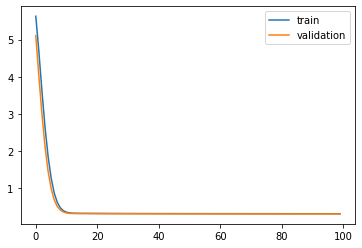

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 18s - loss: 5.6301 - acc: 0.6177 - val_loss: 5.1068 - val_acc: 0.8134

Epoch 00001: val_loss improved from inf to 5.10677, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.6823 - acc: 0.8417 - val_loss: 4.0309 - val_acc: 0.8624

Epoch 00002: val_loss improved from 5.10677 to 4.03091, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.6162 - acc: 0.8681 - val_loss: 3.0122 - val_acc: 0.8702

Epoch 00003: val_loss improved from 4.03091 to 3.01223, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.6489 - acc: 0.8726 - val_loss: 2.1447 - val_acc: 0.8720

Epoch 00004: val_loss improved from 3.01223 to 2.14468, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.8586 - acc: 0.8745 - val_loss: 1.4786 - val_acc: 0.8739

Epoch 00005: val_loss improved from 2.14468 to 1.47860, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.2723 - acc: 0.8756 - 

 - 1s - loss: 0.3196 - acc: 0.8788 - val_loss: 0.3255 - val_acc: 0.8770

Epoch 00046: val_loss improved from 0.32561 to 0.32551, saving model to Event_val_weights2.hdf5
Epoch 47/100
 - 1s - loss: 0.3195 - acc: 0.8788 - val_loss: 0.3254 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32551 to 0.32540, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3194 - acc: 0.8788 - val_loss: 0.3253 - val_acc: 0.8770

Epoch 00048: val_loss improved from 0.32540 to 0.32531, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3252 - val_acc: 0.8769

Epoch 00049: val_loss improved from 0.32531 to 0.32521, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3251 - val_acc: 0.8769

Epoch 00050: val_loss improved from 0.32521 to 0.32512, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3250 - val_acc: 0.8769

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32324 to 0.32322, saving model to Event_val_weights2.hdf5
Epoch 92/100
 - 1s - loss: 0.3167 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8766

Epoch 00092: val_loss improved from 0.32322 to 0.32320, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8764

Epoch 00093: val_loss improved from 0.32320 to 0.32318, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8766

Epoch 00094: val_loss improved from 0.32318 to 0.32316, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8766

Epoch 00095: val_loss improved from 0.32316 to 0.32315, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8766

Epoch 00096: val_loss improved from 0.32315 to 0.32313, saving model to Event_val_weights

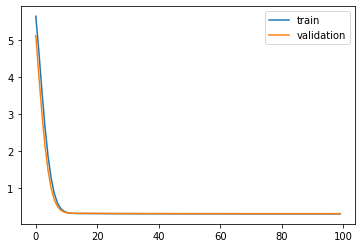

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 19s - loss: 5.6302 - acc: 0.6180 - val_loss: 5.1084 - val_acc: 0.8129

Epoch 00001: val_loss improved from inf to 5.10837, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.6825 - acc: 0.8407 - val_loss: 4.0346 - val_acc: 0.8628

Epoch 00002: val_loss improved from 5.10837 to 4.03458, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.6162 - acc: 0.8682 - val_loss: 3.0159 - val_acc: 0.8697

Epoch 00003: val_loss improved from 4.03458 to 3.01591, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.6490 - acc: 0.8728 - val_loss: 2.1484 - val_acc: 0.8717

Epoch 00004: val_loss improved from 3.01591 to 2.14841, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.8585 - acc: 0.8746 - val_loss: 1.4820 - val_acc: 0.8748

Epoch 00005: val_loss improved from 2.14841 to 1.48204, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.2722 - acc: 0.8754 - 

 - 1s - loss: 0.3196 - acc: 0.8790 - val_loss: 0.3256 - val_acc: 0.8778

Epoch 00046: val_loss improved from 0.32565 to 0.32555, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3195 - acc: 0.8790 - val_loss: 0.3255 - val_acc: 0.8778

Epoch 00047: val_loss improved from 0.32555 to 0.32546, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3194 - acc: 0.8789 - val_loss: 0.3254 - val_acc: 0.8778

Epoch 00048: val_loss improved from 0.32546 to 0.32536, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3253 - val_acc: 0.8778

Epoch 00049: val_loss improved from 0.32536 to 0.32528, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3252 - val_acc: 0.8778

Epoch 00050: val_loss improved from 0.32528 to 0.32519, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3251 - val_acc: 0.8778

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32326 to 0.32324, saving model to Event_val_weights3.hdf5
Epoch 92/100
 - 1s - loss: 0.3167 - acc: 0.8793 - val_loss: 0.3232 - val_acc: 0.8764

Epoch 00092: val_loss improved from 0.32324 to 0.32322, saving model to Event_val_weights3.hdf5
Epoch 93/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8764

Epoch 00093: val_loss improved from 0.32322 to 0.32320, saving model to Event_val_weights3.hdf5
Epoch 94/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8766

Epoch 00094: val_loss improved from 0.32320 to 0.32318, saving model to Event_val_weights3.hdf5
Epoch 95/100
 - 1s - loss: 0.3166 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8767

Epoch 00095: val_loss improved from 0.32318 to 0.32316, saving model to Event_val_weights3.hdf5
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8768

Epoch 00096: val_loss improved from 0.32316 to 0.32314, saving model to Event_val_weights

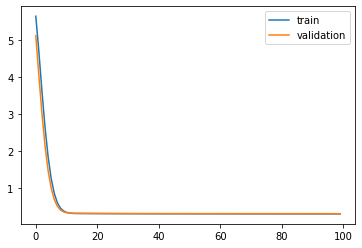

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 19s - loss: 5.6295 - acc: 0.6186 - val_loss: 5.1166 - val_acc: 0.8007

Epoch 00001: val_loss improved from inf to 5.11660, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.6821 - acc: 0.8414 - val_loss: 4.0420 - val_acc: 0.8574

Epoch 00002: val_loss improved from 5.11660 to 4.04198, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.6157 - acc: 0.8688 - val_loss: 3.0250 - val_acc: 0.8648

Epoch 00003: val_loss improved from 4.04198 to 3.02497, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.6481 - acc: 0.8735 - val_loss: 2.1575 - val_acc: 0.8669

Epoch 00004: val_loss improved from 3.02497 to 2.15747, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.8577 - acc: 0.8752 - val_loss: 1.4904 - val_acc: 0.8677

Epoch 00005: val_loss improved from 2.15747 to 1.49035, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.2714 - acc: 0.8762 - 

 - 1s - loss: 0.3191 - acc: 0.8796 - val_loss: 0.3303 - val_acc: 0.8711

Epoch 00046: val_loss improved from 0.33040 to 0.33030, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3190 - acc: 0.8796 - val_loss: 0.3302 - val_acc: 0.8711

Epoch 00047: val_loss improved from 0.33030 to 0.33020, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3189 - acc: 0.8796 - val_loss: 0.3301 - val_acc: 0.8712

Epoch 00048: val_loss improved from 0.33020 to 0.33011, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3188 - acc: 0.8796 - val_loss: 0.3300 - val_acc: 0.8712

Epoch 00049: val_loss improved from 0.33011 to 0.33002, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3187 - acc: 0.8796 - val_loss: 0.3299 - val_acc: 0.8712

Epoch 00050: val_loss improved from 0.33002 to 0.32994, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3186 - acc: 0.8797 - val_loss: 0.3299 - val_acc: 0.8713

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32812 to 0.32810, saving model to Event_val_weights4.hdf5
Epoch 92/100
 - 1s - loss: 0.3161 - acc: 0.8800 - val_loss: 0.3281 - val_acc: 0.8714

Epoch 00092: val_loss improved from 0.32810 to 0.32808, saving model to Event_val_weights4.hdf5
Epoch 93/100
 - 1s - loss: 0.3161 - acc: 0.8800 - val_loss: 0.3281 - val_acc: 0.8714

Epoch 00093: val_loss improved from 0.32808 to 0.32807, saving model to Event_val_weights4.hdf5
Epoch 94/100
 - 1s - loss: 0.3161 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00094: val_loss improved from 0.32807 to 0.32805, saving model to Event_val_weights4.hdf5
Epoch 95/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00095: val_loss improved from 0.32805 to 0.32803, saving model to Event_val_weights4.hdf5
Epoch 96/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00096: val_loss improved from 0.32803 to 0.32802, saving model to Event_val_weights

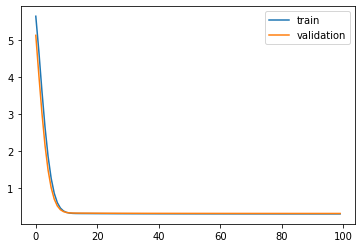

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 19s - loss: 5.6300 - acc: 0.6172 - val_loss: 5.1099 - val_acc: 0.8101

Epoch 00001: val_loss improved from inf to 5.10987, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.6837 - acc: 0.8402 - val_loss: 4.0263 - val_acc: 0.8674

Epoch 00002: val_loss improved from 5.10987 to 4.02631, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.6177 - acc: 0.8677 - val_loss: 3.0032 - val_acc: 0.8733

Epoch 00003: val_loss improved from 4.02631 to 3.00324, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.6500 - acc: 0.8727 - val_loss: 2.1337 - val_acc: 0.8756

Epoch 00004: val_loss improved from 3.00324 to 2.13374, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.8593 - acc: 0.8743 - val_loss: 1.4672 - val_acc: 0.8773

Epoch 00005: val_loss improved from 2.13374 to 1.46723, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.2727 - acc: 0.8751 - 

 - 1s - loss: 0.3202 - acc: 0.8784 - val_loss: 0.3208 - val_acc: 0.8792

Epoch 00046: val_loss improved from 0.32086 to 0.32076, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3200 - acc: 0.8784 - val_loss: 0.3207 - val_acc: 0.8790

Epoch 00047: val_loss improved from 0.32076 to 0.32067, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3199 - acc: 0.8784 - val_loss: 0.3206 - val_acc: 0.8789

Epoch 00048: val_loss improved from 0.32067 to 0.32058, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3198 - acc: 0.8785 - val_loss: 0.3205 - val_acc: 0.8790

Epoch 00049: val_loss improved from 0.32058 to 0.32049, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3197 - acc: 0.8786 - val_loss: 0.3204 - val_acc: 0.8790

Epoch 00050: val_loss improved from 0.32049 to 0.32040, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3196 - acc: 0.8786 - val_loss: 0.3203 - val_acc: 0.8791

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31839 to 0.31837, saving model to Event_val_weights5.hdf5
Epoch 92/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3183 - val_acc: 0.8793

Epoch 00092: val_loss improved from 0.31837 to 0.31834, saving model to Event_val_weights5.hdf5
Epoch 93/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3183 - val_acc: 0.8793

Epoch 00093: val_loss improved from 0.31834 to 0.31832, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3183 - val_acc: 0.8793

Epoch 00094: val_loss improved from 0.31832 to 0.31829, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3183 - val_acc: 0.8793

Epoch 00095: val_loss improved from 0.31829 to 0.31827, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8791 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00096: val_loss improved from 0.31827 to 0.31824, saving model to Event_val_weights

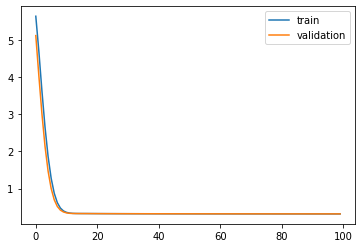

Time to train LSTM:  85.74010443687439
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 20s - loss: 5.5962 - acc: 0.6325 - val_loss: 5.0068 - val_acc: 0.8244

Epoch 00001: val_loss improved from inf to 5.00678, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.5377 - acc: 0.8485 - val_loss: 3.8099 - val_acc: 0.8717

Epoch 00002: val_loss improved from 5.00678 to 3.80987, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.3707 - acc: 0.8693 - val_loss: 2.7012 - val_acc: 0.8760

Epoch 00003: val_loss improved from 3.80987 to 2.70118, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.3389 - acc: 0.8731 - val_loss: 1.8004 - val_acc: 0.8766

Epoch 00004: val_loss improved from 2.70118 to 1.80037, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.5390 - acc: 0.8746 - val_loss: 1.1557 - val_acc: 0.8777

Epoch 00005: val_loss improved from 1.80037 to 1.15568, saving model to Event_val_weights1.hdf5
Epoch 6/10


Epoch 00046: val_loss improved from 0.31468 to 0.31459, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3200 - acc: 0.8784 - val_loss: 0.3145 - val_acc: 0.8807

Epoch 00047: val_loss improved from 0.31459 to 0.31450, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3199 - acc: 0.8784 - val_loss: 0.3144 - val_acc: 0.8807

Epoch 00048: val_loss improved from 0.31450 to 0.31442, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3198 - acc: 0.8784 - val_loss: 0.3143 - val_acc: 0.8806

Epoch 00049: val_loss improved from 0.31442 to 0.31434, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3197 - acc: 0.8785 - val_loss: 0.3143 - val_acc: 0.8806

Epoch 00050: val_loss improved from 0.31434 to 0.31426, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3196 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00051: val_loss improved from 0.31426 to 0.31419, saving model to Event_val_weights

 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8803

Epoch 00092: val_loss improved from 0.31241 to 0.31238, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00093: val_loss improved from 0.31238 to 0.31236, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8803

Epoch 00094: val_loss improved from 0.31236 to 0.31233, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00095: val_loss improved from 0.31233 to 0.31230, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00096: val_loss improved from 0.31230 to 0.31228, saving model to Event_val_weights1.hdf5
Epoch 97/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00097: val_

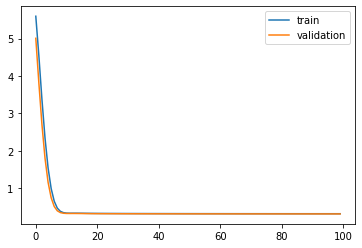

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 19s - loss: 5.5967 - acc: 0.6311 - val_loss: 5.0061 - val_acc: 0.8241

Epoch 00001: val_loss improved from inf to 5.00609, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.5367 - acc: 0.8492 - val_loss: 3.8213 - val_acc: 0.8649

Epoch 00002: val_loss improved from 5.00609 to 3.82127, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.3690 - acc: 0.8701 - val_loss: 2.7183 - val_acc: 0.8707

Epoch 00003: val_loss improved from 3.82127 to 2.71828, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.3373 - acc: 0.8736 - val_loss: 1.8193 - val_acc: 0.8730

Epoch 00004: val_loss improved from 2.71828 to 1.81932, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.5377 - acc: 0.8750 - val_loss: 1.1745 - val_acc: 0.8732

Epoch 00005: val_loss improved from 1.81932 to 1.17454, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 0.9879 - acc: 0.8760 - 


Epoch 00046: val_loss improved from 0.32501 to 0.32491, saving model to Event_val_weights2.hdf5
Epoch 47/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32491 to 0.32481, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8771

Epoch 00048: val_loss improved from 0.32481 to 0.32472, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3187 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8771

Epoch 00049: val_loss improved from 0.32472 to 0.32464, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8771

Epoch 00050: val_loss improved from 0.32464 to 0.32455, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00051: val_loss improved from 0.32455 to 0.32448, saving model to Event_val_weights

 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8756

Epoch 00092: val_loss improved from 0.32309 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8756

Epoch 00093: val_loss improved from 0.32308 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00094: val_loss improved from 0.32308 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00095: val_loss did not improve from 0.32308
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8756

Epoch 00096: val_loss did not improve from 0.32308
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8756

Epoch 00097: val_loss did not improve from 0.32308
Epoch 98/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_lo

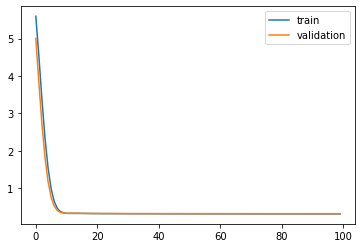

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7fea08829908>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 20s - loss: 5.5968 - acc: 0.6314 - val_loss: 5.0080 - val_acc: 0.8252

Epoch 00001: val_loss improved from inf to 5.00801, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.5370 - acc: 0.8482 - val_loss: 3.8250 - val_acc: 0.8646

Epoch 00002: val_loss improved from 5.00801 to 3.82503, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.3691 - acc: 0.8700 - val_loss: 2.7220 - val_acc: 0.8710

Epoch 00003: val_loss improved from 3.82503 to 2.72199, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.3373 - acc: 0.8735 - val_loss: 1.8232 - val_acc: 0.8739

Epoch 00004: val_loss improved from 2.72199 to 1.82320, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.5375 - acc: 0.8750 - val_loss: 1.1778 - val_acc: 0.8747

Epoch 00005: val_loss improved from 1.82320 to 1.17783, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 0.9877 - acc: 0.8759 - 

 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3249 - val_acc: 0.8776

Epoch 00047: val_loss improved from 0.32500 to 0.32491, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8776

Epoch 00048: val_loss improved from 0.32491 to 0.32482, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3247 - val_acc: 0.8776

Epoch 00049: val_loss improved from 0.32482 to 0.32474, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3247 - val_acc: 0.8777

Epoch 00050: val_loss improved from 0.32474 to 0.32466, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8776

Epoch 00051: val_loss improved from 0.32466 to 0.32458, saving model to Event_val_weights3.hdf5
Epoch 52/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8776

Epoch 00052: val_

 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8768

Epoch 00093: val_loss did not improve from 0.32320
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8768

Epoch 00094: val_loss did not improve from 0.32320
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8767

Epoch 00095: val_loss did not improve from 0.32320
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8768

Epoch 00096: val_loss did not improve from 0.32320
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8768

Epoch 00097: val_loss did not improve from 0.32320
Epoch 98/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8767

Epoch 00098: val_loss did not improve from 0.32320
Epoch 99/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8767

Epoch 00099: val_loss did not improve from 0.32320
Epoch 100/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val

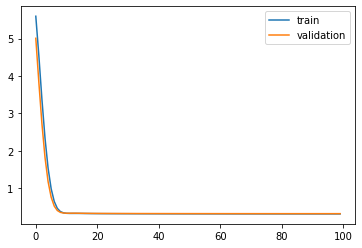

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 20s - loss: 5.5961 - acc: 0.6322 - val_loss: 5.0161 - val_acc: 0.8129

Epoch 00001: val_loss improved from inf to 5.01605, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.5367 - acc: 0.8490 - val_loss: 3.8328 - val_acc: 0.8603

Epoch 00002: val_loss improved from 5.01605 to 3.83277, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.3685 - acc: 0.8706 - val_loss: 2.7313 - val_acc: 0.8658

Epoch 00003: val_loss improved from 3.83277 to 2.73128, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.3365 - acc: 0.8741 - val_loss: 1.8319 - val_acc: 0.8670

Epoch 00004: val_loss improved from 2.73128 to 1.83191, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.5367 - acc: 0.8758 - val_loss: 1.1856 - val_acc: 0.8683

Epoch 00005: val_loss improved from 1.83191 to 1.18558, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 0.9869 - acc: 0.8764 - 

 - 1s - loss: 0.3184 - acc: 0.8797 - val_loss: 0.3296 - val_acc: 0.8716

Epoch 00047: val_loss improved from 0.32974 to 0.32965, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3183 - acc: 0.8798 - val_loss: 0.3296 - val_acc: 0.8716

Epoch 00048: val_loss improved from 0.32965 to 0.32956, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3182 - acc: 0.8798 - val_loss: 0.3295 - val_acc: 0.8713

Epoch 00049: val_loss improved from 0.32956 to 0.32948, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3181 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8713

Epoch 00050: val_loss improved from 0.32948 to 0.32940, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3180 - acc: 0.8798 - val_loss: 0.3293 - val_acc: 0.8713

Epoch 00051: val_loss improved from 0.32940 to 0.32932, saving model to Event_val_weights4.hdf5
Epoch 52/100
 - 1s - loss: 0.3179 - acc: 0.8798 - val_loss: 0.3293 - val_acc: 0.8713

Epoch 00052: val_


Epoch 00092: val_loss did not improve from 0.32803
Epoch 93/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00093: val_loss did not improve from 0.32803
Epoch 94/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00094: val_loss did not improve from 0.32803
Epoch 95/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3281 - val_acc: 0.8712

Epoch 00095: val_loss did not improve from 0.32803
Epoch 96/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3281 - val_acc: 0.8714

Epoch 00096: val_loss did not improve from 0.32803
Epoch 97/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3281 - val_acc: 0.8716

Epoch 00097: val_loss did not improve from 0.32803
Epoch 98/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3281 - val_acc: 0.8714

Epoch 00098: val_loss did not improve from 0.32803
Epoch 99/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3281 - val_acc: 0.8716

Epoch 00099: val_loss did not improve fr

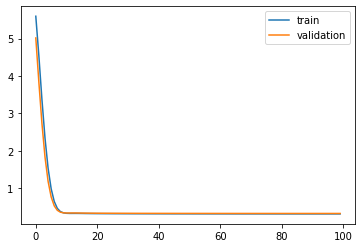

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 20s - loss: 5.5968 - acc: 0.6313 - val_loss: 5.0084 - val_acc: 0.8247

Epoch 00001: val_loss improved from inf to 5.00841, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.5383 - acc: 0.8478 - val_loss: 3.8154 - val_acc: 0.8693

Epoch 00002: val_loss improved from 5.00841 to 3.81543, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.3706 - acc: 0.8694 - val_loss: 2.7083 - val_acc: 0.8740

Epoch 00003: val_loss improved from 3.81543 to 2.70831, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.3383 - acc: 0.8732 - val_loss: 1.8076 - val_acc: 0.8771

Epoch 00004: val_loss improved from 2.70831 to 1.80760, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.5382 - acc: 0.8748 - val_loss: 1.1629 - val_acc: 0.8770

Epoch 00005: val_loss improved from 1.80760 to 1.16290, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 0.9881 - acc: 0.8756 - 


Epoch 00046: val_loss improved from 0.32030 to 0.32021, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3194 - acc: 0.8787 - val_loss: 0.3201 - val_acc: 0.8790

Epoch 00047: val_loss improved from 0.32021 to 0.32011, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3200 - val_acc: 0.8789

Epoch 00048: val_loss improved from 0.32011 to 0.32003, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3199 - val_acc: 0.8789

Epoch 00049: val_loss improved from 0.32003 to 0.31994, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3199 - val_acc: 0.8789

Epoch 00050: val_loss improved from 0.31994 to 0.31986, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3190 - acc: 0.8788 - val_loss: 0.3198 - val_acc: 0.8792

Epoch 00051: val_loss improved from 0.31986 to 0.31978, saving model to Event_val_weights

 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00092: val_loss did not improve from 0.31806
Epoch 93/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00093: val_loss did not improve from 0.31806
Epoch 94/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00094: val_loss improved from 0.31806 to 0.31804, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00095: val_loss did not improve from 0.31804
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00096: val_loss improved from 0.31804 to 0.31803, saving model to Event_val_weights5.hdf5
Epoch 97/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00097: val_loss did not improve from 0.31803
Epoch 98/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00098: va

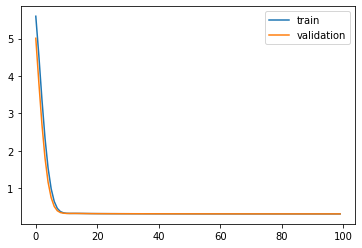

Time to train LSTM:  87.02417635917664
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 20s - loss: 5.5763 - acc: 0.6398 - val_loss: 4.9471 - val_acc: 0.8298

Epoch 00001: val_loss improved from inf to 4.94706, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.4530 - acc: 0.8516 - val_loss: 3.6874 - val_acc: 0.8729

Epoch 00002: val_loss improved from 4.94706 to 3.68740, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.2287 - acc: 0.8700 - val_loss: 2.5344 - val_acc: 0.8759

Epoch 00003: val_loss improved from 3.68740 to 2.53442, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.1658 - acc: 0.8733 - val_loss: 1.6245 - val_acc: 0.8768

Epoch 00004: val_loss improved from 2.53442 to 1.62453, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.3700 - acc: 0.8749 - val_loss: 1.0021 - val_acc: 0.8781

Epoch 00005: val_loss improved from 1.62453 to 1.00212, saving model to Event_val_weights1.hdf5
Epoch 6/10


Epoch 00046: val_loss improved from 0.31439 to 0.31430, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3197 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00047: val_loss improved from 0.31430 to 0.31422, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3196 - acc: 0.8785 - val_loss: 0.3141 - val_acc: 0.8807

Epoch 00048: val_loss improved from 0.31422 to 0.31414, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3195 - acc: 0.8786 - val_loss: 0.3141 - val_acc: 0.8804

Epoch 00049: val_loss improved from 0.31414 to 0.31406, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3194 - acc: 0.8786 - val_loss: 0.3140 - val_acc: 0.8803

Epoch 00050: val_loss improved from 0.31406 to 0.31399, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3193 - acc: 0.8787 - val_loss: 0.3139 - val_acc: 0.8802

Epoch 00051: val_loss improved from 0.31399 to 0.31392, saving model to Event_val_weights

 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8806

Epoch 00092: val_loss improved from 0.31219 to 0.31217, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8806

Epoch 00093: val_loss improved from 0.31217 to 0.31215, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8804

Epoch 00094: val_loss improved from 0.31215 to 0.31213, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8804

Epoch 00095: val_loss improved from 0.31213 to 0.31211, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8806

Epoch 00096: val_loss improved from 0.31211 to 0.31209, saving model to Event_val_weights1.hdf5
Epoch 97/100
 - 1s - loss: 0.3177 - acc: 0.8790 - val_loss: 0.3121 - val_acc: 0.8806

Epoch 00097: val_

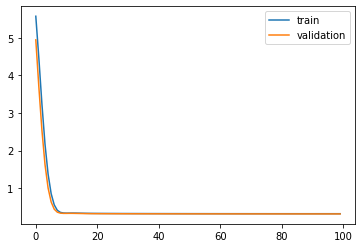

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 20s - loss: 5.5768 - acc: 0.6387 - val_loss: 4.9471 - val_acc: 0.8293

Epoch 00001: val_loss improved from inf to 4.94708, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.4519 - acc: 0.8525 - val_loss: 3.6997 - val_acc: 0.8660

Epoch 00002: val_loss improved from 4.94708 to 3.69974, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.2270 - acc: 0.8705 - val_loss: 2.5521 - val_acc: 0.8710

Epoch 00003: val_loss improved from 3.69974 to 2.55214, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.1643 - acc: 0.8737 - val_loss: 1.6439 - val_acc: 0.8731

Epoch 00004: val_loss improved from 2.55214 to 1.64387, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.3688 - acc: 0.8753 - val_loss: 1.0211 - val_acc: 0.8738

Epoch 00005: val_loss improved from 1.64387 to 1.02112, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 0.8489 - acc: 0.8761 - 

 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00047: val_loss improved from 0.32460 to 0.32451, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8772

Epoch 00048: val_loss improved from 0.32451 to 0.32443, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3184 - acc: 0.8789 - val_loss: 0.3243 - val_acc: 0.8773

Epoch 00049: val_loss improved from 0.32443 to 0.32435, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3243 - val_acc: 0.8772

Epoch 00050: val_loss improved from 0.32435 to 0.32427, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3182 - acc: 0.8790 - val_loss: 0.3242 - val_acc: 0.8771

Epoch 00051: val_loss improved from 0.32427 to 0.32420, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3181 - acc: 0.8790 - val_loss: 0.3241 - val_acc: 0.8770

Epoch 00052: val_


Epoch 00094: val_loss did not improve from 0.32315
Epoch 95/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00095: val_loss did not improve from 0.32315
Epoch 96/100
 - 1s - loss: 0.3166 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00096: val_loss did not improve from 0.32315
Epoch 97/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00097: val_loss did not improve from 0.32315
Epoch 98/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8759

Epoch 00098: val_loss did not improve from 0.32315
Epoch 99/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8759

Epoch 00099: val_loss did not improve from 0.32315
Epoch 100/100
 - 1s - loss: 0.3166 - acc: 0.8796 - val_loss: 0.3233 - val_acc: 0.8759

Epoch 00100: val_loss did not improve from 0.32315
#################################
Number of units: 16
Batch size: 16384
Fold: 1
L2 : 0.05441600579314996
LR: 0.04450129500413

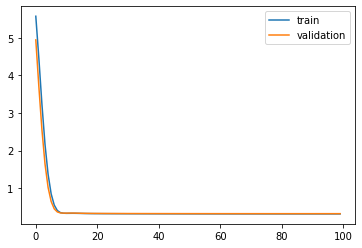

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 20s - loss: 5.5769 - acc: 0.6387 - val_loss: 4.9492 - val_acc: 0.8306

Epoch 00001: val_loss improved from inf to 4.94919, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.4522 - acc: 0.8517 - val_loss: 3.7035 - val_acc: 0.8653

Epoch 00002: val_loss improved from 4.94919 to 3.70353, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.2272 - acc: 0.8707 - val_loss: 2.5559 - val_acc: 0.8708

Epoch 00003: val_loss improved from 3.70353 to 2.55594, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.1643 - acc: 0.8740 - val_loss: 1.6479 - val_acc: 0.8742

Epoch 00004: val_loss improved from 2.55594 to 1.64785, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.3686 - acc: 0.8751 - val_loss: 1.0242 - val_acc: 0.8747

Epoch 00005: val_loss improved from 1.64785 to 1.02424, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 0.8487 - acc: 0.8758 - 

 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8777

Epoch 00047: val_loss improved from 0.32471 to 0.32463, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8777

Epoch 00048: val_loss improved from 0.32463 to 0.32454, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8774

Epoch 00049: val_loss improved from 0.32454 to 0.32447, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3182 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8773

Epoch 00050: val_loss improved from 0.32447 to 0.32439, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3182 - acc: 0.8791 - val_loss: 0.3243 - val_acc: 0.8773

Epoch 00051: val_loss improved from 0.32439 to 0.32432, saving model to Event_val_weights3.hdf5
Epoch 52/100
 - 1s - loss: 0.3181 - acc: 0.8791 - val_loss: 0.3243 - val_acc: 0.8773

Epoch 00052: val_

 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3237 - val_acc: 0.8769

Epoch 00096: val_loss did not improve from 0.32331
Epoch 97/100
 - 1s - loss: 0.3166 - acc: 0.8796 - val_loss: 0.3238 - val_acc: 0.8770

Epoch 00097: val_loss did not improve from 0.32331
Epoch 98/100
 - 1s - loss: 0.3166 - acc: 0.8796 - val_loss: 0.3238 - val_acc: 0.8770

Epoch 00098: val_loss did not improve from 0.32331
Epoch 99/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3238 - val_acc: 0.8769

Epoch 00099: val_loss did not improve from 0.32331
Epoch 100/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3239 - val_acc: 0.8769

Epoch 00100: val_loss did not improve from 0.32331
#################################
Number of units: 16
Batch size: 16384
Fold: 2
L2 : 0.05441600579314996
LR: 0.04450129500413645
Decay: 5.767990184417392e-07
best val loss: 0.32330837845802307
#################################


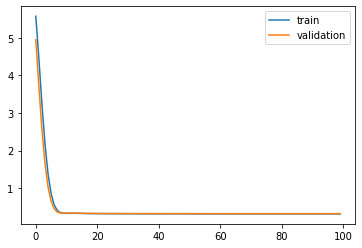

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 21s - loss: 5.5763 - acc: 0.6392 - val_loss: 4.9571 - val_acc: 0.8186

Epoch 00001: val_loss improved from inf to 4.95710, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.4519 - acc: 0.8527 - val_loss: 3.7115 - val_acc: 0.8614

Epoch 00002: val_loss improved from 4.95710 to 3.71150, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.2265 - acc: 0.8714 - val_loss: 2.5652 - val_acc: 0.8658

Epoch 00003: val_loss improved from 3.71150 to 2.56523, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.1635 - acc: 0.8746 - val_loss: 1.6563 - val_acc: 0.8676

Epoch 00004: val_loss improved from 2.56523 to 1.65630, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.3678 - acc: 0.8759 - val_loss: 1.0316 - val_acc: 0.8684

Epoch 00005: val_loss improved from 1.65630 to 1.03163, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 0.8479 - acc: 0.8766 - 

 - 1s - loss: 0.3180 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8712

Epoch 00047: val_loss improved from 0.32944 to 0.32936, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3179 - acc: 0.8798 - val_loss: 0.3293 - val_acc: 0.8713

Epoch 00048: val_loss improved from 0.32936 to 0.32928, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3178 - acc: 0.8798 - val_loss: 0.3292 - val_acc: 0.8712

Epoch 00049: val_loss improved from 0.32928 to 0.32920, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3177 - acc: 0.8798 - val_loss: 0.3291 - val_acc: 0.8711

Epoch 00050: val_loss improved from 0.32920 to 0.32913, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3176 - acc: 0.8798 - val_loss: 0.3291 - val_acc: 0.8711

Epoch 00051: val_loss improved from 0.32913 to 0.32906, saving model to Event_val_weights4.hdf5
Epoch 52/100
 - 1s - loss: 0.3175 - acc: 0.8798 - val_loss: 0.3290 - val_acc: 0.8711

Epoch 00052: val_

 - 1s - loss: 0.3160 - acc: 0.8800 - val_loss: 0.3285 - val_acc: 0.8709

Epoch 00096: val_loss did not improve from 0.32810
Epoch 97/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3285 - val_acc: 0.8710

Epoch 00097: val_loss did not improve from 0.32810
Epoch 98/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3286 - val_acc: 0.8710

Epoch 00098: val_loss did not improve from 0.32810
Epoch 99/100
 - 1s - loss: 0.3160 - acc: 0.8802 - val_loss: 0.3285 - val_acc: 0.8710

Epoch 00099: val_loss did not improve from 0.32810
Epoch 100/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3287 - val_acc: 0.8711

Epoch 00100: val_loss did not improve from 0.32810
#################################
Number of units: 16
Batch size: 16384
Fold: 3
L2 : 0.05441600579314996
LR: 0.04450129500413645
Decay: 5.767990184417392e-07
best val loss: 0.32810482382774353
#################################


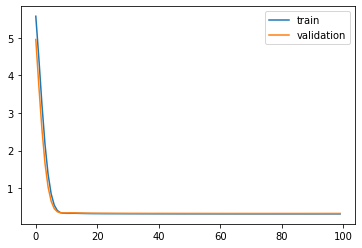

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 20s - loss: 5.5769 - acc: 0.6383 - val_loss: 4.9489 - val_acc: 0.8313

Epoch 00001: val_loss improved from inf to 4.94894, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.4536 - acc: 0.8514 - val_loss: 3.6933 - val_acc: 0.8702

Epoch 00002: val_loss improved from 4.94894 to 3.69325, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.2286 - acc: 0.8701 - val_loss: 2.5416 - val_acc: 0.8744

Epoch 00003: val_loss improved from 3.69325 to 2.54164, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.1653 - acc: 0.8735 - val_loss: 1.6318 - val_acc: 0.8776

Epoch 00004: val_loss improved from 2.54164 to 1.63182, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.3692 - acc: 0.8749 - val_loss: 1.0094 - val_acc: 0.8772

Epoch 00005: val_loss improved from 1.63182 to 1.00943, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 0.8490 - acc: 0.8756 - 


Epoch 00046: val_loss improved from 0.32000 to 0.31991, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3198 - val_acc: 0.8788

Epoch 00047: val_loss improved from 0.31991 to 0.31982, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3190 - acc: 0.8789 - val_loss: 0.3197 - val_acc: 0.8791

Epoch 00048: val_loss improved from 0.31982 to 0.31973, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3189 - acc: 0.8788 - val_loss: 0.3196 - val_acc: 0.8792

Epoch 00049: val_loss improved from 0.31973 to 0.31965, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3196 - val_acc: 0.8792

Epoch 00050: val_loss improved from 0.31965 to 0.31957, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3195 - val_acc: 0.8793

Epoch 00051: val_loss improved from 0.31957 to 0.31949, saving model to Event_val_weights


Epoch 00093: val_loss did not improve from 0.31805
Epoch 94/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00094: val_loss did not improve from 0.31805
Epoch 95/100
 - 1s - loss: 0.3173 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00095: val_loss improved from 0.31805 to 0.31805, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3173 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00096: val_loss did not improve from 0.31805
Epoch 97/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8793

Epoch 00097: val_loss improved from 0.31805 to 0.31802, saving model to Event_val_weights5.hdf5
Epoch 98/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00098: val_loss did not improve from 0.31802
Epoch 99/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8793

Epoch 00099: val_loss did not improve from 0.31802
Epoch 100/100
 - 1s - loss: 0.3173 -

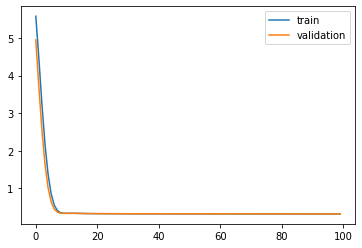

Time to train LSTM:  87.18643736839294
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 21s - loss: 5.6175 - acc: 0.6236 - val_loss: 5.0718 - val_acc: 0.8139

Epoch 00001: val_loss improved from inf to 5.07178, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.6304 - acc: 0.8439 - val_loss: 3.9444 - val_acc: 0.8718

Epoch 00002: val_loss improved from 5.07178 to 3.94437, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.5276 - acc: 0.8680 - val_loss: 2.8880 - val_acc: 0.8763

Epoch 00003: val_loss improved from 3.94437 to 2.88800, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.5354 - acc: 0.8726 - val_loss: 2.0047 - val_acc: 0.8766

Epoch 00004: val_loss improved from 2.88800 to 2.00471, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.7390 - acc: 0.8741 - val_loss: 1.3437 - val_acc: 0.8777

Epoch 00005: val_loss improved from 2.00471 to 1.34365, saving model to Event_val_weights1.hdf5
Epoch 6/10

 - 1s - loss: 0.3205 - acc: 0.8783 - val_loss: 0.3149 - val_acc: 0.8808

Epoch 00046: val_loss improved from 0.31501 to 0.31492, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3204 - acc: 0.8784 - val_loss: 0.3148 - val_acc: 0.8808

Epoch 00047: val_loss improved from 0.31492 to 0.31483, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3203 - acc: 0.8784 - val_loss: 0.3147 - val_acc: 0.8807

Epoch 00048: val_loss improved from 0.31483 to 0.31475, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3202 - acc: 0.8784 - val_loss: 0.3147 - val_acc: 0.8807

Epoch 00049: val_loss improved from 0.31475 to 0.31466, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3201 - acc: 0.8784 - val_loss: 0.3146 - val_acc: 0.8804

Epoch 00050: val_loss improved from 0.31466 to 0.31459, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3200 - acc: 0.8784 - val_loss: 0.3145 - val_acc: 0.8804

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31270 to 0.31267, saving model to Event_val_weights1.hdf5
Epoch 92/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3126 - val_acc: 0.8802

Epoch 00092: val_loss improved from 0.31267 to 0.31264, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3126 - val_acc: 0.8802

Epoch 00093: val_loss improved from 0.31264 to 0.31262, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3126 - val_acc: 0.8802

Epoch 00094: val_loss improved from 0.31262 to 0.31259, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3176 - acc: 0.8789 - val_loss: 0.3126 - val_acc: 0.8802

Epoch 00095: val_loss improved from 0.31259 to 0.31256, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3176 - acc: 0.8789 - val_loss: 0.3125 - val_acc: 0.8801

Epoch 00096: val_loss improved from 0.31256 to 0.31254, saving model to Event_val_weights

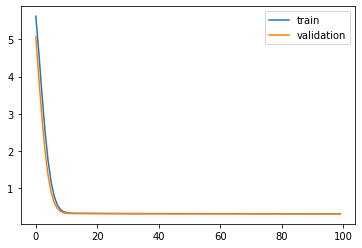

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 21s - loss: 5.6181 - acc: 0.6229 - val_loss: 5.0703 - val_acc: 0.8170

Epoch 00001: val_loss improved from inf to 5.07032, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.6294 - acc: 0.8451 - val_loss: 3.9547 - val_acc: 0.8630

Epoch 00002: val_loss improved from 5.07032 to 3.95465, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.5260 - acc: 0.8688 - val_loss: 2.9043 - val_acc: 0.8708

Epoch 00003: val_loss improved from 3.95465 to 2.90432, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.5338 - acc: 0.8730 - val_loss: 2.0231 - val_acc: 0.8720

Epoch 00004: val_loss improved from 2.90432 to 2.02314, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.7376 - acc: 0.8747 - val_loss: 1.3623 - val_acc: 0.8740

Epoch 00005: val_loss improved from 2.02314 to 1.36228, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.1623 - acc: 0.8757 - 

 - 1s - loss: 0.3194 - acc: 0.8787 - val_loss: 0.3253 - val_acc: 0.8770

Epoch 00046: val_loss improved from 0.32538 to 0.32528, saving model to Event_val_weights2.hdf5
Epoch 47/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3252 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32528 to 0.32518, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3251 - val_acc: 0.8770

Epoch 00048: val_loss improved from 0.32518 to 0.32508, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3250 - val_acc: 0.8770

Epoch 00049: val_loss improved from 0.32508 to 0.32499, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3190 - acc: 0.8789 - val_loss: 0.3249 - val_acc: 0.8770

Epoch 00050: val_loss improved from 0.32499 to 0.32490, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8770

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32316 to 0.32314, saving model to Event_val_weights2.hdf5
Epoch 92/100
 - 1s - loss: 0.3166 - acc: 0.8793 - val_loss: 0.3231 - val_acc: 0.8763

Epoch 00092: val_loss improved from 0.32314 to 0.32313, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00093: val_loss improved from 0.32313 to 0.32311, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00094: val_loss improved from 0.32311 to 0.32310, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8762

Epoch 00095: val_loss improved from 0.32310 to 0.32309, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8761

Epoch 00096: val_loss improved from 0.32309 to 0.32308, saving model to Event_val_weights

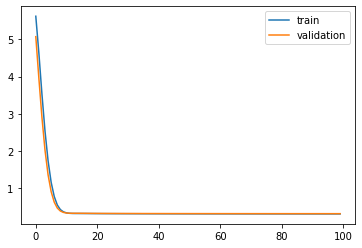

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 21s - loss: 5.6182 - acc: 0.6232 - val_loss: 5.0720 - val_acc: 0.8167

Epoch 00001: val_loss improved from inf to 5.07204, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.6297 - acc: 0.8440 - val_loss: 3.9584 - val_acc: 0.8632

Epoch 00002: val_loss improved from 5.07204 to 3.95837, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.5261 - acc: 0.8690 - val_loss: 2.9080 - val_acc: 0.8702

Epoch 00003: val_loss improved from 3.95837 to 2.90799, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.5338 - acc: 0.8730 - val_loss: 2.0269 - val_acc: 0.8726

Epoch 00004: val_loss improved from 2.90799 to 2.02692, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.7375 - acc: 0.8748 - val_loss: 1.3657 - val_acc: 0.8747

Epoch 00005: val_loss improved from 2.02692 to 1.36568, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.1621 - acc: 0.8755 - 

 - 1s - loss: 0.3194 - acc: 0.8789 - val_loss: 0.3253 - val_acc: 0.8778

Epoch 00046: val_loss improved from 0.32544 to 0.32534, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3193 - acc: 0.8789 - val_loss: 0.3252 - val_acc: 0.8778

Epoch 00047: val_loss improved from 0.32534 to 0.32525, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3192 - acc: 0.8789 - val_loss: 0.3252 - val_acc: 0.8778

Epoch 00048: val_loss improved from 0.32525 to 0.32516, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3191 - acc: 0.8790 - val_loss: 0.3251 - val_acc: 0.8779

Epoch 00049: val_loss improved from 0.32516 to 0.32507, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3190 - acc: 0.8789 - val_loss: 0.3250 - val_acc: 0.8778

Epoch 00050: val_loss improved from 0.32507 to 0.32499, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3189 - acc: 0.8790 - val_loss: 0.3249 - val_acc: 0.8777

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32319 to 0.32317, saving model to Event_val_weights3.hdf5
Epoch 92/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3232 - val_acc: 0.8768

Epoch 00092: val_loss improved from 0.32317 to 0.32316, saving model to Event_val_weights3.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8769

Epoch 00093: val_loss improved from 0.32316 to 0.32314, saving model to Event_val_weights3.hdf5
Epoch 94/100
 - 1s - loss: 0.3165 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8769

Epoch 00094: val_loss improved from 0.32314 to 0.32313, saving model to Event_val_weights3.hdf5
Epoch 95/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8768

Epoch 00095: val_loss improved from 0.32313 to 0.32312, saving model to Event_val_weights3.hdf5
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8794 - val_loss: 0.3231 - val_acc: 0.8769

Epoch 00096: val_loss improved from 0.32312 to 0.32311, saving model to Event_val_weights

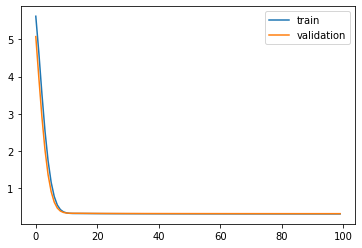

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 22s - loss: 5.6175 - acc: 0.6238 - val_loss: 5.0802 - val_acc: 0.8063

Epoch 00001: val_loss improved from inf to 5.08020, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.6293 - acc: 0.8445 - val_loss: 3.9659 - val_acc: 0.8587

Epoch 00002: val_loss improved from 5.08020 to 3.96587, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.5255 - acc: 0.8694 - val_loss: 2.9172 - val_acc: 0.8651

Epoch 00003: val_loss improved from 3.96587 to 2.91717, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.5330 - acc: 0.8736 - val_loss: 2.0359 - val_acc: 0.8663

Epoch 00004: val_loss improved from 2.91717 to 2.03587, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.7367 - acc: 0.8755 - val_loss: 1.3738 - val_acc: 0.8678

Epoch 00005: val_loss improved from 2.03587 to 1.37381, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.1613 - acc: 0.8762 - 

 - 1s - loss: 0.3189 - acc: 0.8797 - val_loss: 0.3301 - val_acc: 0.8710

Epoch 00046: val_loss improved from 0.33018 to 0.33009, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3188 - acc: 0.8796 - val_loss: 0.3300 - val_acc: 0.8712

Epoch 00047: val_loss improved from 0.33009 to 0.32999, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3187 - acc: 0.8797 - val_loss: 0.3299 - val_acc: 0.8713

Epoch 00048: val_loss improved from 0.32999 to 0.32990, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3186 - acc: 0.8798 - val_loss: 0.3298 - val_acc: 0.8714

Epoch 00049: val_loss improved from 0.32990 to 0.32982, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3184 - acc: 0.8797 - val_loss: 0.3297 - val_acc: 0.8714

Epoch 00050: val_loss improved from 0.32982 to 0.32973, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3184 - acc: 0.8798 - val_loss: 0.3297 - val_acc: 0.8716

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.32805 to 0.32803, saving model to Event_val_weights4.hdf5
Epoch 92/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00092: val_loss improved from 0.32803 to 0.32802, saving model to Event_val_weights4.hdf5
Epoch 93/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00093: val_loss improved from 0.32802 to 0.32801, saving model to Event_val_weights4.hdf5
Epoch 94/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00094: val_loss improved from 0.32801 to 0.32799, saving model to Event_val_weights4.hdf5
Epoch 95/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8713

Epoch 00095: val_loss improved from 0.32799 to 0.32799, saving model to Event_val_weights4.hdf5
Epoch 96/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00096: val_loss improved from 0.32799 to 0.32798, saving model to Event_val_weights

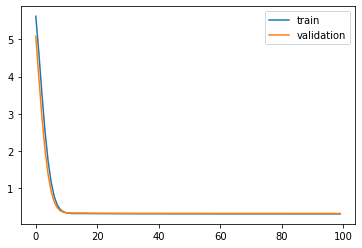

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 22s - loss: 5.6181 - acc: 0.6225 - val_loss: 5.0731 - val_acc: 0.8163

Epoch 00001: val_loss improved from inf to 5.07314, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.6309 - acc: 0.8430 - val_loss: 3.9496 - val_acc: 0.8681

Epoch 00002: val_loss improved from 5.07314 to 3.94958, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.5275 - acc: 0.8685 - val_loss: 2.8950 - val_acc: 0.8737

Epoch 00003: val_loss improved from 3.94958 to 2.89496, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.5348 - acc: 0.8728 - val_loss: 2.0119 - val_acc: 0.8759

Epoch 00004: val_loss improved from 2.89496 to 2.01189, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.7383 - acc: 0.8745 - val_loss: 1.3508 - val_acc: 0.8772

Epoch 00005: val_loss improved from 2.01189 to 1.35079, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.1626 - acc: 0.8752 - 

 - 1s - loss: 0.3199 - acc: 0.8785 - val_loss: 0.3206 - val_acc: 0.8790

Epoch 00046: val_loss improved from 0.32065 to 0.32056, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3198 - acc: 0.8786 - val_loss: 0.3205 - val_acc: 0.8790

Epoch 00047: val_loss improved from 0.32056 to 0.32046, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3197 - acc: 0.8786 - val_loss: 0.3204 - val_acc: 0.8790

Epoch 00048: val_loss improved from 0.32046 to 0.32037, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3196 - acc: 0.8787 - val_loss: 0.3203 - val_acc: 0.8790

Epoch 00049: val_loss improved from 0.32037 to 0.32028, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3195 - acc: 0.8787 - val_loss: 0.3202 - val_acc: 0.8790

Epoch 00050: val_loss improved from 0.32028 to 0.32020, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3194 - acc: 0.8788 - val_loss: 0.3201 - val_acc: 0.8789

Epoch 00051: val_


Epoch 00091: val_loss improved from 0.31827 to 0.31825, saving model to Event_val_weights5.hdf5
Epoch 92/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00092: val_loss improved from 0.31825 to 0.31822, saving model to Event_val_weights5.hdf5
Epoch 93/100
 - 1s - loss: 0.3171 - acc: 0.8791 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00093: val_loss improved from 0.31822 to 0.31820, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00094: val_loss improved from 0.31820 to 0.31818, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8791 - val_loss: 0.3182 - val_acc: 0.8793

Epoch 00095: val_loss improved from 0.31818 to 0.31816, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00096: val_loss improved from 0.31816 to 0.31814, saving model to Event_val_weights

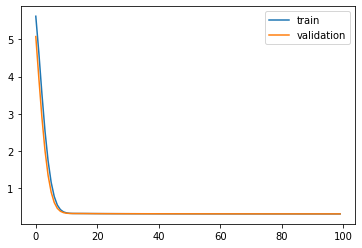

Time to train LSTM:  89.38824152946472
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 22s - loss: 5.5992 - acc: 0.6311 - val_loss: 5.0158 - val_acc: 0.8233

Epoch 00001: val_loss improved from inf to 5.01581, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.5506 - acc: 0.8478 - val_loss: 3.8285 - val_acc: 0.8718

Epoch 00002: val_loss improved from 5.01581 to 3.82849, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.3923 - acc: 0.8691 - val_loss: 2.7268 - val_acc: 0.8760

Epoch 00003: val_loss improved from 3.82849 to 2.72683, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.3657 - acc: 0.8730 - val_loss: 1.8280 - val_acc: 0.8767

Epoch 00004: val_loss improved from 2.72683 to 1.82800, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.5658 - acc: 0.8745 - val_loss: 1.1805 - val_acc: 0.8774

Epoch 00005: val_loss improved from 1.82800 to 1.18053, saving model to Event_val_weights1.hdf5
Epoch 6/10


Epoch 00046: val_loss improved from 0.31472 to 0.31463, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3201 - acc: 0.8783 - val_loss: 0.3145 - val_acc: 0.8804

Epoch 00047: val_loss improved from 0.31463 to 0.31455, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3200 - acc: 0.8784 - val_loss: 0.3145 - val_acc: 0.8808

Epoch 00048: val_loss improved from 0.31455 to 0.31446, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3199 - acc: 0.8784 - val_loss: 0.3144 - val_acc: 0.8807

Epoch 00049: val_loss improved from 0.31446 to 0.31438, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3198 - acc: 0.8785 - val_loss: 0.3143 - val_acc: 0.8807

Epoch 00050: val_loss improved from 0.31438 to 0.31431, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3197 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00051: val_loss improved from 0.31431 to 0.31423, saving model to Event_val_weights

 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00092: val_loss improved from 0.31245 to 0.31242, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8803

Epoch 00093: val_loss improved from 0.31242 to 0.31239, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3124 - val_acc: 0.8804

Epoch 00094: val_loss improved from 0.31239 to 0.31237, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00095: val_loss improved from 0.31237 to 0.31234, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8803

Epoch 00096: val_loss improved from 0.31234 to 0.31231, saving model to Event_val_weights1.hdf5
Epoch 97/100
 - 1s - loss: 0.3175 - acc: 0.8790 - val_loss: 0.3123 - val_acc: 0.8804

Epoch 00097: val_

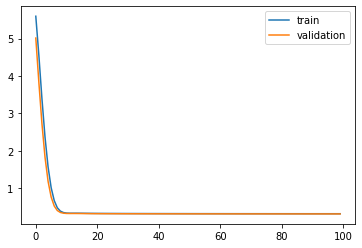

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 22s - loss: 5.5997 - acc: 0.6301 - val_loss: 5.0150 - val_acc: 0.8229

Epoch 00001: val_loss improved from inf to 5.01502, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.5495 - acc: 0.8485 - val_loss: 3.8397 - val_acc: 0.8647

Epoch 00002: val_loss improved from 5.01502 to 3.83973, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.3907 - acc: 0.8699 - val_loss: 2.7438 - val_acc: 0.8707

Epoch 00003: val_loss improved from 3.83973 to 2.74383, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.3641 - acc: 0.8736 - val_loss: 1.8469 - val_acc: 0.8730

Epoch 00004: val_loss improved from 2.74383 to 1.84687, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.5645 - acc: 0.8750 - val_loss: 1.1994 - val_acc: 0.8734

Epoch 00005: val_loss improved from 1.84687 to 1.19936, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 1.0107 - acc: 0.8760 - 

 - 1s - loss: 0.3190 - acc: 0.8789 - val_loss: 0.3249 - val_acc: 0.8770

Epoch 00047: val_loss improved from 0.32496 to 0.32486, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8770

Epoch 00048: val_loss improved from 0.32486 to 0.32477, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3187 - acc: 0.8790 - val_loss: 0.3247 - val_acc: 0.8771

Epoch 00049: val_loss improved from 0.32477 to 0.32469, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3186 - acc: 0.8789 - val_loss: 0.3246 - val_acc: 0.8770

Epoch 00050: val_loss improved from 0.32469 to 0.32460, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8773

Epoch 00051: val_loss improved from 0.32460 to 0.32452, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8772

Epoch 00052: val_


Epoch 00092: val_loss improved from 0.32309 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 93/100
 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8758

Epoch 00093: val_loss improved from 0.32308 to 0.32308, saving model to Event_val_weights2.hdf5
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3231 - val_acc: 0.8756

Epoch 00094: val_loss improved from 0.32308 to 0.32307, saving model to Event_val_weights2.hdf5
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00095: val_loss improved from 0.32307 to 0.32307, saving model to Event_val_weights2.hdf5
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00096: val_loss improved from 0.32307 to 0.32307, saving model to Event_val_weights2.hdf5
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3231 - val_acc: 0.8757

Epoch 00097: val_loss did not improve from 0.32307
Epoch 98/100
 - 1s - loss: 0.3164 - ac

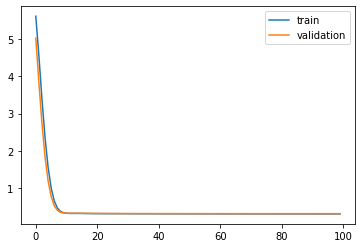

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 22s - loss: 5.5998 - acc: 0.6303 - val_loss: 5.0169 - val_acc: 0.8230

Epoch 00001: val_loss improved from inf to 5.01691, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.5498 - acc: 0.8477 - val_loss: 3.8435 - val_acc: 0.8643

Epoch 00002: val_loss improved from 5.01691 to 3.84350, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.3908 - acc: 0.8698 - val_loss: 2.7475 - val_acc: 0.8710

Epoch 00003: val_loss improved from 3.84350 to 2.74753, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.3642 - acc: 0.8734 - val_loss: 1.8507 - val_acc: 0.8740

Epoch 00004: val_loss improved from 2.74753 to 1.85074, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.5643 - acc: 0.8750 - val_loss: 1.2027 - val_acc: 0.8746

Epoch 00005: val_loss improved from 1.85074 to 1.20267, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 1.0105 - acc: 0.8757 - 


Epoch 00046: val_loss improved from 0.32514 to 0.32504, saving model to Event_val_weights3.hdf5
Epoch 47/100
 - 1s - loss: 0.3189 - acc: 0.8789 - val_loss: 0.3250 - val_acc: 0.8776

Epoch 00047: val_loss improved from 0.32504 to 0.32495, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3188 - acc: 0.8790 - val_loss: 0.3249 - val_acc: 0.8776

Epoch 00048: val_loss improved from 0.32495 to 0.32487, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3248 - val_acc: 0.8776

Epoch 00049: val_loss improved from 0.32487 to 0.32478, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3247 - val_acc: 0.8777

Epoch 00050: val_loss improved from 0.32478 to 0.32470, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8776

Epoch 00051: val_loss improved from 0.32470 to 0.32462, saving model to Event_val_weights

 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00092: val_loss did not improve from 0.32318
Epoch 93/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8768

Epoch 00093: val_loss did not improve from 0.32318
Epoch 94/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8769

Epoch 00094: val_loss did not improve from 0.32318
Epoch 95/100
 - 1s - loss: 0.3164 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8768

Epoch 00095: val_loss did not improve from 0.32318
Epoch 96/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3232 - val_acc: 0.8767

Epoch 00096: val_loss did not improve from 0.32318
Epoch 97/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3232 - val_acc: 0.8767

Epoch 00097: val_loss did not improve from 0.32318
Epoch 98/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_loss: 0.3232 - val_acc: 0.8768

Epoch 00098: val_loss did not improve from 0.32318
Epoch 99/100
 - 1s - loss: 0.3164 - acc: 0.8796 - val_

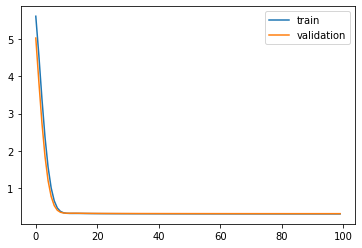

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 23s - loss: 5.5991 - acc: 0.6310 - val_loss: 5.0250 - val_acc: 0.8118

Epoch 00001: val_loss improved from inf to 5.02497, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.5495 - acc: 0.8484 - val_loss: 3.8512 - val_acc: 0.8601

Epoch 00002: val_loss improved from 5.02497 to 3.85120, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.3902 - acc: 0.8703 - val_loss: 2.7568 - val_acc: 0.8659

Epoch 00003: val_loss improved from 3.85120 to 2.75681, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.3633 - acc: 0.8740 - val_loss: 1.8595 - val_acc: 0.8667

Epoch 00004: val_loss improved from 2.75681 to 1.85949, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.5636 - acc: 0.8759 - val_loss: 1.2105 - val_acc: 0.8683

Epoch 00005: val_loss improved from 1.85949 to 1.21048, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 1.0097 - acc: 0.8764 - 


Epoch 00046: val_loss improved from 0.32988 to 0.32978, saving model to Event_val_weights4.hdf5
Epoch 47/100
 - 1s - loss: 0.3184 - acc: 0.8797 - val_loss: 0.3297 - val_acc: 0.8716

Epoch 00047: val_loss improved from 0.32978 to 0.32969, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3183 - acc: 0.8798 - val_loss: 0.3296 - val_acc: 0.8716

Epoch 00048: val_loss improved from 0.32969 to 0.32961, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3182 - acc: 0.8798 - val_loss: 0.3295 - val_acc: 0.8714

Epoch 00049: val_loss improved from 0.32961 to 0.32952, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3181 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8714

Epoch 00050: val_loss improved from 0.32952 to 0.32944, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3180 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8713

Epoch 00051: val_loss improved from 0.32944 to 0.32937, saving model to Event_val_weights

 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00092: val_loss did not improve from 0.32802
Epoch 93/100
 - 1s - loss: 0.3159 - acc: 0.8802 - val_loss: 0.3280 - val_acc: 0.8712

Epoch 00093: val_loss did not improve from 0.32802
Epoch 94/100
 - 1s - loss: 0.3159 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00094: val_loss did not improve from 0.32802
Epoch 95/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00095: val_loss did not improve from 0.32802
Epoch 96/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8711

Epoch 00096: val_loss did not improve from 0.32802
Epoch 97/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3280 - val_acc: 0.8714

Epoch 00097: val_loss did not improve from 0.32802
Epoch 98/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_loss: 0.3281 - val_acc: 0.8714

Epoch 00098: val_loss did not improve from 0.32802
Epoch 99/100
 - 1s - loss: 0.3158 - acc: 0.8801 - val_

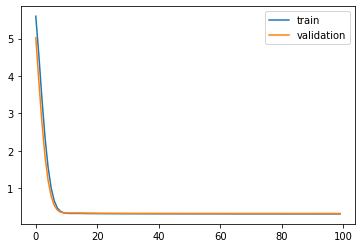

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 23s - loss: 5.5997 - acc: 0.6302 - val_loss: 5.0174 - val_acc: 0.8234

Epoch 00001: val_loss improved from inf to 5.01741, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.5511 - acc: 0.8472 - val_loss: 3.8340 - val_acc: 0.8692

Epoch 00002: val_loss improved from 5.01741 to 3.83400, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.3923 - acc: 0.8693 - val_loss: 2.7339 - val_acc: 0.8738

Epoch 00003: val_loss improved from 3.83400 to 2.73394, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.3652 - acc: 0.8731 - val_loss: 1.8352 - val_acc: 0.8770

Epoch 00004: val_loss improved from 2.73394 to 1.83521, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.5651 - acc: 0.8747 - val_loss: 1.1877 - val_acc: 0.8770

Epoch 00005: val_loss improved from 1.83521 to 1.18774, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 1.0109 - acc: 0.8756 - 


Epoch 00046: val_loss improved from 0.32035 to 0.32025, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3195 - acc: 0.8788 - val_loss: 0.3202 - val_acc: 0.8790

Epoch 00047: val_loss improved from 0.32025 to 0.32016, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3193 - acc: 0.8788 - val_loss: 0.3201 - val_acc: 0.8789

Epoch 00048: val_loss improved from 0.32016 to 0.32007, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3192 - acc: 0.8788 - val_loss: 0.3200 - val_acc: 0.8789

Epoch 00049: val_loss improved from 0.32007 to 0.31999, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3199 - val_acc: 0.8789

Epoch 00050: val_loss improved from 0.31999 to 0.31990, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3191 - acc: 0.8788 - val_loss: 0.3198 - val_acc: 0.8789

Epoch 00051: val_loss improved from 0.31990 to 0.31982, saving model to Event_val_weights

 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00092: val_loss improved from 0.31812 to 0.31806, saving model to Event_val_weights5.hdf5
Epoch 93/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00093: val_loss did not improve from 0.31806
Epoch 94/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00094: val_loss improved from 0.31806 to 0.31804, saving model to Event_val_weights5.hdf5
Epoch 95/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00095: val_loss improved from 0.31804 to 0.31802, saving model to Event_val_weights5.hdf5
Epoch 96/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00096: val_loss did not improve from 0.31802
Epoch 97/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8794

Epoch 00097: val_loss did not improve from 0.31802
Epoch 98/100
 - 1s - loss: 0.3171 - acc: 0.8790 - val_lo

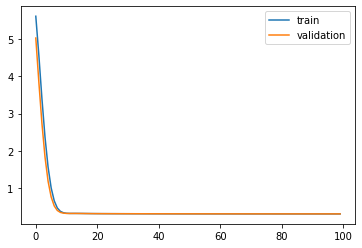

Time to train LSTM:  90.99819159507751
Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 24s - loss: 5.5786 - acc: 0.6389 - val_loss: 4.9540 - val_acc: 0.8296

Epoch 00001: val_loss improved from inf to 4.95398, saving model to Event_val_weights1.hdf5
Epoch 2/100
 - 1s - loss: 4.4628 - acc: 0.8510 - val_loss: 3.7015 - val_acc: 0.8728

Epoch 00002: val_loss improved from 4.95398 to 3.70155, saving model to Event_val_weights1.hdf5
Epoch 3/100
 - 1s - loss: 3.2451 - acc: 0.8700 - val_loss: 2.5535 - val_acc: 0.8760

Epoch 00003: val_loss improved from 3.70155 to 2.55351, saving model to Event_val_weights1.hdf5
Epoch 4/100
 - 1s - loss: 2.1855 - acc: 0.8732 - val_loss: 1.6443 - val_acc: 0.8768

Epoch 00004: val_loss improved from 2.55351 to 1.64433, saving model to Event_val_weights1.hdf5
Epoch 5/100
 - 1s - loss: 1.3889 - acc: 0.8748 - val_loss: 1.0190 - val_acc: 0.8780

Epoch 00005: val_loss improved from 1.64433 to 1.01899, saving model to Event_val_weights1.hdf5
Epoch 6/10


Epoch 00046: val_loss improved from 0.31442 to 0.31433, saving model to Event_val_weights1.hdf5
Epoch 47/100
 - 1s - loss: 0.3197 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00047: val_loss improved from 0.31433 to 0.31425, saving model to Event_val_weights1.hdf5
Epoch 48/100
 - 1s - loss: 0.3196 - acc: 0.8785 - val_loss: 0.3142 - val_acc: 0.8807

Epoch 00048: val_loss improved from 0.31425 to 0.31417, saving model to Event_val_weights1.hdf5
Epoch 49/100
 - 1s - loss: 0.3195 - acc: 0.8785 - val_loss: 0.3141 - val_acc: 0.8806

Epoch 00049: val_loss improved from 0.31417 to 0.31409, saving model to Event_val_weights1.hdf5
Epoch 50/100
 - 1s - loss: 0.3194 - acc: 0.8786 - val_loss: 0.3140 - val_acc: 0.8804

Epoch 00050: val_loss improved from 0.31409 to 0.31402, saving model to Event_val_weights1.hdf5
Epoch 51/100
 - 1s - loss: 0.3193 - acc: 0.8787 - val_loss: 0.3139 - val_acc: 0.8803

Epoch 00051: val_loss improved from 0.31402 to 0.31395, saving model to Event_val_weights

 - 1s - loss: 0.3176 - acc: 0.8791 - val_loss: 0.3122 - val_acc: 0.8804

Epoch 00092: val_loss improved from 0.31221 to 0.31219, saving model to Event_val_weights1.hdf5
Epoch 93/100
 - 1s - loss: 0.3176 - acc: 0.8792 - val_loss: 0.3122 - val_acc: 0.8806

Epoch 00093: val_loss improved from 0.31219 to 0.31217, saving model to Event_val_weights1.hdf5
Epoch 94/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8806

Epoch 00094: val_loss improved from 0.31217 to 0.31214, saving model to Event_val_weights1.hdf5
Epoch 95/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8804

Epoch 00095: val_loss improved from 0.31214 to 0.31213, saving model to Event_val_weights1.hdf5
Epoch 96/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8804

Epoch 00096: val_loss improved from 0.31213 to 0.31211, saving model to Event_val_weights1.hdf5
Epoch 97/100
 - 1s - loss: 0.3177 - acc: 0.8791 - val_loss: 0.3121 - val_acc: 0.8806

Epoch 00097: val_

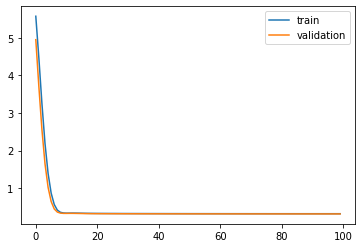

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 24s - loss: 5.5791 - acc: 0.6379 - val_loss: 4.9539 - val_acc: 0.8286

Epoch 00001: val_loss improved from inf to 4.95392, saving model to Event_val_weights2.hdf5
Epoch 2/100
 - 1s - loss: 4.4617 - acc: 0.8522 - val_loss: 3.7138 - val_acc: 0.8662

Epoch 00002: val_loss improved from 4.95392 to 3.71378, saving model to Event_val_weights2.hdf5
Epoch 3/100
 - 1s - loss: 3.2434 - acc: 0.8705 - val_loss: 2.5712 - val_acc: 0.8710

Epoch 00003: val_loss improved from 3.71378 to 2.57116, saving model to Event_val_weights2.hdf5
Epoch 4/100
 - 1s - loss: 2.1840 - acc: 0.8737 - val_loss: 1.6636 - val_acc: 0.8729

Epoch 00004: val_loss improved from 2.57116 to 1.66362, saving model to Event_val_weights2.hdf5
Epoch 5/100
 - 1s - loss: 1.3876 - acc: 0.8752 - val_loss: 1.0380 - val_acc: 0.8737

Epoch 00005: val_loss improved from 1.66362 to 1.03798, saving model to Event_val_weights2.hdf5
Epoch 6/100
 - 1s - loss: 0.8640 - acc: 0.8761 - 

 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00047: val_loss improved from 0.32464 to 0.32455, saving model to Event_val_weights2.hdf5
Epoch 48/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3245 - val_acc: 0.8772

Epoch 00048: val_loss improved from 0.32455 to 0.32446, saving model to Event_val_weights2.hdf5
Epoch 49/100
 - 1s - loss: 0.3184 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8773

Epoch 00049: val_loss improved from 0.32446 to 0.32438, saving model to Event_val_weights2.hdf5
Epoch 50/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3243 - val_acc: 0.8772

Epoch 00050: val_loss improved from 0.32438 to 0.32430, saving model to Event_val_weights2.hdf5
Epoch 51/100
 - 1s - loss: 0.3182 - acc: 0.8790 - val_loss: 0.3242 - val_acc: 0.8771

Epoch 00051: val_loss improved from 0.32430 to 0.32423, saving model to Event_val_weights2.hdf5
Epoch 52/100
 - 1s - loss: 0.3181 - acc: 0.8790 - val_loss: 0.3242 - val_acc: 0.8771

Epoch 00052: val_

 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8759

Epoch 00094: val_loss did not improve from 0.32314
Epoch 95/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3232 - val_acc: 0.8760

Epoch 00095: val_loss did not improve from 0.32314
Epoch 96/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00096: val_loss did not improve from 0.32314
Epoch 97/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00097: val_loss did not improve from 0.32314
Epoch 98/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8760

Epoch 00098: val_loss did not improve from 0.32314
Epoch 99/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8759

Epoch 00099: val_loss did not improve from 0.32314
Epoch 100/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3233 - val_acc: 0.8759

Epoch 00100: val_loss did not improve from 0.32314
#################################
Number of units: 16

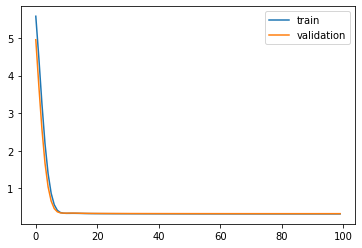

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 25s - loss: 5.5792 - acc: 0.6378 - val_loss: 4.9560 - val_acc: 0.8303

Epoch 00001: val_loss improved from inf to 4.95601, saving model to Event_val_weights3.hdf5
Epoch 2/100
 - 1s - loss: 4.4620 - acc: 0.8513 - val_loss: 3.7176 - val_acc: 0.8651

Epoch 00002: val_loss improved from 4.95601 to 3.71757, saving model to Event_val_weights3.hdf5
Epoch 3/100
 - 1s - loss: 3.2435 - acc: 0.8706 - val_loss: 2.5749 - val_acc: 0.8709

Epoch 00003: val_loss improved from 3.71757 to 2.57495, saving model to Event_val_weights3.hdf5
Epoch 4/100
 - 1s - loss: 2.1840 - acc: 0.8739 - val_loss: 1.6676 - val_acc: 0.8741

Epoch 00004: val_loss improved from 2.57495 to 1.66759, saving model to Event_val_weights3.hdf5
Epoch 5/100
 - 1s - loss: 1.3875 - acc: 0.8751 - val_loss: 1.0411 - val_acc: 0.8746

Epoch 00005: val_loss improved from 1.66759 to 1.04112, saving model to Event_val_weights3.hdf5
Epoch 6/100
 - 1s - loss: 0.8638 - acc: 0.8758 - 

 - 1s - loss: 0.3186 - acc: 0.8790 - val_loss: 0.3247 - val_acc: 0.8777

Epoch 00047: val_loss improved from 0.32474 to 0.32466, saving model to Event_val_weights3.hdf5
Epoch 48/100
 - 1s - loss: 0.3185 - acc: 0.8790 - val_loss: 0.3246 - val_acc: 0.8777

Epoch 00048: val_loss improved from 0.32466 to 0.32457, saving model to Event_val_weights3.hdf5
Epoch 49/100
 - 1s - loss: 0.3184 - acc: 0.8789 - val_loss: 0.3245 - val_acc: 0.8776

Epoch 00049: val_loss improved from 0.32457 to 0.32450, saving model to Event_val_weights3.hdf5
Epoch 50/100
 - 1s - loss: 0.3183 - acc: 0.8790 - val_loss: 0.3244 - val_acc: 0.8774

Epoch 00050: val_loss improved from 0.32450 to 0.32442, saving model to Event_val_weights3.hdf5
Epoch 51/100
 - 1s - loss: 0.3182 - acc: 0.8791 - val_loss: 0.3243 - val_acc: 0.8773

Epoch 00051: val_loss improved from 0.32442 to 0.32435, saving model to Event_val_weights3.hdf5
Epoch 52/100
 - 1s - loss: 0.3181 - acc: 0.8791 - val_loss: 0.3243 - val_acc: 0.8771

Epoch 00052: val_

 - 1s - loss: 0.3165 - acc: 0.8795 - val_loss: 0.3237 - val_acc: 0.8770

Epoch 00096: val_loss did not improve from 0.32330
Epoch 97/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3237 - val_acc: 0.8769

Epoch 00097: val_loss did not improve from 0.32330
Epoch 98/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3237 - val_acc: 0.8769

Epoch 00098: val_loss did not improve from 0.32330
Epoch 99/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3238 - val_acc: 0.8770

Epoch 00099: val_loss did not improve from 0.32330
Epoch 100/100
 - 1s - loss: 0.3166 - acc: 0.8795 - val_loss: 0.3238 - val_acc: 0.8769

Epoch 00100: val_loss did not improve from 0.32330
#################################
Number of units: 16
Batch size: 16384
Fold: 2
L2 : 0.05441600579314996
LR: 0.04409128374886731
Decay: 5.979204140676134e-08
best val loss: 0.32329559326171875
#################################


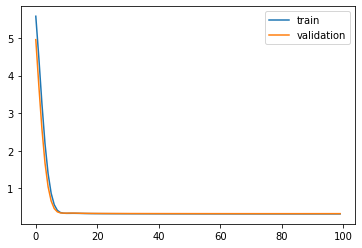

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 24s - loss: 5.5786 - acc: 0.6384 - val_loss: 4.9639 - val_acc: 0.8178

Epoch 00001: val_loss improved from inf to 4.96393, saving model to Event_val_weights4.hdf5
Epoch 2/100
 - 1s - loss: 4.4617 - acc: 0.8522 - val_loss: 3.7255 - val_acc: 0.8612

Epoch 00002: val_loss improved from 4.96393 to 3.72552, saving model to Event_val_weights4.hdf5
Epoch 3/100
 - 1s - loss: 3.2429 - acc: 0.8712 - val_loss: 2.5842 - val_acc: 0.8658

Epoch 00003: val_loss improved from 3.72552 to 2.58424, saving model to Event_val_weights4.hdf5
Epoch 4/100
 - 1s - loss: 2.1832 - acc: 0.8745 - val_loss: 1.6761 - val_acc: 0.8674

Epoch 00004: val_loss improved from 2.58424 to 1.67607, saving model to Event_val_weights4.hdf5
Epoch 5/100
 - 1s - loss: 1.3867 - acc: 0.8758 - val_loss: 1.0486 - val_acc: 0.8688

Epoch 00005: val_loss improved from 1.67607 to 1.04856, saving model to Event_val_weights4.hdf5
Epoch 6/100
 - 1s - loss: 0.8630 - acc: 0.8766 - 

 - 1s - loss: 0.3181 - acc: 0.8798 - val_loss: 0.3294 - val_acc: 0.8712

Epoch 00047: val_loss improved from 0.32948 to 0.32939, saving model to Event_val_weights4.hdf5
Epoch 48/100
 - 1s - loss: 0.3180 - acc: 0.8798 - val_loss: 0.3293 - val_acc: 0.8712

Epoch 00048: val_loss improved from 0.32939 to 0.32931, saving model to Event_val_weights4.hdf5
Epoch 49/100
 - 1s - loss: 0.3179 - acc: 0.8798 - val_loss: 0.3292 - val_acc: 0.8711

Epoch 00049: val_loss improved from 0.32931 to 0.32923, saving model to Event_val_weights4.hdf5
Epoch 50/100
 - 1s - loss: 0.3178 - acc: 0.8798 - val_loss: 0.3292 - val_acc: 0.8712

Epoch 00050: val_loss improved from 0.32923 to 0.32916, saving model to Event_val_weights4.hdf5
Epoch 51/100
 - 1s - loss: 0.3177 - acc: 0.8799 - val_loss: 0.3291 - val_acc: 0.8711

Epoch 00051: val_loss improved from 0.32916 to 0.32909, saving model to Event_val_weights4.hdf5
Epoch 52/100
 - 1s - loss: 0.3176 - acc: 0.8798 - val_loss: 0.3290 - val_acc: 0.8711

Epoch 00052: val_


Epoch 00095: val_loss did not improve from 0.32810
Epoch 96/100
 - 1s - loss: 0.3160 - acc: 0.8800 - val_loss: 0.3284 - val_acc: 0.8709

Epoch 00096: val_loss did not improve from 0.32810
Epoch 97/100
 - 1s - loss: 0.3160 - acc: 0.8800 - val_loss: 0.3284 - val_acc: 0.8709

Epoch 00097: val_loss did not improve from 0.32810
Epoch 98/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3285 - val_acc: 0.8710

Epoch 00098: val_loss did not improve from 0.32810
Epoch 99/100
 - 1s - loss: 0.3160 - acc: 0.8801 - val_loss: 0.3285 - val_acc: 0.8710

Epoch 00099: val_loss did not improve from 0.32810
Epoch 100/100
 - 1s - loss: 0.3160 - acc: 0.8802 - val_loss: 0.3285 - val_acc: 0.8710

Epoch 00100: val_loss did not improve from 0.32810
#################################
Number of units: 16
Batch size: 16384
Fold: 3
L2 : 0.05441600579314996
LR: 0.04409128374886731
Decay: 5.979204140676134e-08
best val loss: 0.32809606194496155
#################################


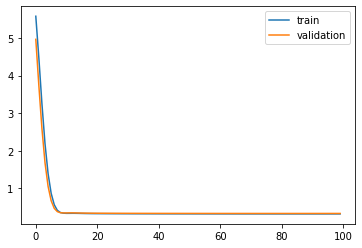

Train on 81000 samples, validate on 9000 samples
Epoch 1/100
 - 24s - loss: 5.5792 - acc: 0.6375 - val_loss: 4.9558 - val_acc: 0.8307

Epoch 00001: val_loss improved from inf to 4.95584, saving model to Event_val_weights5.hdf5
Epoch 2/100
 - 1s - loss: 4.4634 - acc: 0.8508 - val_loss: 3.7074 - val_acc: 0.8700

Epoch 00002: val_loss improved from 4.95584 to 3.70737, saving model to Event_val_weights5.hdf5
Epoch 3/100
 - 1s - loss: 3.2449 - acc: 0.8700 - val_loss: 2.5607 - val_acc: 0.8742

Epoch 00003: val_loss improved from 3.70737 to 2.56072, saving model to Event_val_weights5.hdf5
Epoch 4/100
 - 1s - loss: 2.1849 - acc: 0.8735 - val_loss: 1.6516 - val_acc: 0.8776

Epoch 00004: val_loss improved from 2.56072 to 1.65160, saving model to Event_val_weights5.hdf5
Epoch 5/100
 - 1s - loss: 1.3881 - acc: 0.8748 - val_loss: 1.0263 - val_acc: 0.8772

Epoch 00005: val_loss improved from 1.65160 to 1.02630, saving model to Event_val_weights5.hdf5
Epoch 6/100
 - 1s - loss: 0.8641 - acc: 0.8756 - 


Epoch 00046: val_loss improved from 0.32003 to 0.31994, saving model to Event_val_weights5.hdf5
Epoch 47/100
 - 1s - loss: 0.3191 - acc: 0.8789 - val_loss: 0.3198 - val_acc: 0.8788

Epoch 00047: val_loss improved from 0.31994 to 0.31985, saving model to Event_val_weights5.hdf5
Epoch 48/100
 - 1s - loss: 0.3190 - acc: 0.8788 - val_loss: 0.3198 - val_acc: 0.8791

Epoch 00048: val_loss improved from 0.31985 to 0.31976, saving model to Event_val_weights5.hdf5
Epoch 49/100
 - 1s - loss: 0.3189 - acc: 0.8788 - val_loss: 0.3197 - val_acc: 0.8791

Epoch 00049: val_loss improved from 0.31976 to 0.31968, saving model to Event_val_weights5.hdf5
Epoch 50/100
 - 1s - loss: 0.3188 - acc: 0.8789 - val_loss: 0.3196 - val_acc: 0.8792

Epoch 00050: val_loss improved from 0.31968 to 0.31960, saving model to Event_val_weights5.hdf5
Epoch 51/100
 - 1s - loss: 0.3187 - acc: 0.8789 - val_loss: 0.3195 - val_acc: 0.8793

Epoch 00051: val_loss improved from 0.31960 to 0.31953, saving model to Event_val_weights


Epoch 00093: val_loss improved from 0.31806 to 0.31803, saving model to Event_val_weights5.hdf5
Epoch 94/100
 - 1s - loss: 0.3173 - acc: 0.8790 - val_loss: 0.3181 - val_acc: 0.8794

Epoch 00094: val_loss did not improve from 0.31803
Epoch 95/100
 - 1s - loss: 0.3172 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8793

Epoch 00095: val_loss did not improve from 0.31803
Epoch 96/100
 - 1s - loss: 0.3173 - acc: 0.8790 - val_loss: 0.3180 - val_acc: 0.8793

Epoch 00096: val_loss did not improve from 0.31803
Epoch 97/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00097: val_loss did not improve from 0.31803
Epoch 98/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.8792

Epoch 00098: val_loss did not improve from 0.31803
Epoch 99/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3181 - val_acc: 0.8793

Epoch 00099: val_loss did not improve from 0.31803
Epoch 100/100
 - 1s - loss: 0.3173 - acc: 0.8791 - val_loss: 0.3180 - val_acc: 0.

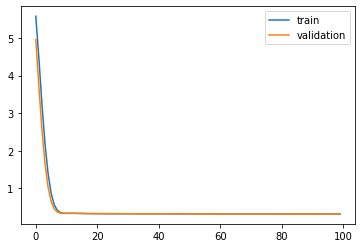

Time to train LSTM:  91.35819697380066
Entire process took:  9744.699809074402
Experiment record:
[[16, 16384, 0.05441600579314996, 0.03576308289373958, 3.985581210035447e-06, 0, 0.31254762411117554], [16, 16384, 0.05441600579314996, 0.03576308289373958, 3.985581210035447e-06, 1, 0.32306617498397827], [16, 16384, 0.05441600579314996, 0.03576308289373958, 3.985581210035447e-06, 2, 0.3230780065059662], [16, 16384, 0.05441600579314996, 0.03576308289373958, 3.985581210035447e-06, 3, 0.32795920968055725], [16, 16384, 0.05441600579314996, 0.03576308289373958, 3.985581210035447e-06, 4, 0.31813740730285645], [16, 16384, 0.05441600579314996, 0.042799187922401144, 2.690061803835159e-07, 0, 0.31208857893943787], [16, 16384, 0.05441600579314996, 0.042799187922401144, 2.690061803835159e-07, 1, 0.3231160342693329], [16, 16384, 0.05441600579314996, 0.042799187922401144, 2.690061803835159e-07, 2, 0.32325416803359985], [16, 16384, 0.05441600579314996, 0.042799187922401144, 2.690061803835159e-07, 3, 0.3

In [12]:
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)

num_per_fold = x_train.shape[0]//10
print(num_per_fold)

units = 16
batch_s = 16384
L2_1 = 0.05441600579314996

start_time = time.time()

#lr_list = [0.03987630160515601, 0.038245434054820546, 0.03547018571391636, 0.03338519623183323, 0.04056298580490226, 0.03595353565272186, 0.04339705265871725, 0.037950910299981724, 0.03947146500565393, 0.04113387739738984, 0.04975560678433541, 0.045496454923046034, 0.03533002337040452, 0.04690669138016569, 0.045593985814263036, 0.026361862695558867, 0.04296593091410486, 0.04505426406061189, 0.043410166095285974, 0.042728293769529184]
#decay_list = [3.6766162899670417e-07, 1.0270347141452551e-07, 3.081568945024038e-06, 4.5434016992397886e-07, 6.338524505782494e-07, 3.675663188445745e-07, 1.3344457741334481e-07, 1.978702319748868e-06, 3.1097953157963638e-06, 1.566949434233884e-06, 3.2135019340712873e-07, 3.5633531456053403e-07, 1.5409353131836596e-06, 1.0501233212386786e-07, 1.256034124038406e-06, 1.7880642980882373e-06, 3.808402027227084e-07, 6.840421973086213e-06, 1.5968133777337961e-06, 2.8723546903939884e-07]

print(len(lr_list) == len(decay_list))

exp_record = []

for i in range(len(lr_list)):
    lr = lr_list[i]
    decay = decay_list[i]
    for f in range(5):#10
        #start = f*num_per_fold
        end = (f+1)*num_per_fold
        train1_x = x_train[:end, ]
        train2_x = x_train[end:, ]
        train_x_lstm = np.append(train2_x, train1_x, axis=0) 
        train1_y = y_train[:end, ]
        train2_y = y_train[end:, ]
        train_y_lstm = np.append(train2_y, train1_y, axis=0)
        ######################
        seed(1)
        set_random_seed(1)
        ######################
        start_time_inner = time.time()
        with tf.Session(config = tf.ConfigProto(log_device_placement = True)):
            model = Sequential()
            model.add(CuDNNLSTM(units, 
                                kernel_regularizer=regularizers.l2(L2_1),
                                #return_sequences=True, 
                                input_shape=(8, 182))) 
            #model.add(CuDNNLSTM(units, 
            #                    kernel_regularizer=regularizers.l2(L2_2)))
            model.add(Dense(2, activation='softmax'))
            sgdm = optimizers.SGD(lr=lr, momentum=0.9, decay=decay) 
            model.compile(loss='categorical_crossentropy', 
                          optimizer=sgdm, metrics=['accuracy'])
            val_weight = "Event_val_weights" + str(f+1) + ".hdf5"
            val_checkpointer = ModelCheckpoint(filepath=val_weight,
                                               monitor='val_loss', verbose=1,
                                               save_best_only=True)
            history = model.fit(train_x_lstm, train_y_lstm, batch_size=batch_s, 
                                epochs=100, validation_split=0.1, 
                                callbacks=[val_checkpointer], 
                                verbose=2, 
                                shuffle=False) 
            print("#################################")
            print("Number of units:", units)
            print("Batch size:", batch_s)
            print("Fold:", f)
            print("L2 :", L2_1)
            print("LR:", lr)
            print("Decay:", decay)
            print("best val loss:", min(history.history['val_loss']))
            exp_record.append([units, batch_s, L2_1, lr, decay, f, min(history.history['val_loss'])])
            #exp_record.append([units, batch_s, L2_1, L2_2, f, min(history.history['val_loss'])])
            print("#################################")
            if(f==4):
                print(exp_record)
            pyplot.plot(history.history['loss'], label='train')
            pyplot.plot(history.history['val_loss'], label='validation')
            pyplot.legend()
            pyplot.show()
    end_time = time.time()
    print("Time to train LSTM: ", time.time() - start_time_inner)
print("Entire process took: ", time.time() - start_time)

print("Experiment record:")
print(exp_record)

In [13]:
#exp_record = [[16, 16384, 0.05441600579314996, 0.04732150378590004, 8.281829615574751e-07, 0, 0.3120262920856476], [16, 16384, 0.05441600579314996, 0.04732150378590004, 8.281829615574751e-07, 1, 0.3232078552246094], [16, 16384, 0.05441600579314996, 0.04732150378590004, 8.281829615574751e-07, 2, 0.3233982026576996], [16, 16384, 0.05441600579314996, 0.04732150378590004, 8.281829615574751e-07, 3, 0.32816606760025024], [16, 16384, 0.05441600579314996, 0.04732150378590004, 8.281829615574751e-07, 4, 0.3180777430534363], [16, 16384, 0.05441600579314996, 0.03329949513252943, 5.627968412340616e-06, 0, 0.31273528933525085], [16, 16384, 0.05441600579314996, 0.03329949513252943, 5.627968412340616e-06, 1, 0.32314828038215637], [16, 16384, 0.05441600579314996, 0.03329949513252943, 5.627968412340616e-06, 2, 0.32314586639404297], [16, 16384, 0.05441600579314996, 0.03329949513252943, 5.627968412340616e-06, 3, 0.32803159952163696], [16, 16384, 0.05441600579314996, 0.03329949513252943, 5.627968412340616e-06, 4, 0.3182762563228607], [16, 16384, 0.05441600579314996, 0.0455307280764458, 1.2153613162323311e-07, 0, 0.31203174591064453], [16, 16384, 0.05441600579314996, 0.0455307280764458, 1.2153613162323311e-07, 1, 0.32317087054252625], [16, 16384, 0.05441600579314996, 0.0455307280764458, 1.2153613162323311e-07, 2, 0.3233413100242615], [16, 16384, 0.05441600579314996, 0.0455307280764458, 1.2153613162323311e-07, 3, 0.3281277120113373], [16, 16384, 0.05441600579314996, 0.0455307280764458, 1.2153613162323311e-07, 4, 0.31804338097572327], [16, 16384, 0.05441600579314996, 0.02604241564313125, 1.5613037489711254e-06, 0, 0.31340062618255615], [16, 16384, 0.05441600579314996, 0.02604241564313125, 1.5613037489711254e-06, 1, 0.32364535331726074], [16, 16384, 0.05441600579314996, 0.02604241564313125, 1.5613037489711254e-06, 2, 0.32370391488075256], [16, 16384, 0.05441600579314996, 0.02604241564313125, 1.5613037489711254e-06, 3, 0.3285379111766815], [16, 16384, 0.05441600579314996, 0.02604241564313125, 1.5613037489711254e-06, 4, 0.31890353560447693], [16, 16384, 0.05441600579314996, 0.0276914169983992, 3.6821178069060155e-06, 0, 0.3132310211658478], [16, 16384, 0.05441600579314996, 0.0276914169983992, 3.6821178069060155e-06, 1, 0.32349541783332825], [16, 16384, 0.05441600579314996, 0.0276914169983992, 3.6821178069060155e-06, 2, 0.3235394060611725], [16, 16384, 0.05441600579314996, 0.0276914169983992, 3.6821178069060155e-06, 3, 0.32839030027389526], [16, 16384, 0.05441600579314996, 0.0276914169983992, 3.6821178069060155e-06, 4, 0.31873297691345215], [16, 16384, 0.05441600579314996, 0.03987630160515601, 3.6766162899670417e-07, 0, 0.3122531771659851], [16, 16384, 0.05441600579314996, 0.03987630160515601, 3.6766162899670417e-07, 1, 0.3230595588684082], [16, 16384, 0.05441600579314996, 0.03987630160515601, 3.6766162899670417e-07, 2, 0.3231618106365204], [16, 16384, 0.05441600579314996, 0.03987630160515601, 3.6766162899670417e-07, 3, 0.3280041217803955], [16, 16384, 0.05441600579314996, 0.03987630160515601, 3.6766162899670417e-07, 4, 0.3180035948753357], [16, 16384, 0.05441600579314996, 0.038245434054820546, 1.0270347141452551e-07, 0, 0.3123664855957031], [16, 16384, 0.05441600579314996, 0.038245434054820546, 1.0270347141452551e-07, 1, 0.3230382800102234], [16, 16384, 0.05441600579314996, 0.038245434054820546, 1.0270347141452551e-07, 2, 0.3231099843978882], [16, 16384, 0.05441600579314996, 0.038245434054820546, 1.0270347141452551e-07, 3, 0.3279694616794586], [16, 16384, 0.05441600579314996, 0.038245434054820546, 1.0270347141452551e-07, 4, 0.3180142641067505], [16, 16384, 0.05441600579314996, 0.03547018571391636, 3.081568945024038e-06, 0, 0.3125685453414917], [16, 16384, 0.05441600579314996, 0.03547018571391636, 3.081568945024038e-06, 1, 0.3230733573436737], [16, 16384, 0.05441600579314996, 0.03547018571391636, 3.081568945024038e-06, 2, 0.32308173179626465], [16, 16384, 0.05441600579314996, 0.03547018571391636, 3.081568945024038e-06, 3, 0.3279642164707184], [16, 16384, 0.05441600579314996, 0.03547018571391636, 3.081568945024038e-06, 4, 0.3181503117084503], [16, 16384, 0.05441600579314996, 0.03338519623183323, 4.5434016992397886e-07, 0, 0.3127250373363495], [16, 16384, 0.05441600579314996, 0.03338519623183323, 4.5434016992397886e-07, 1, 0.32314333319664], [16, 16384, 0.05441600579314996, 0.03338519623183323, 4.5434016992397886e-07, 2, 0.3231411278247833], [16, 16384, 0.05441600579314996, 0.03338519623183323, 4.5434016992397886e-07, 3, 0.32802698016166687], [16, 16384, 0.05441600579314996, 0.03338519623183323, 4.5434016992397886e-07, 4, 0.3182680904865265], [16, 16384, 0.05441600579314996, 0.04056298580490226, 6.338524505782494e-07, 0, 0.312207967042923], [16, 16384, 0.05441600579314996, 0.04056298580490226, 6.338524505782494e-07, 1, 0.32307249307632446], [16, 16384, 0.05441600579314996, 0.04056298580490226, 6.338524505782494e-07, 2, 0.32318317890167236], [16, 16384, 0.05441600579314996, 0.04056298580490226, 6.338524505782494e-07, 3, 0.3280186653137207], [16, 16384, 0.05441600579314996, 0.04056298580490226, 6.338524505782494e-07, 4, 0.3180079162120819], [16, 16384, 0.05441600579314996, 0.03595353565272186, 3.675663188445745e-07, 0, 0.31253117322921753], [16, 16384, 0.05441600579314996, 0.03595353565272186, 3.675663188445745e-07, 1, 0.32306158542633057], [16, 16384, 0.05441600579314996, 0.03595353565272186, 3.675663188445745e-07, 2, 0.3230767846107483], [16, 16384, 0.05441600579314996, 0.03595353565272186, 3.675663188445745e-07, 3, 0.32795682549476624], [16, 16384, 0.05441600579314996, 0.03595353565272186, 3.675663188445745e-07, 4, 0.31812578439712524], [16, 16384, 0.05441600579314996, 0.04339705265871725, 1.3344457741334481e-07, 0, 0.3120681345462799], [16, 16384, 0.05441600579314996, 0.04339705265871725, 1.3344457741334481e-07, 1, 0.32312777638435364], [16, 16384, 0.05441600579314996, 0.04339705265871725, 1.3344457741334481e-07, 2, 0.32327336072921753], [16, 16384, 0.05441600579314996, 0.04339705265871725, 1.3344457741334481e-07, 3, 0.32808083295822144], [16, 16384, 0.05441600579314996, 0.04339705265871725, 1.3344457741334481e-07, 4, 0.3180217146873474], [16, 16384, 0.05441600579314996, 0.037950910299981724, 1.978702319748868e-06, 0, 0.3123887777328491], [16, 16384, 0.05441600579314996, 0.037950910299981724, 1.978702319748868e-06, 1, 0.3230377435684204], [16, 16384, 0.05441600579314996, 0.037950910299981724, 1.978702319748868e-06, 2, 0.323099285364151], [16, 16384, 0.05441600579314996, 0.037950910299981724, 1.978702319748868e-06, 3, 0.32796236872673035], [16, 16384, 0.05441600579314996, 0.037950910299981724, 1.978702319748868e-06, 4, 0.3180486559867859], [16, 16384, 0.05441600579314996, 0.03947146500565393, 3.1097953157963638e-06, 0, 0.3122829496860504], [16, 16384, 0.05441600579314996, 0.03947146500565393, 3.1097953157963638e-06, 1, 0.32305100560188293], [16, 16384, 0.05441600579314996, 0.03947146500565393, 3.1097953157963638e-06, 2, 0.3231474459171295], [16, 16384, 0.05441600579314996, 0.03947146500565393, 3.1097953157963638e-06, 3, 0.32799410820007324], [16, 16384, 0.05441600579314996, 0.03947146500565393, 3.1097953157963638e-06, 4, 0.31800979375839233], [16, 16384, 0.05441600579314996, 0.04113387739738984, 1.566949434233884e-06, 0, 0.312173068523407], [16, 16384, 0.05441600579314996, 0.04113387739738984, 1.566949434233884e-06, 1, 0.32308295369148254], [16, 16384, 0.05441600579314996, 0.04113387739738984, 1.566949434233884e-06, 2, 0.3232007622718811], [16, 16384, 0.05441600579314996, 0.04113387739738984, 1.566949434233884e-06, 3, 0.32803070545196533], [16, 16384, 0.05441600579314996, 0.04113387739738984, 1.566949434233884e-06, 4, 0.3179798722267151], [16, 16384, 0.05441600579314996, 0.04975560678433541, 3.2135019340712873e-07, 0, 0.31204017996788025], [16, 16384, 0.05441600579314996, 0.04975560678433541, 3.2135019340712873e-07, 1, 0.3232593834400177], [16, 16384, 0.05441600579314996, 0.04975560678433541, 3.2135019340712873e-07, 2, 0.3234758973121643], [16, 16384, 0.05441600579314996, 0.04975560678433541, 3.2135019340712873e-07, 3, 0.3282194435596466], [16, 16384, 0.05441600579314996, 0.04975560678433541, 3.2135019340712873e-07, 4, 0.3181285560131073], [16, 16384, 0.05441600579314996, 0.045496454923046034, 3.5633531456053403e-07, 0, 0.3120320439338684], [16, 16384, 0.05441600579314996, 0.045496454923046034, 3.5633531456053403e-07, 1, 0.32317012548446655], [16, 16384, 0.05441600579314996, 0.045496454923046034, 3.5633531456053403e-07, 2, 0.3233400583267212], [16, 16384, 0.05441600579314996, 0.045496454923046034, 3.5633531456053403e-07, 3, 0.3281269371509552], [16, 16384, 0.05441600579314996, 0.045496454923046034, 3.5633531456053403e-07, 4, 0.31805503368377686], [16, 16384, 0.05441600579314996, 0.03533002337040452, 1.5409353131836596e-06, 0, 0.3125777840614319], [16, 16384, 0.05441600579314996, 0.03533002337040452, 1.5409353131836596e-06, 1, 0.32307684421539307], [16, 16384, 0.05441600579314996, 0.03533002337040452, 1.5409353131836596e-06, 2, 0.3230839669704437], [16, 16384, 0.05441600579314996, 0.03533002337040452, 1.5409353131836596e-06, 3, 0.32796692848205566], [16, 16384, 0.05441600579314996, 0.03533002337040452, 1.5409353131836596e-06, 4, 0.3181571960449219], [16, 16384, 0.05441600579314996, 0.04690669138016569, 1.0501233212386786e-07, 0, 0.3120262920856476], [16, 16384, 0.05441600579314996, 0.04690669138016569, 1.0501233212386786e-07, 1, 0.32319945096969604], [16, 16384, 0.05441600579314996, 0.04690669138016569, 1.0501233212386786e-07, 2, 0.32338547706604004], [16, 16384, 0.05441600579314996, 0.04690669138016569, 1.0501233212386786e-07, 3, 0.3281574845314026], [16, 16384, 0.05441600579314996, 0.04690669138016569, 1.0501233212386786e-07, 4, 0.3180712163448334], [16, 16384, 0.05441600579314996, 0.045593985814263036, 1.256034124038406e-06, 0, 0.31203126907348633], [16, 16384, 0.05441600579314996, 0.045593985814263036, 1.256034124038406e-06, 1, 0.3231717050075531], [16, 16384, 0.05441600579314996, 0.045593985814263036, 1.256034124038406e-06, 2, 0.32334282994270325], [16, 16384, 0.05441600579314996, 0.045593985814263036, 1.256034124038406e-06, 3, 0.32812851667404175], [16, 16384, 0.05441600579314996, 0.045593985814263036, 1.256034124038406e-06, 4, 0.3180425465106964], [16, 16384, 0.05441600579314996, 0.026361862695558867, 1.7880642980882373e-06, 0, 0.31336668133735657], [16, 16384, 0.05441600579314996, 0.026361862695558867, 1.7880642980882373e-06, 1, 0.3236143887042999], [16, 16384, 0.05441600579314996, 0.026361862695558867, 1.7880642980882373e-06, 2, 0.323669970035553], [16, 16384, 0.05441600579314996, 0.026361862695558867, 1.7880642980882373e-06, 3, 0.32850775122642517], [16, 16384, 0.05441600579314996, 0.026361862695558867, 1.7880642980882373e-06, 4, 0.31886905431747437], [16, 16384, 0.05441600579314996, 0.04296593091410486, 3.808402027227084e-07, 0, 0.3120823800563812], [16, 16384, 0.05441600579314996, 0.04296593091410486, 3.808402027227084e-07, 1, 0.32311907410621643], [16, 16384, 0.05441600579314996, 0.04296593091410486, 3.808402027227084e-07, 2, 0.323259562253952], [16, 16384, 0.05441600579314996, 0.04296593091410486, 3.808402027227084e-07, 3, 0.3280711770057678], [16, 16384, 0.05441600579314996, 0.04296593091410486, 3.808402027227084e-07, 4, 0.31802281737327576], [16, 16384, 0.05441600579314996, 0.04505426406061189, 6.840421973086213e-06, 0, 0.3120364844799042], [16, 16384, 0.05441600579314996, 0.04505426406061189, 6.840421973086213e-06, 1, 0.3231586813926697], [16, 16384, 0.05441600579314996, 0.04505426406061189, 6.840421973086213e-06, 2, 0.3233225643634796], [16, 16384, 0.05441600579314996, 0.04505426406061189, 6.840421973086213e-06, 3, 0.3281143307685852], [16, 16384, 0.05441600579314996, 0.04505426406061189, 6.840421973086213e-06, 4, 0.3180307149887085], [16, 16384, 0.05441600579314996, 0.043410166095285974, 1.5968133777337961e-06, 0, 0.3120681941509247], [16, 16384, 0.05441600579314996, 0.043410166095285974, 1.5968133777337961e-06, 1, 0.323127418756485], [16, 16384, 0.05441600579314996, 0.043410166095285974, 1.5968133777337961e-06, 2, 0.3232730031013489], [16, 16384, 0.05441600579314996, 0.043410166095285974, 1.5968133777337961e-06, 3, 0.3280804455280304], [16, 16384, 0.05441600579314996, 0.043410166095285974, 1.5968133777337961e-06, 4, 0.3180104196071625], [16, 16384, 0.05441600579314996, 0.042728293769529184, 2.8723546903939884e-07, 0, 0.3120913505554199], [16, 16384, 0.05441600579314996, 0.042728293769529184, 2.8723546903939884e-07, 1, 0.3231145143508911], [16, 16384, 0.05441600579314996, 0.042728293769529184, 2.8723546903939884e-07, 2, 0.3232519030570984], [16, 16384, 0.05441600579314996, 0.042728293769529184, 2.8723546903939884e-07, 3, 0.3280662000179291], [16, 16384, 0.05441600579314996, 0.042728293769529184, 2.8723546903939884e-07, 4, 0.3180173635482788]]
              
complete_v = np.array(exp_record)
print(complete_v.shape)

val_loss_list = []
for i in range(25):
    h_params = complete_v[(i*5):((i+1)*5), :]
    print("###############################")
    print("Units:", h_params[0, 0])
    print("Batch size:", h_params[0, 1])
    print("L2 :", h_params[0, 2])
    print("learning rate:", h_params[0, 3])
    print("Decay:", h_params[0, 4])
    #print("Val loss (mean):", np.mean(h_params[:, 5]))
    #print("Val loss (std):", np.std(h_params[:, 5]))
    print("Val loss (mean):", 
          np.round(np.mean(h_params[:, 6]), decimals=5))
    print("Val loss (std):", 
          np.round(np.std(h_params[:, 6]), decimals=5))
    print("###############################")
    val_loss_list.append(np.mean(h_params[:, 6]))
print(min(val_loss_list))
print("max LR:", max(complete_v[:, 3]))
print("min LR", min(complete_v[:, 3]))
print("max Decay:", max(complete_v[:, 4]))
print("min Decay", min(complete_v[:, 4]))

(125, 7)
###############################
Units: 16.0
Batch size: 16384.0
L2 : 0.05441600579314996
learning rate: 0.03576308289373958
Decay: 3.985581210035447e-06
Val loss (mean): 0.32096
Val loss (std): 0.00523
###############################
###############################
Units: 16.0
Batch size: 16384.0
L2 : 0.05441600579314996
learning rate: 0.042799187922401144
Decay: 2.690061803835159e-07
Val loss (mean): 0.32091
Val loss (std): 0.00544
###############################
###############################
Units: 16.0
Batch size: 16384.0
L2 : 0.05441600579314996
learning rate: 0.03938409231440894
Decay: 5.607514725076507e-08
Val loss (mean): 0.3209
Val loss (std): 0.00534
###############################
###############################
Units: 16.0
Batch size: 16384.0
L2 : 0.05441600579314996
learning rate: 0.042234651778309415
Decay: 9.83921107512064e-08
Val loss (mean): 0.3209
Val loss (std): 0.00542
###############################
###############################
Units: 16.0
Batch size: 

## Surface plot

In [4]:
import matplotlib
matplotlib.__version__
import matplotlib.colors as mcolors

In [5]:
# LSTM 
'''
x = np.array([4, 8, 16, 32, 64])
y = np.array([2048, 4096, 8192, 16384, 32768])
complete_list = [[0.30259, 0.30316, 0.30291, 0.30293, 0.30286],
                 [0.30196, 0.30196, 0.30216, 0.30223, 0.30236],
                 [0.30207, 0.30146, 0.30145, 0.30162, 0.30203], 
                 [0.30491, 0.30184, 0.30132, 0.30118, 0.30128],
                 [0.31124, 0.30572, 0.30386, 0.30196, 0.30148]]
'''
# Simple RNN
'''
x = np.array([2, 4, 8, 16, 32])
y = np.array([2048, 4096, 8192, 16384, 32768])
complete_list = [[0.30326, 0.30232, 0.30275, 0.30345, 0.30385],
                 [0.30240, 0.30269, 0.30309, 0.30337, 0.30377],
                 [0.30394, 0.30161, 0.30245, 0.30300, 0.30372], 
                 [0.30733, 0.30347, 0.30255, 0.30209, 0.3024],
                 [0.31432, 0.30652, 0.30376, 0.30255, 0.30334]]
'''
# MLP
x = np.array([4, 8, 16, 32, 64])
y = np.array([16, 32, 64, 128, 256])
complete_list = [[0.30918, 0.30564, 0.30353, 0.30375, 0.30487],
                 [0.31410, 0.30433, 0.30302, 0.30372, 0.30426],
                 [0.31474, 0.30408, 0.30305, 0.30225, 0.30356], 
                 [0.30983, 0.30524, 0.30354, 0.30228, 0.30284],
                 [0.30987, 0.30433, 0.30239, 0.30351, 0.30413]]
X,Y = np.meshgrid(x, y)
print(X)
print(Y)
print(np.round(complete_list, decimals=5))

[[ 4  8 16 32 64]
 [ 4  8 16 32 64]
 [ 4  8 16 32 64]
 [ 4  8 16 32 64]
 [ 4  8 16 32 64]]
[[ 16  16  16  16  16]
 [ 32  32  32  32  32]
 [ 64  64  64  64  64]
 [128 128 128 128 128]
 [256 256 256 256 256]]
[[0.30918 0.30564 0.30353 0.30375 0.30487]
 [0.3141  0.30433 0.30302 0.30372 0.30426]
 [0.31474 0.30408 0.30305 0.30225 0.30356]
 [0.30983 0.30524 0.30354 0.30228 0.30284]
 [0.30987 0.30433 0.30239 0.30351 0.30413]]


(5, 5)
(5, 5)
(5, 5)


<IPython.core.display.Javascript object>


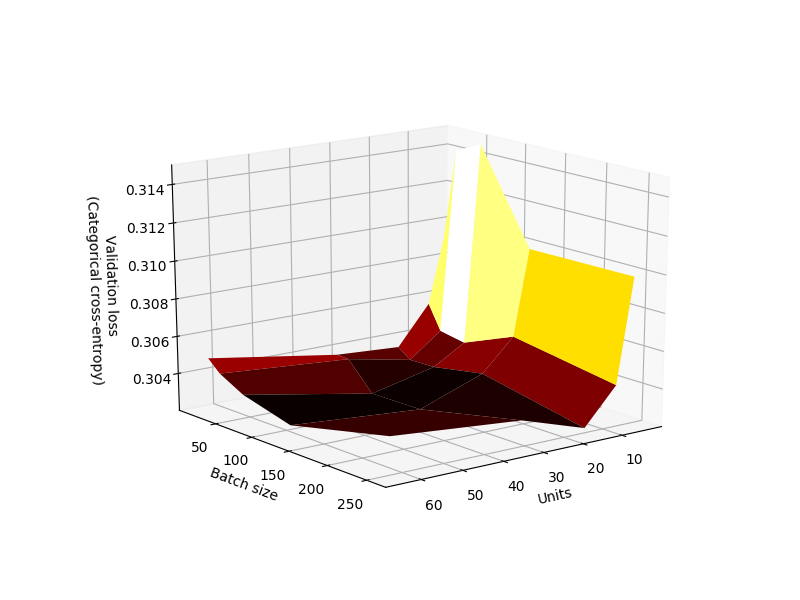

In [6]:
%matplotlib notebook
from mpl_toolkits.mplot3d import axes3d    
from mpl_toolkits import mplot3d

X,Y = np.meshgrid(x, y)
z = np.array(complete_list)
# reset norm of color map
#z_mean = np.mean(z)
#print(z_mean)
#mcolors.DivergingNorm(vmin=np.min(z), vcenter= np.mean(z), vmax=np.max(z))

print(X.shape)
print(Y.shape)
print(z.shape)
fig = pyplot.figure(figsize=(8, 6))
ax = pyplot.axes(projection='3d')

ax.set_xlabel('Units')
ax.set_ylabel('Batch size')
ax.set_zlabel('Validation loss \n (Categorical cross-entropy)', labelpad=10)

ax.plot_surface(X, Y, z, rstride=1, cstride=1,
                cmap='hot', edgecolor='none')#'winter' #hot #afmhot
#ax.set_title('Simple RNN hyperparameter search (units and batch size)')
pyplot.show()

In [60]:
filename = "/home/whsu014/plots/EVENT_MLP_HyperparameterSearch_unit_batch_size_no_title.png"
pyplot.savefig(filename)
pyplot.tight_layout()